In [1]:
import numpy as np
import pandas as pd
from keras.models import load_model
from keras.preprocessing import sequence
import matplotlib.pyplot as plt
import tensorflow as tf
import cupy as cp
import matplotlib.pyplot as plt

Using TensorFlow backend.
/home/lab606a/.virtualenvs/keras/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/lab606a/.virtualenvs/keras/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/lab606a/.virtualenvs/keras/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/lab606a/.virtualenvs

In [2]:
class Listener:
    def __init__(self):
        self.__time_step = 9
        self.__tmp = cp.zeros([1,3])
        self.__arr_classification = cp.zeros([1,90])
        self.__vis_point = cp.zeros((1,3))
        self.__vis_balls = cp.zeros((self.__time_step,3))
        self.__vis_balls2 = cp.zeros((1,4))
        self.__predction_balls = cp.zeros((1,self.__time_step,3))
        self.__arr_prediction = cp.zeros([1,self.__time_step*3])
        self.__arr_pred_possible = cp.zeros((1,4))
        self.__diff = cp.zeros([1,3])
        self.__padding_done = False
        self.__cnt = 1
        self.__num = 1
        self.__max_index = 0
        self.__coor = -10*cp.ones(6)
        self.__find_possible_point = False
        self.__cal_possible_point = False
        self.__vis_possible_point = False
        self.__vis_hitting_point = cp.zeros((1,4))
        self.__hitting_point = -45
        self.__hitting_timimg = 0
        self.__possible_point = cp.zeros((1,4))
        self.__pred = cp.zeros([1,self.__time_step,3])
        self.__pred_for_offline = cp.zeros([1,self.__time_step,3])
        self.__time = 0.016667
        self.__delta_T = 0.016667
        self.__anchor = 0
        self.__rowww = 0
        self.__direction = 'top6'
        self.traj_done = False
        #self.fig, self.ax = plt.subplots(2,2, figsize=(10.24,7.2))
	#self.__name = sys.argv[1]
        self.__csv_path = '/home/lab606a/catkin_ws/src/pointcloud/offline/'
        #self.__model = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/60hz_culstm/prediction_top6')
        self.__classifier = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/fixed/classification_fixed')
        #rospy.loginfo("loaded classification model")
        self.__pred_top5 = load_model('/home/lab606a/Documents/model comparison/fixed model/saved mdoel/500_data/prediction_fixed_top5')
        self.__pred_top6 = load_model('/home/lab606a/Documents/model comparison/fixed model/saved mdoel/500_data/prediction_fixed_top6')
        #rospy.loginfo("loaded top prediction model")
        self.__pred_left5 = load_model('/home/lab606a/Documents/model comparison/fixed model/saved mdoel/500_data/prediction_fixed_left5')
        self.__pred_left6 = load_model('/home/lab606a/Documents/model comparison/fixed model/saved mdoel/500_data/prediction_fixed_left6')
        #rospy.loginfo("loaded left prediction model")
        self.__pred_right5 = load_model('/home/lab606a/Documents/model comparison/fixed model/saved mdoel/500_data/prediction_fixed_right5')
        self.__pred_right6 = load_model('/home/lab606a/Documents/model comparison/fixed model/saved mdoel/500_data/prediction_fixed_right6')
        #rospy.loginfo("loaded right prediction model")
        self.__pred_back5 = load_model('/home/lab606a/Documents/model comparison/fixed model/saved mdoel/500_data/prediction_fixed_back5')
        self.__pred_back6 = load_model('/home/lab606a/Documents/model comparison/fixed model/saved mdoel/500_data/prediction_fixed_back6')
        #rospy.loginfo("loaded back prediction model")
        #rospy.loginfo("Load not fixed model with classification")

    ## print spin direction and speed
    def top5(self):
        print("top spin speed 5")
        self.__model = self.__pred_top5
        self.__direction = '_top5'

    def top6(self):
        print("top spin speed 6")
        self.__model = self.__pred_top6
        self.__direction = '_top6'

    def left5(self):
        print("left spin speed 5")
        self.__model = self.__pred_left5
        self.__direction = '_left5'

    def left6(self):
        print("left spin speed 6")
        self.__model = self.__pred_left6
        self.__direction = '_left6'

    def right5(self):
        print("right spin speed 5")
        self.__model = self.__pred_right5
        self.__direction = '_right5'

    def right6(self):
        print("right spin speed 6")
        self.__model = self.__pred_right6
        self.__direction = '_right6'

    def back5(self):
        print("back spin speed 5")
        self.__model = self.__pred_back5
        self.__direction = '_back5'

    def back6(self):
        print("back spin speed 6")
        self.__model = self.__pred_back6
        self.__direction = '_back6'
        
    def append_pred(self): ## Exhaustive
        self.__pred = cp.array(self.__model.predict(cp.asnumpy(self.__arr_prediction.reshape(1,self.__time_step,3)), verbose=1))
        while not self.__find_possible_point == True:
            self.__pred = cp.array(self.__pred)
            if ( -50 < float(cp.min(self.__pred[self.__pred.shape[0]-1,:,:])) < -40): ## find possible hitting point
                index = cp.argmin(self.__pred[self.__pred.shape[0]-1,:,:])
                row = int((index-1)/3)
                count_down = row + (self.__pred.shape[0]-1)*9
                self.__find_possible_point = True
                self.__anchor = self.__pred.shape[0]-1
                print("count down = ", int(count_down))
                #index = cp.argmin(self.__anchor[self.__anchor,:,:])
                #row = int((index-1)/3)
                self.__pred[self.__anchor, row+1:, :] = 0
                self.__pred_for_offline = self.__pred

            else: ## predict next time step
                self.__pred = cp.vstack((self.__pred, cp.zeros([1,self.__time_step,3])))
                self.__pred[self.__pred.shape[0]-1,:,:] = cp.array(self.__model.predict(cp.asnumpy(self.__pred[self.__pred.shape[0]-2,:,:].reshape(1,self.__time_step,3)), verbose=1)).reshape(self.__time_step,3)
                if (self.__pred.shape[0] >= 8):
                    self.__pred = cp.zeros([1,self.__time_step,3])
                    self.__find_possible_point = True
                
    def update_prediction(self):
        self.__pred[0,:,:] = cp.array(self.__model.predict(cp.asnumpy(self.__arr_prediction.reshape(1,self.__time_step,3)), verbose=1)).reshape(self.__time_step,3)
        for i in range(1, self.__pred.shape[0]):
            self.__pred[i,:,:] = cp.array(self.__model.predict(cp.asnumpy(self.__pred[i-1,:,:].reshape(1,self.__time_step,3)), verbose=1)).reshape(self.__time_step,3)

    def modify(self):
        #index = cp.argmin(self.__pred[self.__anchor,:,:])
        #row = int((index-1)/3)
        if (self.__rowww < 8):
            self.__pred[self.__anchor, self.__rowww+1:, :] = 0
        if (self.__anchor != self.__pred.shape[0]-1):
            self.__pred[self.__anchor+1:, :, :] = 0
        if (self.__anchor == 0) and (self.__rowww == 0) and ( -10 < float(cp.min(self.__pred[self.__anchor,0,:])) < 10):
            self.__pred[self.__anchor,0,:] = 0
        self.__pred_for_offline = cp.vstack((self.__pred_for_offline, self.__pred))
        #self.pub_prediction()

    def calculate_hitting_point(self, arr):
        #print("cnt = ", self.__cnt)
        arr = cp.array(arr)
        self.__cal_possible_point = False
        while not self.__cal_possible_point == True:
            print(arr[self.__anchor,:,:])
            if (-55 <= float(cp.min(arr[self.__anchor,:,:])) <= -35) and (self.__anchor >= 0):
                #print("anchor = ", self.__anchor)
                index = cp.argmin(arr[self.__anchor,:,:])
                row = int((index-1)/3)
                self.__rowww = row
                if (-55 <= float(cp.min(arr[self.__anchor,:,:])) <= self.__hitting_point): ## interpolation
                    index = cp.argmin(arr[self.__anchor,:,:])
                    row = int((index-1)/3)
                    self.__rowww = row
                    count_down = row + self.__anchor*9
                    print("count down = ", count_down)
                    if (row == 0):
                        print("case a1")
                        self.__vis_point = cp.array(self.__vis_point)
                        w1 = (self.__hitting_point-self.__vis_point[:,1]) / (arr[self.__anchor,row,1]-self.__vis_point[:,1])
                        self.__possible_point = w1*arr[self.__anchor,row,:] + (1-w1)*self.__vis_point.reshape(1,1,3)
                        self.__hitting_timimg = self.__time + (w1+count_down)*self.__delta_T
                        self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))

                        #w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / (arr[self.__anchor,row,1]-arr[self.__anchor-1,self.__time_step-1,1])
                        #self.__possible_point = w1*arr[self.__anchor-1,self.__time_step-1,:] + (1-w1)*arr[self.__anchor,row,:]
                        #self.__hitting_timimg = self.__time + (w1+count_down)*self.__delta_T
                        #self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                        print("hitting timing and position = ", self.__possible_point)
                    else:
                        print("case a2")
                        w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / (arr[self.__anchor,row,1]-arr[self.__anchor,row-1,1])
                        self.__possible_point = w1*arr[self.__anchor,row-1,:] + (1-w1)*arr[self.__anchor,row,:]
                        self.__hitting_timimg = self.__time + (w1+count_down)*self.__delta_T
                        self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                        print("hitting timing and position = ", self.__possible_point)
                elif (self.__hitting_point < float(cp.min(arr[self.__anchor,:,:])) <= -40):
                    index = cp.argmin(arr[self.__anchor,:,:])
                    row = int((index-1)/3)
                    self.__rowww = row
                    count_down = row + self.__anchor*9
                    print("count down = ", count_down)
                    if (row == 0):
                        print("case b1")
                        if (self.__diff[:,1] > 0):
                            w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / self.__diff[:,1]
                            if w1 < 1:
                                self.__possible_point = arr[self.__anchor,row,:] - w1*self.__diff
                                self.__hitting_timimg = self.__time + (count_down+1+w1)*self.__delta_T
                                self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                                print("hitting timing and position = ", self.__possible_point)
                    else:
                        print("case b2")
                        self.__diff = arr[self.__anchor,row-1,:]-arr[self.__anchor,row,:]
                        self.__diff = self.__diff.reshape(1,3)
                        w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / self.__diff[:,1]
                        if w1 < 1:
                            self.__possible_point = arr[self.__anchor,row,:] - w1*self.__diff
                            self.__hitting_timimg = self.__time + (count_down+1+w1)*self.__delta_T
                            self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                            print("hitting timing and position = ", self.__possible_point)
                else:
                    self.__possible_point = self.__possible_point

                self.__cal_possible_point = True
                #self.pub_prediction()
                '''
                if (row < 8):
                    arr[self.__anchor, row+1:, :] = 0
                if (self.__anchor != self.__pred.shape[0]-1):
                    arr[self.__anchor+1:, :, :] = 0
                if (self.__anchor == 0) and ( -10 < float(cp.min(arr[self.__anchor,0,:])) < 10):
                    arr[self.__anchor,0,:] = 0
                '''
                #self.__pred_for_offline = cp.vstack((self.__pred_for_offline, arr))
                #self.__cnt += 1
                if (self.__arr_pred_possible.shape[0] == 1) and (int(self.__arr_pred_possible[0,2]) == 0):
                    self.__arr_pred_possible = self.__possible_point.reshape(1,4)
                else:
                    self.__arr_pred_possible = cp.vstack((self.__arr_pred_possible, self.__possible_point.reshape(1,4)))
            else:
                if ((self.__anchor-1) >= 0) and (abs(float(cp.min(arr[self.__anchor,:,:]))-self.__hitting_point) >= 22.5):
                    self.__anchor = self.__anchor -1
                    #print("case c1")
                else:
                    self.__cal_possible_point = True

    def calculate_vis_hitting_point(self):
        if (-50 <= float(cp.min(self.__vis_balls2)) <= self.__hitting_point):
            index = cp.argmin(self.__vis_balls2)
            row = int((index-1)/4)
            w1 = (self.__vis_balls2[row,2]-self.__hitting_point) / (self.__vis_balls2[row,2]-self.__vis_balls2[row-1,2])
            self.__vis_hitting_point = (1-w1)*self.__vis_balls2[row,:] + w1*self.__vis_balls2[row-1,:]
        elif (self.__hitting_point < float(cp.min(self.__vis_balls2)) < -40):
            index = cp.argmin(self.__vis_balls2)
            row = int((index-1)/4)
            w1 = (self.__vis_balls2[row,2]-self.__hitting_point) / (self.__vis_balls2[row-1,2]-self.__vis_balls2[row,2])
            self.__vis_hitting_point = self.__vis_balls2[row,:] - w1*(self.__vis_balls2[row-1,:]-self.__vis_balls2[row,:])
        #print("vis hitting point = ", self.__vis_hitting_point)


    def show_spin_direction(self, max_index):
        ## make dictionary to replace switch case
        dictionary = {0:self.top5, 1:self.top6, 2:self.left5, 3:self.left6, 4:self.right5, 5:self.right6, 6:self.back5, 7:self.back6}
        funcToCall = dictionary[max_index]
        funcToCall()

        if (self.__pred.shape[0] == 1):
            self.append_pred() ## Exhaustive
        elif (self.__pred.shape[0] > 1):
            self.update_prediction() ## update prediction result
            self.calculate_hitting_point(self.__pred) ## calculate hitting timimg and hitting point
            self.modify()

    def classification(self):
        ## call classifier
        classes = self.__classifier.predict(cp.asnumpy(self.__arr_classification.reshape(1,30,3)), verbose=1)
        print(classes)
        ## figure out which direction is
        self.__max_index = np.argmax(classes)
        #print("number of input balls = ", self.__cnt)
        ## show result
        if (self.__cnt >= 9):
            self.show_spin_direction(self.__max_index)
        #self.__cnt += 1

    def padding(self):
        # if __tmp is empty, init array
        #print("paddinggg")
        if (self.__padding_done == False):
            self.__tmp = self.__vis_point ## pad first point
            self.__padding_done = True
            self.__vis_balls = self.__vis_point.reshape(1,3)
        else:
        # if __tmp is not empty, then filled array
            self.__tmp = cp.hstack((self.__tmp, self.__vis_point))
            self.__vis_balls = cp.vstack((self.__vis_balls, self.__vis_point))
            if (self.__tmp.shape[1] == 15): ## when colect 5 balls
                self.__arr_classification[:,:self.__tmp.shape[1]] = self.__tmp ## asigne to classification input array
            #print("shape of tmp = \n", self.__tmp.shape)
            if (self.__tmp.shape[1] == 27):
                #self.__vis_balls = self.__tmp.reshape(1,self.__time_step,3)
                self.__arr_prediction[:,:] = self.__tmp ## for predct next 5 steps
            if (self.__tmp.shape[1] > 27): ## when colect over 5 balls
                #self.__vis_balls = cp.vstack((self.__vis_balls, self.__tmp[:,self.__tmp.shape[1]-(self.__time_step*3):].reshape(1,self.__time_step,3))) ## visual measurement point for calculate error
                self.__arr_prediction[:,:] = self.__tmp[:,self.__tmp.shape[1]-(self.__time_step*3):] ## rolling visual measurement for predct next 5 steps
                #if (self.__tmp.shape[1] <= 90): ## when colect under 31 balls
                    #self.__arr_classification[:,:self.__tmp.shape[1]] = self.__tmp ## still asigne to classification input array

    def save_data(self):
        visurement_balls = cp.asnumpy(self.__vis_balls)
        pred_trajs = cp.asnumpy(self.__pred_for_offline.reshape(self.__pred_for_offline.shape[0]*self.__pred_for_offline.shape[1], self.__pred_for_offline.shape[2]))

        df_vis = pd.DataFrame(data=visurement_balls)
        df_pred = pd.DataFrame(data=pred_trajs)

        vis_name = self.__csv_path + 'visurement' + str(self.__num) + '.csv'
        pred_name = self.__csv_path + 'prediction' + str(self.__num) + '.csv'

        df_vis.to_csv(vis_name, header=0, index=0)
        df_pred.to_csv(pred_name, header=0, index=0)

    def predict_traj(self):
        #self.__model = self.__prediction_model

        if (self.__pred.shape[0] == 1):
            self.append_pred() ## Exhaustive
        elif (self.__pred.shape[0] > 1):
            self.update_prediction() ## update prediction result
            self.calculate_hitting_point(self.__pred) ## calculate hitting timimg and hitting point
            self.modify()

    def plot_res(self):
        self.__arr_pred_possible = cp.round_(self.__arr_pred_possible, 4)
        self.__vis_hitting_point = cp.round_(self.__vis_hitting_point, 4)

        update_times = cp.linspace(1, self.__arr_pred_possible.shape[0], self.__arr_pred_possible.shape[0])
        t = self.__arr_pred_possible[:,0]
        x = self.__arr_pred_possible[:,1]
        z = self.__arr_pred_possible[:,3]
        Euclidean_vis = cp.sqrt(cp.sum(cp.power(self.__vis_hitting_point[1:],2)))
        Euclidean_pred = cp.sqrt(cp.sum(cp.power(self.__arr_pred_possible[:,1:],2), axis=1))

        plt.figure(figsize=(8,7))

        ## plot hitting timing
        plt.clf()
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[0]), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(t), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(t), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Hitting timimg (sec)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and hitting timing', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_timing' + '.png'
        plt.savefig(name)

        plt.clf()
        err = cp.abs((t-self.__vis_hitting_point[0])*1000)
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Hitting timimg error (ms)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and hitting timing error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_timing_error' + '.png'
        plt.savefig(name)

        ## plot Euclidean distance
        plt.clf()
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*Euclidean_vis), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(Euclidean_pred), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(Euclidean_pred), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Euclidean distance (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Euclidean distance', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_distance' + '.png'
        plt.savefig(name)

        plt.clf()
        err = cp.abs((Euclidean_pred-Euclidean_vis))
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Euclidean distance error (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Euclidean distance error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_distance_error' + '.png'
        plt.savefig(name)

        ## plot x coordinate
        plt.clf()
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[1]), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(x), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(x), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('X-coordinate (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and X-coordinate', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_X-coordinate' + '.png'
        plt.savefig(name)

        plt.clf()
        err = cp.abs((x-self.__vis_hitting_point[1]))
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('X-coordinate error (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and X-coordinate error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_X-coordinate_error' + '.png'
        plt.savefig(name)

        ## plot z coordinate
        plt.clf()
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[3]), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(z), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(z), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Z-coordinate (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Z-coordinate', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_Z-coordinate' + '.png'
        plt.savefig(name)

        plt.clf()
        err = cp.abs((z-self.__vis_hitting_point[3]))
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Z-coordinate error (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Z-coordinate error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_Z-coordinate_error' + '.png'
        plt.savefig(name)
        
    def return_vis_point(self):
        return self.__vis_hitting_point
    
    def return_pred_res(self):
        return self.__arr_pred_possible
    
    def reset_arr_pred(self):
        self.__arr_pred_possible = cp.zeros((1,4))

    def assigne(self, visss):
        #a = data.data
        self.__vis_point = cp.array(visss).reshape(1,3)
        #print(self.__vis_point)

        if (-50 < self.__vis_point[:,1] < -30):
            tmp = cp.hstack((self.__time, self.__vis_point.reshape(3,)))
            if self.__vis_possible_point == False:
                self.__vis_balls2 = tmp.reshape(1,4)
                self.__vis_possible_point = True
            else:
                self.__vis_balls2 = cp.vstack((self.__vis_balls2, tmp.reshape(1,4)))


        if self.traj_done == False:
            print("\nTime = ", self.__time) ## show current time
            print("visual measurement = ", self.__vis_point) ## show visual measurement coordinate
            self.padding() ## colect 5 balls
            
            if ((self.__tmp.shape[1] >= 15) and (self.__tmp.shape[1] <= 90)): ## while colect balls over 5 balls and under 30 balls
                self.classification() ## doing classification and prediction
            if (self.__tmp.shape[1] > 90): ## while colect balls over 30 balls, stop doing classification
                self.show_spin_direction(self.__max_index) ## skip classification doing prediction
            
            #if (self.__tmp.shape[1] >= 27):
                #self.predict_traj()
            
            #self.for_ttbot()
            self.__time += self.__delta_T
            self.__cnt += 1
            
        else:
            #print("aaaaa")
            if (self.__padding_done == True):
                self.calculate_vis_hitting_point()
                #print("pred hitting point = \n", self.__arr_pred_possible)
                #if (self.__pred_for_offline.shape[0] != 1):
                    #self.plot_error()
                    #self.plot_res()
                    #self.save_data()
                self.__num += 1

            self.__padding_done = False
            self.__arr_classification = cp.zeros([1,90])
            self.__coor = -10*cp.ones(6)
            self.__vis_balls = cp.zeros((self.__time_step,3))
            self.__cnt = 1
            self.__pred = cp.zeros([1,self.__time_step,3])
            self.__vis_balls2 = cp.zeros((1,4))
            #self.__arr_pred_possible = cp.zeros((1,4))
            self.__find_possible_point = False
            self.__vis_possible_point = False
            self.__pred_for_offline = cp.zeros([1,self.__time_step,3])
            self.__time = 0.016667 ## reset time
            self.traj_done = False

In [3]:
# set GPU memory
gpu_options = tf.GPUOptions(allow_growth=True)
sess = tf.Session(config=tf.ConfigProto(gpu_options=gpu_options))

np.set_printoptions(suppress=True)

In [4]:
obj = Listener()

In [71]:
name = 'back5'

In [72]:
dataset_path = './datasets/split by random for distributed/prediction/' + name + '_test.csv'
print(dataset_path)
dataset = pd.read_csv(dataset_path, header=None)
dataset = dataset.fillna(0)
dataset = np.array(dataset)

./datasets/split by random for distributed/prediction/back5_test.csv


In [73]:
#obj = Listener()
arr_for_vis = np.array([0,0,0,0])
arr_for_pred_3rd = np.array([0,0,0,0])
arr_for_pred_end = np.array([0,0,0,0])

n = 21

arr_for_err_t = np.zeros((1,n))
arr_for_err_x = np.zeros((1,n))
arr_for_err_z = np.zeros((1,n))


for i in range(0,250):
    trajectory = dataset[i,:]
    trajectory = trajectory.reshape(1,trajectory.shape[0])
    trajectory = sequence.pad_sequences(trajectory, maxlen=trajectory.shape[1]+27, padding='post', dtype='float32')
    trajectory = trajectory.reshape(trajectory.shape[1],)
    for j in range(0, trajectory.shape[0], 3):
        obj.assigne(trajectory[j:j+3].reshape(1,3))
    obj.traj_done = True
    obj.assigne(np.array([0,0,0]))
    vis_arr = obj.return_vis_point()
    pred_arr = obj.return_pred_res()
    #print("")
    print("vis from obj = \n", vis_arr)
    print("pred from obj = \n", pred_arr)
    #arr_for_vis = np.vstack((arr_for_vis, vis_arr))
    #while pred_arr.shape[0] < n:
        #pred_arr = np.vstack(())
    
    if pred_arr.shape[0] >= n:
        #arr_for_vis = np.vstack((arr_for_vis, vis_arr))
        #arr_for_pred_3rd = np.vstack((arr_for_pred_3rd, pred_arr[2,:]))
        #arr_for_pred_end = np.vstack((arr_for_pred_end, pred_arr[(pred_arr.shape[0]-10),:]))
        err = vis_arr - pred_arr
        #print(err.shape)
        err_t = err[:n,0]
        err_x = err[:n,1]
        err_z = err[:n,3]
        
        arr_for_err_t = np.vstack((arr_for_err_t, err_t))
        arr_for_err_x = np.vstack((arr_for_err_x, err_x))
        arr_for_err_z = np.vstack((arr_for_err_z, err_z))
    #else:
        #print("\n\n aaaaa")
        #print(pred_arr)
    
    obj.reset_arr_pred()



Time =  0.016667
visual measurement =  [[ 74.2067 295.258   41.5849]]

Time =  0.033334
visual measurement =  [[ 74.1512 284.478   41.7572]]

Time =  0.050001000000000004
visual measurement =  [[ 73.8539 275.371   41.9754]]

Time =  0.066668
visual measurement =  [[ 73.8077 265.385   42.141 ]]

Time =  0.083335
visual measurement =  [[ 73.7565 254.669   42.0163]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.         0.         0.         0.0000001  0.
  0.9999999  0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 73.7119 245.55    41.7013]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.         0.         0.         0.0000001  0.
  0.9999999  0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.4358 236.8     40.9373]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.         0.         0.         0.0000001  0.
  0.9999999  0.        ]]

Time =  0.133336
visual measurement =  [[ 73.3882 226.267

[[0.00000002 0.         0.         0.         0.0000001  0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 768us/step
[[ 71.16838837 -47.16753769  20.78285789]
 [  0.00886154   0.09250259  -0.03013802]
 [ -0.0210228    0.0448494   -0.00877285]
 [  0.05613327   0.04403305  -0.03342724]
 [  0.04768753   0.05859756  -0.00560665]
 [  0.06541824   0.05062485   0.00087261]
 [  0.05663681   0.04079819   0.0031395 ]
 [  0.05061722   0.04340744   0.00648975]
 [  0.04989243   0.04613876   0.0097456 ]]
count down =  27
case a1
hitting timing and position =  [  0.7498267   71.18629585 -45.          20.82600994]

Time =  0.3000059999999999
visual measurement =  [[ 72.6999 135.618   22.1084]]
1/1 [==============================] - 0s 2ms/step
[[0.00000002 0.         0.         0.         0.0000001  0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 833us/step
[[-0.01912308  0.02556992 -0.00767994]
 [-0.0001564   0.02433395 

count down =  18
case a1
hitting timing and position =  [  0.73324156  69.77066331 -45.          18.45671053]

Time =  0.4333419999999998
visual measurement =  [[71.3728  72.1009   3.76519]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.         0.         0.         0.0000001  0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 980us/step
[[ 69.12911987 -47.25337601  22.23664856]
 [  0.01776505   0.09272766  -0.03840065]
 [ -0.01884079   0.05971527  -0.01364326]
 [  0.04438782   0.04825974  -0.04275894]
 [  0.045681     0.054142    -0.01219845]
 [  0.05857468   0.05104446  -0.00835419]
 [  0.04934692   0.04527664  -0.00699329]
 [  0.0439415    0.04994583  -0.00334835]
 [  0.04280472   0.05478668   0.00053883]]
count down =  18
case a1
hitting timing and position =  [  0.74970033  69.17147999 -45.          21.88791248]

Time =  0.45000899999999977
visual measurement =  [[71.2493 65.1047  7.2696]]
1/1 [============================


Time =  0.5833449999999997
visual measurement =  [[70.088  12.7794 24.3508]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.57846069 -47.34736252  23.57239532]
 [  0.01723099   0.09835052  -0.03277493]
 [ -0.01654434   0.06754303  -0.0179472 ]
 [  0.04253769   0.0467186   -0.0422554 ]
 [  0.04475784   0.05256271  -0.01282406]
 [  0.05514145   0.05333328  -0.01006794]
 [  0.04788589   0.04934311  -0.00850296]
 [  0.04370117   0.05526352  -0.00422573]
 [  0.04399109   0.06087112   0.00067616]]
count down =  9
case a1
hitting timing and position =  [  0.74936432  68.63739335 -45.          23.6027844 ]

Time =  0.6000119999999997
visual measurement =  [[69.9036   6.72224 25.433  ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.01820755  0.06159973  0.00762749]
 [ 0.02466583  0.04336929  0.01775932]
 [ 0.01050949  0.04550934 -0.00366879]
 [ 0.04459763  0.03965378  0.02485752]
 [ 0.02300644  0.03228378  0.01675415]
 [ 0.02723694  0.040

back spin speed 5
1/1 [==============================] - 0s 938us/step
[[ 0.01924515  0.06197739  0.00223351]
 [ 0.01398087  0.04726028  0.00933552]
 [ 0.00701523  0.05011368 -0.00929737]
 [ 0.0405159   0.04356766  0.01892567]
 [ 0.01916885  0.03567886  0.01068687]
 [ 0.02378082  0.04355621  0.00843143]
 [ 0.02769089  0.0497818   0.00600338]
 [ 0.03019714  0.05287552  0.00345898]
 [ 0.03184509  0.05394363  0.00102139]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04831696 0.06132507 0.03068066]
 [0.06592178 0.04672623 0.03360367]
 [0.06780243 0.06248856 0.01412201]
 [0.07932663 0.05492401 0.03086281]
 [0.05406952 0.05021667 0.02089882]
 [0.05145645 0.0557785  0.01874256]
 [0.05002213 0.05965805 0.0175848 ]
 [0.0490303  0.06191635 0.01693439]
 [0.04841232 0.06332779 0.01660252]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 

vis from obj = 
 [  0.7443234   68.65584688 -45.          23.76477107]
pred from obj = 
 [[  0.74530053  69.98452695 -45.          20.55230774]
 [  0.73370698  69.55956234 -45.          20.73797771]
 [  0.74494223  70.79197891 -45.          21.04887014]
 [  0.74468596  71.72109158 -45.          20.39071219]
 [  0.734002    71.18233483 -45.          20.00043209]
 [  0.73435105  69.10351196 -45.          21.21438602]
 [  0.73581326  71.04521966 -45.          20.58777147]
 [  0.7498267   71.18629585 -45.          20.82600994]
 [  0.74401568  70.95437817 -45.          20.86356491]
 [  0.74046819  70.53030725 -45.          20.36406844]
 [  0.73666213  69.99882398 -45.          19.58394488]
 [  0.74060646  70.17582666 -45.          19.71697499]
 [  0.74751504  70.48512858 -45.          19.99770061]
 [  0.73481573  69.61769448 -45.          19.25989775]
 [  0.71671206  69.26275418 -45.          21.58160449]
 [  0.73324156  69.77066331 -45.          18.45671053]
 [  0.74970033  69.17147999 -45

count down =  28
case a2
hitting timing and position =  [  0.70032905  73.21524341 -45.          26.07982442]

Time =  0.2500049999999999
visual measurement =  [[ 73.8516 159.166   38.4281]]
1/1 [==============================] - 0s 3ms/step
[[0.00000022 0.         0.         0.         0.0000001  0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 942us/step
[[ 72.85322571 -45.91878128  26.30405045]
 [ -0.02485657   0.0713768    0.0007906 ]
 [ -0.01745224   0.08529663   0.02527523]
 [  0.05075455   0.06518555   0.02509499]
 [  0.03918839   0.0548439    0.02689457]
 [  0.05251694   0.06000137   0.03455257]
 [  0.05338669   0.05423355   0.03851223]
 [  0.04771805   0.06247711   0.0436945 ]
 [  0.05187607   0.06798172   0.0521822 ]]
count down =  27
case a1
hitting timing and position =  [  0.71660633  72.85769843 -45.          26.35836628]

Time =  0.2666719999999999
visual measurement =  [[ 73.7845 150.331   36.4918]]
1/1 [==========================

1/1 [==============================] - 0s 885us/step
[[ 72.68570709 -39.86878586  25.17446709]
 [ 72.4964447  -45.36813736  25.07894325]
 [ -0.17920303   0.14855576  -0.0439539 ]
 [  0.01951218   0.01828384   0.03639889]
 [  0.09136963   0.0476265    0.05763245]
 [  0.07580185   0.06869507   0.03982162]
 [  0.05075455   0.03781128   0.00033092]
 [  0.06574631   0.02988815  -0.01095295]
 [  0.12149429   0.03360367  -0.00037193]]
count down =  19
case a2
hitting timing and position =  [  0.70112972  72.5091143  -45.          25.08533781]

Time =  0.4000079999999998
visual measurement =  [[73.6595 81.5247 15.3928]]
1/1 [==============================] - 0s 3ms/step
[[0.00000022 0.         0.         0.         0.0000001  0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 824us/step
[[ 72.54329681 -46.24510574  23.84303474]
 [ -0.01044846   0.06794357   0.0126543 ]
 [ -0.00331879   0.0451889    0.02612591]
 [  0.04828262   0.04701996   0.00913429]
 [  

count down =  11
case a2
hitting timing and position =  [  0.70106036  73.15031509 -45.          29.39488868]

Time =  0.5333439999999997
visual measurement =  [[73.3692 22.6877 12.5904]]
back spin speed 5
1/1 [==============================] - 0s 890us/step
[[ 72.98283386 -37.88061142  27.38869095]
 [ 72.96276093 -43.63850784  27.44299316]
 [ 72.78290558 -49.252491    27.22058868]
 [ -0.13461304   0.12860489  -0.07910633]
 [  0.04912949   0.10035706  -0.03084755]
 [  0.13553238   0.00349808   0.02193928]
 [  0.10620117   0.05187607   0.01372242]
 [  0.04376602   0.03260803  -0.02563953]
 [  0.03321457   0.07313919  -0.02671337]]
count down =  11
case a2
hitting timing and position =  [  0.72930595  72.91914276 -45.          27.38905607]

Time =  0.5500109999999997
visual measurement =  [[73.3212 16.0226 15.411 ]]
back spin speed 5
1/1 [==============================] - 0s 867us/step
[[ 72.68665314 -44.84348679  28.24189377]
 [  2.99665451  -1.66753769   1.0373621 ]
 [ -0.38692474  -0.

1/1 [==============================] - 0s 825us/step
[[ 72.07562256 -45.25098801  28.31721687]
 [  6.27243423  -3.52853775   2.27321911]
 [ -0.82981873  -0.04300308  -0.03349972]
 [ -0.79190826   0.31567764  -0.24622631]
 [ -0.23392487   0.19246292  -0.06056309]
 [ -0.16687393   0.16684723  -0.0503149 ]
 [ -0.13498306   0.14179611  -0.0391264 ]
 [ -0.13093948   0.16276169  -0.02781677]
 [ -0.12076187   0.18028641  -0.0141077 ]]
count down =  0
case a1
hitting timing and position =  [  0.71608096  72.09376287 -45.          28.2988159 ]

Time =  0.7166809999999996
visual measurement =  [[ 72.6071 -44.3985  27.6757]]
back spin speed 5
1/1 [==============================] - 0s 888us/step
[[ 2.33554459 -2.0374794   0.63576603]
 [-1.02736664  0.27703476 -0.39270687]
 [-0.86324692  0.35986328 -0.37213039]
 [-0.79648972  0.34426498 -0.34101963]
 [-0.80732346  0.33055115 -0.35036945]
 [-0.79284286  0.34033203 -0.3555069 ]
 [-0.77779007  0.35007858 -0.36012745]
 [-0.76470566  0.3576088  -0.36461


Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 825us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 847us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.205

hitting timing and position =  [  0.75208066  65.71519337 -45.          19.25842318]

Time =  0.21667099999999995
visual measurement =  [[ 71.7532 189.199   35.306 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.         0.         0.         0.0000002  0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 851us/step
[[ 67.21117401 -18.83853531  23.17856216]
 [ 67.1156311  -25.01916885  22.72517204]
 [ 66.86105347 -31.13463211  22.07338333]
 [ 66.5956955  -36.9979744   21.10605621]
 [ 66.32745361 -42.57955551  20.22155762]
 [ 65.97093964 -48.61966324  18.73351669]
 [  0.10982132  -0.0880928    0.02610302]
 [ -0.02243423  -0.01932526  -0.04960918]
 [ -0.20047379   0.0030365   -0.03514767]]
count down =  32
case a2
hitting timing and position =  [  0.76000305  66.18458823 -45.          19.62525692]

Time =  0.23333799999999993
visual measurement =  [[ 71.7352 179.808   33.6864]]
1/1 [==============================] - 0s 3ms/step
[[0

1/1 [==============================] - 0s 1ms/step
[[ 66.77536011 -14.23911667  23.57596397]
 [ 66.64742279 -20.62966919  23.34143448]
 [ 66.50348663 -26.76353455  22.87672424]
 [ 66.19178772 -32.89465714  22.02871323]
 [ 65.91169739 -38.77557755  21.29723358]
 [ 65.54107666 -44.75816727  20.22418213]
 [  0.14914322   0.04444504   0.13436794]
 [  0.09322739   0.05514908   0.07777882]
 [  0.14935684   0.09669876   0.12165737]]
count down =  23
case b2
hitting timing and position =  [  0.75068873  65.52609515 -45.          20.18080644]

Time =  0.36667399999999983
visual measurement =  [[ 69.795  110.849   12.1893]]
1/1 [==============================] - 0s 2ms/step
[[0.00000003 0.         0.         0.         0.0000002  0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 829us/step
[[ 66.57305145 -18.9814949   23.00556564]
 [ 66.45996094 -25.16710281  22.51881409]
 [ 66.19184875 -31.3484993   21.83637238]
 [ 65.82867432 -37.08784866  20.81596184]
 [


Time =  0.5000099999999997
visual measurement =  [[68.6696 50.9063 14.1846]]
1/1 [==============================] - 0s 2ms/step
[[0.00000003 0.         0.         0.         0.0000002  0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 830us/step
[[ 67.45307922 -12.96921158  25.50351524]
 [ 67.37574005 -19.30385208  25.36300278]
 [ 67.05062103 -25.33346939  24.75410461]
 [ 66.93199921 -31.45097733  24.06812477]
 [ 66.69455719 -37.36120987  23.10546303]
 [ 66.42390442 -43.21727371  22.11823845]
 [ 66.31616211 -49.0320015   20.67711449]
 [  0.17383957   0.10822678  -0.0224638 ]
 [ -0.04195404   0.12333298   0.03416443]]
count down =  15
case a2
hitting timing and position =  [  0.7615721   66.39087191 -45.          21.67640701]

Time =  0.5166769999999997
visual measurement =  [[68.6297 44.0666 16.533 ]]
back spin speed 5
1/1 [==============================] - 0s 783us/step
[[ 67.56266022 -19.2957077   25.51301956]
 [ 67.52310181 -25.35778427  25.06

hitting timing and position =  [  0.75221762  65.51059533 -45.          21.38122692]

Time =  0.6666799999999996
visual measurement =  [[ 67.2386 -13.3702  25.1089]]
back spin speed 5
1/1 [==============================] - 0s 880us/step
[[ 67.14212036 -19.92100143  24.9571743 ]
 [ 67.11743164 -26.13391495  24.46453094]
 [ 66.74461365 -32.39473343  23.71150589]
 [ 66.2816391  -37.71831131  22.71474075]
 [ 65.87712097 -44.61345291  21.92828751]
 [ 55.18856812 -41.13140488  17.04750633]
 [  0.5190506   -0.0916481    0.16691303]
 [  0.48916245  -0.21331024   0.2986517 ]
 [  0.67588425  -0.28177261   0.50752831]]
count down =  4
case b2
hitting timing and position =  [  0.75094937  65.85444337 -45.          21.88419832]

Time =  0.6833469999999996
visual measurement =  [[ 67.0548 -19.5134  24.8521]]
back spin speed 5
1/1 [==============================] - 0s 798us/step
[[ 66.7434845  -25.84765244  24.19349289]
 [ 66.82846832 -31.99715805  23.43616295]
 [ 66.62329102 -38.09137344  22.4461822

1/1 [==============================] - 0s 776us/step
[[0.0553627  0.05476379 0.01426315]
 [0.05403519 0.05889511 0.01504993]
 [0.05483627 0.05934143 0.00020123]
 [0.0526886  0.04397964 0.01726246]
 [0.03624344 0.04026794 0.01176453]
 [0.03983688 0.04697418 0.01188946]
 [0.04288483 0.05179596 0.01188183]
 [0.04515076 0.05494308 0.01176929]
 [0.04686737 0.05708694 0.01165295]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 728us/step
[[ 0.06136703  0.05041122  0.01080608]
 [ 0.05607986  0.05484009  0.0106554 ]
 [ 0.05755234  0.05542374 -0.00417709]
 [ 0.05545425  0.03989029  0.01293659]
 [ 0.03886414  0.03603745  0.00739002]
 [ 0.04236603  0.04269791  0.00750828]
 [ 0.04538345  0.0474968   0.00749683]
 [ 0.04763412  0.05063629  0.00738525]
 [ 0.04933167  0.05278397  0.00726318]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 809us/step
[[

1/1 [==============================] - 0s 826us/step
count down =  34

Time =  0.16666999999999998
visual measurement =  [[ 76.977 207.982  40.299]]
1/1 [==============================] - 0s 2ms/step
[[0.00000008 0.         0.00000134 0.00000009 0.00000047 0.
  0.99999785 0.00000015]]
back spin speed 5
1/1 [==============================] - 0s 723us/step
[[ 83.03072357  -9.54969406  26.71057129]
 [ 83.13195801 -15.33381653  27.30192947]
 [ 83.52259827 -21.23437119  27.44619751]
 [ 83.58706665 -27.35374069  27.38998413]
 [ 83.74178314 -33.41348648  27.17325974]
 [ 83.47145081 -39.23582077  26.55787659]
 [ 83.186203   -45.1459465   25.94571304]
 [ 12.11226654  -6.39404678   3.77070522]
 [ -1.34193802   0.54244614  -0.14806175]]
count down =  33
case a2
hitting timing and position =  [  0.71709258  83.193247   -45.          25.96083   ]

Time =  0.18333699999999997
visual measurement =  [[ 77.2763 198.845   39.1193]]
1/1 [==============================] - 0s 2ms/step
[[0.00000008 0.      

1/1 [==============================] - 0s 772us/step
[[ 83.10520935  -7.19380188  22.34909439]
 [ 83.0483551  -13.11390686  22.82309151]
 [ 83.34706116 -19.19491196  23.11382294]
 [ 83.53759766 -25.24879074  23.18004608]
 [ 83.82778931 -31.29378128  23.01180649]
 [ 83.75646973 -37.26519394  22.50021362]
 [ 83.75839233 -43.23474503  21.84196472]
 [ 84.10350037 -48.66382217  20.91828918]
 [  0.37798691  -0.14320755  -0.00586605]]
count down =  25
case a2
hitting timing and position =  [  0.72792875  83.87060361 -45.          21.54163323]

Time =  0.31667299999999987
visual measurement =  [[ 79.3336 124.727   23.6828]]
1/1 [==============================] - 0s 2ms/step
[[0.00000008 0.         0.00000134 0.00000009 0.00000047 0.
  0.99999785 0.00000015]]
back spin speed 5
1/1 [==============================] - 0s 868us/step
[[ 83.04293823 -16.22609329  25.37486267]
 [ 83.24645233 -22.64202499  25.83929443]
 [ 83.40047455 -29.05651474  26.06588745]
 [ 83.41589355 -35.13602066  26.00025177]


hitting timing and position =  [  0.70177492  84.39985689 -45.          25.4985279 ]

Time =  0.45000899999999977
visual measurement =  [[81.1869  58.0432   3.07785]]
1/1 [==============================] - 0s 3ms/step
[[0.00000008 0.         0.00000134 0.00000009 0.00000047 0.
  0.99999785 0.00000015]]
back spin speed 5
1/1 [==============================] - 0s 825us/step
[[ 83.17012787  -8.82990646  23.92141724]
 [ 83.30692291 -14.97324753  24.60754395]
 [ 83.62987518 -21.18008804  25.13369179]
 [ 83.73832703 -27.45380783  25.40517998]
 [ 83.95089722 -33.73178482  25.35625458]
 [ 83.98847961 -40.07982254  25.10806465]
 [ 84.19551086 -45.77322769  24.66323471]
 [  0.30357742  -0.13785553   0.05608654]
 [ -0.00913239  -0.04637909   0.06762123]]
count down =  15
case a2
hitting timing and position =  [  0.70227756  84.16739372 -45.          24.72364756]

Time =  0.46667599999999976
visual measurement =  [[81.4787  51.1889   6.39774]]
1/1 [==============================] - 0s 3ms/step
[[0

visual measurement =  [[83.1615   -0.910108 23.8864  ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 83.52104187  -7.11966324  25.05365372]
 [ 83.56208801 -13.14099503  25.95453262]
 [ 83.68836975 -19.25166702  26.50964928]
 [ 83.84736633 -25.38717651  26.86767197]
 [ 84.02944946 -31.4530983   27.01212311]
 [ 84.03561401 -37.59563065  26.86055374]
 [ 83.99465942 -43.70557785  26.56899643]
 [ 84.24610901 -48.89522171  26.08086014]
 [  0.39798355  -0.09460831   0.16427135]]
count down =  7
case a2
hitting timing and position =  [  0.72919085  84.05737701 -45.          26.44724348]

Time =  0.6166789999999996
visual measurement =  [[83.4073  -7.36238 25.0457 ]]
back spin speed 5
1/1 [==============================] - 0s 873us/step
[[ 83.32598114 -13.33282852  25.77299118]
 [ 83.8092804  -19.54089355  26.55865479]
 [ 83.65089417 -25.76066208  26.70777512]
 [ 83.81072998 -31.8716011   26.89686203]
 [ 84.09210968 -37.91173172  26.79980087]
 [ 84.25442505 -44.087177

1/1 [==============================] - 0s 898us/step
[[0.03707886 0.04822922 0.0165863 ]
 [0.03371429 0.05761337 0.01531315]
 [0.04897308 0.06027222 0.00270844]
 [0.0499382  0.04567337 0.02048397]
 [0.03490067 0.04259109 0.01532841]
 [0.0393486  0.04999161 0.01560783]
 [0.04296112 0.05539322 0.0156641 ]
 [0.04561996 0.05898666 0.01556873]
 [0.04763412 0.0614624  0.01545048]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 874us/step
[[0.04774094 0.05837631 0.01611805]
 [0.05031204 0.06078339 0.01870346]
 [0.0532074  0.06204224 0.00370312]
 [0.05204391 0.04725266 0.02082825]
 [0.03609085 0.04377365 0.01537609]
 [0.03994751 0.05064011 0.0155201 ]
 [0.04317093 0.05559921 0.01551628]
 [0.0455513  0.05883408 0.01539516]
 [0.04734421 0.06103897 0.01527786]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04846954 0.05837631 0.01344

 [  0.72042073  84.62211039 -45.          25.60505548]]

Time =  0.016667
visual measurement =  [[ 73.9679 300.977   40.6901]]

Time =  0.033334
visual measurement =  [[ 73.6653 291.218   41.1965]]

Time =  0.050001000000000004
visual measurement =  [[ 73.6174 279.259   41.5951]]

Time =  0.066668
visual measurement =  [[ 73.3236 267.858   41.7343]]

Time =  0.083335
visual measurement =  [[ 73.2833 257.018   41.6198]]
1/1 [==============================] - 0s 3ms/step
[[0.00000083 0.00000001 0.00000008 0.         0.00000578 0.00000129
  0.9999907  0.0000013 ]]

Time =  0.10000200000000001
visual measurement =  [[ 72.7767 248.914   41.1207]]
1/1 [==============================] - 0s 2ms/step
[[0.00000083 0.00000001 0.00000008 0.         0.00000578 0.00000129
  0.9999907  0.0000013 ]]

Time =  0.11666900000000001
visual measurement =  [[ 72.514  237.769   40.7706]]
1/1 [==============================] - 0s 2ms/step
[[0.00000083 0.00000001 0.00000008 0.         0.00000578 0.00000129
  0.

hitting timing and position =  [  0.71849876  61.92474605 -45.          26.73164365]

Time =  0.2833389999999999
visual measurement =  [[ 69.2498 142.301   25.6962]]
1/1 [==============================] - 0s 3ms/step
[[0.00000083 0.00000001 0.00000008 0.         0.00000578 0.00000129
  0.9999907  0.0000013 ]]
back spin speed 5
1/1 [==============================] - 0s 890us/step
[[ 63.77574158  -4.17592239  19.71133804]
 [ 63.69418335 -11.28496933  19.90582466]
 [ 63.47158051 -18.01906204  19.78622437]
 [ 63.36924744 -24.80926132  19.57164383]
 [ 63.08547211 -31.57583237  19.06526375]
 [ 62.88496017 -38.06088638  18.54954529]
 [ 62.61979294 -44.77371597  17.85141563]
 [  8.74361801  -6.68994522   2.47661114]
 [  0.19766998   0.23217392   0.02343559]]
count down =  24
case b2
hitting timing and position =  [  0.70057583  62.61085437 -45.          17.82788225]

Time =  0.3000059999999999
visual measurement =  [[ 68.9104 133.878   23.0451]]
1/1 [==============================] - 0s 3ms/st

1/1 [==============================] - 0s 2ms/step
[[ 63.78667068  -2.86481476  17.32592583]
 [ 63.77727509  -9.95161057  17.85037613]
 [ 63.76649475 -16.92720032  17.94322395]
 [ 63.36006165 -23.70359039  17.79517746]
 [ 62.81282425 -30.54146957  17.40147018]
 [ 62.32408142 -37.37300491  16.99761772]
 [ 62.26893997 -44.24632645  16.49241447]
 [  2.23904419  -1.50090408   0.70461369]
 [ -0.25259781   0.49800873   0.06499481]]
count down =  15
case b2
hitting timing and position =  [  0.68517457  62.2628936  -45.          16.43701792]

Time =  0.4333419999999998
visual measurement =  [[66.4255  64.7936   1.10208]]
1/1 [==============================] - 0s 3ms/step
[[0.00000083 0.00000001 0.00000008 0.         0.00000578 0.00000129
  0.9999907  0.0000013 ]]
back spin speed 5
1/1 [==============================] - 0s 851us/step
[[ 64.13824463  -7.64712524  20.641922  ]
 [ 63.88171005 -14.85781479  21.3760128 ]
 [ 63.75370789 -21.66478348  21.67167282]
 [ 63.57830429 -28.46791458  21.79536

visual measurement =  [[64.3628   8.06512 17.6277 ]]
back spin speed 5
1/1 [==============================] - 0s 795us/step
[[ 64.00973511   2.11504745  18.76768494]
 [ 63.48829269  -4.5788765   19.42422867]
 [ 63.45140076 -11.32921219  19.89358521]
 [ 63.40866852 -17.98041916  20.17908096]
 [ 63.16303253 -24.43259811  20.19553375]
 [ 62.859272   -30.69015121  20.02927017]
 [ 62.4305191  -36.95773697  19.60821915]
 [ 62.06864929 -43.4108696   19.03975105]
 [ 59.96079254 -47.83682632  17.58102608]]
count down =  8
case a2
hitting timing and position =  [  0.71069675  61.31182778 -45.          18.51599894]

Time =  0.5833449999999997
visual measurement =  [[64.1396   1.31514 18.5002 ]]
back spin speed 5
1/1 [==============================] - 0s 978us/step
[[ 63.28375626  -5.20433807  18.99935532]
 [ 63.10374451 -11.95251846  19.58010864]
 [ 63.06488037 -18.72824478  19.83679771]
 [ 62.78562927 -25.46477127  19.85152435]
 [ 62.44480896 -32.30776596  19.62655449]
 [ 62.03034973 -38.7881355


Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03023148 0.04321671 0.01691532]
 [0.02745438 0.05126572 0.01486206]
 [0.04573441 0.05381393 0.00297642]
 [0.04714584 0.0390358  0.02092743]
 [0.03219223 0.03583908 0.01582241]
 [0.03669357 0.04328918 0.01613808]
 [0.04033279 0.04873276 0.01622295]
 [0.04301834 0.05239105 0.01613426]
 [0.0450325  0.05490494 0.01602459]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 858us/step
[[0.04605484 0.05651474 0.01901531]
 [0.04835892 0.05952072 0.02098274]
 [0.05209351 0.06070328 0.00628376]
 [0.05081177 0.04574966 0.02341366]
 [0.03477478 0.04220963 0.01796818]
 [0.03858566 0.04906082 0.01811695]
 [0.04179382 0.05400467 0.01811504]
 [0.04415512 0.05723953 0.0179987 ]
 [0.04592133 0.05944443 0.01788425]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.70027236  62.26049969 -45.          18.01077538]
pred from obj = 
 [[  0.68454566  63.81214063 -45.          25.32133265]
 [  0.68379291  62.71952304 -45.          23.87907366]
 [  0.70095449  63.10849852 -45.          23.18991647]
 [  0.70067183  63.05230005 -45.          20.4949335 ]
 [  0.69994385  61.94330286 -45.          21.03782096]
 [  0.71642137  63.17700791 -45.          19.74451364]
 [  0.71849876  61.92474605 -45.          26.73164365]
 [  0.70057583  62.61085437 -45.          

1/1 [==============================] - 0s 1ms/step
[[ 69.1574707  -38.77759171  21.95674133]
 [ 69.1643219  -44.9811058   21.04080582]
 [ -0.06823349   0.1387558   -0.04419136]
 [  0.09365082   0.00270462   0.05327129]
 [  0.026371     0.07039261   0.02194595]
 [ -0.01527023   0.09117508  -0.00579548]
 [  0.00332642   0.06570053  -0.02771854]
 [ -0.0113678    0.06747818  -0.0437479 ]
 [  0.01574326   0.06981277  -0.03930759]]
count down =  28
case b2
hitting timing and position =  [  0.71673176  69.16434277 -45.          21.03801613]

Time =  0.2500049999999999
visual measurement =  [[ 71.4731 163.059   26.453 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.         0.         0.00000035 0.00000001
  0.99999964 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.89331818 -39.81079483  20.60912704]
 [ 68.65935516 -45.9883461   19.07535744]
 [  0.01746368   0.1699295   -0.08505058]
 [  0.01037979   0.04243851  -0.0141859

[[0.00000001 0.         0.         0.         0.00000035 0.00000001
  0.99999964 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 902us/step
[[ 69.35951233 -42.12292099  20.04374504]
 [ 69.12072754 -48.29460526  18.7923317 ]
 [ -0.12851334   0.09896469  -0.07253551]
 [ -0.02703476   0.08281708  -0.00149059]
 [ -0.06120682   0.05726242  -0.02508354]
 [ -0.00080872   0.01648712   0.00324154]
 [ -0.01503372  -0.00582504   0.00172329]
 [ -0.01470566   0.00828171   0.01042938]
 [  0.01684952   0.01845932   0.03231239]]
count down =  19
case a2
hitting timing and position =  [  0.70891128  69.24819706 -45.          19.46036862]

Time =  0.4000079999999998
visual measurement =  [[70.4006    82.7722    -0.0326091]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.         0.         0.         0.00000035 0.00000001
  0.99999964 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 68.92023468 -43.39151382  20.58528519]
 [ 


Time =  0.5333439999999997
visual measurement =  [[69.4558 25.7417 18.5722]]
back spin speed 5
1/1 [==============================] - 0s 820us/step
[[ 68.2406311  -39.35943985  19.88046837]
 [ 68.03064728 -45.71944809  18.64104843]
 [  0.02562332   0.14738083  -0.05257702]
 [  0.02049637   0.01734543   0.00112915]
 [  0.04198837   0.02977371   0.02155685]
 [  0.05277252  -0.00374603   0.01020527]
 [  0.01659012  -0.00616074  -0.01585865]
 [ -0.00322342   0.00789261  -0.02587605]
 [  0.03136826   0.01079178  -0.01636124]]
count down =  10
case a2
hitting timing and position =  [  0.70189938  68.05440078 -45.          18.78125239]

Time =  0.5500109999999997
visual measurement =  [[69.276  18.9493 19.7362]]
back spin speed 5
1/1 [==============================] - 0s 803us/step
[[ 67.88379669 -45.50207901  18.19346046]
 [  0.10005569   0.05462265  -0.03437901]
 [ -0.05509186   0.10972214  -0.01658535]
 [  0.03897476   0.03648758  -0.04463673]
 [  0.02956009   0.04434586  -0.01329517]
 [ 

1/1 [==============================] - 0s 841us/step
[[ 67.69848633 -46.62639236  18.23486137]
 [  0.12021255   0.06666946  -0.03227901]
 [ -0.04508591   0.08964157  -0.0135479 ]
 [  0.04533005   0.03358841  -0.04591751]
 [  0.0356102    0.03839874  -0.01388073]
 [  0.05007553   0.04376602  -0.01205921]
 [  0.05793381   0.03376389  -0.00758362]
 [  0.06588745   0.03225327  -0.00387478]
 [  0.07056808   0.0343895   -0.00217628]]
count down =  0
case a1
hitting timing and position =  [  0.71242122  67.75177803 -45.          18.50985182]

Time =  0.7166809999999996
visual measurement =  [[ 67.7363 -46.7068  18.2949]]
back spin speed 5
1/1 [==============================] - 0s 748us/step
[[ 0.00687027  0.05778885 -0.02185154]
 [-0.04150772  0.0568924  -0.02847385]
 [-0.0069046   0.06590652 -0.0297308 ]
 [ 0.02188492  0.05596542 -0.00445461]
 [ 0.00167084  0.04536057 -0.01398373]
 [ 0.00840378  0.05179214 -0.01730156]
 [ 0.01425552  0.05685043 -0.02067375]
 [ 0.01845169  0.05896378 -0.02404

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 941us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615

count down =  31
case b2
hitting timing and position =  [  0.73510753  73.1887145  -45.          22.49030018]

Time =  0.21667099999999995
visual measurement =  [[ 74.0343 184.73    42.2347]]
1/1 [==============================] - 0s 3ms/step
[[0.00000032 0.         0.         0.         0.0000003  0.
  0.9999993  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 861us/step
[[ 73.2646637  -28.34899521  23.64149475]
 [ 73.33535767 -34.70827103  23.86054802]
 [ 73.20006561 -40.70146561  24.00279808]
 [ 72.73400116 -46.36548233  23.7126236 ]
 [  0.1904068   -0.03261185   0.09572697]
 [  0.09872818   0.0473671    0.01862431]
 [  0.08843613   0.02299118   0.00142002]
 [  0.03343582   0.05855179   0.01222897]
 [  0.04732895   0.10868454  -0.00033855]]
count down =  30
case a2
hitting timing and position =  [  0.72069908  72.84636008 -45.          23.78257892]

Time =  0.23333799999999993
visual measurement =  [[ 74.1634 174.81    41.0608]]
1/1 [========================

1/1 [==============================] - 0s 1ms/step
[[ 74.98032379 -17.09773254  24.43802643]
 [ 75.10703278 -23.21187973  25.16263962]
 [ 74.99664307 -29.16235733  25.60751343]
 [ 74.94953918 -35.0208931   25.80630875]
 [ 74.83344269 -40.88589859  25.85210419]
 [ 74.5383606  -46.21400833  25.60290909]
 [  0.31270218  -0.00008392   0.03905582]
 [  0.16702652   0.05475998   0.04664135]
 [  0.06931305   0.0132637    0.02350903]]
count down =  23
case a2
hitting timing and position =  [  0.73714557  74.60559497 -45.          25.65968812]

Time =  0.36667399999999983
visual measurement =  [[ 74.7461 106.      24.2895]]
1/1 [==============================] - 0s 3ms/step
[[0.00000032 0.         0.         0.         0.0000003  0.
  0.9999993  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.13239288 -26.32846451  22.91655922]
 [ 76.33861542 -32.30888748  23.33301544]
 [ 75.87202454 -38.2295723   23.16048622]
 [ 75.31174469 -44.06457901  22.94688988]
 [ 3

count down =  14
case b2
hitting timing and position =  [  0.73699399  76.07617161 -45.          27.97729153]

Time =  0.5000099999999997
visual measurement =  [[75.3079  44.015    3.70217]]
1/1 [==============================] - 0s 3ms/step
[[0.00000032 0.         0.         0.         0.0000003  0.
  0.9999993  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 75.87895966 -16.78171158  26.41452408]
 [ 75.87548065 -22.66638565  27.26261902]
 [ 75.8722229  -28.51506424  27.87430191]
 [ 75.97145844 -34.38843918  28.27671051]
 [ 75.77310181 -40.28107071  28.42685318]
 [ 75.70698547 -45.58924484  28.43340302]
 [  0.21395111   0.00203705   0.01220798]
 [  0.06689072   0.03033066   0.0077486 ]
 [  0.0334053   -0.05211258   0.0132103 ]]
count down =  14
case a2
hitting timing and position =  [  0.73519815  75.71432485 -45.          28.43267594]

Time =  0.5166769999999997
visual measurement =  [[75.2133 37.6162  6.9888]]
back spin speed 5
1/1 [=============

1/1 [==============================] - 0s 2ms/step
[[ 75.45954132 -22.30814743  26.18860245]
 [ 75.66946411 -28.16791916  26.86851501]
 [ 75.73600006 -33.96744156  27.17155266]
 [ 75.70256805 -40.008564    27.22070503]
 [ 75.40339661 -45.18571091  27.04540634]
 [  0.16875839   0.05394363   0.12863445]
 [ -0.06725311   0.08536911  -0.07228947]
 [  0.03555679   0.02618027  -0.00282192]
 [  0.06198883   0.11159897  -0.01433849]]
count down =  4
case a2
hitting timing and position =  [  0.73394587  75.41412827 -45.          27.05169453]

Time =  0.6833469999999996
visual measurement =  [[ 75.6371 -22.4853  26.2926]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.51322174 -28.21944046  26.79946518]
 [ 75.70274353 -34.12549973  26.96408463]
 [ 75.58164978 -39.88231277  27.04208755]
 [ 75.47654724 -45.23264694  26.9148407 ]
 [  0.10326004  -0.05656052   0.05841923]
 [ -0.03397369   0.06716537  -0.06542492]
 [ -0.01466751   0.00286865  -0.07676125]
 [ -0.03409195   


Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.06126785  0.04991531  0.01135635]
 [ 0.05656052  0.05398178  0.01130009]
 [ 0.05822372  0.0545311  -0.00350571]
 [ 0.05612183  0.0389595   0.01359463]
 [ 0.03952408  0.03509903  0.00805283]
 [ 0.04305649  0.04174805  0.00816631]
 [ 0.04605865  0.04655838  0.00815678]
 [ 0.04833221  0.04970551  0.00803852]
 [ 0.05000687  0.05184555  0.00792027]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-252.75630188 -386.35977173    5.70209694]
 [-258.02203369  -87.97937012  -55.8684845 ]
 [-716.06488037  409.91751099 -253.51695251]
 [ -39.67419052 1430.81188965 -381.23101807]
 [ 782.65826416  826.96990967 -517.89221191]
 [  31.75469589  868.11456299 -175.55865479]
 [-438.35269165  338.1635437   528.71337891]
 [ 201.71235657  586.00567627   40.25533676]
 [-313.68481445  444.302

1/1 [==============================] - 0s 1ms/step
[[ 72.70158386 -22.60802078  22.95231247]
 [ 72.60740662 -28.84543228  22.84331894]
 [ 72.00524902 -35.26659012  22.28812599]
 [ 72.09181213 -41.68928909  21.85095596]
 [ 71.95663452 -47.86598587  21.02624893]
 [ -0.00364304   0.16225052   0.07932377]
 [ -0.05264664   0.11228561  -0.02650166]
 [ -0.28138351   0.06782913  -0.00950909]
 [ -0.221035     0.15129471  -0.01277828]]
count down =  31
case a2
hitting timing and position =  [  0.69108048  72.0193569  -45.          21.4089128 ]

Time =  0.18333699999999997
visual measurement =  [[ 74.4512 190.674   34.7454]]
1/1 [==============================] - 0s 3ms/step
[[0.00000023 0.         0.00000114 0.00000114 0.0000007  0.
  0.99999547 0.00000129]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.42715454 -27.34667587  22.89838028]
 [ 72.44996643 -33.98781204  22.44715118]
 [ 72.26338196 -40.03873825  22.01658821]
 [ 71.89358521 -46.07591629  21.12672424]
 [  


Time =  0.31667299999999987
visual measurement =  [[ 74.3119 116.536   17.2412]]
1/1 [==============================] - 0s 3ms/step
[[0.00000023 0.         0.00000114 0.00000114 0.0000007  0.
  0.99999547 0.00000129]]
back spin speed 5
1/1 [==============================] - 0s 901us/step
[[ 73.33992767 -22.48699188  23.07843399]
 [ 73.33357239 -29.05544662  23.07410049]
 [ 72.89047241 -35.38058853  22.58383369]
 [ 72.90973663 -41.76844406  22.13193512]
 [ 73.03874207 -48.01286697  21.43150711]
 [  0.15395737   0.19077301   0.10750008]
 [  0.02988434   0.03896713   0.02037048]
 [ -0.10702133   0.00180435  -0.00277042]
 [ -0.03094482   0.00886154   0.00115776]]
count down =  22
case a2
hitting timing and position =  [  0.69138865  72.97649833 -45.          21.7694561 ]

Time =  0.33333999999999986
visual measurement =  [[ 74.3898 108.625   14.2099]]
1/1 [==============================] - 0s 2ms/step
[[0.00000023 0.         0.00000114 0.00000114 0.0000007  0.
  0.99999547 0.00000129]]
ba

1/1 [==============================] - 0s 703us/step
[[ 74.24491882 -17.44303513  23.57446098]
 [ 74.30326843 -24.42038345  23.73293686]
 [ 74.26086426 -30.8422966   23.59722137]
 [ 74.18305206 -37.0606041   23.11806297]
 [ 74.16062164 -43.37512589  22.65222549]
 [ 73.92294312 -49.73787308  21.85907745]
 [  0.10711288  -0.14583588   0.10547256]
 [  0.15643311  -0.07054138  -0.03558445]
 [  0.00147629  -0.01831818  -0.01167393]]
count down =  14
case a2
hitting timing and position =  [  0.6957577   74.09992495 -45.          22.44967687]

Time =  0.46667599999999976
visual measurement =  [[74.4048 44.9225 11.9118]]
1/1 [==============================] - 0s 3ms/step
[[0.00000023 0.         0.00000114 0.00000114 0.0000007  0.
  0.99999547 0.00000129]]
back spin speed 5
1/1 [==============================] - 0s 772us/step
[[ 73.9585495  -23.11862564  23.78987694]
 [ 74.07783508 -29.88702774  23.85736847]
 [ 73.66864777 -36.07941055  23.38143158]
 [ 73.6803894  -42.42650986  22.9592247 ]
 [ 

hitting timing and position =  [  0.69040495  73.64428982 -45.          22.1664608 ]

Time =  0.6166789999999996
visual measurement =  [[ 74.1751 -15.5714  23.7394]]
back spin speed 5
1/1 [==============================] - 0s 927us/step
[[ 74.01648712 -22.18745804  23.60686111]
 [ 74.12779236 -28.78587341  23.59169388]
 [ 73.94059753 -34.91341019  23.1871891 ]
 [ 73.95456696 -41.0702095   22.68742752]
 [ 73.91780853 -47.42387772  22.00587082]
 [  0.11940002  -0.06045151   0.06942558]
 [  0.15731049  -0.00996017   0.00224686]
 [  0.04224014   0.04455185   0.01427937]
 [  0.0364418    0.06412125   0.01227474]]
count down =  4
case a2
hitting timing and position =  [  0.68970534  73.9318316  -45.          22.26587969]

Time =  0.6333459999999996
visual measurement =  [[ 74.169  -21.9804  23.7559]]
back spin speed 5
1/1 [==============================] - 0s 815us/step
[[ 73.99964142 -28.45943832  23.47837257]
 [ 74.16387939 -35.09460068  23.16766357]
 [ 74.00131226 -41.10115433  22.6640930

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 771us/step
[[ 0.0607338   0.04965591  0.01124763]
 [ 0.05546951  0.05412674  0.01106739]
 [ 0.0570755   0.0547142  -0.00374889]
 [ 0.05500412  0.03916931  0.01337147]
 [ 0.038414    0.03532791  0.00782681]
 [ 0.0419426   0.04198074  0.00794697]
 [ 0.04495239  0.04678345  0.00793743]
 [ 0.04720306  0.04992294  0.00781727]
 [ 0.0489006   0.05207062  0.00770283]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 721us/step
[[ -221.1438446   -270.31893921     8.2381258 ]
 [  187.33624268   -51.38124466    99.93517303]
 [ -200.19049072   -98.17463684  -144.14671326]
 [ 1428.2746582   -670.38427734   574.60821533]
 [ -372.64129639  -446.54190063   -44.26660538]
 [-1141.68664551 -1154.10217285  -349.96008301]
 [ -165.73638916    84.95472717  -252.18598938]
 [  -32.47127151   219.4465332     15.09937954]
 [ -352.86495972   -11.8

 [  0.69432058  74.0028511  -45.          22.47758021]]

Time =  0.016667
visual measurement =  [[ 75.0187 299.497   41.4346]]

Time =  0.033334
visual measurement =  [[ 75.4519 287.112   42.3421]]

Time =  0.050001000000000004
visual measurement =  [[ 75.6329 277.978   42.5347]]

Time =  0.066668
visual measurement =  [[ 75.8067 269.22    42.4683]]

Time =  0.083335
visual measurement =  [[ 76.194  258.338   42.8104]]
1/1 [==============================] - 0s 2ms/step
[[0.00000126 0.         0.00000847 0.00000021 0.00000076 0.00000001
  0.9999887  0.00000069]]

Time =  0.10000200000000001
visual measurement =  [[ 76.5506 246.844   42.8575]]
1/1 [==============================] - 0s 2ms/step
[[0.00000126 0.         0.00000847 0.00000021 0.00000076 0.00000001
  0.9999887  0.00000069]]

Time =  0.11666900000000001
visual measurement =  [[ 76.9286 239.273   42.0784]]
1/1 [==============================] - 0s 2ms/step
[[0.00000126 0.         0.00000847 0.00000021 0.00000076 0.00000001
  0.

count down =  29
case a2
hitting timing and position =  [  0.75828082  86.90801112 -45.          24.14596215]

Time =  0.2833389999999999
visual measurement =  [[ 79.5042 147.595   26.9996]]
1/1 [==============================] - 0s 2ms/step
[[0.00000126 0.         0.00000847 0.00000021 0.00000076 0.00000001
  0.9999887  0.00000069]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 86.25546265 -41.9121666   21.46070862]
 [ 86.68313599 -47.7289772   19.96188545]
 [  0.03998184   0.11458206  -0.08132648]
 [ -0.17787933   0.05342484  -0.09918118]
 [  0.04199982   0.04326248  -0.05872631]
 [ -0.11264801  -0.04972458  -0.05710983]
 [ -0.15647507  -0.02340317  -0.09387493]
 [ -0.15285492   0.00091934  -0.09741688]
 [ -0.00175858  -0.0034523   -0.05996227]]
count down =  28
case a2
hitting timing and position =  [  0.75783438  86.48249153 -45.          20.66506362]

Time =  0.3000059999999999
visual measurement =  [[ 79.8664 139.344   24.3509]]
1/1 [====================

1/1 [==============================] - 0s 848us/step
[[ 85.82157898 -38.72546768  26.61342049]
 [ 85.95207977 -44.71325302  25.71450233]
 [ 85.71101379 -49.99155807  24.42242813]
 [  0.04102707  -0.02902603   0.03619671]
 [  0.26202774   0.16687393   0.03049278]
 [  0.25401688  -0.02138138  -0.01024151]
 [  0.12930679   0.10432053   0.01600456]
 [  0.17314529  -0.02484512  -0.01459217]
 [  0.11703873   0.00961304  -0.01629162]]
count down =  20
case a2
hitting timing and position =  [  0.76577656  85.93898372 -45.          25.64430966]

Time =  0.4333419999999998
visual measurement =  [[82.0678  73.3548   2.08729]]
1/1 [==============================] - 0s 2ms/step
[[0.00000126 0.         0.00000847 0.00000021 0.00000076 0.00000001
  0.9999887  0.00000069]]
back spin speed 5
1/1 [==============================] - 0s 739us/step
[[ 83.91999817 -46.56616592  30.07865906]
 [  0.41241837   0.00669479   0.03989983]
 [  0.01606369   0.04435349   0.04039764]
 [ -0.07723618   0.03819656   0.010

1/1 [==============================] - 0s 831us/step
[[ 86.36242676 -36.54140091  22.77666473]
 [ 86.62309265 -42.64773941  21.72787857]
 [ 86.61956787 -48.03478622  20.25603676]
 [ -0.13634872  -0.04758835   0.00360489]
 [  0.0255394    0.09376526   0.01866722]
 [  0.10889053   0.02129745  -0.08038616]
 [  0.06467819   0.12238693  -0.02787685]
 [  0.06988144  -0.01729202  -0.09050941]
 [  0.02415848   0.0369072   -0.08908081]]
count down =  11
case a2
hitting timing and position =  [  0.75940433  86.62155355 -45.          21.08519704]

Time =  0.5833449999999997
visual measurement =  [[84.2165 17.0501 22.6582]]
back spin speed 5
1/1 [==============================] - 0s 828us/step
[[ 86.00628662 -42.1835289   22.69104767]
 [ 86.32661438 -47.89548111  21.30480194]
 [ -0.00230026   0.13453293  -0.07676792]
 [ -0.16985703   0.05253601  -0.08019161]
 [  0.05070877   0.03434372  -0.03743649]
 [ -0.10102463  -0.04681015  -0.03249264]
 [ -0.15298843  -0.02508926  -0.07227612]
 [ -0.13828659 

visual measurement =  [[ 86.0688 -35.7691  22.7517]]
back spin speed 5
1/1 [==============================] - 0s 923us/step
[[ 85.91911316 -41.83218765  21.75613022]
 [ 86.14581299 -47.62091446  20.25431442]
 [  0.05009842   0.1614418   -0.0711298 ]
 [ -0.14017868   0.05419159  -0.10231781]
 [  0.05707932   0.04733658  -0.05779934]
 [ -0.08604813  -0.03536606  -0.05998421]
 [ -0.13933182  -0.01107788  -0.09926987]
 [ -0.12846756   0.00831223  -0.10370541]
 [  0.01911926   0.00369263  -0.06844234]]
count down =  1
case a2
hitting timing and position =  [  0.75756118  86.04317196 -45.          20.93427927]

Time =  0.7500149999999995
visual measurement =  [[ 86.1187 -41.5178  21.8379]]
back spin speed 5
1/1 [==============================] - 0s 831us/step
[[ 86.07519531 -47.51358414  20.38181877]
 [ -0.00521469   0.06772232   0.0846262 ]
 [ -0.0062027    0.02941895  -0.00708103]
 [  0.01079941   0.10091782   0.00809002]
 [  0.07445145   0.06087112   0.03027153]
 [  0.06142044   0.0851020

1/1 [==============================] - 0s 903us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 875us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.771736

[[ 71.6746521  -40.03165054  22.55644226]
 [ 71.42086792 -46.2892952   21.71942902]
 [ -0.03577423   0.15395737  -0.00386238]
 [ -0.07004166   0.05355453  -0.01709557]
 [  0.03542328   0.0592308    0.0194397 ]
 [  0.03801346   0.03708267   0.01115131]
 [  0.01322174   0.00176239  -0.01190662]
 [  0.02036285   0.00278091  -0.01217747]
 [  0.07804871   0.00603104   0.00931072]]
count down =  28
case a2
hitting timing and position =  [  0.68678099  71.4731564  -45.          21.89188322]

Time =  0.23333799999999993
visual measurement =  [[ 73.4499 163.317   30.7614]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000002 0.         0.00000014 0.
  0.9999999  0.00000004]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.9680481  -45.4157753   21.08406639]
 [  0.00004196   0.02482605  -0.03087997]
 [ -0.00824738   0.06612396   0.00489426]
 [  0.03503799   0.03373337  -0.02335453]
 [  0.02067184   0.05373764  -0.00903034]
 [  0.0534095

1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000002 0.         0.00000014 0.
  0.9999999  0.00000004]]
back spin speed 5
1/1 [==============================] - 0s 974us/step
[[ 71.81756592 -35.7954216   22.03856087]
 [ 71.89718628 -41.94282913  21.45760155]
 [ 71.49569702 -47.65643692  20.3410778 ]
 [ -0.06620407   0.1409874   -0.01165676]
 [ -0.01032639   0.06550217  -0.02578068]
 [  0.04695511  -0.00393295  -0.03453541]
 [  0.03364182   0.05768204   0.00113297]
 [  0.03351974  -0.00533295  -0.00754929]
 [  0.07875443   0.01541519   0.01772404]]
count down =  20
case a2
hitting timing and position =  [  0.70776302  71.68236207 -45.          20.860185  ]

Time =  0.3833409999999998
visual measurement =  [[72.5164  85.317    5.22946]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000002 0.         0.00000014 0.
  0.9999999  0.00000004]]
back spin speed 5
1/1 [==============================] - 0s 869us/step
[[ 71.16218567

hitting timing and position =  [  0.70343149  69.80821078 -45.          26.6802261 ]

Time =  0.5166769999999997
visual measurement =  [[71.7279 28.6852 20.876 ]]
back spin speed 5
1/1 [==============================] - 0s 891us/step
[[ 70.75974274 -34.1320076   27.66864777]
 [ 70.69756317 -40.49306107  27.07501221]
 [ 70.66822815 -46.45039749  26.15977859]
 [  0.23351669  -0.02045059   0.00757599]
 [  0.15577698  -0.03327179  -0.01061153]
 [  0.08145905   0.00494766  -0.05276203]
 [  0.07516861   0.0300827   -0.00990772]
 [  0.04830551   0.00766373  -0.01553631]
 [  0.0826149    0.03307724   0.01706409]]
count down =  11
case a2
hitting timing and position =  [  0.70407182  70.67537017 -45.          26.38260511]

Time =  0.5333439999999997
visual measurement =  [[71.6072 21.9665 22.8122]]
back spin speed 5
1/1 [==============================] - 0s 752us/step
[[ 70.63317108 -41.10994339  27.93296432]
 [ 70.21726227 -46.62115097  26.98482132]
 [ -0.11680984   0.17594528  -0.06268597]
 [

1/1 [==============================] - 0s 893us/step
[[ 70.09484863 -41.15211868  27.72174644]
 [ 69.62744904 -46.63830948  26.73496628]
 [ -0.13823318   0.17915726  -0.07142353]
 [ -0.05629349  -0.00408554   0.00134945]
 [ -0.03477859   0.11143875  -0.00322247]
 [  0.06902313   0.09987259   0.02209759]
 [  0.03548813   0.03591156  -0.00917912]
 [  0.00754547   0.03748703  -0.02445602]
 [ -0.00568008   0.06366348  -0.03165245]]
count down =  1
case a2
hitting timing and position =  [  0.70499117  69.76702588 -45.          27.02964274]

Time =  0.7000139999999996
visual measurement =  [[ 70.1968 -41.483   28.0781]]
back spin speed 5
1/1 [==============================] - 0s 850us/step
[[ 70.01709747 -46.63436508  27.17878342]
 [  0.10145569   0.02570724   0.0108633 ]
 [  0.05779266   0.08056259   0.02296352]
 [  0.0603447    0.0507164    0.00445652]
 [  0.02222061   0.05249786   0.00345707]
 [  0.02649689   0.06834793   0.00500393]
 [  0.0331459    0.06599808   0.00978947]
 [  0.0365867

1/1 [==============================] - 0s 844us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615

1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.         0.         0.00000016 0.
  0.9999999  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 785us/step
[[ 71.19898987 -20.27875519  24.2467804 ]
 [ 71.17913818 -26.55165482  23.78979111]
 [ 70.99058533 -32.90219498  23.13618469]
 [ 70.6098175  -38.60664749  22.31563568]
 [ 70.43354797 -45.08420181  21.4252224 ]
 [  4.50740051  -2.47787094   1.21981907]
 [  0.00503922  -0.20228958   0.20302582]
 [ -0.26162338  -0.12661362   0.17008114]
 [ -0.07050705  -0.28055954   0.12320805]]
count down =  31
case a2
hitting timing and position =  [  0.71689765  70.4358393  -45.          21.43679689]

Time =  0.21667099999999995
visual measurement =  [[ 73.1662 184.448   32.8108]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.         0.         0.00000016 0.
  0.9999999  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 939us/step
[[ 71.3973693

1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.         0.         0.00000016 0.
  0.9999999  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 848us/step
[[ 70.58856964 -22.8077507   24.1812706 ]
 [ 70.62129211 -29.44501877  23.60184479]
 [ 70.58381653 -35.78561783  22.93190575]
 [ 70.33380127 -41.74010086  22.11242294]
 [ 69.87502289 -47.78680038  20.86668777]
 [  0.21110916  -0.05858231   0.07282352]
 [  0.03622437  -0.07455826   0.09624195]
 [ -0.05602264  -0.07645035   0.09248447]
 [ -0.0341301   -0.15293884   0.03786755]]
count down =  22
case a2
hitting timing and position =  [  0.72436248  70.08646448 -45.          21.44082169]

Time =  0.36667399999999983
visual measurement =  [[ 72.3053  103.772     9.38832]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.         0.         0.00000016 0.
  0.9999999  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 785us/step
[[ 71.4062


Time =  0.5000099999999997
visual measurement =  [[71.436  44.1062 14.4139]]
1/1 [==============================] - 0s 4ms/step
[[0.         0.         0.         0.         0.00000016 0.
  0.9999999  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 910us/step
[[ 70.48200989 -21.39292145  23.18770218]
 [ 70.38520813 -27.79431534  22.73281479]
 [ 70.28421783 -33.97478867  22.14893341]
 [ 70.04655457 -39.93672562  21.43192291]
 [ 69.74046326 -45.99246597  20.33770752]
 [  0.22728348  -0.04773331   0.03974152]
 [  0.14546585  -0.03556824   0.03221226]
 [  0.06732559  -0.09720993   0.0660429 ]
 [  0.02799988  -0.09512711   0.01007366]]
count down =  13
case a2
hitting timing and position =  [  0.71941253  69.79062809 -45.          20.5170368 ]

Time =  0.5166769999999997
visual measurement =  [[71.4467 36.9086 16.6025]]
back spin speed 5
1/1 [==============================] - 0s 930us/step
[[ 70.57489014 -26.99172592  22.91562653]
 [ 70.69807434 -33.5071907   22.33

count down =  4
case a2
hitting timing and position =  [  0.72174455  70.47819289 -45.          21.6140409 ]

Time =  0.6666799999999996
visual measurement =  [[ 70.8236 -22.0508  23.7187]]
back spin speed 5
1/1 [==============================] - 0s 828us/step
[[ 70.6918869  -28.36523056  23.4184761 ]
 [ 70.84212494 -35.14769363  22.8695755 ]
 [ 70.58869934 -41.10271072  22.34723663]
 [ 69.94348145 -46.74882889  21.23482323]
 [  0.10802078   0.00844574   0.01802349]
 [  0.12565994   0.02504349   0.02231312]
 [  0.09775162   0.00094223  -0.01885414]
 [  0.08902359  -0.08559799   0.02684689]
 [  0.05040359  -0.05006027   0.02342319]]
count down =  3
case a2
hitting timing and position =  [  0.72184344  70.14333126 -45.          21.5793822 ]

Time =  0.6833469999999996
visual measurement =  [[ 70.7282 -28.3397  23.2624]]
back spin speed 5
1/1 [==============================] - 0s 772us/step
[[ 70.69956207 -34.91440964  22.64915085]
 [ 70.75491333 -41.18034744  22.04703903]
 [ 70.32223511 

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 828us/step
[[ -138.7857666   -415.69000244   153.63163757]
 [ -552.90820312    30.46258163   -65.61325836]
 [ -426.46850586   253.50946045   222.85632324]
 [  -12.89033127   -18.75087357  -166.6190033 ]
 [  125.04899597  -517.77032471   528.68359375]
 [ -670.65899658  -645.26953125    12.16008663]
 [-1957.03894043 -1403.00720215  -714.3916626 ]
 [  298.91723633   415.12985229  -209.74290466]
 [ -697.99053955  -158.98406982  -104.54430389]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 782us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.4

1/1 [==============================] - 0s 699us/step
[[ 68.96264648 -19.50702286  23.49904823]
 [ 68.94409943 -26.28831863  23.1830883 ]
 [ 68.96756744 -32.84993362  22.78627586]
 [ 68.54904938 -39.25439835  22.13124847]
 [ 68.3520813  -45.16804886  21.33912277]
 [  0.22468185  -0.13610458   0.09877491]
 [  0.10447311  -0.03472519   0.0242281 ]
 [ -0.0413475    0.0700798    0.00243664]
 [  0.03261185   0.08382034  -0.00823784]]
count down =  31
case a2
hitting timing and position =  [  0.68382063  68.35767856 -45.          21.3616327 ]

Time =  0.18333699999999997
visual measurement =  [[ 72.3717 193.951   33.4037]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.         0.         0.00000005 0.
  1.         0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 805us/step
[[ 69.51677704 -27.56367111  22.6164093 ]
 [ 69.64846802 -34.58174515  22.09746552]
 [ 69.45114136 -40.77807999  21.61483383]
 [ 68.96258545 -46.72925186  20.52149963]


count down =  23
case a2
hitting timing and position =  [  0.6840312   67.67377103 -45.          21.66398018]

Time =  0.31667299999999987
visual measurement =  [[ 70.6581 119.241   14.5212]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.         0.         0.00000005 0.
  1.         0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 694us/step
[[ 67.90879822 -20.5255127   23.65964508]
 [ 67.91255188 -27.32034683  23.28673172]
 [ 67.84506226 -33.85928726  22.81776428]
 [ 67.44126129 -40.24074173  22.11771011]
 [ 67.06401825 -46.19562912  21.23977089]
 [  0.34921265  -0.16811752   0.16286564]
 [  0.07566452  -0.09792709   0.08789921]
 [ -0.07636261   0.02207565   0.07197571]
 [  0.02095413  -0.01285934   0.03752995]]
count down =  22
case a2
hitting timing and position =  [  0.68669342  67.13976154 -45.          21.41604453]

Time =  0.33333999999999986
visual measurement =  [[ 70.2889 111.584   10.6422]]
1/1 [========================

1/1 [==============================] - 0s 731us/step
[[ 67.92047882 -14.92078781  27.20730972]
 [ 67.82504272 -21.38874435  27.56760788]
 [ 67.63934326 -27.82863617  27.66521072]
 [ 67.6038208  -34.35383987  27.42812347]
 [ 67.52970123 -40.86590958  27.11315155]
 [ 67.99995422 -47.56508255  26.94003296]
 [  0.21350479  -0.14679337  -0.06382084]
 [  0.31642532  -0.02604675  -0.00312614]
 [  0.03415298   0.08806992   0.03277111]]
count down =  14
case a2
hitting timing and position =  [  0.68972872  67.81989651 -45.          27.00631927]

Time =  0.46667599999999976
visual measurement =  [[68.9801 46.3979 13.9748]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.         0.         0.00000005 0.
  1.         0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.74014282 -22.57018661  26.31997681]
 [ 67.77099609 -29.4418602   26.16206741]
 [ 67.37208557 -36.0209465   25.6835041 ]
 [ 67.1062088  -42.47844315  25.23790741]
 [ 66

1/1 [==============================] - 0s 878us/step
[[ 67.40768433 -21.81349564  27.42515564]
 [ 67.34101105 -28.61037064  27.3936882 ]
 [ 67.05686951 -35.03609085  27.060009  ]
 [ 66.73124695 -41.47397232  26.63571358]
 [ 66.27893829 -47.10464859  26.03894043]
 [  0.10419083  -0.06916428   0.10361958]
 [  0.07767105   0.13074875   0.03269863]
 [ -0.05920792   0.07914734   0.0093832 ]
 [  0.0163765   -0.05280685   0.09186649]]
count down =  4
case a2
hitting timing and position =  [  0.68957683  66.44800338 -45.          26.26200382]

Time =  0.6333459999999996
visual measurement =  [[ 67.1521 -21.6371  27.4449]]
back spin speed 5
1/1 [==============================] - 0s 875us/step
[[ 66.91874695 -28.3102417   27.32789993]
 [ 66.98262787 -35.08917618  27.10212326]
 [ 66.72883606 -41.45666885  26.71821976]
 [ 65.90211487 -47.31935501  25.90937614]
 [  0.35096359  -0.16918945   0.20888329]
 [  0.19620895  -0.1052742    0.13637257]
 [ -0.02826691   0.0771904    0.0296278 ]
 [ -0.0276527

1/1 [==============================] - 0s 728us/step
[[ 0.06175613  0.05058289  0.01110744]
 [ 0.05700302  0.05468369  0.01108551]
 [ 0.05856705  0.05521011 -0.00373745]
 [ 0.05643845  0.03964615  0.01336384]
 [ 0.03983307  0.03578949  0.00781918]
 [ 0.04335403  0.04244614  0.00793648]
 [ 0.04636765  0.04724503  0.00792217]
 [ 0.04860306  0.05039215  0.00780582]
 [ 0.05030441  0.05253983  0.00769329]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 957us/step
[[-292.69488525 -276.05310059  -30.88790131]
 [ 168.07608032   30.18305206   91.65507507]
 [-303.42007446 -134.41842651 -160.87974548]
 [ 221.59216309  930.29400635  368.97598267]
 [-694.12945557 -830.87554932  446.63284302]
 [-397.67068481  -17.49429703   -1.9189806 ]
 [-365.95941162  562.10601807   28.00833893]
 [-581.57513428 4652.17041016 -355.07037354]
 [1040.0670166  2528.06640625 -596.1796875 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 


Time =  0.050001000000000004
visual measurement =  [[ 73.5909 274.395   40.396 ]]

Time =  0.066668
visual measurement =  [[ 73.3012 264.54    39.8466]]

Time =  0.083335
visual measurement =  [[ 73.0202 253.835   39.5386]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.         0.         0.00000007 0.00000001
  0.9999999  0.00000001]]

Time =  0.10000200000000001
visual measurement =  [[ 72.7488 243.641   38.7685]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.         0.         0.00000007 0.00000001
  0.9999999  0.00000001]]

Time =  0.11666900000000001
visual measurement =  [[ 72.4872 233.876   37.8019]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.         0.         0.00000007 0.00000001
  0.9999999  0.00000001]]

Time =  0.133336
visual measurement =  [[ 72.4588 223.484   36.8497]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.         0.         0.000000

count down =  25
case b2
hitting timing and position =  [  0.70413857  66.28701505 -45.          23.84901141]

Time =  0.2833389999999999
visual measurement =  [[ 70.3097 136.404   19.2325]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.         0.         0.00000007 0.00000001
  0.9999999  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 809us/step
[[ 67.55731201  -6.25078964  24.13641357]
 [ 67.32216644 -12.829319    24.22148895]
 [ 67.2146225  -19.27096939  24.06349373]
 [ 67.24443817 -25.86915207  23.76702499]
 [ 67.19007874 -32.68640518  23.16346169]
 [ 67.18950653 -38.96306229  22.53359985]
 [ 66.76673889 -45.05839157  21.49858665]
 [  0.22793961  -0.14577866   0.12084675]
 [  0.03477859  -0.16476059   0.08696651]]
count down =  24
case a2
hitting timing and position =  [  0.68350667  66.77078889 -45.          21.5085018 ]

Time =  0.3000059999999999
visual measurement =  [[ 70.1208 128.215   15.9773]]
1/1 [==================

1/1 [==============================] - 0s 807us/step
[[ 67.8372879   -0.9087944   20.84504128]
 [ 67.86811066  -7.8664856   21.02891541]
 [ 67.51133728 -14.3739357   20.85268974]
 [ 67.24269867 -20.94628525  20.56964874]
 [ 67.18370056 -27.69386673  20.08021545]
 [ 67.20622253 -34.19743729  19.41195107]
 [ 66.97648621 -40.36719131  18.68568993]
 [ 66.57001495 -46.82686234  17.52297401]
 [ -0.16274261   0.15471268   0.19808292]]
count down =  16
case a2
hitting timing and position =  [  0.6880606   66.68496926 -45.          17.8518022 ]

Time =  0.4333419999999998
visual measurement =  [[69.0621  62.0326   7.72392]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.         0.         0.00000007 0.00000001
  0.9999999  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 799us/step
[[ 68.96931458  -9.37742996  19.43873215]
 [ 68.73625946 -16.05026627  19.09060669]
 [ 68.26271057 -22.69425583  18.45283508]
 [ 68.46414185 -29.70640182  17.824

visual measurement =  [[68.1027   5.81113 18.4182 ]]
back spin speed 5
1/1 [==============================] - 0s 993us/step
[[ 67.79852295  -0.50854111  18.9427166 ]
 [ 68.0530014   -7.19550705  18.96148682]
 [ 67.62082672 -13.53038406  18.57166672]
 [ 67.44688416 -20.08768082  18.14633942]
 [ 67.42343903 -26.74342346  17.46617126]
 [ 67.50167847 -33.28378677  16.61194992]
 [ 67.35072327 -39.57823563  15.73734665]
 [ 66.65571594 -45.81961441  14.21145821]
 [  0.38736343  -0.25819778   0.33627605]]
count down =  7
case a2
hitting timing and position =  [  0.6855357   66.74698392 -45.          14.41183703]

Time =  0.5833449999999997
visual measurement =  [[67.9719   -0.752979 18.6058  ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.04017639  -7.67663956  18.92368889]
 [ 67.65794373 -14.17269516  18.53824615]
 [ 67.34455872 -20.76555252  17.95200729]
 [ 67.45349121 -27.57530212  17.30675316]
 [ 67.07474518 -33.87579727  16.28715897]
 [ 67.0280838  -40.153507


Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 969us/step
[[ 0.03312302  0.04107666  0.01297474]
 [ 0.02840042  0.04964828  0.0112896 ]
 [ 0.04389572  0.05218887 -0.00130558]
 [ 0.04504395  0.03765869  0.01649761]
 [ 0.03004837  0.03459549  0.01133633]
 [ 0.03454971  0.04201889  0.01161861]
 [ 0.0381813   0.04744339  0.01167297]
 [ 0.0408783   0.05105591  0.01157188]
 [ 0.04288864  0.05354691  0.01145172]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04431915 0.05620193 0.0182085 ]
 [0.04751968 0.05909348 0.02050495]
 [0.05142212 0.06032181 0.00574398]
 [0.05027771 0.04540634 0.02288055]
 [0.03429031 0.04187393 0.01743507]
 [0.03813553 0.04872894 0.01758099]
 [0.04133606 0.05365372 0.01758099]
 [0.04370499 0.05689621 0.01746655]
 [0.04547882 0.0591011  0.01734638]]

Time =  0.7833489999999995
visual measurement =  [[0. 0.


Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 968us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.69522695  67.07927278 -45.          14.28616466]
pred from obj = 
 [[  0.70116037  65.89256518 -45.          20.07462392]
 [  0.71125433  66.71308748 -45.          19.57939158]
 [  0.70086455  66.75459987 -45.          20.01117418]
 [  0.71197778  67.09980047 -45.          18.63062135]
 [  0.70890838  66.78147554 -45.          19.68431742]
 [  0.71633938  67.42174451 -45.          19.68749646]
 [  0.70413857

count down =  32
case a2
hitting timing and position =  [  0.75650025  77.97394041 -45.          24.04308088]

Time =  0.23333799999999993
visual measurement =  [[ 75.3872 179.413   37.8346]]
1/1 [==============================] - 0s 3ms/step
[[0.00000023 0.         0.         0.         0.00000007 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 799us/step
[[ 77.91947174 -25.00158691  27.21694183]
 [ 77.93066406 -31.2504158   27.20410728]
 [ 77.96064758 -37.22650528  26.84670067]
 [ 77.83641052 -42.9999733   26.29748154]
 [ 77.82568359 -48.69552231  25.6395359 ]
 [  0.15266037  -0.09882736   0.04842567]
 [  0.06090164   0.05070114   0.05418491]
 [  0.03956985   0.15454865   0.03384209]
 [  0.03332138   0.18997574   0.00406742]]
count down =  31
case a2
hitting timing and position =  [  0.76082928  77.8326437  -45.          26.06643992]

Time =  0.2500049999999999
visual measurement =  [[ 75.4967 171.365   36.    ]]
1/1 [=========================

hitting timing and position =  [  0.75280609  78.0399777  -45.          22.69118693]

Time =  0.36667399999999983
visual measurement =  [[ 76.1298 110.97    18.9266]]
1/1 [==============================] - 0s 2ms/step
[[0.00000023 0.         0.         0.         0.00000007 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 710us/step
[[ 77.91267395 -16.96744919  26.10165787]
 [ 77.9885025  -22.87795639  26.09277725]
 [ 78.05535889 -28.60289764  25.79586411]
 [ 78.12695312 -34.59155655  25.22909737]
 [ 78.05412292 -40.24579239  24.4391861 ]
 [ 78.06255341 -45.92573929  23.75047684]
 [  0.1203804   -0.05089188   0.1245327 ]
 [  0.00461197  -0.10463333   0.0566473 ]
 [  0.04141617  -0.10083389   0.01064205]]
count down =  23
case a2
hitting timing and position =  [  0.75273145  78.06117937 -45.          23.86272528]

Time =  0.3833409999999998
visual measurement =  [[ 76.1603 102.74    15.7738]]
1/1 [==============================] - 0s 2ms/step
[[0.

count down =  16
case a2
hitting timing and position =  [  0.7520321   78.1425069  -45.          29.24960353]

Time =  0.5000099999999997
visual measurement =  [[76.993   51.3062   9.48074]]
1/1 [==============================] - 0s 2ms/step
[[0.00000023 0.         0.         0.         0.00000007 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 952us/step
[[ 77.82545471 -11.31633377  26.629179  ]
 [ 77.95155334 -17.06451035  27.01930618]
 [ 78.13960266 -22.67473221  26.93225861]
 [ 78.23149109 -28.61418915  26.74139786]
 [ 78.36644745 -34.63617325  26.35755157]
 [ 78.10256195 -40.28143692  25.52730179]
 [ 77.87677002 -45.95686722  24.73636055]
 [  4.5919342   -2.54933167   1.53827286]
 [ -0.46967697  -0.36155319   0.03895664]]
count down =  15
case a2
hitting timing and position =  [  0.75282503  77.91483813 -45.          24.8697118 ]

Time =  0.5166769999999997
visual measurement =  [[77.2569 44.7475 12.417 ]]
back spin speed 5
1/1 [===========

visual measurement =  [[78.3662  -3.39148 25.7289 ]]
back spin speed 5
1/1 [==============================] - 0s 785us/step
[[ 78.33177185  -9.00173569  26.24613953]
 [ 78.81137085 -14.80473709  26.65920639]
 [ 78.72071838 -20.57675552  26.40007401]
 [ 78.78804016 -26.2992363   26.11194992]
 [ 78.95526123 -32.06068802  25.76180267]
 [ 79.20263672 -37.74921799  25.07865143]
 [ 79.38226318 -43.03104019  23.8780098 ]
 [ 79.41236877 -48.59939957  22.85661697]
 [ -0.08491898  -0.05633163  -0.02871418]]
count down =  7
case a2
hitting timing and position =  [  0.77745558  79.39290846 -45.          23.51684751]

Time =  0.6666799999999996
visual measurement =  [[78.4724  -9.19022 26.3198 ]]
back spin speed 5
1/1 [==============================] - 0s 833us/step
[[ 78.04782104 -14.55951309  26.1987381 ]
 [ 78.69822693 -20.76455307  26.51572418]
 [ 78.53116608 -25.87776184  26.06860924]
 [ 78.68897247 -31.53793716  25.69906235]
 [ 78.82129669 -37.14129257  24.9702034 ]
 [ 78.94267273 -42.4826698

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 856us/step
[[0.0389595  0.07491302 0.01895618]
 [0.05159378 0.06541061 0.01646996]
 [0.05711746 0.06785202 0.00292873]
 [0.0569725  0.05341721 0.02105141]
 [0.04023743 0.04944611 0.01621532]
 [0.04341507 0.05614471 0.01674938]
 [0.04607773 0.06099319 0.01700687]
 [0.04807281 0.06417465 0.01705647]
 [0.04957199 0.06633377 0.01704884]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 903us/step
[[0.0394249  0.04898453 0.01713562]
 [0.0357399  0.05817032 0.0160923 ]
 [0.05048752 0.06071472 0.0033493 ]
 [0.05135727 0.04614639 0.02109051]
 [0.03629684 0.04305649 0.01591778]
 [0.04072189 0.050457   0.01619053]
 [0.0443306  0.05584335 0.0162468 ]
 [0.04699326 0.05942917 0.01614666]
 [0.04899597 0.06190109 0.01603127]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [========================

 [  0.77229978  79.25142958 -45.          23.95161055]]

Time =  0.016667
visual measurement =  [[ 74.1914 292.636   41.2238]]

Time =  0.033334
visual measurement =  [[ 74.1235 279.332   41.5785]]

Time =  0.050001000000000004
visual measurement =  [[ 74.0647 267.969   41.709 ]]

Time =  0.066668
visual measurement =  [[ 74.0172 259.633   40.9249]]

Time =  0.083335
visual measurement =  [[ 73.9607 249.19    40.5883]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000003 0.         0.00000013 0.00000001
  0.99999964 0.00000024]]

Time =  0.10000200000000001
visual measurement =  [[ 73.9045 239.24    39.7958]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000003 0.         0.00000013 0.00000001
  0.99999964 0.00000024]]

Time =  0.11666900000000001
visual measurement =  [[ 73.6258 230.76    38.6113]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000003 0.         0.00000013 0.00000001
  0.

count down =  26
case a2
hitting timing and position =  [  0.70618295  74.2297706  -45.          20.35559304]

Time =  0.2833389999999999
visual measurement =  [[ 73.9538 136.021   18.5537]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000003 0.         0.00000013 0.00000001
  0.99999964 0.00000024]]
back spin speed 5
1/1 [==============================] - 0s 872us/step
[[ 74.77003479  -3.59775162  24.16808319]
 [ 74.99804688 -10.13012314  24.2126236 ]
 [ 74.90348816 -16.42217636  23.87841034]
 [ 74.9282074  -22.76132584  23.41405106]
 [ 75.03509521 -29.25790787  22.7104454 ]
 [ 75.17826843 -35.52716446  21.73234367]
 [ 75.23490906 -41.55635452  20.60317612]
 [ 74.96343231 -47.67619705  18.97484779]
 [  0.00683975  -0.2337532   -0.00685596]]
count down =  25
case a2
hitting timing and position =  [  0.70730245  75.08214865 -45.          19.68691309]

Time =  0.3000059999999999
visual measurement =  [[ 74.0461 127.329   15.2919]]
1/1 [==================

1/1 [==============================] - 0s 1ms/step
[[ 75.5049057    1.36195374  25.5442009 ]
 [ 75.63020325  -5.12421799  25.73508453]
 [ 75.48974609 -12.11484909  25.68289566]
 [ 75.4155426  -18.43250656  25.36480713]
 [ 75.4839325  -24.99965286  24.82360268]
 [ 75.39525604 -31.78902054  23.9460907 ]
 [ 75.09144592 -38.23514938  22.8076458 ]
 [ 74.79499817 -44.51499557  21.51951218]
 [ 63.08179474 -42.02053452  16.94621277]]
count down =  16
case b2
hitting timing and position =  [  0.70130122  74.77210295 -45.          21.42002718]

Time =  0.4333419999999998
visual measurement =  [[74.6477 63.0274 13.2725]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000003 0.         0.00000013 0.00000001
  0.99999964 0.00000024]]
back spin speed 5
1/1 [==============================] - 0s 985us/step
[[ 75.68296814  -4.82713699  26.52485275]
 [ 75.94538879 -11.63306427  26.57614899]
 [ 75.91342926 -17.94763947  26.32934952]
 [ 75.88635254 -24.23114395  25.86418152

[[ 75.7069931    2.05080795  25.17082024]
 [ 75.83712769  -4.53662872  25.29375076]
 [ 75.8999176  -11.098423    25.2931366 ]
 [ 75.86053467 -17.40736008  25.01127625]
 [ 75.91729736 -23.86098862  24.47449684]
 [ 75.89952087 -30.30277634  23.63109589]
 [ 75.93302917 -36.7218895   22.55237198]
 [ 76.01435852 -43.08086014  21.24525452]
 [ 75.91165161 -49.1387291   19.64484596]]
count down =  8
case a2
hitting timing and position =  [  0.71140088  75.98182085 -45.          20.73824324]

Time =  0.5833449999999997
visual measurement =  [[75.578    2.30012 25.2435 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.65968323  -4.23820114  25.44082642]
 [ 75.98166656 -10.83033752  25.39542389]
 [ 75.92731476 -17.07095337  25.00207138]
 [ 75.96725464 -23.36266708  24.46014023]
 [ 75.97097778 -29.75421524  23.6695385 ]
 [ 76.13878632 -36.09352493  22.64478683]
 [ 76.37090302 -42.08356094  21.41547012]
 [ 76.14575958 -48.22826004  19.53052902]
 [ -0.05135727  -0.2050437

1/1 [==============================] - 0s 800us/step
[[0.04368973 0.05298996 0.01868534]
 [0.04303741 0.05558777 0.01470184]
 [0.05315399 0.06098938 0.00309181]
 [0.05295944 0.04536819 0.02149677]
 [0.03613663 0.04099655 0.01677513]
 [0.03925323 0.0476265  0.01742268]
 [0.04182816 0.05247116 0.0177412 ]
 [0.04375839 0.05565262 0.01783466]
 [0.04522705 0.05783081 0.01785374]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03839493 0.04758835 0.01562023]
 [0.03443146 0.05661392 0.01459789]
 [0.04899979 0.05911636 0.0018034 ]
 [0.04991531 0.04459381 0.01954365]
 [0.03488541 0.04154587 0.01436901]
 [0.03934097 0.04894638 0.01463604]
 [0.04297256 0.05434799 0.0146904 ]
 [0.04564285 0.05794144 0.01459217]
 [0.04763412 0.06042099 0.01446819]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 930us/step
[[0.04475784 0.05794144 0.01766

1/1 [==============================] - 0s 710us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.70987075  76.7533749  -45.          20.68373317]
pred from obj = 
 [[  0.72428854  71.60046823 -45.          20.98025863]
 [  0.72049499  72.05491191 -45.          21.78073726]
 [  0.72227734  72.62944486 -45.          23.88785522]
 [  0.72807634  73.46838326 -45.          21.95026489]
 [  0.71687436  74.38113751 -45.          18.03354164]
 [  0.71655799  74.83575811 -45.          21.36934685]
 [  0.70618295  74.2297706  -45.          20.35559304]
 [  0.70730245  75.08214865 -45.        

1/1 [==============================] - 0s 785us/step
[[ 93.0753479  -29.38068771  26.62587929]
 [ 93.48950958 -35.82446671  25.86577988]
 [ 93.67556    -41.26291275  24.90950012]
 [ 93.94924927 -47.02219772  23.37944221]
 [ -0.38661957   0.07702255  -0.05407047]
 [ -0.12717056   0.16519547   0.01290607]
 [  0.1150856    0.3030014    0.01604176]
 [ -0.03108978   0.19432831   0.05694675]
 [  0.02584076   0.23623276   0.07991886]]
count down =  30
case a2
hitting timing and position =  [  0.73920011  93.85315161 -45.          23.91667551]

Time =  0.2500049999999999
visual measurement =  [[ 82.0791 159.116   27.3947]]
1/1 [==============================] - 0s 2ms/step
[[0.00000746 0.         0.00121669 0.0000075  0.00000191 0.00000001
  0.9987639  0.00000248]]
back spin speed 5
1/1 [==============================] - 0s 955us/step
[[ 92.63644409 -35.98157883  23.88179398]
 [ 92.78709412 -41.90121841  22.58988953]
 [ 92.59707642 -47.32260513  20.88709068]
 [ -0.58567429  -0.17065048  -0.131

count down =  22
case a2
hitting timing and position =  [  0.74599959  94.03234902 -45.          22.64039303]

Time =  0.3833409999999998
visual measurement =  [[85.7899  90.5232   3.24234]]
1/1 [==============================] - 0s 2ms/step
[[0.00000746 0.         0.00121669 0.0000075  0.00000191 0.00000001
  0.9987639  0.00000248]]
back spin speed 5
1/1 [==============================] - 0s 853us/step
[[ 93.12548828 -29.61244202  26.01731873]
 [ 93.55697632 -36.04330063  25.23191643]
 [ 93.70695496 -41.41075516  24.2069664 ]
 [ 93.88565063 -47.22496414  22.62869263]
 [ -0.30353928   0.04398727  -0.0458765 ]
 [ -0.09524918   0.09809875   0.01539135]
 [  0.13565445   0.25123978   0.01708984]
 [ -0.01531601   0.15825272   0.04691315]
 [  0.00265121   0.19532013   0.05165577]]
count down =  21
case a2
hitting timing and position =  [  0.73972608  93.81726791 -45.          23.23266172]

Time =  0.4000079999999998
visual measurement =  [[86.213  82.8597  2.8909]]
1/1 [=====================

1/1 [==============================] - 0s 720us/step
[[ 92.42254639 -27.50522995  21.82389259]
 [ 93.12348938 -33.46932602  21.12857246]
 [ 93.51199341 -39.12361526  20.27763748]
 [ 93.36131287 -44.97417831  18.82809448]
 [  0.52690506  -0.22597122   0.23502636]
 [  0.24049377  -0.25969315   0.047925  ]
 [  0.03408432   0.0038414    0.04690933]
 [ -0.02976608  -0.1070137    0.05320168]
 [ -0.17021561  -0.10905075   0.04329014]]
count down =  12
case b2
hitting timing and position =  [  0.73342156  93.36064783 -45.          18.82169687]

Time =  0.5333439999999997
visual measurement =  [[89.3974 31.0853 18.8921]]
back spin speed 5
1/1 [==============================] - 0s 805us/step
[[ 92.91496277 -30.60129929  19.5053463 ]
 [ 93.40591431 -36.19309616  18.32437897]
 [ 93.78135681 -41.50759506  16.8535347 ]
 [ 93.4511795  -47.68414688  14.82712078]
 [  0.53060532  -0.38379669   0.09151173]
 [  0.82621384  -0.74623489   0.08459473]
 [  0.63344955  -0.58327103   0.02613544]
 [  0.48119736 

1/1 [==============================] - 0s 753us/step
[[ 92.09614563 -34.05750656  19.57982063]
 [ 91.77833557 -39.27836227  18.03900337]
 [ 91.69519043 -45.15823746  16.29486275]
 [  0.92608261  -0.36661148   0.05395985]
 [  0.32535172  -0.35696793   0.19989872]
 [ -0.27961349   0.00621414  -0.0733223 ]
 [ -0.31805038  -0.07625198  -0.08559513]
 [ -0.63641739  -0.06783676  -0.163764  ]
 [ -0.54584885   0.00440216  -0.13596821]]
count down =  2
case a2
hitting timing and position =  [  0.71712954  91.69742801 -45.          16.34180054]

Time =  0.7000139999999996
visual measurement =  [[ 92.2164 -33.3974  19.4616]]
back spin speed 5
1/1 [==============================] - 0s 808us/step
[[ 91.26808929 -40.03317642  18.47089195]
 [ 92.50671387 -46.12028885  17.10536766]
 [  0.02814102   0.39019394  -0.03787231]
 [ -0.05217361   0.00927353  -0.09510517]
 [  0.15216827   0.02943039  -0.03010845]
 [ -0.20945358  -0.08652878  -0.08159351]
 [ -0.29076767   0.01215744  -0.13114834]
 [ -0.3099937

1/1 [==============================] - 0s 816us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 858us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.771736

1/1 [==============================] - 0s 792us/step
[[ 71.98110962 -15.8332634   24.29394531]
 [ 71.93008423 -22.11356735  24.56915665]
 [ 71.83361816 -28.2400856   24.64191437]
 [ 71.69216156 -34.41179276  24.40391159]
 [ 71.59262085 -40.57464218  24.14972687]
 [ 71.48413086 -46.55538559  23.69378281]
 [ -0.01690292  -0.05474472   0.03932095]
 [  0.06822586   0.01154709   0.02024364]
 [ -0.02969742   0.01318359  -0.0028944 ]]
count down =  32
case a2
hitting timing and position =  [  0.72101551  71.51234537 -45.          23.81235817]

Time =  0.20000399999999996
visual measurement =  [[ 74.0681 191.921   39.7269]]
1/1 [==============================] - 0s 2ms/step
[[0.00000048 0.         0.00000002 0.00000001 0.00000031 0.
  0.99999917 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 818us/step
[[ 73.30410767 -20.69405746  23.90476608]
 [ 73.32054901 -26.79259109  24.02963257]
 [ 72.9550705  -32.81077957  23.72736931]
 [ 72.66465759 -38.22209549  23.19060135]


1/1 [==============================] - 0s 2ms/step
[[0.00000048 0.         0.00000002 0.00000001 0.00000031 0.
  0.99999917 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 867us/step
[[ 73.98640442 -17.28776169  22.17749786]
 [ 74.0206604  -23.72467422  22.25923538]
 [ 73.92440796 -30.02158737  22.20033264]
 [ 73.84068298 -36.24017715  21.83059311]
 [ 73.76869965 -42.2176857   21.37512398]
 [ 73.51563263 -48.34143448  20.57828903]
 [  0.07989502  -0.0167923    0.04076672]
 [  0.06937408   0.06696701  -0.03495693]
 [ -0.00461197   0.02127838  -0.04036045]]
count down =  23
case a2
hitting timing and position =  [  0.72577538  73.6537191  -45.          21.01308345]

Time =  0.35000699999999985
visual measurement =  [[ 73.953  112.793   20.3018]]
1/1 [==============================] - 0s 2ms/step
[[0.00000048 0.         0.00000002 0.00000001 0.00000031 0.
  0.99999917 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 884us/step
[[ 74.8392028

count down =  15
case a2
hitting timing and position =  [  0.71880662  72.26467281 -45.          25.49384485]

Time =  0.48334299999999975
visual measurement =  [[73.4535  48.9853   6.46197]]
1/1 [==============================] - 0s 2ms/step
[[0.00000048 0.         0.00000002 0.00000001 0.00000031 0.
  0.99999917 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 930us/step
[[ 72.74584961 -16.49888229  22.79226494]
 [ 72.8037796  -22.81668472  23.0181427 ]
 [ 72.66005707 -29.01683426  23.04580307]
 [ 72.5267334  -35.16713333  22.7765007 ]
 [ 72.41769409 -41.22117996  22.45437241]
 [ 72.22174072 -47.24457169  21.81760216]
 [  0.13644028  -0.09907913   0.0729208 ]
 [  0.12047958   0.07697678   0.02484512]
 [  0.01576614   0.01190948  -0.00335407]]
count down =  14
case a2
hitting timing and position =  [  0.72289183  72.29476127 -45.          22.05488981]

Time =  0.5000099999999997
visual measurement =  [[73.4073  41.9241   9.47054]]
1/1 [=========================

[[ 72.95261383 -17.18415451  22.70632553]
 [ 73.06489563 -23.63319016  22.97591591]
 [ 72.93032837 -29.87781143  23.0243454 ]
 [ 72.81954193 -36.0478096   22.78131866]
 [ 72.73999786 -42.08690262  22.47213936]
 [ 72.46327209 -48.10199356  21.81842041]
 [  0.12570572  -0.06832123   0.05708218]
 [  0.12479782   0.0770874   -0.0063715 ]
 [  0.00596237   0.04611588  -0.01786613]]
count down =  5
case a2
hitting timing and position =  [  0.7252762   72.60598009 -45.          22.15554448]

Time =  0.6500129999999996
visual measurement =  [[ 73.1349 -16.9294  22.6888]]
back spin speed 5
1/1 [==============================] - 0s 864us/step
[[ 72.94216919 -23.28213882  22.91191864]
 [ 73.02172089 -29.76841354  23.03229523]
 [ 72.82800293 -35.81258011  22.80483246]
 [ 72.53538513 -41.65541458  22.39522552]
 [ 72.51264191 -47.85021591  21.80274582]
 [  0.12398148  -0.13933945   0.02355385]
 [ -0.00323868  -0.04023743  -0.05111885]
 [  0.0092659   -0.00177383  -0.01977253]
 [  0.04622269   0.03686

1/1 [==============================] - 0s 925us/step
[[0.05472183 0.05513    0.01439095]
 [0.0540123  0.05909348 0.01535892]
 [0.05475235 0.05951309 0.00050068]
 [0.05260086 0.04417038 0.01755428]
 [0.03617859 0.04045486 0.01205349]
 [0.03976059 0.04715729 0.01218319]
 [0.04282761 0.05198669 0.01217747]
 [0.04509735 0.05514145 0.01206493]
 [0.04679871 0.05729294 0.01194668]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 902us/step
[[ 0.06061172  0.04961777  0.01114082]
 [ 0.05515671  0.05422211  0.0109129 ]
 [ 0.05672836  0.0548439  -0.00390148]
 [ 0.05466461  0.03930283  0.01322269]
 [ 0.03807831  0.03545761  0.00768471]
 [ 0.04159927  0.04210663  0.00779915]
 [ 0.04462814  0.04692459  0.00779057]
 [ 0.04687119  0.05005264  0.00767422]
 [ 0.04857254  0.05221176  0.00755596]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 925us/step
[[

1/1 [==============================] - 0s 3ms/step
[[0.00000015 0.         0.00000003 0.         0.00000039 0.
  0.9999994  0.        ]]

Time =  0.133336
visual measurement =  [[ 73.8511 224.768   44.4495]]
1/1 [==============================] - 0s 3ms/step
[[0.00000015 0.         0.00000003 0.         0.00000039 0.
  0.9999994  0.        ]]

Time =  0.150003
visual measurement =  [[ 73.7999 215.807   43.6356]]
1/1 [==============================] - 0s 3ms/step
[[0.00000015 0.         0.00000003 0.         0.00000039 0.
  0.9999994  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 980us/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 73.7452 206.222   42.8258]]
1/1 [==============================] - 0s 3ms/step
[[0.00000015 0.         0.00000003 0.         0.00000039 0.
  0.9999994  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 926us/step
[[ 71.54411316 -15.53895187  25.36663246]
 [ 71.45741272 -21.88601303

hitting timing and position =  [  0.68716047  71.96581558 -45.          23.83077412]

Time =  0.3000059999999999
visual measurement =  [[ 73.4534 131.673   30.6936]]
1/1 [==============================] - 0s 3ms/step
[[0.00000015 0.         0.00000003 0.         0.00000039 0.
  0.9999994  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 846us/step
[[ 72.02194977 -14.85577774  21.54792023]
 [ 72.01290894 -21.67332458  22.56696701]
 [ 71.94407654 -28.15829849  23.31125641]
 [ 71.87905884 -34.46779251  23.7961483 ]
 [ 71.82926941 -40.9860878   24.17328262]
 [ 71.42247772 -46.88486862  24.12537384]
 [  0.30771637  -0.14909744   0.10785103]
 [  0.22637939  -0.0722084    0.06033516]
 [  0.14677048  -0.03121948   0.06357861]]
count down =  23
case a2
hitting timing and position =  [  0.68867269  71.55246202 -45.          24.14068239]

Time =  0.31667299999999987
visual measurement =  [[ 73.5549 122.017   28.5413]]
1/1 [==============================] - 0s 3ms/step
[[0.

1/1 [==============================] - 0s 942us/step
[[ 73.57615662  -7.0423851   18.92652702]
 [ 73.53898621 -13.40558243  19.9951992 ]
 [ 73.59280396 -19.81616592  20.92009354]
 [ 73.46034241 -26.01556015  21.60100746]
 [ 73.48672485 -32.45575333  22.10220337]
 [ 73.22285461 -38.42894363  22.25631523]
 [ 72.86858368 -44.95231247  22.34025192]
 [  7.79545975  -4.86549759   2.00431252]
 [ -0.79382706   0.43722916  -0.24720478]]
count down =  15
case b2
hitting timing and position =  [  0.70013584  72.86599387 -45.          22.34086552]

Time =  0.45000899999999977
visual measurement =  [[73.7769  55.2391   3.23807]]
1/1 [==============================] - 0s 3ms/step
[[0.00000015 0.         0.00000003 0.         0.00000039 0.
  0.9999994  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 819us/step
[[ 74.04099274 -12.97856522  19.69940186]
 [ 74.05980682 -19.21868515  20.53013611]
 [ 74.24685669 -25.47503281  21.25383186]
 [ 74.16324615 -31.99318314  21.54820251]


[[ 73.42442322  -4.84028244  20.27302933]
 [ 73.36155701 -11.28815842  21.34713554]
 [ 73.36270142 -17.58489609  22.26878738]
 [ 73.28704834 -23.88833237  22.89915466]
 [ 73.28501129 -30.09648514  23.35114288]
 [ 73.06593323 -36.15262985  23.49977493]
 [ 72.96144104 -42.40600204  23.52566147]
 [ 73.15839386 -48.26306534  23.37150955]
 [  0.10871506  -0.0255661   -0.06127453]]
count down =  7
case a2
hitting timing and position =  [  0.70929946  73.04866824 -45.          23.45739009]

Time =  0.6000119999999997
visual measurement =  [[73.4645  -4.89352 20.1371 ]]
back spin speed 5
1/1 [==============================] - 0s 927us/step
[[ 73.45281982 -11.03576279  21.33318329]
 [ 73.5990448  -17.47785568  22.30740547]
 [ 73.35298157 -23.71812057  22.85805511]
 [ 73.23750305 -29.80067825  23.29772949]
 [ 73.20465851 -35.85845566  23.5063324 ]
 [ 73.11678314 -41.92096329  23.49388504]
 [ 72.84584045 -47.58264542  23.18198395]
 [  0.12558365  -0.07429123   0.0307951 ]
 [  0.0162735    0.07300

1/1 [==============================] - 0s 885us/step
[[0.04389572 0.0499649  0.01701927]
 [0.0389061  0.05865097 0.01610851]
 [0.05236816 0.06126404 0.00303936]
 [0.05311966 0.04681778 0.02072048]
 [0.03807831 0.04379272 0.01552773]
 [0.04250717 0.0512085  0.01578426]
 [0.0461235  0.05659103 0.01583576]
 [0.04880905 0.06018448 0.015728  ]
 [0.05080032 0.06265259 0.01560497]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 849us/step
[[0.04505157 0.05875015 0.01807117]
 [0.04841614 0.06155777 0.0205555 ]
 [0.05194473 0.06281662 0.0057373 ]
 [0.05074692 0.04794693 0.02286434]
 [0.03479385 0.04442978 0.01741695]
 [0.03863144 0.0512886  0.01756954]
 [0.04183197 0.0562439  0.01757145]
 [0.04420853 0.05948257 0.01745701]
 [0.0459938  0.06167984 0.01733685]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 919us/step
[[0.04880142 0.05831146 0.013

 [  0.70787838  72.84221874 -45.          23.3094389 ]]

Time =  0.016667
visual measurement =  [[ 74.4825 298.141   41.13  ]]

Time =  0.033334
visual measurement =  [[ 74.1635 287.226   41.3171]]

Time =  0.050001000000000004
visual measurement =  [[ 74.1097 276.776   41.4944]]

Time =  0.066668
visual measurement =  [[ 74.3036 266.819   41.4082]]

Time =  0.083335
visual measurement =  [[ 74.2409 256.033   41.2998]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000003 0.         0.00000018 0.
  0.99999964 0.00000009]]

Time =  0.10000200000000001
visual measurement =  [[ 74.1847 246.943   40.5115]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000003 0.         0.00000018 0.
  0.99999964 0.00000009]]

Time =  0.11666900000000001
visual measurement =  [[ 73.8995 238.106   40.0027]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000003 0.         0.00000018 0.
  0.99999964 0.00000009]]

T

hitting timing and position =  [  0.70707147  74.59952148 -45.          20.05485463]

Time =  0.2833389999999999
visual measurement =  [[ 74.1999 140.12    24.1782]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000003 0.         0.00000018 0.
  0.99999964 0.00000009]]
back spin speed 5
1/1 [==============================] - 0s 804us/step
[[ 74.08695221  -4.01929092  25.14428329]
 [ 74.22467041 -10.65815735  25.82876968]
 [ 74.26215363 -17.08794785  26.16218948]
 [ 74.16267395 -23.52688599  26.24215317]
 [ 74.05799866 -29.96362686  26.12274551]
 [ 74.006073   -36.3651619   25.73893356]
 [ 73.95365143 -42.51083755  25.23980141]
 [ 74.1027832  -48.96517563  24.64858627]
 [ -0.07682037  -0.3202095   -0.07158947]]
count down =  25
case a2
hitting timing and position =  [  0.71025325  74.01116518 -45.          25.01179499]

Time =  0.3000059999999999
visual measurement =  [[ 74.1176 131.942   21.3298]]
1/1 [==============================] - 0s 3ms/step
[[0. 

 [ 0.02838516  0.04874039 -0.00218868]]
[[ 72.95965576   3.43032074  22.62138367]
 [ 73.07080078  -2.94229507  23.32655334]
 [ 72.86267853  -9.53654861  23.50708008]
 [ 72.83001709 -16.13363266  23.55498886]
 [ 72.88495636 -22.67900467  23.39292908]
 [ 72.86654663 -29.15643692  22.98607254]
 [ 72.80606079 -35.54819107  22.36772728]
 [ 72.70028687 -41.83983231  21.55674362]
 [ 72.38537598 -47.81907272  20.52463722]]
count down =  17
case a2
hitting timing and position =  [  0.7078721   72.53384913 -45.          21.01125137]

Time =  0.4333419999999998
visual measurement =  [[73.7543  65.4088   6.13415]]
1/1 [==============================] - 0s 5ms/step
[[0.         0.         0.00000003 0.         0.00000018 0.
  0.99999964 0.00000009]]
back spin speed 5
1/1 [==============================] - 0s 829us/step
[[ 73.0602417   -2.59375381  24.53411674]
 [ 72.96141052  -9.11556625  25.07076263]
 [ 72.98316956 -15.60873413  25.29445648]
 [ 72.89872742 -21.96385193  25.28600311]
 [ 72.74414062

hitting timing and position =  [  0.70664084  73.04956908 -45.          22.3397182 ]

Time =  0.5833449999999997
visual measurement =  [[73.251   3.8871 22.9488]]
back spin speed 5
1/1 [==============================] - 0s 850us/step
[[ 73.27633667  -2.67044449  23.76028824]
 [ 73.17137146  -9.1382103   24.16189957]
 [ 73.29203033 -15.61448288  24.34329987]
 [ 73.23971558 -21.94115067  24.2642498 ]
 [ 73.09458923 -28.24150467  23.91460419]
 [ 73.21287537 -34.63415909  23.40581512]
 [ 73.08969116 -40.55939102  22.7541275 ]
 [ 72.90259552 -46.90366745  21.891922  ]
 [  0.03456497  -0.21783829  -0.10694027]]
count down =  7
case a2
hitting timing and position =  [  0.70501511  72.95873555 -45.          22.15063591]

Time =  0.6000119999999997
visual measurement =  [[73.2983  -2.71936 23.8402 ]]
back spin speed 5
1/1 [==============================] - 0s 794us/step
[[ 73.14811707  -9.12089539  24.12084198]
 [ 73.09439087 -15.79298782  24.38315582]
 [ 73.29954529 -22.06049347  24.36576271]


1/1 [==============================] - 0s 744us/step
[[0.03835297 0.0479393  0.01537609]
 [0.03443909 0.05638123 0.01406288]
 [0.04933167 0.05907822 0.00129318]
 [0.05034256 0.0446167  0.01906395]
 [0.03535843 0.04158401 0.01389408]
 [0.03982925 0.04902267 0.01417065]
 [0.04347992 0.05443573 0.01422119]
 [0.04616928 0.05804062 0.01412201]
 [0.04818344 0.0605278  0.01399899]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 842us/step
[[0.0447998  0.05848312 0.01811886]
 [0.04816818 0.06127548 0.02056789]
 [0.05181885 0.06254959 0.00576401]
 [0.05066299 0.04766464 0.02289867]
 [0.03467941 0.04414749 0.01745319]
 [0.03853226 0.05101395 0.01759911]
 [0.04173279 0.05596161 0.01760197]
 [0.04410172 0.05918884 0.01748371]
 [0.04587173 0.06139755 0.01736546]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 852us/step
[[0.04887009 0.05813217 0.013

 [  0.71363641  73.1028633  -45.          22.00673262]]

Time =  0.016667
visual measurement =  [[ 74.2569 305.072   41.3649]]

Time =  0.033334
visual measurement =  [[ 74.2021 293.715   42.3424]]

Time =  0.050001000000000004
visual measurement =  [[ 74.1489 282.906   43.0185]]

Time =  0.066668
visual measurement =  [[ 73.8487 272.51    43.6769]]

Time =  0.083335
visual measurement =  [[ 73.803  262.655   43.8058]]
1/1 [==============================] - 0s 2ms/step
[[0.00000012 0.         0.         0.         0.0000002  0.
  0.99999964 0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 73.7544 251.993   44.1316]]
1/1 [==============================] - 0s 2ms/step
[[0.00000012 0.         0.         0.         0.0000002  0.
  0.99999964 0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.4767 242.953   43.787 ]]
1/1 [==============================] - 0s 4ms/step
[[0.00000012 0.         0.         0.         0.0000002  0.
  0.99999964 0.        ]]

T

1/1 [==============================] - 0s 2ms/step
[[0.00000012 0.         0.         0.         0.0000002  0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 860us/step
[[ 0.00366592  0.05423355  0.00066471]
 [ 0.02412796  0.03646851  0.01536846]
 [ 0.00867081  0.0398674  -0.00575161]
 [ 0.04240036  0.03501892  0.02186871]
 [ 0.02141953  0.02880478  0.01360035]
 [ 0.0261116   0.03772354  0.01144886]
 [ 0.02994156  0.04466629  0.00916004]
 [ 0.03236008  0.04826355  0.0067606 ]
 [ 0.03388596  0.04972076  0.00445652]]
[[ 69.29936218   2.07921219  19.94927788]
 [ 68.96160889  -4.26394272  21.07792664]
 [ 68.84635162 -10.60491562  21.99392128]
 [ 68.79127502 -17.04870605  22.71321678]
 [ 68.70199585 -23.35352325  23.15097046]
 [ 68.60203552 -29.59724808  23.34616089]
 [ 68.53309631 -35.80809402  23.33033371]
 [ 68.49671936 -41.98768997  23.10995102]
 [ 68.3844223  -47.98550034  22.653759  ]]
count down =  26
case a2
hitting timing and position =  [  0.

[[ 67.98774719 -43.30578995  25.3421936 ]
 [ 67.61305237 -49.05212784  24.69571877]
 [ -0.0380249    0.0340538   -0.00678539]
 [ -0.03039169   0.1152153   -0.01945114]
 [ -0.03237915   0.02494049  -0.04525852]
 [  0.004673     0.03082657  -0.0193758 ]
 [ -0.00738907  -0.00638199  -0.0320425 ]
 [  0.00185776   0.00371933  -0.0287714 ]
 [  0.01764679   0.02294159  -0.0215292 ]]
count down =  19
case a2
hitting timing and position =  [  0.74510102  67.87727479 -45.          25.15159149]

Time =  0.4333419999999998
visual measurement =  [[70.3414  70.9402   6.45316]]
1/1 [==============================] - 0s 2ms/step
[[0.00000012 0.         0.         0.         0.0000002  0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 758us/step
[[ 68.1288147  -49.42370224  21.12565422]
 [  0.05694199   0.00495148   0.02387142]
 [ -0.0904274    0.06741714  -0.0163002 ]
 [ -0.04356766   0.05986404  -0.07803535]
 [ -0.00519562   0.05731964  -0.03349495]
 [  0.012004

[[0.12710953 0.0659523  0.04378796]
 [0.05281067 0.04792404 0.03111267]
 [0.0334053  0.03953171 0.00789547]
 [0.06902313 0.03163528 0.03844547]
 [0.04627991 0.02233505 0.03072071]
 [0.04977417 0.02939224 0.02879047]
 [0.05291748 0.03523254 0.02663517]
 [0.05488968 0.03821182 0.02430344]
 [0.05612183 0.03929901 0.02204037]]
[[ 69.79640198   7.33257484  19.34185028]
 [ 69.34667969   0.81341553  20.88110542]
 [ 69.31517029  -5.75187302  22.22476959]
 [ 69.21861267 -12.31814194  23.29624939]
 [ 69.14861298 -18.80103683  24.11532974]
 [ 69.07392883 -25.22565842  24.69794273]
 [ 69.03492737 -31.62659073  25.06416321]
 [ 69.01685333 -37.9946022   25.20576859]
 [ 68.98085022 -44.2764473   25.10179138]]
count down =  8
case b2
hitting timing and position =  [  0.71860073  68.97670333 -45.          25.08981513]

Time =  0.5833449999999997
visual measurement =  [[69.2405   6.96858 18.814  ]]
back spin speed 5
1/1 [==============================] - 0s 760us/step
[[ 69.21041107   0.84369278  20.503

 [0.02923965 0.03358841 0.02667332]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 972us/step
[[0.05329132 0.05926514 0.02081203]
 [0.04706192 0.05380249 0.01552677]
 [0.05462646 0.05974197 0.00329304]
 [0.05426788 0.04478836 0.02161503]
 [0.03747559 0.04073715 0.01686382]
 [0.04072189 0.04755402 0.01750088]
 [0.04338074 0.05249023 0.0178175 ]
 [0.04538345 0.05573654 0.01789951]
 [0.04689407 0.05794907 0.01791096]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 929us/step
[[0.0365715  0.05144119 0.01730061]
 [0.03352737 0.05997849 0.01455593]
 [0.0529747  0.06196594 0.00318623]
 [0.05440903 0.04680252 0.02123737]
 [0.03944016 0.04344559 0.01618195]
 [0.04389191 0.05080795 0.01652336]
 [0.04750061 0.05619812 0.01662064]
 [0.05016327 0.05980682 0.01654148]
 [0.05217361 0.06230545 0.01643658]]

Time =  0.7833489999999995
visual measuremen

1/1 [==============================] - 0s 903us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.72082726  68.04618865 -45.          23.44892069]
pred from obj = 
 [[  0.74338436  67.67713464 -45.          25.07879411]
 [  0.73487065  61.90965333 -45.          22.99675548]
 [  0.743784    68.21430864 -45.          23.82825185]
 [  0.74426508  66.46490406 -45.          23.28221145]
 [  0.73497457  67.9316319  -45.          23.97698024]
 [  0.71890786  68.7286892  -45.          24.13662963]
 [  0.73327703  67.96138305 -45.          23.71117442]
 [  0.72497725  68.44031985 -45.        

1/1 [==============================] - 0s 910us/step
[[ 74.64855957 -41.92289352  21.17743874]
 [ 74.49758911 -48.03448868  20.10910034]
 [  0.0360527    0.04680252  -0.00200367]
 [ -0.04893112   0.08585358  -0.01244259]
 [ -0.02072525   0.06742477  -0.01739979]
 [  0.03039169   0.01713943   0.00774288]
 [  0.0050621   -0.01462936  -0.00146675]
 [  0.01383591  -0.00876999   0.00753689]
 [  0.06959915  -0.00022507   0.03676128]]
count down =  28
case a2
hitting timing and position =  [  0.70828939  74.57254796 -45.          20.63954463]

Time =  0.2500049999999999
visual measurement =  [[ 74.1961 160.474   28.8967]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000044 0.00000002 0.00000077 0.00000006
  0.99999154 0.00000711]]
back spin speed 5
1/1 [==============================] - 0s 937us/step
[[ 75.14749146 -47.70571518  20.90095329]
 [ -0.02267075   0.07940292   0.01238346]
 [  0.02524185   0.01942825   0.00780773]
 [  0.06745911   0.04076767  -0.012

hitting timing and position =  [  0.70106605  75.18455223 -45.          21.09176107]

Time =  0.3833409999999998
visual measurement =  [[74.4574  88.098    6.28518]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000044 0.00000002 0.00000077 0.00000006
  0.99999154 0.00000711]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.40800476 -44.67242813  20.78081131]
 [ -0.03514099   0.01568222   0.00668049]
 [  0.03747559   0.04559326   0.02835751]
 [  0.01245499   0.03962326  -0.01095581]
 [  0.0113678    0.0551796    0.00077152]
 [  0.0592308    0.04467392   0.01919842]
 [  0.05840683   0.03026962   0.02205181]
 [  0.0486145    0.03295517   0.02504253]
 [  0.0476799    0.03543472   0.02907085]]
count down =  18
case b1
hitting timing and position =  [  0.70087871  74.40152468 -45.          20.7363014 ]

Time =  0.4000079999999998
visual measurement =  [[74.4959  79.5674   2.56806]]
1/1 [==============================] - 0s 3ms/step

1/1 [==============================] - 0s 1ms/step
[[ 74.2293396  -37.41450882  22.41733932]
 [ 74.11789703 -43.92700577  21.87477875]
 [  0.50539017  -0.26774597   0.21518803]
 [ -0.07763672  -0.0259819   -0.01038742]
 [  0.02693558   0.03955841   0.01606655]
 [ -0.03866577   0.09349442  -0.00319576]
 [  0.09617615   0.0564003   -0.01275826]
 [  0.14825821   0.01808548  -0.01829052]
 [  0.20986557   0.00736618  -0.01017666]]
count down =  10
case b2
hitting timing and position =  [  0.70276004  74.09953584 -45.          21.78538686]

Time =  0.5333439999999997
visual measurement =  [[74.518  22.8297 18.3021]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.2515564  -42.48263931  21.29486656]
 [ 74.06866455 -48.53888321  20.20761108]
 [  0.01167679   0.03151703   0.00254536]
 [ -0.0308075    0.07857895   0.00488663]
 [ -0.0256958    0.07010269  -0.01517582]
 [  0.02399063   0.01930618   0.01370525]
 [  0.00599289  -0.01995087   0.00885487]
 [  0.00918961  -0.

1/1 [==============================] - 0s 1ms/step
[[ 74.31606293 -41.43764114  20.69604111]
 [ 74.11994171 -47.5750618   19.49434662]
 [  0.06250763   0.04276276  -0.00429058]
 [ -0.03962326   0.06053925  -0.00879574]
 [ -0.02021408   0.05457687  -0.01239872]
 [  0.01950455   0.00463104   0.00345325]
 [ -0.00529861  -0.02268982  -0.00801277]
 [ -0.00052261  -0.0164299   -0.00219059]
 [  0.05500031  -0.01000595   0.02432156]]
count down =  1
case a2
hitting timing and position =  [  0.70700693  74.20222779 -45.          19.99853848]

Time =  0.7000139999999996
visual measurement =  [[ 74.4362 -41.5164  20.4677]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.18870544 -47.54589462  19.33903122]
 [ -0.0312767    0.05727386  -0.00124454]
 [  0.01277542   0.04007339   0.01572323]
 [  0.06977463   0.04704666  -0.00750446]
 [  0.05164719   0.06225204   0.01011372]
 [  0.05455399   0.0648613    0.01204205]
 [  0.04676437   0.05218887   0.01239872]
 [  0.04261398   


Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 999us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587

hitting timing and position =  [  0.71152897  66.74282829 -45.          21.64791132]

Time =  0.20000399999999996
visual measurement =  [[ 71.9585 185.696   35.6601]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.00000002 0.         0.00000102 0.00000002
  0.9999989  0.00000006]]
back spin speed 5
1/1 [==============================] - 0s 943us/step
[[ 68.17818451 -32.2458992   22.17005539]
 [ 68.18695068 -38.76441574  22.03159142]
 [ 67.91110992 -44.9384346   21.49502754]
 [  0.09739304   0.00200272  -0.00093555]
 [  0.02188492  -0.00771332  -0.01801205]
 [  0.03852081   0.00534439  -0.01124382]
 [  0.04930115  -0.00764847   0.01210213]
 [ -0.00646591  -0.01118469  -0.01036167]
 [  0.03065109   0.03163147  -0.00020218]]
count down =  29
case b2
hitting timing and position =  [  0.7001802   67.90835933 -45.          21.48967709]

Time =  0.21667099999999995
visual measurement =  [[ 71.531  178.08    33.4726]]
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 803us/step
[[ 69.49064636 -26.50263214  23.46031952]
 [ 69.47865295 -33.17134476  23.24019623]
 [ 69.28675842 -39.60751724  23.0927372 ]
 [ 68.7013092  -45.36607742  22.43169785]
 [  0.19488907  -0.14730835   0.05399799]
 [  0.09696579   0.05516434   0.0037508 ]
 [  0.0279274    0.05460739  -0.01566219]
 [  0.02470398  -0.01990128   0.02552605]
 [  0.04891586   0.00831985   0.04289341]]
count down =  21
case a2
hitting timing and position =  [  0.68440654  68.7385268  -45.          22.47372078]

Time =  0.35000699999999985
visual measurement =  [[ 71.1814 102.393   14.5378]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.00000002 0.         0.00000102 0.00000002
  0.9999989  0.00000006]]
back spin speed 5
1/1 [==============================] - 0s 786us/step
[[ 70.97375488 -34.24739456  22.4411087 ]
 [ 71.06034851 -40.69406509  22.13339233]
 [ 70.76294708 -46.66110611  21.39418221]
 [ -0.22200394   0.1735878   -0.06

1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.00000002 0.         0.00000102 0.00000002
  0.9999989  0.00000006]]
back spin speed 5
1/1 [==============================] - 0s 923us/step
[[ 69.93572235 -25.92333603  23.80767441]
 [ 69.92063904 -32.22381973  23.74755096]
 [ 69.65355682 -38.51826859  23.6483345 ]
 [ 69.43878174 -44.29852676  23.32345581]
 [  0.01981735   0.03055954  -0.01009274]
 [  0.04933548   0.0569725   -0.03060246]
 [ -0.03794479  -0.0519371   -0.03135395]
 [  0.00910568  -0.05475616   0.01860714]
 [  0.08007812  -0.01898575   0.0291357 ]]
count down =  12
case b2
hitting timing and position =  [  0.70203665  69.41271734 -45.          23.28402959]

Time =  0.5000099999999997
visual measurement =  [[70.4923 33.4549 12.6549]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.00000002 0.         0.00000102 0.00000002
  0.9999989  0.00000006]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 

1/1 [==============================] - 0s 954us/step
[[ 70.13462067 -31.33802414  23.45901489]
 [ 70.15218353 -37.47099686  23.23724174]
 [ 69.75918579 -43.4249382   22.69546509]
 [ 69.68943787 -49.07507706  21.97225189]
 [ -0.06211472   0.0880928   -0.05983067]
 [ -0.10549164   0.24420929  -0.03137684]
 [  0.00989151   0.08423233  -0.08084202]
 [  0.01410294   0.08986282  -0.03775311]
 [  0.04343033   0.03415298  -0.02100086]]
count down =  3
case a2
hitting timing and position =  [  0.71203482  69.7397425  -45.          22.49385845]

Time =  0.6666799999999996
visual measurement =  [[ 70.2657 -31.1507  23.423 ]]
back spin speed 5
1/1 [==============================] - 0s 910us/step
[[ 70.23916626 -37.58666611  23.17121887]
 [ 70.19589233 -43.47381973  22.70901108]
 [ 70.19711304 -49.57822037  21.94526672]
 [ -0.01752853   0.01504135  -0.03879452]
 [  0.03898239   0.08601761  -0.03333473]
 [  0.06874847   0.02043915  -0.01225948]
 [  0.07528305   0.04310989   0.01297855]
 [  0.0383873

1/1 [==============================] - 0s 799us/step
[[ -213.96580505  -450.21395874   132.89042664]
 [ -535.1541748    194.46318054  -163.73457336]
 [  789.1618042   -723.90014648  -142.11225891]
 [ -842.79876709  -954.93170166  -419.70455933]
 [  116.18371582   122.99404907  -123.93241119]
 [   21.0058403     19.51839066   292.37350464]
 [   23.73846436   225.5322876     49.45217133]
 [  151.16300964   384.6751709    323.2979126 ]
 [-1526.92272949 -1157.87109375  -482.53839111]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615

1/1 [==============================] - 0s 877us/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 77.232 211.1    38.373]]
1/1 [==============================] - 0s 3ms/step
[[0.00000008 0.         0.00000005 0.00000002 0.00000004 0.
  0.9999999  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 83.50970459  -3.04677963  26.32116318]
 [ 83.75518799  -9.41578674  26.55574417]
 [ 84.04866028 -15.74831772  26.39102364]
 [ 84.28413391 -21.58967209  26.06642532]
 [ 84.39302063 -27.73884964  25.55893326]
 [ 84.52851868 -34.00139236  24.75621414]
 [ 84.95732117 -39.80636978  23.73217392]
 [ 84.99914551 -45.51198196  22.49789429]
 [  0.26455688   0.12562561  -0.13779736]]
count down =  34
case a2
hitting timing and position =  [  0.73484358  84.99539248 -45.          22.60864996]

Time =  0.18333699999999997
visual measurement =  [[ 77.7281 200.915   37.408 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000008 0.        

count down =  27
case a1
hitting timing and position =  [  0.7662022   79.17460365 -45.          21.27379376]

Time =  0.31667299999999987
visual measurement =  [[ 79.4777 130.59    20.1986]]
1/1 [==============================] - 0s 3ms/step
[[0.00000008 0.         0.00000005 0.00000002 0.00000004 0.
  0.9999999  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 985us/step
[[-2.77609253 -1.12683487 -0.63608265]
 [-2.19021988 -1.12416458 -0.65168667]
 [-1.94050598 -0.99378204 -0.60459423]
 [-1.8779335  -1.01663208 -0.55867863]
 [-1.90275955 -1.03577805 -0.56411362]
 [-1.90281296 -1.03337479 -0.56289673]
 [-1.9045105  -1.03057861 -0.56248379]
 [-1.90633392 -1.02852631 -0.56237602]
 [-1.90775681 -1.02686691 -0.5623064 ]]
[[ 84.63166809  -2.21186066  27.20918655]
 [ 84.92172241  -8.66371536  27.48550415]
 [ 85.15975952 -14.85274506  27.32773972]
 [ 85.42179871 -20.68172073  27.00784302]
 [ 85.37409973 -26.74007416  26.47175598]
 [ 85.25231934 -32.86611557  25.668415

1/1 [==============================] - 0s 1ms/step
[[ 84.49758148 -46.28390884  23.33745575]
 [ -0.06596375   0.18680191   0.01931477]
 [  0.02994919  -0.0020752    0.03112221]
 [ -0.02492523   0.0762825    0.01544666]
 [  0.02349091   0.03596115   0.03046322]
 [  0.06948471   0.04537582   0.04874134]
 [  0.07173538   0.02920151   0.0508976 ]
 [  0.06744766   0.03152847   0.0558176 ]
 [  0.08061981   0.03107071   0.06506062]]
count down =  18
case a1
hitting timing and position =  [  0.76649496  84.45778008 -45.          23.14627167]

Time =  0.46667599999999976
visual measurement =  [[81.1307  61.1727   9.43432]]
1/1 [==============================] - 0s 3ms/step
[[0.00000008 0.         0.00000005 0.00000002 0.00000004 0.
  0.9999999  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 853us/step
[[-5.86797714 -3.20910263 -1.3305788 ]
 [-4.84529114 -3.12875366 -1.32817554]
 [-4.47898865 -2.88238907 -1.26356125]
 [-4.37848282 -2.90333939 -1.19768047]
 [-4.4164238  

hitting timing and position =  [  0.76590553  82.95441449 -44.99999905  20.04490697]

Time =  0.6166789999999996
visual measurement =  [[81.8279   5.27954 24.2867 ]]
back spin speed 5
1/1 [==============================] - 0s 984us/step
[[-0.01484299  0.01994705  0.01191235]
 [ 0.07772827  0.03777695  0.02918911]
 [ 0.0412941   0.05486679  0.00342655]
 [ 0.0731163   0.05284882  0.03268719]
 [ 0.04279709  0.04128647  0.02395153]
 [ 0.04121017  0.04537964  0.02156162]
 [ 0.03986359  0.04817581  0.01896954]
 [ 0.0381279   0.04844284  0.0162611 ]
 [ 0.03635025  0.04726791  0.01367855]]
[[ 81.84060669  -0.82971573  24.94942474]
 [ 81.84313965  -7.08997726  25.2312088 ]
 [ 82.04671478 -12.96191788  25.0980835 ]
 [ 82.26036072 -19.03454971  24.87787247]
 [ 82.44060516 -24.89831924  24.41036224]
 [ 82.64073944 -30.73231888  23.70185089]
 [ 82.93659973 -36.56283951  22.78565598]
 [ 83.23121643 -42.32500076  21.64147758]
 [ 83.34832764 -47.81183243  20.25323486]]
count down =  8
case a2
hitting 

1/1 [==============================] - 0s 848us/step
[[0.03546143 0.06098557 0.01492596]
 [0.05055618 0.06916428 0.02036953]
 [0.06534195 0.08267975 0.00594425]
 [0.08149338 0.07142258 0.0252037 ]
 [0.05820084 0.06438065 0.01673031]
 [0.05652237 0.06871414 0.01548481]
 [0.05555344 0.07184219 0.01487637]
 [0.05478287 0.07366562 0.01456356]
 [0.05429077 0.07477951 0.01442623]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04114151 0.04627609 0.01461983]
 [0.04138947 0.05095291 0.01300049]
 [0.04865646 0.05705643 0.00027943]
 [0.04825211 0.04202652 0.0184679 ]
 [0.03151321 0.03799057 0.01363087]
 [0.03472137 0.04475784 0.01420689]
 [0.03736496 0.04964447 0.01448154]
 [0.03933716 0.05285645 0.01454544]
 [0.04081345 0.05503464 0.01454735]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 777us/step
[[0.03860855 0.04642105 0.01458


Time =  0.016667
visual measurement =  [[ 73.6991 297.764   42.496 ]]

Time =  0.033334
visual measurement =  [[ 73.6579 286.72    43.4369]]

Time =  0.050001000000000004
visual measurement =  [[ 73.6217 277.517   43.8745]]

Time =  0.066668
visual measurement =  [[ 73.3353 267.385   44.2584]]

Time =  0.083335
visual measurement =  [[ 73.2973 256.509   44.5768]]
1/1 [==============================] - 0s 3ms/step
[[0.00000031 0.         0.         0.         0.00002646 0.00000003
  0.9999732  0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 72.7938 248.401   44.2705]]
1/1 [==============================] - 0s 3ms/step
[[0.00000031 0.         0.         0.         0.00002646 0.00000003
  0.9999732  0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 72.5371 238.333   44.3574]]
1/1 [==============================] - 0s 2ms/step
[[0.00000031 0.         0.         0.         0.00002646 0.00000003
  0.9999732  0.        ]]

Time =  0.133336
visual measureme

1/1 [==============================] - 0s 3ms/step
[[0.00000031 0.         0.         0.         0.00002646 0.00000003
  0.9999732  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 884us/step
[[ 0.06740952 -0.06064987  0.01669312]
 [-0.12426376  0.08828354 -0.05720329]
 [-0.13531876  0.07696533 -0.08115292]
 [-0.09115601  0.06013489 -0.04840183]
 [-0.11346054  0.04694366 -0.05668449]
 [-0.10926056  0.05269623 -0.05895519]
 [-0.10536194  0.05820465 -0.06136703]
 [-0.10268402  0.06129074 -0.06389141]
 [-0.10078812  0.06267548 -0.0663023 ]]
[[ 65.85298157   4.83687019  24.71926117]
 [ 65.54262543  -1.73732758  26.03366852]
 [ 65.48781586  -8.09738541  27.21640396]
 [ 65.27848816 -14.44681168  28.04004669]
 [ 65.03970337 -20.63489914  28.58686447]
 [ 64.83345032 -26.75169754  28.92024612]
 [ 64.66407776 -32.81425095  29.05169678]
 [ 64.51986694 -38.81960678  28.98014069]
 [ 64.35757446 -44.72130203  28.68939209]]
count down =  26
case b2
hitting timing and position 

1/1 [==============================] - 0s 957us/step
[[ 65.18690491 -44.86258316  27.47665787]
 [  0.15490341  -0.02344513   0.06666374]
 [  0.00039291   0.15096283   0.02258873]
 [ -0.00506973   0.07727432  -0.02085686]
 [ -0.01478195   0.07832336  -0.01663876]
 [  0.00555801   0.09444809  -0.01217556]
 [  0.02455521   0.0914917   -0.00462914]
 [  0.03419113   0.09880447   0.00326633]
 [  0.04883957   0.10574722   0.01356602]]
count down =  18
case b1
hitting timing and position =  [  0.73397864  65.09774849 -45.          27.40030218]

Time =  0.4333419999999998
visual measurement =  [[68.0057  71.2738   1.67433]]
1/1 [==============================] - 0s 3ms/step
[[0.00000031 0.         0.         0.         0.00002646 0.00000003
  0.9999732  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 932us/step
[[ 0.4621048  -0.45512009  0.08864498]
 [-0.48788834  0.20997238 -0.20267391]
 [-0.44159317  0.20264053 -0.21742344]
 [-0.38381577  0.18519974 -0.18250751]
 [-0.

1/1 [==============================] - 0s 1ms/step
[[ 65.19232941 -42.43794632  19.29649353]
 [ 65.00125122 -48.61116409  18.05971909]
 [ -0.0079689    0.07201004  -0.03661442]
 [  0.04899979   0.09446335   0.0089407 ]
 [ -0.03951645   0.03616714  -0.03389645]
 [  0.02150345  -0.00027847   0.01020527]
 [  0.02132034  -0.00218582   0.01633358]
 [  0.01707077   0.02472305   0.02544117]
 [  0.03973007   0.03770828   0.04368496]]
count down =  10
case a2
hitting timing and position =  [  0.74309774  65.11302675 -45.          18.78319842]

Time =  0.5833449999999997
visual measurement =  [[66.7492 11.9444 19.4701]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 64.83759308 -48.44530106  18.88113403]
 [  0.13928604  -0.02318954   0.05102634]
 [ -0.05833817   0.04265213   0.02006626]
 [  0.00366592   0.03836441  -0.01960278]
 [  0.04403305   0.01084518   0.02814388]
 [  0.06591415   0.01993942   0.02031803]
 [  0.06796646   0.01414871   0.02083778]
 [  0.07912064   0.

1/1 [==============================] - 0s 918us/step
[[ 65.36711121 -49.57568741  18.58403015]
 [  0.15918732  -0.06403732   0.06817341]
 [ -0.04603195   0.03287506   0.04877567]
 [ -0.01653671   0.05969238  -0.00789261]
 [  0.03518295   0.02450943   0.03879452]
 [  0.06479263   0.03676224   0.02805042]
 [  0.0721817    0.02788162   0.0275135 ]
 [  0.08815002   0.02022171   0.02708244]
 [  0.09669876   0.02051926   0.02360821]]
count down =  0
case a1
hitting timing and position =  [  0.73714619  65.41242292 -45.          19.51957675]

Time =  0.7500149999999995
visual measurement =  [[ 65.2302 -49.3317  18.3823]]
back spin speed 5
1/1 [==============================] - 0s 937us/step
[[ 0.05661011  0.06472397 -0.01104164]
 [-0.00479507  0.0731163  -0.01533413]
 [ 0.01362228  0.07278824 -0.01872158]
 [ 0.0411377   0.05950546  0.0061512 ]
 [ 0.02086258  0.04974365 -0.00291538]
 [ 0.02702332  0.05704117 -0.00576973]
 [ 0.03238297  0.06294632 -0.0086956 ]
 [ 0.0361557   0.0658226  -0.01165

back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.73730928  65.37930914 -45.          19.45977458]
pred from obj = 
 [[  0.75039907  64.64093154 -45.          28.11057732]
 [  0.73473361  61.54757425 -45.          26.36355568]
 [  0.73534175  63.57827652 -45.          25.35041423]
 [  0.7598887   64.02090507 -45.          25.27166978]
 [  0.73806145  65.37443346 -45.          26.9597185 ]
 [  0.74186349  65.89844447 -45.          27.1440521 ]
 [  0.74531724  64.4212861  -45.          25.82115647]
 [  0.73413507  64.34991

1/1 [==============================] - 0s 910us/step
[[ 71.31768036 -41.68574905  20.00330162]
 [ 71.11706543 -47.93033981  18.73546219]
 [ -0.09926987   0.12139511  -0.04037476]
 [ -0.01173782   0.09018326  -0.00148964]
 [  0.01179886   0.05164337  -0.00441742]
 [  0.03090286   0.01177979   0.01104641]
 [  0.00340652  -0.01213455   0.0038805 ]
 [ -0.01059341   0.00430298   0.00851536]
 [  0.01997757   0.01677322   0.03003025]]
count down =  28
case a2
hitting timing and position =  [  0.70783516  71.21120609 -45.          19.33040916]

Time =  0.2500049999999999
visual measurement =  [[ 73.3876 155.771   27.1783]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000006 0.00000001 0.00000015 0.
  0.9999993  0.00000049]]
back spin speed 5
1/1 [==============================] - 0s 957us/step
[[ 0.4416008  -0.09101486  0.07616997]
 [-0.0957222   0.12105179 -0.04056835]
 [-0.03556442  0.11777878 -0.03456211]
 [-0.00074387  0.10220718 -0.00376034]
 [-0.02421188


Time =  0.3833409999999998
visual measurement =  [[72.6524  83.6858   3.51744]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000006 0.00000001 0.00000015 0.
  0.9999993  0.00000049]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 71.73068237 -47.27396011  20.07075119]
 [  0.06127548   0.04728317  -0.01258373]
 [ -0.01297379   0.04223633  -0.00599575]
 [  0.05411148   0.03339005  -0.03055286]
 [  0.03452301   0.05353165  -0.00849342]
 [  0.04842377   0.05098343  -0.00431061]
 [  0.0450325    0.03866196  -0.00219822]
 [  0.04321671   0.03873825   0.0003252 ]
 [  0.04511642   0.03946304   0.00213528]]
count down =  18
case a1
hitting timing and position =  [  0.6997246   71.74668691 -44.99999237  19.78332171]

Time =  0.4000079999999998
visual measurement =  [[72.5743   75.237    -0.212755]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000006 0.00000001 0.00000015 0.
  0.9999993  0.00000049]]
bac

hitting timing and position =  [  0.68757951  69.09316512 -45.          22.79657888]

Time =  0.5333439999999997
visual measurement =  [[71.4418 18.7281 19.019 ]]
back spin speed 5
1/1 [==============================] - 0s 842us/step
[[ 70.25279236 -46.5972023   22.61387634]
 [  0.0567131    0.05482864  -0.01809025]
 [ -0.01376724   0.06033707  -0.00583935]
 [  0.04332352   0.03113937  -0.02863598]
 [  0.02799606   0.05198288  -0.01049328]
 [  0.05094528   0.04720306  -0.00222301]
 [  0.05202484   0.0377388    0.00116539]
 [  0.0500679    0.0412674    0.00529003]
 [  0.05314255   0.04455185   0.00989151]]
count down =  9
case a1
hitting timing and position =  [  0.69960649  70.28186364 -45.          22.52598167]

Time =  0.5500109999999997
visual measurement =  [[71.4442 11.8278 20.3982]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.00172806  0.05360794  0.00402927]
 [ 0.02898788  0.03831863  0.01866817]
 [ 0.01102829  0.04395294 -0.00448322]
 [ 0.0455513  

back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.01286697  0.06207657  0.00225735]
 [ 0.02498245  0.04140091  0.01168728]
 [ 0.01580048  0.04663467 -0.00820446]
 [ 0.0497551   0.04263306  0.01986599]
 [ 0.02822495  0.03527451  0.01148987]
 [ 0.03275681  0.04321671  0.00915813]
 [ 0.03654861  0.04932022  0.00666142]
 [ 0.03894424  0.05223465  0.00405216]
 [ 0.04046631  0.05313492  0.00156212]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 951us/step
[[0.08678055 0.07830811 0.02595806]
 [0.0860939  0.06845474 0.01746082]
 [0.08121872 0.08229065 0.00674057]
 [0.09629822 0.06953812 0.03030109]
 [0.07316971 0.06246948 0.02391911]
 [0.07173538 0.06752396 0.02408028]
 [0.07059097 0.07121658 0.02426052]
 [0.06955338 0.07349014 0.02442646]
 [0.06882477 0.07500076 0.02459431]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 983us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.468

hitting timing and position =  [  0.70148735  72.17727199 -45.          25.42494951]

Time =  0.21667099999999995
visual measurement =  [[ 73.8143 181.237   42.9478]]
1/1 [==============================] - 0s 3ms/step
[[0.00000024 0.         0.         0.         0.0000001  0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 863us/step
[[ 72.39440918 -33.04245377  25.32426453]
 [ 73.14564514 -38.24109268  26.68505859]
 [ 72.24189758 -44.49029922  26.58728409]
 [ 42.33405304 -30.06422043  15.25921631]
 [  0.79843521  -0.9659729    0.33012867]
 [ -0.52811432  -0.16518784  -0.36636829]
 [ -0.47230148   0.29685593  -0.12490749]
 [ -0.34584427   0.26392365  -0.14010048]
 [ -0.42926407   0.10761642  -0.16922665]]
count down =  29
case b2
hitting timing and position =  [  0.7180404   72.16818569 -45.          26.57930936]

Time =  0.23333799999999993
visual measurement =  [[ 73.9474 171.484   41.7705]]
1/1 [==============================] - 0s 3ms/step
[[0

1/1 [==============================] - 0s 926us/step
[[ 72.80913544 -28.52305222  23.4905014 ]
 [ 72.84838104 -34.93442154  24.15570068]
 [ 72.68935394 -41.10219955  24.61688232]
 [ 72.11502838 -46.77828598  24.7249527 ]
 [  0.17194748  -0.05073929   0.09149647]
 [  0.0998497    0.06254196   0.03107071]
 [  0.04689789   0.06061172   0.00799465]
 [  0.02015305   0.04753494   0.02257156]
 [  0.02968216   0.09840393   0.00946712]]
count down =  21
case a2
hitting timing and position =  [  0.70523568  72.29496135 -45.          24.69109486]

Time =  0.36667399999999983
visual measurement =  [[ 73.5615 102.236   24.4951]]
1/1 [==============================] - 0s 3ms/step
[[0.00000024 0.         0.         0.         0.0000001  0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 866us/step
[[ 72.66716003 -30.0968132   25.8339386 ]
 [ 72.69386292 -36.41823196  26.29030037]
 [ 72.52626038 -42.31897354  26.54253387]
 [ 72.20502472 -47.67592239  26.46692467]


visual measurement =  [[72.92    37.2142   3.78165]]
1/1 [==============================] - 0s 3ms/step
[[0.00000024 0.         0.         0.         0.0000001  0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.85853577 -27.90974808  25.98504257]
 [ 72.00234222 -34.20940781  26.62847519]
 [ 71.9332428  -40.43461227  27.13579941]
 [ 71.33344269 -46.01193619  27.34030533]
 [  0.1498909   -0.02510834   0.11212254]
 [  0.13838577   0.00606918   0.02903843]
 [  0.02132797   0.01174545  -0.01130009]
 [  0.0009346   -0.00027084  -0.00251961]
 [  0.01627731   0.06767654  -0.00353146]]
count down =  12
case a2
hitting timing and position =  [  0.70303802  71.44226897 -45.          27.30320027]

Time =  0.5166769999999997
visual measurement =  [[72.7641  30.3672   7.41108]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.07032776 -32.70292282  29.26588058]
 [ 72.08273315 -39.45559311  30.14733887]
 [ 71.93052673 -45

hitting timing and position =  [  0.70279394  70.85447217 -45.          29.40951485]

Time =  0.6666799999999996
visual measurement =  [[ 71.5383 -27.8054  27.5258]]
back spin speed 5
1/1 [==============================] - 0s 889us/step
[[ 71.55210876 -33.69679642  28.54531097]
 [ 71.53915405 -40.55472946  29.40283203]
 [ 71.31060791 -46.10042191  29.90626526]
 [ -0.06847763   0.07916641  -0.0690155 ]
 [  0.13342285   0.0910759   -0.03916073]
 [  0.00648499   0.06634903  -0.08234024]
 [  0.07458878   0.04687881  -0.04153061]
 [  0.03048325   0.03155518  -0.05185318]
 [  0.06087875   0.07081985  -0.02431011]]
count down =  2
case a2
hitting timing and position =  [  0.7033212   71.35595792 -45.          29.8063699 ]

Time =  0.6833469999999996
visual measurement =  [[ 71.4403 -34.0356  28.4623]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.37689972 -40.59806442  29.12462616]
 [ 71.10536194 -46.28456497  29.56666946]
 [ -0.16617584   0.09604645  -0.09006786]

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 993us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615

count down =  32
case a2
hitting timing and position =  [  0.70853777  69.15345312 -45.          27.27848972]

Time =  0.18333699999999997
visual measurement =  [[ 73.9044 194.977   44.9656]]
1/1 [==============================] - 0s 3ms/step
[[0.00000048 0.         0.00000001 0.         0.00000023 0.
  0.9999993  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 947us/step
[[ 70.62471008 -24.29392624  25.17520523]
 [ 70.51088715 -30.52878952  26.20549774]
 [ 70.55584717 -36.60142899  26.95281601]
 [ 70.36155701 -42.59193802  27.46671104]
 [ 69.97331238 -48.29278946  27.84589767]
 [  0.20289993   0.00671005   0.23440552]
 [  0.1774559   -0.1121788    0.16318798]
 [  0.09779739  -0.0343132    0.10616207]
 [  0.13591385  -0.054142    -0.01157284]]
count down =  31
case a2
hitting timing and position =  [  0.70964079  70.19756095 -45.          27.62688096]

Time =  0.20000399999999996
visual measurement =  [[ 73.6471 186.201   44.3969]]
1/1 [========================

1/1 [==============================] - 0s 1ms/step
[[ 70.615242   -16.86371613  23.48117828]
 [ 70.34669495 -23.09115219  24.80839539]
 [ 70.3423996  -29.23659134  25.95217133]
 [ 70.17529297 -35.27875137  26.78664398]
 [ 69.93962097 -41.42374802  27.50377274]
 [ 69.76023865 -47.02878189  27.94768906]
 [  0.31019211  -0.07510757   0.18636608]
 [  0.25101089  -0.03755569   0.09036922]
 [  0.102005     0.04773331  -0.0133934 ]]
count down =  23
case a2
hitting timing and position =  [  0.70604674  69.82516736 -45.          27.78701039]

Time =  0.33333999999999986
visual measurement =  [[ 72.6747 114.39    30.787 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000048 0.         0.00000001 0.         0.00000023 0.
  0.9999993  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 935us/step
[[ 70.17081451 -22.85933304  24.6476059 ]
 [ 70.02614594 -29.0471344   25.72016907]
 [ 70.02416229 -35.17293167  26.52053642]
 [ 69.79981995 -41.22146988  27.06723022]
 [

count down =  15
case a2
hitting timing and position =  [  0.71233105  71.10299898 -45.          26.91556612]

Time =  0.46667599999999976
visual measurement =  [[72.3274  48.0907   5.67777]]
1/1 [==============================] - 0s 3ms/step
[[0.00000048 0.         0.00000001 0.         0.00000023 0.
  0.9999993  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.21888733 -18.84428406  22.95283318]
 [ 72.07424164 -25.02121353  24.21522141]
 [ 72.06230164 -31.26675797  25.25699997]
 [ 71.88941193 -37.16448593  25.98336029]
 [ 71.71591949 -43.37683487  26.65850449]
 [ 71.77120972 -48.74243546  26.99641418]
 [  0.11737442   0.00579834   0.10154533]
 [ -0.06750488   0.25162125   0.00395489]
 [ -0.02617264   0.24819946   0.02731514]]
count down =  14
case a2
hitting timing and position =  [  0.71163901  71.73264552 -45.          26.76072664]

Time =  0.48334299999999975
visual measurement =  [[72.384   39.2115   2.27347]]
1/1 [==========================

1/1 [==============================] - 0s 1ms/step
[[ 71.76342773 -22.13396454  21.34628105]
 [ 71.74599457 -28.95190048  22.59866333]
 [ 71.74276733 -35.37965775  23.55019379]
 [ 71.66145325 -41.93130875  24.31141663]
 [ 71.41004181 -47.87446976  24.79913712]
 [  0.2283287   -0.17290878   0.0468092 ]
 [  0.0202446   -0.02900314   0.07017231]
 [  0.05026627  -0.02955627   0.08260632]
 [  0.05144882  -0.03568268   0.01093102]]
count down =  4
case a2
hitting timing and position =  [  0.69140816  71.53163949 -45.          24.56324618]

Time =  0.6333459999999996
visual measurement =  [[ 71.8806 -22.4716  21.4671]]
back spin speed 5
1/1 [==============================] - 0s 741us/step
[[ 71.71829987 -28.89621353  22.59454346]
 [ 71.8224411  -35.96663284  23.68486404]
 [ 71.95357513 -42.65359116  24.63465881]
 [ 71.42276001 -48.24393082  24.96061134]
 [  0.18424606  -0.07754517   0.06138134]
 [  0.00892258   0.11774826  -0.00182533]
 [  0.00798416   0.08332825  -0.01646519]
 [  0.03738785 

1/1 [==============================] - 0s 844us/step
[[ 0.06133652  0.05013657  0.01129818]
 [ 0.05635452  0.0544014   0.01118374]
 [ 0.05796432  0.05494308 -0.00363255]
 [ 0.05585098  0.03939438  0.01347828]
 [ 0.03926468  0.03554153  0.00793171]
 [ 0.04280472  0.04220581  0.00804806]
 [ 0.04580307  0.04700089  0.00804234]
 [ 0.0480423   0.0501442   0.00792217]
 [ 0.0497551   0.0522728   0.00780773]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-267.77789307 -262.2203064    -1.2941103 ]
 [ 192.88423157  -84.97213745   91.85249329]
 [-253.167099    -97.72045898 -160.17350769]
 [ 707.34234619   96.48995972  460.49224854]
 [-365.9173584  -434.00894165  -46.92192459]
 [-243.8502655  -192.32162476  -32.94783783]
 [  71.27043152  144.65664673  200.64085388]
 [-240.42073059  -96.70385742  175.13398743]
 [-240.27790833  298.7756958   -45.59083557]]

Time =  0.8500169999999995
visual measurement =  [[0. 0.

visual measurement =  [[ 74.3908 281.973   41.3997]]

Time =  0.050001000000000004
visual measurement =  [[ 74.0894 273.008   41.3671]]

Time =  0.066668
visual measurement =  [[ 74.2679 260.795   41.2078]]

Time =  0.083335
visual measurement =  [[ 74.2116 251.491   40.6558]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000009 0.00000001 0.00000026 0.00000001
  0.99999917 0.00000053]]

Time =  0.10000200000000001
visual measurement =  [[ 74.1498 241.453   39.856 ]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000009 0.00000001 0.00000026 0.00000001
  0.99999917 0.00000053]]

Time =  0.11666900000000001
visual measurement =  [[ 74.0858 230.69    39.5331]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000009 0.00000001 0.00000026 0.00000001
  0.99999917 0.00000053]]

Time =  0.133336
visual measurement =  [[ 74.0207 220.504   38.3178]]
1/1 [==============================] - 0s 3ms/step
[


Time =  0.2833389999999999
visual measurement =  [[ 73.7686 133.884   20.7362]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000009 0.00000001 0.00000026 0.00000001
  0.99999917 0.00000053]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.05577087 -12.72237015  24.10642242]
 [ 72.93414307 -19.53684998  24.30618668]
 [ 72.95233917 -26.20691299  24.33033371]
 [ 72.99845886 -32.97491837  24.10611343]
 [ 72.69706726 -39.38759232  23.78129959]
 [ 72.60276794 -45.69227219  23.3385601 ]
 [  0.117733    -0.07553864   0.0767374 ]
 [  0.19564438   0.11011124   0.05401325]
 [  0.09659195   0.06025314   0.09811306]]
count down =  23
case a2
hitting timing and position =  [  0.66851009  72.61312228 -45.          23.38717419]

Time =  0.3000059999999999
visual measurement =  [[ 73.8615 124.652   17.8574]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000009 0.00000001 0.00000026 0.00000001
  0.99999917 0.0

1/1 [==============================] - 0s 1ms/step
[[ 73.41991425  -6.16025162  29.77292252]
 [ 73.09576416 -12.3092804   30.99628067]
 [ 73.31936646 -19.43652344  31.9381485 ]
 [ 73.38616943 -26.42145157  32.45705795]
 [ 72.69030762 -32.69417191  32.27197647]
 [ 71.84781647 -38.56225967  31.76221085]
 [ 70.82076263 -44.01414108  30.91119385]
 [  1.0352211   -0.37661362   0.75581455]
 [  0.47006607   0.26398849   0.80494022]]
count down =  15
case b2
hitting timing and position =  [  0.68636088  70.63504139 -45.          30.75730519]

Time =  0.4333419999999998
visual measurement =  [[73.7051 57.5845 10.4963]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000009 0.00000001 0.00000026 0.00000001
  0.99999917 0.00000053]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.95715332 -11.23290634  29.76427078]
 [ 73.7505188  -17.75606918  30.53432083]
 [ 73.91267395 -24.45469284  30.94543457]
 [ 73.92247009 -30.99464035  31.0215416 ]


1/1 [==============================] - 0s 822us/step
[[ 73.9384079   -3.12060165  28.62739754]
 [ 73.93496704  -9.34870911  29.57831383]
 [ 73.98459625 -15.98804855  30.05150986]
 [ 74.15432739 -22.47282028  30.32828522]
 [ 73.86058044 -28.47345734  30.22967911]
 [ 73.83816528 -34.67287064  29.91876221]
 [ 73.84863281 -41.05900955  29.56724548]
 [ 74.42297363 -47.34045792  28.97618103]
 [  0.41378784  -0.23891068   0.04527473]]
count down =  7
case a2
hitting timing and position =  [  0.6895571   74.20897513 -45.          29.19641073]

Time =  0.5833449999999997
visual measurement =  [[73.9743  -2.77899 28.4638 ]]
back spin speed 5
1/1 [==============================] - 0s 769us/step
[[ 74.16222382  -9.08494186  29.32998657]
 [ 73.88116455 -15.44778061  29.87951279]
 [ 74.06973267 -21.78359985  30.22652054]
 [ 73.96634674 -27.94999695  30.19983292]
 [ 73.88310242 -34.01773453  29.85996628]
 [ 73.85329437 -40.56535721  29.46559906]
 [ 73.39826965 -45.74623489  28.462883  ]
 [  0.2789497

1/1 [==============================] - 0s 1ms/step
[[0.03952026 0.05311203 0.01771069]
 [0.03617096 0.06194687 0.01492786]
 [0.05515671 0.06411362 0.00339413]
 [0.05653381 0.04900742 0.02142239]
 [0.04149246 0.04565811 0.01635361]
 [0.04592514 0.05300522 0.01668835]
 [0.04953003 0.05840302 0.01678181]
 [0.0521965  0.06200409 0.01670456]
 [0.05418777 0.0644989  0.01659775]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04644394 0.0598793  0.01790714]
 [0.04964066 0.06241608 0.02034473]
 [0.05315018 0.0636673  0.0055151 ]
 [0.05195236 0.04878235 0.02265167]
 [0.03597641 0.04526138 0.01720333]
 [0.039814   0.05213547 0.0173521 ]
 [0.04302597 0.05707169 0.0173521 ]
 [0.04539871 0.06031418 0.01724052]
 [0.0471611  0.06251907 0.01712322]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 845us/step
[[0.0492363  0.05881119 0.0137233

[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.69512539  73.92411402 -45.          28.97916764]
pred from obj = 
 [[  0.68777229  72.17067638 -45.          21.91590066]
 [  0.68627094  72.06451709 -45.          20.5314122 ]
 [  0.68855631  72.5046286  -45.          20.49880247]
 [  0.69155282  73.00231833 -45.          22.255542  ]
 [  0.69975241  73.38783479 -45.          22.5966866 ]
 [  0.69386942  73.68773314 -45.          20.73797799]
 [  0.66701294  73.23581742 -45.          25.39321678]
 [  0.66851009  72.61312228 -45.          23.38717419]
 [  0.68576043  72.49204314 -45.      

hitting timing and position =  [  0.70222345  69.10122017 -45.          28.35492829]

Time =  0.2500049999999999
visual measurement =  [[ 71.5711 161.684   39.0378]]
1/1 [==============================] - 0s 3ms/step
[[0.00000079 0.00000001 0.00000001 0.00000001 0.00009783 0.0000001
  0.9999012  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.85150146 -41.40924454  27.96085358]
 [ 68.74329376 -47.38695145  28.15263748]
 [ -0.00064468  -0.0024147    0.03200436]
 [ -0.01729202   0.07647324  -0.03047466]
 [  0.0240593    0.02721024   0.02841663]
 [ -0.03139496   0.08724594  -0.00441837]
 [ -0.00379562   0.04661179  -0.01722431]
 [  0.05604553   0.0328064   -0.00588703]
 [  0.12062073   0.02677536   0.00983715]]
count down =  28
case a2
hitting timing and position =  [  0.72333628  68.78650206 -45.          28.07605647]

Time =  0.2666719999999999
visual measurement =  [[ 71.5576 151.965   37.4514]]
1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 910us/step
[[ 70.20917511 -37.53853226  28.12401962]
 [ 70.11317444 -43.45204544  28.21960449]
 [ 70.31115723 -49.56398392  28.35621643]
 [  0.02569962   0.01147079  -0.08009529]
 [  0.102314     0.14904404  -0.03953552]
 [  0.07310104   0.10112     -0.03135777]
 [  0.12679672   0.10143661  -0.00752068]
 [  0.09482193   0.08275604  -0.0155611 ]
 [  0.12263489   0.09782028   0.012887  ]]
count down =  20
case a2
hitting timing and position =  [  0.72912679  70.16331702 -45.          28.25420384]

Time =  0.4000079999999998
visual measurement =  [[70.581  84.2169 17.0419]]
1/1 [==============================] - 0s 3ms/step
[[0.00000079 0.00000001 0.00000001 0.00000001 0.00009783 0.0000001
  0.9999012  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 931us/step
[[ 70.08740234 -40.9589119   28.75434113]
 [ 70.07080078 -46.85342789  28.98942566]
 [ -0.01664352   0.00097275   0.01375294]
 [ -0.02516937   0.05715561  -0.0530290

count down =  12
case b2
hitting timing and position =  [  0.73389694  70.58583836 -45.          22.81812663]

Time =  0.5333439999999997
visual measurement =  [[70.6214 24.9808 11.5566]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.76586914 -35.42261124  24.50737   ]
 [ 70.76412964 -41.4047966   24.65990829]
 [ 70.66589355 -46.95730972  24.36558151]
 [  0.00646591   0.08716965  -0.01175404]
 [  0.03812027   0.08136368   0.00341129]
 [  0.06087875   0.03914261   0.00925446]
 [  0.07686234   0.08469772   0.03461075]
 [  0.0805397    0.02850723   0.02027798]
 [  0.12453842   0.0533638    0.04384899]]
count down =  11
case a2
hitting timing and position =  [  0.72255626  70.70052264 -45.          24.46933429]

Time =  0.5500109999999997
visual measurement =  [[70.6594 18.418  14.0367]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.80493164 -41.95439529  24.57394791]
 [ 70.55986023 -47.58568192  24.22584534]
 [ -0.06958389   0.1002

hitting timing and position =  [  0.7254126   70.83634551 -45.          24.50238232]

Time =  0.7000139999999996
visual measurement =  [[ 70.939  -36.4657  24.7454]]
back spin speed 5
1/1 [==============================] - 0s 872us/step
[[ 70.82499695 -42.27949905  24.65238571]
 [ 70.574646   -47.93987656  24.33852768]
 [ -0.08023453   0.10694885  -0.02140045]
 [  0.00802231   0.09579849   0.03157806]
 [  0.04021072   0.06970978   0.02898216]
 [  0.05975342   0.07043839   0.03857708]
 [  0.03660202   0.03774643   0.01581669]
 [  0.05676651   0.03986359   0.0191412 ]
 [  0.10160828   0.05018997   0.03548717]]
count down =  1
case a2
hitting timing and position =  [  0.72533748  70.70467282 -45.          24.50153869]

Time =  0.7166809999999996
visual measurement =  [[ 70.9396 -42.2193  24.7662]]
back spin speed 5
1/1 [==============================] - 0s 969us/step
[[ 70.62030029 -48.03386307  24.21851349]
 [  0.00258636   0.07349777   0.01003933]
 [ -0.00042343   0.03820038   0.0050630

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]


visual measurement =  [[ 74.0529 187.273   42.7457]]
1/1 [==============================] - 0s 3ms/step
[[0.00000073 0.         0.00000001 0.         0.00000048 0.
  0.9999988  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.80838776 -28.91224289  24.07015228]
 [ 72.86856842 -35.30340958  24.44662476]
 [ 72.71798706 -41.32005692  24.68210983]
 [ 72.24827576 -46.95914841  24.55531311]
 [  0.20773697  -0.05505753   0.10085201]
 [  0.12681198   0.03813553   0.03727818]
 [  0.11156845  -0.00576401   0.02126598]
 [  0.0413475    0.03553391   0.01994228]
 [  0.04145432   0.0899086    0.00337219]]
count down =  30
case a2
hitting timing and position =  [  0.70580449  72.41146413 -45.          24.59936517]

Time =  0.21667099999999995
visual measurement =  [[ 73.9839 177.19    41.764 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000073 0.         0.00000001 0.         0.00000048 0.
  0.9999988  0.        ]]
back spin speed 5
1/1 [==========

[[ 73.23204803 -26.88101578  24.51671219]
 [ 73.33583832 -33.27999496  25.26369286]
 [ 73.06617737 -39.64267349  25.76919174]
 [ 72.47239685 -45.31887436  26.00857162]
 [  0.11675262  -0.09031296   0.05085564]
 [  0.01858902   0.07196426  -0.02418995]
 [ -0.00142288   0.10737228  -0.03702641]
 [  0.01569748   0.01494217   0.00756359]
 [ -0.01002121   0.10148621  -0.00716114]]
count down =  21
case a2
hitting timing and position =  [  0.68428331  72.50575391 -45.          25.99512388]

Time =  0.35000699999999985
visual measurement =  [[ 74.0867 105.831   25.045 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000073 0.         0.00000001 0.         0.00000048 0.
  0.9999988  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 827us/step
[[ 74.20030975 -31.48424149  23.07427216]
 [ 74.21494293 -37.58761215  23.70378876]
 [ 73.85691071 -43.73572159  23.67890358]
 [ 73.72649384 -49.34838486  23.55734253]
 [ -0.04898453   0.08911514   0.0296917 ]
 [  0.00327

1/1 [==============================] - 0s 3ms/step
[[0.00000073 0.         0.00000001 0.         0.00000048 0.
  0.9999988  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 908us/step
[[ 73.59423828 -23.89169312  24.1631813 ]
 [ 73.52249908 -30.21506882  25.03322983]
 [ 73.40348053 -36.18592453  25.50121307]
 [ 73.14102936 -42.09057236  25.74024391]
 [ 72.75687408 -47.76052475  25.82147026]
 [  0.1991806   -0.13332748   0.15208912]
 [  0.1059761   -0.02642059   0.05217838]
 [  0.13802719   0.00059891   0.02195072]
 [  0.11677933  -0.00030899  -0.05523491]]
count down =  13
case a2
hitting timing and position =  [  0.70812865  72.94390743 -45.          25.78192366]

Time =  0.5000099999999997
visual measurement =  [[74.0966  34.3703   5.42509]]
1/1 [==============================] - 0s 2ms/step
[[0.00000073 0.         0.00000001 0.         0.00000048 0.
  0.9999988  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.04399109 -

count down =  5
case a2
hitting timing and position =  [  0.73049496  73.83747792 -45.          21.94388691]

Time =  0.6500129999999996
visual measurement =  [[ 74.3721 -20.9561  21.3037]]
back spin speed 5
1/1 [==============================] - 0s 960us/step
[[ 74.5867157  -26.98759079  21.97612572]
 [ 74.68531036 -32.79549026  22.3781395 ]
 [ 74.28694916 -38.66907883  22.2128315 ]
 [ 73.65589142 -44.1505928   21.88896942]
 [ 62.34016418 -42.3096962   18.25459671]
 [  0.12257767  -0.29935837   0.02723408]
 [  0.57168198  -0.55907822   0.36279392]
 [  0.33678818  -0.54185867   0.33034229]
 [  0.13635635  -0.26824951   0.12510014]]
count down =  3
case b2
hitting timing and position =  [  0.71926369  73.55810366 -45.          21.83878424]

Time =  0.6666799999999996
visual measurement =  [[ 74.3685 -26.5925  21.6674]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.47077942 -33.70175552  21.58167458]
 [ 74.99838257 -38.50420761  22.53975677]
 [ 74.32748413 -4

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 924us/step
[[ 0.0602684   0.04938507  0.01111031]
 [ 0.05475235  0.05408096  0.0108633 ]
 [ 0.05633926  0.05470276 -0.00395107]
 [ 0.0542717   0.03918076  0.01318264]
 [ 0.03767776  0.03532791  0.00764751]
 [ 0.04120636  0.04198837  0.00776386]
 [ 0.04423523  0.04678726  0.00775051]
 [ 0.04647827  0.04993057  0.00763607]
 [ 0.04817581  0.05207443  0.00751686]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 890us/step
[[-165.12997437 -448.01760864  159.28140259]
 [-650.85003662  119.47058105 -138.68208313]
 [ -95.06835938  815.41290283    0.27592945]
 [  99.73571777  158.27790833 -342.33996582]
 [ 160.9828949  -303.47079468 -358.76257324]
 [-242.10743713 -360.1399231   178.77600098]
 [  70.96485901  129.91894531  107.93121338]
 [-846.92492676 -138.22071838 -388.57858276]
 [ -65.49945068  144.9072113  -118.57537079]]

T

1/1 [==============================] - 0s 917us/step
count down =  36

Time =  0.16666999999999998
visual measurement =  [[ 74.445  216.344   40.0092]]
1/1 [==============================] - 0s 4ms/step
[[0.00000006 0.         0.         0.         0.00000009 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.01247787  0.05080032 -0.00807285]
 [ 0.02157211  0.03873825  0.00271034]
 [ 0.02564621  0.05109024 -0.0119257 ]
 [ 0.05787277  0.04782486  0.0155859 ]
 [ 0.03498459  0.0382576   0.00658417]
 [ 0.03922653  0.04444122  0.00372028]
 [ 0.04285812  0.04899216  0.00069904]
 [ 0.04519272  0.05063248 -0.0023756 ]
 [ 0.04672623  0.05047989 -0.00526905]]
[[ 74.98295593   2.40782547  24.1797142 ]
 [ 75.01481628  -3.84354782  24.43196297]
 [ 75.06399536  -9.97686768  24.50414276]
 [ 75.06686401 -16.19540024  24.36444473]
 [ 75.02894592 -22.28890991  23.96327591]
 [ 74.98314667 -28.32997894  23.33024597]
 [ 74.97825623 -34.36355972  22.491184

hitting timing and position =  [  0.77695444  76.13588328 -45.          18.62300464]

Time =  0.3000059999999999
visual measurement =  [[ 75.011 147.392  24.779]]
1/1 [==============================] - 0s 4ms/step
[[0.00000006 0.         0.         0.         0.00000009 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 903us/step
[[ 75.95410156 -41.38212204  18.61097717]
 [ 75.80386353 -47.53871536  16.73667145]
 [  0.00688934   0.07123184  -0.07920647]
 [ -0.06211472   0.10182953  -0.06673527]
 [ -0.0213356    0.07294083  -0.06673431]
 [  0.0368309    0.02098465  -0.04456615]
 [  0.02607727   0.00296021  -0.05349064]
 [ -0.00321579   0.01883316  -0.05422974]
 [  0.03738785   0.02973557  -0.03210545]]
count down =  28
case a2
hitting timing and position =  [  0.77355476  75.86581526 -45.          17.50955484]

Time =  0.31667299999999987
visual measurement =  [[ 75.1025 139.689   21.8161]]
1/1 [==============================] - 0s 3ms/step
[[0.000

[[0.00000006 0.         0.         0.         0.00000009 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 935us/step
[[ 75.13770294 -35.85510635  19.74123383]
 [ 75.1937027  -41.93881607  18.28287125]
 [ 74.93901062 -47.64848709  16.35132599]
 [ -0.10033035   0.14725876   0.02910995]
 [  0.00247955   0.06433487  -0.01092625]
 [  0.09514999   0.01067734  -0.05402565]
 [  0.08378983   0.10895157  -0.03316402]
 [  0.05308914   0.04111481  -0.0504427 ]
 [  0.10866928   0.05741501  -0.02974701]]
count down =  20
case a2
hitting timing and position =  [  0.77441315  75.05715205 -45.          17.24729226]

Time =  0.45000899999999977
visual measurement =  [[75.3953  76.4468   4.79238]]
1/1 [==============================] - 0s 2ms/step
[[0.00000006 0.         0.         0.         0.00000009 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 990us/step
[[ 75.39815521 -39.39301682  18.65882301]
 [ 75.11373901 -45.540

hitting timing and position =  [  0.77094899  76.4526233  -45.          15.93427514]

Time =  0.5833449999999997
visual measurement =  [[75.9303 25.3736 20.8833]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.61927032 -34.396595    18.91455841]
 [ 76.74920654 -40.3873558   17.18641663]
 [ 76.49829102 -45.93442154  15.14789772]
 [ -0.19185257   0.14089584   0.05078602]
 [ -0.12062454   0.10904694   0.02353954]
 [  0.05775452   0.08813858  -0.06465912]
 [  0.07292557   0.1691246   -0.03566647]
 [  0.02845001   0.08636093  -0.06574535]
 [  0.0837822    0.1157341   -0.05124187]]
count down =  11
case a2
hitting timing and position =  [  0.76948961  76.54055856 -45.          15.49129296]

Time =  0.6000119999999997
visual measurement =  [[76.1555 18.6454 22.0894]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.81079102 -40.86856461  17.57852554]
 [ 76.64267731 -46.80827713  15.63501358]
 [  0.08107758   0.0186348   -0.05835629]
 [ -0.

1/1 [==============================] - 0s 896us/step
[[ 76.82463837 -34.62848282  18.9004631 ]
 [ 76.98928833 -40.56888199  17.07087517]
 [ 76.79051971 -46.10161972  14.94954109]
 [ -0.2170372    0.13315201   0.04208088]
 [ -0.14910507   0.13637161   0.01853275]
 [  0.06803894   0.09088516  -0.0735569 ]
 [  0.07652283   0.17976761  -0.04267597]
 [  0.03134537   0.09407043  -0.07353115]
 [  0.08030319   0.12462234  -0.05991268]]
count down =  2
case a2
hitting timing and position =  [  0.77000056  76.8300964  -45.          15.37191851]

Time =  0.7500149999999995
visual measurement =  [[ 76.8947 -34.5651  19.083 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.87484741 -40.43207932  17.54059601]
 [ 76.67326355 -46.32327652  15.59583569]
 [  0.10490036   0.00160217  -0.04922581]
 [ -0.04034805   0.12751389  -0.08756733]
 [  0.01344681   0.04504776  -0.0692234 ]
 [  0.06048965  -0.00285339  -0.05971718]
 [  0.02892685   0.01381302  -0.08310604]
 [ -0.02357864 

1/1 [==============================] - 0s 897us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 929us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.771736

1/1 [==============================] - 0s 950us/step
[[ 74.87364197 -23.84448624  23.85902977]
 [ 74.93584442 -30.37887192  22.99337387]
 [ 74.84089661 -36.41798782  21.94896507]
 [ 74.50874329 -42.01062393  20.80032921]
 [ 74.25340271 -48.19783401  19.29593277]
 [  0.0735817   -0.03086472   0.04805088]
 [  0.01961899  -0.03100204   0.04187107]
 [ -0.05653      0.04663467   0.02772999]
 [ -0.03752518  -0.04452515  -0.01273823]]
count down =  31
case a2
hitting timing and position =  [  0.74196227  74.38537443 -45.          20.07347386]

Time =  0.23333799999999993
visual measurement =  [[ 75.3004 173.25    31.1122]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000001 0.         0.00000007 0.
  0.9999999  0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 932us/step
[[ 77.10160828 -31.11381912  22.41670799]
 [ 77.2527771  -37.39139175  21.48706055]
 [ 76.98265076 -43.04643631  20.24159622]
 [ 76.72761536 -48.87613297  18.69301605]


count down =  22
case a2
hitting timing and position =  [  0.71818043  79.24785906 -45.          21.53314045]

Time =  0.36667399999999983
visual measurement =  [[ 76.3442  104.943     9.62181]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000001 0.         0.00000007 0.
  0.9999999  0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 79.56010437 -24.39131546  24.00018692]
 [ 79.66159058 -30.7639122   23.15489578]
 [ 79.84570312 -36.81122208  22.15813065]
 [ 79.69107056 -42.56032181  20.95480919]
 [ 79.87110138 -48.65227127  19.5138092 ]
 [  0.06521225  -0.04659653   0.09468746]
 [  0.05611801  -0.03176498   0.07791138]
 [ -0.02105713   0.11009598   0.01016235]
 [ -0.00232697   0.03124619  -0.03000736]]
count down =  22
case a2
hitting timing and position =  [  0.74334027  79.76316854 -45.          20.3777236 ]

Time =  0.3833409999999998
visual measurement =  [[76.5205  96.34     6.21001]]
1/1 [========================

1/1 [==============================] - 0s 859us/step
[[ 79.24694824 -19.24248123  22.09210587]
 [ 79.45433044 -25.56615829  21.50403214]
 [ 79.60483551 -32.09723282  20.88898849]
 [ 79.4659729  -37.86998367  19.77306747]
 [ 79.4426651  -44.2159996   18.51903152]
 [ 78.19667816 -48.85349655  17.26974106]
 [ -0.04020691   0.24078369   0.07761002]
 [  0.03979874  -0.02579498   0.11268711]
 [  0.42430878  -0.06945419   0.25231934]]
count down =  14
case a2
hitting timing and position =  [  0.74719733  79.23202253 -45.          18.30783048]

Time =  0.5166769999999997
visual measurement =  [[78.1939 39.5643 15.5827]]
back spin speed 5
1/1 [==============================] - 0s 917us/step
[[ 79.72241211 -24.2732048   21.09859848]
 [ 79.98139191 -30.78203201  20.1920414 ]
 [ 80.12891388 -36.79167557  19.17292023]
 [ 79.8686142  -42.58678055  17.87060165]
 [ 80.01031494 -48.67692184  16.35347366]
 [  0.30305862  -0.19653702   0.01554203]
 [  0.08536148  -0.04821014   0.02513981]
 [  0.02701187 

1/1 [==============================] - 0s 1ms/step
[[ 79.53102112 -24.53007126  21.00679779]
 [ 79.7746582  -30.9246254   20.03925514]
 [ 79.90870667 -36.98927689  18.9996109 ]
 [ 79.61352539 -42.76182938  17.62198639]
 [ 79.70262146 -48.85709763  16.02853966]
 [  0.3238945   -0.23229599   0.00445557]
 [  0.05577469  -0.02088547  -0.00199032]
 [ -0.02396011   0.20513535  -0.00698376]
 [ -0.1035881    0.17218399  -0.0747118 ]]
count down =  4
case a2
hitting timing and position =  [  0.74389491  79.64624129 -45.          17.03687585]

Time =  0.6833469999999996
visual measurement =  [[ 79.3944 -24.2469  20.8033]]
back spin speed 5
1/1 [==============================] - 0s 905us/step
[[ 79.55479431 -30.70651627  19.66419601]
 [ 79.71110535 -36.73639297  18.66676903]
 [ 79.64137268 -42.47508621  17.35365105]
 [ 79.58783722 -48.43481064  15.64254093]
 [  0.13092422  -0.19973373   0.14627266]
 [  0.13579178  -0.1259346    0.06387615]
 [  0.09994888   0.03493118  -0.01350117]
 [  0.069767   

1/1 [==============================] - 0s 847us/step
[[ 0.05942917  0.04888535  0.01080608]
 [ 0.05317307  0.05393219  0.01037502]
 [ 0.05478287  0.05463028 -0.00443745]
 [ 0.05278397  0.03910446  0.01271343]
 [ 0.03620529  0.03525925  0.00717831]
 [ 0.03972244  0.04191971  0.00729656]
 [ 0.04273605  0.0467186   0.00729084]
 [ 0.04498672  0.04985809  0.00717163]
 [ 0.04668427  0.05199814  0.00705814]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 855us/step
[[ -239.89411926  -149.27906799     7.36693668]
 [  231.0730896   -442.56866455   442.55291748]
 [-1248.59667969 -1458.75793457  -526.5189209 ]
 [  180.56881714   227.78494263   -25.63645172]
 [ -202.1894989   -188.63926697    60.91928482]
 [ -189.34361267   181.49861145     1.90318775]
 [ -210.8926239    -78.73027039  -198.42840576]
 [ -153.96054077   173.68380737   136.18847656]
 [  -63.37385941   141.65608215   -70.82321167]]

Time =  0.9000179999999994


[[ 70.41085815 -23.4957695   23.18138313]
 [ 70.33583069 -29.95666885  23.51714134]
 [ 69.82476807 -36.57344437  23.42829514]
 [ 69.36146545 -42.90176773  23.43709183]
 [ 21.03408241 -15.15015411   7.0394907 ]
 [  1.23271561  -1.13869858   0.51551914]
 [ -0.78481674   0.06770706  -0.0701437 ]
 [ -0.30037308  -0.23289871   0.08114147]
 [ -0.31747055   0.03879547   0.0985136 ]]
count down =  30
case b2
hitting timing and position =  [  0.68887315  69.20785186 -45.          23.44000848]

Time =  0.18333699999999997
visual measurement =  [[ 73.2472 195.465   38.5807]]
1/1 [==============================] - 0s 3ms/step
[[0.00006852 0.00000232 0.00008835 0.00041677 0.00004634 0.00000002
  0.99937683 0.00000096]]
back spin speed 5
1/1 [==============================] - 0s 851us/step
[[ 69.68504333 -24.54034805  23.63614655]
 [ 69.7118988  -31.07578659  23.75456619]
 [ 69.40424347 -37.25699234  23.4606781 ]
 [ 69.0721283  -43.27131271  23.0647583 ]
 [ 68.80140686 -49.11313248  22.38056183]
 [ 

count down =  22
case b2
hitting timing and position =  [  0.6885483   69.08233272 -45.          22.04484355]

Time =  0.31667299999999987
visual measurement =  [[ 72.6404 118.607   23.465 ]]
1/1 [==============================] - 0s 5ms/step
[[0.00006852 0.00000232 0.00008835 0.00041677 0.00004634 0.00000002
  0.99937683 0.00000096]]
back spin speed 5
1/1 [==============================] - 0s 823us/step
[[ 70.21615601 -25.93733597  22.99588394]
 [ 70.25347137 -32.95454788  23.1931057 ]
 [ 70.06819153 -39.55600357  23.33984756]
 [ 69.6652832  -45.75384903  23.15964508]
 [ -0.01757431   0.01506042  -0.01196384]
 [  0.00918198  -0.0258255   -0.05120754]
 [  0.02149582  -0.03352356  -0.03979015]
 [  0.01706314  -0.10712051  -0.00686264]
 [ -0.00481796  -0.07230759  -0.01505375]]
count down =  21
case a2
hitting timing and position =  [  0.66870722  69.71428927 -45.          23.18156326]

Time =  0.33333999999999986
visual measurement =  [[ 72.4134 109.367   20.5684]]
1/1 [================

1/1 [==============================] - 0s 1ms/step
[[ 71.66950226 -18.05715942  22.2429924 ]
 [ 71.61213684 -24.49872208  22.75550079]
 [ 71.53907776 -31.06258011  23.04806519]
 [ 70.97437286 -37.48802567  22.99713516]
 [ 71.01233673 -43.46847916  23.00123978]
 [  0.17284012  -0.0974884    0.02435589]
 [ -0.05515671   0.11066818  -0.06467247]
 [  0.01686478   0.05103683  -0.0079298 ]
 [  0.00141525   0.10206985  -0.00598621]]
count down =  13
case b2
hitting timing and position =  [  0.68761521  71.02205881 -45.          23.00229092]

Time =  0.46667599999999976
visual measurement =  [[72.0296  43.4492   5.70352]]
1/1 [==============================] - 0s 3ms/step
[[0.00006852 0.00000232 0.00008835 0.00041677 0.00004634 0.00000002
  0.99937683 0.00000096]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.15302277 -26.38307571  21.86352539]
 [ 71.24355316 -33.28628922  22.06463623]
 [ 71.02523804 -39.75464249  22.13536835]
 [ 70.69065857 -46.05066299  21.868572

hitting timing and position =  [  0.68396     70.9347883  -45.          17.81584814]

Time =  0.6166789999999996
visual measurement =  [[ 71.5638 -18.6338  18.3775]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.78367615 -25.52212143  18.76196098]
 [ 71.81569672 -32.21333694  18.84392929]
 [ 71.38948822 -38.54619217  18.68852997]
 [ 71.09046936 -44.96446609  18.09682083]
 [  0.18503952  -0.05875015   0.09020329]
 [  0.00643539   0.11779785  -0.05839729]
 [  0.07436371   0.12863159  -0.00954342]
 [ -0.00204468   0.0071907    0.00193882]
 [ -0.08184052   0.06393051  -0.00646877]]
count down =  3
case b2
hitting timing and position =  [  0.68343927  71.08881388 -45.          18.09354491]

Time =  0.6333459999999996
visual measurement =  [[ 71.3485 -24.885   18.5575]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.47424316 -31.95275497  18.59679794]
 [ 71.35447693 -38.08768845  18.61188316]
 [ 71.15856934 -44.78055191  18.03116798]
 


Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 784us/step
[[-136.522995   -396.05984497  115.49693298]
 [-213.13420105   81.66098022   44.25806046]
 [-665.07818604 -573.19812012 -115.37070465]
 [ -58.30899429  -12.30299759  -75.02560425]
 [-289.90682983 -498.96731567  411.6383667 ]
 [-385.16046143  307.98913574 -146.84153748]
 [-995.02178955 1017.03179932 -673.31726074]
 [  17.00346756  215.01795959 -164.79534912]
 [-211.60362244 -239.28500366 -429.9593811 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46


Time =  0.016667
visual measurement =  [[ 74.1787 289.823   41.6696]]

Time =  0.033334
visual measurement =  [[ 74.1235 279.327   41.5794]]

Time =  0.050001000000000004
visual measurement =  [[ 74.076  270.523   41.2843]]

Time =  0.066668
visual measurement =  [[ 73.7802 260.786   40.9718]]

Time =  0.083335
visual measurement =  [[ 73.4898 250.292   40.3982]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.         0.         0.00000004 0.
  1.         0.00000001]]

Time =  0.10000200000000001
visual measurement =  [[ 73.4446 240.262   39.8462]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.         0.         0.00000004 0.
  1.         0.00000001]]

Time =  0.11666900000000001
visual measurement =  [[ 73.3964 229.57    39.2941]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.         0.         0.00000004 0.
  1.         0.00000001]]

Time =  0.133336
visual measurement =  [[ 73.1271 220.414

count down =  25
case a2
hitting timing and position =  [  0.69067218  72.75269769 -45.          24.22129914]

Time =  0.2833389999999999
visual measurement =  [[ 72.5043 134.234   20.8296]]
1/1 [==============================] - 0s 4ms/step
[[0.         0.         0.         0.         0.00000004 0.
  1.         0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 997us/step
[[ 72.61351013 -10.04845428  24.26366806]
 [ 72.69223022 -16.90657425  24.66402435]
 [ 72.62268066 -23.61131668  24.5327034 ]
 [ 72.65093994 -30.2730217   24.32963943]
 [ 72.64172363 -36.76942825  23.85949326]
 [ 72.58146667 -42.88473892  23.30230331]
 [ 72.29842377 -49.18063736  22.38694382]
 [  0.20423889  -0.12821579   0.10864162]
 [  0.25593567   0.00380707   0.06904316]]
count down =  24
case a2
hitting timing and position =  [  0.69441431  72.48637149 -45.          22.9947659 ]

Time =  0.3000059999999999
visual measurement =  [[ 72.2754 126.177   17.7473]]
1/1 [==========================

1/1 [==============================] - 0s 1ms/step
[[ 70.40338898  -0.8378334   23.62778473]
 [ 70.06427002  -7.39580917  23.70671082]
 [ 70.07569122 -14.08226395  23.772995  ]
 [ 70.06256104 -20.43710709  23.66726685]
 [ 69.80909729 -26.85618973  23.23252487]
 [ 69.8119812  -33.74510574  22.64677048]
 [ 69.60375214 -39.81937027  21.92008972]
 [ 69.31394958 -45.89393997  20.9219017 ]
 [  1.08896255  -1.03607941   0.0261507 ]]
count down =  16
case a2
hitting timing and position =  [  0.68579973  69.35659723 -45.          21.06879609]

Time =  0.4333419999999998
visual measurement =  [[71.5592  60.794    9.69596]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.         0.         0.00000004 0.
  1.         0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.32250977  -6.69948196  22.78166008]
 [ 70.18878174 -13.06159592  22.75177002]
 [ 70.11896515 -19.55918121  22.57439804]
 [ 70.08938599 -25.83672333  22.2154007 ]
 [ 70

hitting timing and position =  [  0.70864835  69.74588038 -45.          17.34525666]

Time =  0.5833449999999997
visual measurement =  [[70.8862    0.732426 21.8883  ]]
back spin speed 5
1/1 [==============================] - 0s 949us/step
[[ 70.70907593  -5.23627853  21.89079285]
 [ 70.8054657  -11.8804245   21.79421043]
 [ 70.61763    -18.14149094  21.46568871]
 [ 70.51190948 -24.46408463  20.98259544]
 [ 70.5899353  -30.95741653  20.25759125]
 [ 70.3062973  -36.92285538  19.25498772]
 [ 70.18488312 -42.90485001  18.21720123]
 [ 70.21121216 -49.1303978   16.64520836]
 [ -0.03102493   0.04294205   0.14427662]]
count down =  7
case a2
hitting timing and position =  [  0.71107188  70.19374391 -45.          17.68816171]

Time =  0.6000119999999997
visual measurement =  [[70.8941  -5.63634 22.1675 ]]
back spin speed 5
1/1 [==============================] - 0s 767us/step
[[ 71.01341248 -11.84479904  22.11434937]
 [ 70.85289764 -18.25220108  21.81988144]
 [ 70.5993042  -24.63581467  21.1634


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 919us/step
[[0.03901291 0.04549408 0.01462555]
 [0.03446579 0.05437469 0.01372719]
 [0.04919052 0.05646133 0.0009613 ]
 [0.05008316 0.04183578 0.01868343]
 [0.03507614 0.03873825 0.0135088 ]
 [0.03953171 0.04612732 0.0137825 ]
 [0.04314804 0.05150986 0.01383305]
 [0.04582214 0.0551033  0.01373386]
 [0.0478096  0.05757523 0.01361084]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 936us/step
[[0.04516983 0.05636978 0.017066  ]
 [0.04822922 0.05913544 0.01951313]
 [0.05172729 0.06039047 0.00464916]
 [0.0505867  0.04553604 0.02177525]
 [0.03461838 0.04201889 0.01632881]
 [0.03847122 0.04887772 0.01647091]
 [0.0416832  0.05381393 0.016469  ]
 [0.04406357 0.05704117 0.01635075]
 [0.04583359 0.05925369 0.01622868]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1


Time =  0.016667
visual measurement =  [[ 74.2455 302.01    42.3605]]

Time =  0.033334
visual measurement =  [[ 74.1986 292.136   43.3585]]

Time =  0.050001000000000004
visual measurement =  [[ 74.1414 279.956   44.7358]]

Time =  0.066668
visual measurement =  [[ 73.8487 270.975   45.1511]]

Time =  0.083335
visual measurement =  [[ 73.8052 261.108   45.7438]]
1/1 [==============================] - 0s 3ms/step
[[0.00000042 0.         0.         0.         0.00000029 0.
  0.9999993  0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 73.7579 250.486   46.2659]]
1/1 [==============================] - 0s 3ms/step
[[0.00000042 0.         0.         0.         0.00000029 0.
  0.9999993  0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.7115 240.349   46.5345]]
1/1 [==============================] - 0s 2ms/step
[[0.00000042 0.         0.         0.         0.00000029 0.
  0.9999993  0.        ]]

Time =  0.133336
visual measurement =  [[ 73.4432 231.722

hitting timing and position =  [  0.70667531  71.69388295 -45.          25.18591627]

Time =  0.2833389999999999
visual measurement =  [[ 73.3925 144.458   38.6685]]
1/1 [==============================] - 0s 3ms/step
[[0.00000042 0.         0.         0.         0.00000029 0.
  0.9999993  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.19026184  -2.94968033  17.39099503]
 [ 73.22642517  -9.44593811  19.41596222]
 [ 73.07368469 -15.63754654  21.15750504]
 [ 72.9508667  -21.94678116  22.58524704]
 [ 72.97380829 -28.24663925  23.95336151]
 [ 72.94012451 -34.47397232  25.07624435]
 [ 72.92359924 -40.94872665  26.05274963]
 [ 73.05088806 -46.65857315  26.71618843]
 [ -0.10669708  -0.07962799  -0.18242931]]
count down =  25
case a2
hitting timing and position =  [  0.70485536  73.01391372 -45.          26.52347541]

Time =  0.3000059999999999
visual measurement =  [[ 73.1617 136.86    36.846 ]]
1/1 [==============================] - 0s 3ms/step
[[0.000

count down =  17
case a2
hitting timing and position =  [  0.70819689  72.14230187 -45.          25.7213507 ]

Time =  0.4333419999999998
visual measurement =  [[72.8067 67.2105 16.1203]]
1/1 [==============================] - 0s 3ms/step
[[0.00000042 0.         0.         0.         0.00000029 0.
  0.9999993  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 844us/step
[[ 72.65245819  -6.29418564  16.57125282]
 [ 72.52250671 -12.9727211   18.49927711]
 [ 72.57646179 -19.38458252  20.30598831]
 [ 72.65888214 -26.03419113  21.93850708]
 [ 72.69415283 -32.6398201   23.35220909]
 [ 72.4686203  -39.02718735  24.40216446]
 [ 72.63661194 -45.51076126  25.58047104]
 [ -0.18304825  -0.00395584  -0.18761635]
 [ -0.07830429  -0.04132462  -0.27984428]]
count down =  15
case a2
hitting timing and position =  [  0.68465999  72.62337794 -45.          25.48764672]

Time =  0.45000899999999977
visual measurement =  [[72.7296 59.1789 12.4549]]
1/1 [==============================]

hitting timing and position =  [  0.70566455  70.48782718 -45.          27.22168567]

Time =  0.5833449999999997
visual measurement =  [[71.7038   1.43409 14.9153 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.12576294  -4.83615494  17.2907238 ]
 [ 71.11947632 -11.34960175  19.6096859 ]
 [ 71.13171387 -17.59680557  21.67295456]
 [ 70.89337921 -23.80811691  23.27921295]
 [ 70.88415527 -29.99432755  24.88288116]
 [ 70.79083252 -36.16241837  26.24424362]
 [ 70.87239838 -42.92451859  27.56761169]
 [ 69.92254639 -47.26062393  27.45474625]
 [ -0.23019409   0.33166885  -0.18998432]]
count down =  7
case a2
hitting timing and position =  [  0.70870332  70.41775072 -45.          27.51358853]

Time =  0.6000119999999997
visual measurement =  [[71.4904  -4.77889 17.4979 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.22180939 -11.44304276  19.73192596]
 [ 70.92303467 -17.8171196   21.46656227]
 [ 70.92053986 -24.00983429  23.14413452]
 

1/1 [==============================] - 0s 869us/step
[[0.04547119 0.05096817 0.01782703]
 [0.03981018 0.05979156 0.01649952]
 [0.05322647 0.06266403 0.0034399 ]
 [0.05395126 0.04824829 0.02113724]
 [0.03885269 0.04523849 0.0159359 ]
 [0.04330063 0.05264282 0.01619339]
 [0.0469017  0.05803299 0.01624203]
 [0.04957199 0.0616188  0.01613522]
 [0.05157852 0.0640831  0.01601505]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 944us/step
[[0.04636002 0.05992126 0.0180912 ]
 [0.04959106 0.06267929 0.02062607]
 [0.05289078 0.06396103 0.00576019]
 [0.05164719 0.04909134 0.02287865]
 [0.03565216 0.04559326 0.01743221]
 [0.03949356 0.05245209 0.01758003]
 [0.04269791 0.05739975 0.01757908]
 [0.04507065 0.06064987 0.01746559]
 [0.04684067 0.06284714 0.01734447]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 873us/step
[[0.04953384 0.05888748 0.013


Time =  0.033334
visual measurement =  [[ 74.4303 288.466   41.8823]]

Time =  0.050001000000000004
visual measurement =  [[ 74.3765 279.353   41.5728]]

Time =  0.066668
visual measurement =  [[ 74.5666 269.246   41.7381]]

Time =  0.083335
visual measurement =  [[ 74.7405 258.358   41.8589]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.         0.00000004 0.00000001 0.00000016 0.
  0.99999976 0.00000003]]

Time =  0.10000200000000001
visual measurement =  [[ 74.6761 249.122   41.5392]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.         0.00000004 0.00000001 0.00000016 0.
  0.99999976 0.00000003]]

Time =  0.11666900000000001
visual measurement =  [[ 74.6109 240.355   40.2835]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.         0.00000004 0.00000001 0.00000016 0.
  0.99999976 0.00000003]]

Time =  0.133336
visual measurement =  [[ 74.7642 229.653   40.1755]]
1/1 [==============================] - 0s 3ms/step
[[0.000

[[0.00000002 0.         0.00000004 0.00000001 0.00000016 0.
  0.99999976 0.00000003]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.68690491 -46.90671158  18.95241928]
 [ -0.01913834   0.04615402   0.02041531]
 [  0.009655     0.02752304   0.01622772]
 [  0.0547905    0.03486252  -0.00373459]
 [  0.04828262   0.05194473   0.01668453]
 [  0.05215836   0.05474472   0.0226326 ]
 [  0.0427742    0.04175949   0.02394104]
 [  0.03319168   0.04359055   0.02563572]
 [  0.03087997   0.04387283   0.02695179]]
count down =  27
case a1
hitting timing and position =  [  0.74985153  76.67414201 -45.          19.0073258 ]

Time =  0.3000059999999999
visual measurement =  [[ 75.4567 138.396   22.3887]]
1/1 [==============================] - 0s 4ms/step
[[0.00000002 0.         0.00000004 0.00000001 0.00000016 0.
  0.99999976 0.00000003]]
back spin speed 5
1/1 [==============================] - 0s 798us/step
[[ 0.00242233  0.03339005 -0.00325203]
 [ 0.02774429  0.03290558  0

hitting timing and position =  [  0.74558895  77.36245723 -45.          18.14143781]

Time =  0.4333419999999998
visual measurement =  [[76.1194  73.7466   5.31328]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.         0.00000004 0.00000001 0.00000016 0.
  0.99999976 0.00000003]]
back spin speed 5
1/1 [==============================] - 0s 827us/step
[[ 76.80016327 -49.265522    15.83103371]
 [  0.07336044  -0.00207138   0.06614399]
 [  0.04835129   0.05461121   0.08172321]
 [  0.09073257   0.02772903   0.05497169]
 [  0.06519318   0.04860306   0.0565424 ]
 [  0.03493881   0.08220673   0.04445076]
 [  0.0443306    0.06212234   0.04057693]
 [  0.05340195   0.05713272   0.03493309]
 [  0.05806351   0.05256271   0.02672768]]
count down =  18
case a1
hitting timing and position =  [  0.74943706  76.77655738 -45.          15.46632404]

Time =  0.45000899999999977
visual measurement =  [[76.2925  66.3544   7.79118]]
1/1 [==============================] - 0s 3ms/step
[[0.

visual measurement =  [[76.7155 12.4195 18.9939]]
back spin speed 5
1/1 [==============================] - 0s 945us/step
[[ 0.08425522  0.02513504  0.04179478]
 [-0.01501083  0.0631752   0.05502224]
 [ 0.06199265  0.0748024   0.07257271]
 [ 0.0835762   0.06140518  0.09170246]
 [ 0.0598793   0.04276657  0.07869053]
 [ 0.06628036  0.04350281  0.07287407]
 [ 0.07238388  0.04401779  0.06755161]
 [ 0.07711411  0.04255676  0.0626545 ]
 [ 0.08088303  0.04003525  0.05831337]]
[[ 76.70376587   5.39933395  19.352005  ]
 [ 76.79797363  -1.12850571  19.5152092 ]
 [ 76.72319031  -7.47067642  19.30993843]
 [ 76.80601501 -13.97660828  18.88944435]
 [ 76.92019653 -20.46564865  18.19404602]
 [ 76.96369171 -26.88311386  17.23153687]
 [ 77.00273132 -33.22941208  16.02776337]
 [ 77.01922607 -39.46738815  14.58931828]
 [ 76.9179306  -45.45099258  12.92811203]]
count down =  8
case a2
hitting timing and position =  [  0.71793721  76.92556538 -45.          13.05331945]

Time =  0.6000119999999997
visual meas

1/1 [==============================] - 0s 1ms/step
[[0.07604218 0.05261612 0.01333427]
 [0.01754379 0.08603287 0.00479031]
 [0.03492737 0.08946609 0.0060997 ]
 [0.0525322  0.0706749  0.03131771]
 [0.03172684 0.06054688 0.02644539]
 [0.03154373 0.06386185 0.02741337]
 [0.03105927 0.06642914 0.02800655]
 [0.0304451  0.06795883 0.02838039]
 [0.02997971 0.06895065 0.02864933]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.06266403 0.06108475 0.01967907]
 [0.06657791 0.06569672 0.01928234]
 [0.07277298 0.0693779  0.00626373]
 [0.07228851 0.05397415 0.02434444]
 [0.0553894  0.04960251 0.01946831]
 [0.05842972 0.05607986 0.02000904]
 [0.06093979 0.06076431 0.02026081]
 [0.06280899 0.0638237  0.02032566]
 [0.06423569 0.06590652 0.02031994]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 917us/step
[[ 0.06468582  0.0536232   0.0127

 [  0.7381413   77.79596719 -45.          12.73178929]
pred from obj = 
 [[  0.73418593  75.17216519 -45.          19.45207442]
 [  0.73441951  75.00394896 -45.          20.12699142]
 [  0.74278555  76.18163778 -45.          20.2630593 ]
 [  0.74316549  76.57783498 -45.          21.047798  ]
 [  0.74600523  77.22487559 -45.          20.83339274]
 [  0.74678884  77.46806219 -45.          22.90893782]
 [  0.74327496  76.56341232 -45.          18.35751005]
 [  0.74985153  76.67414201 -45.          19.0073258 ]
 [  0.74011192  76.31883169 -45.          20.44103325]
 [  0.74414142  76.14402947 -45.          19.04932594]
 [  0.73443472  75.77291295 -45.          20.98804131]
 [  0.74458687  75.4937145  -45.          20.57244072]
 [  0.74374585  76.14655282 -45.          20.5492334 ]
 [  0.74495981  76.59605955 -45.          20.31131814]
 [  0.74540143  77.54601349 -45.          21.58820558]
 [  0.74558895  77.36245723 -45.          18.14143781]
 [  0.74943706  76.77655738 -45.          15.46

visual measurement =  [[ 71.5687 163.237   38.685 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00001131 0.00000003 0.00000001 0.00000002 0.00006445 0.00000001
  0.9999242  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 859us/step
[[ 69.6760025  -41.97565842  27.67951202]
 [ 69.52618408 -48.11195755  27.83965683]
 [  0.00505829  -0.00136185   0.02944851]
 [ -0.0043602    0.08975601  -0.01867962]
 [  0.03554153   0.02165222   0.03727627]
 [ -0.04289627   0.08856583  -0.00091076]
 [ -0.02454376   0.05007172  -0.01662254]
 [  0.03746414   0.03935623  -0.00387096]
 [  0.10320282   0.03613281   0.01288605]]
count down =  28
case a2
hitting timing and position =  [  0.72513349  69.60216287 -45.          27.75844113]

Time =  0.2666719999999999
visual measurement =  [[ 71.1846 151.15    37.4596]]
1/1 [==============================] - 0s 3ms/step
[[0.00001131 0.00000003 0.00000001 0.00000002 0.00006445 0.00000001
  0.9999242  0.        ]]
back spin speed 

1/1 [==============================] - 0s 1ms/step
[[ 68.55904388 -27.52434921  29.63124847]
 [ 69.01905823 -33.33784866  29.90254974]
 [ 69.0087204  -39.54209518  29.6167984 ]
 [ 68.7244339  -44.57057571  29.34592438]
 [ 66.47532654 -49.20859909  28.12714767]
 [  0.86694717   0.6840477    0.04137135]
 [  0.50002289  -0.29133987   0.14263344]
 [  0.78997803  -0.02394485   0.1664381 ]
 [  0.46662903  -0.24643326   0.15418339]]
count down =  22
case a2
hitting timing and position =  [  0.76513884  68.51619404 -45.          29.23308055]

Time =  0.4000079999999998
visual measurement =  [[70.0986 85.038  15.8973]]
1/1 [==============================] - 0s 3ms/step
[[0.00001131 0.00000003 0.00000001 0.00000002 0.00006445 0.00000001
  0.9999242  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.33720398 -34.1485939   32.55358124]
 [ 70.10536194 -38.78508377  33.27096939]
 [ 68.70565796 -44.226017    32.48751068]
 [ 62.61112213 -44.90523148  28.47222137]


hitting timing and position =  [  0.72383696  68.85230785 -45.          19.26006831]

Time =  0.5333439999999997
visual measurement =  [[69.4845 24.4405 10.8661]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.40937805 -37.90269852  21.9991951 ]
 [ 69.30264282 -43.59334183  21.89931488]
 [ 69.24797821 -49.63402176  21.30238342]
 [  0.13559341  -0.01576233   0.03801823]
 [  0.07634354   0.09656143  -0.01228714]
 [  0.09991837   0.00807953  -0.00187016]
 [  0.09560013   0.04468918   0.02759266]
 [  0.05821991   0.0105896    0.01940823]
 [  0.0819931    0.03512955   0.04468346]]
count down =  11
case a2
hitting timing and position =  [  0.72946685  69.28991339 -45.          21.76031091]

Time =  0.5500109999999997
visual measurement =  [[69.4343 17.8011 13.147 ]]
back spin speed 5
1/1 [==============================] - 0s 882us/step
[[ 68.79589844 -43.19546127  22.30327225]
 [ 68.50979614 -48.95680618  21.80908203]
 [ -0.07968521   0.03640366  -0.02364445]
 [  

count down =  1
case a2
hitting timing and position =  [  0.70171633  69.29341668 -45.          22.4646429 ]

Time =  0.7000139999999996
visual measurement =  [[ 69.3881 -39.2803  22.5374]]
back spin speed 5
1/1 [==============================] - 0s 847us/step
[[ 69.15335083 -45.25354385  22.36066818]
 [  0.04503632   0.02231216   0.0171442 ]
 [ -0.01016617   0.04767227   0.03621483]
 [  0.03258133   0.02751541   0.00934505]
 [  0.0369606    0.03979111   0.02790928]
 [  0.08136368   0.03268814   0.04381657]
 [  0.09283447   0.02426529   0.05087471]
 [  0.09722137   0.02960587   0.05796909]
 [  0.10548019   0.03493118   0.06568241]]
count down =  0
case a1
hitting timing and position =  [  0.71597354  69.16331512 -45.          22.36816982]

Time =  0.7166809999999996
visual measurement =  [[ 69.3546 -45.3859  22.4846]]
back spin speed 5
1/1 [==============================] - 0s 726us/step
[[ 0.0372963   0.0685463   0.00179005]
 [ 0.02415848  0.03863525  0.00674343]
 [ 0.0218544   0.0414

1/1 [==============================] - 0s 968us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 901us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.771736

1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000001 0.         0.00000029 0.00000001
  0.99999964 0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 897us/step
[[ 64.03513336 -37.87276077  27.35145187]
 [ 64.17857361 -44.79945755  27.8590126 ]
 [ -0.24695587  -0.00231934   0.13307285]
 [  0.09653091  -0.03887558  -0.05069256]
 [ -0.08363724   0.08634186  -0.08144474]
 [ -0.10122299   0.14648819  -0.08856678]
 [ -0.004673     0.06671143  -0.0566988 ]
 [  0.00255966   0.0545311   -0.05544758]
 [ -0.03530121   0.07070923  -0.06847858]]
count down =  28
case b2
hitting timing and position =  [  0.68382954  64.18272651 -45.          27.87370756]

Time =  0.21667099999999995
visual measurement =  [[ 70.9222 173.885   32.2213]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000001 0.         0.00000029 0.00000001
  0.99999964 0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 939us/st

[[ 67.02526855 -30.84090042  23.86855507]
 [ 67.09886169 -36.96664047  23.86253738]
 [ 66.65576935 -43.51909256  23.37161446]
 [ 66.60219574 -49.52066422  22.61655045]
 [  0.13016891   0.1736145   -0.07483768]
 [  0.10786057   0.07249451  -0.04936314]
 [  0.17866898   0.02997971  -0.07365322]
 [  0.13344955   0.01077652  -0.084095  ]
 [  0.07583237  -0.05500412  -0.0922718 ]]
count down =  21
case a2
hitting timing and position =  [  0.69590136  66.64254989 -45.          23.18529994]

Time =  0.35000699999999985
visual measurement =  [[ 69.3456 100.031   12.2588]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000001 0.         0.00000029 0.00000001
  0.99999964 0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 792us/step
[[ 65.7973938  -38.35348892  24.18710709]
 [ 65.71002197 -44.67894363  24.30736542]
 [  0.16852188  -0.22024918   0.12866688]
 [ -0.03892517  -0.0178833   -0.00799561]
 [ -0.03899765   0.10178757  -0.03129482]
 [ 

1/1 [==============================] - 0s 4ms/step
[[0.         0.         0.00000001 0.         0.00000029 0.00000001
  0.99999964 0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 904us/step
[[ 66.775383   -29.60625839  22.23537064]
 [ 66.62757111 -36.19112015  21.79780579]
 [ 66.47225952 -42.44280624  21.35288811]
 [ 65.87715912 -48.48324966  20.33378983]
 [ -0.01343918  -0.02718735  -0.08966637]
 [ -0.07197952   0.11169052  -0.07413006]
 [ -0.05609512   0.05514908  -0.09574795]
 [  0.00172806  -0.04209518  -0.01915646]
 [  0.05960083  -0.08323288   0.0209589 ]]
count down =  12
case a2
hitting timing and position =  [  0.6929581   66.22032652 -45.          20.92145757]

Time =  0.5000099999999997
visual measurement =  [[67.9757 30.951  15.7715]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000001 0.         0.00000029 0.00000001
  0.99999964 0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 877us/step
[

1/1 [==============================] - 0s 921us/step
[[ 66.80938721 -35.1324501   22.53094482]
 [ 66.7519455  -41.61474991  22.17064667]
 [ 66.42990875 -47.3559761   21.29717827]
 [ -0.16485596   0.16993713  -0.04348373]
 [ -0.04276276   0.11252594  -0.01443577]
 [  0.03764343   0.07209396   0.00550461]
 [  0.06069565   0.031353     0.03118324]
 [  0.03194046   0.00535202   0.02291489]
 [  0.06456375   0.02412033   0.0412302 ]]
count down =  2
case a2
hitting timing and position =  [  0.69018649  66.56206012 -45.          21.65561575]

Time =  0.6666799999999996
visual measurement =  [[ 67.0713 -35.6144  22.7226]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.78315735 -41.54680252  22.1272583 ]
 [ 66.54270935 -47.60784531  21.20474625]
 [ -0.0177269    0.06216049  -0.07589626]
 [  0.02243042   0.03859329   0.0162344 ]
 [ -0.03045273   0.04113007  -0.0256319 ]
 [  0.02448654   0.01160812  -0.00462246]
 [  0.00659943  -0.00455856  -0.01781178]
 [  0.00551605 

[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 990us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]


count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 73.3517 211.658   45.0515]]
1/1 [==============================] - 0s 3ms/step
[[0.0000007  0.         0.00000001 0.         0.00000022 0.
  0.99999905 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 70.13474274  -9.0122261   26.17432213]
 [ 69.61618042 -14.79197311  27.34601212]
 [ 69.3674469  -21.01132584  28.47831345]
 [ 69.33621216 -26.62453842  29.45306015]
 [ 69.30667877 -32.50230789  30.18214035]
 [ 69.09394836 -38.63554764  30.48590088]
 [ 68.64888    -44.81627274  30.83994293]
 [ 23.15542412 -17.10398483  10.70370293]
 [  0.20223618   0.33879471   0.24407864]]
count down =  33
case b2
hitting timing and position =  [  0.73384344  68.63564997 -45.          30.85046713]

Time =  0.18333699999999997
visual measurement =  [[ 73.3086 202.239   44.4375]]
1/1 [==============================] - 0s 3ms/step
[[0.0000007  0.         0.00000001 0.         0.00000022 0.
  0.99999905 

1/1 [==============================] - 0s 957us/step
[[ 70.86209869  -7.55516434  20.07011032]
 [ 70.39218903 -13.65313721  21.45091248]
 [ 70.40699005 -20.00905228  22.79990768]
 [ 70.32489777 -26.1254158   23.82076454]
 [ 70.43746948 -32.39136124  24.70887756]
 [ 70.13891602 -38.28175735  25.16085052]
 [ 69.78715515 -44.83424759  25.54018021]
 [ 33.35445023 -23.98858261  12.02502346]
 [ -0.01150131   0.86592102   0.25145817]]
count down =  24
case b2
hitting timing and position =  [  0.71710261  69.77825698 -45.          25.54977577]

Time =  0.31667299999999987
visual measurement =  [[ 72.5697 128.803   32.7672]]
1/1 [==============================] - 0s 3ms/step
[[0.0000007  0.         0.00000001 0.         0.00000022 0.
  0.99999905 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 988us/step
[[ 71.14070129 -13.10273361  22.64465714]
 [ 71.02030945 -19.35658646  23.96399307]
 [ 71.20133209 -25.61390686  25.02304459]
 [ 71.07059479 -31.72075272  25.76993179]



Time =  0.45000899999999977
visual measurement =  [[70.6876  63.2347   9.72383]]
1/1 [==============================] - 0s 2ms/step
[[0.0000007  0.         0.00000001 0.         0.00000022 0.
  0.99999905 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 942us/step
[[ 69.59895325  -4.24812698  21.69280243]
 [ 69.42326355 -10.27077103  23.35639191]
 [ 69.25616455 -16.43684769  24.77183151]
 [ 69.12788391 -22.43506241  25.92173386]
 [ 69.02174377 -28.30914688  26.9094696 ]
 [ 68.78366089 -34.10658646  27.55994225]
 [ 68.72033691 -40.21310806  28.03471565]
 [ 68.43029022 -46.07662582  28.34762001]
 [ -0.28349686  -0.173069     0.26123333]]
count down =  16
case a2
hitting timing and position =  [  0.7197413   68.48354695 -45.          28.29016629]

Time =  0.46667599999999976
visual measurement =  [[70.5179  55.238    6.43456]]
1/1 [==============================] - 0s 3ms/step
[[0.0000007  0.         0.00000001 0.         0.00000022 0.
  0.99999905 0.        ]]
ba

1/1 [==============================] - 0s 1ms/step
[[ 68.08534241  -2.903965    21.95275497]
 [ 67.8493042   -8.90974808  23.43574524]
 [ 67.51663971 -15.20898056  24.65019608]
 [ 67.23519135 -21.10899734  25.60714722]
 [ 67.10578918 -27.00255966  26.39457703]
 [ 66.8480072  -33.10104752  26.85803223]
 [ 66.64082336 -39.09662247  27.10414314]
 [ 66.10855865 -45.24258804  27.33307648]
 [ 15.85691833 -12.55221939   6.9903183 ]]
count down =  7
case a2
hitting timing and position =  [  0.71733886  66.12956773 -45.          27.32404023]

Time =  0.6166789999999996
visual measurement =  [[68.1867  -3.77228 22.2627 ]]
back spin speed 5
1/1 [==============================] - 0s 5ms/step
[[ 68.01992798  -9.75141144  23.51228905]
 [ 67.57017517 -15.62086868  24.57410431]
 [ 67.58859253 -21.84318542  25.61502075]
 [ 67.35160828 -27.74482346  26.36695099]
 [ 67.0858078  -33.94479752  26.858078  ]
 [ 66.70256805 -39.94433212  26.97264099]
 [ 66.15039062 -45.31940079  26.93291473]
 [  0.03271103  -

1/1 [==============================] - 0s 859us/step
[[0.04660797 0.05237198 0.01761723]
 [0.04136658 0.0607338  0.01660442]
 [0.0545311  0.06351471 0.003438  ]
 [0.05526733 0.04912186 0.02112103]
 [0.04018784 0.0461235  0.01591587]
 [0.0446167  0.05353928 0.01616955]
 [0.04822922 0.05893326 0.01621342]
 [0.05091095 0.06252289 0.0161047 ]
 [0.05290604 0.064991   0.01598454]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04645157 0.05968094 0.01824379]
 [0.04958725 0.06249237 0.02073383]
 [0.05291367 0.06377029 0.00588703]
 [0.05166626 0.04889297 0.02300167]
 [0.03564835 0.04538727 0.01755428]
 [0.03948975 0.05224991 0.0177002 ]
 [0.04268646 0.05718613 0.01769733]
 [0.04505157 0.06042862 0.01758289]
 [0.04683685 0.06263351 0.01746655]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 961us/step
[[0.0500412  0.05855179 0.01369


Time =  0.016667
visual measurement =  [[ 74.2446 302.074   42.0888]]

Time =  0.033334
visual measurement =  [[ 74.1986 292.147   43.3568]]

Time =  0.050001000000000004
visual measurement =  [[ 74.3924 280.089   44.2125]]

Time =  0.066668
visual measurement =  [[ 74.3244 267.262   45.4876]]

Time =  0.083335
visual measurement =  [[ 74.2703 257.583   45.8249]]
1/1 [==============================] - 0s 3ms/step
[[0.00001096 0.00000059 0.00000777 0.00000543 0.00000283 0.00000002
  0.99997234 0.00000001]]

Time =  0.10000200000000001
visual measurement =  [[ 74.4475 247.151   46.3346]]
1/1 [==============================] - 0s 3ms/step
[[0.00001096 0.00000059 0.00000777 0.00000543 0.00000283 0.00000002
  0.99997234 0.00000001]]

Time =  0.11666900000000001
visual measurement =  [[ 74.3851 237.202   46.3649]]
1/1 [==============================] - 0s 3ms/step
[[0.00001096 0.00000059 0.00000777 0.00000543 0.00000283 0.00000002
  0.99997234 0.00000001]]

Time =  0.133336
visual measureme

visual measurement =  [[ 73.5594 144.586   35.6433]]
1/1 [==============================] - 0s 3ms/step
[[0.00001096 0.00000059 0.00000777 0.00000543 0.00000283 0.00000002
  0.99997234 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.80692291  -2.58696365  20.40332603]
 [ 71.81236267  -9.01099777  22.0967083 ]
 [ 71.70759583 -15.2853775   23.47495651]
 [ 71.45755005 -21.44950485  24.56297112]
 [ 71.41748047 -27.54217911  25.57262039]
 [ 71.43582916 -33.62990189  26.32821274]
 [ 71.32194519 -39.91064835  26.84653664]
 [ 70.89086914 -45.50192642  27.09355545]
 [  0.34144211  -0.07502365   0.24228287]]
count down =  25
case a2
hitting timing and position =  [  0.70151019  70.92956664 -45.          27.07138069]

Time =  0.3000059999999999
visual measurement =  [[ 73.4905 134.972   33.6578]]
1/1 [==============================] - 0s 3ms/step
[[0.00001096 0.00000059 0.00000777 0.00000543 0.00000283 0.00000002
  0.99997234 0.00000001]]
back spin speed 5


1/1 [==============================] - 0s 4ms/step
[[0.00001096 0.00000059 0.00000777 0.00000543 0.00000283 0.00000002
  0.99997234 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.59544373  -2.9136467   20.2962532 ]
 [ 69.55261993  -9.3523941   22.01173401]
 [ 69.37932587 -15.73963165  23.35021591]
 [ 68.99680328 -21.87931442  24.37883568]
 [ 68.86076355 -28.01244736  25.3567543 ]
 [ 68.68461609 -34.0893364   26.05882263]
 [ 68.36802673 -40.37382889  26.53835678]
 [ 67.81188965 -45.97549057  26.81439209]
 [  0.24923706  -0.07367325   0.24489307]]
count down =  16
case a2
hitting timing and position =  [  0.70291644  67.90873707 -45.          26.76632245]

Time =  0.45000899999999977
visual measurement =  [[71.5239  58.2773   6.56873]]
1/1 [==============================] - 0s 3ms/step
[[0.00001096 0.00000059 0.00000777 0.00000543 0.00000283 0.00000002
  0.99997234 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[

1/1 [==============================] - 0s 889us/step
[[ 69.50904846  -3.16263962  21.40971375]
 [ 69.41537476  -9.4499588   23.2408638 ]
 [ 69.27899933 -15.87889481  24.73545456]
 [ 69.01467896 -21.99796677  25.92962646]
 [ 68.88028717 -28.038311    27.021595  ]
 [ 68.72163391 -34.06879044  27.83443451]
 [ 68.56031036 -40.34410477  28.45968246]
 [ 68.25791931 -46.13133621  28.98719788]
 [  0.10437393  -0.16250229   0.42885685]]
count down =  7
case a2
hitting timing and position =  [  0.7032722   68.31703323 -45.          28.88407477]

Time =  0.6000119999999997
visual measurement =  [[69.5777  -3.01005 21.4607 ]]
back spin speed 5
1/1 [==============================] - 0s 914us/step
[[ 69.64045715  -9.46748734  23.24889374]
 [ 69.09506226 -15.4162178   24.66691017]
 [ 69.10128784 -21.76475906  26.0316124 ]
 [ 68.9105072  -27.62879944  27.1030159 ]
 [ 68.73159027 -33.74550247  27.94553757]
 [ 68.51790619 -39.91762161  28.47680664]
 [ 68.49250793 -45.76684189  29.13351059]
 [  0.1173400

1/1 [==============================] - 0s 874us/step
[[0.04118729 0.05070877 0.0170145 ]
 [0.0370369  0.05950546 0.01565838]
 [0.05155945 0.06241226 0.00282383]
 [0.05243683 0.04793167 0.02057552]
 [0.03736496 0.04488754 0.01538754]
 [0.04180908 0.05230331 0.01566029]
 [0.04542923 0.0576973  0.01571178]
 [0.04811478 0.06128693 0.01560974]
 [0.05011368 0.06377792 0.01549149]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04686356 0.06001663 0.01812458]
 [0.04995346 0.06275177 0.02061749]
 [0.05325699 0.06402206 0.00576115]
 [0.05199814 0.04914474 0.02287769]
 [0.0359993  0.04563522 0.01743221]
 [0.03983688 0.05249786 0.01758099]
 [0.04304886 0.05744171 0.01758003]
 [0.04540634 0.06068802 0.01746082]
 [0.04719162 0.06289291 0.01734638]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.0499382  0.05866241 0.0136756


Time =  0.016667
visual measurement =  [[ 74.2021 295.569   40.24  ]]

Time =  0.033334
visual measurement =  [[ 74.3951 283.496   40.3932]]

Time =  0.050001000000000004
visual measurement =  [[ 74.5706 270.727   40.5046]]

Time =  0.066668
visual measurement =  [[ 74.5142 262.293   39.7348]]

Time =  0.083335
visual measurement =  [[ 74.4453 251.776   39.1745]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000016 0.00000004 0.00000006 0.00000002
  0.9999907  0.0000089 ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.3774 241.753   38.1638]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000016 0.00000004 0.00000006 0.00000002
  0.9999907  0.0000089 ]]

Time =  0.11666900000000001
visual measurement =  [[ 74.528  229.973   37.6107]]
1/1 [==============================] - 0s 4ms/step
[[0.         0.         0.00000016 0.00000004 0.00000006 0.00000002
  0.9999907  0.0000089 ]]

Time =  0.133336
visual measureme

count down =  24
case a2
hitting timing and position =  [  0.66897175  71.68092614 -45.          21.02852946]

Time =  0.2833389999999999
visual measurement =  [[ 74.1237 135.373   17.2284]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000016 0.00000004 0.00000006 0.00000002
  0.9999907  0.0000089 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.40270996  -8.51530075  23.9235096 ]
 [ 73.3717041  -15.31792831  23.96263504]
 [ 73.38916779 -21.82328415  23.70811462]
 [ 73.26213074 -28.25585556  23.24056244]
 [ 73.26741028 -34.74951553  22.5244751 ]
 [ 73.2696228  -40.94215775  21.7332859 ]
 [ 73.084198   -47.24934769  20.51587105]
 [  0.13025284  -0.10940933   0.04857635]
 [ -0.19696808   0.11182785  -0.13716412]]
count down =  24
case a2
hitting timing and position =  [  0.68929099  73.15032647 -45.          20.95004051]

Time =  0.3000059999999999
visual measurement =  [[ 74.0081 122.756   15.328 ]]
1/1 [====================

1/1 [==============================] - 0s 915us/step
[[ 74.1789856  -11.25811386  21.38203621]
 [ 74.29405975 -18.12661362  21.40872002]
 [ 74.35665894 -25.19234848  21.27817917]
 [ 74.19914246 -32.2196846   20.75282097]
 [ 74.15159607 -38.88812637  20.26837921]
 [ 74.728508   -45.58732986  19.62893867]
 [ -0.59930801   0.10390854  -0.16043472]
 [ -0.34989548   0.28009796  -0.1828928 ]
 [ -0.16075897   0.14961624  -0.10138226]]
count down =  14
case a2
hitting timing and position =  [  0.65147422  74.67792921 -45.          19.68499945]

Time =  0.4333419999999998
visual measurement =  [[73.9709  56.2792   9.52416]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000016 0.00000004 0.00000006 0.00000002
  0.9999907  0.0000089 ]]
back spin speed 5
1/1 [==============================] - 0s 940us/step
[[ 74.74382782 -13.86795425  20.00426865]
 [ 74.45424652 -21.37900925  19.59817314]
 [ 74.61903381 -28.16824722  19.22498894]
 [ 74.28199768 -34.16630936  18.335

1/1 [==============================] - 0s 902us/step
[[ 74.68604279  -7.47107315  19.58234787]
 [ 74.64363098 -14.24609375  19.5392952 ]
 [ 74.76316833 -21.26557541  19.42913055]
 [ 74.43807983 -28.09148407  18.92386627]
 [ 74.35308838 -34.87215805  18.12178421]
 [ 74.53527069 -41.04605484  17.3482933 ]
 [ 74.44075012 -47.51848221  16.23250008]
 [ -0.22848892   0.47250366  -0.11770153]
 [ -0.41204071  -0.20711517  -0.36020756]]
count down =  6
case a2
hitting timing and position =  [  0.67316529  74.47752896 -45.          16.66666569]

Time =  0.5833449999999997
visual measurement =  [[73.9729 -6.7239 19.2157]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.4369278  -13.04373169  19.94923401]
 [ 74.24505615 -20.38262558  19.52064514]
 [ 74.36737061 -27.19973373  19.087677  ]
 [ 74.0562439  -33.36285782  18.18237877]
 [ 74.33250427 -39.85876846  17.23484993]
 [ 74.37379456 -46.86979294  15.89754295]
 [  1.28738785  -0.53319168   0.09641552]
 [  0.4377327   -0

[[0.04855728 0.05575943 0.01554394]
 [0.05060196 0.0582695  0.01799107]
 [0.05361557 0.05952072 0.00297642]
 [0.05244446 0.0447197  0.02008724]
 [0.03649521 0.0412178  0.01462746]
 [0.04035568 0.04807281 0.01476574]
 [0.04356766 0.05300522 0.01475716]
 [0.04593277 0.05623245 0.01463795]
 [0.04772568 0.05844498 0.01451397]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04695511 0.05637741 0.01379204]
 [0.04966354 0.05978775 0.01625347]
 [0.05060959 0.06055069 0.00120831]
 [0.04876328 0.04542542 0.01824284]
 [0.03253555 0.04180908 0.01276112]
 [0.03621292 0.04856873 0.01289463]
 [0.03932571 0.05341721 0.01288891]
 [0.04162216 0.05659103 0.01276588]
 [0.04334641 0.05875015 0.01265717]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 862us/step
[[0.05406189 0.05426407 0.01467037]
 [0.05348587 0.05823898 0.01564121]
 [0.0545311 

[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.67870129  74.04596688 -45.          15.12686721]
pred from obj = 
 [[  0.68584509  71.15468334 -45.          17.67696621]
 [  0.68339201  72.43135172 -45.          18.87709707]
 [  0.66963277  72.51427734 -45.          18.53005105]
 [  0.68304533  72.68762072 -45.          17.6341309 ]
 [  0.6684727   72.11031305 -45.          18.70944418]
 [  0.68396794  71.81417491 -45.          24.1260401 ]
 [  0.66897175  71.68092614 -45.          21.02852946]
 [  0.68929099  73.15032647 -45.          20.95004051]
 [  0.68874439  72.27759986 -45.      

hitting timing and position =  [  0.69984923  73.35255282 -45.          16.24766906]

Time =  0.2500049999999999
visual measurement =  [[ 73.5419 153.724   23.0084]]
1/1 [==============================] - 0s 4ms/step
[[0.         0.         0.00000011 0.00000001 0.00000034 0.00000007
  0.999997   0.00000246]]
back spin speed 5
1/1 [==============================] - 0s 817us/step
[[ 0.05128479  0.06754684  0.00428295]
 [ 0.04017639  0.04153824  0.00964069]
 [ 0.0319252   0.04554367 -0.00944424]
 [ 0.0656662   0.04174042  0.01967621]
 [ 0.04313278  0.03295517  0.01143551]
 [ 0.04719162  0.03981781  0.00908375]
 [ 0.05070114  0.04508591  0.00649548]
 [ 0.05293655  0.04738235  0.00377941]
 [ 0.05437088  0.04780197  0.00117397]]
[[ 73.01185608   7.00551987  24.66649628]
 [ 72.97663879   0.19529724  25.18878555]
 [ 72.9634552   -6.3570137   25.50366592]
 [ 72.97187042 -13.00020981  25.59844589]
 [ 72.95933533 -19.52428055  25.43992996]
 [ 72.9138031  -25.95666504  25.04664612]
 [ 72.88463593

1/1 [==============================] - 0s 1ms/step
[[ 71.70465088 -47.65041733  17.45671272]
 [  0.10499954   0.04027939   0.01058483]
 [ -0.00894928   0.06166458   0.01571846]
 [  0.06025314   0.03165054  -0.01563168]
 [  0.02997208   0.05043411   0.00579548]
 [  0.03138351   0.05985641   0.0040102 ]
 [  0.03178024   0.045578     0.00546169]
 [  0.03360748   0.04238892   0.00561523]
 [  0.03438187   0.04179001   0.00369453]]
count down =  18
case a1
hitting timing and position =  [  0.69967633  71.72990798 -45.          17.13686897]

Time =  0.4000079999999998
visual measurement =  [[72.774   76.1064   4.80013]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000011 0.00000001 0.00000034 0.00000007
  0.999997   0.00000246]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.0535965   0.06811142  0.00342464]
 [ 0.02988815  0.04339981  0.00384998]
 [ 0.03192139  0.04754257 -0.01090908]
 [ 0.06437683  0.04211807  0.01758862]
 [ 0.0422

count down =  11
case a2
hitting timing and position =  [  0.71031104  71.90961417 -45.          19.04695816]

Time =  0.5333439999999997
visual measurement =  [[72.3153 20.9796 20.8588]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.70692444 -42.81209183  19.33727074]
 [ 71.49913025 -48.86377335  17.74693871]
 [ -0.12746811   0.07875443  -0.07535744]
 [ -0.02212143   0.08360291  -0.00643635]
 [ -0.05874252   0.06270218  -0.03878975]
 [  0.01803589   0.01594925   0.00231266]
 [  0.0124321   -0.01609421   0.00871944]
 [ -0.00703049   0.00357819   0.01879406]
 [  0.01058578   0.02178574   0.04366589]]
count down =  10
case a2
hitting timing and position =  [  0.71065526  71.6317991  -45.          18.7623065 ]

Time =  0.5500109999999997
visual measurement =  [[72.2886 14.2696 21.9023]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.4318924  -48.92000198  18.14001656]
 [  0.10764694   0.03147507   0.04013157]
 [ -0.00637436   0.0442

count down =  1
case a2
hitting timing and position =  [  0.71150387  71.00896047 -45.          18.79664563]

Time =  0.7000139999999996
visual measurement =  [[ 71.3995 -43.6635  19.6372]]
back spin speed 5
1/1 [==============================] - 0s 802us/step
[[ 71.05710602 -49.22639084  17.8847084 ]
 [  0.09424973   0.04309845   0.03506947]
 [  0.00695419   0.03801727   0.05660057]
 [  0.04345322   0.06374741   0.01167965]
 [  0.03044891   0.06866837   0.03562832]
 [  0.04070663   0.0802269    0.03108501]
 [  0.04024887   0.06528854   0.03155422]
 [  0.04412079   0.06002426   0.0307951 ]
 [  0.04547501   0.05910873   0.02777481]]
count down =  0
case a1
hitting timing and position =  [  0.70401829  71.31723744 -45.          19.21615898]

Time =  0.7166809999999996
visual measurement =  [[ 71.1021 -49.452   17.8961]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.0023613  -0.00016403 -0.00306416]
 [-0.01953888  0.01926804  0.01131916]
 [-0.00545883  0.032474

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]


[[0.00000023 0.         0.         0.         0.00000006 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 900us/step
[[ 75.73750305 -17.81417847  26.50423431]
 [ 75.75432587 -23.92831039  27.17345047]
 [ 75.65333557 -29.88973618  27.62879944]
 [ 75.62423706 -35.82556534  27.8694706 ]
 [ 75.58410645 -41.87587357  27.95916748]
 [ 75.48030853 -47.4953804   27.8891201 ]
 [  0.18872452   0.00310898   0.08873844]
 [  0.13583755   0.1024971    0.05626011]
 [  0.01327133   0.04479218   0.07262707]]
count down =  32
case a2
hitting timing and position =  [  0.7407491   75.5264007  -45.          27.92022512]

Time =  0.21667099999999995
visual measurement =  [[ 75.2823 188.6     40.1937]]
1/1 [==============================] - 0s 3ms/step
[[0.00000023 0.         0.         0.         0.00000006 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.33747864 -22.45670319  24.90763474]
 [ 76.39871979 -28.56847

count down =  23
case b2
hitting timing and position =  [  0.73671673  76.75641195 -45.          24.71839931]

Time =  0.35000699999999985
visual measurement =  [[ 75.7251 117.579   22.6794]]
1/1 [==============================] - 0s 3ms/step
[[0.00000023 0.         0.         0.         0.00000006 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 971us/step
[[ 76.59513092 -19.12881851  25.00165939]
 [ 76.69835663 -25.30577469  25.34909439]
 [ 76.58885193 -31.53852463  25.42087555]
 [ 76.44103241 -37.33676529  25.19252396]
 [ 76.42054749 -43.49100876  24.97456741]
 [ 76.08209229 -48.67018509  24.4409256 ]
 [  0.15383911   0.16130447  -0.03713799]
 [  0.01115036   0.10202408  -0.00467873]
 [  0.22753525   0.11107635   0.15811825]]
count down =  23
case a2
hitting timing and position =  [  0.74515895  76.32193607 -45.          24.81908693]

Time =  0.36667399999999983
visual measurement =  [[ 75.9206 107.988   20.1148]]
1/1 [========================

1/1 [==============================] - 0s 904us/step
[[ 77.2505188  -10.12833786  23.52310562]
 [ 77.45417786 -16.48624802  23.92952538]
 [ 77.58615112 -22.29506302  24.01199722]
 [ 77.51405334 -28.29455948  23.85597229]
 [ 77.59762573 -34.36518478  23.42671394]
 [ 77.44772339 -40.10155106  22.7740097 ]
 [ 77.50512695 -45.93982315  22.06837273]
 [  0.2209053    0.01363754   0.06289959]
 [  0.03816986   0.21102905   0.05393314]]
count down =  15
case a2
hitting timing and position =  [  0.73603099  77.49588634 -45.          22.18196352]

Time =  0.5000099999999997
visual measurement =  [[76.6183  46.9768   8.63738]]
1/1 [==============================] - 0s 3ms/step
[[0.00000023 0.         0.         0.         0.00000006 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.12661743 -17.21972275  21.64033508]
 [ 77.24246216 -23.45051956  21.51834679]
 [ 77.14196777 -29.52572632  21.27484894]
 [ 77.23051453 -35.67776871  20.73944855]
 [ 

visual measurement =  [[77.4498  -8.68537 21.1596 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.44737244 -14.85370255  21.3686142 ]
 [ 77.64787292 -21.12067413  21.26365662]
 [ 77.54199219 -26.58393478  20.9452343 ]
 [ 77.78279114 -32.83870316  20.49182129]
 [ 77.75217438 -38.44740677  19.62097549]
 [ 77.30108643 -44.21043015  18.56242752]
 [ 71.53771973 -45.96770859  16.66821098]
 [ -0.20689011   0.37664795  -0.09622669]
 [ -0.35276413   0.19355392   0.04215717]]
count down =  6
case a2
hitting timing and position =  [  0.75919328  74.71152492 -45.          17.71132946]

Time =  0.6666799999999996
visual measurement =  [[ 77.5596 -14.8581  21.4185]]
back spin speed 5
1/1 [==============================] - 0s 869us/step
[[ 77.87321472 -21.03742599  21.384758  ]
 [ 77.96325684 -26.76801682  21.0237236 ]
 [ 77.50350952 -32.63462448  20.35020828]
 [ 77.34494781 -37.91037369  19.54561234]
 [ 77.06043243 -44.23833084  18.59821892]
 [ 46.45724487 -29.01791382 

1/1 [==============================] - 0s 779us/step
[[0.04217911 0.05527115 0.01736164]
 [0.04576492 0.05837631 0.01978302]
 [0.04945755 0.05966568 0.00498867]
 [0.0483284  0.04481506 0.02212429]
 [0.03238297 0.0412941  0.01668358]
 [0.03623199 0.04814529 0.01682854]
 [0.03944016 0.05308914 0.01682663]
 [0.0418129  0.05631256 0.01671028]
 [0.04359055 0.0585289  0.01659298]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04600906 0.05654526 0.01383305]
 [0.04893875 0.06000519 0.0163517 ]
 [0.04986191 0.06079102 0.00130749]
 [0.04801559 0.04568481 0.0183382 ]
 [0.03179169 0.0420723  0.01286125]
 [0.03547287 0.04883194 0.01299381]
 [0.03858566 0.05368423 0.01298809]
 [0.04088593 0.05685806 0.01287365]
 [0.04261398 0.05901718 0.01275539]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 936us/step
[[0.05343246 0.05457687 0.01468

1/1 [==============================] - 0s 3ms/step
[[0.00000296 0.00000001 0.00000001 0.00000001 0.00001719 0.00000001
  0.99997985 0.        ]]

Time =  0.150003
visual measurement =  [[ 73.1579 217.452   45.3159]]
1/1 [==============================] - 0s 3ms/step
[[0.00000296 0.00000001 0.00000001 0.00000001 0.00001719 0.00000001
  0.99997985 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 73.1199 207.766   44.904 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000296 0.00000001 0.00000001 0.00000001 0.00001719 0.00000001
  0.99997985 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.15563965 -19.08159637  22.21619797]
 [ 69.99862671 -25.30204391  23.31321716]
 [ 69.88347626 -31.70278549  24.17085266]
 [ 69.37423706 -37.26439285  24.57777786]
 [ 69.00331879 -44.18100357  25.16893959]
 [ 61.34858322 -43.5010643   22.05374908]
 [  0

hitting timing and position =  [  0.70517604  70.94918108 -45.          26.76329276]

Time =  0.3000059999999999
visual measurement =  [[ 72.5906 133.389   33.5355]]
1/1 [==============================] - 0s 3ms/step
[[0.00000296 0.00000001 0.00000001 0.00000001 0.00001719 0.00000001
  0.99997985 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.01605225 -12.43501663  21.00071144]
 [ 70.72405243 -18.8270607   22.33036613]
 [ 70.86696625 -25.08955002  23.50720596]
 [ 70.74073792 -31.3913002   24.34018326]
 [ 70.54888916 -37.48257828  24.91282654]
 [ 69.91623688 -44.18024826  25.37106705]
 [ 58.48138809 -41.60399246  21.19005203]
 [  0.0411377    0.42054749   0.25632954]
 [  0.58765793  -0.13798141   0.20087337]]
count down =  23
case b2
hitting timing and position =  [  0.70205393  69.83880431 -45.          25.42715274]

Time =  0.31667299999999987
visual measurement =  [[ 72.5441 124.258   31.3208]]
1/1 [==============================] - 0s 3ms/ste

1/1 [==============================] - 0s 971us/step
[[ 70.09642029  -5.43548584  17.91518402]
 [ 70.02303314 -12.059021    19.64071655]
 [ 69.74733734 -18.30290604  21.07134628]
 [ 69.56529236 -24.50258255  22.19105911]
 [ 69.64175415 -30.72803116  23.23009109]
 [ 69.45415497 -36.85507584  23.96560669]
 [ 69.05815125 -43.72667313  24.56407356]
 [ 64.08934784 -45.59589767  22.24707794]
 [ -0.27599716   0.97789383  -0.0320015 ]]
count down =  16
case a2
hitting timing and position =  [  0.70532734  65.67337283 -45.          22.98572237]

Time =  0.45000899999999977
visual measurement =  [[71.3764  57.3148   6.38881]]
1/1 [==============================] - 0s 4ms/step
[[0.00000296 0.00000001 0.00000001 0.00000001 0.00001719 0.00000001
  0.99997985 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 874us/step
[[ 70.52668762 -10.50731659  19.97211266]
 [ 70.18959045 -16.76196289  21.1711235 ]
 [ 70.16820526 -23.10093689  22.20533371]
 [ 70.04484558 -29.1975708   22.97

1/1 [==============================] - 0s 892us/step
[[ 70.39353943  -4.14436722  18.72216034]
 [ 70.44013977 -10.45882034  20.51796341]
 [ 70.25710297 -16.58600235  21.97318649]
 [ 70.17280579 -22.7076149   23.1473465 ]
 [ 70.16209412 -28.72771072  24.19071579]
 [ 70.14971924 -34.89159775  25.13171196]
 [ 70.0166626  -41.05566788  25.88222504]
 [ 69.47306824 -46.77510452  25.95964432]
 [ -0.18915176  -0.03699875  -0.0155201 ]]
count down =  7
case a2
hitting timing and position =  [  0.70518683  69.6417801  -45.          25.9356162 ]

Time =  0.6000119999999997
visual measurement =  [[70.419   -4.46845 18.8166 ]]
back spin speed 5
1/1 [==============================] - 0s 819us/step
[[ 70.68473816 -10.52663422  20.60876465]
 [ 70.31495667 -16.54342651  22.05537415]
 [ 70.30390167 -22.80265427  23.39245987]
 [ 70.16551208 -28.73286438  24.47697067]
 [ 70.0271225  -34.84827805  25.37487411]
 [ 69.82527161 -40.78894424  25.99597359]
 [ 69.8927536  -46.76150894  26.47091293]
 [ -0.0218772

1/1 [==============================] - 0s 918us/step
[[0.04571915 0.05111313 0.01756954]
 [0.04023361 0.05965042 0.01650906]
 [0.05338669 0.06241989 0.00335503]
 [0.05410385 0.04803085 0.02102947]
 [0.0390358  0.04502869 0.01582623]
 [0.04346848 0.05244064 0.01607895]
 [0.04708481 0.05783463 0.01612091]
 [0.0497551  0.06141663 0.01601505]
 [0.05176163 0.06389618 0.01589394]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 933us/step
[[0.04571533 0.05942154 0.01827145]
 [0.04903412 0.06222153 0.02076244]
 [0.05249786 0.06349564 0.00593472]
 [0.05127716 0.04861069 0.02305889]
 [0.03528214 0.04509354 0.0176115 ]
 [0.03911972 0.05196762 0.01775742]
 [0.04232788 0.05691147 0.01775837]
 [0.04469299 0.06015396 0.01764011]
 [0.04646683 0.06236649 0.01752377]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 940us/step
[[0.049366   0.05860519 0.013


Time =  0.033334
visual measurement =  [[ 74.425  286.974   42.6277]]

Time =  0.050001000000000004
visual measurement =  [[ 74.3732 277.812   42.8228]]

Time =  0.066668
visual measurement =  [[ 74.5564 266.464   43.4201]]

Time =  0.083335
visual measurement =  [[ 74.4949 256.926   43.0625]]
1/1 [==============================] - 0s 3ms/step
[[0.00000009 0.         0.00000002 0.         0.00000015 0.
  0.99999976 0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.6585 245.423   43.3529]]
1/1 [==============================] - 0s 3ms/step
[[0.00000009 0.         0.00000002 0.         0.00000015 0.
  0.99999976 0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 74.5898 235.589   42.9807]]
1/1 [==============================] - 0s 3ms/step
[[0.00000009 0.         0.00000002 0.         0.00000015 0.
  0.99999976 0.        ]]

Time =  0.133336
visual measurement =  [[ 74.5358 228.309   42.0109]]
1/1 [==============================] - 0s 3ms/step
[[0.000

count down =  26
case a2
hitting timing and position =  [  0.70002697  74.78750433 -45.          24.1121898 ]

Time =  0.2833389999999999
visual measurement =  [[ 74.9773 142.29    29.2557]]
1/1 [==============================] - 0s 3ms/step
[[0.00000009 0.         0.00000002 0.         0.00000015 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 941us/step
[[ 75.57846069   1.17179489  23.83493042]
 [ 75.61573029  -5.16688156  24.91381264]
 [ 75.63494873 -11.31150436  25.71189117]
 [ 75.66916656 -17.4929924   26.31251144]
 [ 75.70619202 -23.50204086  26.65232086]
 [ 75.76467896 -29.51231384  26.75419617]
 [ 75.87633514 -35.5450325   26.64415169]
 [ 75.98735046 -41.56628799  26.31123734]
 [ 75.88271332 -47.3199501   25.69099236]]
count down =  26
case a2
hitting timing and position =  [  0.72340135  75.92490435 -45.          25.94108306]

Time =  0.3000059999999999
visual measurement =  [[ 74.883  134.085   26.8562]]
1/1 [==========================

[[ 75.58140564   5.84978867  21.80887985]
 [ 75.71400452  -0.59327316  23.01749611]
 [ 75.67887878  -6.91391373  24.03882217]
 [ 75.72745514 -13.21878052  24.78941727]
 [ 75.77019501 -19.45222855  25.27315903]
 [ 75.80662537 -25.63997269  25.53078461]
 [ 75.86141205 -31.80020523  25.58258057]
 [ 75.92230225 -37.92337418  25.42398453]
 [ 75.93505096 -43.93387222  25.03182983]]
count down =  17
case b2
hitting timing and position =  [  0.71963735  75.9373123  -45.          24.96227037]

Time =  0.4333419999999998
visual measurement =  [[75.3598  65.1567   1.82618]]
1/1 [==============================] - 0s 2ms/step
[[0.00000009 0.         0.00000002 0.         0.00000015 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.15155029  -2.11920547  20.18096542]
 [ 76.27401733  -8.55473709  20.90576553]
 [ 76.35903168 -15.00750351  21.45739746]
 [ 76.28149414 -21.26210022  21.73274231]
 [ 76.254776   -27.49437714  21.74829865]
 [ 76.44868469

hitting timing and position =  [  0.7321644   73.74788086 -45.00000095  23.81708921]

Time =  0.5833449999999997
visual measurement =  [[74.626    5.81094 22.4401 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.02752304  0.04813385  0.00934887]
 [ 0.06679916  0.0334053   0.03843594]
 [ 0.01852036  0.03621674  0.00444794]
 [ 0.05473709  0.03610611  0.033494  ]
 [ 0.0311203   0.0309906   0.02562618]
 [ 0.0332756   0.0400238   0.02388477]
 [ 0.03492355  0.04699707  0.02198887]
 [ 0.03553772  0.05070496  0.01995373]
 [ 0.03559113  0.05235672  0.0179739 ]]
[[ 74.63483429  -0.42438889  23.6898098 ]
 [ 74.42851257  -6.73870468  24.62424469]
 [ 74.41129303 -12.87353134  25.39070702]
 [ 74.31797791 -19.02689362  25.8814888 ]
 [ 74.15532684 -25.0952034   26.08256531]
 [ 74.16828918 -31.05891037  26.11396408]
 [ 74.12901306 -36.99197006  25.87776947]
 [ 74.15897369 -43.15463638  25.51575089]
 [ 73.67901611 -48.58295822  24.77619171]]
count down =  8
case a2
hitting ti

back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.05846405 0.06052017 0.0197506 ]
 [0.05028915 0.05598831 0.0158186 ]
 [0.05501175 0.0624733  0.00280476]
 [0.05434036 0.04782486 0.0210228 ]
 [0.03752518 0.04397964 0.01622677]
 [0.04078293 0.05089188 0.01684093]
 [0.04349899 0.05587769 0.01714039]
 [0.04551315 0.05916214 0.01721478]
 [0.04704666 0.06138992 0.01722431]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03966904 0.05402756 0.01789951]
 [0.03628159 0.06265259 0.0149107 ]
 [0.05591965 0.0645256  0.00364399]
 [0.05738449 0.04927826 0.02172852]
 [0.04236221 0.04587936 0.0166893 ]
 [0.04680252 0.05320358 0.01704502]
 [0.05039215 0.05858994 0.01714325]
 [0.05305099 0.06219101 0.01706791]
 [0.05505753 0.06468964 0.01696301]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 860us/step
[[0.04592896 0.

1/1 [==============================] - 0s 951us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.71760858  74.4893557  -45.          26.10265027]
pred from obj = 
 [[  0.70310207  75.06208883 -45.          22.68165991]
 [  0.70440613  75.30402191 -45.          22.61171716]
 [  0.71828965  74.96051384 -45.          24.09869948]
 [  0.7174078   74.46003534 -45.          24.84516331]
 [  0.72543586  74.53034678 -45.          24.41679432]
 [  0.72490868  74.58461617 -45.          25.94643945]
 [  0.70002697  74.78750433 -45.          24.1121898 ]
 [  0.72340135  75.92490435 -45.        

[[ 69.59606171 -45.94690323  19.72701836]
 [ 15.07681274  -9.80981445   3.68415546]
 [ -1.73364639   0.56008148  -0.08545876]
 [ -1.18472672   0.30260086  -0.30077553]
 [ -0.56592178   0.40116501  -0.10941124]
 [ -0.43258286   0.41497421  -0.06511879]
 [ -0.28844833   0.33326721  -0.03006268]
 [ -0.22193527   0.32698822   0.0008173 ]
 [ -0.19129562   0.34053421   0.02279568]]
count down =  27
case a1
hitting timing and position =  [  0.69993998  69.61326207 -45.          19.77428641]

Time =  0.2500049999999999
visual measurement =  [[ 73.2163 158.759   27.9662]]
1/1 [==============================] - 0s 5ms/step
[[0.         0.         0.00000001 0.         0.00000012 0.
  0.9999999  0.00000003]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.35890198 -47.38553238  22.06703758]
 [  0.06035995   0.08644485  -0.01029301]
 [ -0.02691269   0.0636673   -0.00887012]
 [  0.04394913   0.04907227  -0.03345203]
 [  0.04175949   0.06075668  -0.00473118]
 [  0.05708313

1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000001 0.         0.00000012 0.
  0.9999999  0.00000003]]
back spin speed 5
1/1 [==============================] - 0s 796us/step
[[ 67.75366974 -43.53080368  20.4474411 ]
 [ 67.47760773 -49.57168198  19.218853  ]
 [ -0.15699387   0.03791809  -0.08440495]
 [  0.00107956   0.09639359   0.01634502]
 [ -0.07442093   0.06620407  -0.0472002 ]
 [ -0.00681686   0.02880478  -0.00468922]
 [ -0.01432419   0.00579453  -0.00114727]
 [ -0.02567673   0.03259659   0.00606823]
 [ -0.01652908   0.05487823   0.02249622]]
count down =  19
case a2
hitting timing and position =  [  0.71262743  67.68652896 -45.          20.14863735]

Time =  0.4000079999999998
visual measurement =  [[71.3578  80.5239   0.97053]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000001 0.         0.00000012 0.
  0.9999999  0.00000003]]
back spin speed 5
1/1 [==============================] - 0s 919us/step
[[ 0.05186081 


Time =  0.5333439999999997
visual measurement =  [[68.8904 22.6228 20.5012]]
back spin speed 5
1/1 [==============================] - 0s 839us/step
[[ 66.47560883 -43.74645615  23.33618546]
 [ 66.13045502 -49.63937759  22.25189018]
 [ -0.14227676   0.07534409  -0.10751724]
 [ -0.00976944   0.12291336  -0.01482487]
 [ -0.06874847   0.06531143  -0.07795334]
 [ -0.01122665   0.05471802  -0.03850651]
 [ -0.02820206   0.0327301   -0.04448414]
 [ -0.03605652   0.06176376  -0.04130936]
 [ -0.03281021   0.09018326  -0.03248882]]
count down =  10
case a2
hitting timing and position =  [  0.71313559  66.40218761 -45.          23.10553387]

Time =  0.5500109999999997
visual measurement =  [[68.4952 15.9089 21.6521]]
back spin speed 5
1/1 [==============================] - 0s 747us/step
[[ 65.73736572 -48.96298599  21.69062805]
 [  0.13080597   0.0200386    0.03001499]
 [ -0.0203476    0.01290512  -0.00513744]
 [  0.00943375   0.01648331  -0.04588985]
 [  0.04858017   0.00588608   0.00392532]
 [ 

visual measurement =  [[ 65.2221 -42.6106  23.3374]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 64.93897247 -48.68526077  22.06857681]
 [  0.11071396   0.04151535   0.02861881]
 [ -0.0210228    0.02881622  -0.01009464]
 [  0.01373672   0.02672195  -0.04889393]
 [  0.05694199   0.01179886   0.00126171]
 [  0.07143784   0.01777267  -0.00434303]
 [  0.0676651    0.0139122   -0.00454044]
 [  0.0728035    0.0138092   -0.00179195]
 [  0.07627106   0.01743317  -0.00052357]]
count down =  0
case a1
hitting timing and position =  [  0.70656978  65.11073451 -45.          22.83832277]

Time =  0.7166809999999996
visual measurement =  [[ 64.7896 -48.3856  22.0798]]
back spin speed 5
1/1 [==============================] - 0s 852us/step
[[0.05583191 0.07541275 0.00923252]
 [0.03111649 0.05988312 0.01567364]
 [0.0223732  0.05723572 0.00055885]
 [0.05329514 0.04697418 0.02768612]
 [0.03253555 0.03951645 0.01944828]
 [0.03750229 0.04810715 0.01729679]
 [0.04172134 0.0550117


Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.2058715

visual measurement =  [[ 72.9512 179.17    34.4375]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.         0.         0.00000004 0.
  1.         0.        ]]
back spin speed 5
1/1 [==============================] - 0s 847us/step
[[ 69.76513672 -30.2345314   23.79332542]
 [ 69.77072906 -36.80391312  23.21097946]
 [ 69.51602173 -42.68212509  22.60212326]
 [ 68.92665863 -48.20788193  21.52359009]
 [  0.02822876   0.03268814  -0.06035995]
 [ -0.00907516   0.11819839  -0.00936985]
 [  0.05714035   0.00180435  -0.04242992]
 [  0.07400894  -0.07301331   0.01516533]
 [  0.06969452  -0.07584381   0.02153969]]
count down =  30
case a2
hitting timing and position =  [  0.72635674  69.26880312 -45.          22.14971374]

Time =  0.23333799999999993
visual measurement =  [[ 72.9047 170.228   32.472 ]]
1/1 [==============================] - 0s 4ms/step
[[0.00000005 0.         0.         0.         0.00000004 0.
  1.         0.        ]]
back spin speed 5
1/1 [========

[[ 69.33763885 -21.2091713   25.15635681]
 [ 69.19684601 -27.4609108   24.76268768]
 [ 68.7829895  -33.45513535  24.12548065]
 [ 68.47892761 -39.22333908  23.49074936]
 [ 68.3520813  -45.49025345  22.77260208]
 [  1.05923462  -0.47388077   0.35398483]
 [  0.00790024  -0.20398331   0.07034779]
 [ -0.01363754  -0.25704575   0.16765308]
 [  0.0120163   -0.2428093    0.08726501]]
count down =  22
case a2
hitting timing and position =  [  0.71798484  68.36200434 -45.          22.82878191]

Time =  0.36667399999999983
visual measurement =  [[ 71.4744 102.379   10.2851]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.         0.         0.00000004 0.
  1.         0.        ]]
back spin speed 5
1/1 [==============================] - 0s 938us/step
[[ 68.85920715 -26.24201965  24.56958771]
 [ 69.00743103 -32.46208572  24.01177597]
 [ 68.559021   -38.55659103  23.08190727]
 [ 68.31273651 -44.31090927  22.24219513]
 [ 67.8951416  -49.59125137  20.70516777]
 [  0.20058

[[0.00000005 0.         0.         0.         0.00000004 0.
  1.         0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.65982819 -20.84753036  20.9859314 ]
 [ 69.56687164 -27.14598846  20.36057281]
 [ 69.50663757 -33.19211197  19.63762474]
 [ 69.25238037 -39.30405045  18.6703186 ]
 [ 69.05329895 -45.13959885  17.38668823]
 [  0.1362114   -0.11777115  -0.07508087]
 [  0.15982437  -0.04060364  -0.01385593]
 [  0.09878922   0.04298782   0.0323534 ]
 [  0.1302681    0.09054184  -0.00286388]]
count down =  13
case a2
hitting timing and position =  [  0.71707971  69.05806141 -45.          17.41739543]

Time =  0.5166769999999997
visual measurement =  [[70.3876 36.376  15.422 ]]
back spin speed 5
1/1 [==============================] - 0s 755us/step
[[ 69.56880188 -26.81894684  20.62026596]
 [ 69.37962341 -32.95286942  19.93276596]
 [ 69.15484619 -38.95686722  19.36103821]
 [ 68.64796448 -44.59501266  18.11645699]
 [  0.17808914  -0.08133316   0.0206060

hitting timing and position =  [  0.73400325  68.50415953 -45.          16.92112657]

Time =  0.6666799999999996
visual measurement =  [[ 69.1927 -20.959   20.7829]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.20866394 -26.92505264  20.29114914]
 [ 69.0302887  -33.06258011  19.57053566]
 [ 68.80928802 -39.05794907  18.92620468]
 [ 68.34037018 -44.7050209   17.62194252]
 [  0.39045334  -0.13573074   0.10047626]
 [  0.1804657    0.02395248   0.01016521]
 [  0.22338486   0.02669907   0.0081768 ]
 [  0.08333969  -0.0776329   -0.02419949]
 [  0.01208496  -0.03002548  -0.01485729]]
count down =  3
case b2
hitting timing and position =  [  0.73421861  68.3158759  -45.          17.55381339]

Time =  0.6833469999999996
visual measurement =  [[ 68.8502 -26.8862  20.1148]]
back spin speed 5
1/1 [==============================] - 0s 933us/step
[[ 68.66267395 -33.21557999  19.34163284]
 [ 68.60590363 -39.26205063  18.66392517]
 [ 67.89616394 -44.93078995  17.36812401]

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ -94.67694092 -418.80789185  166.31446838]
 [-677.88262939   25.02888107 -113.34236145]
 [-743.02166748 1424.53161621  115.63116455]
 [ 740.46990967 1077.14465332 -338.70349121]
 [ -16.35786819  678.22821045 -210.24729919]
 [ 912.80047607 1106.92504883 -744.25683594]
 [ 506.67773438  539.88537598 -135.4617157 ]
 [ 773.80841064  865.58538818  -39.14988708]
 [-113.67204285  850.56280518  642.74841309]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333

1/1 [==============================] - 0s 802us/step
[[ 65.6279068  -18.75779724  26.06460571]
 [ 65.56629944 -25.61098862  26.10708618]
 [ 65.1499939  -31.93393326  25.82837296]
 [ 64.52744293 -38.29983902  25.36702728]
 [ 64.15164948 -44.09231949  24.9877739 ]
 [  0.31925583  -0.20049667   0.1863966 ]
 [  0.16514969   0.06018448  -0.00617981]
 [ -0.0306282    0.14492798  -0.01353455]
 [  0.04858017   0.1542778   -0.02764034]]
count down =  31
case b2
hitting timing and position =  [  0.70262572  64.09276272 -45.          24.92834497]

Time =  0.18333699999999997
visual measurement =  [[ 71.1278 195.338   35.4496]]
1/1 [==============================] - 0s 3ms/step
[[0.00000011 0.         0.00000003 0.00000001 0.00017821 0.00000145
  0.9998203  0.00000004]]
back spin speed 5
1/1 [==============================] - 0s 820us/step
[[ 65.00170898 -27.73877335  26.85689545]
 [ 64.97724915 -34.31459427  26.68210983]
 [ 64.65116119 -40.78432083  26.39488602]
 [ 63.53109741 -46.32316971  25.59

hitting timing and position =  [  0.70671541  64.08477765 -45.          21.61170866]

Time =  0.31667299999999987
visual measurement =  [[ 68.747  122.548   17.3017]]
1/1 [==============================] - 0s 3ms/step
[[0.00000011 0.         0.00000003 0.00000001 0.00017821 0.00000145
  0.9998203  0.00000004]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 64.56787872 -14.31797791  23.94696426]
 [ 64.51242828 -21.00416183  23.84319305]
 [ 64.31069183 -27.1168251   23.44100952]
 [ 63.934021   -33.32442093  22.66911697]
 [ 63.72148514 -39.5004921   22.06346321]
 [ 63.14904785 -45.60008621  21.08715248]
 [  0.39503098  -0.18621063   0.31756687]
 [  0.24886322  -0.02432632   0.17062759]
 [  0.19770432  -0.03806686   0.19307613]]
count down =  23
case a2
hitting timing and position =  [  0.70165372  63.205365   -45.          21.18320323]

Time =  0.33333999999999986
visual measurement =  [[ 68.2659 113.492   14.5296]]
1/1 [==============================] - 0s 3ms/st

1/1 [==============================] - 0s 1ms/step
[[ 65.36014557  -9.97077179  28.68671036]
 [ 65.02632141 -16.21108627  29.2096653 ]
 [ 64.66212463 -22.76930618  29.35547256]
 [ 64.32063293 -29.20737076  29.33078766]
 [ 63.97589874 -35.44062424  28.90957642]
 [ 63.76361847 -41.97760391  28.46817017]
 [ 63.75104523 -47.2245369   27.63070107]
 [  0.00749588  -0.16449356  -0.17965126]
 [ -0.032444    -0.49963379   0.0250864 ]]
count down =  15
case a2
hitting timing and position =  [  0.70708029  63.75637589 -45.          27.985762  ]

Time =  0.46667599999999976
visual measurement =  [[66.7238 50.5308 13.6145]]
1/1 [==============================] - 0s 3ms/step
[[0.00000011 0.         0.00000003 0.00000001 0.00017821 0.00000145
  0.9998203  0.00000004]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 64.94386292 -16.54384232  28.18215179]
 [ 64.59199524 -23.15973282  27.98102188]
 [ 64.30418396 -29.26608276  27.87203979]
 [ 64.35326385 -35.61453629  27.4692955 ]

count down =  6
case a2
hitting timing and position =  [  0.70632424  64.12915595 -45.          25.8018209 ]

Time =  0.6166789999999996
visual measurement =  [[65.0176  -9.58955 27.2575 ]]
back spin speed 5
1/1 [==============================] - 0s 924us/step
[[ 64.67935181 -15.9977684   27.45838547]
 [ 64.43647003 -22.66805649  27.2964325 ]
 [ 64.14524078 -28.75326538  27.03687859]
 [ 64.03060913 -35.0833168   26.51113892]
 [ 63.85792923 -41.30247879  25.94329453]
 [ 63.44605255 -47.07294083  25.01725197]
 [  0.29628372  -0.27751541   0.0986414 ]
 [  0.39920425  -0.01436996   0.0255785 ]
 [ -0.01571274  -0.01173782  -0.07079315]]
count down =  5
case a2
hitting timing and position =  [  0.70600134  63.59401228 -45.          25.34991708]

Time =  0.6333459999999996
visual measurement =  [[ 64.9198 -16.0916  27.4705]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 64.76748657 -22.56871033  27.28310776]
 [ 64.52683258 -29.12482834  26.85871506]
 [ 64.25962067 -3

[[0.0500679  0.05836105 0.01367664]
 [0.05204391 0.06171417 0.01601982]
 [0.05248642 0.06241989 0.00092602]
 [0.05056381 0.04732132 0.01795578]
 [0.03430557 0.04372787 0.01247501]
 [0.03798294 0.05047989 0.01260757]
 [0.0410881  0.055336   0.0126009 ]
 [0.04338455 0.05850601 0.01248169]
 [0.04512405 0.06066895 0.01236439]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 972us/step
[[0.05529785 0.05520248 0.01417446]
 [0.05385971 0.05947495 0.01493359]
 [0.0545311  0.05994797 0.00007439]
 [0.05239868 0.04460144 0.01713753]
 [0.03595352 0.04089737 0.0116396 ]
 [0.03953934 0.04760361 0.01176929]
 [0.04258347 0.05243301 0.01176262]
 [0.04486084 0.05558014 0.01164722]
 [0.04655838 0.05773163 0.01153088]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 955us/step
[[ 0.06114578  0.05035019  0.01105595]
 [ 0.05598068  0.05480576  0.01092815]
 [ 0


Time =  0.016667
visual measurement =  [[ 74.2122 296.755   41.0903]]

Time =  0.033334
visual measurement =  [[ 74.4061 284.57    41.4867]]

Time =  0.050001000000000004
visual measurement =  [[ 74.3474 274.235   41.6592]]

Time =  0.066668
visual measurement =  [[ 74.283  263.14    41.5384]]

Time =  0.083335
visual measurement =  [[ 74.2203 252.561   41.1829]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.         0.0000016  0.0000001  0.00000075 0.00000002
  0.99997544 0.00002204]]

Time =  0.10000200000000001
visual measurement =  [[ 74.4002 243.592   40.6365]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.         0.0000016  0.0000001  0.00000075 0.00000002
  0.99997544 0.00002204]]

Time =  0.11666900000000001
visual measurement =  [[ 74.5515 231.71    40.2518]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.         0.0000016  0.0000001  0.00000075 0.00000002
  0.99997544 0.00002204]]

Time =  0.133336
visual measureme

count down =  24
case a2
hitting timing and position =  [  0.66812847  78.19450947 -45.          19.21221466]

Time =  0.2833389999999999
visual measurement =  [[ 75.2528 136.259   23.2156]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.         0.0000016  0.0000001  0.00000075 0.00000002
  0.99997544 0.00002204]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 76.40261841  -9.57881165  23.41365814]
 [ 76.73226929 -16.5413475   23.87345886]
 [ 76.51475525 -22.91959763  23.8167305 ]
 [ 76.5643158  -29.46842575  23.72697067]
 [ 76.46746826 -35.72642899  23.25103378]
 [ 76.43661499 -41.83359146  22.7267952 ]
 [ 76.51985168 -48.15597153  22.0843811 ]
 [  0.14822769  -0.02592468   0.09608841]
 [  0.03259659   0.07485199   0.03605747]]
count down =  24
case a2
hitting timing and position =  [  0.69166674  76.47830204 -45.          22.4050579 ]

Time =  0.3000059999999999
visual measurement =  [[ 75.4913 127.014   20.6108]]
1/1 [====================

1/1 [==============================] - 0s 1ms/step
[[ 78.24575806  -1.99003601  22.04008484]
 [ 78.41755676  -8.61213684  22.48050499]
 [ 78.57395935 -15.30817413  22.76709747]
 [ 78.59103394 -21.68567276  22.80754852]
 [ 78.72602844 -28.16917038  22.60985947]
 [ 78.8978653  -34.51356125  22.14055824]
 [ 79.10289001 -40.60031509  21.55102921]
 [ 79.31614685 -46.98334122  20.67367935]
 [ -0.10054398  -0.16473389  -0.03295326]]
count down =  16
case a2
hitting timing and position =  [  0.68852579  79.24988344 -45.          20.94629051]

Time =  0.4333419999999998
visual measurement =  [[77.0308  59.644    6.03363]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.         0.0000016  0.0000001  0.00000075 0.00000002
  0.99997544 0.00002204]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 78.52532959  -9.48221588  21.00056458]
 [ 78.97858429 -16.46193314  21.15534973]
 [ 78.8052597  -22.96467209  20.97322655]
 [ 79.19099426 -29.82349777  20.7840042

1/1 [==============================] - 0s 1ms/step
[[ 78.34114075  -2.61066437  19.2519989 ]
 [ 78.50741577  -9.28683472  19.35254097]
 [ 78.61123657 -16.09349442  19.37816238]
 [ 78.81417847 -22.79702759  19.23761749]
 [ 79.05290222 -29.37294006  18.79776382]
 [ 79.08620453 -35.60955429  18.06444931]
 [ 79.3318634  -41.96155167  17.2277832 ]
 [ 79.44345093 -48.36535263  15.86691666]
 [  0.17882156  -0.24192047  -0.01831913]]
count down =  7
case a2
hitting timing and position =  [  0.69210591  79.38480898 -45.          16.58208501]

Time =  0.5833449999999997
visual measurement =  [[78.5249  -2.53161 19.1268 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 78.45674133  -8.95975113  19.56074905]
 [ 78.87336731 -15.88136673  19.52355957]
 [ 78.70402527 -22.46203232  19.24204445]
 [ 79.11230469 -29.32212067  18.9474659 ]
 [ 79.19405365 -35.60307693  18.1677742 ]
 [ 79.36042023 -41.58538437  17.31843948]
 [ 79.19647217 -48.06062698  15.97138023]
 [  0.69396591  -

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 970us/step
[[ 0.0442009   0.04470444  0.01083946]
 [ 0.03629303  0.05169296  0.00935841]
 [ 0.04864883  0.05397797 -0.00397682]
 [ 0.04961014  0.03976822  0.01371861]
 [ 0.03468704  0.03684616  0.00852489]
 [ 0.03922653  0.04430008  0.00878048]
 [ 0.04288101  0.04972458  0.00881863]
 [ 0.04558945  0.05333328  0.00870228]
 [ 0.04761124  0.05580902  0.00858116]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04697418 0.05487442 0.01530552]
 [0.04928207 0.05746841 0.0178051 ]
 [0.05243301 0.05875778 0.00280666]
 [0.05130768 0.04396439 0.01992893]
 [0.0353508  0.04045868 0.01446533]
 [0.03921127 0.04732132 0.01460552]
 [0.04243851 0.05224991 0.01459408]
 [0.04480362 0.05548477 0.01447392]
 [0.04658508 0.05768967 0.01434994]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 

1/1 [==============================] - 0s 827us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.69073749  79.44988813 -45.          16.43077115]
pred from obj = 
 [[  0.70039245  74.24387419 -45.          21.4808866 ]
 [  0.68618272  75.21853048 -45.          21.4980841 ]
 [  0.70160229  74.91235852 -45.          20.35720747]
 [  0.68345562  74.59557095 -45.          20.29273475]
 [  0.69990269  76.50736195 -45.          19.22790228]
 [  0.68600828  76.61482391 -45.          21.67189218]
 [  0.66812847  78.19450947 -45.          19.21221466]
 [  0.69166674  76.47830204 -45.        

1/1 [==============================] - 0s 1ms/step
[[ 81.7505188  -23.14225006  24.02550888]
 [ 81.93828583 -29.28811264  23.55075264]
 [ 81.9356842  -35.00683212  22.74582672]
 [ 81.61038208 -40.79184341  21.70432281]
 [ 81.8119812  -46.4818306   20.56066895]
 [  0.13074493  -0.10405731   0.04633999]
 [  0.02972794   0.04764557   0.02517033]
 [  0.12956238   0.08532333   0.03749561]
 [  0.11209106   0.03505325  -0.00786495]]
count down =  31
case a2
hitting timing and position =  [  0.75435555  81.75947919 -45.          20.85850816]

Time =  0.2500049999999999
visual measurement =  [[ 77.4374 169.511   33.6066]]
1/1 [==============================] - 0s 3ms/step
[[0.00000066 0.         0.00000025 0.00000002 0.00000016 0.
  0.9999989  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 81.98163605 -27.2946434   24.66342545]
 [ 82.04229736 -33.04773331  24.09855461]
 [ 81.38172913 -38.58787155  22.98740005]
 [ 81.22042847 -44.16625595  22.09988785]
 [ 76

count down =  23
case a2
hitting timing and position =  [  0.76172825  82.21871438 -45.          20.34007723]

Time =  0.3833409999999998
visual measurement =  [[ 78.6309 102.199   12.7714]]
1/1 [==============================] - 0s 3ms/step
[[0.00000066 0.         0.00000025 0.00000002 0.00000016 0.
  0.9999989  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 851us/step
[[ 81.25912476 -23.64748764  22.54191208]
 [ 81.40369415 -29.89460373  21.95831299]
 [ 81.41460419 -35.61081314  21.13878441]
 [ 81.07305908 -41.33223343  20.02696991]
 [ 81.08988953 -47.08678055  18.74261093]
 [  0.21708298  -0.14321136   0.03867054]
 [  0.03294373   0.02322769   0.04632282]
 [  0.13366699   0.07875443   0.05873203]
 [  0.0449791    0.01657867  -0.01873112]]
count down =  22
case a2
hitting timing and position =  [  0.75605898  81.08378628 -45.          19.20836006]

Time =  0.4000079999999998
visual measurement =  [[78.9322  94.373    9.26181]]
1/1 [==========================

[[ 82.29969788 -14.9148941   24.35352898]
 [ 82.69946289 -21.05823517  24.12628746]
 [ 82.54203033 -26.67238235  23.40340805]
 [ 82.86151123 -32.81903458  22.7990551 ]
 [ 82.9671936  -38.51912308  21.71007919]
 [ 82.95106506 -44.19984055  20.38969612]
 [ 83.23028564 -49.73603439  19.14550018]
 [  0.161129    -0.03514481   0.11774254]
 [ -0.17451096   0.13102341   0.03528881]]
count down =  15
case a2
hitting timing and position =  [  0.78094008  82.99142149 -45.          20.20986948]

Time =  0.5333439999999997
visual measurement =  [[80.7249 40.1455 16.892 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 82.80155945 -21.22171783  24.41422081]
 [ 82.95462799 -26.93249512  23.73595047]
 [ 83.2270813  -32.98121262  23.11790085]
 [ 83.10383606 -38.56845474  22.03038788]
 [ 83.32105255 -44.48958206  20.74060249]
 [ 83.06272888 -49.61363602  19.32310867]
 [  0.03175354   0.09226608   0.10283089]
 [ -0.11139297   0.19195175   0.03988838]
 [  0.31034088   0.18260574 

1/1 [==============================] - 0s 942us/step
[[ 83.14790344 -19.3633728   23.62561798]
 [ 83.49075317 -24.65778732  23.08779526]
 [ 83.42490387 -30.09367752  22.36642647]
 [ 83.57139587 -35.87255478  21.30730629]
 [ 83.51332092 -41.41640091  19.90517426]
 [ 83.55982208 -46.68024826  18.58357811]
 [ -0.06560135   0.18913269   0.10011005]
 [ -0.02201843  -0.07240677   0.13695049]
 [  0.26665878  -0.01639938   0.03836536]]
count down =  5
case a2
hitting timing and position =  [  0.7720022   83.54497866 -45.          19.00543868]

Time =  0.7000139999999996
visual measurement =  [[ 83.2577 -19.673   24.3342]]
back spin speed 5
1/1 [==============================] - 0s 953us/step
[[ 83.42948914 -24.9414444   23.46006012]
 [ 83.35616302 -30.89481735  22.63245201]
 [ 83.53463745 -36.50127029  21.70201492]
 [ 83.36644745 -41.99291611  20.4846859 ]
 [ 83.57876587 -47.62956619  18.97008705]
 [  0.02190781  -0.2448082    0.04192352]
 [ -0.10256577   0.105896     0.04198456]
 [  0.0733795

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 901us/step
[[0.0534935  0.05492783 0.01481724]
 [0.05353165 0.0586586  0.01596451]
 [0.05444717 0.05906296 0.00111485]
 [0.05229568 0.04372025 0.01815033]
 [0.03588104 0.04001236 0.01265335]
 [0.03948975 0.04671097 0.0127821 ]
 [0.04253006 0.05155182 0.01277828]
 [0.04479599 0.05469131 0.01266384]
 [0.04652023 0.0568428  0.01254559]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.06007385  0.04931259  0.01127052]
 [ 0.05475616  0.05383682  0.01106167]
 [ 0.05638504  0.05443192 -0.00375271]
 [ 0.05433655  0.03891373  0.01336956]
 [ 0.03775406  0.03505325  0.00783253]
 [ 0.04127884  0.04170609  0.00794983]
 [ 0.04430008  0.04652023  0.00793743]
 [ 0.04654312  0.04964828  0.00781918]
 [ 0.04825211  0.05179977  0.00770473]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 

1/1 [==============================] - 0s 826us/step
[[ 76.88874817 -23.43165588  23.98197937]
 [ 76.92965698 -30.08703232  25.13327789]
 [ 76.98088074 -36.24420547  25.8500824 ]
 [ 76.86299133 -42.4805336   26.26756287]
 [ 76.50949097 -48.28462601  26.66986084]
 [  0.35078812  -0.02737045   0.157691  ]
 [ -0.04877472   0.01115036   0.04438782]
 [  0.00364685   0.03421783   0.06604862]
 [ -0.01885986   0.00839615  -0.05841732]]
count down =  31
case a2
hitting timing and position =  [  0.70944611  76.70954231 -45.          26.44219417]

Time =  0.20000399999999996
visual measurement =  [[ 75.9268 190.128   44.0163]]
1/1 [==============================] - 0s 3ms/step
[[0.00000204 0.00000006 0.00000105 0.00000017 0.00000031 0.
  0.9999963  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 941us/step
[[ 77.45011902 -29.03305054  25.687603  ]
 [ 77.75408936 -35.52339554  26.75658417]
 [ 77.64416504 -41.75852585  27.33252716]
 [ 77.25802612 -47.18477249  27.81991768]


Time =  0.33333999999999986
visual measurement =  [[ 76.7575 116.693   30.7784]]
1/1 [==============================] - 0s 3ms/step
[[0.00000204 0.00000006 0.00000105 0.00000017 0.00000031 0.
  0.9999963  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 963us/step
[[ 76.65586853 -24.62624741  23.50885773]
 [ 76.68708801 -31.32834244  24.62241364]
 [ 76.61219788 -37.43526077  25.24088097]
 [ 76.4526062  -43.59099197  25.60533142]
 [ 76.22306061 -49.42612076  25.99198341]
 [  0.08675003  -0.03701019   0.09757519]
 [ -0.07992554   0.06516647   0.05577946]
 [ -0.05738449   0.1509819    0.0301199 ]
 [ -0.02834702   0.0750618   -0.08112717]]
count down =  22
case a2
hitting timing and position =  [  0.71265642  76.39717785 -45.          25.69869624]

Time =  0.35000699999999985
visual measurement =  [[ 76.7702 107.796   28.2096]]
1/1 [==============================] - 0s 3ms/step
[[0.00000204 0.00000006 0.00000105 0.00000017 0.00000031 0.
  0.9999963  0.        ]]
bac

1/1 [==============================] - 0s 798us/step
[[ 77.26275635 -20.04278946  22.4287281 ]
 [ 77.5168457  -26.58997345  24.03925323]
 [ 77.64823151 -33.08186722  25.30348969]
 [ 77.35892487 -38.7295723   26.00849915]
 [ 76.91532898 -45.82811356  26.89263535]
 [ 56.6628685  -37.29816818  20.73183632]
 [  0.1039772   -0.03190613   0.11688137]
 [  0.18879318  -0.58680725   0.33169174]
 [  0.6748848   -0.70806885   0.73225498]]
count down =  13
case a2
hitting timing and position =  [  0.68529137  76.96707873 -45.          26.7894923 ]

Time =  0.48334299999999975
visual measurement =  [[77.5285  39.7534   1.32589]]
1/1 [==============================] - 0s 3ms/step
[[0.00000204 0.00000006 0.00000105 0.00000017 0.00000031 0.
  0.9999963  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 985us/step
[[ 77.95410156 -25.47278976  23.30083084]
 [ 78.20996094 -32.07330704  24.47401619]
 [ 78.08227539 -38.05925369  25.09730911]
 [ 78.11717224 -44.24566269  25.60992432]


hitting timing and position =  [  0.69297567  78.92234896 -45.          27.60143525]

Time =  0.6333459999999996
visual measurement =  [[ 78.6662 -22.6172  23.8729]]
back spin speed 5
1/1 [==============================] - 0s 928us/step
[[ 78.20084381 -28.97358322  25.20376205]
 [ 78.71875763 -35.90878677  26.59009933]
 [ 78.70236969 -42.46619797  27.28373718]
 [ 78.38208771 -48.26011276  28.128088  ]
 [  0.13774109   0.02642822   0.03831005]
 [  0.14456558   0.01023865   0.03470325]
 [  0.06389236   0.04860306   0.0879755 ]
 [  0.01360703   0.0246315    0.12047863]
 [  0.04931641   0.08671951   0.16157532]]
count down =  3
case a2
hitting timing and position =  [  0.69272517  78.56230357 -45.          27.65298973]

Time =  0.6500129999999996
visual measurement =  [[ 78.6863 -28.8939  25.0728]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 78.43078613 -35.87574387  26.16194153]
 [ 78.63841248 -42.53059769  27.15549469]
 [ 78.3493042  -48.15002823  27.65113068]

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 952us/step
[[-259.01083374 -278.62078857  -65.11677551]
 [-137.62576294   62.24403763   -8.59426785]
 [-296.79666138    7.18259811 -104.21382904]
 [-471.23104858 1003.17657471 -354.92553711]
 [1312.91687012 2817.82739258 -175.22471619]
 [ 608.30096436 3218.17871094  -83.18528748]
 [1874.28747559 5096.75146484  607.69122314]
 [2205.54077148 5736.06591797  485.06091309]
 [1095.38330078 4956.67333984  709.08361816]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 958us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426  

[[0.00001058 0.00000003 0.00000009 0.00000001 0.00000103 0.00000001
  0.99998796 0.00000023]]

Time =  0.11666900000000001
visual measurement =  [[ 72.7258 231.427   40.321 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00001058 0.00000003 0.00000009 0.00000001 0.00000103 0.00000001
  0.99998796 0.00000023]]

Time =  0.133336
visual measurement =  [[ 72.6937 221.144   39.5475]]
1/1 [==============================] - 0s 3ms/step
[[0.00001058 0.00000003 0.00000009 0.00000001 0.00000103 0.00000001
  0.99998796 0.00000023]]

Time =  0.150003
visual measurement =  [[ 72.4423 211.295   38.3785]]
1/1 [==============================] - 0s 3ms/step
[[0.00001058 0.00000003 0.00000009 0.00000001 0.00000103 0.00000001
  0.99998796 0.00000023]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 72.1998 200.898   37.2485]]
1/1 [==============================] - 0s 3ms/step
[[0.00001058 0.00000003 0.00

1/1 [==============================] - 0s 895us/step
[[ 67.30979919  -6.62355423  22.58311462]
 [ 67.02111816 -13.28554153  22.89210892]
 [ 66.94445801 -19.76258469  22.92827225]
 [ 66.84107208 -26.2270546   22.76128387]
 [ 66.65429688 -32.86830521  22.29582596]
 [ 66.48654938 -39.15473557  21.84597397]
 [ 66.01451111 -45.13007736  21.0633812 ]
 [  0.26529312   0.04951859   0.11841202]
 [  0.08482742  -0.04505539   0.17003727]]
count down =  24
case a2
hitting timing and position =  [  0.68370982  66.02478692 -45.          21.08041748]

Time =  0.3000059999999999
visual measurement =  [[ 69.9869 128.16    20.3024]]
1/1 [==============================] - 0s 4ms/step
[[0.00001058 0.00000003 0.00000009 0.00000001 0.00000103 0.00000001
  0.99998796 0.00000023]]
back spin speed 5
1/1 [==============================] - 0s 791us/step
[[ 65.58311462 -13.99198914  24.1557827 ]
 [ 65.52375793 -20.76766205  24.44884682]
 [ 65.36618805 -26.98711014  24.37748528]
 [ 65.05947876 -33.44803238  23.962

count down =  16
case a2
hitting timing and position =  [  0.68955099  65.05215164 -45.          22.13484463]

Time =  0.4333419999999998
visual measurement =  [[68.326   60.7374   6.40746]]
1/1 [==============================] - 0s 3ms/step
[[0.00001058 0.00000003 0.00000009 0.00000001 0.00000103 0.00000001
  0.99998796 0.00000023]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.48043823  -9.26666641  20.41937065]
 [ 66.32730103 -15.93898773  20.46870995]
 [ 65.83229828 -22.51320267  20.07055855]
 [ 65.73130035 -29.32027054  19.64579201]
 [ 65.38487244 -35.73741531  18.91061783]
 [ 65.22732544 -41.90224075  18.2376709 ]
 [ 65.05760193 -48.57318497  17.08759308]
 [  0.0998764   -0.08417892   0.12917137]
 [ -0.23904037  -0.01294327   0.00649643]]
count down =  15
case a2
hitting timing and position =  [  0.69227441  65.14851162 -45.          17.70361394]

Time =  0.45000899999999977
visual measurement =  [[68.0039  53.6252   8.78815]]
1/1 [===================

count down =  7
case a2
hitting timing and position =  [  0.69456729  65.55698914 -45.          17.05617322]

Time =  0.5833449999999997
visual measurement =  [[66.2634 -2.8529 19.3052]]
back spin speed 5
1/1 [==============================] - 0s 901us/step
[[ 66.4115448   -9.74502945  19.6716156 ]
 [ 66.27109528 -16.44951248  19.60935402]
 [ 65.6881485  -22.99790192  19.10924911]
 [ 65.65533447 -29.97389603  18.62245941]
 [ 65.25628662 -36.33458328  17.81408501]
 [ 65.10653687 -42.46186447  17.09055138]
 [ 65.16991425 -49.33916855  15.82725811]
 [  0.35226059  -0.19327164   0.21329308]
 [  0.06915665  -0.17888641   0.08439159]]
count down =  6
case a2
hitting timing and position =  [  0.69386288  65.1299269  -45.          16.62432079]

Time =  0.6000119999999997
visual measurement =  [[66.1023  -9.58391 19.4986 ]]
back spin speed 5
1/1 [==============================] - 0s 988us/step
[[ 66.0613327  -16.01940536  19.78681183]
 [ 65.81295013 -22.8815918   19.44496536]
 [ 65.84466553 -29


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04489899 0.05646896 0.01816273]
 [0.048069   0.05929184 0.02050304]
 [0.05184555 0.06051254 0.00570583]
 [0.05069351 0.04562759 0.02283573]
 [0.03471756 0.04209137 0.01738834]
 [0.03856659 0.04893875 0.01753139]
 [0.04175949 0.0538826  0.01753139]
 [0.04413223 0.05710983 0.01741695]
 [0.04589081 0.05931473 0.01729298]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04794693 0.05636978 0.01391411]
 [0.05035782 0.0597496  0.01630116]
 [0.05131149 0.06048203 0.00126266]
 [0.04940414 0.04536438 0.01829433]
 [0.03315353 0.04172134 0.01280499]
 [0.0368309  0.04847336 0.01293755]
 [0.03992844 0.05333328 0.01292706]
 [0.04221725 0.05649185 0.01281071]
 [0.04395676 0.0586586  0.01269627]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [


Time =  0.016667
visual measurement =  [[ 73.9586 297.973   41.6817]]

Time =  0.033334
visual measurement =  [[ 74.1663 287.054   42.1087]]

Time =  0.050001000000000004
visual measurement =  [[ 73.8672 277.85    42.3217]]

Time =  0.066668
visual measurement =  [[ 73.8217 267.732   42.7308]]

Time =  0.083335
visual measurement =  [[ 74.012  256.905   42.8309]]
1/1 [==============================] - 0s 4ms/step
[[0.00000004 0.         0.         0.         0.00000056 0.
  0.9999994  0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 73.7305 248.857   42.3019]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.         0.         0.00000056 0.
  0.9999994  0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.6858 239.993   41.7493]]
1/1 [==============================] - 0s 4ms/step
[[0.00000004 0.         0.         0.         0.00000056 0.
  0.9999994  0.        ]]

Time =  0.133336
visual measurement =  [[ 73.6322 229.325

1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.         0.         0.00000056 0.
  0.9999994  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.72383881 -39.09473801  20.83164978]
 [ 70.07295227 -44.23476028  19.01185417]
 [ 61.63314819 -44.38765335  15.57570267]
 [ -2.6907959    1.15194702  -0.43136692]
 [ -0.09986496   0.35357285  -0.04128361]
 [ -0.33659744   0.23639679  -0.02427006]
 [  0.34350204   0.04940414   0.02761936]
 [  0.05592728  -0.12848663  -0.05339146]
 [ -0.15536118   0.00749207  -0.11975574]]
count down =  29
case b2

Time =  0.3000059999999999
visual measurement =  [[ 72.5497 142.539   23.1078]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.         0.         0.00000056 0.
  0.9999994  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 837us/step
[[ 70.14731598 -44.6236763   18.29450035]
 [  0.05241013   0.03456497  -0.04731274]
 [  0.00889969   

hitting timing and position =  [  0.76763896  69.66802396 -45.          16.63010168]

Time =  0.4333419999999998
visual measurement =  [[71.5559  80.3068   5.33736]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.         0.         0.00000056 0.
  0.9999994  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 947us/step
[[ 69.35664368 -36.29574966  18.12556648]
 [ 69.44873047 -42.11111832  16.23212051]
 [ 68.95449829 -47.52420425  13.85562897]
 [ -0.11589432   0.14939499  -0.052598  ]
 [ -0.04006958   0.11203003  -0.01808643]
 [  0.04553986   0.06150436  -0.0259819 ]
 [  0.03110123   0.15420914  -0.01735687]
 [ -0.02357864   0.15076447  -0.00522041]
 [  0.04149628   0.16406631   0.0200491 ]]
count down =  20
case a2
hitting timing and position =  [  0.77445408  69.18496627 -45.          14.9638231 ]

Time =  0.45000899999999977
visual measurement =  [[71.4228  74.392    8.56575]]
1/1 [==============================] - 0s 3ms/step
[[0.

visual measurement =  [[70.4298 25.1021 27.0131]]
back spin speed 5
1/1 [==============================] - 0s 889us/step
[[ 69.6206665  -31.87283707  26.98323822]
 [ 69.50987244 -37.75174332  25.6930542 ]
 [ 69.39315796 -43.19740677  24.41169357]
 [ 68.81619263 -48.18606949  22.53565598]
 [  0.05031204  -0.00039673   0.08825588]
 [ -0.04456711   0.08623886   0.10422993]
 [  0.11750412   0.0622673    0.0457716 ]
 [  0.09100723  -0.09686661   0.05792141]
 [  0.13564682  -0.1054039    0.08189392]]
count down =  12
case a2
hitting timing and position =  [  0.79399358  69.18467848 -45.          23.73380997]

Time =  0.6000119999999997
visual measurement =  [[70.344  19.1933 28.2115]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.55500031 -37.98537064  25.75262642]
 [ 69.51448059 -43.3584938   24.54738235]
 [ 69.33639526 -48.69127274  23.19306183]
 [ -0.22247696   0.00429153  -0.04139996]
 [ -0.12499619   0.07596207  -0.00246048]
 [ -0.06086349   0.0496254   -0.0

visual measurement =  [[ 69.3124 -32.7822  27.1694]]
back spin speed 5
1/1 [==============================] - 0s 945us/step
[[ 69.27502441 -38.58620071  26.15649796]
 [ 69.21766663 -44.14874649  24.92591095]
 [ 69.02062988 -49.41359329  23.47486687]
 [ -0.166008    -0.05916977  -0.01406574]
 [ -0.09249496   0.06843948  -0.0008707 ]
 [ -0.04282761   0.03394699  -0.0239954 ]
 [  0.03567886  -0.00265121   0.00879574]
 [  0.03191757  -0.05199432   0.01078224]
 [  0.090065    -0.05428696   0.04536629]]
count down =  2
case a2
hitting timing and position =  [  0.79732117  69.18580849 -45.          24.69129703]

Time =  0.7666819999999995
visual measurement =  [[ 69.2513 -38.5261  25.5007]]
back spin speed 5
1/1 [==============================] - 0s 914us/step
[[ 69.1121521  -43.70222092  24.52842903]
 [ 68.78045654 -49.39638138  23.21799469]
 [ -0.0362587    0.07395554  -0.06866074]
 [  0.04693222   0.11424637   0.04607868]
 [  0.02962875   0.08245468  -0.00612545]
 [  0.05238724   0.0817527

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.78753677  69.07699492 -45.          25.31835275]
pred from obj = 
 [[  0.77076194  71.04679979 -45.          15.40348418]
 [  0.77387474  69.97269036 -45.          18.22870134]
 [  0.77124276  70.99465549 -45.          18.9606231 ]
 [  0.76983528  69.9291269  -45.          18.68546131]
 [  0.75161322  70.47216039 -45.          18.09464468]
 [  0.75208993  70.19461071 -45.          17.86278128]
 [  0.7781485   69.47085902 -45.          14.40900069]
 [  0.7781485   69.47085902 -45.          

1/1 [==============================] - 0s 857us/step
[[ 70.42308044 -45.43349075  23.40317535]
 [ -0.0187149    0.04453659  -0.00436306]
 [ -0.02180481   0.08158493   0.02408886]
 [  0.02527237   0.0488205   -0.00135612]
 [  0.020504     0.05967712   0.01186466]
 [  0.05614853   0.05255127   0.02600479]
 [  0.05892563   0.04381561   0.03024769]
 [  0.05482864   0.04963303   0.03501415]
 [  0.05745316   0.05471039   0.04127979]]
count down =  27
case a1
hitting timing and position =  [  0.69997961  70.42939562 -45.          23.42792234]

Time =  0.2500049999999999
visual measurement =  [[ 73.2346 155.48    33.6979]]
1/1 [==============================] - 0s 3ms/step
[[0.00000011 0.         0.00000001 0.         0.00000005 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 811us/step
[[0.09079361 0.07312393 0.02580833]
 [0.05453873 0.04362488 0.02578831]
 [0.04014206 0.0395546  0.00492668]
 [0.07413864 0.03303146 0.03448582]
 [0.0518074  0.02408981 0

count down =  19
case b2
hitting timing and position =  [  0.70127949  65.65206377 -45.          24.40353343]

Time =  0.3833409999999998
visual measurement =  [[71.0052 85.715  12.7633]]
1/1 [==============================] - 0s 3ms/step
[[0.00000011 0.         0.00000001 0.         0.00000005 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.37382507 -43.79196548  23.07490158]
 [ 64.79608917 -48.71547318  21.92738724]
 [ -0.45409775   0.35111618  -0.10021591]
 [ -0.27510452   0.32463074  -0.0926199 ]
 [ -0.06351852   0.13792038  -0.0447073 ]
 [  0.07542801   0.12303543   0.025424  ]
 [  0.0645256    0.09949112   0.01328373]
 [  0.07526016   0.10944748   0.01836491]
 [  0.09501266   0.12612534   0.02995396]]
count down =  19
case a2
hitting timing and position =  [  0.71259158  65.98671094 -45.          22.79334684]

Time =  0.4000079999999998
visual measurement =  [[70.82   77.2316  9.3531]]
1/1 [==============================] - 

[[ 66.20443726 -39.83327103  25.47984886]
 [ 66.1053009  -45.68491745  25.50195122]
 [ -0.08452988   0.11998367  -0.01272106]
 [  0.04833221   0.04874802  -0.00655746]
 [  0.02206039   0.10046005  -0.01874828]
 [  0.03105545   0.11072159  -0.01571274]
 [  0.03435135   0.08094025  -0.03111076]
 [  0.03630066   0.08481979  -0.03631687]
 [  0.06193161   0.09149551  -0.03041744]]
count down =  10
case a2
hitting timing and position =  [  0.68529782  66.11690451 -45.          25.4993642 ]

Time =  0.5333439999999997
visual measurement =  [[68.6253 18.9423 16.6427]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.87114716 -44.5155983   25.26136971]
 [  0.07603836  -0.05325699   0.06795883]
 [ -0.02479172   0.16068268   0.05041599]
 [ -0.00403214   0.06762314   0.0091362 ]
 [  0.00404739   0.07619095   0.02074528]
 [  0.03563309   0.07803345   0.03099728]
 [  0.04029083   0.07374191   0.03348255]
 [  0.03554916   0.0823288    0.03621578]
 [  0.03649139   0.09075546 

1/1 [==============================] - 0s 953us/step
[[ 65.12409973 -45.08327103  25.48345184]
 [  0.06608963  -0.00703812   0.05777073]
 [ -0.04356384   0.13578415   0.02349663]
 [  0.00274658   0.05056381  -0.00317669]
 [  0.01431656   0.05734253   0.01548481]
 [  0.03978348   0.06211472   0.02356815]
 [  0.046772     0.05855942   0.02776814]
 [  0.04653168   0.06598663   0.03243732]
 [  0.05108261   0.07336044   0.03861332]]
count down =  0
case a1
hitting timing and position =  [  0.69977342  65.13115808 -45.          25.48432871]

Time =  0.7000139999999996
visual measurement =  [[ 65.0977 -45.0327  25.2512]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.10168076 0.08960342 0.0354166 ]
 [0.06255722 0.06346512 0.02989006]
 [0.03975296 0.05301285 0.008955  ]
 [0.07276917 0.04230118 0.03826427]
 [0.05093765 0.03403473 0.0305624 ]
 [0.05493546 0.04207993 0.02876568]
 [0.05844498 0.0487175  0.02676868]
 [0.06068802 0.05229568 0.02459908]
 [0.06210709 0.053829


Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 978us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587

hitting timing and position =  [  0.70231737  72.208793   -45.          21.94983895]

Time =  0.20000399999999996
visual measurement =  [[ 74.0068 186.21    34.6946]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000002 0.         0.00000022 0.00000001
  0.99999964 0.00000011]]
back spin speed 5
1/1 [==============================] - 0s 918us/step
[[ 74.17245483 -29.26670456  23.13327026]
 [ 74.32853699 -35.69412613  22.81837082]
 [ 74.12062073 -41.75185776  22.14352417]
 [ 73.76677704 -47.74554825  21.19002342]
 [ -0.00276566  -0.03862381  -0.02944088]
 [ -0.00284958   0.03647995  -0.09831333]
 [ -0.03491592   0.00685501  -0.14544392]
 [ -0.05317688   0.0369606   -0.08974457]
 [ -0.00212479   0.01353073  -0.06387234]]
count down =  30
case a2
hitting timing and position =  [  0.7076487   73.92886331 -45.          21.62679644]

Time =  0.21667099999999995
visual measurement =  [[ 73.9362 177.01    32.4715]]
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 5ms/step
[[ 73.22068787 -25.39339066  23.4510231 ]
 [ 73.37141418 -31.69711685  23.45932388]
 [ 73.03808594 -38.31994247  22.87975502]
 [ 72.59468842 -44.67317581  22.22049332]
 [ 24.61524773 -17.24690628   7.44718409]
 [  1.01234818  -0.81613541   0.4908247 ]
 [ -0.69347763   0.38951874   0.05101681]
 [ -0.38328934  -0.05585861   0.12437344]
 [  0.03504944   0.15568924   0.30973721]]
count down =  21
case b2
hitting timing and position =  [  0.70087139  72.57187908 -45.          22.18657946]

Time =  0.35000699999999985
visual measurement =  [[ 73.8315 103.168   13.3441]]
1/1 [==============================] - 0s 5ms/step
[[0.         0.         0.00000002 0.         0.00000022 0.00000001
  0.99999964 0.00000011]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.66559601 -32.48661423  22.35271454]
 [ 73.59213257 -38.82354355  21.85909271]
 [ 73.52172852 -45.23984909  21.17163086]
 [ -0.20088959   0.17515945  -0.067332


Time =  0.48334299999999975
visual measurement =  [[73.9555 40.8903 12.7933]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000002 0.         0.00000022 0.00000001
  0.99999964 0.00000011]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.955513   -26.72015381  22.52857399]
 [ 74.16727448 -33.40896988  22.33766365]
 [ 73.86817169 -39.64186478  21.94468689]
 [ 73.50054932 -45.55659866  21.09640312]
 [  0.13529587   0.01016998   0.14827442]
 [  0.21806717  -0.00876999   0.08174324]
 [  0.09506607   0.14125443   0.03579998]
 [  0.12142563   0.05881119   0.11342144]
 [  0.06918716   0.13125229   0.12605953]]
count down =  12
case a2
hitting timing and position =  [  0.68491543  73.53514396 -45.          21.17622981]

Time =  0.5000099999999997
visual measurement =  [[74.0167 33.9076 14.8448]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000002 0.         0.00000022 0.00000001
  0.99999964 0.000000

1/1 [==============================] - 0s 987us/step
[[ 74.64614105 -33.78007889  22.11953354]
 [ 74.75914764 -40.35230637  21.71393204]
 [ 74.54270172 -46.46619797  20.86538887]
 [ -0.27852249   0.25099945  -0.07780361]
 [ -0.05997086   0.02048111  -0.0115242 ]
 [  0.09192276  -0.00317764  -0.01764584]
 [  0.01488495   0.07133865   0.00899601]
 [ -0.01073456  -0.00038528  -0.03002262]
 [ -0.00922012   0.04428482  -0.02419472]]
count down =  2
case a2
hitting timing and position =  [  0.68734398  74.59460853 -45.          21.06888156]

Time =  0.6666799999999996
visual measurement =  [[ 74.6911 -34.1073  21.9548]]
back spin speed 5
1/1 [==============================] - 0s 907us/step
[[ 74.63396454 -40.75387192  21.7395668 ]
 [ 74.65339661 -47.20705032  20.8119812 ]
 [  0.09734726   0.11691666   0.02273464]
 [ -0.063694     0.09757614  -0.0425272 ]
 [  0.0055275    0.08504105  -0.01058197]
 [  0.05435181   0.05211258  -0.00052738]
 [  0.03919601   0.01607132  -0.01383877]
 [  0.0680961

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]


1/1 [==============================] - 0s 834us/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 72.4207 200.81    38.5496]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.         0.00000001 0.         0.00000104 0.00000001
  0.9999988  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 978us/step
[[ 68.22485352 -21.27369308  23.69542885]
 [ 68.21673584 -27.78133392  23.68650818]
 [ 68.14686584 -34.13927078  23.48609352]
 [ 67.80648804 -40.61713028  23.03154373]
 [ 67.38904572 -46.4417305   22.44472694]
 [  0.11333847  -0.05038834   0.0715723 ]
 [  0.12678146  -0.15863037   0.06311798]
 [ -0.0226593   -0.0439415    0.09710407]
 [  0.03687668  -0.0280571    0.07386494]]
count down =  31
case a2
hitting timing and position =  [  0.68747249  67.49237286 -45.          22.5899784 ]

Time =  0.18333699999999997
visual measurement =  [[ 72.3905 190.939   37.2277]]
1/1 [==============================] - 0s 3ms/step
[[0.000000

1/1 [==============================] - 0s 1ms/step
[[ 70.5801239  -16.4818306   22.31766701]
 [ 70.53549957 -23.22066879  22.40976715]
 [ 70.54399872 -29.71059799  22.42152786]
 [ 70.41542816 -35.98419571  22.0549736 ]
 [ 70.30162048 -42.20169449  21.60124969]
 [ 69.84733582 -48.3300972   20.70703888]
 [  0.10580063  -0.09251785  -0.01431179]
 [  0.0352211    0.02923203  -0.10044956]
 [ -0.02182388  -0.03216934  -0.09505367]]
count down =  23
case a2
hitting timing and position =  [  0.69240364  70.09418841 -45.          21.19294183]

Time =  0.31667299999999987
visual measurement =  [[ 71.748  117.082   19.9884]]
1/1 [==============================] - 0s 5ms/step
[[0.00000007 0.         0.00000001 0.         0.00000104 0.00000001
  0.9999988  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 972us/step
[[ 71.199646   -21.73488998  23.57058334]
 [ 71.3190155  -28.40335464  23.62863922]
 [ 71.2868576  -34.69714737  23.41492271]
 [ 71.04498291 -40.96430588  23.0005

hitting timing and position =  [  0.66775618  70.36688783 -45.          17.90728338]

Time =  0.45000899999999977
visual measurement =  [[71.0846  50.2349   6.33919]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.         0.00000001 0.         0.00000104 0.00000001
  0.9999988  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 989us/step
[[ 70.5740509  -19.73927689  20.24380112]
 [ 70.65821838 -26.5865097   20.32094193]
 [ 70.69380951 -33.33824539  20.18818283]
 [ 70.15707397 -39.55221176  19.61052132]
 [ 70.18164062 -46.08884048  19.04399681]
 [  0.03028488   0.07429504  -0.03169727]
 [ -0.02417374   0.07644272  -0.03748989]
 [  0.00499344  -0.02190018   0.00083733]
 [  0.073246    -0.06167984   0.00954533]]
count down =  13
case a2
hitting timing and position =  [  0.66945631  70.17754843 -45.          19.13836577]

Time =  0.46667599999999976
visual measurement =  [[71.1065  43.0151   8.80615]]
1/1 [==============================] - 0s 3ms/

back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.06633759 -19.11220932  19.23061752]
 [ 69.93190002 -25.96727371  19.22911453]
 [ 69.82595825 -32.62795639  19.02328873]
 [ 69.20392609 -38.78557205  18.42793846]
 [ 69.23531342 -45.38126755  17.81682587]
 [  0.03259659   0.08916092  -0.02790737]
 [ -0.01200485   0.17318344   0.00320053]
 [  0.01403427   0.05701065   0.03271961]
 [ -0.0024147    0.03907776   0.00990009]]
count down =  4
case a2
hitting timing and position =  [  0.66764344  69.23349905 -45.          17.85215154]

Time =  0.6166789999999996
visual measurement =  [[ 70.2642 -19.5136  19.4087]]
back spin speed 5
1/1 [==============================] - 0s 828us/step
[[ 70.17075348 -26.2011528   19.52306175]
 [ 70.22305298 -32.9790535   19.33310699]
 [ 69.82403564 -39.36380386  19.00495338]
 [ 69.5010376  -45.76021957  18.16556358]
 [  0.13049698  -0.08597565   0.05260944]
 [  0.06428909   0.0002861   -0.04471874]
 [  0.10661316   0.02061462  -0.0195283

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 846us/step
[[ 0.06074142  0.04980087  0.01069164]
 [ 0.05504608  0.05441284  0.01045895]
 [ 0.05656433  0.05501938 -0.00436878]
 [ 0.05451584  0.03948593  0.01275539]
 [ 0.03792572  0.03563309  0.00721264]
 [ 0.04144669  0.04228592  0.00733089]
 [ 0.04445648  0.04709244  0.00731754]
 [ 0.04670715  0.05023575  0.00720119]
 [ 0.04840851  0.05237579  0.00708771]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-124.89682007 -431.818573    168.00463867]
 [-701.21234131   60.32242966 -124.5525589 ]
 [-588.00543213 1165.85021973  155.55955505]
 [ 574.06256104  748.7611084  -466.80682373]
 [ -58.72353745  660.52648926 -391.84875488]
 [ 598.32763672  703.5927124  -712.10772705]
 [ 619.29156494  238.07072449   -3.77263355]
 [-553.79351807 -873.76141357   51.24733734]
 [ 146.30979919  364.37771606  -81.77103424]]

Tim


Time =  0.016667
visual measurement =  [[ 73.9835 303.651   41.3233]]

Time =  0.033334
visual measurement =  [[ 73.6745 292.393   42.0391]]

Time =  0.050001000000000004
visual measurement =  [[ 73.3779 281.651   42.469 ]]

Time =  0.066668
visual measurement =  [[ 73.3378 270.136   42.8332]]

Time =  0.083335
visual measurement =  [[ 73.0589 260.373   42.7401]]
1/1 [==============================] - 0s 4ms/step
[[0.00000005 0.         0.00000001 0.         0.00001485 0.00000015
  0.99998486 0.00000002]]

Time =  0.10000200000000001
visual measurement =  [[ 73.0251 249.855   42.6089]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.00000001 0.         0.00001485 0.00000015
  0.99998486 0.00000002]]

Time =  0.11666900000000001
visual measurement =  [[ 72.5285 240.88    42.0669]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.00000001 0.         0.00001485 0.00000015
  0.99998486 0.00000002]]

Time =  0.133336
visual measureme


Time =  0.2833389999999999
visual measurement =  [[ 70.7439 144.081   28.2369]]
1/1 [==============================] - 0s 2ms/step
[[0.00000005 0.         0.00000001 0.         0.00001485 0.00000015
  0.99998486 0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.06860733 0.08298111 0.01987743]
 [0.08450699 0.06602097 0.01852036]
 [0.07584763 0.07787704 0.0073328 ]
 [0.08995056 0.06493759 0.03058338]
 [0.06675339 0.05796814 0.0241766 ]
 [0.0652771  0.06306839 0.02431011]
 [0.06406784 0.06678391 0.02447414]
 [0.06304169 0.06907654 0.02462673]
 [0.06229019 0.07057571 0.02479076]]
[[ 69.02886963  -1.19002533  23.95487976]
 [ 68.88579559  -7.78014755  24.83862495]
 [ 68.74453735 -14.10417938  25.47090912]
 [ 68.81011963 -20.43357849  26.01601028]
 [ 68.61791229 -26.57260513  26.19136047]
 [ 68.51965332 -32.88818741  26.11251831]
 [ 68.29902649 -38.97883987  25.99850082]
 [ 68.30163574 -44.91154099  25.85990715]
 [ -0.00595474   0.15121078   0.0554285 ]]
c

1/1 [==============================] - 0s 1ms/step
[[0.07730484 0.07075119 0.02905941]
 [0.05294418 0.05660629 0.02505684]
 [0.02939987 0.04880524 0.00126171]
 [0.06448746 0.04066086 0.03122139]
 [0.04219437 0.03214645 0.02347946]
 [0.04584885 0.03972244 0.02158642]
 [0.04903793 0.04590225 0.01947975]
 [0.05102158 0.04912186 0.01720238]
 [0.05223846 0.05038071 0.01498699]]
[[ 68.65484619   5.10370255  22.78258896]
 [ 68.58215332  -1.44651413  23.97885513]
 [ 68.55371094  -7.81389999  24.93425751]
 [ 68.47608948 -14.21313095  25.62029266]
 [ 68.39564514 -20.51409912  26.06529999]
 [ 68.3006897  -26.76147461  26.29846954]
 [ 68.22534943 -32.98297501  26.34453583]
 [ 68.16168213 -39.17205429  26.19986916]
 [ 68.06407166 -45.26544571  25.84346008]]
count down =  17
case a2
hitting timing and position =  [  0.70074006  68.06832385 -45.          25.85898629]

Time =  0.4333419999999998
visual measurement =  [[69.5436   64.9613    0.660803]]
1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 1ms/step
[[ 0.00522232  0.04682159  0.00109386]
 [ 0.01953888  0.03591537  0.01467037]
 [ 0.0054512   0.03975677 -0.0053997 ]
 [ 0.03886032  0.03470993  0.02182865]
 [ 0.0180397   0.02875519  0.01348209]
 [ 0.02282715  0.03791428  0.01130295]
 [ 0.02673721  0.04501343  0.00902271]
 [ 0.02920914  0.04874802  0.00663662]
 [ 0.03077316  0.05029678  0.00435543]]
[[ 68.55608368   3.38733673  20.44826508]
 [ 68.53340149  -3.40139008  21.50866127]
 [ 68.43273163 -10.02677155  22.22972679]
 [ 68.3167572  -16.66892624  22.75107956]
 [ 68.1885376  -23.18122482  23.025177  ]
 [ 68.06847382 -29.64035416  23.07996368]
 [ 67.99751282 -36.08501053  22.93587494]
 [ 67.95433044 -42.49316788  22.58350372]
 [ 67.81594086 -48.68941116  21.9806633 ]]
count down =  8
case a2
hitting timing and position =  [  0.70993798  67.89834177 -45.          22.33961082]

Time =  0.5833449999999997
visual measurement =  [[68.8484   3.15924 20.6056 ]]
back spin speed 5
1/1 [=====

[[0.04152298 0.05800247 0.0283165 ]
 [0.06541443 0.04343033 0.03203487]
 [0.07003403 0.05921555 0.01359844]
 [0.08193588 0.05127335 0.03067684]
 [0.05691147 0.04629517 0.02092457]
 [0.05440521 0.05172729 0.01891232]
 [0.05305099 0.05551529 0.01783943]
 [0.05209732 0.05772781 0.01724339]
 [0.05148697 0.05910492 0.01694298]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04597092 0.05556488 0.01989365]
 [0.04332352 0.05379486 0.01454639]
 [0.05359268 0.05942917 0.00303936]
 [0.05345535 0.04402542 0.02145481]
 [0.03667068 0.03973389 0.01673508]
 [0.03985977 0.04643631 0.0173893 ]
 [0.04247665 0.05130005 0.01771069]
 [0.04443741 0.05451584 0.01780796]
 [0.04590988 0.05669785 0.0178194 ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 939us/step
[[0.04531479 0.05026627 0.01665783]
 [0.04007339 0.05857849 0.01594925]
 [0.05305099

1/1 [==============================] - 0s 997us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.71010669  68.34293489 -45.          22.29359737]
pred from obj = 
 [[  0.70418948  66.12802592 -45.          22.82598186]
 [  0.71693989  65.61422008 -45.          24.44162012]
 [  0.72988639  66.46733567 -45.          24.7974556 ]
 [  0.72389522  68.03938921 -45.          24.37069153]
 [  0.73348101  67.6650979  -45.          23.63083402]
 [  0.72376601  67.98634858 -45.          23.91317523]
 [  0.73297455  68.4213391  -45.          24.19794354]
 [  0.71692951  68.30167465 -45.        

1/1 [==============================] - 0s 994us/step
[[ 73.53681183 -31.25100327  23.9392643 ]
 [ 73.49542236 -37.29964066  23.4920311 ]
 [ 73.13841248 -43.24307632  22.6566906 ]
 [ 72.70685577 -48.75508499  21.60200119]
 [  0.04008102   0.00572205  -0.01210213]
 [ -0.05912399   0.07545853  -0.06625843]
 [  0.01350021   0.01610184  -0.15297985]
 [ -0.00268173   0.02627945  -0.12529469]
 [  0.01051712  -0.05524063  -0.12060642]]
count down =  30
case a2
hitting timing and position =  [  0.74470248  73.00085605 -45.          22.32051391]

Time =  0.2500049999999999
visual measurement =  [[ 73.8757 168.061   31.9822]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.         0.00000001 0.         0.0000011  0.
  0.9999988  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 789us/step
[[ 73.26456451 -36.41507339  22.84641647]
 [ 73.31539154 -42.55553055  22.28232574]
 [ 73.03224182 -48.33214188  21.17759132]
 [  0.02352524   0.15851212   0.01130295]
 

hitting timing and position =  [  0.75914413  72.22260649 -45.          21.18798392]

Time =  0.3833409999999998
visual measurement =  [[73.6027 98.4082  9.4861]]
1/1 [==============================] - 0s 2ms/step
[[0.00000006 0.         0.00000001 0.         0.0000011  0.
  0.9999988  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.00112915 -27.75715256  23.35678482]
 [ 73.0981369  -33.95328903  22.67440987]
 [ 72.91464233 -39.70534897  22.03335571]
 [ 72.49868011 -45.30009842  20.84598541]
 [  0.11580658  -0.086689     0.04362774]
 [  0.1240654    0.04466629  -0.00217152]
 [  0.09929657   0.01220322  -0.03638554]
 [  0.03704453  -0.03436661  -0.01607704]
 [  0.06229782   0.00949478  -0.0054636 ]]
count down =  21
case a2
hitting timing and position =  [  0.73424201  72.52099204 -45.          20.90967512]

Time =  0.4000079999999998
visual measurement =  [[73.5133  90.4731   5.65363]]
1/1 [==============================] - 0s 4ms/step
[[0.000000

[[ 73.34262085 -19.53403473  24.22324753]
 [ 73.35325623 -25.30551529  23.83205795]
 [ 73.23549652 -31.21196365  23.18848419]
 [ 73.08457184 -37.01819229  22.25276947]
 [ 72.96548462 -42.5511055   21.21974754]
 [ 72.80244446 -48.30013657  19.80013084]
 [  0.17392349  -0.06173325   0.05811596]
 [  0.07403946   0.07896042   0.04717731]
 [ -0.04563904   0.00174332   0.01206207]]
count down =  14
case a2
hitting timing and position =  [  0.75958242  72.89603498 -45.          20.61503842]

Time =  0.5333439999999997
visual measurement =  [[73.4075 35.8791 17.7831]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.37516785 -24.52386856  23.98735046]
 [ 73.37385559 -30.53739548  23.29885483]
 [ 73.31960297 -36.32442093  22.41147614]
 [ 73.07699585 -41.77949905  21.36938286]
 [ 72.84390259 -47.5801506   19.95568466]
 [ -0.02769852  -0.02865219  -0.03575993]
 [ -0.06542969   0.03552628   0.03505707]
 [ -0.06437302   0.1340065    0.02047253]
 [ -0.04418182   0.10683823 

1/1 [==============================] - 0s 983us/step
[[ 73.31739807 -25.64461136  23.87849426]
 [ 73.28666687 -31.70777512  23.12031555]
 [ 73.16890717 -37.58707047  22.19511414]
 [ 72.88919067 -42.9610405   21.10048294]
 [ 72.64317322 -48.75340652  19.62098694]
 [ -0.05670166  -0.0585022   -0.01426983]
 [ -0.14969254   0.13383484   0.02415752]
 [ -0.10632706   0.18354416  -0.01171494]
 [ -0.07790375   0.11940002  -0.04197025]]
count down =  4
case a2
hitting timing and position =  [  0.76081508  72.80259055 -45.          20.57968843]

Time =  0.7000139999999996
visual measurement =  [[ 73.1428 -25.6077  23.7422]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.25653839 -31.29479599  23.38167191]
 [ 73.20974731 -37.5618782   22.35102844]
 [ 73.06450653 -43.04521561  21.26862335]
 [ 72.85444641 -48.56402206  19.71729088]
 [  0.05701065   0.00255966   0.05175209]
 [  0.00666428   0.0692482    0.07431698]
 [  0.13547897   0.0112648    0.02960682]
 [  0.07897568 

1/1 [==============================] - 0s 970us/step
[[ 0.06007004  0.04926682  0.01087379]
 [ 0.05427933  0.05408096  0.01058483]
 [ 0.05582809  0.05473709 -0.00423336]
 [ 0.05379105  0.03921127  0.01290512]
 [ 0.03719711  0.03536606  0.00736713]
 [ 0.04072571  0.04201889  0.00748539]
 [ 0.04375458  0.04682541  0.00747681]
 [ 0.0459938   0.0499649   0.00736046]
 [ 0.04770279  0.05211258  0.0072422 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 899us/step
[[ -181.96705627  -479.91427612   153.98431396]
 [ -669.68164062   197.09182739  -195.8139801 ]
 [  943.79364014  -520.23022461  -135.16822815]
 [ -895.61541748 -1025.31311035  -436.82183838]
 [  403.97677612   524.25793457    -6.77592945]
 [  210.16358948   -68.01567078   186.29698181]
 [ -391.23391724  -188.10040283   116.1442337 ]
 [ -489.40036011    31.72903061   -94.27490234]
 [  723.45587158   -39.47293472  -189.07946777]]

Time =  0.9166849999999994


1/1 [==============================] - 0s 939us/step
[[ 71.03041077 -15.78098679  25.97326279]
 [ 70.8972702  -22.07556534  27.08429337]
 [ 70.95828247 -28.12923813  28.0711441 ]
 [ 70.75398254 -34.02672195  28.70032883]
 [ 70.51950836 -40.35823441  29.17420197]
 [ 70.49351501 -46.0438652   29.50825119]
 [ -0.01152802   0.02601242   0.15097141]
 [ -0.02425766  -0.01028442   0.04934406]
 [ -0.0573082    0.02339554  -0.01990318]]
count down =  32
case a2
hitting timing and position =  [  0.71974101  70.49828732 -45.          29.44692073]

Time =  0.20000399999999996
visual measurement =  [[ 73.267  193.182   43.8598]]
1/1 [==============================] - 0s 4ms/step
[[0.00000044 0.         0.         0.         0.00000022 0.
  0.9999993  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 973us/step
[[ 71.12944031 -23.1825943   21.96284103]
 [ 71.13996887 -29.6122818   22.51362038]
 [ 71.14849854 -35.72737503  22.76626205]
 [ 70.92392731 -41.66704178  22.68729782]


count down =  24
case a2
hitting timing and position =  [  0.72176943  72.39548515 -45.          30.46365016]

Time =  0.33333999999999986
visual measurement =  [[ 73.0458 121.883   30.1994]]
1/1 [==============================] - 0s 3ms/step
[[0.00000044 0.         0.         0.         0.00000022 0.
  0.9999993  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.57363892 -17.25401688  27.3559761 ]
 [ 72.52911377 -23.40223312  28.56275558]
 [ 72.53662109 -29.44367218  29.61436081]
 [ 72.36094666 -35.20859146  30.34956741]
 [ 72.41779327 -41.72068405  31.01033401]
 [ 72.34741974 -47.64172745  31.51000214]
 [  0.06062698   0.01740646   0.40428448]
 [  0.05904007   0.03720474   0.13230038]
 [  0.06969452   0.08411407   0.24725914]]
count down =  23
case a2
hitting timing and position =  [  0.72411713  72.37881753 -45.          31.28707065]

Time =  0.35000699999999985
visual measurement =  [[ 73.1573 113.885   27.5958]]
1/1 [==========================

1/1 [==============================] - 0s 1ms/step
[[ 73.54531097  -9.2374115   24.83023453]
 [ 73.54846191 -15.20477676  26.2264595 ]
 [ 73.72045135 -21.34163284  27.50403214]
 [ 73.60028076 -27.04655075  28.4603157 ]
 [ 73.57295227 -32.94536209  29.18451691]
 [ 73.48670959 -39.11500931  29.6026001 ]
 [ 73.54534912 -44.63814163  30.01451492]
 [  0.11879349  -0.09323883   0.07634163]
 [ -0.25299072   0.24249649   0.00838566]]
count down =  15
case b2
hitting timing and position =  [  0.73443997  73.549191   -45.          30.0415023 ]

Time =  0.48334299999999975
visual measurement =  [[72.994    49.1494    0.931127]]
1/1 [==============================] - 0s 3ms/step
[[0.00000044 0.         0.         0.         0.00000022 0.
  0.9999993  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.13000488 -15.46683502  26.71651077]
 [ 73.05078125 -21.67262268  27.87136078]
 [ 73.08049011 -27.6257019   28.87604141]
 [ 72.93528748 -33.38028336  29.59180069]
 

count down =  7
case a2
hitting timing and position =  [  0.74260541  71.70495856 -45.          23.0826113 ]

Time =  0.6333459999999996
visual measurement =  [[72.7949  -7.76567 20.6786 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.78256226 -13.27148438  21.73191452]
 [ 72.91703033 -19.53187943  22.61396408]
 [ 72.60475922 -25.54889679  22.97126579]
 [ 72.45677185 -31.35272598  23.28136826]
 [ 72.3548584  -37.16596603  23.36660767]
 [ 72.33918762 -42.75941849  23.2312088 ]
 [ 72.23088074 -48.37886429  22.81604195]
 [  0.29466629   0.02360153   0.12415695]
 [  0.1979332   -0.01414871   0.1454916 ]]
count down =  6
case a2
hitting timing and position =  [  0.74336955  72.29600358 -45.          23.06567376]

Time =  0.6500129999999996
visual measurement =  [[ 72.7512 -13.5658  21.6457]]
back spin speed 5
1/1 [==============================] - 0s 830us/step
[[ 72.80940247 -19.80990601  22.64422989]
 [ 72.69322205 -25.52697372  23.13828659]
 [ 72.56363678 -3

1/1 [==============================] - 0s 1ms/step
[[0.04531479 0.05887222 0.01805019]
 [0.04862976 0.06170273 0.02054882]
 [0.05205917 0.06294632 0.00571156]
 [0.05088425 0.04808807 0.02283382]
 [0.03489685 0.04457474 0.01739502]
 [0.03874588 0.05143738 0.01754475]
 [0.04195404 0.05638504 0.01754665]
 [0.0443306  0.05961609 0.01742935]
 [0.04611588 0.06182861 0.01731014]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.0487709  0.05826187 0.01361752]
 [0.0511055  0.06165695 0.01605606]
 [0.0515976  0.062397   0.00096416]
 [0.04969406 0.04729843 0.01799393]
 [0.03345108 0.04371262 0.01252079]
 [0.03713608 0.05047226 0.01265049]
 [0.04024124 0.05533981 0.01264477]
 [0.04254532 0.05849838 0.01252842]
 [0.04426193 0.0606575  0.01241207]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.05472946 0.05524826 0.01435566]

1/1 [==============================] - 0s 3ms/step
[[0.00000024 0.         0.         0.         0.00000014 0.
  0.99999964 0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.4574 249.639   44.9882]]
1/1 [==============================] - 0s 3ms/step
[[0.00000024 0.         0.         0.         0.00000014 0.
  0.99999964 0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 74.4006 240.705   44.8562]]
1/1 [==============================] - 0s 5ms/step
[[0.00000024 0.         0.         0.         0.00000014 0.
  0.99999964 0.        ]]

Time =  0.133336
visual measurement =  [[ 74.5587 230.026   44.6392]]
1/1 [==============================] - 0s 3ms/step
[[0.00000024 0.         0.         0.         0.00000014 0.
  0.99999964 0.        ]]

Time =  0.150003
visual measurement =  [[ 74.4934 220.846   44.0337]]
1/1 [==============================] - 0s 3ms/step
[[0.00000024 0.         0.         0.         0.00000014 0.
  0.99999964 0.        ]]
back spin

[[-0.03742599  0.0450325  -0.00307655]
 [ 0.059021    0.04393387  0.0243597 ]
 [ 0.01326752  0.05306625 -0.00888729]
 [ 0.0490303   0.05437851  0.0199213 ]
 [ 0.02442551  0.04859161  0.0118351 ]
 [ 0.02608871  0.05696487  0.0099287 ]
 [ 0.02730179  0.06325912  0.00785923]
 [ 0.02757645  0.06636429  0.00565815]
 [ 0.02735519  0.0675087   0.00352955]]
[[ 77.13960266   1.14242172  19.59344482]
 [ 77.23840332  -5.27978134  20.89179993]
 [ 77.2543869  -11.6619072   22.07711029]
 [ 77.28366089 -18.00948334  22.95550537]
 [ 77.25814056 -24.2569313   23.52444458]
 [ 77.28671265 -30.35098648  23.87814331]
 [ 77.1888504  -36.47510147  23.90229797]
 [ 77.37992859 -42.95981216  23.77442551]
 [ 77.11915588 -48.61619949  23.36548233]]
count down =  26
case a2
hitting timing and position =  [  0.72733642  77.28587115 -45.          23.62692484]

Time =  0.3000059999999999
visual measurement =  [[ 75.6508 136.896   31.089 ]]
1/1 [==============================] - 0s 4ms/step
[[0.00000024 0.         0. 

count down =  17
case a2
hitting timing and position =  [  0.701524    78.31371621 -45.          24.73589333]

Time =  0.4333419999999998
visual measurement =  [[77.0727  68.3444   6.07335]]
1/1 [==============================] - 0s 3ms/step
[[0.00000024 0.         0.         0.         0.00000014 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 78.05264282  -2.12730026  21.68358994]
 [ 78.0534668   -8.41135025  23.17640686]
 [ 78.33530426 -15.19257736  24.49998093]
 [ 78.39368439 -21.5557518   25.49778366]
 [ 78.23614502 -27.67837524  26.20866013]
 [ 78.22418213 -33.98189926  26.69475937]
 [ 78.31835938 -40.47754288  27.06403351]
 [ 78.41268921 -46.39048386  27.5704422 ]
 [  0.36805344  -0.310112     0.08666039]]
count down =  16
case a2
hitting timing and position =  [  0.7039334   78.39050666 -45.          27.45135542]

Time =  0.45000899999999977
visual measurement =  [[77.1739  59.8321   2.24817]]
1/1 [===========================

[[-0.05651474  0.05720901 -0.01086903]
 [ 0.05680084  0.07584     0.00580502]
 [-0.010746    0.081707   -0.03539181]
 [ 0.02783585  0.08317184 -0.00371456]
 [ 0.00064468  0.07677078 -0.01110744]
 [ 0.00005722  0.08485413 -0.01253796]
 [-0.00056076  0.09122849 -0.01427555]
 [-0.0017395   0.09466934 -0.01619816]
 [-0.00312424  0.09624863 -0.01810074]]
[[ 78.74572754   1.29069138  24.15616989]
 [ 78.91188049  -5.20795822  25.7323761 ]
 [ 79.07435608 -11.29504776  27.11151886]
 [ 79.12088013 -17.38062668  28.13818741]
 [ 79.22573853 -23.43766403  28.92690468]
 [ 79.34205627 -29.47795486  29.48542404]
 [ 79.50257874 -35.51448441  29.84775162]
 [ 79.62226868 -41.48016739  29.99240494]
 [ 79.5821228  -47.23437881  29.88326263]]
count down =  8
case a2
hitting timing and position =  [  0.72315285  79.59771157 -45.          29.92564294]

Time =  0.6000119999999997
visual measurement =  [[78.7504   1.08745 24.1085 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 78.8432


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.04991913  0.05569077  0.01477242]
 [ 0.04250336  0.05437469  0.01167107]
 [ 0.04746246  0.06157303 -0.00131893]
 [ 0.0467186   0.04685593  0.01693439]
 [ 0.02993393  0.04311371  0.01215076]
 [ 0.03321075  0.05008698  0.01278019]
 [ 0.03595352  0.05514145  0.01308155]
 [ 0.03799057  0.05846024  0.01316738]
 [ 0.03953552  0.0607338   0.01317501]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03746033 0.04893875 0.01668262]
 [0.03384018 0.05819702 0.01520443]
 [0.04894638 0.06111145 0.00253582]
 [0.04990768 0.04660034 0.02031612]
 [0.03487015 0.04352951 0.01514435]
 [0.03933334 0.05096817 0.01542091]
 [0.04296494 0.05637741 0.01547527]
 [0.04564285 0.05997467 0.01537991]
 [0.04763794 0.06245804 0.01525688]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0


Time =  0.016667
visual measurement =  [[ 74.7397 296.545   42.156 ]]

Time =  0.033334
visual measurement =  [[ 75.1687 282.902   43.5137]]

Time =  0.050001000000000004
visual measurement =  [[ 75.3444 272.586   44.1443]]

Time =  0.066668
visual measurement =  [[ 75.5215 263.97    44.3025]]

Time =  0.083335
visual measurement =  [[ 75.9    252.144   44.7962]]
1/1 [==============================] - 0s 3ms/step
[[0.00006744 0.00000009 0.00070934 0.00000457 0.00000331 0.00000002
  0.99921525 0.00000004]]

Time =  0.10000200000000001
visual measurement =  [[ 76.0369 242.061   44.6111]]
1/1 [==============================] - 0s 5ms/step
[[0.00006744 0.00000009 0.00070934 0.00000457 0.00000331 0.00000002
  0.99921525 0.00000004]]

Time =  0.11666900000000001
visual measurement =  [[ 76.3953 232.454   44.1981]]
1/1 [==============================] - 0s 3ms/step
[[0.00006744 0.00000009 0.00070934 0.00000457 0.00000331 0.00000002
  0.99921525 0.00000004]]

Time =  0.133336
visual measureme

count down =  25
case a2
hitting timing and position =  [  0.69052947  81.89943951 -45.          26.6438664 ]

Time =  0.2833389999999999
visual measurement =  [[ 77.9535 134.738   32.3902]]
1/1 [==============================] - 0s 3ms/step
[[0.00006744 0.00000009 0.00070934 0.00000457 0.00000331 0.00000002
  0.99921525 0.00000004]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 80.45736694  -9.55811691  22.2082634 ]
 [ 80.84968567 -16.21823502  23.72188568]
 [ 80.6436615  -22.47787094  24.75846481]
 [ 80.88145447 -28.86762619  25.77641296]
 [ 81.1231842  -35.07789993  26.49468231]
 [ 81.24699402 -41.5884285   27.00868607]
 [ 81.03969574 -46.97797012  27.35890579]
 [  0.32147598  -0.12134933   0.05314732]
 [  0.13311386  -0.08784866   0.11123943]]
count down =  24
case a2
hitting timing and position =  [  0.68946381  81.11577453 -45.          27.23037461]

Time =  0.3000059999999999
visual measurement =  [[ 78.1279 125.702   29.9582]]
1/1 [====================

1/1 [==============================] - 0s 860us/step
[[ 79.46082306  -6.6210289   20.22723007]
 [ 79.58824921 -13.40668869  21.71403885]
 [ 79.47483063 -19.86623383  23.03429413]
 [ 79.35046387 -26.17673111  24.11845779]
 [ 79.40470123 -32.63847733  24.95592117]
 [ 79.21805573 -39.22496414  25.50615692]
 [ 78.94378662 -44.97841263  25.91475487]
 [  0.04536819  -0.02000046  -0.04123688]
 [ -0.12073898   0.10723495  -0.04191685]]
count down =  15
case b2
hitting timing and position =  [  0.68340954  78.94275754 -45.          25.91628796]

Time =  0.4333419999999998
visual measurement =  [[78.6715  56.1415   5.13408]]
1/1 [==============================] - 0s 3ms/step
[[0.00006744 0.00000009 0.00070934 0.00000457 0.00000331 0.00000002
  0.99921525 0.00000004]]
back spin speed 5
1/1 [==============================] - 0s 816us/step
[[ 79.32192993 -14.71149826  22.82031059]
 [ 79.62449646 -21.39809799  24.30408478]
 [ 79.67131042 -28.09579849  25.43535233]
 [ 79.68338776 -34.43967819  26.307

1/1 [==============================] - 0s 832us/step
[[ 78.99796295  -8.30042648  19.09413719]
 [ 79.18625641 -15.3741951   20.29331398]
 [ 78.95230103 -22.01771164  21.22387886]
 [ 79.08772278 -28.76888275  22.07716751]
 [ 79.12823486 -35.24498367  22.62031746]
 [ 79.07646179 -41.91065598  23.00613403]
 [ 78.5473938  -47.94282913  23.1251564 ]
 [  0.38097763  -0.10796738   0.22664547]
 [  0.17143631  -0.11642075   0.06070423]]
count down =  6
case a2
hitting timing and position =  [  0.67481109  78.80550255 -45.          23.06709068]

Time =  0.5833449999999997
visual measurement =  [[78.9483  -8.50233 18.8589 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 78.82529449 -14.98237991  20.02091408]
 [ 79.06988525 -21.69313431  21.10214996]
 [ 79.20739746 -28.53632736  21.92887115]
 [ 79.23780823 -34.92066574  22.45547485]
 [ 79.12266541 -41.55595016  22.73212814]
 [ 78.93539429 -47.74365616  22.90859413]
 [  0.04209518  -0.06614304   0.03833103]
 [ -0.03880692 

[[0.050457   0.05796051 0.01480389]
 [0.05225754 0.06019592 0.01743793]
 [0.05465317 0.06148911 0.00230312]
 [0.05344772 0.04673386 0.01941013]
 [0.03750229 0.04327774 0.01395321]
 [0.04136276 0.05015945 0.01409245]
 [0.04461288 0.0551033  0.014081  ]
 [0.04699326 0.05833817 0.01395702]
 [0.0487709  0.06054306 0.01383686]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04846573 0.05807114 0.01349926]
 [0.05088425 0.06144333 0.01596546]
 [0.05138016 0.06218338 0.00087452]
 [0.04950333 0.04709625 0.01790333]
 [0.03325272 0.04349899 0.01242924]
 [0.03695297 0.05026627 0.01255703]
 [0.04005814 0.05512619 0.01255703]
 [0.04236603 0.05830002 0.01244259]
 [0.04409409 0.06045151 0.01232624]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 920us/step
[[0.05438614 0.05521011 0.01453876]
 [0.05412674 0.0589447  0.01564693]
 [0.05490494

[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.67551869  78.87474545 -45.          22.48015498]
pred from obj = 
 [[  0.70873499  79.07891865 -45.          25.52386516]
 [  0.70220722  77.75437677 -45.          35.3341813 ]
 [  0.68958328  78.38800303 -45.          28.81236967]
 [  0.71071479  80.65803504 -45.          27.26150189]
 [  0.69978548  79.84018076 -45.          31.71846846]
 [  0.69049342  80.67716502 -45.          28.69719872]
 [  0.69052947  81.89943951 -45.          26.6438664 ]
 [  0.68946381  81.11577453 -45.          27.23037461]
 [  0.68682535  80.41290005 -45.      

hitting timing and position =  [  0.69960401  76.24744642 -45.          21.11696081]

Time =  0.2500049999999999
visual measurement =  [[ 75.6812 153.77    34.6765]]
1/1 [==============================] - 0s 3ms/step
[[0.00000095 0.00000002 0.00000066 0.00000014 0.00000016 0.
  0.9999981  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[1.95304108 1.66413116 0.42721844]
 [1.62538147 1.6632576  0.12651348]
 [1.65613174 1.55406189 0.17690563]
 [1.68575668 1.54413986 0.23152828]
 [1.66153336 1.53133011 0.23302937]
 [1.65749741 1.52911377 0.23515606]
 [1.6550827  1.527565   0.23573589]
 [1.65328598 1.52608109 0.23559284]
 [1.65207291 1.52488327 0.23526096]]
[[ 77.30593872   2.36026764  17.8614521 ]
 [ 77.16949463  -4.33861542  19.22739029]
 [ 77.06097412 -10.97898483  20.56597137]
 [ 77.18867493 -17.45676041  21.68224525]
 [ 77.1167984  -24.00233841  22.51750183]
 [ 77.02442932 -30.78090286  23.07809067]
 [ 77.26907349 -37.15830612  23.54162407]
 [ 76.486

1/1 [==============================] - 0s 1ms/step
[[ 78.10160065 -49.20698166  22.17152786]
 [  0.09152603   0.00000381   0.07064915]
 [  0.0676918    0.04467392   0.00861359]
 [  0.09534836   0.07838821  -0.00555134]
 [  0.08167648   0.09078598   0.00211525]
 [  0.06007004   0.09772873  -0.00505161]
 [  0.04057312   0.08272171  -0.01104927]
 [  0.03250122   0.08405685  -0.01246929]
 [  0.03702164   0.08207703  -0.01240158]]
count down =  18
case a1
hitting timing and position =  [  0.69948371  78.06440991 -45.00000763  21.94687116]

Time =  0.4000079999999998
visual measurement =  [[77.2131 74.4868 11.768 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000095 0.00000002 0.00000066 0.00000014 0.00000016 0.
  0.9999981  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 875us/step
[[0.39684677 0.26263046 0.09536171]
 [0.29979324 0.15102768 0.08868694]
 [0.25461578 0.10529709 0.07006359]
 [0.27481461 0.08425522 0.10014629]
 [0.24845886 0.06968307 0.0937

1/1 [==============================] - 0s 933us/step
[[ 0.10183716  0.06506348  0.00456429]
 [ 0.01214981  0.05820084 -0.00679779]
 [ 0.0451088   0.07613754 -0.01062202]
 [ 0.07337189  0.07034302  0.01624584]
 [ 0.04916     0.05681229  0.00640392]
 [ 0.05338669  0.0604744   0.00273037]
 [ 0.05734634  0.06317139 -0.0010004 ]
 [ 0.06007004  0.06339264 -0.00467968]
 [ 0.0620079   0.06215668 -0.00806141]]
[[ 77.69665527   8.31542969  13.85801315]
 [ 77.72348022   1.54130173  15.30943489]
 [ 77.83403778  -5.23244858  16.60760689]
 [ 77.94403076 -11.93130112  17.66922379]
 [ 78.01295471 -18.45380783  18.41902924]
 [ 78.06349182 -24.9058342   18.88909912]
 [ 78.14169312 -31.31792068  19.11127853]
 [ 78.23491669 -37.67557907  19.10642433]
 [ 78.29774475 -43.91243362  18.88541031]]
count down =  8
case b2
hitting timing and position =  [  0.68625335  78.30870054 -45.          18.84687046]

Time =  0.5500109999999997
visual measurement =  [[77.6451   8.08486 14.0801 ]]
back spin speed 5
1/1 [===

1/1 [==============================] - 0s 2ms/step
[[-0.10930634 -0.02662659 -0.04015446]
 [-0.06664658  0.01147079 -0.01338005]
 [-0.05054855  0.03872299 -0.02552795]
 [-0.01951218  0.03819656 -0.00174236]
 [-0.04201889  0.02990341 -0.01188564]
 [-0.03748703  0.0367775  -0.01538181]
 [-0.03383636  0.04162216 -0.01875973]
 [-0.03160095  0.04330826 -0.02204132]
 [-0.03019714  0.04310989 -0.02504539]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04605484 0.0649147  0.00914097]
 [0.04875183 0.06974411 0.01841927]
 [0.06488037 0.08206558 0.0039835 ]
 [0.07971954 0.07152557 0.02264881]
 [0.05602646 0.06495285 0.01398468]
 [0.05398941 0.06950378 0.01255322]
 [0.05286407 0.07278061 0.0118475 ]
 [0.05203629 0.07468033 0.01148319]
 [0.05150986 0.07585907 0.01132679]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 995us/step
[[ 0.0


Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 852us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587

count down =  30
case a2
hitting timing and position =  [  0.70057506  76.78665627 -45.          23.33969954]

Time =  0.21667099999999995
visual measurement =  [[ 75.9627 177.025   37.7449]]
1/1 [==============================] - 0s 6ms/step
[[0.0000013  0.00000002 0.00001059 0.00000221 0.00000046 0.
  0.99998546 0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 920us/step
[[ 78.07043457 -34.74707413  23.76205063]
 [ 78.18527222 -40.86702347  23.66425323]
 [ 77.92359924 -46.49965286  23.1383419 ]
 [ -0.1153183    0.1067543   -0.01702976]
 [ -0.08617783   0.03310776  -0.01311684]
 [  0.02134705   0.02090836  -0.02159405]
 [  0.03220749   0.0874176    0.03472805]
 [  0.03390121  -0.00152969  -0.00172329]
 [  0.03693771   0.04548264   0.00460529]]
count down =  29
case a2
hitting timing and position =  [  0.70445149  77.99326806 -45.          23.27836255]

Time =  0.23333799999999993
visual measurement =  [[ 75.8649 169.008   36.3382]]
1/1 [========================

1/1 [==============================] - 0s 1ms/step
[[ 77.01171875 -31.8037529   23.77212524]
 [ 76.90060425 -38.17441177  23.990345  ]
 [ 77.00913239 -44.26273727  24.03765488]
 [ -0.17901993   0.10984421   0.00220108]
 [  0.00272751   0.09354019  -0.00699997]
 [  0.03226852   0.08420944  -0.03786564]
 [  0.08433914   0.01786423   0.0218668 ]
 [  0.01805496  -0.02070236  -0.02139378]
 [  0.00970078   0.03319168  -0.01408291]]
count down =  20
case b2
hitting timing and position =  [  0.70203228  77.02227455 -45.          24.04338384]

Time =  0.36667399999999983
visual measurement =  [[76.3849 96.139  17.6332]]
1/1 [==============================] - 0s 3ms/step
[[0.0000013  0.00000002 0.00001059 0.00000221 0.00000046 0.
  0.99998546 0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.04663849 -38.2108345   24.95078659]
 [ 77.02449036 -44.24316788  24.99311066]
 [ -0.24873734   0.10659027   0.02527332]
 [ -0.07334518   0.06471252  -0.01855373]
 [  0.0

hitting timing and position =  [  0.68656703  75.35218035 -45.          26.74760379]

Time =  0.5000099999999997
visual measurement =  [[76.5542  32.1225   7.46844]]
1/1 [==============================] - 0s 3ms/step
[[0.0000013  0.00000002 0.00001059 0.00000221 0.00000046 0.
  0.99998546 0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.34750366 -33.84872055  21.54837799]
 [ 76.45074463 -40.49010086  21.90966797]
 [ 76.36977386 -46.63605881  21.69964981]
 [  0.00560379   0.07394791   0.02883053]
 [  0.1097374   -0.00094223   0.02053547]
 [  0.0642128   -0.00579834  -0.04281712]
 [  0.02824783   0.07383728   0.00749302]
 [  0.06268692   0.00043106  -0.01142025]
 [  0.15994644   0.02757645   0.02667427]]
count down =  11
case a2
hitting timing and position =  [  0.68778377  76.39132835 -45.          21.75555681]

Time =  0.5166769999999997
visual measurement =  [[76.6487 24.9818 10.2269]]
back spin speed 5
1/1 [==============================] - 0s 1

hitting timing and position =  [  0.6887254   76.19081124 -45.          23.16870926]

Time =  0.6666799999999996
visual measurement =  [[ 76.3677 -33.66    22.6155]]
back spin speed 5
1/1 [==============================] - 0s 980us/step
[[ 76.48448181 -40.44403458  23.32707977]
 [ 76.41804504 -46.64470291  23.06748199]
 [  0.04738998   0.09158707   0.03366756]
 [ -0.06894684   0.12152481  -0.0395155 ]
 [  0.10515976   0.03574753   0.01293278]
 [  0.0834198    0.01727676   0.01282024]
 [  0.00819778   0.00932693  -0.03235245]
 [  0.02960205   0.0058136   -0.0385685 ]
 [  0.10839462   0.00903702  -0.01868343]]
count down =  1
case a2
hitting timing and position =  [  0.68776786  76.43566714 -45.          23.13633929]

Time =  0.6833469999999996
visual measurement =  [[ 76.2564 -40.1422  23.1712]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.21894836 -46.2169838   22.68422699]
 [ -0.04990387   0.11791992   0.01176167]
 [  0.01247787   0.04731369   0.00295639]

1/1 [==============================] - 0s 896us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615

hitting timing and position =  [  0.73927458  73.70651241 -45.          23.03044221]

Time =  0.18333699999999997
visual measurement =  [[ 73.7248 203.519   41.6322]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.         0.         0.         0.00000039 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 813us/step
[[ 72.57244873 -11.7669754   24.74019623]
 [ 72.6557312  -18.29538727  25.35281563]
 [ 72.50867462 -24.2031517   25.46655273]
 [ 72.32002258 -30.24805069  25.47237206]
 [ 72.22605896 -36.29840469  25.24879646]
 [ 72.24664307 -42.31904984  24.87325668]
 [ 72.08084106 -48.21631241  24.30596161]
 [  0.10678482  -0.0461235    0.00158787]
 [ -0.01198959   0.08546448   0.01264095]]
count down =  33
case a2
hitting timing and position =  [  0.74243803  72.17126794 -45.          24.61535909]

Time =  0.20000399999999996
visual measurement =  [[ 73.6668 193.547   40.6531]]
1/1 [==============================] - 0s 3ms/step
[[0

1/1 [==============================] - 0s 953us/step
[[ 71.77253723  -6.41010666  22.21549797]
 [ 71.90354156 -12.67049789  22.84491348]
 [ 71.93399048 -18.88581085  23.27585602]
 [ 71.74533081 -25.01343536  23.43210602]
 [ 71.75280762 -31.12346268  23.41368866]
 [ 71.65731812 -37.09704971  23.08338928]
 [ 71.521492   -43.0724678   22.53833389]
 [ 71.24323273 -48.77978897  21.66113472]
 [  0.13167191  -0.03674316  -0.03257465]]
count down =  25
case a2
hitting timing and position =  [  0.74438606  71.42751557 -45.          22.24207763]

Time =  0.33333999999999986
visual measurement =  [[ 72.844  123.718   24.5999]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.         0.         0.         0.00000039 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 947us/step
[[ 71.67534637 -11.49593735  25.09601974]
 [ 71.7191391  -18.03108978  25.69366646]
 [ 71.5763092  -23.89380264  25.81678391]
 [ 71.42355347 -29.8975563   25.84621811]


hitting timing and position =  [  0.74226001  72.32997314 -45.          22.69596334]

Time =  0.46667599999999976
visual measurement =  [[73.0786  58.0547   2.66792]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.         0.         0.         0.00000039 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 962us/step
[[ 73.21524048  -6.18965912  23.17917633]
 [ 73.43309021 -12.54891586  23.92279434]
 [ 73.51597595 -18.69274521  24.38571739]
 [ 73.3656311  -24.83180237  24.57569122]
 [ 73.44822693 -30.98602676  24.62374496]
 [ 73.44372559 -36.95758438  24.3277359 ]
 [ 73.46949768 -43.01724625  23.8309269 ]
 [ 73.42345428 -48.88760757  23.01433945]
 [  0.18273544  -0.12100601   0.00200939]]
count down =  16
case a2
hitting timing and position =  [  0.74438561  73.45394622 -45.          23.55511903]

Time =  0.48334299999999975
visual measurement =  [[73.0532  51.7547   5.89117]]
1/1 [==============================] - 0s 3ms/step
[[0

1/1 [==============================] - 0s 1ms/step
[[ 73.47544861  -3.96321869  22.74377823]
 [ 73.54953003 -10.01334     23.47226715]
 [ 73.34098816 -16.00062943  23.77490234]
 [ 73.29775238 -21.95239639  23.92407227]
 [ 73.43496704 -27.80719376  23.89346695]
 [ 73.42518616 -33.71605301  23.52601242]
 [ 73.27336121 -39.48438644  22.80635452]
 [ 73.38092041 -45.75297928  21.98782539]
 [ 58.1993103  -39.36307144  16.90572929]]
count down =  7
case a2
hitting timing and position =  [  0.73535003  73.36800047 -45.          22.08614658]

Time =  0.6333459999999996
visual measurement =  [[73.3819  -4.23297 22.7075 ]]
back spin speed 5
1/1 [==============================] - 0s 893us/step
[[ 73.14372253 -10.40591812  23.42292595]
 [ 73.20407104 -16.20269394  23.82839775]
 [ 73.21890259 -22.05776596  23.90451241]
 [ 73.18951416 -27.87921143  23.79937363]
 [ 73.42845917 -33.81314468  23.52217102]
 [ 73.33281708 -39.33479691  22.76205635]
 [ 73.10134125 -45.59885788  21.81147957]
 [ 38.59980011 

1/1 [==============================] - 0s 5ms/step
[[0.04228592 0.04916763 0.01565266]
 [0.03740692 0.05775833 0.01470089]
 [0.05087662 0.06044388 0.00162411]
 [0.05169296 0.0460701  0.01931763]
 [0.03666306 0.04307938 0.01412487]
 [0.04112625 0.05051041 0.01438618]
 [0.04475021 0.05591965 0.01443195]
 [0.0474205  0.05952072 0.01432514]
 [0.04945755 0.06199265 0.01420689]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 924us/step
[[0.04500198 0.05856323 0.01809978]
 [0.0483284  0.06136703 0.02054501]
 [0.05196762 0.06262589 0.00573444]
 [0.05079269 0.04774094 0.02286434]
 [0.03481674 0.04422379 0.01742268]
 [0.03865814 0.05109406 0.01757336]
 [0.04185867 0.05603409 0.01757145]
 [0.04424667 0.05927658 0.0174551 ]
 [0.04602432 0.06148529 0.01733494]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 971us/step
[[0.04897308 0.05818558 0.01373

visual measurement =  [[ 74.7478 297.981   41.9332]]

Time =  0.033334
visual measurement =  [[ 74.9302 285.647   42.8319]]

Time =  0.050001000000000004
visual measurement =  [[ 75.1116 275.258   43.2251]]

Time =  0.066668
visual measurement =  [[ 75.2845 265.33    43.3548]]

Time =  0.083335
visual measurement =  [[ 75.6601 252.279   43.8296]]
1/1 [==============================] - 0s 4ms/step
[[0.00000455 0.00000012 0.00015942 0.00002447 0.00000103 0.00000001
  0.9998104  0.00000005]]

Time =  0.10000200000000001
visual measurement =  [[ 75.5787 243.29    43.4773]]
1/1 [==============================] - 0s 3ms/step
[[0.00000455 0.00000012 0.00015942 0.00002447 0.00000103 0.00000001
  0.9998104  0.00000005]]

Time =  0.11666900000000001
visual measurement =  [[ 75.4906 233.559   43.1024]]
1/1 [==============================] - 0s 3ms/step
[[0.00000455 0.00000012 0.00015942 0.00002447 0.00000103 0.00000001
  0.9998104  0.00000005]]

Time =  0.133336
visual measurement =  [[ 75.6194 2

hitting timing and position =  [  0.68821008  76.29283755 -45.          22.10227831]

Time =  0.2833389999999999
visual measurement =  [[ 76.1993 137.743   29.5479]]
1/1 [==============================] - 0s 3ms/step
[[0.00000455 0.00000012 0.00015942 0.00002447 0.00000103 0.00000001
  0.9998104  0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.69159698  -9.24490738  20.9281311 ]
 [ 76.84805298 -16.22979355  21.82540321]
 [ 76.40757751 -22.6142807   22.31058884]
 [ 76.49580383 -29.11113358  22.77616882]
 [ 76.48365784 -35.34865189  22.89739418]
 [ 76.4460907  -41.80775833  22.89691162]
 [ 76.13286591 -47.6573143   22.61909485]
 [  0.1751442   -0.10799408   0.064641  ]
 [  0.25491714  -0.1088295    0.04178333]]
count down =  24
case a2
hitting timing and position =  [  0.69091842  76.27515649 -45.          22.74530041]

Time =  0.3000059999999999
visual measurement =  [[ 76.2404 128.469   27.3577]]
1/1 [==============================] - 0s 2ms/step

1/1 [==============================] - 0s 1ms/step
[[ 76.56528473  -1.79984665  19.20754242]
 [ 76.61380768  -8.30654144  20.26616287]
 [ 76.70240784 -15.09357071  21.16859627]
 [ 76.56918335 -21.4846611   21.72748184]
 [ 76.48950195 -27.74900436  22.03486061]
 [ 76.31835938 -33.90400314  22.07035637]
 [ 76.05460358 -40.31348801  21.94112396]
 [ 75.58939362 -45.79206467  21.49907303]
 [  0.12121201  -0.02937698  -0.03735065]]
count down =  16
case a2
hitting timing and position =  [  0.68575663  75.6566513  -45.          21.5629825 ]

Time =  0.4333419999999998
visual measurement =  [[76.8601  58.8255   2.09514]]
1/1 [==============================] - 0s 4ms/step
[[0.00000455 0.00000012 0.00015942 0.00002447 0.00000103 0.00000001
  0.9998104  0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.80329132 -12.27095032  21.16344261]
 [ 76.87641907 -19.27466202  22.11613846]
 [ 76.62425995 -26.05459976  22.77480698]
 [ 76.59558105 -32.70747757  23.2308082

1/1 [==============================] - 0s 1ms/step
[[ 77.12091064  -2.66863632  19.48363495]
 [ 77.1708374   -9.20001602  20.3491993 ]
 [ 77.20994568 -15.81117249  21.063797  ]
 [ 77.18113708 -22.26173019  21.49710083]
 [ 77.19493103 -28.56469345  21.67744446]
 [ 77.11776733 -34.7345314   21.5823822 ]
 [ 77.08221436 -41.09880447  21.33544731]
 [ 76.79920959 -46.72449112  20.65570068]
 [  0.073452    -0.15565491   0.02972984]]
count down =  7
case a2
hitting timing and position =  [  0.68845608  76.88596153 -45.          20.86406939]

Time =  0.5833449999999997
visual measurement =  [[77.1973  -2.97224 19.5115 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.29194641  -8.99354172  20.51778412]
 [ 77.37834167 -15.91965866  21.14303398]
 [ 77.01985168 -22.27978134  21.45114136]
 [ 77.19819641 -28.8132019   21.71975327]
 [ 77.22516632 -35.00957108  21.599823  ]
 [ 77.35591888 -41.22728348  21.37940216]
 [ 77.22589111 -47.382061    20.77925682]
 [  0.24232101  -

1/1 [==============================] - 0s 1ms/step
[[ 0.0420723   0.04670334  0.01303577]
 [ 0.03590012  0.05500412  0.01173687]
 [ 0.04902267  0.05780411 -0.0014143 ]
 [ 0.04992294  0.04353333  0.01629162]
 [ 0.03495789  0.04060745  0.01110268]
 [ 0.03946304  0.048069    0.01135921]
 [ 0.04311371  0.05348587  0.01140308]
 [ 0.04581833  0.05710983  0.01129246]
 [ 0.04784012  0.05958557  0.01117134]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04932022 0.05776596 0.01538944]
 [0.05140305 0.06011963 0.01796341]
 [0.05405807 0.06138229 0.00289917]
 [0.05286407 0.04660416 0.02001476]
 [0.03691483 0.04314041 0.0145607 ]
 [0.04077911 0.05000687 0.01469898]
 [0.04401016 0.05495071 0.01469135]
 [0.04639053 0.05818558 0.01457119]
 [0.04816055 0.06039429 0.01444721]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 909us/step
[[0.04

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.69253862  77.24450301 -45.          21.29390727]
pred from obj = 
 [[  0.70016524  76.25666725 -45.          25.9372628 ]
 [  0.68658742  76.51568875 -45.          23.92139525]
 [  0.71140092  75.95844993 -45.          23.85536307]
 [  0.70454735  75.99144627 -45.          24.09285396]
 [  0.70067238  75.9300072  -45.          23.17456501]
 [  0.68531291  76.4553183  -45.          22.52344955]
 [  0.68821008  76.29283755 -45.          22.10227831]
 [  0.69091842  76.27515649 -45.          

visual measurement =  [[ 77.3669 153.553   30.267 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00002563 0.00000001 0.0000087  0.00000022 0.00000147 0.
  0.999964   0.00000003]]
back spin speed 5
1/1 [==============================] - 0s 941us/step
[[ 56.96966934 -38.24354935  16.37270164]
 [ -0.88216019  -0.17074203  -0.77418613]
 [ -0.47266769   0.32175827  -0.15172195]
 [ -0.62726212   0.05572891  -0.27970409]
 [ -0.69146347   0.13836288  -0.32384968]
 [ -0.64997482   0.14632797  -0.3244257 ]
 [ -0.60694504   0.12475586  -0.32485008]
 [ -0.59419632   0.11643982  -0.33024311]
 [ -0.58449936   0.11236572  -0.33525753]]

Time =  0.2666719999999999
visual measurement =  [[ 77.753  143.641   28.1012]]
1/1 [==============================] - 0s 3ms/step
[[0.00002563 0.00000001 0.0000087  0.00000022 0.00000147 0.
  0.999964   0.00000003]]
back spin speed 5
1/1 [==============================] - 0s 978us/step
[[ 0.10107422  0.10736084  0.003232  ]
 [ 0.08645248  0.09634018  0.005

count down =  17
case b2
hitting timing and position =  [  0.68652891  80.67851423 -45.          19.82888795]

Time =  0.4000079999999998
visual measurement =  [[78.5753  74.336    2.84848]]
1/1 [==============================] - 0s 3ms/step
[[0.00002563 0.00000001 0.0000087  0.00000022 0.00000147 0.
  0.999964   0.00000003]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 79.65222168   3.57676315  20.04312515]
 [ 79.90036774  -3.12828827  20.87381744]
 [ 80.07489777  -9.85560989  21.49805069]
 [ 80.10016632 -16.35359573  21.88835144]
 [ 80.1831131  -22.81746292  22.02863693]
 [ 80.26112366 -29.26535416  21.91820526]
 [ 80.36701965 -35.69906235  21.58532333]
 [ 80.39183044 -42.02974319  21.01676178]
 [ 79.99530029 -47.83353043  20.15196991]]
count down =  17
case a2
hitting timing and position =  [  0.69148418  80.18889461 -45.          20.5741794 ]

Time =  0.4166749999999998
visual measurement =  [[78.6433   65.5427   -0.699332]]
1/1 [=========================

hitting timing and position =  [  0.68383727  79.64301128 -45.          21.18546465]

Time =  0.5500109999999997
visual measurement =  [[78.9379   8.83133 17.9826 ]]
back spin speed 5
1/1 [==============================] - 0s 970us/step
[[ 79.00720978   1.72488785  19.24366379]
 [ 79.06250763  -4.79126358  20.20259857]
 [ 79.13925171 -11.52602005  21.01795006]
 [ 79.13770294 -18.25772476  21.56157684]
 [ 78.96264648 -24.74922562  21.78631973]
 [ 79.08695984 -31.1463356   21.87442589]
 [ 79.02683258 -37.52222061  21.62812805]
 [ 79.05911255 -44.22197342  21.20065308]
 [ 78.90566254 -49.83281326  20.75903702]]
count down =  8
case a2
hitting timing and position =  [  0.69770287  79.03783442 -45.          21.13941643]

Time =  0.5666779999999997
visual measurement =  [[78.9135   2.03302 19.0953 ]]
back spin speed 5
1/1 [==============================] - 0s 886us/step
[[ 79.05712891  -4.55880356  20.06233215]
 [ 78.90122986 -11.09888077  20.61870193]
 [ 78.94667053 -17.69708252  21.1225318

1/1 [==============================] - 0s 1ms/step
[[0.0345192  0.06531525 0.01404476]
 [0.05128098 0.05541611 0.01805305]
 [0.0496521  0.05807114 0.0021143 ]
 [0.04913712 0.04462814 0.01997757]
 [0.03230667 0.04107285 0.01498699]
 [0.03547287 0.04788589 0.01543427]
 [0.03817368 0.05276489 0.01563931]
 [0.04015732 0.05593491 0.01565838]
 [0.04166412 0.05809402 0.01563835]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04050827 0.04600906 0.0143795 ]
 [0.03474808 0.05501938 0.01302624]
 [0.0488472  0.05759048 0.0001421 ]
 [0.04974747 0.04310226 0.01786709]
 [0.03474045 0.04007339 0.01268291]
 [0.03920746 0.0474968  0.0129528 ]
 [0.04283524 0.05289841 0.01300335]
 [0.04552841 0.05649185 0.01289845]
 [0.04752731 0.05897141 0.01278019]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 946us/step
[[0.04825211 0.05682755 0.0152921

[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vi

1/1 [==============================] - 0s 3ms/step
[[0.00000042 0.00000001 0.00000147 0.00000123 0.00000038 0.
  0.99999654 0.00000003]]
back spin speed 5
1/1 [==============================] - 0s 886us/step
[[ 0.21896362  0.03380966  0.04950809]
 [ 0.01128769  0.0644722   0.00974655]
 [ 0.02470398  0.05884171 -0.00282001]
 [ 0.06075668  0.04899216  0.02804089]
 [ 0.03804398  0.03587723  0.019557  ]
 [ 0.04273605  0.04071426  0.01677799]
 [ 0.04720688  0.04498291  0.01377392]
 [ 0.05040359  0.04678726  0.01067924]
 [ 0.05269241  0.04700089  0.00776482]]
[[ 71.1512146    6.3796711   18.16096306]
 [ 70.8487854    0.07566071  19.50307846]
 [ 70.78295898  -6.43279648  20.65462303]
 [ 70.69596863 -12.87978363  21.57205772]
 [ 70.65067291 -19.27125931  22.24808311]
 [ 70.58724213 -25.6106987   22.69375992]
 [ 70.54701233 -31.91734695  22.92813873]
 [ 70.51519012 -38.171772    22.94471359]
 [ 70.44906616 -44.304142    22.72635269]]
count down =  26
case b2
hitting timing and position =  [  0.


Time =  0.3833409999999998
visual measurement =  [[71.9033 75.6839 10.8238]]
1/1 [==============================] - 0s 3ms/step
[[0.00000042 0.00000001 0.00000147 0.00000123 0.00000038 0.
  0.99999654 0.00000003]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.00722885 0.05266953 0.01514626]
 [0.05315781 0.03458023 0.03459454]
 [0.02021408 0.03636551 0.00649929]
 [0.05545425 0.03374863 0.03481007]
 [0.03353882 0.02839661 0.0267725 ]
 [0.03715134 0.03761673 0.02485275]
 [0.04006577 0.04476547 0.02281284]
 [0.04170609 0.04858017 0.02064228]
 [0.04260635 0.05024338 0.01854229]]
[[ 71.12445831   3.24073029  18.70493317]
 [ 70.88276672  -3.39692307  20.01783943]
 [ 70.68888855 -10.0051384   21.23545074]
 [ 70.61812592 -16.57179642  22.26443863]
 [ 70.58355713 -23.14858246  23.04318619]
 [ 70.49913025 -29.58963394  23.58171082]
 [ 70.44543457 -35.97262955  23.89572144]
 [ 70.50026703 -42.4394722   24.01529884]
 [ 70.11083221 -48.36123276  23.78858566]]
count down =

1/1 [==============================] - 0s 876us/step
[[-0.00690842  0.03136063  0.04913998]
 [ 0.1019516   0.04558182  0.06795406]
 [ 0.03155899  0.03610992  0.02593327]
 [ 0.07059097  0.03202438  0.0566988 ]
 [ 0.04576492  0.02617264  0.0492115 ]
 [ 0.04652786  0.03515625  0.04781818]
 [ 0.04714584  0.04256058  0.04629326]
 [ 0.04698563  0.046978    0.04462147]
 [ 0.04645538  0.0494194   0.04297066]]
[[ 71.28613281   2.34779358  21.96817589]
 [ 71.28871918  -4.33106613  23.6606884 ]
 [ 71.28395081 -10.86896133  25.2556591 ]
 [ 71.38796234 -17.40428925  26.64008904]
 [ 71.32129669 -23.82682419  27.69779396]
 [ 71.29360199 -30.10094833  28.52386856]
 [ 71.37206268 -36.49573135  29.11526871]
 [ 71.68035889 -43.30579758  29.65878296]
 [ 70.92681122 -49.16156387  29.77467346]]
count down =  8
case a2
hitting timing and position =  [  0.67852487  71.46234092 -45.          29.69231264]

Time =  0.5500109999999997
visual measurement =  [[71.4417   2.66973 21.7232 ]]
back spin speed 5
1/1 [===

1/1 [==============================] - 0s 1ms/step
[[ 0.07184219  0.07890701  0.03016949]
 [ 0.07361221  0.07007599  0.02093315]
 [ 0.06589127  0.0913887  -0.00271988]
 [ 0.07860947  0.08536911  0.0144701 ]
 [ 0.05357742  0.08105087  0.00471592]
 [ 0.05120468  0.08672714  0.00279808]
 [ 0.04985428  0.09060287  0.00179768]
 [ 0.04889297  0.0928688   0.00124741]
 [ 0.04825211  0.09427261  0.00097561]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.05760574 0.06409073 0.01878357]
 [0.0499382  0.05915451 0.01346207]
 [0.05744553 0.06550217 0.00140858]
 [0.05690002 0.05035782 0.01982975]
 [0.04003525 0.04629898 0.01513767]
 [0.04324722 0.05315018 0.01581287]
 [0.04591751 0.05813217 0.01614857]
 [0.04790878 0.06141281 0.01625538]
 [0.04943085 0.06364822 0.01627636]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.0446

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 855us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 890us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.4

hitting timing and position =  [  0.68818862  72.04717734 -45.          21.36538465]

Time =  0.21667099999999995
visual measurement =  [[ 73.0951 172.052   30.0012]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000022 0.00000002 0.00000024 0.00000008
  0.9999893  0.00001014]]
back spin speed 5
1/1 [==============================] - 0s 953us/step
[[ 72.19415283 -41.83692551  21.80430984]
 [ 71.95669556 -48.12739944  20.69783783]
 [ -0.06593704   0.12656403  -0.0313921 ]
 [ -0.06077194   0.09981918  -0.01973057]
 [  0.00185013   0.06209946  -0.01122379]
 [  0.03961563   0.02801132   0.00714779]
 [  0.01003647  -0.0110817   -0.00482845]
 [  0.00675583  -0.00262833  -0.00001431]
 [  0.0402565    0.0112648    0.02179241]]
count down =  28
case a2
hitting timing and position =  [  0.69163324  72.07475085 -45.          21.24793628]

Time =  0.23333799999999993
visual measurement =  [[ 73.0407 162.58    27.9642]]
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 2ms/step
[[ 72.47975159 -34.82192612  23.10707474]
 [ 72.58624268 -41.15192795  22.54227638]
 [ 72.25904846 -47.07987595  21.57004166]
 [ -0.11659241   0.12564468  -0.03299427]
 [ -0.03944016   0.05701065  -0.01624775]
 [  0.02199554   0.0230751   -0.02499199]
 [  0.02186203   0.05569839   0.01421642]
 [ -0.01161575   0.00035095  -0.00980186]
 [  0.00916672   0.03781509   0.00095081]]
count down =  20
case a2
hitting timing and position =  [  0.68919477  72.37384761 -45.          21.91115929]

Time =  0.36667399999999983
visual measurement =  [[72.6983 89.6563  5.1297]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000022 0.00000002 0.00000024 0.00000008
  0.9999893  0.00001014]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.44779968 -43.28046799  22.29426575]
 [ 72.20854187 -49.45929337  21.17483139]
 [ -0.09492874   0.06912994  -0.02787495]
 [ -0.04354477   0.11461639  -0.0006609 ]

 [  0.01732254  -0.00489807  -0.00143623]]
count down =  12
case a2
hitting timing and position =  [  0.69372579  72.01958746 -45.          21.26179648]

Time =  0.5000099999999997
visual measurement =  [[72.5956 30.468  18.0745]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000022 0.00000002 0.00000024 0.00000008
  0.9999893  0.00001014]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.63993835 -37.13403702  22.97858047]
 [ 72.65684509 -43.24998856  22.33631325]
 [ 72.61532593 -49.48802567  21.35025215]
 [  0.00957108   0.03931046  -0.03020954]
 [  0.02083969   0.06237411  -0.06287861]
 [  0.03521347   0.01367569  -0.05959225]
 [  0.04860687   0.03965378  -0.01765919]
 [  0.04015732  -0.03125381  -0.02118206]
 [  0.05866623  -0.01303482   0.00335789]]
count down =  11
case a2
hitting timing and position =  [  0.69533826  72.64519736 -45.          22.05968485]

Time =  0.5166769999999997
visual measurement =  [[72.6879 23.660

hitting timing and position =  [  0.69652961  72.78640288 -45.          22.2418434 ]

Time =  0.6666799999999996
visual measurement =  [[ 72.7254 -37.0995  22.599 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.6971283  -43.38669968  22.03549957]
 [ 72.47743988 -49.56486893  20.88397598]
 [ -0.10268784   0.05707932  -0.02795506]
 [ -0.04771042   0.1131897    0.00616264]
 [ -0.01306534   0.06358719  -0.01521969]
 [  0.04913712   0.02026749   0.01953793]
 [  0.02788925  -0.03155136   0.01528454]
 [  0.01983643  -0.01919174   0.02266407]
 [  0.03652191   0.00335312   0.04349232]]
count down =  1
case a2
hitting timing and position =  [  0.69566176  72.63976124 -45.          21.73480315]

Time =  0.6833469999999996
visual measurement =  [[ 72.741  -43.3279  21.8945]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.14138794 -49.58081436  21.2419281 ]
 [  0.08315277  -0.00690079   0.06050396]
 [ -0.17786789   0.06615067  -0.03409481]
 

1/1 [==============================] - 0s 989us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 942us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.771736

hitting timing and position =  [  0.7275501   71.41296063 -45.          24.93488846]

Time =  0.18333699999999997
visual measurement =  [[ 74.1051 197.276   40.3153]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.0000003  0.00000002 0.00000061 0.00000001
  0.9999989  0.00000006]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.47653961 -17.5942421   24.88327026]
 [ 72.58145142 -23.87197113  25.14344025]
 [ 72.40653992 -29.86229324  25.11292267]
 [ 72.36875153 -35.98000717  24.81978226]
 [ 72.30123901 -41.97291946  24.43717194]
 [ 71.93875122 -47.78641129  23.78620338]
 [  0.05439377  -0.0459404    0.03794575]
 [  0.08215714   0.16064453  -0.00750637]
 [ -0.06488419   0.07155228  -0.00539684]]
count down =  32
case a2
hitting timing and position =  [  0.72466951  72.11249191 -45.          24.09821313]

Time =  0.20000399999999996
visual measurement =  [[ 74.2432 187.626   39.1635]]
1/1 [==============================] - 0s 3ms/st

1/1 [==============================] - 0s 934us/step
[[ 74.05529785 -11.18326187  22.0537262 ]
 [ 74.13650513 -17.72097778  22.47570229]
 [ 73.9750824  -23.85819626  22.52718735]
 [ 73.86747742 -30.05287552  22.44802666]
 [ 73.83805084 -36.15379715  22.10063553]
 [ 73.82824707 -41.9603157   21.59075165]
 [ 73.61051941 -47.99876022  20.77655029]
 [  0.18128586  -0.10773468   0.00299549]
 [ -0.01580048   0.00326157  -0.01647568]]
count down =  24
case a2
hitting timing and position =  [  0.72495802  73.71864544 -45.          21.18089195]

Time =  0.33333999999999986
visual measurement =  [[ 74.0081 117.742   22.824 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.0000003  0.00000002 0.00000061 0.00000001
  0.9999989  0.00000006]]
back spin speed 5
1/1 [==============================] - 0s 921us/step
[[ 73.89707947 -17.87868881  23.11418533]
 [ 74.00280762 -24.19813156  23.26481247]
 [ 73.82972717 -30.29370499  23.20675278]
 [ 73.7559967  -36.43022537  22.86

hitting timing and position =  [  0.72160052  74.16946484 -45.          29.36862899]

Time =  0.46667599999999976
visual measurement =  [[74.066   53.8603   6.27258]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.0000003  0.00000002 0.00000061 0.00000001
  0.9999989  0.00000006]]
back spin speed 5
1/1 [==============================] - 0s 946us/step
[[ 73.81172943 -10.08365631  27.40842819]
 [ 73.59294891 -16.19112015  28.10526657]
 [ 73.80622101 -22.23865891  28.57350159]
 [ 73.67869568 -28.16740036  28.75418854]
 [ 73.46982574 -34.02524948  28.64657974]
 [ 73.39048004 -40.10956955  28.46036911]
 [ 73.48016357 -45.86568069  28.21926498]
 [  0.17383575  -0.16417694   0.03387928]
 [  0.06197739  -0.05997467   0.08520412]]
count down =  15
case a2
hitting timing and position =  [  0.71918761  73.46667577 -45.          28.25552544]

Time =  0.48334299999999975
visual measurement =  [[74.1445  47.0351   9.54708]]
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 827us/step
[[ 73.76095581  -9.40860367  26.15359497]
 [ 73.51626587 -15.16415024  26.64043999]
 [ 73.59671783 -21.12040329  26.98363495]
 [ 73.52357483 -26.84360504  27.08117676]
 [ 73.51649475 -32.73485184  26.98581314]
 [ 73.34368896 -38.41243362  26.55237007]
 [ 73.18244934 -44.64388657  26.16702652]
 [ 29.4549675  -19.55674744  10.53368473]
 [ -0.3508873    0.36128616   0.02365303]]
count down =  6
case b2
hitting timing and position =  [  0.73430048  73.17323486 -45.          26.14500501]

Time =  0.6333459999999996
visual measurement =  [[73.9772  -9.20187 26.2509 ]]
back spin speed 5
1/1 [==============================] - 0s 994us/step
[[ 74.03119659 -15.32928085  26.65736008]
 [ 73.64022827 -21.06760788  26.91609955]
 [ 73.88648987 -26.99503708  27.1483345 ]
 [ 73.66666412 -33.00381088  26.89323425]
 [ 73.52230072 -38.74678421  26.52085304]
 [ 73.15735626 -44.75116348  26.22636986]
 [  2.95170593  -1.17120743   1.26249218]
 [ -0.3796653


Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 870us/step
[[0.04885101 0.0583992  0.01390362]
 [0.05109787 0.06182861 0.01627445]
 [0.0516243  0.06254578 0.00119591]
 [0.04970932 0.04745483 0.01823044]
 [0.03346634 0.04385757 0.01275921]
 [0.03712845 0.05062103 0.01288891]
 [0.04023361 0.05548096 0.01288223]
 [0.04253769 0.05865097 0.01276588]
 [0.04426956 0.06080627 0.01265049]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 834us/step
[[0.05500412 0.05584335 0.01441479]
 [0.05437851 0.0597496  0.01540756]
 [0.0549736  0.06016159 0.0005312 ]
 [0.05279922 0.04482651 0.01757717]
 [0.03638077 0.04113388 0.01208973]
 [0.03998566 0.04784012 0.01221752]
 [0.04304123 0.05266571 0.01221085]
 [0.04530716 0.05582047 0.01209545]
 [0.04702759 0.05796432 0.0119791 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1

visual measurement =  [[ 73.902  285.783   41.8047]]

Time =  0.050001000000000004
visual measurement =  [[ 73.8581 276.759   41.4994]]

Time =  0.066668
visual measurement =  [[ 73.56  265.47   41.641]]

Time =  0.083335
visual measurement =  [[ 73.2764 255.957   41.0821]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000001 0.         0.00000086 0.00000002
  0.99999917 0.00000004]]

Time =  0.10000200000000001
visual measurement =  [[ 73.2324 244.535   40.7133]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000001 0.         0.00000086 0.00000002
  0.99999917 0.00000004]]

Time =  0.11666900000000001
visual measurement =  [[ 72.9656 235.804   39.971 ]]
1/1 [==============================] - 0s 4ms/step
[[0.00000001 0.         0.00000001 0.         0.00000086 0.00000002
  0.99999917 0.00000004]]

Time =  0.133336
visual measurement =  [[ 73.1489 224.337   39.1566]]
1/1 [==============================] - 0s 3ms/step
[[0.

hitting timing and position =  [  0.71726288  70.86856582 -45.          20.41958374]

Time =  0.2833389999999999
visual measurement =  [[ 72.3554 139.681   22.9903]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000001 0.         0.00000086 0.00000002
  0.99999917 0.00000004]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.54948425  -2.09224319  23.18918991]
 [ 71.51048279  -8.69662094  23.42210388]
 [ 71.46548462 -15.26932144  23.45713806]
 [ 71.39755249 -21.56212997  23.30985641]
 [ 71.36836243 -28.06978226  22.88897705]
 [ 71.42379761 -34.57368088  22.27090073]
 [ 71.2103653  -40.44935989  21.58108139]
 [ 71.10671997 -46.74177933  20.61957359]
 [  0.0507164   -0.12590408  -0.07531261]]
count down =  25
case a2
hitting timing and position =  [  0.70462753  71.13540962 -45.          20.8857247 ]

Time =  0.3000059999999999
visual measurement =  [[ 72.4859 129.518   20.5988]]
1/1 [==============================] - 0s 3ms/step

hitting timing and position =  [  0.70920729  70.7701498  -45.          26.74921974]

Time =  0.4333419999999998
visual measurement =  [[72.129   62.6631   7.72625]]
1/1 [==============================] - 0s 4ms/step
[[0.00000001 0.         0.00000001 0.         0.00000086 0.00000002
  0.99999917 0.00000004]]
back spin speed 5
1/1 [==============================] - 0s 972us/step
[[ 71.21601868  -6.78438187  24.6140976 ]
 [ 71.36971283 -13.90397263  25.21410942]
 [ 71.19771576 -20.52866745  25.3315506 ]
 [ 70.92629242 -27.0624733   25.2462883 ]
 [ 70.66424561 -33.58333969  24.89303207]
 [ 70.66781616 -40.015522    24.61347771]
 [ 70.99629974 -46.23344803  24.31958389]
 [  0.10962677  -0.07735825  -0.00906658]
 [ -0.00947952   0.1666069    0.01394558]]
count down =  15
case a2
hitting timing and position =  [  0.68665323  70.93113856 -45.          24.37788352]

Time =  0.45000899999999977
visual measurement =  [[71.8398 56.0402 10.28  ]]
1/1 [==============================] - 0s 3ms/step

hitting timing and position =  [  0.68353597  71.13261833 -45.          23.95932917]

Time =  0.5833449999999997
visual measurement =  [[71.5721    -0.0443508 24.1535   ]]
back spin speed 5
1/1 [==============================] - 0s 9ms/step
[[ 71.21694183  -6.32596207  24.62234497]
 [ 71.35096741 -13.21036148  25.1821022 ]
 [ 71.26354218 -19.68409729  25.36644745]
 [ 71.17308044 -26.16724014  25.34212875]
 [ 71.01238251 -32.74359512  25.05025291]
 [ 70.8074646  -38.94859695  24.64731598]
 [ 71.08331299 -45.43380356  24.44786072]
 [  1.94448853  -0.96643066   0.85841084]
 [  0.16733932  -0.52655029   0.20596409]]
count down =  6
case a2
hitting timing and position =  [  0.68446188  71.06486115 -45.          24.46120253]

Time =  0.6000119999999997
visual measurement =  [[71.5621 -6.8065 24.735 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.16880798 -13.65697479  25.05716705]
 [ 71.10418701 -20.04969406  25.33528137]
 [ 71.15498352 -26.55295944  25.35676384

1/1 [==============================] - 0s 1ms/step
[[0.04495621 0.05860519 0.01816845]
 [0.04829025 0.06138992 0.02060032]
 [0.05197525 0.06265259 0.00580311]
 [0.05079269 0.04775238 0.02293777]
 [0.03481674 0.04423904 0.01749229]
 [0.0386467  0.05109024 0.01764011]
 [0.04185867 0.05604172 0.01764297]
 [0.04423523 0.05927658 0.01752377]
 [0.04600906 0.06149673 0.01740646]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04870987 0.05819321 0.0138998 ]
 [0.0509758  0.06161499 0.01627731]
 [0.05155563 0.0623436  0.00120354]
 [0.04964066 0.04724503 0.01823521]
 [0.03339005 0.04364014 0.01276302]
 [0.03707504 0.05040741 0.01289654]
 [0.04017639 0.05527115 0.01288891]
 [0.04247665 0.05844116 0.01277256]
 [0.0442009  0.06059647 0.01265335]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 841us/step
[[0.05491257 0.05537796 0.0144348


Time =  0.016667
visual measurement =  [[ 73.4331 297.922   41.6944]]

Time =  0.033334
visual measurement =  [[ 73.1399 286.892   42.3983]]

Time =  0.050001000000000004
visual measurement =  [[ 72.6086 276.292   43.0826]]

Time =  0.066668
visual measurement =  [[ 72.3444 266.192   43.485 ]]

Time =  0.083335
visual measurement =  [[ 71.8469 257.75    43.1889]]
1/1 [==============================] - 0s 3ms/step
[[0.00000331 0.00000013 0.00000003 0.00000565 0.98994714 0.00006059
  0.00998313 0.00000007]]

Time =  0.10000200000000001
visual measurement =  [[ 71.6046 246.17    43.0193]]
1/1 [==============================] - 0s 3ms/step
[[0.00000331 0.00000013 0.00000003 0.00000565 0.98994714 0.00006059
  0.00998313 0.00000007]]

Time =  0.11666900000000001
visual measurement =  [[ 71.3738 236.194   42.9039]]
1/1 [==============================] - 0s 4ms/step
[[0.00000331 0.00000013 0.00000003 0.00000565 0.98994714 0.00006059
  0.00998313 0.00000007]]

Time =  0.133336
visual measureme

visual measurement =  [[ 67.5728 146.121   27.5168]]
1/1 [==============================] - 0s 5ms/step
[[0.00000331 0.00000013 0.00000003 0.00000565 0.98994714 0.00006059
  0.00998313 0.00000007]]
right spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.12038422 -17.45814133  22.568367  ]
 [ 75.62269592 -24.41292953  20.86202812]
 [ 75.42150116 -32.1315155   19.84698486]
 [ 78.61128235 -40.95955658  18.22052383]
 [ 81.49007416 -47.94377899  15.72970486]
 [  2.21362305  -2.90498352  -0.3688755 ]
 [  0.68547058  -0.60601807  -0.4452734 ]
 [ -0.48165512   0.00827789  -0.28094292]
 [ -0.37082291   0.0754776    0.08449364]]
count down =  22
case a2
hitting timing and position =  [  0.65703797  80.27669257 -45.          16.77955982]

Time =  0.3000059999999999
visual measurement =  [[ 67.2692 137.534   24.9954]]
1/1 [==============================] - 0s 3ms/step
[[0.00000331 0.00000013 0.00000003 0.00000565 0.98994714 0.00006059
  0.00998313 0.00000007]]
right spin speed 

1/1 [==============================] - 0s 1ms/step
[[ 67.69021606   4.94304276  31.65563202]
 [ 67.99626923  -2.94413757  32.86845016]
 [ 67.85241699 -10.9942131   33.63124847]
 [ 67.96881104 -18.58274078  34.19568253]
 [ 68.14241028 -25.9510994   34.42687988]
 [ 68.25566864 -33.04424286  34.27826309]
 [ 68.33055115 -39.82302094  33.80102158]
 [ 68.33046722 -46.21585083  33.0314064 ]
 [ 68.15032959 -52.09052277  31.99915314]]
count down =  17
case a2
hitting timing and position =  [  0.72013048  68.36774939 -45.          33.24504659]

Time =  0.4333419999999998
visual measurement =  [[64.8124  71.0666   1.46878]]
1/1 [==============================] - 0s 3ms/step
[[0.00000331 0.00000013 0.00000003 0.00000565 0.98994714 0.00006059
  0.00998313 0.00000007]]
right spin speed 5
1/1 [==============================] - 0s 960us/step
[[ 73.07549286   0.91283607  29.48151398]
 [ 72.96417999  -6.26589966  30.72922134]
 [ 72.57056427 -12.83934784  31.17724228]
 [ 74.62634277 -19.52991486  32.1704


Time =  0.5833449999999997
visual measurement =  [[62.5494 11.2812 23.6194]]
right spin speed 5
1/1 [==============================] - 0s 1ms/step
[[10.12237167  5.48887253  2.69657803]
 [ 6.75616074  7.16978836  1.28416348]
 [ 6.77624512  7.00673676  1.44208431]
 [ 6.49753189  6.85098267  1.43612289]
 [ 6.3336792   6.76281548  1.42729855]
 [ 6.22143173  6.68500519  1.42490864]
 [ 6.13661575  6.61693573  1.42768192]
 [ 6.06750488  6.55513382  1.43472862]
 [ 6.00628662  6.49786377  1.44473362]]
[[ 63.71235657   3.34257126  23.53573227]
 [ 62.68992233  -0.41856384  25.04996109]
 [ 63.09629822  -6.47896194  26.00032043]
 [ 62.1532135  -14.35637665  25.7023735 ]
 [ 59.98957443 -23.1468811   24.28530884]
 [ 58.38896561 -31.05924225  22.73727036]
 [ 57.93667221 -37.28842926  21.64481354]
 [ 57.92682266 -42.49054718  20.80059624]
 [ 58.20782471 -47.53983307  20.07143402]]
count down =  8
case a2
hitting timing and position =  [  0.72506464  58.06647833 -45.          20.43820872]

Time =  0.6


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 886us/step
[[-4.41005325 -2.94906616  0.17306232]
 [-1.83474731 -1.54019928  0.20824528]
 [-2.151474   -1.77236938  0.22358036]
 [-2.28020859 -1.8808403   0.18441772]
 [-2.2903862  -1.9307251   0.19097042]
 [-2.30078125 -1.96647644  0.19878387]
 [-2.30386734 -1.98934937  0.20692444]
 [-2.30485153 -2.00502777  0.21442986]
 [-2.30554581 -2.01587677  0.22070599]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.06970596 -0.03133011  0.04575825]
 [ 0.2827034  -0.18447495  0.14788532]
 [ 0.38837814 -0.11500549  0.16059589]
 [ 0.29348373 -0.13291931  0.14802456]
 [ 0.26891708 -0.13304138  0.1398344 ]
 [ 0.2574501  -0.1307373   0.13503361]
 [ 0.25373459 -0.12926483  0.13268661]
 [ 0.25205612 -0.12868881  0.13135624]
 [ 0.2508316  -0.12859344  0.13047504]]

Time =  0.8000159999999995


visual measurement =  [[ 74.2464 301.951   42.6311]]

Time =  0.033334
visual measurement =  [[ 74.4517 290.703   43.8326]]

Time =  0.050001000000000004
visual measurement =  [[ 74.3949 279.927   44.9879]]

Time =  0.066668
visual measurement =  [[ 74.3397 269.65    45.8443]]

Time =  0.083335
visual measurement =  [[ 74.2859 259.842   46.4204]]
1/1 [==============================] - 0s 3ms/step
[[0.00000109 0.00000001 0.00000001 0.         0.00000031 0.
  0.99999857 0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.4636 249.319   46.9173]]
1/1 [==============================] - 0s 3ms/step
[[0.00000109 0.00000001 0.00000001 0.         0.00000031 0.
  0.99999857 0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 74.6316 239.319   46.926 ]]
1/1 [==============================] - 0s 4ms/step
[[0.00000109 0.00000001 0.00000001 0.         0.00000031 0.
  0.99999857 0.        ]]

Time =  0.133336
visual measurement =  [[ 74.5661 229.698   46.9461]]
1/1 [


Time =  0.2833389999999999
visual measurement =  [[ 74.6707 144.784   37.8313]]
1/1 [==============================] - 0s 3ms/step
[[0.00000109 0.00000001 0.00000001 0.         0.00000031 0.
  0.99999857 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.63975525  -2.86768723  18.79940605]
 [ 74.65891266  -9.53606796  20.61437225]
 [ 74.60801697 -15.99872589  22.20299149]
 [ 74.43310547 -22.41992569  23.44072723]
 [ 74.50613403 -28.76398087  24.61564636]
 [ 74.46923065 -34.90832138  25.48527145]
 [ 74.41767883 -41.33739853  26.15338898]
 [ 74.5883255  -47.09264755  26.65649414]
 [  0.04517746  -0.03846741  -0.06647587]]
count down =  25
case a2
hitting timing and position =  [  0.70607423  74.52627722 -45.          26.47356169]

Time =  0.3000059999999999
visual measurement =  [[ 74.4016 135.836   35.811 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000109 0.00000001 0.00000001 0.         0.00000031 0.
  0.99999857 0.        ]]
back s

hitting timing and position =  [  0.70651746  71.78212993 -45.          25.43261863]

Time =  0.4333419999999998
visual measurement =  [[73.6752 67.7659 13.3273]]
1/1 [==============================] - 0s 3ms/step
[[0.00000109 0.00000001 0.00000001 0.         0.00000031 0.
  0.99999857 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 947us/step
[[ 72.6947937   -3.59231186  18.96240997]
 [ 72.58769226 -10.41185379  20.76757812]
 [ 72.47272491 -16.90633774  22.33270264]
 [ 72.14032745 -23.27843094  23.50387573]
 [ 72.18183899 -29.71677017  24.67673492]
 [ 72.01823425 -35.88010788  25.5255661 ]
 [ 71.90045929 -42.39108658  26.23701477]
 [ 72.06549072 -48.0811882   26.71231079]
 [ -0.2000885    0.05688858  -0.13818645]]
count down =  16
case a2
hitting timing and position =  [  0.70903918  71.97612625 -45.          26.45493815]

Time =  0.45000899999999977
visual measurement =  [[73.714   58.8649   9.91526]]
1/1 [==============================] - 0s 3ms/step
[[0.000

1/1 [==============================] - 0s 793us/step
[[ 72.46880341  -3.79288101  18.20213509]
 [ 72.33712769 -10.43879318  19.95576096]
 [ 72.21847534 -16.82463455  21.47169876]
 [ 71.86466217 -23.11249924  22.60432816]
 [ 71.84281158 -29.46480942  23.75725555]
 [ 71.69889832 -35.61873245  24.68891525]
 [ 71.51519775 -41.94444656  25.45937729]
 [ 71.61859131 -47.68806839  25.87067032]
 [ -0.01289749  -0.02727127  -0.09508133]]
count down =  7
case a2
hitting timing and position =  [  0.70781431  71.57020216 -45.          25.67818136]

Time =  0.6000119999999997
visual measurement =  [[72.3727  -4.00417 18.2833 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.28907776 -10.22906113  20.09687424]
 [ 72.06170654 -16.57265091  21.63640594]
 [ 71.99389648 -22.89916611  22.94842148]
 [ 71.91680908 -29.0312233   24.06373596]
 [ 71.80760193 -35.08923721  25.00164795]
 [ 71.72830963 -41.09776688  25.7955513 ]
 [ 71.43890381 -46.88544846  26.00378036]
 [  0.01611328 

1/1 [==============================] - 0s 891us/step
[[0.04325104 0.04997635 0.01695538]
 [0.03809738 0.05871201 0.01579857]
 [0.05164719 0.06154251 0.00274372]
 [0.05242538 0.04712677 0.02043819]
 [0.03736877 0.0441246  0.01524353]
 [0.04182816 0.051548   0.01550293]
 [0.04545212 0.05695343 0.01554775]
 [0.04812622 0.06054306 0.01544476]
 [0.05013657 0.06301117 0.01532078]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04541397 0.05921173 0.01821613]
 [0.04877472 0.06202316 0.02070141]
 [0.0522728  0.06328964 0.00587749]
 [0.05107498 0.04840469 0.02300644]
 [0.03506851 0.04489899 0.01756191]
 [0.03892136 0.05175781 0.01771069]
 [0.0421257  0.05670547 0.01770687]
 [0.04449463 0.05994034 0.01759434]
 [0.04628372 0.06215286 0.01747131]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04916763 0.05861282 0.0137634


Time =  0.016667
visual measurement =  [[ 73.9845 303.58    41.5972]]

Time =  0.033334
visual measurement =  [[ 74.1968 292.26    42.8259]]

Time =  0.050001000000000004
visual measurement =  [[ 74.1377 280.166   43.7019]]

Time =  0.066668
visual measurement =  [[ 73.8447 271.174   44.1368]]

Time =  0.083335
visual measurement =  [[ 73.8002 261.325   44.5054]]
1/1 [==============================] - 0s 3ms/step
[[0.00000017 0.         0.         0.         0.00000015 0.
  0.99999976 0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 73.7518 250.722   44.8152]]
1/1 [==============================] - 0s 3ms/step
[[0.00000017 0.         0.         0.         0.00000015 0.
  0.99999976 0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.7034 240.635   44.6437]]
1/1 [==============================] - 0s 3ms/step
[[0.00000017 0.         0.         0.         0.00000015 0.
  0.99999976 0.        ]]

Time =  0.133336
visual measurement =  [[ 73.4371 233.105

1/1 [==============================] - 0s 5ms/step
[[0.00000017 0.         0.         0.         0.00000015 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.10043716 0.07420349 0.02553749]
 [0.0557785  0.04733658 0.02311039]
 [0.04695129 0.04358673 0.00439548]
 [0.08045578 0.03685379 0.03386021]
 [0.0579567  0.02719116 0.02578068]
 [0.06201553 0.03377914 0.02350998]
 [0.06560898 0.03904343 0.02098846]
 [0.0679512  0.04143143 0.01832581]
 [0.06950378 0.04200363 0.01577473]]
[[ 71.64748383   4.6149292   20.03040695]
 [ 71.62093353  -1.84661484  21.24803734]
 [ 71.51126099  -8.04608536  22.18876648]
 [ 71.42047882 -14.28245926  22.89713669]
 [ 71.3460083  -20.44235611  23.37524414]
 [ 71.24511719 -26.55482101  23.63977814]
 [ 71.15457153 -32.64599228  23.71298218]
 [ 71.05527496 -38.69603348  23.58528519]
 [ 70.8956604  -44.6223259   23.23272324]]
count down =  26
case b2
hitting timing and position =  [  0.73441016  70.88548839 -45.   


Time =  0.4333419999999998
visual measurement =  [[72.3083  73.0474   5.99349]]
1/1 [==============================] - 0s 4ms/step
[[0.00000017 0.         0.         0.         0.00000015 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 966us/step
[[ 70.99874878 -49.07154465  21.82007599]
 [  0.0651474    0.03302383   0.03855991]
 [  0.01481247   0.02692795   0.02255535]
 [  0.041996     0.07549667  -0.01733589]
 [  0.04618454   0.07411194   0.01629734]
 [  0.05392075   0.07296371   0.01596165]
 [  0.03583908   0.06425476   0.01492214]
 [  0.02802658   0.06552505   0.01681805]
 [  0.02465439   0.06765747   0.01832581]]
count down =  18
case a1
hitting timing and position =  [  0.74945931  71.04241015 -45.          21.29240479]

Time =  0.45000899999999977
visual measurement =  [[72.2356  64.599    2.12182]]
1/1 [==============================] - 0s 3ms/step
[[0.00000017 0.         0.         0.         0.00000015 0.
  0.99999976 0.        ]]
bac

1/1 [==============================] - 0s 943us/step
[[ 72.19456482 -44.95890427  28.23720932]
 [  0.45737839  -0.30568314   0.14978027]
 [  0.1335907    0.05340195   0.13701534]
 [  0.01693726   0.1044426    0.04209042]
 [  0.02724075   0.0483017    0.02706718]
 [  0.03525925   0.06492233   0.02639866]
 [  0.02594757   0.06132507   0.02100849]
 [  0.00860214   0.07439804   0.01829815]
 [  0.0027504    0.08489227   0.02114964]]
count down =  9
case b1
hitting timing and position =  [  0.75020291  72.18089428 -45.          28.22913452]

Time =  0.6000119999999997
visual measurement =  [[72.3718  7.0501 22.8389]]
back spin speed 5
1/1 [==============================] - 0s 902us/step
[[ 0.03904343  0.0431633   0.02334881]
 [ 0.05099106  0.05255508  0.02464771]
 [ 0.01006317  0.0464325  -0.00751019]
 [ 0.04795837  0.0410881   0.02379894]
 [ 0.02390289  0.03268433  0.01629829]
 [ 0.02594757  0.0399971   0.01459599]
 [ 0.027771    0.04602432  0.01263905]
 [ 0.0286293   0.04920197  0.01049519

1/1 [==============================] - 0s 867us/step
[[ 0.0447731   0.04228973  0.02112293]
 [ 0.04571533  0.05672073  0.02009678]
 [ 0.00691605  0.05130768 -0.01134968]
 [ 0.04484177  0.04593277  0.02000332]
 [ 0.02080154  0.03728867  0.01247883]
 [ 0.0229454   0.04443741  0.01073456]
 [ 0.02484894  0.05035019  0.00872135]
 [ 0.0257988   0.05342484  0.00652981]
 [ 0.02620316  0.05468369  0.00439072]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 951us/step
[[0.08430099 0.0899353  0.01953125]
 [0.08430862 0.06726456 0.01750278]
 [0.07287216 0.08288956 0.00495815]
 [0.08735275 0.07143021 0.02883053]
 [0.063797   0.06502151 0.022439  ]
 [0.0622139  0.07044601 0.0226078 ]
 [0.06092453 0.07435989 0.02278137]
 [0.05987167 0.0767746  0.02294254]
 [0.05908585 0.07835007 0.02310848]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 841us/step
[[

vis from obj = 
 [  0.74929509  72.42433792 -45.          28.28484289]
pred from obj = 
 [[  0.74181236  70.17179661 -45.          22.08941176]
 [  0.73810166  70.8787026  -45.          25.8623315 ]
 [  0.74061643  71.45456927 -45.          27.56909805]
 [  0.73941359  70.50483793 -45.          24.79580801]
 [  0.73979069  69.23009404 -45.          24.43810142]
 [  0.74280788  69.39381257 -45.          23.26086514]
 [  0.73319899  71.00576303 -45.          24.22376867]
 [  0.73441016  70.88548839 -45.          23.21025497]
 [  0.72030161  71.35754371 -45.          22.71156491]
 [  0.73484015  70.11287752 -45.          24.49857426]
 [  0.73915582  70.80105354 -45.          29.21750935]
 [  0.74367759  71.16308563 -45.          27.20415579]
 [  0.74339999  70.08312309 -45.          24.08005698]
 [  0.74493439  70.39535405 -45.          24.39562655]
 [  0.74427907  70.76133903 -45.          23.98432007]
 [  0.73429659  70.90610814 -45.          23.36821027]
 [  0.74945931  71.04241015 -45

1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000001 0.         0.00000009 0.
  0.9999999  0.00000004]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.67372894 -40.62804031  20.33675003]
 [ 70.352211   -46.93613815  18.66877937]
 [ -0.03006744   0.1997757   -0.09048367]
 [ -0.0638237    0.105793    -0.03790951]
 [ -0.00149155   0.07541275  -0.019454  ]
 [  0.03790665   0.04806519  -0.01183128]
 [  0.00037003   0.02845764  -0.03046608]
 [ -0.02452469   0.04494095  -0.03544331]
 [ -0.00072861   0.05864334  -0.02117443]]
count down =  28
case a2
hitting timing and position =  [  0.72179659  70.45089418 -45.          19.18072794]

Time =  0.2666719999999999
visual measurement =  [[ 72.2062 154.153   22.9002]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000001 0.         0.00000009 0.
  0.9999999  0.00000004]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.54426575 -46


Time =  0.4000079999999998
visual measurement =  [[71.6944 84.3798  2.3602]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000001 0.         0.00000009 0.
  0.9999999  0.00000004]]
back spin speed 5
1/1 [==============================] - 0s 986us/step
[[ 69.2539978  -45.87797928  20.51080704]
 [  4.72571182  -2.8637352    1.05131245]
 [ -0.56333923   0.27449417  -0.02614498]
 [ -0.49151993   0.31903458  -0.17825031]
 [ -0.25454712   0.32751846  -0.09464359]
 [ -0.22065353   0.33132553  -0.08191013]
 [ -0.17506027   0.30534744  -0.06793308]
 [ -0.16052628   0.31059647  -0.05546665]
 [ -0.15102768   0.31823349  -0.04467487]]
count down =  18
case a1
hitting timing and position =  [  0.71656866  69.27044702 -44.99999237  20.38846505]

Time =  0.4166749999999998
visual measurement =  [[71.5483  77.231    5.15741]]
1/1 [==============================] - 0s 4ms/step
[[0.         0.         0.00000001 0.         0.00000009 0.
  0.9999999  0.00000004]]
back sp

count down =  11
case a2
hitting timing and position =  [  0.72251341  69.95027035 -45.          15.90298592]

Time =  0.5500109999999997
visual measurement =  [[70.8415 22.6149 19.6707]]
back spin speed 5
1/1 [==============================] - 0s 908us/step
[[ 70.04792023 -41.12105942  16.99357986]
 [ 69.85769653 -47.28026199  15.27871418]
 [ -0.10268021   0.18896103  -0.07783222]
 [  0.02222824   0.08148575  -0.02846336]
 [  0.01409531   0.02651978  -0.03140354]
 [  0.04500198  -0.00804901  -0.0055685 ]
 [  0.00545883   0.00185776  -0.01285934]
 [ -0.03940201   0.03299713  -0.01128101]
 [ -0.01841354   0.04533768   0.00783634]]
count down =  10
case a2
hitting timing and position =  [  0.72285146  69.92812121 -45.          15.91359231]

Time =  0.5666779999999997
visual measurement =  [[70.7383 16.0245 20.5143]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.06224823 -47.63656235  14.88474941]
 [  0.12135696   0.0832634    0.03323364]
 [ -0.00426102   0.12

count down =  1
case a2
hitting timing and position =  [  0.72400574  69.27939151 -45.          15.46352335]

Time =  0.7166809999999996
visual measurement =  [[ 69.4828 -41.3092  16.4101]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.3334198  -47.34473801  14.67749786]
 [  0.10842514   0.10230637   0.02834702]
 [ -0.0111618    0.15511322   0.0538168 ]
 [  0.06014252   0.05883408  -0.00435066]
 [  0.01427078   0.06542587   0.01726913]
 [  0.00499725   0.08766174   0.00946522]
 [  0.01439285   0.07250595   0.00978756]
 [  0.0232048    0.06587601   0.00699997]
 [  0.02515793   0.06502914   0.0016098 ]]
count down =  0
case a1
hitting timing and position =  [  0.72687306  69.39145361 -45.          15.35059452]

Time =  0.7333479999999996
visual measurement =  [[ 69.2418 -47.457   14.8637]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.00668335  0.03716278 -0.01498318]
 [-0.07093048  0.07070541 -0.0233078 ]
 [-0.00548935  0.07991791

1/1 [==============================] - 0s 960us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000001 0.         0.00000031 0.00000001
  0.99999964 0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.57449341 -34.39653397  22.74277115]
 [ 70.6531601  -40.8106575   22.16518402]
 [ 70.19296265 -46.6503334   21.10734177]
 [ -0.05086136   0.11812592  -0.01394844]
 [ -0.00087357   0.02449036   0.00566292]
 [  0.04748154   0.01026917  -0.00601482]
 [  0.03302002   0.03772736   0.01879215]
 [ -0.0159874    0.01069641  -0.0054903 ]
 [  0.02410507   0.0449028    0.00816345]]
count down =  29
case a2
hitting timing and position =  [  0.70472421  70.32301768 -45.          21.40629541]

Time =  0.23333799999999993
visual measurement =  [[ 72.0959 169.392   30.0606]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000001 0.         0.00000031 0.00000001
  0.99999964 0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[

visual measurement =  [[71.2885  97.6738   8.55901]]
1/1 [==============================] - 0s 4ms/step
[[0.00000001 0.         0.00000001 0.         0.00000031 0.00000001
  0.99999964 0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 962us/step
[[ 70.67085266 -34.02624893  22.58430481]
 [ 70.76507568 -40.42612076  21.98210716]
 [ 70.2733078  -46.28593826  20.89746666]
 [  0.00082397   0.1035347    0.00104046]
 [  0.02158737   0.00282288   0.01610851]
 [  0.0664978   -0.00579453   0.00057316]
 [  0.03322983   0.03224945   0.01913643]
 [ -0.02220535   0.01401901  -0.00844669]
 [  0.02266312   0.0514946    0.00471592]]
count down =  20
case a2
hitting timing and position =  [  0.70367158  70.38122637 -45.          21.13549126]

Time =  0.3833409999999998
visual measurement =  [[71.0857  89.129    4.84365]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000001 0.         0.00000031 0.00000001
  0.99999964 0.00000002]]
back spin speed 

1/1 [==============================] - 0s 956us/step
[[ 69.84146118 -29.54842758  26.52078247]
 [ 70.06217957 -36.34804153  26.12846756]
 [ 69.83598328 -42.58450699  25.55018997]
 [ 69.45669556 -48.51433945  24.58360672]
 [  0.1389122   -0.08427048   0.00739098]
 [ -0.01887131   0.10900497  -0.00561237]
 [ -0.106884     0.13471603  -0.06031132]
 [ -0.10852814   0.06309128  -0.00788593]
 [ -0.08145905   0.07293701   0.02423   ]]
count down =  12
case a2
hitting timing and position =  [  0.70989177  69.68148197 -45.          25.15645624]

Time =  0.5166769999999997
visual measurement =  [[70.3223 30.8489 19.4588]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.66856384 -35.09151077  26.18292427]
 [ 69.56772614 -41.57992935  25.57415962]
 [ 69.48522949 -47.64348984  24.66548538]
 [  0.13863373  -0.03686142   0.01011562]
 [  0.11930466  -0.02260208  -0.01221371]
 [  0.04452133   0.00548935  -0.04783916]
 [  0.07758713   0.00690842  -0.00191021]
 [  0.05562592  -

1/1 [==============================] - 0s 913us/step
[[ 68.66101074 -35.00525284  25.34144974]
 [ 68.58063507 -41.53345871  24.76508331]
 [ 68.33715057 -47.48683548  23.82818604]
 [  0.1210289   -0.00658035   0.03292942]
 [  0.0682869   -0.02256775  -0.01375103]
 [  0.01747513  -0.00726318  -0.0415554 ]
 [  0.04230118  -0.01525879  -0.0027132 ]
 [  0.01689529  -0.04325485  -0.00850391]
 [  0.05360413  -0.02550125   0.0195713 ]]
count down =  2
case a2
hitting timing and position =  [  0.70697611  68.43885855 -45.          24.21954534]

Time =  0.6833469999999996
visual measurement =  [[ 68.6708 -35.0981  25.5697]]
back spin speed 5
1/1 [==============================] - 0s 973us/step
[[ 68.59042358 -41.52405167  24.88895798]
 [ 68.18736267 -47.33176041  23.9053936 ]
 [ -0.03498459   0.1340332   -0.08141994]
 [ -0.02794266   0.06731796  -0.01773357]
 [ -0.03067017   0.09175491  -0.04086971]
 [  0.02523422   0.08938599  -0.02348423]
 [ -0.01148987   0.05264664  -0.04682446]
 [ -0.0187530

[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

T

1/1 [==============================] - 0s 4ms/step
[[0.         0.         0.00000004 0.         0.00000152 0.00000023
  0.9999976  0.00000055]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.76121521 -31.84640884  21.96398163]
 [ 66.24537659 -37.22131729  22.19238281]
 [ 65.40401459 -44.22721481  21.13855553]
 [ 31.94882011 -25.97060013   9.81155491]
 [  1.14418411  -0.99671555   0.49556446]
 [ -0.44916916   0.23974228  -0.26137829]
 [ -0.2061882    0.42779541  -0.0942812 ]
 [ -0.15172958   0.17809677  -0.13501453]
 [ -0.3616066    0.08259201  -0.18214893]]
count down =  29
case b2
hitting timing and position =  [  0.68518545  65.31120819 -45.          21.02231316]

Time =  0.20000399999999996
visual measurement =  [[ 70.9067 184.04    32.0931]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000004 0.         0.00000152 0.00000023
  0.9999976  0.00000055]]
back spin speed 5
1/1 [==============================] - 0s 791us/step

[[ 66.8974762  -21.49475479  22.96405792]
 [ 66.96316528 -28.40610886  22.65875626]
 [ 66.85150146 -34.86049271  22.2024765 ]
 [ 66.42949677 -41.12478256  21.51053047]
 [ 65.95417023 -47.10622025  20.57379913]
 [  0.16543961  -0.01896286   0.09247494]
 [  0.14569473  -0.09613419   0.0674448 ]
 [  0.01924515   0.01700211   0.06694508]
 [  0.07246399  -0.00265884   0.0136652 ]]
count down =  22
case a2
hitting timing and position =  [  0.68921589  66.1215451  -45.          20.90364667]

Time =  0.33333999999999986
visual measurement =  [[ 69.1233 109.429   12.3495]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000004 0.         0.00000152 0.00000023
  0.9999976  0.00000055]]
back spin speed 5
1/1 [==============================] - 0s 956us/step
[[ 66.03235626 -28.64358139  21.65838623]
 [ 65.80226898 -35.37968826  20.96561432]
 [ 65.58940125 -41.47243118  20.39440536]
 [ 64.85658264 -47.61143875  19.10521889]
 [  0.05681229  -0.1306572   -0.08980656]
 [ 

count down =  14
case a2
hitting timing and position =  [  0.69173543  65.85353033 -45.          21.49507254]

Time =  0.46667599999999976
visual measurement =  [[67.8892 46.3922 13.9884]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000004 0.         0.00000152 0.00000023
  0.9999976  0.00000055]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 66.41781616 -22.31188202  23.9892807 ]
 [ 66.46981812 -29.26757431  23.64165878]
 [ 66.2421875  -35.70869827  23.09786606]
 [ 65.86642456 -41.97708511  22.42250824]
 [ 65.45287323 -47.93567276  21.46169662]
 [  0.03823471  -0.02369308   0.13929653]
 [  0.007267     0.02417755   0.09515095]
 [ -0.1136055    0.09913254   0.0463686 ]
 [ -0.02047348  -0.01121902   0.0241785 ]]
count down =  13
case a2
hitting timing and position =  [  0.69155849  65.65662141 -45.          21.93506861]

Time =  0.48334299999999975
visual measurement =  [[67.8802 38.9529 16.1147]]
1/1 [========================

1/1 [==============================] - 0s 1ms/step
[[ 66.48963165 -22.77135849  23.4175415 ]
 [ 66.4916153  -29.66814041  23.0290947 ]
 [ 66.17089081 -36.21139908  22.45436096]
 [ 65.77087402 -42.41756058  21.78533554]
 [ 65.52738953 -48.33205032  20.80884171]
 [  0.0288353   -0.06972885   0.14582157]
 [ -0.11836624   0.1725235    0.06432056]
 [ -0.13084412   0.17583466   0.01546192]
 [ -0.08032608   0.06290436   0.00040245]]
count down =  4
case a2
hitting timing and position =  [  0.6927367   65.66456156 -45.          21.35896974]

Time =  0.6333459999999996
visual measurement =  [[ 66.5993 -22.6666  23.3455]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.43296814 -29.43044662  22.82252502]
 [ 66.33111572 -36.17020035  22.17660522]
 [ 66.04341888 -42.2323494   21.50144005]
 [ 65.40061951 -48.3893013   20.27800369]
 [  0.15682602  -0.14850235  -0.04339314]
 [ -0.04462051  -0.01171494  -0.02754879]
 [ -0.07209015   0.02723694  -0.05620003]
 [ -0.05743027  -

1/1 [==============================] - 0s 907us/step
[[ 0.0593338   0.04907608  0.010396  ]
 [ 0.05259323  0.05460739  0.00987244]
 [ 0.05407333  0.05538559 -0.00493145]
 [ 0.05205536  0.03987503  0.0122366 ]
 [ 0.03545761  0.03602982  0.00670147]
 [ 0.03898239  0.04268265  0.00682449]
 [ 0.041996    0.04750061  0.00681877]
 [ 0.0442543   0.05063248  0.00669956]
 [ 0.04595566  0.05277634  0.00658798]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -259.43423462  -462.12637329   105.1835556 ]
 [ -402.67709351   219.978302    -169.21386719]
 [ 1202.67102051  -671.53808594  -210.29421997]
 [ -931.20141602 -1098.20800781  -491.06536865]
 [  433.79953003   516.58081055  -264.89364624]
 [ -782.44134521   -46.87252426   -11.85908604]
 [   71.53651428   605.48980713   -93.39187622]
 [   37.28359222   515.46990967   -10.95015812]
 [  220.16662598   772.57855225  -497.82769775]]

Time =  0.8500169999999995
vi

visual measurement =  [[ 74.2297 299.308   41.9926]]

Time =  0.033334
visual measurement =  [[ 73.9243 289.577   42.734 ]]

Time =  0.050001000000000004
visual measurement =  [[ 73.8766 278.985   43.1401]]

Time =  0.066668
visual measurement =  [[ 73.8297 268.874   43.2794]]

Time =  0.083335
visual measurement =  [[ 73.7789 257.978   43.3728]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.00000001 0.         0.00000503 0.00000003
  0.999995   0.00000001]]

Time =  0.10000200000000001
visual measurement =  [[ 73.4981 248.682   43.2763]]
1/1 [==============================] - 0s 4ms/step
[[0.00000004 0.         0.00000001 0.         0.00000503 0.00000003
  0.999995   0.00000001]]

Time =  0.11666900000000001
visual measurement =  [[ 73.2259 239.795   42.7142]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.00000001 0.         0.00000503 0.00000003
  0.999995   0.00000001]]

Time =  0.133336
visual measurement =  [[ 73.1844 2

visual measurement =  [[ 70.9268 147.739   28.5805]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.00000001 0.         0.00000503 0.00000003
  0.999995   0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 842us/step
[[ 65.24832916 -47.8829689   22.02907944]
 [  0.05566025   0.07445145  -0.01230907]
 [ -0.02645493   0.04470444  -0.01986408]
 [  0.02470016   0.02879715  -0.05300522]
 [  0.05691147   0.01926804  -0.00759315]
 [  0.07081985   0.02418518  -0.01050472]
 [  0.06615448   0.02147293  -0.00983715]
 [  0.06900406   0.02381516  -0.0062027 ]
 [  0.0711174    0.02900314  -0.00361347]]
count down =  27
case a1
hitting timing and position =  [  0.74976937  65.33201539 -45.          22.12563066]

Time =  0.3000059999999999
visual measurement =  [[ 70.7342 139.2     26.1833]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.00000001 0.         0.00000503 0.00000003
  0.999995   0.00000001]]
back spin speed 

1/1 [==============================] - 0s 1ms/step
[[ 65.1837616  -42.95363235  17.7432251 ]
 [ 65.13023376 -49.21925735  16.48151779]
 [ -0.09418869   0.1134758   -0.05134392]
 [  0.05417252   0.10538101   0.01019001]
 [ -0.02833939   0.04127884  -0.03276348]
 [  0.031147     0.00954819   0.02464676]
 [  0.03084564   0.02084732   0.03587246]
 [  0.02137375   0.05909348   0.04805279]
 [  0.04684067   0.07490921   0.0695467 ]]
count down =  19
case a2
hitting timing and position =  [  0.74457152  65.16627928 -45.          17.33114857]

Time =  0.4333419999999998
visual measurement =  [[68.6256  74.1505   4.20322]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.00000001 0.         0.00000503 0.00000003
  0.999995   0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 64.81511688 -41.78774643  27.40745163]
 [ 64.77555847 -47.41612625  26.38456345]
 [  0.20886993   0.09897614   0.06816006]
 [  0.13699722   0.00697708   0.0192632

1/1 [==============================] - 0s 3ms/step
[[ 66.03531647 -34.24670029  24.78864288]
 [ 66.00783539 -40.05841446  23.78993416]
 [ 66.20926666 -45.56634903  22.68907738]
 [  0.01135635  -0.1064949    0.07142353]
 [ -0.0261879    0.09043121  -0.01189327]
 [  0.04499435   0.05559921  -0.05113888]
 [  0.01409912   0.04078293  -0.0601511 ]
 [  0.01560593   0.02773285  -0.06272602]
 [  0.09807205   0.02000809  -0.02932167]]
count down =  11
case a2
hitting timing and position =  [  0.75172877  66.18855465 -45.          22.80227211]

Time =  0.5833449999999997
visual measurement =  [[66.8456 18.6643 25.2149]]
back spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 65.61986542 -38.74010086  24.42725945]
 [ 65.78946686 -44.38208389  23.43213654]
 [ 65.26661682 -49.54820633  21.98770523]
 [ -0.21993637   0.09730911  -0.06186581]
 [ -0.05287552   0.21641159  -0.04040527]
 [ -0.08081055   0.24257278  -0.04856586]
 [ -0.0151329    0.24419022  -0.00846767]
 [ -0.01652527   0.

1/1 [==============================] - 0s 1ms/step
[[ 65.01754761 -39.02244949  24.86159897]
 [ 65.15570831 -44.74411392  23.92489624]
 [ 64.50089264 -49.90031815  22.49430466]
 [ -0.17391586   0.05763626  -0.04232883]
 [ -0.06813049   0.2526741   -0.05434895]
 [ -0.08111954   0.26253128  -0.06326771]
 [ -0.01491165   0.24486923  -0.01438236]
 [ -0.02193832   0.25780106   0.00487423]
 [  0.04829025   0.26257324   0.05853558]]
count down =  2
case a2
hitting timing and position =  [  0.78252187  65.12321189 -45.          23.85390051]

Time =  0.7500149999999995
visual measurement =  [[ 64.9583 -38.7103  25.1459]]
back spin speed 5
1/1 [==============================] - 0s 977us/step
[[ 64.8622818  -43.91130447  23.69715881]
 [ 64.43238831 -49.50561142  22.50135803]
 [ -0.1591301    0.08222961  -0.10902691]
 [  0.03664017   0.10495377   0.0181303 ]
 [ -0.02021408   0.0496254   -0.0399704 ]
 [ -0.00008011   0.05519485  -0.0114069 ]
 [ -0.00889206   0.04163742  -0.01520061]
 [ -0.01737595 

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 956us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615

[[ 74.16326904 -23.40590286  21.7063961 ]
 [ 74.48899841 -30.0308876   20.42153168]
 [ 74.57049561 -36.16496658  19.05782318]
 [ 74.22688293 -41.6883049   17.53032494]
 [ 73.88111877 -47.69186783  15.4680233 ]
 [ -0.05735397  -0.00864792  -0.00600338]
 [ -0.01778793   0.01358414   0.01269436]
 [ -0.06326675   0.11918259   0.03216457]
 [ -0.0287323    0.0629425    0.0034132 ]]
count down =  31
case a2
hitting timing and position =  [  0.74082112  74.03615195 -45.          16.39271477]

Time =  0.23333799999999993
visual measurement =  [[ 74.1107 176.539   27.8542]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000001 0.         0.00000006 0.00000001
  0.99999976 0.00000011]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.0608139  -24.879673    23.78792191]
 [ 74.19573975 -31.26478958  22.49431992]
 [ 74.18475342 -37.32761002  21.04013062]
 [ 73.87530518 -42.73176956  19.48958397]
 [ 73.59893036 -48.64492416  17.37186241]
 [ -0

hitting timing and position =  [  0.7364368   73.87091766 -45.          18.290251  ]

Time =  0.36667399999999983
visual measurement =  [[ 73.6505  107.061     6.11811]]
1/1 [==============================] - 0s 4ms/step
[[0.         0.         0.00000001 0.         0.00000006 0.00000001
  0.99999976 0.00000011]]
back spin speed 5
1/1 [==============================] - 0s 937us/step
[[ 73.25721741 -22.14556503  23.6258049 ]
 [ 73.40555573 -28.56941986  22.65101242]
 [ 73.52009583 -34.82339096  21.59389114]
 [ 73.16847992 -40.49821854  20.34925842]
 [ 72.91927338 -46.40036392  18.66251183]
 [  0.03281021  -0.07239151   0.04801655]
 [ -0.02319336   0.03216171   0.03684235]
 [ -0.00635147  -0.0038414    0.0351305 ]
 [  0.03491211  -0.07641983  -0.00164795]]
count down =  22
case a2
hitting timing and position =  [  0.73730247  72.978401   -45.          19.0627153 ]

Time =  0.3833409999999998
visual measurement =  [[73.5612 98.7582  2.7508]]
1/1 [==============================] - 0s 3ms/s

1/1 [==============================] - 0s 935us/step
[[ 72.94332886 -12.32893753  24.55636215]
 [ 72.95385742 -18.55922318  23.9763298 ]
 [ 72.68400574 -24.7128334   23.03559875]
 [ 72.65142822 -30.87256241  22.06557846]
 [ 72.62734222 -36.80813217  20.88194656]
 [ 72.72677612 -42.3963356   19.62604141]
 [ 72.4115448  -48.43175125  17.48605347]
 [  0.35509872  -0.04709244   0.08086872]
 [  0.11409378   0.04445267   0.02164555]]
count down =  15
case a2
hitting timing and position =  [  0.75949189  72.59078606 -45.          18.70285555]

Time =  0.5166769999999997
visual measurement =  [[73.3602 43.749  19.7109]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.59880066 -18.80864334  23.86600113]
 [ 72.80786133 -24.82063675  23.01430893]
 [ 72.63629913 -31.15375137  21.93891144]
 [ 72.66983032 -37.15251541  20.67255592]
 [ 72.41788483 -42.63928604  19.32103729]
 [ 72.10473633 -48.53216934  17.35653114]
 [  0.05464554  -0.0320549   -0.01794624]
 [  0.04800797  -

back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.778862   -18.83314133  22.58578682]
 [ 72.97584534 -24.89241409  21.55130386]
 [ 72.96911621 -31.35358047  20.45121574]
 [ 72.97950745 -37.35669327  19.03200531]
 [ 72.7555542  -42.74219131  17.52143097]
 [ 72.48835754 -48.67981339  15.32325745]
 [  0.11748886  -0.03564072  -0.0597744 ]
 [  0.03263474  -0.0981636   -0.06309414]
 [ -0.04664993  -0.15454483  -0.0732317 ]]
count down =  5
case a2
hitting timing and position =  [  0.76034429  72.65395142 -45.          16.68556516]

Time =  0.6833469999999996
visual measurement =  [[ 73.0132 -18.7112  22.481 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.94126129 -24.73618698  21.8133049 ]
 [ 73.26865387 -31.16070175  20.34857941]
 [ 73.35543823 -37.23228836  18.82090759]
 [ 72.95116425 -42.58198166  17.09865952]
 [ 72.5196991  -48.33440781  14.71525764]
 [ -0.20781326   0.04402924   0.01029587]
 [ -0.07691574   0.12099075   0.08679199]


Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.05361938 0.05383682 0.01436329]
 [0.05258179 0.05813217 0.01521778]
 [0.0536232  0.05866623 0.00037861]
 [0.05151749 0.04330826 0.01743793]
 [0.03506851 0.03956985 0.01193333]
 [0.03865814 0.04626846 0.0120573 ]
 [0.04170609 0.05109787 0.01205444]
 [0.0439682  0.05424118 0.01193714]
 [0.04566574 0.05638504 0.01182652]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.0593071   0.0486145   0.01041698]
 [ 0.05260086  0.05391693  0.0099268 ]
 [ 0.05418777  0.05465317 -0.00487995]
 [ 0.05219269  0.03913116  0.01228237]
 [ 0.03560257  0.03528214  0.00674915]
 [ 0.03912354  0.0419426   0.00686741]
 [ 0.04213333  0.04674149  0.00686169]
 [ 0.04438782  0.04987717  0.00674152]
 [ 0.04608536  0.05202103  0.00662899]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0

1/1 [==============================] - 0s 901us/step
[[ 73.4127121  -16.18693924  23.53796387]
 [ 73.35641479 -22.97436523  23.62741661]
 [ 73.09648895 -29.17218399  23.42114258]
 [ 73.10659027 -35.39279556  22.96272278]
 [ 73.15592194 -41.65755081  22.50683784]
 [ 72.84126282 -47.79924393  21.68006516]
 [  0.0650444   -0.11509323   0.05476856]
 [  0.14449692  -0.00239182  -0.00006008]
 [ -0.06586075  -0.06915665   0.03345013]]
count down =  32
case a2
hitting timing and position =  [  0.70761044  72.98467728 -45.          22.05688933]

Time =  0.18333699999999997
visual measurement =  [[ 74.5025 195.796   37.6539]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.         0.00000007 0.00000001 0.00000019 0.
  0.99999964 0.00000003]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.68871307 -22.89076996  23.91506958]
 [ 72.80351257 -29.52466965  23.98706245]
 [ 72.65310669 -35.64415359  23.66961861]
 [ 72.60733032 -41.71957779  23.24420166]
 [


Time =  0.31667299999999987
visual measurement =  [[ 74.0433 123.414   20.6564]]
1/1 [==============================] - 0s 5ms/step
[[0.00000003 0.         0.00000007 0.00000001 0.00000019 0.
  0.99999964 0.00000003]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.97188568 -14.90385818  23.68503189]
 [ 72.66896057 -21.63721848  23.72874641]
 [ 72.30886841 -27.81118393  23.51567268]
 [ 72.32192993 -34.04909134  23.12797546]
 [ 72.32015991 -40.35304642  22.78026581]
 [ 71.80101013 -46.29605484  22.00973129]
 [  0.1185379   -0.08612442   0.08450699]
 [  0.2224617    0.01712418   0.06328392]
 [ -0.04580307  -0.02998734   0.09985256]]
count down =  23
case a2
hitting timing and position =  [  0.70364875  71.91422663 -45.          22.17776992]

Time =  0.33333999999999986
visual measurement =  [[ 73.9456 113.381   18.1309]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.         0.00000007 0.00000001 0.00000019 0.
  0.99999964 0.00000003]]
back

1/1 [==============================] - 0s 969us/step
[[ 72.11911011  -9.68277359  25.45645523]
 [ 71.81739807 -16.26848984  25.95301056]
 [ 71.85728455 -22.53694153  26.13289261]
 [ 71.56341553 -28.7118187   26.03052139]
 [ 71.43218994 -34.93188095  25.76699638]
 [ 71.29261017 -41.17851639  25.46041679]
 [ 70.91324615 -46.88589859  24.75832748]
 [ -0.04900742  -0.0230217    0.0325098 ]
 [ -0.14889908   0.18500519  -0.00376129]]
count down =  15
case a2
hitting timing and position =  [  0.7055213   71.03859996 -45.          24.99031987]

Time =  0.46667599999999976
visual measurement =  [[73.2087 49.6751 10.2852]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.         0.00000007 0.00000001 0.00000019 0.
  0.99999964 0.00000003]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.17546082 -14.82704544  24.25740433]
 [ 71.89379883 -21.37971878  24.26305008]
 [ 71.59022522 -27.46660995  24.02134514]
 [ 71.56762695 -33.64397049  23.57295227]
 [ 71

count down =  6
case a2
hitting timing and position =  [  0.70344362  70.5643253  -45.          21.53142003]

Time =  0.6166789999999996
visual measurement =  [[71.7513  -9.09089 23.2445 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.60676575 -15.26318741  23.4825058 ]
 [ 71.37361145 -21.86118698  23.44207382]
 [ 70.90260315 -27.87048721  23.11920547]
 [ 70.86463928 -34.04669571  22.61909103]
 [ 70.78437042 -40.18126297  22.14191055]
 [ 70.33692169 -46.15629959  21.33060837]
 [  0.08442307  -0.05342484   0.07082748]
 [  0.16181564   0.04183578   0.04534817]
 [ -0.00589371   0.02981949   0.11230183]]
count down =  5
case a2
hitting timing and position =  [  0.70323943  70.42351276 -45.          21.48761299]

Time =  0.6333459999999996
visual measurement =  [[ 71.6289 -15.4739  23.4754]]
back spin speed 5
1/1 [==============================] - 0s 885us/step
[[ 71.49793243 -21.89426041  23.33137512]
 [ 71.37667084 -28.18170166  23.07953644]
 [ 71.15312195 -3

1/1 [==============================] - 0s 1ms/step
[[0.04896164 0.05802536 0.01374722]
 [0.05121613 0.06142426 0.01612854]
 [0.05176544 0.06214523 0.00104713]
 [0.04988098 0.04705429 0.01807976]
 [0.03363037 0.0434494  0.01260567]
 [0.03733063 0.05020905 0.01273441]
 [0.04043961 0.05507278 0.01272869]
 [0.04273605 0.0582428  0.01261616]
 [0.0444603  0.06040573 0.01249695]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.05500793 0.05492783 0.01436138]
 [0.05414963 0.05888748 0.01528835]
 [0.05495071 0.05929184 0.00043964]
 [0.05279922 0.04393387 0.01748848]
 [0.03636932 0.04022598 0.01199055]
 [0.03998184 0.04692841 0.01211929]
 [0.04301834 0.051754   0.01210976]
 [0.0452919  0.05490494 0.01199818]
 [0.04699326 0.0570488  0.01188374]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 916us/step
[[ 0.06084061  0.04982376  0.0109

 [  0.71409203  70.76532011 -45.          21.3881485 ]]

Time =  0.016667
visual measurement =  [[ 74.4931 299.329   41.9869]]

Time =  0.033334
visual measurement =  [[ 74.698  289.689   42.4537]]

Time =  0.050001000000000004
visual measurement =  [[ 74.8778 277.799   43.0699]]

Time =  0.066668
visual measurement =  [[ 74.8192 268.925   43.5072]]

Time =  0.083335
visual measurement =  [[ 74.7537 259.214   43.6391]]
1/1 [==============================] - 0s 3ms/step
[[0.0000001  0.         0.00000001 0.         0.00000005 0.
  0.9999999  0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 75.1553 248.841   43.4691]]
1/1 [==============================] - 0s 3ms/step
[[0.0000001  0.         0.00000001 0.         0.00000005 0.
  0.9999999  0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 75.076  238.841   43.3254]]
1/1 [==============================] - 0s 3ms/step
[[0.0000001  0.         0.00000001 0.         0.00000005 0.
  0.9999999  0.        ]]

T

visual measurement =  [[ 75.0465 148.672   30.2138]]
1/1 [==============================] - 0s 3ms/step
[[0.0000001  0.         0.00000001 0.         0.00000005 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 943us/step
[[ 74.35221863 -46.33135605  23.33773804]
 [ -0.04130936   0.08478546  -0.01733112]
 [  0.01461411   0.05491638   0.01306725]
 [  0.04832077   0.05433655  -0.01363659]
 [  0.0373764    0.06568527  -0.00239849]
 [  0.05973816   0.05569839   0.00853634]
 [  0.04921341   0.04407501   0.00944614]
 [  0.03660583   0.04874802   0.01233387]
 [  0.03601456   0.05135727   0.01768303]]
count down =  27
case a1
hitting timing and position =  [  0.74990121  74.35695874 -45.          23.38468332]

Time =  0.3000059999999999
visual measurement =  [[ 75.3019 138.915   28.1065]]
1/1 [==============================] - 0s 3ms/step
[[0.0000001  0.         0.00000001 0.         0.00000005 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [=========

[[ 74.88270569 -41.8540535   23.11195374]
 [ 74.66030884 -47.82577896  22.24394608]
 [ -0.01800156   0.09187698   0.01486301]
 [ -0.00786972   0.0939827    0.01497746]
 [  0.06847763   0.0530777    0.02627087]
 [  0.08226776   0.02441025   0.03576851]
 [  0.0389061   -0.00714493   0.01013374]
 [  0.03991699  -0.00099564   0.00891209]
 [  0.08858871   0.01152802   0.02960873]]
count down =  19
case a2
hitting timing and position =  [  0.74123471  74.76554548 -45.          22.65468126]

Time =  0.4333419999999998
visual measurement =  [[75.034   73.2607   3.03503]]
1/1 [==============================] - 0s 3ms/step
[[0.0000001  0.         0.00000001 0.         0.00000005 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 841us/step
[[ 74.79993439 -49.40875626  24.45572472]
 [  0.04283524   0.03979492   0.03531361]
 [  0.04744339   0.01570511   0.00851345]
 [  0.06105423   0.04712296  -0.02318859]
 [  0.05679703   0.05955887   0.00197029]
 [  0.048931

1/1 [==============================] - 0s 1ms/step
[[ 74.59603882 -48.66586685  22.78718758]
 [  0.02721786   0.05007172   0.04152775]
 [  0.03940201   0.01740646   0.02075005]
 [  0.06925583   0.05598068  -0.00565434]
 [  0.06162262   0.07057571   0.01822662]
 [  0.06086731   0.06630707   0.02088642]
 [  0.03629684   0.05679321   0.01969528]
 [  0.0213356    0.06146622   0.02214718]
 [  0.01756668   0.06393814   0.02589512]]
count down =  9
case a1
hitting timing and position =  [  0.74901796  74.6180569  -45.00000191  22.65725668]

Time =  0.6000119999999997
visual measurement =  [[74.8579   6.16668 22.2534 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.01797104  0.04688644  0.00361156]
 [ 0.05834198  0.03300858  0.03100491]
 [ 0.01954269  0.03817749  0.0006876 ]
 [ 0.05485916  0.03776932  0.02935028]
 [ 0.03142548  0.0320282   0.0212965 ]
 [ 0.03400803  0.0406456   0.01937485]
 [ 0.0360527   0.04721069  0.01728535]
 [ 0.03699493  0.05053711  0.01507092]

1/1 [==============================] - 0s 1ms/step
[[-0.03151703  0.04119492 -0.00041676]
 [ 0.04648972  0.03049088  0.02460575]
 [ 0.01304626  0.03789139 -0.00432301]
 [ 0.04854202  0.03766251  0.0242548 ]
 [ 0.02532578  0.03171158  0.01607132]
 [ 0.02818298  0.04017258  0.01403141]
 [ 0.03043747  0.04656601  0.01182652]
 [ 0.03155899  0.04973984  0.00949383]
 [ 0.0320549   0.05088425  0.00724888]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 793us/step
[[0.02816391 0.05241776 0.02311611]
 [0.05191422 0.04135513 0.02790737]
 [0.05634689 0.05761337 0.00910473]
 [0.06981277 0.04945755 0.0268755 ]
 [0.04518509 0.04413986 0.01742649]
 [0.04292679 0.049366   0.01560497]
 [0.0416832  0.05302048 0.01465702]
 [0.04076767 0.05515671 0.01413822]
 [0.04019547 0.05646896 0.01387882]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 996us/step
[[0.

 [  0.74144576  74.29120001 -45.          23.71216938]
pred from obj = 
 [[  0.74084248  75.20732199 -45.          23.95435862]
 [  0.74374583  75.5236178  -45.          23.60613666]
 [  0.71701988  75.72046075 -45.          23.28465146]
 [  0.74658566  75.0826146  -45.          25.34255723]
 [  0.7362826   74.38077957 -45.          26.19240827]
 [  0.76369989  73.76140215 -45.          25.96910739]
 [  0.73632719  75.69358533 -45.          24.68829791]
 [  0.74990121  74.35695874 -45.          23.38468332]
 [  0.73610221  75.85891911 -45.          24.29852801]
 [  0.75038834  75.12228381 -45.          25.32969009]
 [  0.73888534  74.77049012 -45.          23.60225062]
 [  0.74123464  74.28501752 -45.          24.10003194]
 [  0.74003594  74.02358638 -45.          25.52246213]
 [  0.73919217  73.70821024 -45.          25.67759453]
 [  0.73842174  73.53845915 -45.          25.88700236]
 [  0.74123471  74.76554548 -45.          22.65468126]
 [  0.74941599  74.80834661 -45.          23.68

hitting timing and position =  [  0.70066126  94.7515266  -45.          30.62154447]

Time =  0.2500049999999999
visual measurement =  [[ 69.8214 159.864   35.5811]]
1/1 [==============================] - 0s 3ms/step
[[0.00001163 0.00000039 0.00000006 0.00001081 0.93509966 0.00005095
  0.0648265  0.00000006]]
right spin speed 5
1/1 [==============================] - 0s 933us/step
[[ 94.84429932 -46.94216156  30.79885483]
 [ -0.23849869   0.16700363  -0.14863682]
 [ -0.05234909  -0.0818367   -0.06318378]
 [  0.10704422  -0.18484497   0.08472729]
 [  0.00239182  -0.15023804   0.04847908]
 [ -0.05154037  -0.18105316   0.00690746]
 [ -0.07421494  -0.19930649  -0.01393223]
 [ -0.10536957  -0.21945572  -0.03386784]
 [ -0.13946152  -0.22935867  -0.05278492]]
count down =  27
case a1
hitting timing and position =  [  0.71652448  94.60930387 -45.          30.84376594]

Time =  0.2666719999999999
visual measurement =  [[ 69.4745 150.802   34.1277]]
1/1 [==============================] - 0s 3ms/s

1/1 [==============================] - 0s 984us/step
[[ 76.20666504 -28.8371048   28.50624466]
 [ 76.54543304 -34.57797241  27.95666504]
 [ 78.45277405 -41.06104279  27.45774078]
 [ 79.64740753 -47.60401917  26.51601028]
 [  0.06281662  -0.68764496   0.41279888]
 [ -0.81740189   0.24299622  -0.18806362]
 [ -0.33298874   0.02005768   0.10322285]
 [ -0.14349747  -0.22424316   0.262187  ]
 [ -0.17455292  -0.37654114   0.30883408]]
count down =  21
case a2
hitting timing and position =  [  0.73998125  79.171959   -45.          26.89080673]

Time =  0.4000079999999998
visual measurement =  [[67.7736 78.8777 12.3588]]
1/1 [==============================] - 0s 6ms/step
[[0.00001163 0.00000039 0.00000006 0.00001081 0.93509966 0.00005095
  0.0648265  0.00000006]]
right spin speed 5
1/1 [==============================] - 0s 816us/step
[[ 95.99848938 -43.04252625  33.50144196]
 [ 96.44404602 -45.10173798  32.20789719]
 [ 96.779953   -39.41868591  29.99534988]
 [ 90.50186157 -52.91360474  30.78054

1/1 [==============================] - 0s 1ms/step
[[ 70.23571014  12.9570713   13.57982635]
 [ 68.87445068   3.60407639  15.72169304]
 [ 68.81666565  -4.21385193  17.35283661]
 [ 69.62232208 -12.02162933  18.58693886]
 [ 70.04558563 -19.68465424  19.59474182]
 [ 70.34407043 -27.09121704  20.38333702]
 [ 70.58533478 -34.2277298   21.04906845]
 [ 70.76516724 -41.10795593  21.63941956]
 [ 70.86436462 -47.70141602  22.17785072]]
count down =  8
case a2
hitting timing and position =  [  0.67350866  70.82372232 -45.          21.95724932]

Time =  0.5500109999999997
visual measurement =  [[66.186    9.72276 12.3484 ]]
right spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 62.27261734 -17.19340515  14.25214005]
 [ 66.54827881 -25.39171982  14.77869987]
 [ 75.13546753 -37.9502182   19.27046967]
 [ 55.94921494 -45.62801361  14.09458351]
 [ 60.60010529 -50.19338226  11.46225548]
 [ 72.30252838 -53.59767914  12.59148121]
 [ 59.57599258 -55.11789703  12.02435398]
 [ 32.63656616 -

visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.0449791  0.00271606 0.06126499]
 [0.01689148 0.04854202 0.02625561]
 [0.04635239 0.0416832  0.03782463]
 [0.0362854  0.04343033 0.04154491]
 [0.03609848 0.04312515 0.04193687]
 [0.03626633 0.04175568 0.04150105]
 [0.03965378 0.03995514 0.04207897]
 [0.04201508 0.03816605 0.04255772]
 [0.04315948 0.03669739 0.04282951]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.02018356  0.04292297  0.00148869]
 [-0.01223373  0.02177048 -0.00145435]
 [-0.0030365   0.02438354 -0.00096416]
 [-0.00941849  0.03003693  0.00370026]
 [-0.01140594  0.02996445  0.00298595]
 [-0.01195145  0.02875519  0.00202465]
 [-0.00877762  0.02705765  0.0023756 ]
 [-0.00654221  0.02535248  0.00272083]
 [-0.0054512   0.02397919  0.00291538]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1

[[-171.81619263 -147.06011963  -43.9425354 ]
 [-230.38546753  716.31188965 -213.15486145]
 [ 805.88647461 1795.83898926  347.28182983]
 [-983.58648682 -986.44958496 -607.41937256]
 [-655.01495361  -54.20465088 -534.98071289]
 [ 487.50183105  807.37097168 -626.56359863]
 [-906.97662354 1107.29199219 -674.93566895]
 [-546.40661621  814.54284668 -639.28863525]
 [-228.07678223 2171.35791016 -668.8626709 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 868us/step
[[-171.81619263 -147.06011963  -43.9425354 ]
 [-230.38546753  716.31188965 -213.15486145]
 [ 805.88647461 1795.83898926  347.28182983]
 [-983.58648682 -986.44958496 -607.41937256]
 [-655.01495361  -54.20465088 -534.98071289]
 [ 487.50183105  807.37097168 -626.56359863]
 [-906.97662354 1107.29199219 -674.93566895]
 [-546.40661621  814.54284668 -639.28863525]
 [-228.07678223 2171.35791016 -668.8626709 ]]
vis from obj = 
 [  0.6865798   65.22335392 -45.     

1/1 [==============================] - 0s 2ms/step
[[ 76.64715576 -31.82486343  23.76524734]
 [ 76.68670654 -37.754673    23.50488281]
 [ 76.42646027 -43.35542679  22.84381485]
 [ 76.16724396 -48.61119461  21.91956711]
 [ -0.11950684   0.19902039   0.06306458]
 [ -0.15712738   0.23360062  -0.02458858]
 [  0.00798416   0.05150604  -0.08502293]
 [ -0.00930405   0.16480637  -0.05239201]
 [  0.08810043   0.06716537  -0.03684807]]
count down =  30
case a2
hitting timing and position =  [  0.74479976  76.34534934 -45.          22.55461009]

Time =  0.2500049999999999
visual measurement =  [[ 75.6139 164.291   35.654 ]]
1/1 [==============================] - 0s 3ms/step
[[0.0000001  0.00000001 0.         0.         0.00000005 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 77.72503662 -37.64549637  23.13463593]
 [ 77.49260712 -43.74171829  22.44673538]
 [ 75.09318542 -47.91032791  21.00436401]
 [ -1.37280655   0.60521317  -0.25299168]
 [  0

hitting timing and position =  [  0.73685916  77.1420517  -45.          23.72826196]

Time =  0.3833409999999998
visual measurement =  [[76.36   94.9755 15.65  ]]
1/1 [==============================] - 0s 3ms/step
[[0.0000001  0.00000001 0.         0.         0.00000005 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.51065063 -33.18109512  22.6578846 ]
 [ 77.53300476 -38.71806717  22.54934502]
 [ 77.18972778 -44.24769974  21.76432037]
 [  1.33414078  -0.17570114   0.19529438]
 [ -0.06487656  -0.14618301   0.15013218]
 [  0.11325455  -0.02911758  -0.02056599]
 [  0.05097198  -0.00397873   0.07280445]
 [  0.11034012  -0.01864624  -0.0171051 ]
 [  0.07268906  -0.00775528   0.0274992 ]]
count down =  20
case b2
hitting timing and position =  [  0.73561553  77.14302534 -45.          21.65751866]

Time =  0.4000079999999998
visual measurement =  [[76.3614 86.3049 12.3089]]
1/1 [==============================] - 0s 3ms/step
[[0.0000001  

1/1 [==============================] - 0s 1ms/step
[[ 77.0381546  -31.45576859  26.8401947 ]
 [ 77.05819702 -37.72050858  26.51941299]
 [ 77.1582489  -43.48268509  26.10472107]
 [ 76.88683319 -48.75845718  25.3287468 ]
 [  0.12785721   0.13393784   0.04365158]
 [  0.13259125  -0.03099442   0.05614376]
 [  0.15599442  -0.0958519    0.01974297]
 [  0.06134415  -0.01666641   0.02675629]
 [  0.14435959  -0.03493118   0.03602886]]
count down =  12
case a2
hitting timing and position =  [  0.74522156  77.0801896  -45.          25.88155045]

Time =  0.5500109999999997
visual measurement =  [[76.8555 22.8614 17.1682]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.18657684 -37.55812454  26.59226227]
 [ 77.19908142 -43.44821548  26.20244217]
 [ 77.29631805 -49.04248428  25.65834045]
 [  0.15134048  -0.01472092   0.03666019]
 [  0.10106277   0.0177002   -0.00392723]
 [  0.12059021  -0.05295563  -0.00140381]
 [  0.10699081   0.0055542    0.02507114]
 [  0.10504532  -0.

1/1 [==============================] - 0s 870us/step
[[ 76.47340393 -39.10412979  26.65138626]
 [ 75.76174927 -44.86336899  26.47102356]
 [  6.26754379  -3.49973679   2.21784306]
 [ -0.77615738   0.07106018  -0.1100378 ]
 [  0.10328293  -0.03329468   0.05583096]
 [ -0.27344513   0.22060013  -0.06739712]
 [  0.32483673   0.14030075   0.06480122]
 [  0.56251907  -0.06393051   0.10004616]
 [  0.47579575  -0.05939865   0.05610371]]
count down =  1
case b2
hitting timing and position =  [  0.7337434   75.74486612 -45.          26.46674467]

Time =  0.7166809999999996
visual measurement =  [[ 76.756  -38.4357  26.6196]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.34234619 -46.08798599  26.61666489]
 [ 16.45775223  -9.20612717   5.34756947]
 [ -1.38375473   0.09742355   0.00170994]
 [ -1.44599533   0.36946487  -0.37339592]
 [ -0.49875259   0.42477036  -0.06953144]
 [ -0.18710709   0.36564255   0.00682831]
 [ -0.0513649    0.27475357   0.03655338]
 [ -0.00588608 

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]


[[0.00000005 0.         0.00000001 0.         0.0000017  0.00000001
  0.99999833 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.18184662 -21.76921844  25.14067078]
 [ 67.07923889 -28.09684372  25.20826721]
 [ 66.98033905 -34.33349991  25.06163597]
 [ 66.76900482 -40.74243546  24.76496887]
 [ 66.17025757 -46.20010757  24.27506638]
 [  0.10299301  -0.03733444   0.0526762 ]
 [  0.18822479  -0.12110519   0.04257679]
 [  0.02859116  -0.0451622    0.05422306]
 [  0.06376266  -0.02544785   0.03428745]]
count down =  31
case a2
hitting timing and position =  [  0.72034597  66.3019183  -45.          24.38279284]

Time =  0.21667099999999995
visual measurement =  [[ 71.7645 183.804   37.3189]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.00000001 0.         0.0000017  0.00000001
  0.99999833 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.18227386 -25.76976395  26.1132431 ]
 [ 67.1902

[[ 66.71976471 -17.39181137  25.60643959]
 [ 66.68286896 -24.02923965  25.96753693]
 [ 66.39369965 -30.08993912  26.05246735]
 [ 66.20319366 -36.28203964  25.83721542]
 [ 66.20170593 -42.75737381  25.64592171]
 [ 65.30764771 -48.09614944  24.86561203]
 [  0.19457626  -0.0593605    0.0734396 ]
 [  0.27192307   0.01094437   0.10670471]
 [ -0.06184006   0.03182983   0.05725861]]
count down =  23
case a2
hitting timing and position =  [  0.7263468   65.82614447 -45.          25.31814189]

Time =  0.35000699999999985
visual measurement =  [[ 70.0385 111.641   19.294 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.00000001 0.         0.0000017  0.00000001
  0.99999833 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.63441467 -22.77513123  25.71969604]
 [ 66.58726501 -29.23022842  25.82355881]
 [ 66.50340271 -35.56721878  25.70033264]
 [ 66.18299866 -41.75345993  25.40060043]
 [ 65.49087524 -47.3207283   24.90753174]
 [  0

1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.00000001 0.         0.0000017  0.00000001
  0.99999833 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.40675354 -17.36261749  27.68471909]
 [ 66.30353546 -23.93192291  28.20240784]
 [ 66.07884979 -29.90381241  28.51364136]
 [ 65.79873657 -35.87878799  28.38300133]
 [ 65.75312042 -42.03331375  28.21019363]
 [ 64.81787872 -47.06809616  27.18387985]
 [  0.69323349  -0.03881454   0.12481213]
 [  0.68797684  -0.11255264   0.18537903]
 [  0.19599533  -0.02604675   0.19230366]]
count down =  14
case a2
hitting timing and position =  [  0.72352717  65.20204026 -45.          27.60545032]

Time =  0.5000099999999997
visual measurement =  [[67.9072 41.6532 11.4485]]
1/1 [==============================] - 0s 4ms/step
[[0.00000005 0.         0.00000001 0.         0.0000017  0.00000001
  0.99999833 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 973us/step
[[ 

hitting timing and position =  [  0.71750051  63.78810683 -45.          25.97094345]

Time =  0.6500129999999996
visual measurement =  [[ 65.7963 -15.8577  26.4137]]
back spin speed 5
1/1 [==============================] - 0s 1000us/step
[[ 65.22883606 -21.67235184  26.89059067]
 [ 65.45374298 -27.9536171   27.13837051]
 [ 64.91175079 -33.85299301  26.83436203]
 [ 64.6816864  -39.53000259  26.53021812]
 [ 64.13110352 -45.84643936  26.31568146]
 [  8.68980026  -6.34453583   3.68567848]
 [  0.36097336   0.02587128   0.11280727]
 [ -0.47441483   0.01031494   0.02692318]
 [ -0.27709579   0.16075134  -0.11036015]]
count down =  4
case a2
hitting timing and position =  [  0.71891448  64.20488483 -45.          26.34443062]

Time =  0.6666799999999996
visual measurement =  [[ 65.5776 -21.7855  26.8778]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.05517578 -28.00048447  27.05647659]
 [ 65.19512177 -33.64554214  27.03762817]
 [ 65.31613922 -40.40108871  26.77308273


Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.06171799  0.05062485  0.01096821]
 [ 0.05689621  0.0547905   0.01094627]
 [ 0.05839539  0.05531693 -0.00388145]
 [ 0.05626297  0.03976822  0.01322174]
 [ 0.03965378  0.03590775  0.00767612]
 [ 0.04318237  0.04256058  0.00779057]
 [ 0.0461998   0.0473671   0.00777912]
 [ 0.04842758  0.05050659  0.00766182]
 [ 0.0501442   0.05264664  0.00754738]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-412.57168579 -303.50180054   -4.45738697]
 [  58.50482559  282.10632324   26.9472599 ]
 [-232.30833435 -124.23950195 -178.75054932]
 [-281.60470581 -277.56433105 -142.25082397]
 [-315.75161743 -216.48149109   68.7691803 ]
 [  72.96965027  767.14929199  -70.15799713]
 [ 621.78881836 1197.15161133 -170.98635864]
 [-144.14143372 1023.37731934 -464.86541748]
 [-236.29185486 2216.975

[[0.         0.         0.         0.         0.00000013 0.00000002
  0.99999976 0.0000001 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 71.7552 206.835   34.0527]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.         0.         0.00000013 0.00000002
  0.99999976 0.0000001 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 64.55083466 -15.40273285  22.74145889]
 [ 64.77709198 -22.11125565  22.35079575]
 [ 64.76019287 -28.44483566  21.64856339]
 [ 64.67702484 -34.80322647  20.56255531]
 [ 64.59506226 -40.95315933  19.60204506]
 [ 64.10041046 -47.34331894  17.98591423]
 [  0.37495041  -0.23945236   0.11894512]
 [  0.21741104  -0.13243484   0.09235477]
 [  0.21759415  -0.24606705   0.08954716]]
count down =  32
case a2
hitting timing and position =  [  0.70612591  64.28180294 -45.          18.5785614 ]

Time =  0.18333699999999997
visual

1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.         0.         0.00000013 0.00000002
  0.99999976 0.0000001 ]]
back spin speed 5
1/1 [==============================] - 0s 850us/step
[[ 66.59873962 -15.23201752  23.45202065]
 [ 66.58817291 -21.78154373  23.48892975]
 [ 66.63806915 -28.44157791  23.19626999]
 [ 66.52424622 -35.02585983  22.51671791]
 [ 66.54619598 -41.64637375  22.00602341]
 [ 66.53922272 -48.34370804  21.17216492]
 [ -0.007061    -0.00723648  -0.00895596]
 [  0.10380936  -0.16798019   0.00693417]
 [ -0.12943649  -0.00922775  -0.04272175]]
count down =  23
case a2
hitting timing and position =  [  0.69166816  66.54270419 -45.          21.58847672]

Time =  0.31667299999999987
visual measurement =  [[ 69.4019 122.097   12.8045]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.         0.         0.00000013 0.00000002
  0.99999976 0.0000001 ]]
back spin speed 5
1/1 [==============================] - 0s 936us/st

1/1 [==============================] - 0s 962us/step
[[ 66.74261475  -2.82010651  23.13448715]
 [ 66.76194763  -9.45396805  22.99218369]
 [ 66.45491791 -15.76702499  22.54001999]
 [ 66.342453   -22.15586472  21.98403549]
 [ 66.29331207 -28.72674942  21.15519714]
 [ 66.31208801 -34.98015213  20.14415359]
 [ 66.10011292 -40.86380386  19.0031662 ]
 [ 65.35144806 -47.02528     17.12485313]
 [ -0.18789673   0.08363724   0.16639614]]
count down =  16
case a2
hitting timing and position =  [  0.70549245  65.59753454 -45.          17.74225549]

Time =  0.45000899999999977
visual measurement =  [[67.8874 57.9918 13.8059]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.         0.         0.00000013 0.00000002
  0.99999976 0.0000001 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.47589874 -11.21150208  21.75627518]
 [ 65.63066864 -17.66653442  21.31572723]
 [ 65.96071625 -24.28828812  20.71831703]
 [ 65.89529419 -31.25190353  19.5979576

count down =  7
case a2
hitting timing and position =  [  0.7120901   64.85084163 -45.          17.12235082]

Time =  0.6000119999999997
visual measurement =  [[65.941   -4.75895 22.4628 ]]
back spin speed 5
1/1 [==============================] - 0s 948us/step
[[ 65.06996155 -11.67818832  21.71265411]
 [ 65.26321411 -18.10092163  21.34597397]
 [ 65.62615967 -24.7892952   20.80954742]
 [ 65.5537796  -31.79713821  19.71655464]
 [ 64.89710236 -37.55315018  18.57370758]
 [ 63.96415329 -43.69246292  16.99002457]
 [  1.37848282  -0.49638748   0.51080799]
 [  0.02813339   0.23337936   0.13207722]
 [  0.22977829   0.2256546    0.2454958 ]]
count down =  5
case b2
hitting timing and position =  [  0.7035637   63.76545589 -45.          16.65273531]

Time =  0.6166789999999996
visual measurement =  [[ 65.6745 -11.2379  22.0243]]
back spin speed 5
1/1 [==============================] - 0s 758us/step
[[ 65.00593567 -18.00843811  21.60111237]
 [ 65.2720871  -24.92138672  20.80939293]
 [ 65.1796875  

1/1 [==============================] - 0s 914us/step
[[0.04968262 0.05608368 0.01426601]
 [0.05153656 0.0592804  0.01646519]
 [0.05273056 0.05994034 0.00145626]
 [0.05085373 0.04475021 0.01849747]
 [0.03455353 0.0410881  0.01300716]
 [0.03822327 0.04784012 0.01313686]
 [0.04132462 0.05269241 0.0131321 ]
 [0.04361343 0.05586243 0.01301479]
 [0.04533768 0.05802155 0.01289654]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.05579758  0.05347443  0.01387215]
 [ 0.05379105  0.05776596  0.01453114]
 [ 0.05485535  0.05827713 -0.00030804]
 [ 0.05274963  0.04288101  0.01676083]
 [ 0.03629684  0.03913498  0.01124763]
 [ 0.03986359  0.04582977  0.01137447]
 [ 0.04291153  0.05064774  0.01136875]
 [ 0.04516983  0.05379105  0.0112505 ]
 [ 0.04687119  0.05593491  0.01113796]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 818us/step
[[ 0


Time =  0.016667
visual measurement =  [[ 74.194 292.439  42.027]]

Time =  0.033334
visual measurement =  [[ 74.1401 281.734   42.4487]]

Time =  0.050001000000000004
visual measurement =  [[ 74.3296 270.242   42.8066]]

Time =  0.066668
visual measurement =  [[ 74.0257 259.22    43.164 ]]

Time =  0.083335
visual measurement =  [[ 73.9755 249.947   42.8204]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.00000005 0.00000001 0.00000008 0.
  0.99999976 0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 73.6922 241.051   42.0258]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.00000005 0.00000001 0.00000008 0.
  0.99999976 0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.6364 229.207   42.0821]]
1/1 [==============================] - 0s 4ms/step
[[0.00000005 0.         0.00000005 0.00000001 0.00000008 0.
  0.99999976 0.        ]]

Time =  0.133336
visual measurement =  [[ 73.585  219.021   

1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.00000005 0.00000001 0.00000008 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.22949982 -13.58274841  21.16778564]
 [ 69.08122253 -20.0053978   21.59765434]
 [ 69.20878601 -26.58034515  21.95936584]
 [ 68.82963562 -32.89314651  21.85940552]
 [ 68.57379913 -39.13089371  21.7785778 ]
 [ 68.76793671 -45.39144516  21.36522102]
 [ -0.07963943   0.07501602   0.01522636]
 [  0.11752319   0.10184479   0.05838776]
 [  0.1949234    0.1074028   -0.06433582]]
count down =  23
case a2
hitting timing and position =  [  0.66772212  68.75579813 -45.          21.39106643]

Time =  0.3000059999999999
visual measurement =  [[ 71.9638 122.205   24.162 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.00000005 0.00000001 0.00000008 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.53600311 -20


Time =  0.4333419999999998
visual measurement =  [[70.1985  52.1815   2.88581]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.00000005 0.00000001 0.00000008 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.46195984 -16.3911171   23.49180984]
 [ 67.46595764 -23.24715042  24.24256897]
 [ 67.44190979 -29.80010605  24.77285004]
 [ 67.11183167 -35.97926712  24.88316345]
 [ 67.17438507 -42.88745499  25.14438629]
 [ 66.84398651 -48.86260605  24.91006088]
 [ -0.12181854   0.01460648   0.06909657]
 [ -0.06760406   0.1157341   -0.02722454]
 [ -0.08672714   0.10746384  -0.03867054]]
count down =  14
case a2
hitting timing and position =  [  0.6774543   67.05757098 -45.          25.06153935]

Time =  0.45000899999999977
visual measurement =  [[69.9784  44.3222   5.74061]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.00000005 0.00000001 0.00000008 0.
  0.99999976 0.        ]]
back 

back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.25312042 -19.32409286  18.04016495]
 [ 67.10581207 -26.10154343  18.27177238]
 [ 67.02615356 -32.85071182  18.25504494]
 [ 66.64830017 -39.32101822  17.9792881 ]
 [ 66.81806946 -46.21611404  17.5490799 ]
 [  0.17385483   0.11789322  -0.09416676]
 [  0.26644897   0.14033508  -0.03705502]
 [  0.39661789   0.01506424  -0.02164173]
 [  0.24240494   0.05937576  -0.14581108]]
count down =  4
case a2
hitting timing and position =  [  0.65295262  66.78812661 -45.          17.62495734]

Time =  0.6000119999999997
visual measurement =  [[ 67.3327 -19.8097  18.4594]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.11305237 -26.69694138  18.80193329]
 [ 67.08319855 -33.42540359  18.76065063]
 [ 66.67913055 -39.81741714  18.57031441]
 [ 66.29624939 -46.52183914  17.85983467]
 [  0.32258224  -0.13046646   0.02488232]
 [  0.07364273   0.08845139  -0.03210735]
 [  0.0651207    0.0537529   -0.01155758]

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.06035995  0.04970932  0.01037693]
 [ 0.05422974  0.05466843  0.0100584 ]
 [ 0.05569839  0.05535507 -0.004776  ]
 [ 0.05362701  0.03982544  0.01236629]
 [ 0.03702927  0.03597641  0.00683117]
 [ 0.04056549  0.04263306  0.00694466]
 [ 0.04358292  0.04743958  0.00693798]
 [ 0.04582214  0.05057907  0.00681973]
 [ 0.04752731  0.05272293  0.00670624]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 858us/step
[[-263.05740356 -497.37869263  123.16334534]
 [-486.16378784  224.48974609 -229.37730408]
 [1149.4185791  -555.71636963 -311.08581543]
 [-844.73217773 -937.69683838 -475.57910156]
 [ 352.59191895  399.17007446 -324.58029175]
 [-829.40368652 -579.43719482  198.32954407]
 [ 400.11956787  785.79034424  -65.46118927]
 [-753.60595703  753.19366455  101.24364471]
 [ 465.92129517 1367.20263672   11.43005657]]

Tim


Time =  0.016667
visual measurement =  [[ 74.2436 302.138   41.8169]]

Time =  0.033334
visual measurement =  [[ 74.1959 292.32    42.5598]]

Time =  0.050001000000000004
visual measurement =  [[ 74.1368 280.22    43.4428]]

Time =  0.066668
visual measurement =  [[ 74.0911 271.301   43.622 ]]

Time =  0.083335
visual measurement =  [[ 74.2775 260.292   43.947 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.         0.         0.         0.00000026 0.
  0.99999964 0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.2172 249.766   44.028 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.         0.         0.         0.00000026 0.
  0.99999964 0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 74.1641 240.849   43.6786]]
1/1 [==============================] - 0s 2ms/step
[[0.00000007 0.         0.         0.         0.00000026 0.
  0.99999964 0.        ]]

Time =  0.133336
visual measurement =  [[ 74.334  231.233

visual measurement =  [[ 74.099  147.01    29.8965]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.         0.         0.         0.00000026 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.01433945  0.06007767 -0.00560665]
 [ 0.01462555  0.0436821   0.00214291]
 [ 0.02196121  0.05378342 -0.01132298]
 [ 0.05371094  0.04944992  0.01558208]
 [ 0.03202438  0.04048538  0.00661182]
 [ 0.03703308  0.04726791  0.00375843]
 [ 0.04129791  0.05237961  0.00077629]
 [ 0.04413986  0.05443954 -0.00225735]
 [ 0.0460701   0.05461121 -0.00511265]]
[[ 73.16976929   4.30450439  20.29306412]
 [ 73.22242737  -2.12440109  21.12166595]
 [ 73.05618286  -8.47860718  21.63287354]
 [ 73.03741455 -14.91791916  21.9654007 ]
 [ 72.97149658 -21.26799393  22.03499985]
 [ 72.8824234  -27.57919693  21.8794136 ]
 [ 72.80121613 -33.87002945  21.51150322]
 [ 72.71414948 -40.1211586   20.91756439]
 [ 72.56320953 -46.23526382  20.06875038]]
count down

[[ 74.30389404 -45.65392685  24.13432884]
 [ -0.015522     0.06425858  -0.01382542]
 [  0.03870773   0.06679153   0.03096485]
 [  0.04383087   0.05615234  -0.00001431]
 [  0.02974319   0.06624985   0.00181961]
 [  0.06446457   0.05821991   0.01633644]
 [  0.06292343   0.04589081   0.01868916]
 [  0.05350113   0.05075836   0.02204037]
 [  0.05565262   0.05392838   0.02833843]]
count down =  18
case a1
hitting timing and position =  [  0.73325994  74.30326851 -45.          24.03634253]

Time =  0.4333419999999998
visual measurement =  [[74.0731 69.9468  1.7317]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.         0.         0.         0.00000026 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 979us/step
[[-0.00947952  0.05331039 -0.00695229]
 [ 0.02910233  0.03705215  0.01025772]
 [ 0.01478195  0.04718781 -0.01200676]
 [ 0.04901886  0.04575729  0.01616383]
 [ 0.02646255  0.03853226  0.00771427]
 [ 0.03023911  0.04622269  0.0

count down =  10
case a2
hitting timing and position =  [  0.74305598  73.81022972 -45.          25.30097553]

Time =  0.5833449999999997
visual measurement =  [[74.1292 10.9661 22.1102]]
back spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 73.77106476 -48.77692795  25.02279472]
 [  0.03422928   0.05067062   0.00869942]
 [  0.05540848   0.0215416    0.01736927]
 [  0.07489395   0.04430008  -0.00464725]
 [  0.05806351   0.05447769   0.01558018]
 [  0.04716492   0.05763626   0.01509953]
 [  0.02579117   0.05158997   0.01407909]
 [  0.01183701   0.05830765   0.01729679]
 [  0.00810623   0.06195831   0.02243137]]
count down =  9
case a1
hitting timing and position =  [  0.74896132  73.79370616 -44.99999905  24.83866177]

Time =  0.6000119999999997
visual measurement =  [[74.1652   4.90341 23.4191 ]]
back spin speed 5
1/1 [==============================] - 0s 887us/step
[[-0.04031372  0.04098129  0.00921917]
 [ 0.06022263  0.032547    0.03798294]
 [ 0.0106163   0.03633881

hitting timing and position =  [  0.74121775  73.64663694 -45.          25.49888301]

Time =  0.7500149999999995
visual measurement =  [[ 73.9002 -48.0661  25.5947]]
back spin speed 5
1/1 [==============================] - 0s 883us/step
[[-0.02991867  0.04281998  0.00722408]
 [ 0.05466461  0.0317955   0.03299999]
 [ 0.010952    0.03547287  0.00002003]
 [ 0.04751587  0.03501892  0.02936459]
 [ 0.0239296   0.02946091  0.02148628]
 [ 0.02622604  0.03827286  0.01968956]
 [ 0.02798843  0.04510117  0.01772308]
 [ 0.02872849  0.04870224  0.0156126 ]
 [ 0.0288887   0.05027008  0.0135622 ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 907us/step
[[0.03258133 0.05582428 0.02324963]
 [0.05581284 0.04581833 0.02580547]
 [0.05631638 0.06364822 0.00549889]
 [0.06975937 0.05616379 0.02323437]
 [0.04501724 0.05113602 0.01370907]
 [0.04275131 0.05651093 0.01188564]
 [0.0414772  0.06023788 0.0109272 ]
 [0.04056168 0.06241226 0

[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.74101187  73.81631235 -45.          25.75221516]
pred from obj = 
 [[  0.7206019   74.42153697 -45.          21.1395853 ]
 [  0.71959297  74.7363879  -45.          22.26614611]
 [  0.7210058   74.9078064  -45.          22.82230542]
 [  0.74213861  70.55569738 -45.          23.10694398]
 [  0.73486932  72.7931647  -45.          23.64928201]
 [  0.73361853  72.98029706 -45.          22.914965  ]
 [  0.74095086  73.14980695 -45.          22.41779876]
 [  0.72004832  72.5937047  -45.          20.2402406 ]
 [  0.71730604  73.41532277 -45.      

[[ 71.66534424 -44.93941879  24.08962059]
 [  0.17956161  -0.09206009   0.03233719]
 [  0.07516098   0.09924698   0.05685329]
 [  0.02441025   0.0489502   -0.0010519 ]
 [  0.01012039   0.07264328  -0.00047588]
 [  0.05560303   0.06209183   0.01572132]
 [  0.05435562   0.05049515   0.01626682]
 [  0.04172516   0.05632782   0.0172205 ]
 [  0.03836823   0.06170273   0.02068615]]
count down =  27
case b1
hitting timing and position =  [  0.7001812   71.66342269 -45.          24.08372771]

Time =  0.2500049999999999
visual measurement =  [[ 72.7978 153.451   26.0429]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.         0.         0.00000007 0.
  0.9999999  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 71.12093353 -48.91202164  20.6329422 ]
 [  0.07015991   0.04893112   0.02892971]
 [ -0.00825882   0.0297699    0.01820469]
 [  0.05010986   0.06176376  -0.01181698]
 [  0.04959106   0.06801605   0.0203619 ]
 [  0.05891418

hitting timing and position =  [  0.70522934  72.69258163 -45.          20.50941671]

Time =  0.3833409999999998
visual measurement =  [[72.6406  84.6381   1.37012]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.         0.         0.00000007 0.
  0.9999999  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.7357254  -39.64305496  24.75816727]
 [ 71.36426544 -45.22531509  23.73734856]
 [ -0.03191757   0.08936691   0.03100967]
 [ -0.06631088   0.04476929   0.03006554]
 [ -0.02101517   0.09309387   0.03182507]
 [  0.01854324   0.11307144   0.02357578]
 [  0.03071213   0.05799103   0.00169468]
 [  0.02878189   0.04271698  -0.00935078]
 [  0.04787445   0.05060959  -0.00409889]]
count down =  19
case a2
hitting timing and position =  [  0.70068673  71.37925857 -45.          23.77855156]

Time =  0.4000079999999998
visual measurement =  [[72.6244  77.5401   4.33561]]
1/1 [==============================] - 0s 3ms/step
[[0.   

visual measurement =  [[72.9235 22.0807 19.7753]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.40849304 -41.53246689  17.65811157]
 [ 73.32213593 -47.71945572  16.03470802]
 [  0.0006218    0.07199478  -0.03777409]
 [ -0.00924301   0.07394028  -0.02256203]
 [ -0.02563095   0.06056976  -0.03625202]
 [  0.01549149   0.00645065  -0.00795555]
 [  0.00446701  -0.00954056  -0.00434113]
 [ -0.0226326    0.01019669   0.00602245]
 [  0.01240921   0.02044296   0.03522587]]
count down =  10
case a2
hitting timing and position =  [  0.70733988  73.3600937  -45.          16.74826581]

Time =  0.5500109999999997
visual measurement =  [[73.1112 15.3261 20.3122]]
back spin speed 5
1/1 [==============================] - 0s 998us/step
[[ 73.43811035 -48.55812454  15.2236414 ]
 [  0.09032822   0.04446411   0.05355167]
 [  0.03224564   0.09493637   0.07657719]
 [  0.08330154   0.03767776   0.03493786]
 [  0.03808975   0.05865097   0.04379177]
 [  0.02006149   0.08586502   0.0

visual measurement =  [[ 73.4336 -41.8218  17.5059]]
back spin speed 5
1/1 [==============================] - 0s 926us/step
[[ 73.46841431 -48.22042465  16.70571709]
 [  0.06377792  -0.07167053   0.06744862]
 [  0.03390121   0.03514099   0.09669495]
 [  0.04506302   0.00258636   0.06278515]
 [  0.02356339   0.02339554   0.07028198]
 [  0.00214767   0.05218506   0.05914402]
 [  0.00194931   0.03617859   0.05472851]
 [  0.0032692    0.03291702   0.04874897]
 [  0.0023613    0.03167343   0.04027843]]
count down =  0
case a1
hitting timing and position =  [  0.70829251  73.45089298 -45.          17.10844848]

Time =  0.7166809999999996
visual measurement =  [[ 73.4084 -48.3605  16.2789]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.00045013 -0.02428436 -0.00202847]
 [-0.03784943  0.01757431  0.01299953]
 [-0.00842667  0.03731537  0.00872135]
 [ 0.02145767  0.03275681  0.03207207]
 [-0.00014877  0.02331924  0.02175999]
 [ 0.0055809   0.02986526  0.01816273]
 [ 0

1/1 [==============================] - 0s 960us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 921us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.771736

[[0.00000351 0.00000022 0.00008184 0.00000934 0.00000046 0.00000001
  0.99990463 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 943us/step
[[ 79.63048553 -22.83765793  32.48733139]
 [ 79.75276184 -27.87339401  33.87969589]
 [ 79.80990601 -33.62440872  34.88903809]
 [ 79.72154999 -39.98803329  35.61101151]
 [ 79.55322266 -45.21419144  36.17262268]
 [  0.16923141   0.43246078   0.58598042]
 [ -0.41680145   0.19210434  -0.13115978]
 [ -0.30283737   0.19485855   0.15728664]
 [  0.09291458   0.18979263   0.35972118]]
count down =  31
case a2
hitting timing and position =  [  0.71736409  79.56012147 -45.          36.14960533]

Time =  0.21667099999999995
visual measurement =  [[ 77.2416 182.002   41.3378]]
1/1 [==============================] - 0s 3ms/step
[[0.00000351 0.00000022 0.00008184 0.00000934 0.00000046 0.00000001
  0.99990463 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 80.71146393 -29.46294785  29.95175934]
 [ 81.07

[[0.00000351 0.00000022 0.00008184 0.00000934 0.00000046 0.00000001
  0.99990463 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 83.33465576 -24.45192337  29.63181877]
 [ 83.36646271 -30.093853    30.49849701]
 [ 83.62388611 -35.99427414  31.15753174]
 [ 83.37530518 -42.11075974  31.479496  ]
 [ 83.46451569 -47.62128067  31.82382584]
 [  0.39813232   0.40875626   0.25048923]
 [  0.13664246  -0.17247391  -0.02162838]
 [  0.18098068   0.11894608   0.12486935]
 [  0.1121788    0.06781387  -0.00226498]]
count down =  22
case a2
hitting timing and position =  [  0.72460927  83.42207945 -45.          31.66003277]

Time =  0.36667399999999983
visual measurement =  [[ 80.0575 100.584   22.4064]]
1/1 [==============================] - 0s 2ms/step
[[0.00000351 0.00000022 0.00008184 0.00000934 0.00000046 0.00000001
  0.99990463 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 931us/step
[[ 85.58518982 -32.86484909  33.17407227]
 [ 86.69

[[ 84.80007935 -24.75127029  22.21174431]
 [ 84.99890137 -30.94307327  23.14165115]
 [ 84.73164368 -37.04808426  23.48416138]
 [ 84.64953613 -43.22972488  23.8402977 ]
 [ 77.85757446 -44.90024185  22.1535759 ]
 [ -0.45225906  -0.29317093  -0.23816776]
 [  0.45654678  -0.90574265   0.22627163]
 [  0.08031845  -0.31203079   0.38859463]
 [  0.39427567  -0.39362717   0.33868504]]
count down =  13
case b2
hitting timing and position =  [  0.7176763   77.45197935 -45.          22.05285005]

Time =  0.5000099999999997
visual measurement =  [[82.1786  35.0263   3.51277]]
1/1 [==============================] - 0s 3ms/step
[[0.00000351 0.00000022 0.00008184 0.00000934 0.00000046 0.00000001
  0.99990463 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 84.072052   -28.79268265  30.34980774]
 [ 84.70472717 -35.40016556  31.66155243]
 [ 85.17547607 -42.85139084  32.94286728]
 [ 84.59472656 -47.55194473  33.58536911]
 [  0.05517197   0.12291718   0.12199879]
 [  0.

1/1 [==============================] - 0s 844us/step
[[ 84.83555603 -31.33507156  23.56307983]
 [ 85.51914978 -36.9830513   25.170187  ]
 [ 85.12713623 -44.0415535   25.48801422]
 [ 80.92845154 -47.0434761   24.89266396]
 [ -0.95356369  -0.512043    -0.55778217]
 [ -0.26911163  -0.58744812  -0.05726337]
 [ -0.68374252   0.15682602   0.00378132]
 [ -0.05849838   0.03842926   0.11077404]
 [ -0.12081909  -0.14014435   0.05259228]]
count down =  3
case a2
hitting timing and position =  [  0.7113596   83.78659046 -45.          25.29793225]

Time =  0.6666799999999996
visual measurement =  [[ 84.6543 -31.3622  23.8591]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 84.81394958 -38.50790024  24.48133659]
 [ 84.54307556 -43.89206314  25.03211212]
 [  3.91614914  -1.87589645   1.2116766 ]
 [ -0.96131516   0.07160568  -0.28957653]
 [ -0.13901138   0.25777435  -0.04224682]
 [ -0.37086105   0.24013901  -0.04951477]
 [  0.05844498   0.23265457   0.00199223]
 [  0.31443787 

 [1632.65466309 2411.97998047  402.99606323]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 931us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.7077331

1/1 [==============================] - 0s 1ms/step
[[ 69.61283112 -16.46304321  24.11805725]
 [ 69.75861359 -23.09035873  23.76928329]
 [ 69.56517029 -29.62892532  23.09072876]
 [ 69.58404541 -35.95150375  22.2037487 ]
 [ 69.40583801 -42.08662796  21.32071686]
 [ 68.70180511 -47.94188309  19.79933357]
 [  0.17954636  -0.11336899   0.08207417]
 [  0.12813187  -0.03326416   0.03003216]
 [ -0.0086937   -0.17510223   0.04585934]]
count down =  32
case a2
hitting timing and position =  [  0.70838808  69.05553564 -45.          20.56372926]

Time =  0.18333699999999997
visual measurement =  [[ 72.3654 193.132   32.7367]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000004 0.00000001 0.00000013 0.00000005
  0.99999833 0.0000015 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.56427002 -21.83729935  23.0897789 ]
 [ 68.68902588 -28.48300552  22.27378082]
 [ 68.71305847 -34.84958267  21.42047501]
 [ 68.42893982 -40.87360001  20.353448

hitting timing and position =  [  0.72462392  65.47144759 -45.          20.77740194]

Time =  0.31667299999999987
visual measurement =  [[ 70.2961 120.42    13.563 ]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000004 0.00000001 0.00000013 0.00000005
  0.99999833 0.0000015 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.72889709 -13.70608139  23.75796509]
 [ 65.8988266  -20.414814    23.40167618]
 [ 65.79740143 -26.6891098   22.71353912]
 [ 65.68258667 -33.0399971   21.70526695]
 [ 65.46955872 -39.04767227  20.7671833 ]
 [ 65.18478394 -45.20216751  19.3292141 ]
 [  0.5122261   -0.26884079   0.21250629]
 [  0.28759003  -0.03108978   0.10371113]
 [  0.36075974  -0.09420776   0.14028072]]
count down =  23
case a2
hitting timing and position =  [  0.70056149  65.19413843 -45.          19.3764496 ]

Time =  0.33333999999999986
visual measurement =  [[ 69.9357 112.713   10.0479]]
1/1 [==============================] - 0s 3ms/st

1/1 [==============================] - 0s 986us/step
[[ 65.96891785  -7.23431015  25.17531013]
 [ 65.96055603 -13.29584122  24.88256073]
 [ 65.74919891 -19.5054245   24.46045685]
 [ 65.75421906 -25.92832565  23.92061234]
 [ 65.54891968 -32.29845047  23.01322174]
 [ 65.19843292 -38.1143837   21.90410995]
 [ 64.31671143 -43.94031143  20.44973564]
 [  3.79763031  -2.8731575    1.45963955]
 [  0.16019821   0.03303146   0.24086475]]
count down =  15
case b2
hitting timing and position =  [  0.71971259  64.1563335  -45.          20.18519686]

Time =  0.46667599999999976
visual measurement =  [[67.9831 52.5112 15.9067]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000004 0.00000001 0.00000013 0.00000005
  0.99999833 0.0000015 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.62442017 -13.20215607  24.95483017]
 [ 65.70613861 -19.85230637  24.58075714]
 [ 65.60816956 -26.05990982  23.91830063]
 [ 65.49636078 -32.47320938  22.9455204

hitting timing and position =  [  0.72358926  63.61478381 -45.          19.63741011]

Time =  0.6166789999999996
visual measurement =  [[65.5837 -5.3323 25.0795]]
back spin speed 5
1/1 [==============================] - 0s 832us/step
[[ 65.27085876 -10.9148674   24.69524002]
 [ 65.26261139 -17.36882782  24.33008957]
 [ 64.94107819 -23.43004227  23.62535858]
 [ 64.80828094 -29.6385231   22.80821991]
 [ 64.43019104 -35.46886063  21.65577316]
 [ 64.2480545  -41.09343338  20.5006218 ]
 [ 63.83142471 -47.18847275  18.75989532]
 [  0.20972824  -0.04210281  -0.01981831]
 [ -0.09297943   0.23463058  -0.11584949]]
count down =  6
case a2
hitting timing and position =  [  0.72266542  63.98101898 -45.          19.38491712]

Time =  0.6333459999999996
visual measurement =  [[ 65.4405 -11.6363  24.9723]]
back spin speed 5
1/1 [==============================] - 0s 903us/step
[[ 64.78890991 -17.20830154  24.30011749]
 [ 65.04571533 -23.83832932  23.79440689]
 [ 64.86740875 -29.9585762   22.93009567]


1/1 [==============================] - 0s 1ms/step
[[0.04663467 0.05841446 0.01809788]
 [0.04956436 0.06111526 0.02050304]
 [0.05294418 0.06234741 0.0056448 ]
 [0.05173874 0.04746628 0.02276516]
 [0.03575516 0.04395294 0.01731777]
 [0.03960037 0.05080795 0.01746655]
 [0.04280472 0.05574417 0.01746273]
 [0.04517746 0.05897903 0.01734447]
 [0.04695129 0.06118393 0.01722622]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04920578 0.05736923 0.01385593]
 [0.05134964 0.06072617 0.01619244]
 [0.05204391 0.06144333 0.0011282 ]
 [0.05014038 0.04631424 0.01816273]
 [0.03386688 0.04270554 0.0126791 ]
 [0.03754807 0.04946518 0.0128088 ]
 [0.04065323 0.05431366 0.01280308]
 [0.04294968 0.05748367 0.01268864]
 [0.04469299 0.05965042 0.01256943]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.05509186  0.05363464  0.013713

visual measurement =  [[ 74.2149 296.558   41.8996]]

Time =  0.033334
visual measurement =  [[ 74.1568 284.159   43.326 ]]

Time =  0.050001000000000004
visual measurement =  [[ 73.8621 276.529   42.5347]]

Time =  0.066668
visual measurement =  [[ 73.8118 265.201   43.1462]]

Time =  0.083335
visual measurement =  [[ 73.5272 255.59    43.295 ]]
1/1 [==============================] - 0s 4ms/step
[[0.00000009 0.         0.         0.         0.00000014 0.
  0.99999976 0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 73.4832 245.293   43.1525]]
1/1 [==============================] - 0s 4ms/step
[[0.00000009 0.         0.         0.         0.00000014 0.
  0.99999976 0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.2191 236.366   43.7735]]
1/1 [==============================] - 0s 4ms/step
[[0.00000009 0.         0.         0.         0.00000014 0.
  0.99999976 0.        ]]

Time =  0.133336
visual measurement =  [[ 73.1711 226.015   41.9915]]
1/1 [

[[0.00000009 0.         0.         0.         0.00000014 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 988us/step
[[4.34935379 4.55215836 1.11911201]
 [4.08769608 4.49541092 1.08645058]
 [3.90816879 4.29574394 1.08920097]
 [3.90948868 4.24016571 1.12807178]
 [3.88677597 4.22394943 1.13304234]
 [3.8812027  4.22372437 1.13730145]
 [3.8780899  4.22519302 1.13951588]
 [3.87604141 4.22635078 1.14062119]
 [3.87466812 4.22714043 1.14117527]]
[[ 69.59638977   0.01531601  21.90751266]
 [ 69.33782959  -6.46231461  22.86725235]
 [ 69.36166382 -12.81361389  23.71502686]
 [ 69.43136597 -19.26457596  24.39517975]
 [ 69.07348633 -25.26140976  24.66847229]
 [ 68.84545135 -31.48685074  24.69651794]
 [ 68.57817841 -37.58120346  24.53732109]
 [ 68.13469696 -43.90056229  24.41159058]
 [ 34.55413437 -25.34029388  12.23062992]]
count down =  25
case b2
hitting timing and position =  [  0.71958071  68.05754036 -45.          24.38971607]

Time =  0.3000059999999999
v

count down =  18
case a1
hitting timing and position =  [  0.73317071  67.11714484 -45.          23.44905492]

Time =  0.4333419999999998
visual measurement =  [[69.7179  69.1116   4.15089]]
1/1 [==============================] - 0s 3ms/step
[[0.00000009 0.         0.         0.         0.00000014 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 827us/step
[[ 0.0501442   0.07605362  0.00979233]
 [ 0.03199387  0.0475502   0.01267338]
 [ 0.02080917  0.04537201 -0.00602245]
 [ 0.0540657   0.03774643  0.02262306]
 [ 0.03288651  0.02988815  0.01458263]
 [ 0.0376091   0.03795242  0.01249027]
 [ 0.04164886  0.04438019  0.01019669]
 [ 0.04429245  0.04767227  0.00775528]
 [ 0.04603958  0.0489006   0.00539875]]
[[ 68.19445801   3.32906342  21.7552681 ]
 [ 68.10652161  -2.90158463  22.88221741]
 [ 67.90905762  -9.004879    23.72694778]
 [ 67.8377533  -15.23963547  24.3599968 ]
 [ 67.69532013 -21.34531403  24.70551872]
 [ 67.54953003 -27.41263199  24.8297119

hitting timing and position =  [  0.74625211  65.70580575 -45.          27.97686576]

Time =  0.5833449999999997
visual measurement =  [[67.3261 10.2975 23.9303]]
back spin speed 5
1/1 [==============================] - 0s 906us/step
[[ 65.94384003 -47.83737564  27.69288445]
 [  0.05192947   0.11574936   0.02940273]
 [  0.05028152   0.04594803  -0.01066875]
 [  0.09105301   0.00726318  -0.01703548]
 [  0.0642662    0.01385117   0.00217342]
 [  0.05298996   0.04244614  -0.00648975]
 [  0.05543137   0.04503632  -0.00280094]
 [  0.05710602   0.054142     0.00357533]
 [  0.06170273   0.06289291   0.01101303]]
count down =  9
case a1
hitting timing and position =  [  0.74920154  66.01130381 -45.00000095  27.50924489]

Time =  0.6000119999999997
visual measurement =  [[67.1256   4.03433 25.4367 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.00239944  0.04223251  0.03119755]
 [ 0.04972458  0.03585052  0.05004311]
 [ 0.0137558   0.03412628  0.02222729]
 [ 0.049205

hitting timing and position =  [  0.74101744  65.15228132 -45.          28.35339609]

Time =  0.7500149999999995
visual measurement =  [[ 64.9302 -47.5618  28.1291]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.00603485 0.03657913 0.03393936]
 [0.03848648 0.03765106 0.04486084]
 [0.00692368 0.03446579 0.01822186]
 [0.04264832 0.02399445 0.04739285]
 [0.02001572 0.01636505 0.03934193]
 [0.02303696 0.02484894 0.03748322]
 [0.02556229 0.0318985  0.03553104]
 [0.02693558 0.03590012 0.03346634]
 [0.02765274 0.03786087 0.03147125]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 878us/step
[[0.08081436 0.08441544 0.0340786 ]
 [0.079319   0.07372665 0.02460766]
 [0.07357407 0.09456253 0.00175762]
 [0.08433914 0.08873367 0.01792622]
 [0.05872726 0.08486176 0.00767899]
 [0.0559845  0.09080124 0.00542259]
 [0.05445099 0.09483719 0.00420856]
 [0.05341721 0.09719086 0.00353813]
 [0.05276108 0.098

[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.74159606  65.06001807 -45.          28.41621436]
pred from obj = 
 [[  0.71925749  69.10801803 -45.          23.51584723]
 [  0.72496253  67.96042407 -45.          22.559481  ]
 [  0.71964596  67.10417346 -45.          22.6948476 ]
 [  0.7184876   68.16500315 -45.          22.38799712]
 [  0.72136626  67.87267601 -45.          23.46495067]
 [  0.72321536  69.14690294 -45.          24.90520637]
 [  0.73314831  67.80975202 -45.          23.87578788]
 [  0.71958071  68.05754036 -45.          24.38971607]
 [  0.7278645   67.39411336 -45.      

[[ 75.65603638 -40.25525284  26.00429535]
 [ 75.49372864 -45.99852371  26.48902512]
 [ -0.06946945   0.18621445   0.01054478]
 [ -0.12488937   0.07752228  -0.11672211]
 [  0.04391861   0.05882263  -0.01790142]
 [  0.06861115   0.08774185   0.0077095 ]
 [  0.01791      0.07339478  -0.03234959]
 [  0.05560684   0.05463791  -0.03071785]
 [  0.11496353   0.06048584  -0.01358128]]
count down =  28
case a2
hitting timing and position =  [  0.70291172  75.52194742 -45.          26.40475011]

Time =  0.2500049999999999
visual measurement =  [[ 74.7035 167.609   42.7836]]
1/1 [==============================] - 0s 3ms/step
[[0.00000246 0.         0.0000001  0.         0.00000105 0.
  0.9999964  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 989us/step
[[ 74.16168976 -44.31186295  25.83042145]
 [  0.31757736  -0.21889114   0.10812664]
 [ -0.0021019    0.09993744   0.08970928]
 [ -0.04912949   0.08914566   0.0257225 ]
 [ -0.00548172   0.05907059   0.0228281 ]
 [  0.042953

1/1 [==============================] - 0s 3ms/step
[[0.00000246 0.         0.0000001  0.         0.00000105 0.
  0.9999964  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.47763824 -38.5776329   25.65328979]
 [ 75.41015625 -44.26710892  26.37278366]
 [ -0.25084686   0.15678024   0.01734066]
 [ -0.17002487   0.13073349  -0.11953926]
 [  0.03737259   0.07507706  -0.00584507]
 [  0.06158066   0.10317612   0.00994968]
 [  0.0242424    0.09605026  -0.03178501]
 [  0.07107925   0.06968307  -0.03534508]
 [  0.14323044   0.06939316  -0.01977253]]
count down =  19
case b2
hitting timing and position =  [  0.71882796  75.40146354 -45.          26.46546542]

Time =  0.4000079999999998
visual measurement =  [[74.7069 88.4258 23.7679]]
1/1 [==============================] - 0s 3ms/step
[[0.00000246 0.         0.0000001  0.         0.00000105 0.
  0.9999964  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 940us/step
[[ 74.22255707 -45.

hitting timing and position =  [  0.70218105  73.08529099 -45.          25.12786236]

Time =  0.5333439999999997
visual measurement =  [[74.1071  26.077    3.78425]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.9453125  -36.64126968  24.73280525]
 [ 74.08699036 -42.99522781  25.80452347]
 [ 73.64762878 -48.37442398  26.17936707]
 [  0.07558823   0.0549736    0.0093298 ]
 [  0.0616951    0.08136368  -0.04908848]
 [  0.03673935   0.05640411  -0.03775597]
 [  0.08851624   0.07561874   0.00980663]
 [  0.04418564   0.01452255  -0.01593113]
 [ -0.00008392   0.06145096  -0.02593136]]
count down =  11
case a2
hitting timing and position =  [  0.72713638  73.92324473 -45.          25.9442239 ]

Time =  0.5500109999999997
visual measurement =  [[74.0381  19.4936   7.04744]]
back spin speed 5
1/1 [==============================] - 0s 981us/step
[[ 72.43849945 -45.88617325  25.76466179]
 [ 19.24184799 -11.6557579    6.57219315]
 [ -1.90778732   0.2768898   -0.17114353

count down =  1
case b2
hitting timing and position =  [  0.71914426  73.44912491 -45.          25.23316229]

Time =  0.7000139999999996
visual measurement =  [[ 73.7209 -37.7635  23.996 ]]
back spin speed 5
1/1 [==============================] - 0s 891us/step
[[ 73.6328125  -44.48083878  25.3158493 ]
 [  0.21206284  -0.13854599   0.0679121 ]
 [ -0.03545761   0.0965538    0.07053185]
 [ -0.0382576    0.06622696   0.0253191 ]
 [ -0.00572205   0.05287933   0.02537441]
 [  0.04235077   0.05099106   0.04350185]
 [  0.0595665    0.0366745    0.04996204]
 [  0.05630875   0.04255295   0.05462933]
 [  0.06232834   0.04743576   0.06262302]]
count down =  0
case b1
hitting timing and position =  [  0.71823433  73.6142884  -45.          25.37257457]

Time =  0.7166809999999996
visual measurement =  [[ 73.7214 -43.5093  25.1178]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.37670517 -0.01816177  0.08354664]
 [-0.06028748  0.12820053 -0.01614189]
 [-0.04114914  0.127605

[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

T

1/1 [==============================] - 0s 1ms/step
[[ 68.76972961 -19.50637436  26.22042847]
 [ 68.91690063 -25.57375717  26.50092697]
 [ 68.58524323 -31.29815292  26.32088089]
 [ 68.67343903 -37.2465477   25.97061157]
 [ 68.70413208 -43.11346817  25.58234406]
 [ 68.38938904 -48.70233536  24.79481888]
 [  0.08493423  -0.10348511  -0.13860607]
 [  0.20432663  -0.01072693  -0.01053524]
 [ -0.01917648  -0.06150818   0.06382465]]
count down =  32
case a2
hitting timing and position =  [  0.74438903  68.59789002 -45.          25.31651356]

Time =  0.21667099999999995
visual measurement =  [[ 71.3742 180.157   39.3396]]
1/1 [==============================] - 0s 3ms/step
[[0.00000342 0.00000002 0.00000002 0.00000004 0.00047579 0.00000016
  0.99952066 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 930us/step
[[ 68.36359406 -24.31814957  27.05307961]
 [ 68.50047302 -30.4585228   27.19597244]
 [ 68.32427979 -36.44118881  26.89689636]
 [ 68.15306091 -42.14562607  26.6441

hitting timing and position =  [  0.72525921  68.27895687 -45.          22.42323085]

Time =  0.35000699999999985
visual measurement =  [[ 70.2244 111.114   20.7168]]
1/1 [==============================] - 0s 3ms/step
[[0.00000342 0.00000002 0.00000002 0.00000004 0.00047579 0.00000016
  0.99952066 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 960us/step
[[ 68.52999115 -22.9290123   24.49290085]
 [ 68.49654388 -29.27801132  24.65875244]
 [ 68.4861908  -35.55207443  24.5793438 ]
 [ 68.20812988 -41.67550278  24.25621414]
 [ 67.78164673 -47.34897232  23.76305389]
 [  0.08498001  -0.0643959    0.04772377]
 [  0.09073257  -0.04748917   0.04947472]
 [  0.00587082  -0.00715256   0.07706547]
 [  0.01937485   0.01388931   0.05755901]]
count down =  22
case a2
hitting timing and position =  [  0.7235816   67.95822248 -45.          23.96723579]

Time =  0.36667399999999983
visual measurement =  [[ 70.2204 102.186   17.6077]]
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 954us/step
[[ 69.63464355 -10.35601044  31.05683517]
 [ 69.37646484 -15.3133316   31.45307159]
 [ 69.57194519 -21.12916565  32.16595078]
 [ 69.71078491 -26.54214096  32.5987854 ]
 [ 69.76555634 -32.08877945  32.73097229]
 [ 69.94462585 -38.00906754  32.51941681]
 [ 70.02676392 -43.42515945  32.04984665]
 [ 70.09100342 -48.39653397  31.33569336]
 [  0.18483353  -0.13051605   0.19664288]]
count down =  16
case a2
hitting timing and position =  [  0.7614022   70.04711382 -45.          31.82361594]

Time =  0.5000099999999997
visual measurement =  [[69.7923 43.2763 12.2897]]
1/1 [==============================] - 0s 3ms/step
[[0.00000342 0.00000002 0.00000002 0.00000004 0.00047579 0.00000016
  0.99952066 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.91536713 -16.92233276  31.34851837]
 [ 69.37334442 -23.09189224  32.19696045]
 [ 69.7544632  -28.50546646  32.79128647]
 [ 69.71764374 -34.5569191   32.81009674


Time =  0.6500129999999996
visual measurement =  [[ 69.6561 -10.8539  30.3233]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.42967224 -14.90599442  30.76900864]
 [ 69.81588745 -21.27501297  31.58392334]
 [ 69.98020172 -27.10446548  31.90254593]
 [ 70.17459869 -33.10219193  32.07733917]
 [ 70.07270813 -38.93227005  31.68556976]
 [ 69.90473938 -44.28115463  31.03242493]
 [ 69.99568176 -50.08826065  30.59897232]
 [  0.28443146  -0.42013168   0.12182713]
 [  0.01276016  -0.27170944   0.03062534]]
count down =  6
case a2
hitting timing and position =  [  0.76461884  69.91599688 -45.          30.97876904]

Time =  0.6666799999999996
visual measurement =  [[ 69.6081 -16.4997  30.9308]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.64472961 -22.32142639  30.99156952]
 [ 69.49801636 -27.97162247  31.36529541]
 [ 69.36433411 -33.54756546  31.55999374]
 [ 69.50473022 -39.39156723  31.34960938]
 [ 69.27072144 -45.22658157  30.77070999]
 [

back spin speed 5
1/1 [==============================] - 0s 865us/step
[[0.05570602 0.0562706  0.01422596]
 [0.05490494 0.06016922 0.01518536]
 [0.05541611 0.06060028 0.0002861 ]
 [0.05325699 0.04528046 0.01733494]
 [0.03683853 0.04158401 0.01184082]
 [0.04043198 0.04829788 0.01196766]
 [0.04348755 0.05311966 0.01196766]
 [0.04576111 0.05626678 0.01185131]
 [0.04746628 0.05841446 0.01173401]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.06166458  0.05049515  0.01057816]
 [ 0.05730057  0.05437851  0.01063633]
 [ 0.05889893  0.05493164 -0.00415325]
 [ 0.05672455  0.03932571  0.0129385 ]
 [ 0.04009628  0.03545761  0.00738716]
 [ 0.0436058   0.04211807  0.00750351]
 [ 0.04660416  0.04691315  0.00749016]
 [ 0.04886246  0.05004501  0.00737667]
 [ 0.05054092  0.05219269  0.00726223]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 

1/1 [==============================] - 0s 1ms/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 72.2047 208.591   36.085 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000018 0.         0.00000004 0.         0.00000276 0.00000024
  0.99999654 0.00000026]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.03651428 -16.03139114  23.17038727]
 [ 68.96922302 -22.76481247  22.98341751]
 [ 68.8852005  -29.32416916  22.5905838 ]
 [ 68.87301636 -35.67152786  21.9054718 ]
 [ 68.78378296 -41.97549057  21.24938965]
 [ 68.40885925 -48.11865616  20.11029243]
 [  0.13801193  -0.07287216   0.02485943]
 [  0.1339798   -0.02936935  -0.06693268]
 [ -0.03279495  -0.05999374  -0.0390749 ]]
count down =  32
case a2
hitting timing and position =  [  0.70847521  68.59919404 -45.          20.68856963]

Time =  0.18333699999999997
visual measurement =  [[ 71.9667 199.253   34.5952]]
1/1 [==============================] - 0s 3ms/step
[[0.00000018 0

[[0.00000018 0.         0.00000004 0.         0.00000276 0.00000024
  0.99999654 0.00000026]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.23355103  -9.9876442   23.41872787]
 [ 72.39665985 -16.8787117   23.6812973 ]
 [ 72.22541809 -23.46198654  23.39067841]
 [ 72.27237701 -30.0573616   23.06999779]
 [ 72.27573395 -36.54518509  22.46363831]
 [ 72.3137207  -42.74632645  21.80922127]
 [ 72.12322998 -49.12195206  20.74348831]
 [  0.03769302   0.03374481   0.00160694]
 [  0.08040237   0.00224304  -0.02366924]]
count down =  24
case a2
hitting timing and position =  [  0.7107895   72.24638552 -45.          21.43250307]

Time =  0.31667299999999987
visual measurement =  [[ 71.5631 124.008   17.7191]]
1/1 [==============================] - 0s 3ms/step
[[0.00000018 0.         0.00000004 0.         0.00000276 0.00000024
  0.99999654 0.00000026]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.2618866  -17.060215    22.79429245]
 [ 72.1845

[[ 72.80696106  -2.23606491  23.3271904 ]
 [ 72.81949615  -8.76472092  23.76387405]
 [ 73.0539093  -15.32011414  24.06345749]
 [ 73.04353333 -21.66004562  24.08467293]
 [ 72.97328949 -28.05876541  23.82249451]
 [ 73.12886047 -34.50838089  23.39228058]
 [ 73.1065979  -40.39233017  22.84883881]
 [ 73.08453369 -46.75698471  22.09796143]
 [  0.07082748   0.00089264  -0.13116741]]
count down =  16
case a2
hitting timing and position =  [  0.70461498  73.09062459 -45.          22.3052437 ]

Time =  0.45000899999999977
visual measurement =  [[72.1118  58.5766   7.69258]]
1/1 [==============================] - 0s 3ms/step
[[0.00000018 0.         0.00000004 0.         0.00000276 0.00000024
  0.99999654 0.00000026]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.76550293  -9.59170914  24.40747833]
 [ 72.84352875 -16.40843201  24.8225174 ]
 [ 72.87345886 -22.90463638  24.79986572]
 [ 72.87269592 -29.41318893  24.64172935]
 [ 72.91142273 -35.81084061  24.2359066 ]
 [ 73


Time =  0.6000119999999997
visual measurement =  [[72.6508  -1.69305 23.2962 ]]
back spin speed 5
1/1 [==============================] - 0s 916us/step
[[ 72.73270416  -8.13398361  23.83855438]
 [ 72.79598999 -14.68087387  24.1567688 ]
 [ 72.99583435 -20.9153862   24.21165466]
 [ 72.98577118 -27.25637054  24.00701141]
 [ 73.01803589 -33.6771431   23.5390892 ]
 [ 72.94961548 -39.89516068  23.00476074]
 [ 73.01164246 -45.85843277  22.14078903]
 [  0.24300385  -0.07954788   0.05641365]
 [ -0.04024124   0.14820862  -0.02649593]]
count down =  6
case a2
hitting timing and position =  [  0.70241327  73.00271347 -45.          22.26516062]

Time =  0.6166789999999996
visual measurement =  [[72.7123  -8.05544 23.8531 ]]
back spin speed 5
1/1 [==============================] - 0s 960us/step
[[ 72.84001923 -14.3283577   24.15394974]
 [ 72.84843445 -20.80632401  24.21318054]
 [ 72.95782471 -27.05933762  24.0284729 ]
 [ 73.02000427 -33.33450699  23.52408791]
 [ 73.10793304 -39.51575851  23.05820465

1/1 [==============================] - 0s 927us/step
[[0.04483032 0.05838776 0.01811886]
 [0.04816055 0.06116486 0.02054596]
 [0.05184555 0.06243515 0.00574589]
 [0.05067825 0.04755402 0.02287769]
 [0.03468704 0.04403305 0.01743793]
 [0.0385437  0.05089188 0.01758099]
 [0.04175949 0.05584335 0.0175848 ]
 [0.04410934 0.05907822 0.01746464]
 [0.04589844 0.06128693 0.01734924]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 983us/step
[[0.04885101 0.05805588 0.0137682 ]
 [0.05112076 0.06146622 0.01615238]
 [0.05168533 0.06219482 0.00107861]
 [0.04979324 0.04709244 0.01811123]
 [0.033535   0.04348373 0.01263142]
 [0.03722    0.05025482 0.01276493]
 [0.04035568 0.05510712 0.01276112]
 [0.04263687 0.05828476 0.01264477]
 [0.04436874 0.06044769 0.01252651]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 911us/step
[[0.05496597 0.05521774 0.014


Time =  0.016667
visual measurement =  [[ 74.502  300.636   42.3072]]

Time =  0.033334
visual measurement =  [[ 74.458  292.164   43.3518]]

Time =  0.050001000000000004
visual measurement =  [[ 74.6453 280.113   44.2063]]

Time =  0.066668
visual measurement =  [[ 74.3502 272.372   44.6804]]

Time =  0.083335
visual measurement =  [[ 74.5315 261.28    45.2284]]
1/1 [==============================] - 0s 4ms/step
[[0.00000023 0.         0.         0.         0.00000009 0.
  0.99999964 0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.7035 250.722   45.5131]]
1/1 [==============================] - 0s 3ms/step
[[0.00000023 0.         0.         0.         0.00000009 0.
  0.99999964 0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 74.6488 242.887   45.1793]]
1/1 [==============================] - 0s 3ms/step
[[0.00000023 0.         0.         0.         0.00000009 0.
  0.99999964 0.        ]]

Time =  0.133336
visual measurement =  [[ 74.5816 233.143

1/1 [==============================] - 0s 1ms/step
[[ 73.42034912 -26.28710938  34.01891327]
 [ 73.71469879 -31.63427353  34.52768326]
 [ 73.65791321 -37.34570694  34.22087097]
 [ 73.18240356 -42.22314835  33.50626755]
 [ 72.79789734 -48.06233597  32.55022812]
 [  1.34164429   0.29912949   0.53517437]
 [  0.73387527  -0.25734329   0.35450077]
 [  0.71474075   0.00611496   0.439744  ]
 [  0.64074326  -0.07631302   0.71498299]]
count down =  31
case a2
hitting timing and position =  [  0.79208993  72.99954992 -45.          33.05161874]

Time =  0.2833389999999999
visual measurement =  [[ 74.1635 152.695   34.1868]]
1/1 [==============================] - 0s 2ms/step
[[0.00000023 0.         0.         0.         0.00000009 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 72.64395142 -26.83137131  35.30659485]
 [ 73.02754211 -32.10567093  36.04734421]
 [ 73.42269897 -38.46136856  36.4457016 ]
 [ 71.90328979 -41.73437119  35.59772491]
 [ 69

1/1 [==============================] - 0s 886us/step
[[ 71.50386047 -26.23484802  28.73556328]
 [ 71.43955994 -31.89365768  28.54488754]
 [ 71.19111633 -37.48389816  27.9873848 ]
 [ 71.0725708  -42.98680496  27.45870972]
 [ 70.82887268 -48.59115982  26.70784378]
 [  0.10206985  -0.08030319   0.0787077 ]
 [ -0.06864166   0.01295853   0.0795126 ]
 [ -0.01743698   0.04185104   0.05769634]
 [  0.04528427  -0.01816177   0.04209805]]
count down =  22
case a2
hitting timing and position =  [  0.77736188  70.98502962 -45.          27.18898383]

Time =  0.4166749999999998
visual measurement =  [[73.3753 87.5037 12.373 ]]
1/1 [==============================] - 0s 4ms/step
[[0.00000023 0.         0.         0.         0.00000009 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 968us/step
[[ 72.34629822 -24.8563652   34.33243561]
 [ 72.43576813 -29.87559128  35.18357468]
 [ 72.01947021 -35.14400101  35.46020889]
 [ 71.83428192 -40.18094254  35.02894592]
 [ 7

visual measurement =  [[72.0533 32.6358 13.3335]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.01685333 -27.5029068   23.64383698]
 [ 69.64328003 -33.22544479  23.13120651]
 [ 69.34444427 -39.03564072  22.67807198]
 [ 68.97706604 -44.44672012  21.99382591]
 [  0.76808548  -0.39671326   0.09615993]
 [  0.06009293   0.11778641   0.04581928]
 [ -0.0148468   -0.26821899  -0.02905273]
 [  0.06217575  -0.02184296   0.05140018]
 [  0.17640305  -0.10152817   0.00426388]]
count down =  12
case b2
hitting timing and position =  [  0.76838619  68.93950182 -45.          21.92386213]

Time =  0.5666779999999997
visual measurement =  [[72.0486 25.7445 16.0513]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.1901474  -33.67441177  23.31831741]
 [ 70.07559204 -39.44687271  23.02621841]
 [ 69.86535645 -44.86914444  22.34763908]
 [ -0.12465286   0.03123093  -0.00702953]
 [  0.08198547   0.05478287   0.04204273]
 [  0.03744888   0.05628967  -0.003

1/1 [==============================] - 0s 990us/step
[[ 70.74256134 -26.7916832   24.21720886]
 [ 70.62469482 -32.47906876  23.867733  ]
 [ 69.50935364 -38.04565811  22.86243439]
 [ 69.35641479 -43.40784073  22.34765625]
 [ 69.39152527 -48.80975723  21.06180954]
 [ -0.06367874  -0.03229904   0.0305357 ]
 [  0.21151352  -0.4318428    0.09693146]
 [ -0.21258926  -0.03985977   0.06437016]
 [ -0.31511307   0.12668228  -0.1654892 ]]
count down =  4
case a2
hitting timing and position =  [  0.77843657  69.36676325 -45.          21.96866617]

Time =  0.7166809999999996
visual measurement =  [[ 70.5435 -26.2577  24.0607]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.56817627 -32.63866043  23.50095367]
 [ 70.30416107 -38.07910538  23.06712341]
 [ 70.13424683 -43.61694717  22.36655807]
 [ 69.39601135 -48.73760605  21.08979988]
 [  0.20176315   0.08607864   0.08520412]
 [  0.10222244   0.06035995  -0.00618267]
 [  0.03336334  -0.06066513  -0.11917591]
 [ -0.01863098 

1/1 [==============================] - 0s 1ms/step
[[0.05467606 0.05492401 0.01424217]
 [0.05357361 0.05910492 0.01509953]
 [0.05432892 0.05957413 0.00024223]
 [0.05218124 0.04422379 0.01730061]
 [0.0357399  0.04050827 0.01180458]
 [0.03933334 0.04722214 0.01193523]
 [0.04239655 0.05205154 0.01192951]
 [0.04465866 0.05518723 0.01181126]
 [0.04636383 0.05734253 0.01169205]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.06032181  0.04958725  0.01092434]
 [ 0.0545311   0.05445862  0.01061726]
 [ 0.05606079  0.0551033  -0.00419521]
 [ 0.05402756  0.03958511  0.01294136]
 [ 0.03740692  0.0357399   0.00739956]
 [ 0.04093552  0.04240799  0.00752163]
 [ 0.04396439  0.04719925  0.00751495]
 [ 0.0461998   0.05034256  0.00739288]
 [ 0.04790115  0.05250168  0.0072794 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 962us/step
[[-203

[[0.00000015 0.         0.00000001 0.         0.00000046 0.
  0.9999994  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 939us/step
[[ 71.58056641 -12.73316574  25.79888916]
 [ 71.54341888 -19.15175247  26.6398201 ]
 [ 71.30696106 -25.2215538   26.96300125]
 [ 71.10982513 -31.14258957  27.20243454]
 [ 70.99397278 -37.18442917  27.20401764]
 [ 70.9519577  -43.32081985  27.06674767]
 [ 70.78273773 -49.05449295  26.84662247]
 [  0.12874603  -0.00113297   0.07406521]
 [  0.07194901   0.02574158   0.07184601]]
count down =  33
case a2
hitting timing and position =  [  0.74513385  70.90239945 -45.          27.00228116]

Time =  0.20000399999999996
visual measurement =  [[ 73.8725 192.626   41.2558]]
1/1 [==============================] - 0s 3ms/step
[[0.00000015 0.         0.00000001 0.         0.00000046 0.
  0.9999994  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 891us/step
[[ 72.17274475 -20.15353775  26.90178299]
 [ 72.09712982 -26.202

count down =  23
case b2
hitting timing and position =  [  0.7188667   75.12366469 -45.          23.52259434]

Time =  0.33333999999999986
visual measurement =  [[ 74.3861 119.706   25.9887]]
1/1 [==============================] - 0s 3ms/step
[[0.00000015 0.         0.00000001 0.         0.00000046 0.
  0.9999994  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.88057709 -17.86032486  24.98003197]
 [ 76.03890991 -24.20673752  25.69592667]
 [ 75.97158813 -30.35831833  26.13037872]
 [ 75.9143219  -36.31575394  26.29133797]
 [ 75.99623871 -42.52790451  26.38364029]
 [ 75.90888977 -48.21957779  26.2312851 ]
 [  0.16057968   0.00004196   0.02085018]
 [  0.1077919    0.07698441  -0.00067139]
 [  0.07651901   0.07093811   0.04772472]]
count down =  23
case a2
hitting timing and position =  [  0.72610893  75.95829997 -45.          26.31746703]

Time =  0.35000699999999985
visual measurement =  [[ 74.2974 111.72    23.1413]]
1/1 [==========================

1/1 [==============================] - 0s 983us/step
[[ 75.1709137   -9.24314117  23.18559265]
 [ 75.3219986  -15.51532364  24.10728455]
 [ 75.43745422 -21.45233536  24.80481529]
 [ 75.36524963 -27.39570236  25.21696472]
 [ 75.41456604 -33.38901138  25.3628006 ]
 [ 75.3462677  -39.41263199  25.28048706]
 [ 75.40743256 -45.02432632  25.04772949]
 [  0.32580948  -0.15657806  -0.0389843 ]
 [  0.22490311  -0.05531693   0.0606966 ]]
count down =  15
case a2
hitting timing and position =  [  0.71675325  75.40716741 -45.          25.04873848]

Time =  0.48334299999999975
visual measurement =  [[74.6726  47.8316   2.99515]]
1/1 [==============================] - 0s 3ms/step
[[0.00000015 0.         0.00000001 0.         0.00000046 0.
  0.9999994  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.98036194 -15.9806633   23.22496033]
 [ 75.02671814 -22.16939545  23.80975342]
 [ 74.96234131 -28.2258873   24.18658066]
 [ 74.9127655  -34.16922379  24.28643608]
 [

hitting timing and position =  [  0.74374099  76.1308744  -45.          23.36632718]

Time =  0.6333459999999996
visual measurement =  [[75.7757  -7.91336 21.9425 ]]
back spin speed 5
1/1 [==============================] - 0s 973us/step
[[ 75.90805054 -13.59512711  22.9030571 ]
 [ 76.20114136 -19.66415787  23.58220291]
 [ 76.31248474 -25.5455513   23.95083618]
 [ 76.31860352 -31.41812515  24.09617996]
 [ 76.35697174 -37.12877274  23.93196106]
 [ 76.09854889 -42.83658981  23.52804565]
 [ 75.25273132 -47.44704056  22.68436432]
 [  0.20162964   0.03622055   0.03802776]
 [ -0.0851326   -0.12513351   0.04011822]]
count down =  6
case a2
hitting timing and position =  [  0.74219417  75.70165704 -45.          23.13215621]

Time =  0.6500129999999996
visual measurement =  [[ 75.8488 -13.6127  22.5856]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.96472168 -19.65707779  23.39287758]
 [ 76.10723114 -25.37009811  23.73904037]
 [ 75.97517395 -31.32258224  23.81703568]

back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04583359 0.05844498 0.01733875]
 [0.04893112 0.06116104 0.01985836]
 [0.05221176 0.06241989 0.00497532]
 [0.05104446 0.04758072 0.02210331]
 [0.03507233 0.04408646 0.0166626 ]
 [0.03891373 0.05094528 0.0168047 ]
 [0.04213715 0.05589676 0.01680279]
 [0.04452133 0.05912781 0.01668644]
 [0.04629898 0.06134033 0.01656628]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04845047 0.05817795 0.01355362]
 [0.05087662 0.06158066 0.01601601]
 [0.05138016 0.06232071 0.00092602]
 [0.04948044 0.0472374  0.01795673]
 [0.0332222  0.04363632 0.01247883]
 [0.03693008 0.05039978 0.01261044]
 [0.04002762 0.0552597  0.01260662]
 [0.04232407 0.05843735 0.01249123]
 [0.0440712  0.06059647 0.01237297]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.05452347 0.05

visual measurement =  [[ 74.119  276.258   44.0688]]

Time =  0.066668
visual measurement =  [[ 73.8277 267.452   44.243 ]]

Time =  0.083335
visual measurement =  [[ 74.0186 256.609   44.5536]]
1/1 [==============================] - 0s 3ms/step
[[0.00000019 0.         0.         0.         0.00000026 0.
  0.9999995  0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 73.7307 246.183   44.8678]]
1/1 [==============================] - 0s 4ms/step
[[0.00000019 0.         0.         0.         0.00000026 0.
  0.9999995  0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.4597 238.515   44.0875]]
1/1 [==============================] - 0s 3ms/step
[[0.00000019 0.         0.         0.         0.00000026 0.
  0.9999995  0.        ]]

Time =  0.133336
visual measurement =  [[ 73.4186 228.924   43.9414]]
1/1 [==============================] - 0s 3ms/step
[[0.00000019 0.         0.         0.         0.00000026 0.
  0.9999995  0.        ]]

Time =  0.150003
visu

1/1 [==============================] - 0s 1ms/step
[[ 68.17701721 -45.6593132   24.88566208]
 [  0.06204605   0.02547836   0.00718975]
 [  0.01314163   0.09255981   0.03462791]
 [  0.03718185   0.05004501   0.00317669]
 [  0.03303146   0.05636978   0.01756763]
 [  0.05080795   0.06045914   0.02528191]
 [  0.04848099   0.05812836   0.02828884]
 [  0.04208755   0.06763458   0.03300381]
 [  0.04191971   0.07615662   0.03965473]]
count down =  27
case a1
hitting timing and position =  [  0.74995759  68.19042309 -45.          24.91069496]

Time =  0.3000059999999999
visual measurement =  [[ 71.8554 138.031   29.6966]]
1/1 [==============================] - 0s 3ms/step
[[0.00000019 0.         0.         0.         0.00000026 0.
  0.9999995  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 891us/step
[[-0.01782227  0.25532532 -0.04272366]
 [ 0.10480118  0.25793076 -0.01749516]
 [ 0.04462814  0.18787003 -0.0032711 ]
 [ 0.02573776  0.15585709  0.00490284]
 [ 0.012043    

count down =  20
case a2
hitting timing and position =  [  0.76148867  65.08991445 -45.          23.89348133]

Time =  0.4333419999999998
visual measurement =  [[69.7179  73.6348   5.75843]]
1/1 [==============================] - 0s 3ms/step
[[0.00000019 0.         0.         0.         0.00000026 0.
  0.9999995  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 974us/step
[[ 64.7070694  -44.57866287  22.58193207]
 [  0.15894318  -0.05075836   0.09482861]
 [ -0.05548096   0.10371017   0.05995083]
 [ -0.03923416   0.07475662   0.00841522]
 [ -0.00055313   0.07158279   0.03619766]
 [  0.02483749   0.07204819   0.04061031]
 [  0.02210617   0.07101822   0.03992558]
 [  0.01901627   0.07989883   0.04204941]
 [  0.019207     0.08916092   0.04526043]]
count down =  18
case b1
hitting timing and position =  [  0.75118164  64.69615428 -45.          22.5464534 ]

Time =  0.45000899999999977
visual measurement =  [[69.563   65.0837   2.24596]]
1/1 [=========================


Time =  0.5833449999999997
visual measurement =  [[67.3942 13.9616 18.0213]]
back spin speed 5
1/1 [==============================] - 0s 898us/step
[[ 64.99964142 -47.09132767  18.01810074]
 [  0.14291      0.01433563   0.02810383]
 [ -0.05295944   0.06203842   0.01139545]
 [  0.02271271   0.02207565  -0.02546787]
 [  0.03983688   0.00623703   0.01632023]
 [  0.05891037   0.01502609   0.0121603 ]
 [  0.06420135   0.00864029   0.01452732]
 [  0.07435989   0.00565338   0.01671886]
 [  0.07865524   0.00872421   0.01645374]]
count down =  9
case a1
hitting timing and position =  [  0.74944408  65.08166551 -45.00000095  18.01821031]

Time =  0.6000119999999997
visual measurement =  [[67.0519  7.9337 19.2261]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.03245163  0.07967758 -0.02332401]
 [-0.02527237  0.07275009 -0.03132915]
 [ 0.00376129  0.07503891 -0.03225803]
 [ 0.03095627  0.06198502 -0.00695038]
 [ 0.01099014  0.05136108 -0.0160799 ]
 [ 0.01773834  0.0581

hitting timing and position =  [  0.74748988  64.66032516 -45.          18.16691651]

Time =  0.7500149999999995
visual measurement =  [[ 64.5097 -46.0206  18.4335]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.04830551  0.09766006 -0.02243328]
 [-0.02548599  0.0890274  -0.03903294]
 [ 0.0110054   0.0878334  -0.03581905]
 [ 0.03631973  0.07162857 -0.01072216]
 [ 0.01612854  0.05916977 -0.02005291]
 [ 0.02308655  0.06496811 -0.02330685]
 [ 0.02931595  0.06987    -0.02666759]
 [ 0.03393555  0.07204056 -0.03005028]
 [ 0.03742218  0.07239914 -0.03319645]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 974us/step
[[0.06664276 0.06509399 0.02308559]
 [0.06921768 0.07604599 0.01006317]
 [0.07570648 0.08444595 0.00448132]
 [0.09104538 0.06837463 0.02772427]
 [0.06884384 0.05973434 0.02167988]
 [0.06787491 0.06389999 0.02201176]
 [0.06695175 0.06703568 0.02228832]
 [0.0661087  0.06895828 0.0

1/1 [==============================] - 0s 947us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.74717886  64.55150732 -45.          18.57732379]
pred from obj = 
 [[  0.7357202   69.66583966 -45.          21.91906993]
 [  0.74562984  68.90998138 -45.          23.42350241]
 [  0.73785141  69.30120047 -45.          23.68051698]
 [  0.73748914  68.62612826 -45.          24.28947706]
 [  0.73964337  68.64916918 -45.          25.3538922 ]
 [  0.74267053  69.05010515 -45.          23.97688971]
 [  0.73794627  68.05360873 -45.          22.92621904]
 [  0.74995759  68.19042309 -45.        

1/1 [==============================] - 0s 1ms/step
[[ 72.0689621  -27.42142487  23.44432449]
 [ 72.3470459  -33.46075821  22.63001251]
 [ 72.27103424 -39.43462753  21.63489532]
 [ 71.59266663 -45.00812149  20.25033569]
 [  9.17677689  -6.35830307   2.25464344]
 [  0.10220718  -0.2089119    0.22807598]
 [ -0.72238541   0.02108383  -0.03083801]
 [ -0.34228897  -0.13424683   0.06578064]
 [ -0.112957    -0.01043701   0.10487556]]
count down =  30
case a2
hitting timing and position =  [  0.73337229  71.59365512 -45.          20.25235322]

Time =  0.2500049999999999
visual measurement =  [[ 73.455  165.738   29.3525]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.         0.         0.00000006 0.
  1.         0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.12786102 -33.35471725  23.59247208]
 [ 72.42071533 -38.67950821  22.82073975]
 [ 71.94947815 -44.5157814   21.26089478]
 [ 71.35902405 -49.63080215  19.5083847 ]
 [  0

hitting timing and position =  [  0.74595379  71.24142775 -45.          19.80708016]

Time =  0.3833409999999998
visual measurement =  [[72.6082 96.99    9.52  ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.         0.         0.00000006 0.
  1.         0.        ]]
back spin speed 5
1/1 [==============================] - 0s 986us/step
[[ 71.6516571  -28.61262512  22.28462219]
 [ 71.88194275 -34.97217178  21.38608932]
 [ 71.57066345 -40.61384201  20.53664398]
 [ 70.97621918 -46.06149673  18.99419022]
 [  0.16788101  -0.01596832   0.10225773]
 [  0.14903259   0.03786087   0.06860256]
 [  0.15271378   0.10580826   0.00485897]
 [  0.08135605   0.03052139   0.00970936]
 [ -0.00692368   0.1101265    0.00006771]]
count down =  21
case a2
hitting timing and position =  [  0.73659563  71.09204896 -45.          19.29474334]

Time =  0.4000079999999998
visual measurement =  [[72.5114  88.4064   2.69253]]
1/1 [==============================] - 0s 3ms/step
[[0.0000

hitting timing and position =  [  0.75760879  70.82475721 -45.          26.92901063]

Time =  0.5333439999999997
visual measurement =  [[71.8887 36.1886 22.2071]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.33435059 -24.27627182  30.27534103]
 [ 71.29452515 -29.99882889  29.67935944]
 [ 71.43306732 -36.07556534  28.9013443 ]
 [ 71.35679626 -41.65656662  27.86672401]
 [ 70.94895935 -46.7814064   26.37050247]
 [  0.10493088  -0.03606415   0.01585674]
 [ -0.0417366    0.27563095  -0.10187626]
 [  0.08677292   0.14370346  -0.04645538]
 [  0.25852585   0.05928421   0.06515312]]
count down =  13
case a2
hitting timing and position =  [  0.75580849  71.09072442 -45.          26.89059261]

Time =  0.5500109999999997
visual measurement =  [[71.7623 29.8137 24.2177]]
back spin speed 5
1/1 [==============================] - 0s 768us/step
[[ 70.51535034 -29.34158707  29.31676865]
 [ 70.69129181 -35.16772842  28.56952667]
 [ 70.77055359 -40.8739357   27.66820526]
 [ 7

hitting timing and position =  [  0.75193469  70.46415232 -45.          27.02724603]

Time =  0.7000139999999996
visual measurement =  [[ 70.8134 -23.9972  30.5275]]
back spin speed 5
1/1 [==============================] - 0s 993us/step
[[ 70.52790833 -29.55813217  29.82665634]
 [ 70.72212982 -35.43902969  29.14022064]
 [ 70.79986572 -41.10622787  28.19023323]
 [ 70.4383316  -46.52130508  26.87337875]
 [ -0.05708694   0.07787704   0.06460667]
 [ -0.15722275   0.23041153  -0.07240868]
 [ -0.00246811   0.21061707  -0.07897091]
 [  0.01092911   0.06539536  -0.02467918]
 [  0.12001419   0.09519958   0.05610371]]
count down =  3
case a2
hitting timing and position =  [  0.75469741  70.53990055 -45.          27.24333422]

Time =  0.7166809999999996
visual measurement =  [[ 70.6287 -29.4852  29.9417]]
back spin speed 5
1/1 [==============================] - 0s 790us/step
[[ 70.61644745 -35.30293655  29.43447495]
 [ 70.51010132 -41.24536514  28.6030159 ]
 [ 70.42819214 -46.78194046  27.5268020


Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -228.98881531  -225.26089478    47.52329254]
 [ -116.34573364  -261.69470215   116.12384796]
 [ -315.29006958  -335.40963745  -241.56611633]
 [ -124.85575867   -33.332798     152.72084045]
 [  123.98414612   447.98968506    82.02475739]
 [-1074.27819824   339.88674927  -454.97637939]
 [  -13.38467026   265.23309326    33.54841614]
 [ -130.67961121   450.79162598     4.28078365]
 [  916.39434814  1336.04992676   196.73643494]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 737us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587

hitting timing and position =  [  0.71219787  65.43653759 -45.          23.98373043]

Time =  0.20000399999999996
visual measurement =  [[ 71.5705 184.523   38.6075]]
1/1 [==============================] - 0s 3ms/step
[[0.00000067 0.00000001 0.00000003 0.00000001 0.00024663 0.00000045
  0.9997522  0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 895us/step
[[ 66.03585815 -27.9377861   24.12688828]
 [ 65.98941803 -34.14462662  23.96780396]
 [ 65.86952209 -40.3094902   23.91962814]
 [ 65.43391418 -46.00535202  23.50679016]
 [  0.08642578   0.13243484   0.05157948]
 [ -0.01550293   0.2249794    0.01871395]
 [ -0.00767899   0.12699509  -0.01410866]
 [  0.02166367   0.06114578   0.0057869 ]
 [  0.1178093    0.03820419   0.02839184]]
count down =  30
case a2
hitting timing and position =  [  0.70295582  65.51080146 -45.          23.57965841]

Time =  0.21667099999999995
visual measurement =  [[ 71.1603 175.259   37.1711]]
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 997us/step
[[ 66.38558197 -25.84170914  23.87252808]
 [ 66.29210663 -32.06216812  23.96245193]
 [ 65.93170166 -38.3909874   23.90846634]
 [ 65.40288544 -44.22638321  23.74686432]
 [  1.04797745  -0.73972702   0.4095602 ]
 [  0.03171539   0.04691696   0.06405163]
 [ -0.20385361  -0.28310776   0.020154  ]
 [  0.05582047  -0.09308624   0.08016491]
 [  0.01778793  -0.09537888   0.04249287]]
count down =  21
case b2
hitting timing and position =  [  0.7022236   65.33277861 -45.          23.72544023]

Time =  0.35000699999999985
visual measurement =  [[ 69.3987 102.517   18.0235]]
1/1 [==============================] - 0s 3ms/step
[[0.00000067 0.00000001 0.00000003 0.00000001 0.00024663 0.00000045
  0.9997522  0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.03779602 -30.3663826   25.06801605]
 [ 66.00840759 -36.7686882   24.95500565]
 [ 65.94838715 -42.91858292  24.83330154]
 [ 65.54821777 -48.74356461  24.4025


Time =  0.48334299999999975
visual measurement =  [[67.9262 38.3304 10.1119]]
1/1 [==============================] - 0s 3ms/step
[[0.00000067 0.00000001 0.00000003 0.00000001 0.00024663 0.00000045
  0.9997522  0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 986us/step
[[ 66.0267334  -28.64831924  26.14135361]
 [ 66.09138489 -35.29478836  26.32172966]
 [ 66.14574432 -41.93716812  26.48851776]
 [ 65.38435364 -47.72880936  26.21017075]
 [  0.10100174  -0.06781387   0.05128193]
 [  0.09438324   0.04479599   0.04959011]
 [ -0.0295639    0.07786179  -0.03418922]
 [ -0.01316452  -0.01880264  -0.0025692 ]
 [  0.01752472  -0.00004578   0.01895809]]
count down =  12
case a2
hitting timing and position =  [  0.69119988  65.74309306 -45.          26.34131767]

Time =  0.5000099999999997
visual measurement =  [[67.6714 31.256  13.0605]]
1/1 [==============================] - 0s 3ms/step
[[0.00000067 0.00000001 0.00000003 0.00000001 0.00024663 0.00000045
  0.9997522  0.0000

count down =  3
case a2
hitting timing and position =  [  0.68724451  64.98175003 -45.          27.94764725]

Time =  0.6500129999999996
visual measurement =  [[ 65.6679 -27.722   27.3189]]
back spin speed 5
1/1 [==============================] - 0s 992us/step
[[ 65.34037781 -33.22359848  27.40532303]
 [ 65.42073059 -40.64220047  27.86969757]
 [ 65.32514954 -46.24498367  27.98670197]
 [  0.10348892   0.19527435  -0.02955723]
 [  0.0554924    0.35232162  -0.04589176]
 [  0.10634613   0.22114182  -0.06339359]
 [  0.03087234   0.14052963  -0.0379324 ]
 [ -0.04444504   0.14853287  -0.06331635]
 [ -0.04027939   0.17832947  -0.03865147]]
count down =  2
case a2
hitting timing and position =  [  0.68705054  65.34638842 -45.          27.96070264]

Time =  0.6666799999999996
visual measurement =  [[ 65.4049 -33.9642  27.6359]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.19844818 -40.71363449  27.43111038]
 [ 65.27503967 -46.43324661  27.47974014]
 [ -0.19793701   

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 791us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615

1/1 [==============================] - 0s 946us/step
count down =  37

Time =  0.16666999999999998
visual measurement =  [[ 72.0199 211.973   40.2185]]
1/1 [==============================] - 0s 3ms/step
[[0.00000012 0.         0.         0.         0.00000681 0.00000002
  0.9999931  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.09803009 0.10461807 0.02473736]
 [0.11528397 0.0987587  0.0138607 ]
 [0.12083435 0.11249161 0.00621128]
 [0.13706589 0.09889984 0.02972698]
 [0.11458969 0.09135818 0.02344418]
 [0.11333847 0.09611893 0.02361012]
 [0.11220932 0.09962845 0.02378559]
 [0.11120987 0.10179901 0.02394581]
 [0.11047363 0.10322571 0.02410698]]
[[ 66.27944183  -3.02470398  25.26292801]
 [ 65.95375061  -9.43380356  25.5913353 ]
 [ 65.99008179 -15.9507637   25.83112907]
 [ 65.89000702 -21.89461517  25.7383194 ]
 [ 65.52017975 -27.79102707  25.29611206]
 [ 65.30993652 -33.94775772  24.67148018]
 [ 65.14690399 -39.90922928  24.01708221]
 [ 64.9914093  

hitting timing and position =  [  0.74991283  63.52932741 -45.          24.33842374]

Time =  0.3000059999999999
visual measurement =  [[ 70.1752 140.445   25.4542]]
1/1 [==============================] - 0s 3ms/step
[[0.00000012 0.         0.         0.         0.00000681 0.00000002
  0.9999931  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 884us/step
[[ 65.50434875 -46.79846573  24.78862   ]
 [  8.40291977  -5.64960861   2.82165623]
 [ -1.07452774   0.28525162  -0.10160923]
 [ -0.71378708   0.33606339  -0.26567745]
 [ -0.23488998   0.25858688  -0.09405708]
 [ -0.22920609   0.26440048  -0.10358524]
 [ -0.21049118   0.24801254  -0.10297871]
 [ -0.20525742   0.26233673  -0.09727573]
 [ -0.2049408    0.28002548  -0.09267139]]
count down =  27
case a1
hitting timing and position =  [  0.76652191  65.5492121  -45.          24.79501287]

Time =  0.31667299999999987
visual measurement =  [[ 70.     131.482   22.8202]]
1/1 [==============================] - 0s 3ms/s

hitting timing and position =  [  0.73287985  66.462659   -45.          24.57599628]

Time =  0.4333419999999998
visual measurement =  [[68.7426   72.9839    0.872216]]
1/1 [==============================] - 0s 3ms/step
[[0.00000012 0.         0.         0.         0.00000681 0.00000002
  0.9999931  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 919us/step
[[ 0.04249573  0.0799675  -0.01668835]
 [-0.02269363  0.07007217 -0.02756405]
 [ 0.00476837  0.07327652 -0.02989101]
 [ 0.03290558  0.06134033 -0.00399971]
 [ 0.01290512  0.05102158 -0.01302242]
 [ 0.01957321  0.0578804  -0.01596832]
 [ 0.02538681  0.06339645 -0.01904392]
 [ 0.02955246  0.06592941 -0.02216911]
 [ 0.03261566  0.06651688 -0.02509212]]
[[ 67.17652893   4.70646858  20.7610054 ]
 [ 67.08581543  -1.57986069  21.43885422]
 [ 66.83848572  -7.99041367  21.75526428]
 [ 66.64017487 -14.48626328  21.86454391]
 [ 66.48292542 -20.90106583  21.7420063 ]
 [ 66.28729248 -27.24644852  21.39827538]
 [ 66.10072

1/1 [==============================] - 0s 1ms/step
[[ 66.15781403 -41.332798    21.95501328]
 [ 65.81807709 -47.1067543   20.77430916]
 [ -0.05049515   0.14149094  -0.08675289]
 [  0.01089096   0.05535507  -0.00544834]
 [ -0.02624512   0.02830887  -0.04430485]
 [  0.00587845   0.01814651  -0.02941036]
 [ -0.00646591   0.0033989   -0.0428915 ]
 [ -0.01096725   0.01845169  -0.04584026]
 [  0.01045609   0.02850723  -0.0369463 ]]
count down =  10
case a2
hitting timing and position =  [  0.73942932  65.94203754 -45.          21.20511489]

Time =  0.5833449999999997
visual measurement =  [[67.5796 13.5564 21.5207]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.00959778 -47.45726395  20.6613121 ]
 [  0.07532883   0.05203629  -0.01756763]
 [ -0.03415298   0.04320145  -0.00806713]
 [  0.02946091   0.02169037  -0.04442883]
 [  0.0526619    0.01414871  -0.0029192 ]
 [  0.06896591   0.01755905  -0.00407314]
 [  0.06645584   0.0129509   -0.00258923]
 [  0.0695076    0.

count down =  1
case a2
hitting timing and position =  [  0.74155834  66.1273795  -45.          20.57915785]

Time =  0.7333479999999996
visual measurement =  [[ 66.5707 -42.0811  21.5876]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.43530273 -48.06650162  20.12678337]
 [  0.07844543   0.06877518  -0.0118227 ]
 [ -0.02091599   0.02910614  -0.00038433]
 [  0.03198624   0.02600479  -0.03983784]
 [  0.05644608   0.01622009   0.00364017]
 [  0.078022     0.02023315   0.00302792]
 [  0.0800209    0.01374435   0.0062151 ]
 [  0.08767319   0.01298141   0.01059818]
 [  0.09232712   0.01633453   0.0131216 ]]
count down =  0
case a1
hitting timing and position =  [  0.74147599  66.50467166 -45.          20.87520417]

Time =  0.7500149999999995
visual measurement =  [[ 66.2637 -47.9838  20.3251]]
back spin speed 5
1/1 [==============================] - 0s 956us/step
[[ 0.01417923  0.05864334 -0.01347351]
 [-0.01375961  0.04911804 -0.00949097]
 [-0.00130844  0.053123

1/1 [==============================] - 0s 2ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]


hitting timing and position =  [  0.73705977  71.17532741 -45.          22.80265022]

Time =  0.21667099999999995
visual measurement =  [[ 73.4108 186.683   37.9211]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.         0.         0.00000023 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.88201904 -18.65721512  24.14384842]
 [ 71.89866638 -24.62053299  24.03731155]
 [ 71.67803955 -30.38492203  23.59725189]
 [ 71.65833282 -36.28171158  22.88556862]
 [ 71.61526489 -41.89543533  22.13125801]
 [ 71.31529236 -47.5150795   20.98293495]
 [  0.20945358  -0.05653763   0.02662182]
 [  0.12064362   0.16737366  -0.00901318]
 [ -0.05578995   0.11179733   0.01380062]]
count down =  32
case a2
hitting timing and position =  [  0.75747434  71.44954548 -45.          21.49686852]

Time =  0.23333799999999993
visual measurement =  [[ 73.3579 177.435   36.4602]]
1/1 [==============================] - 0s 3ms/step
[[0.0

1/1 [==============================] - 0s 1ms/step
[[ 72.10461426 -11.12372971  24.56725311]
 [ 71.96730804 -16.91447067  24.68088531]
 [ 72.09701538 -22.71475983  24.51773834]
 [ 71.93253326 -28.53578568  24.11323166]
 [ 71.78403473 -34.47658157  23.47934723]
 [ 71.46000671 -40.18279648  22.60868835]
 [ 71.36624146 -45.60681534  21.65724945]
 [ -0.04114151  -0.1453743   -0.05536652]
 [  0.00908279   0.0130043    0.00737095]]
count down =  24
case a2
hitting timing and position =  [  0.75187963  71.3767315  -45.          21.76369224]

Time =  0.36667399999999983
visual measurement =  [[ 73.0688 110.093   17.4684]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.         0.         0.00000023 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 978us/step
[[ 72.24131775 -16.56187057  24.59356308]
 [ 72.17232513 -22.38562012  24.56502342]
 [ 72.27231598 -28.10739517  24.24738312]
 [ 72.07275391 -33.93704605  23.5200386 ]
 [


Time =  0.5000099999999997
visual measurement =  [[73.3444 49.3071 10.3043]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.         0.         0.00000023 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.63658142 -12.15867996  26.52402496]
 [ 73.57832336 -18.29434586  26.87199402]
 [ 73.61741638 -24.20302963  26.81147385]
 [ 73.50009918 -29.99316025  26.60054398]
 [ 73.48005676 -35.88360214  26.1816597 ]
 [ 73.53059387 -41.66062546  25.59074402]
 [ 73.561409   -47.47674179  24.92964363]
 [  0.2346077   -0.08871078   0.05814362]
 [ -0.02476501   0.09596634  -0.03760242]]
count down =  15
case a2
hitting timing and position =  [  0.75711249  73.54828665 -45.          25.21116739]

Time =  0.5166769999999997
visual measurement =  [[73.3083 43.4065 12.6405]]
back spin speed 5
1/1 [==============================] - 0s 975us/step
[[ 73.53549957 -17.95801163  25.72174454]
 [ 73.50089264 -23.72453308  25.6347

hitting timing and position =  [  0.75868512  73.18310777 -45.          23.68667852]

Time =  0.6666799999999996
visual measurement =  [[ 73.1993 -12.9468  25.5096]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.23728943 -18.92827606  25.65865326]
 [ 73.24935913 -24.86738968  25.65280533]
 [ 73.03829193 -30.72258377  25.32625961]
 [ 72.95500183 -36.58395767  24.76927948]
 [ 72.98390961 -42.32979965  24.17059708]
 [ 72.62242889 -47.85802078  23.27068329]
 [  0.23130417  -0.0294838    0.07206059]
 [  0.15411377   0.15815353   0.06339169]
 [ -0.05150986   0.07070541   0.03692913]]
count down =  5
case a2
hitting timing and position =  [  0.75863163  72.80930988 -45.          23.7359274 ]

Time =  0.6833469999999996
visual measurement =  [[ 73.2325 -19.0135  25.5204]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.31730652 -24.96277618  25.56466293]
 [ 73.34038544 -31.18700027  25.24609375]
 [ 73.21695709 -37.16225052  24.68986893]
 

[[0.04844284 0.05823517 0.01369667]
 [0.05084991 0.06165695 0.01614475]
 [0.05135727 0.06238174 0.0010519 ]
 [0.04944992 0.04730606 0.01808643]
 [0.03319168 0.04370499 0.01260567]
 [0.03688431 0.05047226 0.012743  ]
 [0.03998947 0.05532837 0.01273632]
 [0.04229736 0.05850601 0.01262188]
 [0.04403305 0.06066513 0.01250172]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 926us/step
[[0.05465698 0.05531693 0.01440239]
 [0.0539093  0.05932236 0.01535034]
 [0.05462265 0.0597496  0.00049305]
 [0.05246353 0.04441452 0.0175457 ]
 [0.03604889 0.04072189 0.01204872]
 [0.0396347  0.0474205  0.01217461]
 [0.04269028 0.05224991 0.0121727 ]
 [0.04495621 0.05540466 0.0120554 ]
 [0.04666519 0.05754471 0.01194096]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 936us/step
[[ 0.06070328  0.04971695  0.01123905]
 [ 0.05542374  0.05423355  0.01104259]
 [ 0

1/1 [==============================] - 0s 3ms/step
[[0.00003948 0.00000018 0.00000048 0.00000003 0.00014109 0.00000064
  0.99981815 0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.63135529 -14.53614426  24.72794342]
 [ 68.42490387 -20.62763596  25.1839447 ]
 [ 68.57273865 -26.72997665  25.56864548]
 [ 68.32040405 -32.90120316  25.4848671 ]
 [ 68.22386169 -39.03479385  25.36378479]
 [ 67.96980286 -45.02313614  25.17580032]
 [  0.15642166  -0.14870453   0.24122334]
 [  0.12022781  -0.18366623   0.04646969]
 [  0.08538818   0.01067734  -0.05474186]]
count down =  32
case a2
hitting timing and position =  [  0.70007839  67.97078442 -45.          25.17652661]

Time =  0.18333699999999997
visual measurement =  [[ 72.6264 195.217   39.903 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00003948 0.00000018 0.00000048 0.00000003 0.00014109 0.00000064
  0.99981815 0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[

[[ 68.2530365  -12.3055687   23.11532974]
 [ 68.10936737 -18.64387512  23.94670486]
 [ 68.12606812 -25.05010986  24.50871658]
 [ 67.86825562 -31.15938187  24.80432129]
 [ 67.65910339 -37.38399887  24.87279129]
 [ 67.22882843 -43.66765213  24.79415131]
 [ 67.14642334 -49.09193802  24.42172623]
 [  0.24773407   0.15133286   0.14610386]
 [  0.1159668    0.02788162   0.05508518]]
count down =  24
case a2
hitting timing and position =  [  0.71258714  67.20858756 -45.          24.70267387]

Time =  0.31667299999999987
visual measurement =  [[ 71.6398 122.131   27.0851]]
1/1 [==============================] - 0s 3ms/step
[[0.00003948 0.00000018 0.00000048 0.00000003 0.00014109 0.00000064
  0.99981815 0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.08174133 -17.30842972  21.0748806 ]
 [ 69.0802536  -23.46665573  21.45450211]
 [ 69.00637817 -29.74116135  21.64683151]
 [ 68.81505585 -35.7788353   21.48186111]
 [ 68.56873322 -41.69591141  21.20293617]
 [ 68

1/1 [==============================] - 0s 3ms/step
[[0.00003948 0.00000018 0.00000048 0.00000003 0.00014109 0.00000064
  0.99981815 0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.00566101 -13.75905991  25.60123634]
 [ 70.0017395  -20.38444138  26.62800217]
 [ 70.17665863 -26.61827469  27.51255798]
 [ 69.87675476 -32.76816177  27.96491623]
 [ 69.85991669 -39.6901741   28.42622757]
 [ 70.26103973 -45.84415054  28.88358688]
 [ -0.40295029   0.00679016   0.09828091]
 [ -0.07154465  -0.07118988   0.04414654]
 [ -0.05834961   0.10026169  -0.05269718]]
count down =  14
case a2
hitting timing and position =  [  0.68563324  70.20601706 -45.          28.82085019]

Time =  0.46667599999999976
visual measurement =  [[70.7911  47.887    5.02152]]
1/1 [==============================] - 0s 4ms/step
[[0.00003948 0.00000018 0.00000048 0.00000003 0.00014109 0.00000064
  0.99981815 0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[

1/1 [==============================] - 0s 930us/step
[[ 69.9046936  -11.78033447  23.87650681]
 [ 69.86198425 -18.06984329  24.71817398]
 [ 69.90916443 -24.42788315  25.31868744]
 [ 69.66044617 -30.50825882  25.63552094]
 [ 69.55631256 -36.7931633   25.7368927 ]
 [ 69.17767334 -43.12314224  25.68548203]
 [ 69.29205322 -48.62355423  25.39852524]
 [  0.2472496    0.06533432   0.09286404]
 [  0.01888657   0.19944382  -0.04194736]]
count down =  6
case a2
hitting timing and position =  [  0.71099386  69.21670219 -45.          25.58756626]

Time =  0.6166789999999996
visual measurement =  [[ 69.979  -11.6365  23.5119]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.82593536 -17.91751099  24.51267242]
 [ 69.73287964 -24.16787338  25.06240845]
 [ 69.6307373  -30.54252243  25.43533707]
 [ 69.30329895 -36.4666481   25.43055534]
 [ 69.20015717 -42.70371628  25.48975754]
 [ 69.09753418 -48.34866714  25.2277565 ]
 [  0.07481766  -0.0106163    0.01830959]
 [ -0.05067825 

1/1 [==============================] - 0s 1ms/step
[[0.04921341 0.05838013 0.01377964]
 [0.0514183  0.06177902 0.01616192]
 [0.05192184 0.06250381 0.00107193]
 [0.05000687 0.04741287 0.0181036 ]
 [0.03375626 0.04380798 0.0126276 ]
 [0.03742599 0.05057526 0.0127573 ]
 [0.04054642 0.05543137 0.01275444]
 [0.04283905 0.05860519 0.01263714]
 [0.04457092 0.06076813 0.01251888]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.05495071 0.05526352 0.01429653]
 [0.05377579 0.0594368  0.01512527]
 [0.05446243 0.05989456 0.00026989]
 [0.05229568 0.04455948 0.0173254 ]
 [0.03587341 0.04084396 0.01182747]
 [0.03947067 0.04755783 0.01196194]
 [0.04252243 0.05237961 0.01195717]
 [0.04478836 0.05553055 0.01183987]
 [0.04650497 0.05768585 0.01172543]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.06151962  0.05035782  0.011145

visual measurement =  [[ 74.2569 305.072   41.3649]]

Time =  0.033334
visual measurement =  [[ 74.2022 293.721   42.3415]]

Time =  0.050001000000000004
visual measurement =  [[ 74.1489 282.906   43.0185]]

Time =  0.066668
visual measurement =  [[ 74.0901 271.346   43.3684]]

Time =  0.083335
visual measurement =  [[ 73.802  262.701   43.5562]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.         0.         0.00000023 0.
  0.99999976 0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 73.7524 252.063   43.6466]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.         0.         0.00000023 0.
  0.99999976 0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.6983 240.811   43.458 ]]
1/1 [==============================] - 0s 4ms/step
[[0.00000004 0.         0.         0.         0.00000023 0.
  0.99999976 0.        ]]

Time =  0.133336
visual measurement =  [[ 73.428  232.178   43.1385]]
1/1 [

[[0.00000004 0.         0.         0.         0.00000023 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.07918167 0.091465   0.02199459]
 [0.08869171 0.06897354 0.01925087]
 [0.07941055 0.08263016 0.0074873 ]
 [0.09386826 0.07036209 0.03107738]
 [0.07049179 0.06373215 0.02468967]
 [0.06892014 0.06903458 0.02483463]
 [0.06764221 0.07288742 0.02500343]
 [0.06658554 0.07526779 0.02515888]
 [0.06580734 0.07684708 0.02532291]]
[[ 71.70391083  -1.03939438  21.44784546]
 [ 71.58309937  -7.42348862  22.56596756]
 [ 71.67463684 -13.84518051  23.53557587]
 [ 71.65523529 -20.20148849  24.28470993]
 [ 71.54381561 -26.2992363   24.75938797]
 [ 71.62072754 -32.53992081  24.97951508]
 [ 71.53771973 -38.776371    25.07429695]
 [ 71.73977661 -44.72859573  25.24512482]
 [  0.21278763   0.0395813   -0.01929569]]
count down =  25
case b2
hitting timing and position =  [  0.71744097  71.74898982 -45.          25.25291407]

Time =  0.3000059999999999
vis

[[ 69.78684235   3.80978584  19.20590401]
 [ 69.74236298  -2.65847778  20.55525398]
 [ 69.57163239  -9.13927841  21.65311432]
 [ 69.3700943  -15.53699112  22.5105381 ]
 [ 69.24328613 -21.90434265  23.12765312]
 [ 69.10559082 -28.22534561  23.51265335]
 [ 68.98744202 -34.50481033  23.68851852]
 [ 68.85918427 -40.69820023  23.64754105]
 [ 68.62371826 -46.65230942  23.35705185]]
count down =  17
case a2
hitting timing and position =  [  0.70463922  68.68906182 -45.          23.43766475]

Time =  0.4333419999999998
visual measurement =  [[71.0819  65.8413   5.31109]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.         0.         0.00000023 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 861us/step
[[ 69.19946289  -2.30551529  21.02289963]
 [ 69.21417999  -8.96735764  22.16217804]
 [ 68.94864655 -15.30391312  22.91871262]
 [ 68.70889282 -21.70133591  23.51545715]
 [ 68.38741302 -27.93764877  23.85843658]
 [ 68.218452

hitting timing and position =  [  0.68409379  69.10834211 -45.          27.9815468 ]

Time =  0.5833449999999997
visual measurement =  [[69.8612    0.841434 19.8369  ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.74423218  -6.05797958  21.61515045]
 [ 69.49319458 -12.47619247  23.09795761]
 [ 69.53490448 -19.21333694  24.38061905]
 [ 69.23963165 -25.4851799   25.3747139 ]
 [ 69.10036469 -32.04309464  26.22012711]
 [ 68.79025269 -38.4898262   26.71904373]
 [ 68.75237274 -44.86937332  27.52310562]
 [  1.48976517  -0.6130867    0.73644257]
 [ -0.039608    -0.283741     0.04878521]]
count down =  6
case b2
hitting timing and position =  [  0.70035527  68.75159712 -45.          27.53956948]

Time =  0.6000119999999997
visual measurement =  [[69.6007  -5.72013 21.7408 ]]
back spin speed 5
1/1 [==============================] - 0s 971us/step
[[ 69.24832916 -12.67245865  22.96899796]
 [ 69.06532288 -19.09562302  24.2214241 ]
 [ 69.34136963 -25.45359039  25.348258

1/1 [==============================] - 0s 1ms/step
[[0.04599762 0.05916977 0.01827526]
 [0.04916    0.06190491 0.02067471]
 [0.05275726 0.06315231 0.0058794 ]
 [0.05154419 0.04825211 0.02300739]
 [0.03551865 0.0447197  0.0175581 ]
 [0.03937149 0.05159378 0.01771069]
 [0.04256821 0.05653381 0.01771164]
 [0.04493332 0.05976486 0.01759624]
 [0.0467186  0.06198502 0.01747894]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04960632 0.05771255 0.01391792]
 [0.05165863 0.06098175 0.01622105]
 [0.05247879 0.06172562 0.00115871]
 [0.05057907 0.04658127 0.01818752]
 [0.03429031 0.04294968 0.01270008]
 [0.03795242 0.04970551 0.01282978]
 [0.04104996 0.05456924 0.01282597]
 [0.04336166 0.05773544 0.01270771]
 [0.04508591 0.05988693 0.01259327]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.05538559 0.05570602 0.01433659]

visual measurement =  [[ 74.4915 299.455   41.4459]]

Time =  0.033334
visual measurement =  [[ 74.4389 289.73    42.1939]]

Time =  0.050001000000000004
visual measurement =  [[ 74.6244 277.885   42.559 ]]

Time =  0.066668
visual measurement =  [[ 74.8093 267.799   42.9554]]

Time =  0.083335
visual measurement =  [[ 74.7359 256.96    43.0546]]
1/1 [==============================] - 0s 4ms/step
[[0.00000017 0.         0.00000089 0.00000013 0.00000028 0.
  0.99999857 0.00000003]]

Time =  0.10000200000000001
visual measurement =  [[ 74.9082 247.808   42.707 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000017 0.         0.00000089 0.00000013 0.00000028 0.
  0.99999857 0.00000003]]

Time =  0.11666900000000001
visual measurement =  [[ 74.8337 237.875   42.3449]]
1/1 [==============================] - 0s 3ms/step
[[0.00000017 0.         0.00000089 0.00000013 0.00000028 0.
  0.99999857 0.00000003]]

Time =  0.133336
visual measurement =  [[ 74.9779 227.421   41.2661]]
1/1 [

count down =  26
case a2
hitting timing and position =  [  0.70093842  77.16870584 -45.          22.75794594]

Time =  0.2833389999999999
visual measurement =  [[ 75.7127 142.466   29.0114]]
1/1 [==============================] - 0s 3ms/step
[[0.00000017 0.         0.00000089 0.00000013 0.00000028 0.
  0.99999857 0.00000003]]
back spin speed 5
1/1 [==============================] - 0s 903us/step
[[ 76.89868164  -0.77528     22.37116241]
 [ 76.90555573  -7.25972366  23.3052063 ]
 [ 77.07261658 -13.64902878  24.110569  ]
 [ 77.15610504 -19.80898666  24.64413834]
 [ 77.05947113 -25.81202316  24.85638809]
 [ 77.09651947 -32.03438187  24.80442238]
 [ 77.25657654 -38.03456497  24.62944412]
 [ 77.74603271 -44.10919571  24.53887558]
 [  0.37990952  -0.14734268   0.09346294]]
count down =  25
case b2
hitting timing and position =  [  0.7191251   77.81780822 -45.          24.5255943 ]

Time =  0.3000059999999999
visual measurement =  [[ 75.7667 132.958   26.8   ]]
1/1 [==========================

hitting timing and position =  [  0.73280938  73.11047469 -45.          24.9258858 ]

Time =  0.4333419999999998
visual measurement =  [[75.2242  66.0413   1.73623]]
1/1 [==============================] - 0s 4ms/step
[[0.00000017 0.         0.00000089 0.00000013 0.00000028 0.
  0.99999857 0.00000003]]
back spin speed 5
1/1 [==============================] - 0s 924us/step
[[-0.03693771  0.04984665  0.00906086]
 [ 0.06743622  0.03676987  0.03794098]
 [ 0.0153389   0.03948212  0.0022707 ]
 [ 0.0519371   0.03966904  0.0315733 ]
 [ 0.02800369  0.03460312  0.02378559]
 [ 0.02979279  0.04364777  0.02210331]
 [ 0.03113174  0.05064392  0.02026272]
 [ 0.03149033  0.05440521  0.0182848 ]
 [ 0.03133011  0.05612564  0.01634884]]
[[ 74.93630981  -0.31710434  23.56167412]
 [ 74.80278015  -6.68653488  24.60215759]
 [ 74.8298111  -12.82006073  25.50772095]
 [ 74.79121399 -19.07114792  26.13524628]
 [ 74.51077271 -25.07939529  26.39476776]
 [ 74.55540466 -30.99550247  26.5354538 ]
 [ 74.5789032  -36.948

1/1 [==============================] - 0s 1ms/step
[[ 73.65661621  -1.23514938  24.0137825 ]
 [ 73.37015533  -7.61555099  25.03839493]
 [ 73.2963028  -14.0384407   25.92752075]
 [ 73.20165253 -20.32426834  26.58093262]
 [ 72.86312103 -26.23729324  26.89867401]
 [ 72.70159912 -32.40745163  27.00705147]
 [ 72.52755737 -38.63373184  26.97415352]
 [ 72.27079773 -44.93230057  26.99800682]
 [  8.42491531  -5.77386093   3.39679241]]
count down =  7
case b2
hitting timing and position =  [  0.71686014  72.26803798 -45.          26.99826321]

Time =  0.6000119999999997
visual measurement =  [[73.6419  -1.21378 23.7676 ]]
back spin speed 5
1/1 [==============================] - 0s 969us/step
[[ 73.33500671  -7.91277695  24.94409561]
 [ 73.1184082  -14.23154831  25.76523209]
 [ 73.05567932 -20.45366287  26.42254448]
 [ 72.75267792 -26.33434296  26.77423477]
 [ 72.78820801 -32.43664932  26.99966431]
 [ 72.72885132 -38.37027359  26.88044739]
 [ 72.81563568 -45.15015793  26.87751389]
 [ 41.9303894  

1/1 [==============================] - 0s 973us/step
[[0.04014206 0.05403137 0.01770782]
 [0.0364418  0.0627327  0.01461411]
 [0.05610275 0.06464767 0.00335026]
 [0.05754089 0.04940033 0.02144146]
 [0.04253387 0.04600143 0.01640606]
 [0.04695511 0.05332184 0.01675987]
 [0.05056381 0.05870056 0.01685905]
 [0.05321121 0.06230164 0.01678562]
 [0.05521774 0.06480408 0.01667881]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.0461235  0.05929947 0.01792812]
 [0.0492897  0.06191635 0.02034283]
 [0.052845   0.06316757 0.00552177]
 [0.0516777  0.04827499 0.02265835]
 [0.03568649 0.04475021 0.01721478]
 [0.03953171 0.0516243  0.01736355]
 [0.04272842 0.05656433 0.01736164]
 [0.04510117 0.05980301 0.01724339]
 [0.04689407 0.06201553 0.01713085]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 932us/step
[[0.04907608 0.05797195 0.01392


Time =  0.016667
visual measurement =  [[ 74.2315 299.176   42.5338]]

Time =  0.033334
visual measurement =  [[ 74.4291 286.678   43.9437]]

Time =  0.050001000000000004
visual measurement =  [[ 74.379 277.437  44.627]]

Time =  0.066668
visual measurement =  [[ 74.3163 266.087   45.1874]]

Time =  0.083335
visual measurement =  [[ 74.2633 256.412   45.7752]]
1/1 [==============================] - 0s 3ms/step
[[0.00000053 0.         0.00000002 0.         0.00000022 0.
  0.99999917 0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.2115 247.155   46.1028]]
1/1 [==============================] - 0s 3ms/step
[[0.00000053 0.         0.00000002 0.         0.00000022 0.
  0.99999917 0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 74.1488 236.098   46.3241]]
1/1 [==============================] - 0s 3ms/step
[[0.00000053 0.         0.00000002 0.         0.00000022 0.
  0.99999917 0.        ]]

Time =  0.133336
visual measurement =  [[ 74.0933 226.626   

1/1 [==============================] - 0s 3ms/step
[[0.00000053 0.         0.00000002 0.         0.00000022 0.
  0.99999917 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 3ms/step
[[-0.00963593  0.04133987  0.02861881]
 [ 0.07897186  0.03551865  0.05023289]
 [ 0.01791     0.03103256  0.01129246]
 [ 0.05645752  0.02899933  0.04182529]
 [ 0.0323143   0.02356339  0.03426266]
 [ 0.03386307  0.03271103  0.03277493]
 [ 0.03512192  0.04006577  0.03112411]
 [ 0.03546524  0.04427719  0.02931499]
 [ 0.03532791  0.04644394  0.02753544]]
[[ 72.06549072   0.22130203  20.88127136]
 [ 72.05240631  -6.10770798  22.64021111]
 [ 71.81053162 -11.91116714  24.22742462]
 [ 71.94149017 -17.91930771  25.67688179]
 [ 71.96801758 -23.90995026  26.80606079]
 [ 71.92925262 -29.86676407  27.66362762]
 [ 71.97732544 -35.81683731  28.32263184]
 [ 72.04782867 -41.75876236  28.77383041]
 [ 71.73339081 -47.33914566  28.90664101]]
count down =  26
case a2
hitting timing and position =  [  0.72

hitting timing and position =  [  0.73294154  74.11809366 -45.          29.74035632]

Time =  0.4333419999999998
visual measurement =  [[73.2362 69.861  11.6363]]
1/1 [==============================] - 0s 3ms/step
[[0.00000053 0.         0.00000002 0.         0.00000022 0.
  0.99999917 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 989us/step
[[-0.04456711  0.02094269  0.0252142 ]
 [ 0.06923294  0.04297256  0.04406261]
 [-0.00033188  0.0387001   0.00131035]
 [ 0.039608    0.03659439  0.03254509]
 [ 0.01426315  0.03067398  0.02504539]
 [ 0.01479721  0.03950119  0.02361679]
 [ 0.01521683  0.04673386  0.02201366]
 [ 0.01488495  0.0509758   0.02026367]
 [ 0.01419449  0.05326462  0.01853466]]
[[ 73.26363373   0.35934067  22.7649498 ]
 [ 73.29109192  -5.82548141  24.4952507 ]
 [ 73.29071045 -11.90320969  26.16078568]
 [ 73.32855225 -17.99646378  27.57632446]
 [ 73.28419495 -23.96834946  28.67783737]
 [ 73.26211548 -29.95682144  29.53818512]
 [ 73.38661194 -35.986728


Time =  0.5833449999999997
visual measurement =  [[73.1074   6.01308 15.9302 ]]
back spin speed 5
1/1 [==============================] - 0s 988us/step
[[-0.00504303  0.05654144  0.00955009]
 [ 0.05435562  0.03782272  0.03172016]
 [ 0.01845932  0.04179764  0.00179386]
 [ 0.05386734  0.04045105  0.03036594]
 [ 0.03134918  0.03498459  0.02236843]
 [ 0.03448868  0.04391861  0.02047443]
 [ 0.03701019  0.05078506  0.01842976]
 [ 0.038311    0.05437088  0.01625347]
 [ 0.0389595   0.0558548   0.0141468 ]]
[[ 72.99980927   0.25616837  17.89144135]
 [ 73.08712769  -6.15626907  19.43154907]
 [ 72.84600067 -12.13125992  20.75853729]
 [ 72.87838745 -18.26027679  21.94067764]
 [ 72.85765076 -24.38214111  22.8584671 ]
 [ 72.77430725 -30.40597916  23.54397774]
 [ 72.75347137 -36.34309769  24.03910637]
 [ 72.7329483  -42.24416733  24.30964088]
 [ 72.32436371 -47.75997543  24.25215912]]
count down =  8
case a2
hitting timing and position =  [  0.72502076  72.52880944 -45.          24.28092159]

Time = 

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03304672 0.05636215 0.02421284]
 [0.05443573 0.04171371 0.02807236]
 [0.05635071 0.05839157 0.00835419]
 [0.06908798 0.05081177 0.02575779]
 [0.04419327 0.04584503 0.01612568]
 [0.0418129  0.05122757 0.0141964 ]
 [0.04049683 0.05498123 0.01318169]
 [0.03955841 0.0571785  0.01262569]
 [0.0389595  0.05853271 0.01233578]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 912us/step
[[0.04870224 0.07997894 0.02024555]
 [0.05868912 0.06627274 0.02038383]
 [0.05822372 0.06921005 0.00517464]
 [0.05748367 0.05569458 0.0230341 ]
 [0.04074478 0.05223465 0.01809216]
 [0.04399109 0.05915451 0.01856709]
 [0.04674911 0.06411362 0.01878071]
 [0.04880905 0.06736374 0.01880932]
 [0.05036926 0.06956863 0.01878643]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==========================

 [[  0.70567388  69.25522929 -45.          23.84953987]
 [  0.70891022  69.40786493 -45.          24.5420344 ]
 [  0.70212867  69.75581746 -45.          17.92706857]
 [  0.70058244  70.70501579 -45.          26.0942825 ]
 [  0.7176858   70.7169524  -45.          28.40388426]
 [  0.72543538  70.89776856 -45.          27.55984018]
 [  0.73314306  71.55620497 -45.          29.52930295]
 [  0.72366736  71.86519465 -45.          28.8509704 ]
 [  0.72725825  72.69379145 -45.          30.13270487]
 [  0.71983197  72.32982108 -45.          29.34974069]
 [  0.70302063  71.70412542 -45.          29.61578024]
 [  0.72781795  72.9440664  -45.          24.43972022]
 [  0.7205703   73.4983369  -45.          26.58083917]
 [  0.72508243  73.72023562 -45.          27.65819191]
 [  0.72410402  73.39754011 -45.          28.65179881]
 [  0.73294154  74.11809366 -45.          29.74035632]
 [  0.72513995  73.5657267  -45.          30.84910327]
 [  0.72512344  72.5692885  -45.          31.64591737]
 [  0.720

[[0.00000059 0.         0.00000001 0.         0.00000016 0.
  0.9999993  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.40895081 -45.47894669  27.59433365]
 [ -0.07193375   0.09680939  -0.02276516]
 [ -0.02494431   0.10667038   0.02768326]
 [  0.03803635   0.08579636   0.03448486]
 [  0.03254318   0.0516777    0.02880001]
 [  0.04126358   0.06435776   0.03501797]
 [  0.0466423    0.05797577   0.03991413]
 [  0.04258347   0.06627274   0.04566002]
 [  0.04899979   0.07154465   0.05555058]]
count down =  27
case a1
hitting timing and position =  [  0.71664231  74.40945882 -45.          27.61946744]

Time =  0.2666719999999999
visual measurement =  [[ 74.7239 151.267   36.446 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000059 0.         0.00000001 0.         0.00000016 0.
  0.9999993  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 967us/step
[[ 0.00723267  0.07414246  0.00931835]
 [ 0.07279587  0.04769516  0

count down =  19
case a2
hitting timing and position =  [  0.70035422  75.82399937 -45.          25.00166387]

Time =  0.4000079999999998
visual measurement =  [[74.914  82.9307 15.4969]]
1/1 [==============================] - 0s 3ms/step
[[0.00000059 0.         0.00000001 0.         0.00000016 0.
  0.9999993  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 864us/step
[[ 75.54610443 -45.88436508  25.22012329]
 [ -0.04403305   0.09483719  -0.00789261]
 [ -0.00191116   0.0685463    0.02178192]
 [  0.04115677   0.06663895   0.01237869]
 [  0.04165268   0.05738831   0.01296711]
 [  0.06849289   0.05548477   0.02479458]
 [  0.07194138   0.04327774   0.02844715]
 [  0.06794739   0.04824448   0.03339767]
 [  0.07604599   0.05066299   0.0419302 ]]
count down =  18
case a1
hitting timing and position =  [  0.71656657  75.5417648  -45.          25.15336961]

Time =  0.4166749999999998
visual measurement =  [[75.0911 74.3368 12.1788]]
1/1 [==============================] 

hitting timing and position =  [  0.70751756  76.12699681 -45.          23.60638442]

Time =  0.5500109999999997
visual measurement =  [[75.5843 15.538  12.6708]]
back spin speed 5
1/1 [==============================] - 0s 989us/step
[[ 76.36291504 -46.73945999  23.5845356 ]
 [ -0.03366089   0.0970192    0.0172205 ]
 [  0.03502274   0.03497314   0.02361965]
 [  0.06122208   0.05817413   0.00418186]
 [  0.05852509   0.05923462   0.00931835]
 [  0.07904053   0.05410385   0.01762676]
 [  0.07544708   0.0399437    0.01838875]
 [  0.07030869   0.04306412   0.02166271]
 [  0.07815933   0.04362106   0.02792168]]
count down =  9
case a1
hitting timing and position =  [  0.71621548  76.34116763 -45.00000191  23.27970645]

Time =  0.5666779999999997
visual measurement =  [[75.6863   8.70769 15.0698 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.01183701  0.06530762 -0.00351334]
 [ 0.0554924   0.0525856   0.01844883]
 [ 0.01914597  0.05991745 -0.01196575]
 [ 0.054340

visual measurement =  [[ 76.0274 -47.4134  25.0046]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.01351166  0.0667305  -0.00278378]
 [ 0.05382156  0.05337143  0.01894379]
 [ 0.01523209  0.06044388 -0.01248837]
 [ 0.05099106  0.06092072  0.01670361]
 [ 0.02724075  0.05485535  0.00875759]
 [ 0.02956772  0.06316757  0.00684834]
 [ 0.03141785  0.06947327  0.00473213]
 [ 0.03221893  0.07260513  0.00246525]
 [ 0.03242874  0.07374191  0.00026703]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03319931 0.05692673 0.02060223]
 [0.05893326 0.04843521 0.02448463]
 [0.05992889 0.06552887 0.00462437]
 [0.07380295 0.05763626 0.02267838]
 [0.04927444 0.05237198 0.01332283]
 [0.04711914 0.05761719 0.01160908]
 [0.04588699 0.06127548 0.01071835]
 [0.04499435 0.06340408 0.01023197]
 [0.04440308 0.06471634 0.00998783]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back s

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 873us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.468

[[ 72.23891449 -39.80740738  21.62760162]
 [ 71.91824341 -46.20770645  20.57164192]
 [  0.04621506   0.09354782  -0.00688744]
 [ -0.06074905   0.04037857  -0.05151653]
 [  0.06082535   0.05514908   0.00200653]
 [  0.04874039   0.03052139  -0.01195621]
 [  0.02272034  -0.00614929  -0.03346539]
 [  0.01917648  -0.00157547  -0.03454399]
 [  0.06981277   0.00481415  -0.01350498]]
count down =  28
case a2
hitting timing and position =  [  0.68649198  71.97875254 -45.          20.77089657]

Time =  0.23333799999999993
visual measurement =  [[ 73.6541 167.444   28.1117]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000004 0.00000001 0.0000001  0.00000002
  0.9999988  0.00000101]]
back spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 71.85203552 -45.75024796  19.4197464 ]
 [  0.00863266   0.03281021  -0.05053043]
 [ -0.0150795    0.06016541  -0.02128506]
 [  0.03995132   0.0222435   -0.04840469]
 [  0.01805496   0.04145813  -0.02948284]
 [  0

hitting timing and position =  [  0.7119051   69.04969102 -45.          19.7653335 ]

Time =  0.36667399999999983
visual measurement =  [[72.0809 95.0153  6.0824]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000004 0.00000001 0.0000001  0.00000002
  0.9999988  0.00000101]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.3057785  -37.38940811  21.23486328]
 [ 69.1764679  -43.58659744  20.41676712]
 [ 68.99232483 -49.83224106  19.14784241]
 [  0.00790787  -0.00294876  -0.01338673]
 [  0.05845261   0.05546951  -0.0559454 ]
 [  0.05623627   0.02003098  -0.03607464]
 [  0.07349014   0.00650406  -0.01631641]
 [ -0.01026535  -0.01886368  -0.02515888]
 [ -0.00971603   0.00888443  -0.00650501]]
count down =  20
case a2
hitting timing and position =  [  0.71290922  69.13479592 -45.          20.12960673]

Time =  0.3833409999999998
visual measurement =  [[72.1785  85.6154   2.68297]]
1/1 [==============================] - 0s 4ms/step
[

1/1 [==============================] - 0s 1ms/step
[[ 69.14157867 -33.12255478  22.7991066 ]
 [ 69.17819977 -39.75444412  22.36028671]
 [ 68.66960144 -45.76382828  21.47096443]
 [  0.129879     0.07001114   0.0236702 ]
 [  0.05984116  -0.02531815   0.01017094]
 [  0.08124161  -0.01890182   0.00092983]
 [  0.04153824  -0.00724411   0.01569366]
 [ -0.04442215  -0.00318527  -0.0198307 ]
 [ -0.02602768   0.04526138  -0.01711369]]
count down =  11
case a2
hitting timing and position =  [  0.68546547  68.7342473  -45.          21.58400255]

Time =  0.5166769999999997
visual measurement =  [[70.5752 27.6253 18.7576]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.71037292 -38.82568741  22.4216156 ]
 [ 68.53825378 -44.99243546  21.64501572]
 [ -0.12942886   0.19683075  -0.04303455]
 [  0.04770279   0.0255928    0.02660275]
 [  0.04668808   0.08309937   0.02567482]
 [  0.01399612   0.08680725  -0.00096798]
 [  0.00017166   0.06348038  -0.02745342]
 [ -0.01533508   0.

visual measurement =  [[ 68.8848 -33.0832  23.5009]]
back spin speed 5
1/1 [==============================] - 0s 902us/step
[[ 68.79989624 -39.82144547  23.06295776]
 [ 68.48019409 -45.85651016  22.19539642]
 [ -0.05675507   0.18179703  -0.04043484]
 [ -0.03292465   0.06067276  -0.00456905]
 [  0.00471115   0.09889221   0.00397873]
 [  0.01928329   0.09061813  -0.00290585]
 [ -0.00848007   0.06148911  -0.02696705]
 [ -0.01236343   0.06766129  -0.03130627]
 [  0.02375793   0.0753746   -0.01727009]]
count down =  1
case a2
hitting timing and position =  [  0.68571242  68.52556695 -45.          22.31852271]

Time =  0.6833469999999996
visual measurement =  [[ 68.583  -39.2484  22.6296]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.37149048 -45.79556656  22.15251923]
 [  0.1077919    0.03675842  -0.00949001]
 [ -0.04199982   0.10381699  -0.01171589]
 [  0.01943207   0.03830719  -0.04049397]
 [  0.01216507   0.06002426  -0.01880455]
 [  0.04099655   0.05389786 

[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 836us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]


count down =  31
case a2
hitting timing and position =  [  0.68575665  75.1104033  -45.          18.03731574]

Time =  0.18333699999999997
visual measurement =  [[ 74.9556 198.294   40.7375]]
1/1 [==============================] - 0s 3ms/step
[[0.00000008 0.         0.00000004 0.         0.00000045 0.
  0.9999994  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 956us/step
[[ 75.48500061 -26.07753372  23.24532127]
 [ 75.75547028 -32.85757828  23.57634354]
 [ 75.47052002 -39.12102127  23.67294312]
 [ 75.24871063 -45.08281326  23.56414795]
 [  0.01291275   0.00493622   0.00392056]
 [ -0.07966232   0.12244797  -0.09302616]
 [  0.03750992   0.14054108  -0.0621748 ]
 [  0.04356003   0.06052399  -0.01083088]
 [  0.00564194   0.13384628  -0.02168751]]
count down =  30
case a2
hitting timing and position =  [  0.68357852  75.25179171 -45.          23.56565919]

Time =  0.20000399999999996
visual measurement =  [[ 75.0753 188.601   39.7809]]
1/1 [========================

1/1 [==============================] - 0s 873us/step
[[ 75.08721924 -16.10484695  19.92444992]
 [ 75.11254883 -22.71102524  20.1328907 ]
 [ 75.0838623  -29.25696945  20.26609802]
 [ 74.95152283 -35.42512894  20.06757736]
 [ 74.93223572 -41.49232864  19.76353455]
 [ 74.55767822 -47.68770218  18.9530983 ]
 [ -0.01635742  -0.02368546   0.0316391 ]
 [ -0.0463829    0.06871414  -0.0135355 ]
 [ -0.0843544    0.05743027  -0.04996586]]
count down =  23
case a2
hitting timing and position =  [  0.70724455  74.72017028 -45.          19.30468505]

Time =  0.33333999999999986
visual measurement =  [[ 74.8491 115.521   24.0569]]
1/1 [==============================] - 0s 4ms/step
[[0.00000008 0.         0.00000004 0.         0.00000045 0.
  0.9999994  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 943us/step
[[ 74.72988892 -22.62949753  22.80024338]
 [ 74.76800537 -29.08610535  23.18826103]
 [ 74.68482971 -35.2205925   23.25062943]
 [ 74.4933548  -41.11003494  23.0896225 ]


hitting timing and position =  [  0.70964691  74.15750413 -45.          26.76417737]

Time =  0.46667599999999976
visual measurement =  [[74.9794  49.2976   4.12136]]
1/1 [==============================] - 0s 3ms/step
[[0.00000008 0.         0.00000004 0.         0.00000045 0.
  0.9999994  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 918us/step
[[ 74.69355774 -19.00463486  25.93836212]
 [ 74.75476074 -25.12631989  26.78834915]
 [ 74.86590576 -31.60521317  27.3503418 ]
 [ 74.5765686  -38.30012894  27.65330315]
 [ 74.43582153 -43.99084854  27.86772537]
 [  0.1652565   -0.10258102   0.05256367]
 [ -0.09250259   0.16055679  -0.16846752]
 [  0.09485245   0.06847     -0.02590466]
 [  0.04947662   0.20936966   0.00340176]]
count down =  13
case b2
hitting timing and position =  [  0.70296961  74.41086246 -45.          27.90574947]

Time =  0.48334299999999975
visual measurement =  [[75.0286  42.6722   7.27845]]
1/1 [==============================] - 0s 3ms/step
[[0

1/1 [==============================] - 0s 1ms/step
[[ 75.21321869 -14.43361282  23.55447388]
 [ 75.07807159 -20.56776047  24.0684433 ]
 [ 75.18291473 -26.61235809  24.47428513]
 [ 75.14471436 -32.78361893  24.55120087]
 [ 75.05283356 -38.6228981   24.53922653]
 [ 75.03622437 -44.36288834  24.29394722]
 [  0.03136826   0.01265335  -0.00059032]
 [ -0.00819016   0.03024673  -0.01610279]
 [  0.06074905   0.08846664  -0.11159801]]
count down =  5
case b2
hitting timing and position =  [  0.71853096  75.03438082 -45.          24.26672238]

Time =  0.6333459999999996
visual measurement =  [[ 75.2116 -14.6663  23.6705]]
back spin speed 5
1/1 [==============================] - 0s 910us/step
[[ 75.27720642 -20.67556     24.07612991]
 [ 75.25453949 -26.70441437  24.52459526]
 [ 75.11382294 -32.86343765  24.61343765]
 [ 74.88143921 -38.6729393   24.51762772]
 [ 75.19181061 -44.66883469  24.38467598]
 [  0.08763504  -0.1297493   -0.01359081]
 [ -0.01528549   0.13106537  -0.10263538]
 [  0.07133865 

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 973us/step
[[0.05492783 0.05562973 0.01447773]
 [0.05444717 0.05945206 0.01551151]
 [0.0551033  0.05983353 0.0006485 ]
 [0.052948   0.04449844 0.01769161]
 [0.03653336 0.04079819 0.0121994 ]
 [0.04011536 0.04750824 0.01232815]
 [0.04318237 0.05233383 0.01232433]
 [0.04545975 0.05548477 0.01220798]
 [0.04716873 0.05764008 0.01209164]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.06113815  0.04981232  0.01142025]
 [ 0.05620193  0.05404282  0.01131344]
 [ 0.05784225  0.05458832 -0.00350475]
 [ 0.0557518   0.03903961  0.01360607]
 [ 0.03915024  0.03518677  0.00806522]
 [ 0.04268265  0.04184341  0.00817966]
 [ 0.04569626  0.0466423   0.00816822]
 [ 0.0479393   0.04978561  0.00805187]
 [ 0.04964447  0.05192947  0.00793362]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 

visual measurement =  [[ 74.3392 273.035   41.3603]]

Time =  0.066668
visual measurement =  [[ 74.519  262.017   41.2403]]

Time =  0.083335
visual measurement =  [[ 74.697  252.702   40.6776]]
1/1 [==============================] - 0s 4ms/step
[[0.         0.         0.00000002 0.         0.00000012 0.00000001
  0.99999976 0.00000017]]

Time =  0.10000200000000001
visual measurement =  [[ 74.3968 243.736   39.674 ]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000002 0.         0.00000012 0.00000001
  0.99999976 0.00000017]]

Time =  0.11666900000000001
visual measurement =  [[ 74.5616 234.038   38.9026]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000002 0.         0.00000012 0.00000001
  0.99999976 0.00000017]]

Time =  0.133336
visual measurement =  [[ 74.487 223.654  38.15 ]]
1/1 [==============================] - 0s 4ms/step
[[0.         0.         0.00000002 0.         0.00000012 0.00000001
  0.99999976 0.0000

count down =  26
case b2
hitting timing and position =  [  0.72097933  76.03802659 -45.          18.48735717]

Time =  0.2833389999999999
visual measurement =  [[ 75.104  140.429   20.2518]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000002 0.         0.00000012 0.00000001
  0.99999976 0.00000017]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.15475464   1.13458633  23.90042877]
 [ 75.12658691  -5.25696182  23.97428513]
 [ 75.08249664 -11.71834183  23.89368439]
 [ 75.01287079 -17.96313095  23.5798111 ]
 [ 75.01734924 -24.3730278   22.99830437]
 [ 75.0463562  -30.77305984  22.16147423]
 [ 75.07557678 -37.0518837   21.08672333]
 [ 75.06954956 -43.24560928  19.76805305]
 [ 74.74066162 -49.07299423  18.12218666]]
count down =  26
case a2
hitting timing and position =  [  0.72833024  74.97053466 -45.          19.27254903]

Time =  0.3000059999999999
visual measurement =  [[ 75.1827 132.26    17.2593]]
1/1 [====================

hitting timing and position =  [  0.733274    77.52888256 -45.          20.43357126]

Time =  0.4333419999999998
visual measurement =  [[76.2008 68.8987 11.21  ]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000002 0.         0.00000012 0.00000001
  0.99999976 0.00000017]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.03461838  0.06280518 -0.00309277]
 [ 0.05696487  0.04878616  0.0101366 ]
 [ 0.04398346  0.05906677 -0.00992489]
 [ 0.07686996  0.05688858  0.01907921]
 [ 0.0520668   0.04710007  0.01056576]
 [ 0.0546608   0.05287933  0.00807667]
 [ 0.05690002  0.05712509  0.00532436]
 [ 0.05810928  0.05855179  0.00245953]
 [ 0.05874252  0.05826569 -0.00027084]]
[[ 76.9979248    3.47721863  26.63207817]
 [ 77.20089722  -2.9369545   26.74195862]
 [ 77.39611816  -9.2674675   26.73612595]
 [ 77.40861511 -15.58436966  26.48627472]
 [ 77.46035767 -21.8093071   25.9986515 ]
 [ 77.46777344 -27.94615555  25.23550034]
 [ 77.50941467 -34.

hitting timing and position =  [  0.74633236  77.26699636 -45.          21.69789106]

Time =  0.5833449999999997
visual measurement =  [[76.7814 10.2531 26.9191]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 77.25949097 -49.99781418  21.26436424]
 [  0.0656929    0.0394516    0.04879379]
 [  0.06348038  -0.01529312   0.04241848]
 [  0.07788467   0.06388855   0.01746464]
 [  0.0703125    0.07997513   0.03664112]
 [  0.06010818   0.08519363   0.03681755]
 [  0.03984451   0.0720787    0.03704548]
 [  0.03094101   0.07394028   0.04004097]
 [  0.03169632   0.07347488   0.04324818]]
count down =  9
case a1
hitting timing and position =  [  0.74863247  77.21983354 -45.00000095  21.73342454]

Time =  0.6000119999999997
visual measurement =  [[76.954    3.99872 27.3434 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.05392838 0.07036209 0.00525188]
 [0.05263901 0.05776215 0.01395512]
 [0.03495026 0.06337357 0.00324917]
 [0.04822159 0.0491981

count down =  0
case a1
hitting timing and position =  [  0.7340145   77.83691966 -45.          22.83508845]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 879us/step
[[0.07397079 0.08058548 0.00655842]
 [0.06886673 0.06883621 0.01121807]
 [0.05605316 0.07719803 0.00133801]
 [0.07024002 0.06315994 0.02543736]
 [0.04735565 0.05586624 0.01961231]
 [0.04608154 0.06077194 0.02007484]
 [0.04498672 0.06435394 0.02040386]
 [0.04403305 0.06653976 0.0206461 ]
 [0.04334641 0.06797409 0.02085781]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 969us/step
[[ 0.04421616  0.05027008  0.01612377]
 [ 0.03800583  0.04972458  0.01266956]
 [ 0.04446793  0.05662155 -0.00009441]
 [ 0.04405975  0.04200363  0.0181284 ]
 [ 0.02739334  0.03821564  0.01331615]
 [ 0.03071976  0.04516983  0.01391888]
 [ 0.03348923  0.0501976   0.01420212]
 [ 0.03551865  0.05350113

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.7340785   77.84354286 -45.          22.81968185]
pred from obj = 
 [[  0.71747033  73.88518411 -45.          20.00968215]
 [  0.72728028  75.24112547 -45.          19.97688964]
 [  0.72120981  76.11441295 -45.          18.81241046]
 [  0.72413456  77.09025783 -45.          19.26380374]
 [  0.72663718  77.22393076 -45.          17.24179428]
 [  0.71748327  76.8034866  -45.          18.47597596]
 [  0.72097933  76.03802659 -45.          18.48735717]
 [  0.72833024  74.97053466 -45.          

1/1 [==============================] - 0s 1ms/step
[[0.17424774 0.05167007 0.01729488]
 [0.02516174 0.06413651 0.00321102]
 [0.06103897 0.07312012 0.00190639]
 [0.08999634 0.06476212 0.02912998]
 [0.06613541 0.04972458 0.01911068]
 [0.07110214 0.05278397 0.01521015]
 [0.07584763 0.05530167 0.01123905]
 [0.07936478 0.05555725 0.00734806]
 [0.08201981 0.05443192 0.00379276]]
[[ 76.12213898   9.12674904  17.31365204]
 [ 76.2962265    2.12918472  18.43179893]
 [ 76.30007172  -4.67429352  19.1935215 ]
 [ 76.32822418 -11.49296951  19.69565773]
 [ 76.37391663 -18.23635483  19.94418526]
 [ 76.39466095 -24.90677643  19.95642471]
 [ 76.43070221 -31.5031929   19.75060654]
 [ 76.46826935 -38.00476456  19.3274498 ]
 [ 76.46066284 -44.34659958  18.68214417]]
count down =  26
case b2
hitting timing and position =  [  0.6850642   76.45987914 -45.          18.61565821]

Time =  0.2500049999999999
visual measurement =  [[ 75.1025 154.606   29.039 ]]
1/1 [==============================] - 0s 3ms/step
[[0

hitting timing and position =  [  0.68330472  76.64379711 -45.00000763  20.82496339]

Time =  0.3833409999999998
visual measurement =  [[76.0964  81.2459   5.56792]]
1/1 [==============================] - 0s 7ms/step
[[0.0003415  0.00000273 0.00087873 0.000135   0.00014608 0.00000018
  0.9984175  0.00007827]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02112961  0.05305481 -0.0156374 ]
 [ 0.01525497  0.04376602 -0.00752449]
 [ 0.02298355  0.06330872 -0.02146435]
 [ 0.05453873  0.06185532  0.00587368]
 [ 0.03118515  0.05197144 -0.0033083 ]
 [ 0.03530884  0.05773544 -0.00633717]
 [ 0.03882217  0.0618782  -0.0095129 ]
 [ 0.04106522  0.06313705 -0.01273251]
 [ 0.0425415   0.06264877 -0.01573467]]
[[ 76.90719604   8.36641884  18.43209457]
 [ 77.18974304   1.27516556  19.55411339]
 [ 77.25452423  -5.52189255  20.32154465]
 [ 77.3658905  -12.35356522  20.82865334]
 [ 77.47432709 -19.0842247   21.07437134]
 [ 77.56124115 -25.73182297  21.08570862]
 [ 77.66812134 -

1/1 [==============================] - 0s 1ms/step
[[ 76.59159851 -46.00262833  24.02826691]
 [ 33.87609863 -20.47878647  10.08541393]
 [ -2.26515579   0.76718903  -0.1394701 ]
 [ -1.91256332   0.44629288  -0.46222973]
 [ -0.77375412   0.6099205   -0.10105228]
 [ -0.30179214   0.6344223    0.04306889]
 [ -0.14587784   0.49238968   0.0616312 ]
 [  0.00310135   0.45540237   0.1113081 ]
 [  0.07450104   0.47875595   0.14580631]]
count down =  9
case a1
hitting timing and position =  [  0.68310232  76.59527895 -45.00000191  23.93975553]

Time =  0.5333439999999997
visual measurement =  [[76.9036 15.1232 19.9813]]
back spin speed 5
1/1 [==============================] - 0s 943us/step
[[ 0.09830475  0.07702255  0.01002026]
 [ 0.06001663  0.0658493   0.01066494]
 [ 0.04011917  0.07290268 -0.0132513 ]
 [ 0.07528305  0.07142258  0.01751995]
 [ 0.05033112  0.06197357  0.0096283 ]
 [ 0.05252838  0.06814957  0.00749874]
 [ 0.05447769  0.07288361  0.00503254]
 [ 0.05546188  0.0748024   0.00239658]


1/1 [==============================] - 0s 1ms/step
[[ 77.98183441 -47.1170845   21.81858063]
 [ -0.25942612   0.15597153  -0.07920551]
 [  0.06666946   0.00318527   0.01594925]
 [  0.06205368   0.07366562  -0.00864697]
 [  0.0525589    0.0585289   -0.0050602 ]
 [  0.06167221   0.06060791   0.00136662]
 [  0.04804611   0.049366    -0.00043201]
 [  0.04005051   0.05273056   0.00146961]
 [  0.04491043   0.05302811   0.00585461]]
count down =  0
case a1
hitting timing and position =  [  0.69032468  77.97908007 -45.          23.28027321]

Time =  0.7000139999999996
visual measurement =  [[ 77.9668 -49.6761  23.6151]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.00442886  0.04232407  0.01572704]
 [ 0.06776047  0.05845261  0.03163719]
 [ 0.0333519   0.06506729  0.0023241 ]
 [ 0.06853867  0.06400681  0.0312109 ]
 [ 0.04319382  0.05582809  0.02287769]
 [ 0.04463959  0.06264877  0.02062225]
 [ 0.04582214  0.06781387  0.01818657]
 [ 0.04610062  0.07006454  0.0156498 ]

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]


1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.         0.         0.0000004  0.00000001
  0.99999964 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 922us/step
[[ 67.11097717 -25.73443985  22.24162674]
 [ 67.06336212 -31.9609642   21.55216789]
 [ 66.66986847 -38.143116    20.71104622]
 [ 66.32011414 -44.39174271  19.67072487]
 [ 15.88949966 -12.29899216   4.37887955]
 [  0.94432831  -0.80873871   0.57420826]
 [ -0.82939911   0.05363846  -0.00701046]
 [ -0.43289566  -0.04100418   0.0729599 ]
 [ -0.28128433  -0.04274368   0.11263084]]
count down =  30
case b2
hitting timing and position =  [  0.71830341  66.28606816 -45.          19.56945733]

Time =  0.21667099999999995
visual measurement =  [[ 71.305  182.516   30.5725]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.         0.         0.0000004  0.00000001
  0.99999964 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step

[[ 67.29184723 -15.8453331   22.00555611]
 [ 67.33462524 -22.48666     21.41680145]
 [ 67.24506378 -28.97659302  20.66900826]
 [ 67.15711212 -35.16427994  19.57559204]
 [ 66.94065094 -41.16334915  18.54293633]
 [ 66.54914856 -47.27694321  16.82232285]
 [  0.13881683  -0.00683975   0.01688957]
 [  0.13896561   0.00471878  -0.00875759]
 [  0.02087021  -0.08749008  -0.03006268]]
count down =  23
case a2
hitting timing and position =  [  0.72288845  66.69495947 -45.          17.46314707]

Time =  0.35000699999999985
visual measurement =  [[ 69.7712 110.812   10.0197]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.         0.         0.0000004  0.00000001
  0.99999964 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.80786896 -20.88997269  22.03091049]
 [ 67.89283752 -27.418396    21.23692322]
 [ 67.92523956 -33.66100693  20.36646461]
 [ 67.61042786 -39.73793411  19.25438309]
 [ 67.19857025 -45.46939468  17.69690514]
 [  0

1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.         0.         0.0000004  0.00000001
  0.99999964 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.48390198 -15.43672943  23.86278915]
 [ 67.69226837 -22.14766312  23.39824295]
 [ 67.52581024 -28.58029556  22.61382675]
 [ 67.5383606  -34.86359024  21.60013771]
 [ 67.36565399 -40.91979599  20.62670517]
 [ 66.85932159 -46.83307266  18.97816849]
 [  0.240345    -0.12994003   0.09829807]
 [  0.20517349   0.02661514   0.05184841]
 [  0.1138649   -0.13668442   0.04283237]]
count down =  14
case a2
hitting timing and position =  [  0.72184765  67.01628095 -45.          19.48920284]

Time =  0.5000099999999997
visual measurement =  [[68.6452 43.7572 17.4095]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.         0.         0.0000004  0.00000001
  0.99999964 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67

count down =  5
case a2
hitting timing and position =  [  0.71668462  66.48401426 -45.          18.884289  ]

Time =  0.6500129999999996
visual measurement =  [[ 67.4402 -14.5335  23.7886]]
back spin speed 5
1/1 [==============================] - 0s 945us/step
[[ 67.21534729 -20.78841782  23.19277573]
 [ 67.21302032 -27.32854462  22.39836121]
 [ 67.14011383 -33.5555687   21.51954651]
 [ 66.72186279 -39.51007462  20.47413254]
 [ 66.49520874 -45.28798294  19.04206848]
 [  0.13149643  -0.07088089   0.1301012 ]
 [  0.02018356   0.21730804   0.07371235]
 [  0.01792526   0.15888596   0.07038689]
 [  0.04076004   0.13778687   0.02136517]]
count down =  4
case a2
hitting timing and position =  [  0.71751172  66.50650565 -45.          19.11344553]

Time =  0.6666799999999996
visual measurement =  [[ 67.3486 -20.8793  23.2725]]
back spin speed 5
1/1 [==============================] - 0s 938us/step
[[ 66.98556519 -27.39683151  22.36900711]
 [ 67.24065399 -33.74168015  21.45458221]
 [ 66.89002991 

back spin speed 5
1/1 [==============================] - 0s 983us/step
[[ 0.06080246  0.05006027  0.01061344]
 [ 0.05508804  0.05475998  0.01036358]
 [ 0.05655289  0.05539703 -0.00446415]
 [ 0.05447769  0.03987122  0.01266384]
 [ 0.03789902  0.03601456  0.00711918]
 [ 0.04140854  0.04268265  0.00723934]
 [ 0.04441833  0.04748917  0.0072298 ]
 [ 0.04667282  0.05062485  0.00711346]
 [ 0.04837418  0.05277252  0.00699329]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 961us/step
[[ -233.86851501  -444.21160889   127.1033783 ]
 [ -525.61950684   219.83041382  -182.2587738 ]
 [  900.8493042   -544.41705322  -150.44706726]
 [ -647.97064209  -701.2802124   -392.5852356 ]
 [  303.05563354   343.49487305  -140.15545654]
 [ -603.65411377  -728.17803955   571.80432129]
 [  239.44892883   837.72406006   172.21818542]
 [-1101.85070801  1756.71081543  -276.5223999 ]
 [  232.14790344  2076.85205078  -232.55799866]]

Time =  0

1/1 [==============================] - 0s 1ms/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 74.8734 214.313   41.0552]]
1/1 [==============================] - 0s 3ms/step
[[0.00000012 0.         0.00000001 0.         0.00000052 0.
  0.9999994  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 945us/step
[[ 75.96338654  -4.51161575  24.80759048]
 [ 75.90437317 -10.78758621  25.33363152]
 [ 76.0905838  -16.89787674  25.60233307]
 [ 76.2026062  -22.81862259  25.65943146]
 [ 76.13166046 -28.77933121  25.41561699]
 [ 76.09831238 -34.97720718  24.9021759 ]
 [ 75.99143982 -40.63211441  24.25214577]
 [ 76.35621643 -46.61140823  23.70056915]
 [  0.01589584  -0.10563278  -0.07855415]]
count down =  34
case a2
hitting timing and position =  [  0.73783972  76.25790983 -45.          23.84921799]

Time =  0.18333699999999997
visual measurement =  [[ 75.2076 202.946   40.6612]]
1/1 [==============================] - 0s 3ms/step
[[0.00000012 0.     

hitting timing and position =  [  0.74361603  78.1779641  -45.          24.99281264]

Time =  0.31667299999999987
visual measurement =  [[ 76.0844 130.402   25.1327]]
1/1 [==============================] - 0s 3ms/step
[[0.00000012 0.         0.00000001 0.         0.00000052 0.
  0.9999994  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 78.01741791  -6.37595367  23.57610703]
 [ 78.20172882 -12.75921249  24.02993202]
 [ 78.30943298 -18.82834625  24.22311401]
 [ 78.21279144 -24.86335373  24.15304947]
 [ 78.41299438 -31.12797928  23.9228363 ]
 [ 78.35082245 -37.15439224  23.33305359]
 [ 78.44197083 -42.98649979  22.61161232]
 [ 78.83779907 -48.93103409  21.75759125]
 [  0.03782272  -0.05757523   0.0173254 ]]
count down =  25
case a2
hitting timing and position =  [  0.74436964  78.57604361 -45.          22.32234296]

Time =  0.33333999999999986
visual measurement =  [[ 76.1325 122.042   22.1701]]
1/1 [==============================] - 0s 3ms/step
[[0.0

1/1 [==============================] - 0s 900us/step
[[ 77.20163727  -1.78437424  23.98716354]
 [ 77.19774628  -8.25452805  24.7603569 ]
 [ 77.38737488 -14.62148666  25.2842865 ]
 [ 77.41088867 -20.65499496  25.53283691]
 [ 77.29277039 -26.59142685  25.51602554]
 [ 77.2796402  -32.82464981  25.26211929]
 [ 77.3636322  -38.66859055  24.86213493]
 [ 77.35077667 -44.57684708  24.3884201 ]
 [  6.41574478  -3.75875473   2.02092648]]
count down =  16
case b2
hitting timing and position =  [  0.7345417   77.34985595 -45.          24.35449236]

Time =  0.46667599999999976
visual measurement =  [[76.8258  56.8956   5.58361]]
1/1 [==============================] - 0s 5ms/step
[[0.00000012 0.         0.00000001 0.         0.00000052 0.
  0.9999994  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.00359344  -8.95316696  23.25523376]
 [ 77.15470886 -15.52923203  23.64626312]
 [ 77.24465179 -21.54172897  23.78559113]
 [ 77.16355133 -27.70789719  23.67052841]
 [


Time =  0.6166789999999996
visual measurement =  [[77.2705   -0.454771 23.0821  ]]
back spin speed 5
1/1 [==============================] - 0s 958us/step
[[ 77.23581696  -6.40134811  23.80625343]
 [ 77.41912842 -12.6198349   24.35176086]
 [ 77.53001404 -18.59989548  24.5162468 ]
 [ 77.41398621 -24.48620224  24.42504883]
 [ 77.59112549 -30.53745651  24.21403503]
 [ 77.66334534 -36.38029861  23.66023254]
 [ 77.79844666 -42.13474655  22.88857269]
 [ 78.02038574 -47.95900345  22.0349102 ]
 [  0.26437759  -0.19416809   0.09933853]]
count down =  7
case a2
hitting timing and position =  [  0.74181564  77.90762998 -45.          22.46861193]

Time =  0.6333459999999996
visual measurement =  [[77.3039  -6.48433 23.7829 ]]
back spin speed 5
1/1 [==============================] - 0s 950us/step
[[ 77.20210266 -12.521595    24.20727539]
 [ 77.53729248 -18.86216736  24.51842499]
 [ 77.38578796 -24.53787613  24.30107689]
 [ 77.40093994 -30.47179031  24.04727173]
 [ 77.57495117 -36.44784927  23.51472


Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 914us/step
[[0.04056168 0.04885483 0.01661682]
 [0.03640366 0.05786896 0.0156374 ]
 [0.0507164  0.06040573 0.00278378]
 [0.05156326 0.04588699 0.02051258]
 [0.03653336 0.04281235 0.01533413]
 [0.04095459 0.05022049 0.01560497]
 [0.04456711 0.05559921 0.01565838]
 [0.0472374  0.05919266 0.01555538]
 [0.04922867 0.06166458 0.01543522]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04603958 0.05825424 0.01717091]
 [0.04906082 0.06091309 0.01968575]
 [0.05237198 0.06216049 0.00479221]
 [0.05119705 0.04732895 0.02192116]
 [0.0352478  0.04382324 0.01647758]
 [0.0390892  0.05069351 0.0166235 ]
 [0.04231644 0.05564499 0.01662159]
 [0.04469681 0.05887222 0.01650333]
 [0.04648209 0.06108475 0.01638412]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1


Time =  0.016667
visual measurement =  [[ 74.2702 308.04    40.9075]]

Time =  0.033334
visual measurement =  [[ 73.954  296.474   42.1743]]

Time =  0.050001000000000004
visual measurement =  [[ 73.6568 286.777   43.1741]]

Time =  0.066668
visual measurement =  [[ 73.86   275.061   43.5163]]

Time =  0.083335
visual measurement =  [[ 73.3318 267.52    43.5039]]
1/1 [==============================] - 0s 3ms/step
[[0.00000177 0.00000003 0.         0.00000003 0.00005725 0.00000008
  0.9999409  0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 73.5308 254.099   45.2072]]
1/1 [==============================] - 0s 4ms/step
[[0.00000177 0.00000003 0.         0.00000003 0.00005725 0.00000008
  0.9999409  0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.2565 244.989   44.8392]]
1/1 [==============================] - 0s 3ms/step
[[0.00000177 0.00000003 0.         0.00000003 0.00005725 0.00000008
  0.9999409  0.        ]]

Time =  0.133336
visual measureme

visual measurement =  [[ 71.5271 150.608   33.5824]]
1/1 [==============================] - 0s 3ms/step
[[0.00000177 0.00000003 0.         0.00000003 0.00005725 0.00000008
  0.9999409  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04543686 0.06924057 0.02257919]
 [0.07029724 0.04770279 0.03911972]
 [0.03913116 0.04430008 0.01313877]
 [0.07292557 0.03905869 0.04129124]
 [0.05114365 0.0330162  0.03335667]
 [0.05486679 0.04195786 0.0314846 ]
 [0.05794144 0.04900742 0.02947235]
 [0.05974197 0.05278397 0.02732944]
 [0.06079865 0.05441666 0.02524662]]
[[ 70.12071228   1.79675674  19.02668762]
 [ 69.85357666  -4.77166748  20.36884308]
 [ 69.80714417 -11.21648788  21.58395958]
 [ 69.93740845 -17.80804062  22.59314346]
 [ 69.81594849 -24.23389816  23.25835037]
 [ 69.7279129  -30.52067947  23.72291374]
 [ 69.59430695 -36.89535904  23.89652061]
 [ 69.85520935 -43.53665543  24.05616379]
 [ 68.31946564 -48.32873917  23.25561142]]
count down =  26
case a2
hitt

1/1 [==============================] - 0s 1ms/step
[[ 68.62989807 -43.59652328  27.40394974]
 [ 68.25030518 -49.27450943  27.01961517]
 [ -0.01798248  -0.02090836   0.00668049]
 [ -0.02449417   0.08438492  -0.03597546]
 [ -0.03393173  -0.00819397  -0.04320621]
 [ -0.01185989   0.02933121  -0.02715969]
 [ -0.0303154   -0.00763321  -0.04968548]
 [ -0.0056572   -0.00403976  -0.04482555]
 [  0.01568222   0.01371002  -0.0407629 ]]
count down =  19
case a2
hitting timing and position =  [  0.74589527  68.53607083 -45.          27.30895045]

Time =  0.4333419999999998
visual measurement =  [[70.6591  72.1284   8.06864]]
1/1 [==============================] - 0s 3ms/step
[[0.00000177 0.00000003 0.         0.00000003 0.00005725 0.00000008
  0.9999409  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.46591187 -45.43840408  33.87302399]
 [  0.50548172  -0.05227661   0.18814373]
 [ -0.09944916   0.10079956   0.00765514]
 [  0.10968399   0.1816864    0.0695934

1/1 [==============================] - 0s 1ms/step
[[0.07769394 0.06089401 0.03337002]
 [0.0546608  0.03083038 0.03526211]
 [0.02151871 0.02464294 0.00728321]
 [0.05741501 0.0183754  0.03793621]
 [0.0341301  0.01033401 0.03035069]
 [0.03689957 0.01807022 0.02864361]
 [0.03939056 0.02439499 0.026721  ]
 [0.04078293 0.02772522 0.0246172 ]
 [0.04153824 0.02913284 0.02254963]]
[[ 70.04653931   7.63231277  18.09827232]
 [ 69.87580872   0.93938065  20.09941292]
 [ 69.80312347  -5.66735458  21.77365112]
 [ 69.71842194 -12.262146    23.17853546]
 [ 69.64137268 -18.75844193  24.32867241]
 [ 69.55054474 -25.18568039  25.2458725 ]
 [ 69.49196625 -31.57579422  25.95608521]
 [ 69.44168091 -37.90664291  26.45405197]
 [ 69.35079956 -44.10786819  26.72042465]]
count down =  8
case b2
hitting timing and position =  [  0.71907878  69.33772502 -45.          26.75874604]

Time =  0.5833449999999997
visual measurement =  [[70.0349   7.22472 18.2809 ]]
back spin speed 5
1/1 [==============================] 

1/1 [==============================] - 0s 915us/step
[[0.05807114 0.06322861 0.01990986]
 [0.04968643 0.05618286 0.01460171]
 [0.0560112  0.06244278 0.0021677 ]
 [0.05545044 0.04758072 0.02051544]
 [0.03862    0.04363632 0.01578522]
 [0.04185486 0.05051804 0.01643848]
 [0.04453659 0.05550385 0.01676273]
 [0.04655838 0.05878067 0.01685429]
 [0.04808807 0.06103134 0.01687145]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 926us/step
[[0.04011154 0.05351639 0.01723003]
 [0.03609467 0.06219101 0.01398182]
 [0.05582809 0.06419754 0.00273991]
 [0.05727768 0.04893875 0.02084351]
 [0.04227829 0.04554367 0.01580524]
 [0.04671097 0.0528717  0.0161581 ]
 [0.05029678 0.05826569 0.0162611 ]
 [0.05296707 0.06186295 0.01618576]
 [0.05496216 0.06436539 0.0160799 ]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04616165 0.05931473 0.01815

 [[  0.72498423  67.06924503 -45.          22.75552015]
 [  0.71869623  67.36180163 -45.          21.17650684]
 [  0.72463324  66.9483738  -45.          23.73113867]
 [  0.72009135  68.15654475 -45.          24.8796238 ]
 [  0.7417956   69.0881523  -45.          25.75486133]
 [  0.74079481  69.58097297 -45.          25.66731298]
 [  0.73324148  69.28136594 -45.          26.34451755]
 [  0.72825845  69.38624379 -45.          23.81170146]
 [  0.7280055   69.90912234 -45.          22.05296427]
 [  0.74568166  69.91804572 -45.          23.42295642]
 [  0.7218569   68.74891609 -45.          27.19047591]
 [  0.72606554  68.62339305 -45.          26.20226524]
 [  0.70003654  68.67784211 -45.          23.88961314]
 [  0.71848281  68.36285726 -45.          25.0743341 ]
 [  0.72586932  68.95667947 -45.          28.54404214]
 [  0.74589527  68.53607083 -45.          27.30895045]
 [  0.74995285  70.46663227 -45.          33.7768    ]
 [  0.72204823  67.88377905 -45.          31.33624346]
 [  0.728

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000003 0.         0.00000044 0.00000001
  0.9999994  0.00000008]]
back spin speed 5
1/1 [==============================] - 0s 964us/step
[[ 67.19628143 -48.05516434  24.56559753]
 [  0.06619644   0.08052826   0.01251698]
 [  0.00138474   0.03961182  -0.01546955]
 [  0.05063629   0.01203537  -0.03454876]
 [  0.05881119   0.02206039  -0.00102711]
 [  0.06863022   0.02978897  -0.00117016]
 [  0.06742477   0.0263443    0.00142288]
 [  0.06796646   0.03129578   0.00647831]
 [  0.07075119   0.03678894   0.01151562]]
count down =  27
case a1
hitting timing and position =  [  0.716434    67.25452259 -45.          24.6626134 ]

Time =  0.2666719999999999
visual measurement =  [[ 70.7365 149.853   28.5924]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000003 0.         0.00000044 0.00000001
  0.9999994  0.00000008]]
back spin speed 5
1/1 [==============================] - 0s 970us/ste

[[ 65.09257507 -43.27772903  24.94107056]
 [ 64.69947815 -48.92202377  24.10278702]
 [ -0.12829971   0.06818771  -0.0940733 ]
 [ -0.01237869   0.09937668  -0.03293705]
 [ -0.08604431   0.03874588  -0.09269238]
 [ -0.02049637   0.03577042  -0.05152607]
 [ -0.04260635   0.02391434  -0.0661974 ]
 [ -0.03850937   0.04717636  -0.06424618]
 [ -0.02701187   0.07000351  -0.06011868]]
count down =  19
case a2
hitting timing and position =  [  0.71159532  64.97262751 -45.          24.68528104]

Time =  0.4000079999999998
visual measurement =  [[68.6115  77.7541   5.29409]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000003 0.         0.00000044 0.00000001
  0.9999994  0.00000008]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.12553787  0.0790329   0.03116894]
 [ 0.0318718   0.07595444  0.01280499]
 [ 0.02684402  0.06499863 -0.00376987]
 [ 0.06102753  0.05176926  0.02641296]
 [ 0.03889084  0.04055023  0.01850224]
 [ 0.04310226  0.0468

1/1 [==============================] - 0s 1ms/step
[[ 64.54423523 -43.21399307  25.24295425]
 [ 64.19535828 -48.92171097  24.77197647]
 [ -0.09288788   0.00267029  -0.02766705]
 [ -0.01265335   0.10201645  -0.01526928]
 [ -0.09670258   0.03053665  -0.07377434]
 [ -0.03685379   0.02105713  -0.03354168]
 [ -0.0467453    0.01172256  -0.04711056]
 [ -0.02967072   0.03089905  -0.04258633]
 [ -0.00286484   0.04618454  -0.03537273]]
count down =  10
case a2
hitting timing and position =  [  0.71146571  64.43506784 -45.          25.09558019]

Time =  0.5500109999999997
visual measurement =  [[66.6012 13.4939 19.4612]]
back spin speed 5
1/1 [==============================] - 0s 939us/step
[[ 0.13394547  0.05652237  0.03995991]
 [ 0.01620102  0.06807327  0.01267719]
 [ 0.00457001  0.05447769 -0.00682354]
 [ 0.040905    0.04030228  0.02418232]
 [ 0.01834869  0.02897263  0.01636982]
 [ 0.02215195  0.03541946  0.01440525]
 [ 0.02569199  0.04111862  0.01222324]
 [ 0.02801514  0.04414749  0.00987244]

visual measurement =  [[ 64.811  -43.6225  26.1089]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 64.51316833 -49.27493668  25.56891251]
 [  0.00667191   0.0086174    0.07575321]
 [ -0.04056931   0.04855728  -0.0112133 ]
 [  0.00191116   0.02112961  -0.03405476]
 [  0.05371475   0.00566483   0.02180195]
 [  0.0452919    0.02579498   0.010252  ]
 [  0.03367996   0.02750397   0.00745869]
 [  0.02941513   0.03281021   0.00911236]
 [  0.025177     0.0400238    0.01004219]]
count down =  0
case a1
hitting timing and position =  [  0.70407575  64.73841615 -45.          25.97730509]

Time =  0.7166809999999996
visual measurement =  [[ 64.5327 -49.7461  25.9062]]
back spin speed 5
1/1 [==============================] - 0s 988us/step
[[0.01174545 0.05086899 0.02934742]
 [0.06750107 0.0437851  0.04608154]
 [0.02423477 0.03872299 0.01825142]
 [0.05911255 0.03089142 0.0468626 ]
 [0.03725815 0.02557373 0.03899956]
 [0.04072952 0.03544998 0.03734112]
 [0.04351425 0.0434417

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]


visual measurement =  [[ 73.9327 177.982   30.5963]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000001 0.         0.00000008 0.00000001
  0.99999976 0.00000017]]
back spin speed 5
1/1 [==============================] - 0s 929us/step
[[ 73.89992523 -27.18463516  25.83507538]
 [ 73.965271   -33.58224106  24.93291092]
 [ 73.78356934 -39.59871292  23.88063812]
 [ 73.54832458 -45.62028885  22.58188248]
 [ -0.13217545   0.11202621   0.03796864]
 [ -0.19906235   0.2299614   -0.07998562]
 [ -0.03050613   0.19987488  -0.08638382]
 [ -0.05698776   0.08651352  -0.05811214]
 [  0.0391655    0.15446472  -0.01204205]]
count down =  30
case a2
hitting timing and position =  [  0.71839789  73.57255739 -45.          22.71566866]

Time =  0.23333799999999993
visual measurement =  [[ 73.6696 169.849   28.3103]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000001 0.         0.00000008 0.00000001
  0.99999976 0.00000017]]
back spin speed

1/1 [==============================] - 0s 858us/step
[[ 74.27658081 -22.20269394  24.52289963]
 [ 74.41144562 -28.73259735  23.74296951]
 [ 74.52947235 -35.01135635  22.84741592]
 [ 74.22657776 -40.74097061  21.78103638]
 [ 74.00263977 -46.8164711   20.36860657]
 [  0.16962051  -0.05677414   0.06139278]
 [  0.02208328  -0.02418137   0.02725506]
 [ -0.0225563   -0.03741837   0.03100491]
 [  0.01615524  -0.11775589   0.00287342]]
count down =  22
case a2
hitting timing and position =  [  0.72166415  74.06959341 -45.          20.79089901]

Time =  0.36667399999999983
visual measurement =  [[ 73.5985  100.593     6.13477]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000001 0.         0.00000008 0.00000001
  0.99999976 0.00000017]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.51191711 -28.10630417  24.35760498]
 [ 73.70886993 -34.68772507  23.44905472]
 [ 73.56532288 -40.52597427  22.4774971 ]
 [ 73.09633636 -46.25781631  20.9

count down =  15
case a2
hitting timing and position =  [  0.73611878  72.24138106 -45.          17.99174063]

Time =  0.5000099999999997
visual measurement =  [[73.3571 44.7571 17.9445]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000001 0.         0.00000008 0.00000001
  0.99999976 0.00000017]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.82820129 -17.33080673  24.06921005]
 [ 73.04310608 -23.39080048  23.33167648]
 [ 72.89663696 -29.60756302  22.38150024]
 [ 72.8275528  -35.53439713  21.20549011]
 [ 72.57049561 -41.09130478  20.00300217]
 [ 72.6133728  -47.04664993  18.32003975]
 [ -0.03576279  -0.07661057   0.04072666]
 [ -0.05964279   0.09877396  -0.00315762]
 [ -0.07210922   0.01088715  -0.06456947]]
count down =  14
case a2
hitting timing and position =  [  0.73907588  72.59863737 -45.          18.89841679]

Time =  0.5166769999999997
visual measurement =  [[73.3131 38.662  19.3744]]
back spin speed 5
1/1 [========

hitting timing and position =  [  0.73932121  72.34333987 -45.          18.93840161]

Time =  0.6666799999999996
visual measurement =  [[ 72.8357 -17.5514  23.9832]]
back spin speed 5
1/1 [==============================] - 0s 911us/step
[[ 72.84171295 -23.36927414  23.24860001]
 [ 72.95808411 -29.49715805  22.20759773]
 [ 72.98406219 -35.46344376  21.05357552]
 [ 72.65571594 -40.98466873  19.73157501]
 [ 72.38256836 -46.76776505  17.92921638]
 [ -0.12566757   0.01147079  -0.00314999]
 [ -0.0409584    0.05900192   0.05558681]
 [ -0.03170395   0.1288414    0.03649426]
 [ -0.01495361   0.08337784  -0.01408672]]
count down =  4
case a2
hitting timing and position =  [  0.73844273  72.46606355 -45.          18.48015768]

Time =  0.6833469999999996
visual measurement =  [[ 72.7735 -23.5711  23.385 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.70703888 -29.45438385  22.52170563]
 [ 72.94270325 -35.74000931  21.38931084]
 [ 72.72559357 -41.23324966  20.24950027]

1/1 [==============================] - 0s 1ms/step
[[ 0.06029892  0.0494194   0.01082897]
 [ 0.05455017  0.054142    0.01056194]
 [ 0.05611801  0.05477905 -0.00426102]
 [ 0.0540657   0.03924942  0.01287174]
 [ 0.03747177  0.03539658  0.00733089]
 [ 0.041008    0.04204941  0.00745106]
 [ 0.04401779  0.04685593  0.00744152]
 [ 0.04627228  0.04999924  0.00732327]
 [ 0.04798126  0.05214691  0.0072031 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 989us/step
[[ -142.32150269  -445.55722046   167.43577576]
 [ -708.65081787   105.28363037  -135.74429321]
 [ -396.43670654  1139.20495605    20.2463131 ]
 [  589.60229492   784.43011475  -572.44775391]
 [  404.73321533   597.43682861 -1120.79443359]
 [   17.6640358    388.6144104   -573.77307129]
 [   21.00601768  -672.77593994   227.23635864]
 [ -108.65486145   176.89202881    95.47857666]
 [  531.23840332   282.45355225   287.92987061]]

Time =  0.9000179999999994
vi

[[ 73.60006714  -9.70087814  23.72801971]
 [ 73.54703522 -15.92788696  24.21654892]
 [ 73.6075592  -21.9969635   24.47215843]
 [ 73.40692902 -28.11423111  24.46940613]
 [ 73.29144287 -34.29491043  24.20868301]
 [ 73.21933746 -40.40269852  23.80883026]
 [ 73.30270386 -46.43767166  23.23522568]
 [  0.16851807  -0.07543564   0.01528263]
 [  0.05563736  -0.01311874   0.09075642]]
count down =  33
case a2
hitting timing and position =  [  0.72065147  73.28284403 -45.          23.3718717 ]

Time =  0.18333699999999997
visual measurement =  [[ 74.5463 200.08    40.3839]]
1/1 [==============================] - 0s 3ms/step
[[0.00000015 0.         0.00000001 0.         0.00000004 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 914us/step
[[ 73.23246765 -17.83044815  23.3321228 ]
 [ 73.31151581 -24.23069382  23.47044945]
 [ 73.19538879 -30.43038559  23.43202591]
 [ 73.09643555 -36.61235428  23.07938385]
 [ 72.99928284 -42.5662117   22.63433075]
 [ 72.66059

hitting timing and position =  [  0.73369286  70.70505477 -45.          26.56841602]

Time =  0.31667299999999987
visual measurement =  [[ 74.1184 129.243   25.6793]]
1/1 [==============================] - 0s 3ms/step
[[0.00000015 0.         0.00000001 0.         0.00000004 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.09938049  -6.94002914  24.97542191]
 [ 73.01953888 -13.00568008  25.62397003]
 [ 72.99035645 -19.16194534  26.04538345]
 [ 72.74931335 -25.13074112  26.18653488]
 [ 72.66579437 -31.12446213  26.19674683]
 [ 72.634758   -37.13431931  25.95122147]
 [ 72.65120697 -43.18892288  25.5622654 ]
 [ 72.40730286 -48.61059952  24.7942276 ]
 [  0.16489029  -0.01308823   0.10013866]]
count down =  25
case a2
hitting timing and position =  [  0.74444749  72.56973233 -45.          25.30570718]

Time =  0.33333999999999986
visual measurement =  [[ 73.8597 120.814   22.7599]]
1/1 [==============================] - 0s 3ms/step
[[0.0

[[ 72.14093781  -0.62350845  25.51176834]
 [ 71.80322266  -7.1772728   26.588871  ]
 [ 71.76123047 -12.95579529  27.35630989]
 [ 71.62190247 -18.92036057  27.86688995]
 [ 71.43061829 -24.79050827  28.12163162]
 [ 71.21715546 -30.68865585  28.13562393]
 [ 71.06846619 -36.6615715   27.95587158]
 [ 70.9650116  -42.68387222  27.58257484]
 [ 70.74804688 -48.56425095  26.96459198]]
count down =  17
case a2
hitting timing and position =  [  0.7434503   70.87955485 -45.          27.33916752]

Time =  0.46667599999999976
visual measurement =  [[72.9411  57.6673   3.97777]]
1/1 [==============================] - 0s 3ms/step
[[0.00000015 0.         0.00000001 0.         0.00000004 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.65742493  -5.3684845   25.50634766]
 [ 71.56835175 -11.37965775  26.37737274]
 [ 71.4683075  -17.43482208  26.83427811]
 [ 71.21414948 -23.28851318  27.03116226]
 [ 70.99562073 -29.05900955  27.10276413]
 [ 70.9213409

hitting timing and position =  [  0.74507742  71.40556088 -45.          24.60754016]

Time =  0.6166789999999996
visual measurement =  [[72.3328   -0.400304 23.4711  ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.26168823  -6.61027145  24.47938538]
 [ 72.28617859 -12.75969315  25.17019272]
 [ 72.31462097 -18.89990616  25.60103226]
 [ 72.11525726 -24.91495514  25.75431824]
 [ 72.0348053  -30.88688278  25.75673866]
 [ 72.05386353 -36.95610428  25.50423622]
 [ 71.97866058 -42.95585251  25.01334572]
 [ 71.57872772 -48.73552322  24.22101212]
 [  0.32987595  -0.17799759   0.14893627]]
count down =  7
case a2
hitting timing and position =  [  0.74412023  71.83721278 -45.          24.73311405]

Time =  0.6333459999999996
visual measurement =  [[72.198   -6.57897 24.4849 ]]
back spin speed 5
1/1 [==============================] - 0s 990us/step
[[ 71.95172882 -12.33130264  25.11188507]
 [ 72.02649689 -18.86523819  25.66242218]
 [ 71.85179138 -24.63442612  25.647783

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 930us/step
[[0.04508972 0.05098343 0.0176115 ]
 [0.04014206 0.05947495 0.01681614]
 [0.05332565 0.06210709 0.00365543]
 [0.05404282 0.04769516 0.02132702]
 [0.03897476 0.04467773 0.01612473]
 [0.04341888 0.05208969 0.01637745]
 [0.04701996 0.05748749 0.01642132]
 [0.04969406 0.06105423 0.01631451]
 [0.05169678 0.06353378 0.01619434]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04522324 0.05926895 0.01836109]
 [0.04864883 0.06212234 0.02085781]
 [0.05215836 0.06337357 0.00604057]
 [0.05095673 0.0484848  0.02316761]
 [0.03497696 0.04496765 0.01772213]
 [0.03881836 0.05183411 0.01787186]
 [0.04201889 0.05678177 0.01787472]
 [0.04438782 0.06001282 0.01775837]
 [0.04616547 0.06222534 0.01763916]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==========================

visual measurement =  [[ 73.6571 288.394   41.9009]]

Time =  0.050001000000000004
visual measurement =  [[ 73.6142 277.897   42.0664]]

Time =  0.066668
visual measurement =  [[ 73.5675 266.595   42.1867]]

Time =  0.083335
visual measurement =  [[ 73.2845 257.006   41.8617]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000001 0.         0.00000278 0.00000006
  0.99999714 0.00000003]]

Time =  0.10000200000000001
visual measurement =  [[ 73.2446 246.667   41.5101]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000001 0.         0.00000278 0.00000006
  0.99999714 0.00000003]]

Time =  0.11666900000000001
visual measurement =  [[ 73.2051 236.781   40.9428]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000001 0.         0.00000278 0.00000006
  0.99999714 0.00000003]]

Time =  0.133336
visual measurement =  [[ 72.9398 227.284   40.1808]]
1/1 [==============================] - 0s 3ms/step
[

count down =  26
case a2
hitting timing and position =  [  0.70883358  73.11190595 -45.          20.03129323]

Time =  0.2833389999999999
visual measurement =  [[ 72.5621 141.796   25.2357]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000001 0.         0.00000278 0.00000006
  0.99999714 0.00000003]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 73.62431335  -2.51584244  21.39522743]
 [ 73.57164001  -9.07024002  21.78583527]
 [ 73.87371063 -15.67921066  21.9996376 ]
 [ 73.72912598 -22.2867775   21.83102798]
 [ 73.76873779 -29.01434708  21.48666   ]
 [ 73.71630859 -35.22534561  20.90400696]
 [ 73.64433289 -41.09289169  20.18378067]
 [ 73.23306274 -47.6433754   18.98479843]
 [  0.38434219   0.07675552  -0.00387859]]
count down =  25
case a2
hitting timing and position =  [  0.70673978  73.39902627 -45.          19.46863448]

Time =  0.3000059999999999
visual measurement =  [[ 72.5133 132.859   22.754 ]]
1/1 [====================

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000001 0.         0.00000278 0.00000006
  0.99999714 0.00000003]]
back spin speed 5
1/1 [==============================] - 0s 913us/step
[[ 73.31619263  -2.08320999  23.66581345]
 [ 73.32943726  -8.69503403  24.06929398]
 [ 73.41159058 -15.24291611  24.22686958]
 [ 73.38163757 -21.63908768  24.1560173 ]
 [ 73.38322449 -28.12294769  23.84254456]
 [ 73.5986557  -34.57168198  23.35011864]
 [ 73.58036804 -40.59659958  22.76356888]
 [ 73.42621613 -46.90980911  21.87555695]
 [  0.25007248  -0.28263474   0.01495647]]
count down =  16
case a2
hitting timing and position =  [  0.70505593  73.47284862 -45.          22.14418945]

Time =  0.45000899999999977
visual measurement =  [[72.7025  59.7496   8.57313]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000001 0.         0.00000278 0.00000006
  0.99999714 0.00000003]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step

hitting timing and position =  [  0.72719004  73.33645614 -45.          22.08683506]

Time =  0.6000119999999997
visual measurement =  [[73.1129    0.537728 23.832   ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.06365967  -5.66046524  24.43293953]
 [ 73.25780487 -12.04596329  24.66335487]
 [ 73.31513977 -18.24280167  24.64075279]
 [ 73.18360901 -24.38528824  24.3825779 ]
 [ 73.2254715  -30.6484108   23.96105003]
 [ 73.26322174 -36.76189041  23.28489494]
 [ 73.23251343 -42.6252327   22.4395256 ]
 [ 73.26882172 -48.74180222  21.30029488]
 [  0.17683792  -0.14561462   0.10007954]]
count down =  7
case a2
hitting timing and position =  [  0.72687701  73.24661018 -45.          21.99721756]

Time =  0.6166789999999996
visual measurement =  [[73.2676  -5.89299 24.3414 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.35742188 -11.79190826  24.58327484]
 [ 73.33508301 -18.20923615  24.67908478]
 [ 73.33673096 -24.30202484  24.34453392

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 939us/step
[[0.04192734 0.04906845 0.01659966]
 [0.03749847 0.05782318 0.0157938 ]
 [0.05139542 0.06028366 0.00281811]
 [0.05220032 0.045784   0.02051926]
 [0.03713989 0.04273605 0.01533031]
 [0.04157639 0.05013657 0.01559544]
 [0.04518509 0.05553055 0.01564503]
 [0.04785538 0.0591011  0.01554394]
 [0.04986572 0.06158066 0.01542091]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04402542 0.05837631 0.01834583]
 [0.04760361 0.06128693 0.02082539]
 [0.05133438 0.06254196 0.0060482 ]
 [0.05017471 0.04764175 0.02317715]
 [0.03419113 0.04413223 0.01773739]
 [0.03803635 0.05099106 0.01788235]
 [0.04124832 0.05592728 0.01788998]
 [0.04361343 0.05916977 0.01777172]
 [0.0453949  0.06137466 0.01765156]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==========================

visual measurement =  [[ 74.4169 283.838   44.8868]]

Time =  0.050001000000000004
visual measurement =  [[ 74.1185 274.624   45.8104]]

Time =  0.066668
visual measurement =  [[ 74.0774 265.742   46.942 ]]

Time =  0.083335
visual measurement =  [[ 73.789  256.098   47.2559]]
1/1 [==============================] - 0s 3ms/step
[[0.00001754 0.00000003 0.00000003 0.         0.00000287 0.
  0.9999795  0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 73.9775 245.694   47.9704]]
1/1 [==============================] - 0s 4ms/step
[[0.00001754 0.00000003 0.00000003 0.         0.00000287 0.
  0.9999795  0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.9317 236.884   48.0178]]
1/1 [==============================] - 0s 3ms/step
[[0.00001754 0.00000003 0.00000003 0.         0.00000287 0.
  0.9999795  0.        ]]

Time =  0.133336
visual measurement =  [[ 73.8781 226.278   48.4204]]
1/1 [==============================] - 0s 3ms/step
[[0.00001754 0.00000003 0

1/1 [==============================] - 0s 1ms/step
[[0.08753586 0.09527206 0.02165604]
 [0.09038544 0.06793594 0.01560307]
 [0.08249283 0.08476639 0.00337696]
 [0.09740829 0.07323074 0.02734852]
 [0.07382584 0.06679535 0.02093887]
 [0.07215881 0.07226944 0.02107143]
 [0.07084656 0.07625198 0.02124214]
 [0.06973648 0.07870865 0.02138996]
 [0.06892014 0.08034897 0.02156258]]
[[ 74.28450012  -1.47925186  16.5322876 ]
 [ 74.1579895   -7.67632675  18.56363297]
 [ 73.95059204 -13.8026619   20.34864235]
 [ 74.19667053 -20.08299637  21.99067307]
 [ 74.26082611 -26.34903336  23.42739105]
 [ 74.0632782  -32.57532883  24.58676147]
 [ 74.0896759  -38.70853043  25.66559601]
 [ 74.3081131  -44.66604996  26.8184433 ]
 [  0.27820969  -0.14415359   0.08658886]]
count down =  25
case b2
hitting timing and position =  [  0.71761527  74.32035764 -45.          26.8830664 ]

Time =  0.3000059999999999
visual measurement =  [[ 73.8854 137.012   38.0835]]
1/1 [==============================] - 0s 3ms/step
[[0

hitting timing and position =  [  0.73323244  73.96660045 -45.          25.65821781]

Time =  0.4333419999999998
visual measurement =  [[73.88   71.3791 16.9675]]
1/1 [==============================] - 0s 3ms/step
[[0.00001754 0.00000003 0.00000003 0.         0.00000287 0.
  0.9999795  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.00361252  0.06781387  0.00948715]
 [ 0.06682587  0.04958725  0.03261089]
 [ 0.01878738  0.05079269 -0.00198269]
 [ 0.05521011  0.05000687  0.02762508]
 [ 0.03165817  0.04446793  0.01992702]
 [ 0.03381729  0.05331039  0.01825237]
 [ 0.03554153  0.06020355  0.01639843]
 [ 0.0362587   0.06388855  0.01438332]
 [ 0.03640366  0.06552887  0.01241112]]
[[ 74.27272034   0.71855545  16.53073311]
 [ 74.19976044  -5.51067734  18.35001373]
 [ 74.13800049 -11.71889114  20.21725845]
 [ 74.11377716 -17.75945663  21.88661194]
 [ 74.15496826 -23.81573105  23.33312988]
 [ 74.14148712 -29.80827713  24.53803253]
 [ 74.17301178 -35.75527573

hitting timing and position =  [  0.73331089  73.48217123 -45.00000191  29.81306392]

Time =  0.5833449999999997
visual measurement =  [[73.8157   8.21494 14.5711 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.01276016  0.05410004  0.01332569]
 [ 0.06712723  0.03867722  0.03594208]
 [ 0.00893784  0.03760529 -0.00242329]
 [ 0.04731369  0.03699493  0.02831364]
 [ 0.02293777  0.03136063  0.02076054]
 [ 0.02447891  0.04022598  0.01924419]
 [ 0.02573776  0.04726791  0.01752377]
 [ 0.02607727  0.05118561  0.01562786]
 [ 0.02594376  0.05308151  0.01376057]]
[[ 73.84369659   1.99413681  17.41072083]
 [ 73.78253174  -4.22943497  19.40364838]
 [ 73.73060608 -10.39777756  21.59700012]
 [ 73.64654541 -16.42425537  23.45548248]
 [ 73.64395142 -22.44661331  25.04215622]
 [ 73.66388702 -28.47120285  26.37636566]
 [ 73.72306824 -34.49202347  27.48376083]
 [ 73.74528503 -40.42178726  28.35577011]
 [ 73.60205841 -46.0708046   28.95914459]]
count down =  8
case a2
hitting ti


Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 974us/step
[[ 0.06380081  0.07233047  0.02347946]
 [ 0.08247757  0.06383133  0.01802921]
 [ 0.07704544  0.08397293 -0.00396156]
 [ 0.09050751  0.07717514  0.01408291]
 [ 0.06588364  0.07245255  0.0047636 ]
 [ 0.06375504  0.07797623  0.00313091]
 [ 0.0625      0.08179092  0.00229454]
 [ 0.06157303  0.08401108  0.00184345]
 [ 0.06097031  0.08539581  0.00162601]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 975us/step
[[0.06054306 0.06484604 0.01889515]
 [0.05208969 0.05913162 0.01429272]
 [0.05733871 0.06553268 0.0016346 ]
 [0.05655289 0.05064392 0.01997089]
 [0.03966141 0.04671097 0.01524639]
 [0.04286575 0.05361557 0.01590538]
 [0.04553223 0.05860519 0.0162344 ]
 [0.04754257 0.06189346 0.01632404]
 [0.04907227 0.06414413 0.01634789]]

Time =  0.7833489999999995
visual measurement =  [[0. 

[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.7305688   73.36339926 -45.          28.81616834]
pred from obj = 
 [[  0.72465217  71.54843372 -45.          28.27657997]
 [  0.72599779  70.38729154 -45.          28.26820188]
 [  0.72787863  71.09571919 -45.          28.31587405]
 [  0.70310528  71.92692165 -45.          25.26190648]
 [  0.70356243  72.43583116 -45.          25.10761881]
 [  0.71666671  74.36441541 -45.          24.63670936]
 [  0.73299358  74.12544032 -45.          25.82578479]
 [  0.71761527  74.32035764 -45.          26.8830664 ]
 [  0.72023742  73.57645695 -45.      

[[ 68.47172546 -48.34659195  18.65924263]
 [  0.11216354   0.0500412    0.00993729]
 [ -0.01280975   0.04139328   0.02239323]
 [  0.03860855   0.029953    -0.02291965]
 [  0.03269577   0.0336647    0.01006508]
 [  0.04770279   0.04130936   0.00788498]
 [  0.05054092   0.03033066   0.01007366]
 [  0.05733109   0.02676773   0.0118494 ]
 [  0.06090164   0.02763748   0.01136303]]
count down =  27
case a1
hitting timing and position =  [  0.6997484   68.52559046 -45.          18.76375383]

Time =  0.2500049999999999
visual measurement =  [[ 71.4389 153.244   22.5719]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000005 0.00000001 0.00000015 0.00000004
  0.99999833 0.0000014 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.00962448  0.03987503 -0.01237011]
 [-0.01682663  0.04396439 -0.0072546 ]
 [-0.00479507  0.05077744 -0.01644325]
 [ 0.02587509  0.04300308  0.00923061]
 [ 0.00547791  0.03501511  0.00023556]
 [ 0.01134109  0.0430

visual measurement =  [[69.9681  81.7471   3.35941]]
1/1 [==============================] - 0s 4ms/step
[[0.         0.         0.00000005 0.00000001 0.00000015 0.00000004
  0.99999833 0.0000014 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.30290222 -49.80429459  18.87338638]
 [  0.22814178  -0.04373932   0.06459141]
 [  0.01044846   0.00985336   0.04872799]
 [  0.01420593   0.02367783  -0.01989841]
 [  0.03255844   0.01584625   0.01913166]
 [  0.05668259   0.0273819    0.01214409]
 [  0.06164169   0.01472092   0.01264477]
 [  0.07101059   0.00706863   0.01232624]
 [  0.07461166   0.00656509   0.00896358]]
count down =  18
case a1
hitting timing and position =  [  0.69940532  67.40023606 -45.          18.30681153]

Time =  0.4000079999999998
visual measurement =  [[69.7181  74.6536   6.14158]]
1/1 [==============================] - 0s 4ms/step
[[0.         0.         0.00000005 0.00000001 0.00000015 0.00000004
  0.99999833 0.0000014 ]]
back spin speed 5


hitting timing and position =  [  0.68580667  67.41134262 -45.          16.96628771]

Time =  0.5333439999999997
visual measurement =  [[68.5624 18.3602 20.0364]]
back spin speed 5
1/1 [==============================] - 0s 993us/step
[[ 67.51428986 -46.72186661  16.04819298]
 [  0.13168716   0.08568192  -0.01203632]
 [ -0.04166031   0.12508011   0.00065899]
 [  0.06124496   0.03821182  -0.03495693]
 [  0.04014587   0.03820419  -0.00150013]
 [  0.04436874   0.0529747   -0.00289822]
 [  0.05519104   0.04244232   0.00241756]
 [  0.06686783   0.03837204   0.00554562]
 [  0.07170486   0.03979492   0.00589657]]
count down =  9
case a1
hitting timing and position =  [  0.69957304  67.5420196  -44.99999809  16.15370849]

Time =  0.5500109999999997
visual measurement =  [[68.4075 11.8525 20.5466]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02957916  0.06232071 -0.02019787]
 [-0.06093979  0.07860184 -0.03685284]
 [-0.00291824  0.08652115 -0.02722931]
 [ 0.02223969 

count down =  0
case a1
hitting timing and position =  [  0.69617811  67.13907218 -45.          16.17537845]

Time =  0.7000139999999996
visual measurement =  [[ 66.9844 -46.4305  15.9826]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02878952  0.06433868 -0.02208042]
 [-0.06103134  0.07943344 -0.03898239]
 [-0.00393295  0.08723831 -0.0293026 ]
 [ 0.0211525   0.07294083 -0.00590897]
 [ 0.00084305  0.05964279 -0.0162611 ]
 [ 0.00826645  0.0646553  -0.02023792]
 [ 0.01492691  0.06877518 -0.02415943]
 [ 0.01991653  0.07022858 -0.02798843]
 [ 0.02374268  0.06999969 -0.03148746]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.07889557 0.06222916 0.02311993]
 [0.05521011 0.08288956 0.00707531]
 [0.06811142 0.08969498 0.0047245 ]
 [0.08416748 0.07240677 0.02853775]
 [0.06256485 0.06306839 0.02291298]
 [0.06189728 0.06683731 0.0234766 ]
 [0.06115341 0.06971359 0.02387428]
 [0.0

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]


1/1 [==============================] - 0s 1ms/step
[[ 73.15115356 -24.50327682  23.74602509]
 [ 73.19863892 -31.05238724  23.85760117]
 [ 73.00228119 -37.06917191  23.59152412]
 [ 72.69515991 -42.84292984  23.19445801]
 [ 72.72484589 -49.01027298  22.61463165]
 [ -0.02019882  -0.16030121   0.00497341]
 [ -0.07477188   0.09119415  -0.02792454]
 [ -0.02104568   0.0913353   -0.06780529]
 [  0.09093857   0.04787064  -0.1039772 ]]
count down =  31
case a2
hitting timing and position =  [  0.7275186   72.70554278 -45.          22.9916598 ]

Time =  0.21667099999999995
visual measurement =  [[ 74.1975 181.701   38.164 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.         0.         0.         0.00000053 0.
  0.9999994  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 959us/step
[[ 73.81655121 -29.05949402  24.68700027]
 [ 73.93843079 -35.38007736  24.38801193]
 [ 73.85882568 -41.29823685  24.12243652]
 [ 73.59033203 -46.85868454  23.45745468]
 [

hitting timing and position =  [  0.72012109  73.77504232 -45.          23.49389765]

Time =  0.35000699999999985
visual measurement =  [[ 74.1089 111.639   19.613 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.         0.         0.         0.00000053 0.
  0.9999994  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.39694214 -21.14416885  24.63690186]
 [ 74.46139526 -27.35128403  24.84259796]
 [ 74.20878601 -33.3098259   24.57802582]
 [ 74.15103912 -39.10396194  24.23368454]
 [ 74.38047791 -45.39947128  23.88585854]
 [  0.59485626  -0.18852997   0.22116089]
 [  0.02750015  -0.09554291   0.03353024]
 [ -0.05900574  -0.09617996   0.11047363]
 [ -0.02003098  -0.02257538   0.08755016]]
count down =  22
case a2
hitting timing and position =  [  0.71773858  74.36591924 -45.          23.90792927]

Time =  0.36667399999999983
visual measurement =  [[ 74.1798 102.793   16.8279]]
1/1 [==============================] - 0s 3ms/step
[[0.0

1/1 [==============================] - 0s 1ms/step
[[ 74.02700806 -15.4158287   29.86206436]
 [ 73.90713501 -21.46186447  30.3845253 ]
 [ 74.04881287 -27.52460098  30.69602966]
 [ 73.88047791 -33.4705162   30.48981857]
 [ 73.81811523 -39.70907974  30.21786499]
 [ 73.86483765 -45.73501968  29.96804047]
 [ -0.02602768  -0.1480217   -0.00230312]
 [ -0.21805954   0.22162247  -0.11770535]
 [ -0.13893509   0.13944244  -0.05419445]]
count down =  14
case a2
hitting timing and position =  [  0.71871397  73.85913864 -45.          29.99851305]

Time =  0.5000099999999997
visual measurement =  [[74.3743 41.5952 14.3735]]
1/1 [==============================] - 0s 5ms/step
[[0.00000007 0.         0.         0.         0.00000053 0.
  0.9999994  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 958us/step
[[ 74.17427063 -21.37287521  30.34272385]
 [ 74.38609314 -27.4407692   30.63917923]
 [ 74.11233521 -33.28776169  30.37423325]
 [ 73.7257843  -39.31689835  29.97422409]
 [ 73.

1/1 [==============================] - 0s 965us/step
[[ 74.25189209 -22.71794128  30.85200119]
 [ 74.49205017 -28.80076599  31.17307281]
 [ 74.43340302 -34.92311478  30.98691559]
 [ 74.08469391 -40.96317673  30.49512863]
 [ 73.86608124 -46.68813705  29.84189606]
 [  0.16175842  -0.00590134  -0.04398441]
 [  0.09018326   0.1931839   -0.18010139]
 [  0.12209702   0.03526688  -0.07663059]
 [  0.12879562   0.05450821   0.06772137]]
count down =  4
case a2
hitting timing and position =  [  0.72159565  73.93054424 -45.          30.0345168 ]

Time =  0.6666799999999996
visual measurement =  [[ 74.4861 -22.5328  30.9768]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.7022171  -28.69072342  31.0672493 ]
 [ 74.15228271 -34.7135582   31.11737823]
 [ 74.1723938  -40.87057114  30.60104752]
 [ 73.65895081 -46.57341385  29.79790878]
 [  0.48048782  -0.04693985   0.21740723]
 [  0.23038864  -0.02264023  -0.0161314 ]
 [  0.10396576   0.18235016  -0.04941273]
 [  0.12657166 

1/1 [==============================] - 0s 864us/step
[[ 0.06103897  0.05000687  0.01078224]
 [ 0.05649948  0.05405807  0.01076603]
 [ 0.05814743  0.05463791 -0.00402451]
 [ 0.05599976  0.03904724  0.01307583]
 [ 0.03939438  0.03518295  0.00752831]
 [ 0.04290771  0.04183197  0.0076437 ]
 [ 0.04590607  0.04663467  0.00763035]
 [ 0.04816437  0.0497818   0.00751877]
 [ 0.04986191  0.05192184  0.00740337]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-222.9415741  -403.40914917   12.02349377]
 [-223.21311951  -74.26869202  -45.93543243]
 [-438.54653931  158.97550964 -167.09785461]
 [-241.02305603  529.31939697  -36.04458618]
 [  88.80949402   19.53323746   61.85604858]
 [-139.92138672 -206.89556885   92.84732056]
 [-137.38058472  463.35144043 -107.71440125]
 [-117.31460571   -5.50866318  -18.83148956]
 [ -84.01905823   65.20643616   12.93724346]]

Time =  0.8833509999999994
visual measurement =  [[0. 0.

1/1 [==============================] - 0s 1ms/step
count down =  37

Time =  0.16666999999999998
visual measurement =  [[ 75.0932 214.332   41.2688]]
1/1 [==============================] - 0s 3ms/step
[[0.0000002  0.         0.         0.         0.0000001  0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.55388641 -49.54751968  19.50959015]
 [  0.04528427   0.0201149    0.05219841]
 [  0.0469017   -0.00633621   0.04513645]
 [  0.07573318   0.05937576   0.02268219]
 [  0.06631088   0.07256699   0.03627205]
 [  0.05237198   0.08436966   0.03409195]
 [  0.03853607   0.07050705   0.0333128 ]
 [  0.03358078   0.07105637   0.03408718]
 [  0.03542709   0.06966019   0.03435993]]
count down =  36
case a1
hitting timing and position =  [  0.78306177  77.51148063 -45.          19.88457351]

Time =  0.18333699999999997
visual measurement =  [[ 75.2241 204.849   40.4995]]
1/1 [==============================] - 0s 3ms/step
[[0.0000002  0.       

visual measurement =  [[ 75.718  143.205   27.8593]]
1/1 [==============================] - 0s 4ms/step
[[0.0000002  0.         0.         0.         0.0000001  0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.98571777 -43.87735367  24.86797333]
 [ 76.85940552 -49.69478226  23.81594086]
 [ -0.07316971   0.14402008  -0.0066185 ]
 [  0.02542496   0.08049393   0.02561474]
 [  0.11393356  -0.00380325   0.01259518]
 [  0.10821915  -0.01051331   0.03057194]
 [  0.05686569  -0.05731583   0.00194168]
 [  0.0655632   -0.05592728   0.00336361]
 [  0.09711838  -0.03492355   0.02091885]]
count down =  28
case a2
hitting timing and position =  [  0.78013261  76.96134206 -45.          24.66495229]

Time =  0.31667299999999987
visual measurement =  [[ 75.7888 135.004   25.4609]]
1/1 [==============================] - 0s 3ms/step
[[0.0000002  0.         0.         0.         0.0000001  0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==========

visual measurement =  [[75.8815  78.4556   2.19921]]
1/1 [==============================] - 0s 3ms/step
[[0.0000002  0.         0.         0.         0.0000001  0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 834us/step
[[ 75.71803284 -40.06398392  27.16224289]
 [ 75.42342377 -45.70793533  26.40258026]
 [ -0.0957222    0.11708832   0.00047874]
 [ -0.04645157   0.08134079   0.00778294]
 [  0.0666008    0.06457901   0.04665279]
 [  0.09502411   0.09438705   0.0456171 ]
 [  0.04044724   0.06222153  -0.00266552]
 [  0.03359604   0.04730606  -0.02122211]
 [  0.05422592   0.061306    -0.01939869]]
count down =  19
case a2
hitting timing and position =  [  0.75210558  75.46037734 -45.          26.4978667 ]

Time =  0.45000899999999977
visual measurement =  [[76.0672  71.1756   3.30903]]
1/1 [==============================] - 0s 3ms/step
[[0.0000002  0.         0.         0.         0.0000001  0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [========

count down =  12
case a2
hitting timing and position =  [  0.78029926  77.88732681 -45.          26.70263998]

Time =  0.5833449999999997
visual measurement =  [[77.0381 20.2582 24.499 ]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 78.01189423 -39.13708878  28.20886993]
 [ 78.15408325 -44.80416489  27.430336  ]
 [ 78.08953857 -50.42978287  26.4559288 ]
 [  0.24273682  -0.08584213   0.05852604]
 [  0.05835342   0.17490768   0.03966618]
 [  0.05562592   0.07377243   0.01049614]
 [  0.10290527   0.1063118    0.05406761]
 [  0.10355759   0.02366257   0.04841518]
 [  0.11786652   0.03751755   0.06608868]]
count down =  11
case a2
hitting timing and position =  [  0.7827688   78.15183637 -45.          27.39641561]

Time =  0.6000119999999997
visual measurement =  [[77.0059 14.4383 25.9386]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.87348938 -43.66672134  27.06847763]
 [ 77.77330017 -49.34157944  26.11991501]
 [  0.05200195   0.1626

1/1 [==============================] - 0s 948us/step
[[ 77.5434494  -38.64404678  28.49785614]
 [ 77.6783905  -44.28565598  27.74906731]
 [ 77.70119476 -49.82513809  26.85009384]
 [  0.2396698   -0.12787247   0.06005192]
 [  0.00362015   0.14372635   0.03336048]
 [  0.02150345   0.05343246   0.00439835]
 [  0.10284042   0.07385635   0.0624361 ]
 [  0.12075043  -0.01208115   0.06556606]
 [  0.14813614   0.00233841   0.0894165 ]]
count down =  2
case a2
hitting timing and position =  [  0.78119971  77.68133123 -45.          27.63314017]

Time =  0.7500149999999995
visual measurement =  [[ 77.7228 -38.6147  28.3872]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.48453522 -43.99766922  27.37805748]
 [ 77.3417511  -49.70357132  26.44458199]
 [  0.0337944    0.16520309  -0.00717068]
 [  0.06837082   0.05726242   0.01368237]
 [  0.16378403  -0.03927994   0.02446556]
 [  0.15960312  -0.00250244   0.04203892]
 [  0.07021713  -0.04046249  -0.00571918]
 [  0.07365799 


Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 919us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587

1/1 [==============================] - 0s 4ms/step
[[0.00000001 0.         0.00000024 0.00000001 0.0000006  0.00000001
  0.9999981  0.00000104]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.86347961 -34.60129166  22.75963211]
 [ 72.972435   -40.90709305  22.34533691]
 [ 72.75038147 -46.79899216  21.53267288]
 [ -0.13148499   0.18380737  -0.03871441]
 [ -0.01723099   0.01843643  -0.03064823]
 [  0.05500412  -0.0327034   -0.03303623]
 [  0.03465652   0.03327179   0.00568867]
 [  0.01662827  -0.0358429   -0.02345181]
 [  0.00904846   0.01251602  -0.01990891]]
count down =  29
case a2
hitting timing and position =  [  0.70510299  72.81818177 -45.          21.78080616]

Time =  0.23333799999999993
visual measurement =  [[ 74.0848 169.715   32.1817]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000024 0.00000001 0.0000006  0.00000001
  0.9999981  0.00000104]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[

[[ 73.80396271 -27.09467316  23.70926094]
 [ 73.84133911 -33.52537155  23.32439804]
 [ 73.73622131 -39.64293289  22.98013687]
 [ 73.52836609 -45.74405289  22.28974915]
 [  0.1065712    0.04911804   0.00958252]
 [  0.09285355   0.02151871  -0.05503178]
 [  0.07935715   0.00259781  -0.05178356]
 [  0.02484131   0.04597092  -0.00884342]
 [  0.11459732   0.06731033   0.01686668]]
count down =  21
case a2
hitting timing and position =  [  0.7020466   73.55371476 -45.          22.37394434]

Time =  0.36667399999999983
visual measurement =  [[73.9371 97.4637 11.7824]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000024 0.00000001 0.0000006  0.00000001
  0.9999981  0.00000104]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.2583313  -33.68069839  22.51586914]
 [ 73.39001465 -40.09547806  22.10066605]
 [ 73.18881226 -46.06904984  21.31694031]
 [ -0.1166954    0.18466949  -0.03300953]
 [  0.01879501  -0.01956558  -0.02058697]
 [  0.05

1/1 [==============================] - 0s 5ms/step
[[0.00000001 0.         0.00000024 0.00000001 0.0000006  0.00000001
  0.9999981  0.00000104]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 72.83483887 -30.79039383  20.00814056]
 [ 72.74519348 -36.85567856  19.13766289]
 [ 72.59146118 -42.87002945  18.21580887]
 [ 72.22684479 -49.0090065   16.74791718]
 [  0.0846138   -0.04869461  -0.03943157]
 [  0.02645493   0.04269791   0.02723217]
 [  0.06754684   0.02388382   0.00374126]
 [  0.03211594   0.04822159   0.04323483]
 [  0.0677948    0.00031662   0.05092049]]
count down =  12
case a2
hitting timing and position =  [  0.71089824  72.46495441 -45.          17.7065113 ]

Time =  0.5166769999999997
visual measurement =  [[73.5848 29.4465 15.4629]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.99966431 -36.50844193  19.79690742]
 [ 72.93537903 -42.53837967  19.0010643 ]
 [ 72.90009308 -48.64264297  17.78137207]
 [  0.00256348  -0.03109

count down =  3
case a2
hitting timing and position =  [  0.71127284  72.86660559 -45.          17.7473949 ]

Time =  0.6666799999999996
visual measurement =  [[ 73.1475 -30.5829  19.7153]]
back spin speed 5
1/1 [==============================] - 0s 901us/step
[[ 73.20645142 -36.91902542  19.29676247]
 [ 73.0614624  -42.97185898  18.43305588]
 [ 73.2539978  -49.36010361  17.21840286]
 [  0.04356003  -0.08232498   0.00531673]
 [  0.02293396   0.07554245  -0.01751423]
 [  0.0556221    0.02951431  -0.04583073]
 [  0.06944656   0.07424164  -0.01820374]
 [  0.03068161   0.00541687  -0.03157711]
 [  0.0645752    0.0230751   -0.01009083]]
count down =  2
case a2
hitting timing and position =  [  0.71138956  73.12258857 -45.          18.04742763]

Time =  0.6833469999999996
visual measurement =  [[ 73.0897 -36.1893  21.3289]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.82051849 -42.8156929   19.50203133]
 [ 72.67445374 -48.90420914  18.48723793]
 [  0.01037216  -

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802

[[ 70.84565735 -14.20998001  23.2139492 ]
 [ 70.72486877 -20.64126205  23.18019295]
 [ 70.75566864 -26.88141251  22.95623398]
 [ 70.58898163 -33.0669899   22.33472443]
 [ 70.55395508 -39.22011185  21.80710602]
 [ 70.41312408 -45.06798935  20.91233826]
 [  0.03880692  -0.00946426   0.09025764]
 [  0.04808044  -0.01024628   0.01781178]
 [  0.02449417   0.09589767  -0.04819012]]
count down =  32
case a2
hitting timing and position =  [  0.70020778  70.41476143 -45.          20.92274112]

Time =  0.18333699999999997
visual measurement =  [[ 73.4426 194.782   36.6076]]
1/1 [==============================] - 0s 3ms/step
[[0.00000166 0.         0.00000022 0.00000014 0.00000043 0.
  0.9999975  0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.21269226 -21.53293991  23.89750481]
 [ 70.04785919 -27.96086502  23.6336937 ]
 [ 70.00298309 -34.19433975  23.24593735]
 [ 69.81744385 -40.30043411  22.70199966]
 [ 69.55500793 -46.37770462  21.89431763]
 [  0.1585006


Time =  0.31667299999999987
visual measurement =  [[ 72.6252 121.739   19.5554]]
1/1 [==============================] - 0s 3ms/step
[[0.00000166 0.         0.00000022 0.00000014 0.00000043 0.
  0.9999975  0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.53813171 -16.07651901  22.52059174]
 [ 70.44752502 -22.7690239   22.41960526]
 [ 70.37590027 -29.063694    22.1766243 ]
 [ 70.19992065 -35.34170914  21.5843544 ]
 [ 70.07843781 -41.37762833  20.9990654 ]
 [ 69.82382202 -47.29370499  19.85333061]
 [  0.14200211  -0.02698135   0.03850555]
 [  0.08114243   0.09783173  -0.02261353]
 [ -0.02309799  -0.06038284  -0.09406948]]
count down =  23
case a2
hitting timing and position =  [  0.70647591  69.92253837 -45.          20.29754014]

Time =  0.33333999999999986
visual measurement =  [[ 72.5759 117.268   15.3653]]
1/1 [==============================] - 0s 3ms/step
[[0.00000166 0.         0.00000022 0.00000014 0.00000043 0.
  0.9999975  0.00000002]]
back

hitting timing and position =  [  0.72761742  69.63339595 -45.          22.95672741]

Time =  0.46667599999999976
visual measurement =  [[71.4153 50.811  11.3028]]
1/1 [==============================] - 0s 2ms/step
[[0.00000166 0.         0.00000022 0.00000014 0.00000043 0.
  0.9999975  0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 70.2084198  -14.22226715  27.73304749]
 [ 69.9756546  -20.41711044  28.4127121 ]
 [ 70.25933838 -26.50702286  28.9404335 ]
 [ 70.04733276 -32.82788467  28.79670715]
 [ 69.89930725 -38.95367813  28.44540787]
 [ 68.91648865 -45.04946518  28.12542725]
 [  8.71398544  -5.36770248   3.96287918]
 [  0.50720596  -0.24943924   0.16643333]
 [ -0.08818817   0.07350159   0.33707142]]
count down =  14
case a2
hitting timing and position =  [  0.70014925  68.92446388 -45.          28.12802378]

Time =  0.48334299999999975
visual measurement =  [[71.2953 43.9995 13.8702]]
1/1 [==============================] - 0s 3ms/step
[[0.0000016

1/1 [==============================] - 0s 1ms/step
[[ 71.16310883 -13.99323654  27.70730209]
 [ 71.19680786 -20.69951248  28.06962585]
 [ 70.84606171 -26.30688095  27.79477692]
 [ 70.22455597 -31.60173416  27.24658585]
 [ 69.83688354 -37.78302383  26.72086716]
 [ 67.96273041 -43.35176468  25.70975876]
 [ 15.74331665 -10.20837784   5.64803982]
 [  1.03756332  -0.87602615   0.54041576]
 [  0.04427719   1.31141281   0.04621029]]
count down =  5
case b2
hitting timing and position =  [  0.7216141   67.40801876 -45.          25.410491  ]

Time =  0.6333459999999996
visual measurement =  [[ 70.8444 -12.0478  26.3154]]
back spin speed 5
1/1 [==============================] - 0s 943us/step
[[ 70.07795715 -19.53564835  27.28266525]
 [ 69.67137909 -25.16212082  27.10780716]
 [ 70.05273438 -30.36719131  26.59911728]
 [ 70.13018799 -36.49425125  26.03526115]
 [ 69.90678406 -41.80984116  25.296772  ]
 [ 70.07771301 -47.6902504   24.32011223]
 [  0.8421669   -1.24237442   0.28730488]
 [ -0.12690353 

1/1 [==============================] - 0s 1ms/step
[[0.05516052 0.05586243 0.0143652 ]
 [0.05434418 0.0598259  0.01529789]
 [0.05493164 0.06024551 0.00042248]
 [0.05277252 0.04492569 0.01747417]
 [0.03633499 0.04122925 0.01198101]
 [0.03994751 0.0479393  0.0121088 ]
 [0.04299545 0.05276489 0.0121088 ]
 [0.04527664 0.05591202 0.01198959]
 [0.046978   0.05806732 0.01187611]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.06180191  0.05036545  0.01117706]
 [ 0.05724716  0.05428696  0.01117611]
 [ 0.05887985  0.05480576 -0.00363922]
 [ 0.05673218  0.03922653  0.01345921]
 [ 0.0401268   0.03536606  0.00791454]
 [ 0.04365158  0.04202271  0.00802898]
 [ 0.04666519  0.04682159  0.00801563]
 [ 0.04892349  0.04996872  0.00789928]
 [ 0.05060959  0.05209732  0.00778675]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-251.2

visual measurement =  [[ 74.2419 302.273   41.2717]]

Time =  0.033334
visual measurement =  [[ 74.4468 291.068   42.2397]]

Time =  0.050001000000000004
visual measurement =  [[ 74.6326 279.158   42.6048]]

Time =  0.066668
visual measurement =  [[ 74.8179 269.028   43.    ]]

Time =  0.083335
visual measurement =  [[ 74.7598 260.54    42.9377]]
1/1 [==============================] - 0s 3ms/step
[[0.00000013 0.         0.00000005 0.00000001 0.00000008 0.
  0.99999964 0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 75.1542 248.936   42.9823]]
1/1 [==============================] - 0s 3ms/step
[[0.00000013 0.         0.00000005 0.00000001 0.00000008 0.
  0.99999964 0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 74.8583 241.153   42.4612]]
1/1 [==============================] - 0s 4ms/step
[[0.00000013 0.         0.00000005 0.00000001 0.00000008 0.
  0.99999964 0.        ]]

Time =  0.133336
visual measurement =  [[ 75.2235 229.451   42.0231]]
1/1 [

[[0.00000013 0.         0.00000005 0.00000001 0.00000008 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.08372498 -40.74791336  26.6340065 ]
 [ 76.8470993  -46.52507401  25.7189064 ]
 [  0.17850876   0.08028793   0.02375507]
 [ -0.03808212   0.08452988  -0.01679134]
 [  0.07598495   0.02351761   0.01577091]
 [  0.10834122   0.04847717   0.02534771]
 [  0.0230484    0.03335571  -0.02913761]
 [  0.01179886   0.02737808  -0.04748631]
 [  0.04809189   0.04151535  -0.03876781]]
count down =  28
case a2
hitting timing and position =  [  0.75441481  76.90956453 -45.          25.96047756]

Time =  0.3000059999999999
visual measurement =  [[ 75.6937 141.857   25.5703]]
1/1 [==============================] - 0s 3ms/step
[[0.00000013 0.         0.00000005 0.00000001 0.00000008 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 78.60621643 -47.68931198  19.79167175]
 [ -0.02391052   0.06379318

1/1 [==============================] - 0s 3ms/step
[[0.00000013 0.         0.00000005 0.00000001 0.00000008 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 78.51028442 -40.7945137   26.8576889 ]
 [ 76.89619446 -43.67754745  25.25834656]
 [ 54.94446945 -36.12560654  17.64032936]
 [ -2.90748978  -0.26321411  -0.7109251 ]
 [ -0.26761246   0.51187515  -0.05333328]
 [ -0.5991745    0.34187317  -0.0260582 ]
 [  1.65346146  -0.04613876   0.41675091]
 [  0.24417114  -0.15068436  -0.03147793]
 [ -0.13863373   0.24459839  -0.22104645]]
count down =  19
case b2
hitting timing and position =  [  0.77432718  76.15580861 -45.          24.52472547]

Time =  0.45000899999999977
visual measurement =  [[77.1341  71.211    6.10166]]
1/1 [==============================] - 0s 3ms/step
[[0.00000013 0.         0.00000005 0.00000001 0.00000008 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 79.96990967 -4

1/1 [==============================] - 0s 1ms/step
[[ 80.02134705 -40.41130447  24.93881607]
 [ 79.94107819 -46.25643539  23.73290443]
 [  0.14755249   0.07753372  -0.01193142]
 [ -0.07036209   0.08473587  -0.03017712]
 [  0.03911209  -0.00139236   0.00090408]
 [  0.02352142   0.01309967   0.00227642]
 [ -0.03898239   0.01721573  -0.04777622]
 [ -0.02064133   0.00885391  -0.06239796]
 [  0.06767654   0.00872803  -0.04379749]]
count down =  10
case a2
hitting timing and position =  [  0.75359764  79.95833231 -45.          23.9921202 ]

Time =  0.6000119999999997
visual measurement =  [[78.7291 13.4777 25.607 ]]
back spin speed 5
1/1 [==============================] - 0s 918us/step
[[ 79.73405457 -44.860569    23.20555878]
 [ 79.73158264 -50.63222122  21.74449539]
 [ -0.39202118   0.31639099  -0.05294895]
 [ -0.26086426   0.14889145  -0.01765347]
 [  0.06763458   0.06661224  -0.01746178]
 [  0.13349533  -0.0055275    0.04798603]
 [  0.13274765  -0.08626175   0.0314827 ]
 [  0.13350296  -

1/1 [==============================] - 0s 843us/step
[[ 80.64421082 -46.4149971   23.68710518]
 [  0.0054512    0.11557388  -0.00090885]
 [  0.05788803   0.00048447   0.04299641]
 [  0.01134872   0.05150986   0.01486588]
 [  0.02976608   0.04362106   0.02342224]
 [  0.06190872   0.04317856   0.03861141]
 [  0.06036758   0.02675247   0.0411768 ]
 [  0.05172729   0.02987671   0.04560566]
 [  0.05899048   0.03020859   0.05363369]]
count down =  0
case a1
hitting timing and position =  [  0.76267728  80.60662886 -45.          23.91880406]

Time =  0.7666819999999995
visual measurement =  [[ 80.5979 -46.2652  23.8311]]
back spin speed 5
1/1 [==============================] - 0s 930us/step
[[ 0.01433182  0.07712936 -0.00739861]
 [ 0.08725357  0.07040405  0.00693512]
 [ 0.04939651  0.07891846 -0.02048016]
 [ 0.08309555  0.07712555  0.01049805]
 [ 0.0553093   0.06682205  0.00261402]
 [ 0.05532837  0.07200623  0.00060272]
 [ 0.05537033  0.07582855 -0.00179386]
 [ 0.05479813  0.07699203 -0.00438

 [[  0.73554451  75.8354342  -45.          20.46642877]
 [  0.74352385  76.29031042 -45.          20.45019197]
 [  0.73433041  76.59295916 -45.          20.62071914]
 [  0.73549217  78.08109447 -45.          20.55956737]
 [  0.76087642  77.39397942 -45.          21.4481205 ]
 [  0.73392645  76.02618497 -45.          21.81735611]
 [  0.75758234  76.83743514 -45.          23.74341781]
 [  0.75441481  76.90956453 -45.          25.96047756]
 [  0.76644553  78.56489324 -45.          19.8736598 ]
 [  0.76070997  77.10032644 -45.          21.08423381]
 [  0.75871449  77.65761247 -45.          19.79726696]
 [  0.75216434  78.34082073 -45.          20.51958525]
 [  0.76864191  78.15164177 -45.          21.08278997]
 [  0.75072754  78.63123111 -45.          21.5565807 ]
 [  0.75308782  79.44921419 -45.          22.63981868]
 [  0.77985174  79.28221114 -45.          25.28143419]
 [  0.77432718  76.15580861 -45.          24.52472547]
 [  0.76629968  79.90485903 -45.          22.26039694]
 [  0.755

1/1 [==============================] - 0s 3ms/step
[[0.00000016 0.         0.         0.         0.00000013 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 809us/step
[[ 73.74454498 -42.22512436  23.5691185 ]
 [ 73.56088257 -48.23379135  22.96003914]
 [ -0.01036072   0.084095     0.02019024]
 [ -0.02227402   0.11032486   0.02384663]
 [  0.05073166   0.05908966   0.03033924]
 [  0.07422256   0.03277969   0.04681301]
 [  0.03790665  -0.00262833   0.02471733]
 [  0.04547501   0.00255203   0.0268259 ]
 [  0.09259415   0.01527023   0.04789829]]
count down =  28
case a2
hitting timing and position =  [  0.72565098  73.65972744 -45.          23.28783823]

Time =  0.2666719999999999
visual measurement =  [[ 73.4273 156.259   33.503 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000016 0.         0.         0.         0.00000013 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 985us/step
[[ 72.69860077

1/1 [==============================] - 0s 3ms/step
[[0.00000016 0.         0.         0.         0.00000013 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.65104675 -40.85051346  24.24075127]
 [ 72.46630859 -46.91002274  23.72286415]
 [ -0.05067062   0.14812088   0.00010395]
 [ -0.0368309    0.07429123   0.00901031]
 [  0.06222916   0.05855179   0.03488445]
 [  0.06611252   0.04636002   0.03357887]
 [  0.03236008   0.01156235   0.00409603]
 [  0.04026413   0.01320267   0.00103283]
 [  0.09329987   0.02106476   0.01928234]]
count down =  19
case a2
hitting timing and position =  [  0.72193462  72.52454006 -45.          23.88610776]

Time =  0.4166749999999998
visual measurement =  [[73.1185  77.9075   8.04116]]
1/1 [==============================] - 0s 3ms/step
[[0.00000016 0.         0.         0.         0.00000013 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.70702362 -47

hitting timing and position =  [  0.70362332  72.06411403 -45.          22.94998755]

Time =  0.5500109999999997
visual measurement =  [[72.8593 19.6264 14.0629]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 71.75865173 -45.71810532  21.89814758]
 [  0.03515625   0.04182816   0.02089405]
 [ -0.01630783   0.05109024   0.01526165]
 [  0.02866745   0.04507828  -0.01133728]
 [  0.02737808   0.05984116   0.00709629]
 [  0.06438828   0.04848099   0.02097797]
 [  0.06391907   0.03665161   0.02474785]
 [  0.0586586    0.0402298    0.02899265]
 [  0.06049728   0.04339218   0.03415966]]
count down =  9
case a1
hitting timing and position =  [  0.71649784  71.77074726 -45.00000381  21.81204236]

Time =  0.5666779999999997
visual measurement =  [[72.8206 12.7309 16.2241]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02516937  0.06509781  0.00609493]
 [ 0.04049301  0.03675461  0.01770687]
 [ 0.02327347  0.04188919 -0.00527096]
 [ 0.05760574  0

count down =  0
case a1
hitting timing and position =  [  0.71468665  72.08622113 -45.          22.64450552]

Time =  0.7166809999999996
visual measurement =  [[ 72.0331 -45.5577  22.6847]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.03171539  0.06733322  0.00500393]
 [ 0.03936386  0.03721619  0.01533985]
 [ 0.02593613  0.04259109 -0.00611401]
 [ 0.05978012  0.03952026  0.02238655]
 [ 0.03782272  0.03197861  0.01413918]
 [ 0.04204941  0.03965378  0.0118742 ]
 [ 0.04562759  0.04552841  0.00940323]
 [ 0.04784775  0.04825211  0.006814  ]
 [ 0.04926682  0.04900742  0.0043211 ]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.06298447 0.06341171 0.01908016]
 [0.06459427 0.05088425 0.01245594]
 [0.05850601 0.06474304 0.00144863]
 [0.07364273 0.05205917 0.0251503 ]
 [0.05043411 0.0450592  0.01878548]
 [0.04899216 0.05017471 0.01895428]
 [0.0478096  0.05392075 0.01914501]
 [0.0

[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

T

1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000003 0.         0.00000017 0.00000001
  0.9999993  0.0000005 ]]
back spin speed 5
1/1 [==============================] - 0s 920us/step
[[ 75.34107208 -25.65463257  21.6360302 ]
 [ 75.56446075 -31.87904739  20.52365685]
 [ 75.12721252 -37.96431351  19.06795311]
 [ 74.59294128 -43.90703201  17.45323944]
 [ 23.93075371 -16.05259323   5.1227417 ]
 [  0.75949478  -0.97040176   0.54521275]
 [ -0.74552536   0.30544662  -0.05942249]
 [ -0.59233093   0.15662003   0.07051945]
 [ -0.31147766   0.33495712   0.06554508]]
count down =  30
case b2
hitting timing and position =  [  0.73641335  74.49467963 -45.          17.15626587]

Time =  0.23333799999999993
visual measurement =  [[ 74.1028 175.721   27.4396]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000003 0.         0.00000017 0.00000001
  0.9999993  0.0000005 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step

[[ 77.30353546 -19.89535522  22.93586349]
 [ 77.61761475 -26.45530319  22.05133057]
 [ 77.96533203 -32.95264816  21.01180267]
 [ 77.59086609 -38.85680008  19.70866776]
 [ 77.84657288 -45.00308609  18.30653   ]
 [ -0.06759262  -0.19988632   0.02902317]
 [ -0.15399551  -0.00374222  -0.09008694]
 [ -0.16575241   0.04570389  -0.08434868]
 [ -0.0668602    0.04789352  -0.06284428]]
count down =  22
case a2
hitting timing and position =  [  0.71668937  77.84644448 -45.          18.30723402]

Time =  0.36667399999999983
visual measurement =  [[ 75.1303  103.89      4.26253]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000003 0.         0.00000017 0.00000001
  0.9999993  0.0000005 ]]
back spin speed 5
1/1 [==============================] - 0s 922us/step
[[ 77.50302124 -26.73506165  21.19804382]
 [ 77.88204956 -33.51773453  20.04566193]
 [ 77.7244873  -39.44185257  18.7984066 ]
 [ 77.91538239 -45.7575264   17.2107029 ]
 [ -0.06509018   0.05537796   0.09552956]


hitting timing and position =  [  0.73344257  76.4473546  -45.          17.04408687]

Time =  0.5000099999999997
visual measurement =  [[75.5205 45.4335 17.1784]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000003 0.         0.00000017 0.00000001
  0.9999993  0.0000005 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.90420532 -20.92715073  22.38353348]
 [ 76.23760223 -27.54372406  21.55900764]
 [ 76.35028076 -33.96411514  20.58700943]
 [ 76.05970764 -39.76285172  19.42825699]
 [ 75.92790222 -46.08718491  18.01856422]
 [  0.14036942   0.04368973   0.01146412]
 [  0.13117599  -0.03522873  -0.0685339 ]
 [  0.06376266   0.03780746  -0.04710674]
 [  0.10582352  -0.00268173  -0.04641628]]
count down =  13
case a2
hitting timing and position =  [  0.71954614  75.95056024 -45.          18.26089755]

Time =  0.5166769999999997
visual measurement =  [[75.5394 38.6154 18.6548]]
back spin speed 5
1/1 [==============================] -

hitting timing and position =  [  0.71708547  74.87761514 -45.          17.2068468 ]

Time =  0.6666799999999996
visual measurement =  [[ 75.2813 -20.3263  21.3667]]
back spin speed 5
1/1 [==============================] - 0s 987us/step
[[ 75.1440506  -26.80940628  20.47877121]
 [ 75.29527283 -33.50860977  19.30924797]
 [ 74.99456787 -39.36381912  18.1310215 ]
 [ 74.83334351 -45.47838974  16.46573448]
 [  0.08091736  -0.0333786    0.06070137]
 [ -0.0112114    0.16044235  -0.06224155]
 [  0.09664536   0.20742035  -0.04888248]
 [  0.0291481    0.18502426  -0.01233006]
 [  0.10762405   0.18709183   0.02795792]]
count down =  3
case a2
hitting timing and position =  [  0.71798499  74.84595732 -45.          16.59602265]

Time =  0.6833469999999996
visual measurement =  [[ 75.1406 -26.3303  20.1415]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.93914795 -33.09504318  19.20473099]
 [ 74.92796326 -39.22320175  17.7517662 ]
 [ 74.88897705 -45.22153091  16.07269287]

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-299.10067749 -256.28335571  -35.84104919]
 [-158.28575134  133.97668457    8.6767683 ]
 [-624.12310791 -577.19915771 -304.16656494]
 [ -74.91662598  -29.97693253  116.49880219]
 [ -77.65307617  339.30758667 -120.93544769]
 [-549.78466797  461.31747437 -325.70843506]
 [ 211.52201843  349.34637451 -221.87692261]
 [-109.6100769  -203.71791077 -345.76223755]
 [   0.26024628  106.43466187   85.91220093]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333

1/1 [==============================] - 0s 1ms/step
[[ 74.34442139 -19.3507576   22.01112747]
 [ 74.27142334 -25.88831711  23.23215866]
 [ 73.88525391 -32.13754654  24.07072067]
 [ 73.63313293 -38.07699966  24.6697464 ]
 [ 73.26939392 -45.10496902  25.32781601]
 [ 41.55297852 -27.87513351  14.09455395]
 [  0.67890549  -0.03834915   0.55714035]
 [  0.24872971  -0.47445297   0.36627483]
 [  0.59741974  -0.43165588   0.57771778]]
count down =  31
case a2
hitting timing and position =  [  0.68359594  73.27482669 -45.          25.31798715]

Time =  0.18333699999999997
visual measurement =  [[ 74.9731 198.885   44.0009]]
1/1 [==============================] - 0s 3ms/step
[[0.00000597 0.00000103 0.00006911 0.00007295 0.00000197 0.00000002
  0.99984884 0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.44096375 -23.06847382  23.74971771]
 [ 74.35947418 -29.59801483  24.66843605]
 [ 74.30271149 -35.72557449  25.22610092]
 [ 74.12045288 -41.87802505  25.546470

1/1 [==============================] - 0s 3ms/step
[[0.00000597 0.00000103 0.00006911 0.00007295 0.00000197 0.00000002
  0.99984884 0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.72895813 -19.09711075  21.61427498]
 [ 75.9184494  -25.73978043  22.98150826]
 [ 75.83573914 -32.14804459  23.96315956]
 [ 75.74726105 -38.17187881  24.67580032]
 [ 75.4901886  -44.60702896  25.23934174]
 [ 75.62138367 -50.29011917  25.80506897]
 [ -0.15597153   0.02939224   0.03457832]
 [ -0.15327072   0.2927742    0.08145618]
 [ -0.02393723   0.14727402   0.10581684]]
count down =  23
case a2
hitting timing and position =  [  0.71552852  75.4992604  -45.          25.27846032]

Time =  0.33333999999999986
visual measurement =  [[ 75.5562 115.775   30.3535]]
1/1 [==============================] - 0s 3ms/step
[[0.00000597 0.00000103 0.00006911 0.00007295 0.00000197 0.00000002
  0.99984884 0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 967us/step

[[ 77.00853729 -13.94273376  19.08819008]
 [ 77.07389832 -20.30844498  20.62847519]
 [ 77.23422241 -26.86229706  22.00077057]
 [ 77.04797363 -33.27507401  23.02292442]
 [ 76.55490875 -39.47318649  23.97499847]
 [ 76.07650757 -45.085392    24.19864655]
 [  0.15335464  -0.18503952   0.02006626]
 [ -0.02522278  -0.12249374   0.04630184]
 [ -0.00842667   0.07036209  -0.17740536]]
count down =  14
case a2
hitting timing and position =  [  0.6836006   76.08378664 -45.          24.19524365]

Time =  0.46667599999999976
visual measurement =  [[76.2113  47.7523   5.34478]]
1/1 [==============================] - 0s 3ms/step
[[0.00000597 0.00000103 0.00006911 0.00007295 0.00000197 0.00000002
  0.99984884 0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 926us/step
[[ 76.42551422 -20.05971909  21.4412384 ]
 [ 76.71760559 -26.82852173  22.88539314]
 [ 76.56098938 -33.00320053  24.00037766]
 [ 76.5903244  -39.78766251  24.96751976]
 [ 76.35625458 -45.55466843  25.34116745]
 [ 

hitting timing and position =  [  0.68368813  75.71697196 -45.          28.34744708]

Time =  0.6166789999999996
visual measurement =  [[ 76.27   -13.2555  22.2562]]
back spin speed 5
1/1 [==============================] - 0s 983us/step
[[ 76.03083801 -19.86201859  24.20177078]
 [ 76.07295227 -26.36518478  25.7573967 ]
 [ 75.84650421 -32.61963272  26.81122208]
 [ 75.6034317  -38.52417374  27.50323105]
 [ 75.27194214 -45.58491898  28.41646957]
 [ 46.36138153 -30.57773209  17.80286407]
 [  0.35348892   0.02478409   0.25298119]
 [  0.34788132  -0.63007736   0.391469  ]
 [  0.73733139  -0.55202866   0.70794773]]
count down =  4
case a2
hitting timing and position =  [  0.68472771  75.29940306 -45.          28.34081601]

Time =  0.6333459999999996
visual measurement =  [[ 76.2985 -19.6885  23.837 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.2666626  -26.55430222  25.2642746 ]
 [ 76.42438507 -32.54439163  26.48309326]
 [ 76.38809967 -39.00229263  27.16575623]

1/1 [==============================] - 0s 1ms/step
[[ 0.06121445  0.04987717  0.01125431]
 [ 0.05650711  0.05395126  0.01119709]
 [ 0.05818558  0.05450058 -0.00360966]
 [ 0.05606842  0.0389328   0.01348972]
 [ 0.03946304  0.03507233  0.00794888]
 [ 0.04299545  0.0417366   0.00806713]
 [ 0.04599762  0.04653549  0.00805569]
 [ 0.04825592  0.04967117  0.00793648]
 [ 0.0499649   0.05181503  0.00782013]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-264.3996582  -439.43661499   33.07118225]
 [-269.71359253 -120.60957336  -64.83385468]
 [-830.40783691  605.61529541 -423.27578735]
 [ 162.56729126 1505.04260254 -407.08251953]
 [ 794.78790283 1012.50439453 -687.40209961]
 [ 218.00242615 1026.35839844 -229.14826965]
 [-251.94041443  286.28396606  377.09365845]
 [-268.75909424  723.1373291   -89.04920959]
 [-918.66351318  605.02294922 -361.43740845]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0


Time =  0.050001000000000004
visual measurement =  [[ 74.3296 270.248   42.8057]]

Time =  0.066668
visual measurement =  [[ 74.2679 259.25    43.1568]]

Time =  0.083335
visual measurement =  [[ 74.207  248.809   43.0127]]
1/1 [==============================] - 0s 3ms/step
[[0.0000003  0.00000001 0.00000118 0.00000025 0.00000029 0.
  0.999998   0.00000001]]

Time =  0.10000200000000001
visual measurement =  [[ 73.9221 239.892   42.6908]]
1/1 [==============================] - 0s 4ms/step
[[0.0000003  0.00000001 0.00000118 0.00000025 0.00000029 0.
  0.999998   0.00000001]]

Time =  0.11666900000000001
visual measurement =  [[ 74.0906 229.248   42.2966]]
1/1 [==============================] - 0s 3ms/step
[[0.0000003  0.00000001 0.00000118 0.00000025 0.00000029 0.
  0.999998   0.00000001]]

Time =  0.133336
visual measurement =  [[ 74.0237 218.044   41.899 ]]
1/1 [==============================] - 0s 3ms/step
[[0.0000003  0.00000001 0.00000118 0.00000025 0.00000029 0.
  0.999998   0.000

hitting timing and position =  [  0.68398388  72.27114931 -45.          20.9740762 ]

Time =  0.2833389999999999
visual measurement =  [[ 73.7979 132.461   27.7034]]
1/1 [==============================] - 0s 3ms/step
[[0.0000003  0.00000001 0.00000118 0.00000025 0.00000029 0.
  0.999998   0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 824us/step
[[ 73.08918762 -12.88845444  20.09754944]
 [ 72.98607635 -19.35495377  20.54492569]
 [ 72.85348511 -25.81947708  20.84016991]
 [ 72.55006409 -32.22763443  20.79944611]
 [ 72.30517578 -38.39783096  20.76411438]
 [ 72.23776245 -44.69015121  20.30578804]
 [  0.04058075  -0.09200668   0.03205585]
 [ -0.03077698   0.13118744   0.0332613 ]
 [  0.01284027   0.14738846  -0.13003063]]
count down =  23
case b2
hitting timing and position =  [  0.68416772  72.23444286 -45.          20.28321896]

Time =  0.3000059999999999
visual measurement =  [[ 73.7221 123.964   25.0637]]
1/1 [==============================] - 0s 3ms/step
[[0.0

1/1 [==============================] - 0s 1ms/step
[[ 74.62586212  -5.21954727  20.91835594]
 [ 74.70638275 -11.81237411  21.83263779]
 [ 74.83103943 -18.21949768  22.63196754]
 [ 74.73274231 -24.53900146  23.13897133]
 [ 74.75299072 -30.97049332  23.37997055]
 [ 74.66815186 -37.21519852  23.37830353]
 [ 74.79568481 -43.56145096  23.43477631]
 [  0.26874161   0.06803513  -0.01464367]
 [  0.07334518   0.33526993  -0.11617756]]
count down =  15
case b2
hitting timing and position =  [  0.68712502  74.82459359 -45.          23.44757738]

Time =  0.4333419999999998
visual measurement =  [[74.2033  55.6971   1.73306]]
1/1 [==============================] - 0s 3ms/step
[[0.0000003  0.00000001 0.00000118 0.00000025 0.00000029 0.
  0.999998   0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.90089417 -12.6439209   23.36392975]
 [ 74.06950378 -19.15895462  24.22678375]
 [ 74.15945435 -25.22980881  24.82300568]
 [ 74.0827713  -31.77749252  25.05767822]
 [ 74

1/1 [==============================] - 0s 1ms/step
[[ 75.23817444  -5.77442551  20.39406586]
 [ 75.41135406 -12.59154892  21.1558609 ]
 [ 75.58492279 -19.03758621  21.81094742]
 [ 75.5004425  -25.4863472   22.15051651]
 [ 75.51972198 -31.87428665  22.19038391]
 [ 75.63450623 -38.13473129  22.11870384]
 [ 75.93907166 -44.44999313  21.92081833]
 [  0.30928421  -0.11592865  -0.06329918]
 [  0.29449081   0.20558929  -0.0259676 ]]
count down =  6
case b2
hitting timing and position =  [  0.68479856  75.96559678 -45.          21.90358414]

Time =  0.5833449999999997
visual measurement =  [[75.1763  -5.79574 20.2637 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.36074829 -12.63151169  21.2155304 ]
 [ 75.37358093 -19.06754303  21.71032333]
 [ 75.37277222 -25.4287529   22.0661087 ]
 [ 75.28004456 -31.81159592  22.08145714]
 [ 75.17362976 -37.96352005  22.04466057]
 [ 75.20845032 -44.09663773  21.65094566]
 [ -0.03956604  -0.05566788  -0.0501833 ]
 [ -0.09394455   

 [0.04589844 0.06084824 0.0168314 ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 984us/step
[[0.04969406 0.05669403 0.01344013]
 [0.05174637 0.05966568 0.01582336]
 [0.05280685 0.0603447  0.00076008]
 [0.05096817 0.04517746 0.01780033]
 [0.03470993 0.04152298 0.01231289]
 [0.03839493 0.04827499 0.01244068]
 [0.04150009 0.0531311  0.01243496]
 [0.04379272 0.05630875 0.01231861]
 [0.04552078 0.05846024 0.01220036]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.0549202  0.05521774 0.01450253]
 [0.05449677 0.05893707 0.01557064]
 [0.05526352 0.05928802 0.00071621]
 [0.05311966 0.0439415  0.01775837]
 [0.03669357 0.04023361 0.01226521]
 [0.04029465 0.04693222 0.01239491]
 [0.04334259 0.05176163 0.01238728]
 [0.04562378 0.05491257 0.01227474]
 [0.04733658 0.05705643 0.01215267]]

Time =  0.8000159999999995
visual measurement 

vis from obj = 
 [  0.68707461  75.72994018 -45.          21.95264046]
pred from obj = 
 [[  0.66723583  71.78515655 -45.          22.5231809 ]
 [  0.68640872  72.25377461 -45.          24.167045  ]
 [  0.68961459  69.4381896  -45.          23.05383925]
 [  0.69242237  71.64069506 -45.          23.85157696]
 [  0.69970943  71.97517113 -45.          23.1894922 ]
 [  0.69339741  71.74953296 -45.          22.26574113]
 [  0.68398388  72.27114931 -45.          20.9740762 ]
 [  0.68416772  72.23444286 -45.          20.28321896]
 [  0.68738133  71.89310197 -45.          22.89781771]
 [  0.68503095  73.05933655 -45.          22.16383616]
 [  0.69168499  71.37150732 -45.          22.80267149]
 [  0.69358751  72.47980607 -45.          22.78235257]
 [  0.69299109  74.30550572 -45.          22.73951834]
 [  0.69952536  74.35658099 -45.          22.42378293]
 [  0.68647043  74.87032756 -45.          23.60569939]
 [  0.68712502  74.82459359 -45.          23.44757738]
 [  0.68433273  73.82075476 -45

1/1 [==============================] - 0s 1ms/step
[[ 0.01002121  0.06303406 -0.00401306]
 [ 0.0195961   0.03544998  0.00709248]
 [ 0.01308823  0.04161453 -0.01172543]
 [ 0.04657364  0.0375824   0.01613522]
 [ 0.02544022  0.03029251  0.00772953]
 [ 0.03035355  0.03834915  0.00536823]
 [ 0.0344429   0.0445137   0.00283527]
 [ 0.03707886  0.04747009  0.00019169]
 [ 0.03881073  0.04837799 -0.00233173]]
[[ 70.71059418   4.16627884  18.78045654]
 [ 70.76313782  -2.32411575  19.99973106]
 [ 70.65643311  -8.7546196   20.98651886]
 [ 70.52326965 -15.1075058   21.74276352]
 [ 70.47572327 -21.45172119  22.2694931 ]
 [ 70.4180603  -27.75546646  22.57115173]
 [ 70.37496185 -34.01736832  22.66537857]
 [ 70.31168365 -40.19124222  22.54049301]
 [ 70.14624786 -46.14775467  22.16843414]]
count down =  26
case a2
hitting timing and position =  [  0.68655855  70.17812553 -45.          22.24012581]

Time =  0.2666719999999999
visual measurement =  [[ 72.0608 143.602   31.5791]]
1/1 [======================

hitting timing and position =  [  0.66887035  67.62480395 -45.          18.24443451]

Time =  0.4000079999999998
visual measurement =  [[71.01   72.0761 12.834 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000017 0.         0.00000008 0.00000001 0.00000109 0.
  0.9999987  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.90350342  -2.99834824  16.39083862]
 [ 69.83683777  -9.6426506   17.67199135]
 [ 69.66103363 -16.06520462  18.67586136]
 [ 69.49269867 -22.66614532  19.3937912 ]
 [ 69.58808899 -29.28337479  20.05911827]
 [ 69.51213074 -35.51607132  20.49487114]
 [ 69.39100647 -42.17378616  20.76252747]
 [ 68.51543427 -47.79163742  19.91347122]
 [ -0.22188187   0.16129303  -0.29065037]]
count down =  16
case a2
hitting timing and position =  [  0.67496221  68.95052591 -45.          20.33538648]

Time =  0.4166749999999998
visual measurement =  [[70.6447  63.381    5.80106]]
1/1 [==============================] - 0s 3ms/step
[[0.000000

hitting timing and position =  [  0.67470609  69.09905244 -45.          24.08148427]

Time =  0.5500109999999997
visual measurement =  [[70.033    4.01858 17.0666 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.30757904  -2.53464127  18.70147896]
 [ 70.20683289  -9.40041733  20.33130455]
 [ 70.15489197 -16.06592941  21.67685318]
 [ 70.02125549 -22.65353012  22.67438889]
 [ 70.01577759 -29.14212799  23.57560158]
 [ 69.98286438 -35.3964653   24.26953697]
 [ 69.96484375 -41.94045639  24.83525467]
 [ 69.8911972  -48.22256851  24.75111389]
 [  0.02319717  -0.13931656  -0.10918713]]
count down =  7
case a2
hitting timing and position =  [  0.67522976  69.92897607 -45.          24.79427603]

Time =  0.5666779999999997
visual measurement =  [[69.9802  -2.64638 19.1504 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.04109192  -9.18605423  20.67764473]
 [ 69.65462494 -15.76689529  22.15488815]
 [ 69.81045532 -22.52804947  23.48691559]
 

1/1 [==============================] - 0s 929us/step
[[0.04297256 0.04999924 0.01707935]
 [0.03799057 0.05871964 0.0159235 ]
 [0.05163574 0.06153488 0.00289249]
 [0.05241394 0.04712677 0.02058887]
 [0.03737259 0.04411697 0.01539135]
 [0.04180145 0.05152893 0.01565075]
 [0.04543304 0.05692673 0.01569653]
 [0.04810715 0.0605278  0.01559162]
 [0.05010605 0.06299973 0.01547146]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04551315 0.05944443 0.01827621]
 [0.04888535 0.0622673  0.02078724]
 [0.05234909 0.06354141 0.0059557 ]
 [0.05112076 0.04866409 0.02308273]
 [0.03513336 0.04515076 0.01763439]
 [0.03896332 0.05202103 0.01777935]
 [0.04217148 0.05696487 0.01778412]
 [0.04452896 0.06019974 0.01766586]
 [0.04632187 0.06240463 0.01754951]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04927444 0.05867386 0.0137033

1/1 [==============================] - 0s 974us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 939us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.771736


Time =  0.23333799999999993
visual measurement =  [[ 73.057  160.038   32.3739]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.00000021 0.00000002 0.0000004  0.
  0.9999993  0.00000007]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.12420273 0.07566071 0.03387451]
 [0.05675888 0.05446625 0.02501011]
 [0.04662323 0.04968643 0.00507545]
 [0.08091354 0.04269409 0.03503704]
 [0.05820847 0.03286362 0.02708435]
 [0.06195831 0.03939438 0.02491379]
 [0.0653801  0.04468155 0.02249908]
 [0.06755829 0.0471611  0.01992226]
 [0.06898117 0.04781723 0.01744747]]
[[ 71.49732208   8.08959579  20.11266518]
 [ 71.4836731    1.25701523  21.46557236]
 [ 71.35443115  -5.35825729  22.4740715 ]
 [ 71.28349304 -12.01740646  23.24354172]
 [ 71.22085571 -18.60889816  23.77687836]
 [ 71.13082886 -25.14927292  24.09069443]
 [ 71.0477829  -31.64571762  24.20204544]
 [ 70.95911407 -38.07019424  24.10240555]
 [ 70.8245697  -44.35313797  23.77251053]]
count do

[[ 71.94160461 -42.62768936  24.21928787]
 [ 71.76580048 -48.79935074  23.67249298]
 [ -0.10625839   0.11874008  -0.01429939]
 [ -0.02006912   0.11714935   0.00993443]
 [  0.05483627   0.05221176   0.01785088]
 [  0.05627441   0.04222488   0.02740765]
 [  0.03098297  -0.00273132   0.00985241]
 [  0.04265213   0.00249863   0.01491642]
 [  0.08031845   0.01692963   0.03347492]]
count down =  19
case a2
hitting timing and position =  [  0.69360741  71.87402767 -45.          24.00910665]

Time =  0.3833409999999998
visual measurement =  [[72.3508 79.6593  7.4696]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.00000021 0.00000002 0.0000004  0.
  0.9999993  0.00000007]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.12159348 0.07346725 0.03405857]
 [0.05766296 0.05396652 0.02641296]
 [0.04512405 0.04999924 0.0052681 ]
 [0.07991028 0.04369354 0.03541088]
 [0.05693436 0.03398514 0.02748775]
 [0.06048965 0.04053116 0.02534199]
 [0.063694 

visual measurement =  [[72.1409 20.1972 15.4165]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.98033142 -46.24994278  20.83519745]
 [  0.03396988   0.05828476   0.00093174]
 [ -0.01835632   0.03771591  -0.00238132]
 [  0.04045486   0.03537369  -0.02528858]
 [  0.03238297   0.05385971  -0.00374413]
 [  0.0642662    0.04454422   0.00769424]
 [  0.06420517   0.0315361    0.01175976]
 [  0.06095505   0.03308105   0.0159502 ]
 [  0.06307602   0.03480911   0.02014542]]
count down =  9
case a1
hitting timing and position =  [  0.68303348  71.98335187 -45.00000381  20.73326619]

Time =  0.5333439999999997
visual measurement =  [[72.1213 13.2037 17.0432]]
back spin speed 5
1/1 [==============================] - 0s 950us/step
[[-0.00043106  0.04725647 -0.00742912]
 [ 0.0038681   0.03675461  0.00105095]
 [ 0.00646591  0.04765701 -0.01458073]
 [ 0.03910446  0.04400635  0.01231861]
 [ 0.018013    0.03629303  0.00351143]
 [ 0.0231781   0.04396439  0.00084209]
 [ 0.02748

1/1 [==============================] - 0s 2ms/step
[[ 0.00120163  0.04868698 -0.00753021]
 [ 0.00233078  0.03684235 -0.00023842]
 [ 0.00909042  0.04810715 -0.01443386]
 [ 0.0414238   0.04407883  0.01238346]
 [ 0.02020645  0.03577805  0.0034399 ]
 [ 0.02543259  0.04306412  0.00064182]
 [ 0.02983475  0.04854965 -0.00226307]
 [ 0.03275299  0.05091476 -0.00522327]
 [ 0.03474045  0.05133438 -0.00800896]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.08219528 0.07017517 0.02310181]
 [0.07223892 0.06911087 0.01307011]
 [0.07154465 0.08130264 0.00450802]
 [0.08697128 0.06727982 0.02829838]
 [0.0642662  0.05958176 0.02217484]
 [0.06308365 0.06428909 0.0224762 ]
 [0.06203842 0.06776047 0.02273369]
 [0.06110764 0.0698967  0.02295017]
 [0.06042099 0.07130051 0.02314186]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 940us/step
[[0.05

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 996us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.468

1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.         0.         0.         0.00000038 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 890us/step
[[ 71.68516541 -32.65460587  23.76635933]
 [ 71.74850464 -39.14896011  23.72710419]
 [ 71.52231598 -45.25213242  23.38003349]
 [ -0.1232872    0.10318375  -0.07025433]
 [ -0.02514267   0.00682068  -0.01433468]
 [  0.04849243   0.01858139  -0.00366116]
 [  0.0426445    0.04547501   0.02890301]
 [ -0.01158524   0.02584457  -0.00826263]
 [  0.01515579   0.08154678  -0.00159073]]
count down =  29
case a2
hitting timing and position =  [  0.68403554  71.53166022 -45.          23.39437157]

Time =  0.21667099999999995
visual measurement =  [[ 73.3483 176.688   35.409 ]]
1/1 [==============================] - 0s 5ms/step
[[0.00000003 0.         0.         0.         0.00000038 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.06545258 

count down =  22
case a2
hitting timing and position =  [  0.70294517  64.18097184 -45.          21.72720399]

Time =  0.35000699999999985
visual measurement =  [[ 72.3679 104.568   16.9192]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.         0.         0.         0.00000038 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 969us/step
[[ 70.40434265 -29.7329216   24.02115631]
 [ 70.38787842 -36.33013535  23.69910812]
 [ 70.23071289 -42.41032791  23.3541832 ]
 [ 69.66778564 -48.10280228  22.57055283]
 [  0.06346512   0.00022125  -0.02056408]
 [  0.01024246   0.10978317   0.01217747]
 [  0.05584335  -0.0132103    0.00251675]
 [  0.05009842  -0.02915192   0.04370213]
 [  0.06280518  -0.03020859   0.05011082]]
count down =  21
case a2
hitting timing and position =  [  0.7090987   69.97462092 -45.          22.99768696]

Time =  0.36667399999999983
visual measurement =  [[72.3099 94.8229 14.1924]]
1/1 [===========================

1/1 [==============================] - 0s 1ms/step
[[ 69.5036087  -27.4301033   26.23885727]
 [ 69.4990921  -34.16798019  26.29859543]
 [ 69.40036011 -40.71333694  26.39033127]
 [ 68.69625854 -46.53969955  26.08625793]
 [  0.24891663  -0.13760757   0.15240288]
 [  0.14766312  -0.07160568   0.11178303]
 [ -0.06262589   0.00269699   0.04992008]
 [ -0.06190109  -0.04240036   0.06924534]
 [ -0.03953171  -0.0115242    0.0836792 ]]
count down =  12
case a2
hitting timing and position =  [  0.68775149  68.88232744 -45.          26.16661366]

Time =  0.5000099999999997
visual measurement =  [[71.0199 33.3694 13.4126]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.         0.         0.         0.00000038 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.23132324 -34.28739548  25.35268402]
 [ 69.28147888 -41.13196182  25.47125244]
 [ 68.96504974 -46.83163834  25.19372177]
 [ -0.21236801   0.16526794  -0.10292149]
 [ -0.06

back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.12768555 -34.17273331  25.67033768]
 [ 69.19235229 -41.18011856  25.85041428]
 [ 68.9105835  -46.83477402  25.61683655]
 [ -0.14782333   0.17081833  -0.09292412]
 [ -0.03055573   0.13953781  -0.03577614]
 [ -0.00933456   0.12212753  -0.03159046]
 [ -0.01060867   0.11094284  -0.00268841]
 [ -0.0524025    0.09169006  -0.0261507 ]
 [ -0.03250504   0.1276207   -0.01273823]]
count down =  2
case a2
hitting timing and position =  [  0.68875496  69.00200941 -45.          25.69262584]

Time =  0.6666799999999996
visual measurement =  [[ 69.3032 -33.8797  25.9472]]
back spin speed 5
1/1 [==============================] - 0s 962us/step
[[ 69.17287445 -41.20914078  26.0766716 ]
 [ 68.82252502 -47.16698837  25.85623169]
 [ -0.14848709   0.12997818  -0.05389309]
 [ -0.02478409   0.06747818  -0.02274704]
 [ -0.00626755   0.07110214  -0.01365757]
 [ -0.03744125   0.09690857  -0.03121376]
 [ -0.05550003   0.06095123  -0.0576372

1/1 [==============================] - 0s 920us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615

count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 74.9804 203.404   36.053 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.         0.         0.00000001 0.
  1.         0.        ]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 75.21355438 -15.89892578  23.32094955]
 [ 75.25961304 -22.34480286  22.92375183]
 [ 75.19924927 -28.82535172  22.41180801]
 [ 75.11219788 -34.90190506  21.59052086]
 [ 74.97462463 -40.8724556   20.72106552]
 [ 74.9040451  -47.2926445   19.69216156]
 [  0.01523209  -0.03816605   0.00057602]
 [  0.11413956   0.11098099  -0.11130333]
 [  0.15277863  -0.00476074  -0.00649166]]
count down =  32
case a2
hitting timing and position =  [  0.70596577  74.929249   -45.          20.05958237]

Time =  0.18333699999999997
visual measurement =  [[ 75.0985 193.511   34.3251]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.         0.         0.00000001 0.
  1.         

1/1 [==============================] - 0s 1ms/step
[[ 74.95721436 -14.1798439   22.40463638]
 [ 74.90714264 -21.18172073  22.34870529]
 [ 74.72825623 -27.65016937  22.00795364]
 [ 74.79353333 -34.16893387  21.42490578]
 [ 74.63389587 -40.34711838  20.77448082]
 [ 74.44289398 -46.83023453  19.88743401]
 [  0.11745071  -0.17711258   0.13580036]
 [  0.12475967   0.00840759   0.02138615]
 [  0.00164413   0.00570297   0.06088161]]
count down =  23
case a2
hitting timing and position =  [  0.68805222  74.49681531 -45.          20.13785428]

Time =  0.31667299999999987
visual measurement =  [[ 75.3703 118.684   16.3221]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.         0.         0.00000001 0.
  1.         0.        ]]
back spin speed 5
1/1 [==============================] - 0s 910us/step
[[ 74.87991333 -19.00979996  22.50910187]
 [ 75.02711487 -25.80919266  22.41222191]
 [ 74.75027466 -32.18336868  21.81167221]
 [ 74.62075043 -37.74884415  21.01408386]
 [

hitting timing and position =  [  0.68771157  74.3548568  -45.          20.78550593]

Time =  0.45000899999999977
visual measurement =  [[75.3587 53.7988 10.3434]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.         0.         0.00000001 0.
  1.         0.        ]]
back spin speed 5
1/1 [==============================] - 0s 900us/step
[[ 74.95829773 -14.45769882  23.66213989]
 [ 75.01199341 -21.20467758  23.58633041]
 [ 74.83865356 -27.68024445  23.25084114]
 [ 74.87828827 -34.12486649  22.7011261 ]
 [ 74.78620911 -40.20262527  22.06699371]
 [ 74.51946259 -46.74252701  21.27616119]
 [  0.24580765  -0.00924301   0.11134148]
 [  0.47497177  -0.10185242   0.03671169]
 [  0.22192764  -0.05737686   0.10157108]]
count down =  14
case a2
hitting timing and position =  [  0.68778785  74.59053598 -45.          21.48687491]

Time =  0.46667599999999976
visual measurement =  [[75.2551 46.8887 12.4832]]
1/1 [==============================] - 0s 3ms/step
[[0.00000

1/1 [==============================] - 0s 1ms/step
[[ 74.67552185 -14.39332962  22.69710159]
 [ 74.63095093 -21.24238205  22.56684875]
 [ 74.37667084 -27.6775856   22.17962265]
 [ 74.45529175 -34.13373184  21.56780624]
 [ 74.32803345 -40.21625137  20.87661743]
 [ 74.09980774 -46.74214554  19.9904213 ]
 [  0.1622467   -0.09413528   0.12392139]
 [  0.32168961  -0.04906464   0.01678944]
 [  0.13276291  -0.07401657   0.08815575]]
count down =  5
case a2
hitting timing and position =  [  0.6877964   74.16073462 -45.          20.22699924]

Time =  0.6166789999999996
visual measurement =  [[ 74.6991 -14.5425  22.7857]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.46290588 -20.88547516  22.37788773]
 [ 74.56806946 -27.71590805  22.25065041]
 [ 74.55219269 -33.94295883  21.75078964]
 [ 74.42523193 -39.91098404  21.04847717]
 [ 74.63394928 -46.81758499  20.32003784]
 [  0.32017136  -0.03275681   0.10073471]
 [  0.18892288  -0.10297012   0.00739765]
 [  0.09384537   


Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 907us/step
[[0.05468369 0.05494308 0.01448536]
 [0.054142   0.05876541 0.01551151]
 [0.05496216 0.05914688 0.00065517]
 [0.05280685 0.04379272 0.01770496]
 [0.0363884  0.04007339 0.01220608]
 [0.03998184 0.04677963 0.01233387]
 [0.04303741 0.05160904 0.01233006]
 [0.04531479 0.05475616 0.01221085]
 [0.04701614 0.05690765 0.01209545]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 0.06047821  0.04948044  0.01109409]
 [ 0.05504227  0.05405045  0.01088238]
 [ 0.05662918  0.05465317 -0.00393581]
 [ 0.05457306  0.03912354  0.01319027]
 [ 0.03799057  0.03527832  0.00765133]
 [ 0.04150772  0.04193497  0.00776958]
 [ 0.04452515  0.04673386  0.00775623]
 [ 0.04677963  0.04988098  0.00763988]
 [ 0.04849243  0.05201721  0.00752449]]

Time =  0.8333499999999995
visual measurement =  [[0. 0.


Time =  0.016667
visual measurement =  [[ 73.6803 293.746   42.0846]]

Time =  0.033334
visual measurement =  [[ 73.3829 282.956   42.5132]]

Time =  0.050001000000000004
visual measurement =  [[ 73.0969 272.643   42.6742]]

Time =  0.066668
visual measurement =  [[ 72.5775 262.739   42.5923]]

Time =  0.083335
visual measurement =  [[ 72.3173 254.486   42.061 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000034 0.         0.00000002 0.00000001 0.00144444 0.00000247
  0.99855274 0.00000001]]

Time =  0.10000200000000001
visual measurement =  [[ 72.2984 243.094   41.9118]]
1/1 [==============================] - 0s 3ms/step
[[0.00000034 0.         0.00000002 0.00000001 0.00144444 0.00000247
  0.99855274 0.00000001]]

Time =  0.11666900000000001
visual measurement =  [[ 72.0504 234.412   41.1528]]
1/1 [==============================] - 0s 3ms/step
[[0.00000034 0.         0.00000002 0.00000001 0.00144444 0.00000247
  0.99855274 0.00000001]]

Time =  0.133336
visual measureme

1/1 [==============================] - 0s 1ms/step

Time =  0.5500109999999997
visual measurement =  [[65.7887 24.0774 20.2384]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.5666779999999997
visual measurement =  [[65.4602 18.2014 21.2149]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.5833449999999997
visual measurement =  [[65.1661 11.9383 22.0987]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.6000119999999997
visual measurement =  [[65.0089   5.70539 22.8451 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.6166789999999996
visual measurement =  [[64.6289   -0.105834 23.1463  ]]
back spin speed 5
1/1 [==============================] - 0s 4ms/step

Time =  0.6333459999999996
visual measurement =  [[64.3912  -6.19121 23.2691 ]]
back spin speed 5
1/1 [==============================] - 0s 994us/step

Time =  0.6500129999999996
visual measurement =  [[ 

[[0.00000121 0.00000002 0.00000127 0.00000024 0.00000027 0.
  0.999997   0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.17132568 -30.86757278  28.12319946]
 [ 75.19235229 -36.92381668  28.37321091]
 [ 75.07726288 -43.10895157  28.3951149 ]
 [ 74.7385025  -48.48642349  28.33227921]
 [ -0.15291214  -0.00563049  -0.13280773]
 [ -0.12488174   0.23437881  -0.086833  ]
 [  0.09159851  -0.06438065  -0.03455925]
 [ -0.01929855   0.01241684  -0.04133892]
 [ -0.02095795   0.0340004   -0.03958607]]
count down =  30
case a2
hitting timing and position =  [  0.72748686  74.95813399 -45.          28.37301802]

Time =  0.23333799999999993
visual measurement =  [[ 75.3152 171.985   38.6642]]
1/1 [==============================] - 0s 3ms/step
[[0.00000121 0.00000002 0.00000127 0.00000024 0.00000027 0.
  0.999997   0.        ]]
back spin speed 5
1/1 [==============================] - 0s 982us/step
[[ 74.64205933 -33.960392    27.33359718]
 [ 74.74049377 -40.08502

count down =  22
case a2
hitting timing and position =  [  0.72206696  75.87878207 -45.          26.08761019]

Time =  0.36667399999999983
visual measurement =  [[ 75.8455 102.791   20.4825]]
1/1 [==============================] - 0s 3ms/step
[[0.00000121 0.00000002 0.00000127 0.00000024 0.00000027 0.
  0.999997   0.        ]]
back spin speed 5
1/1 [==============================] - 0s 998us/step
[[ 75.52387238 -27.67818069  26.85591125]
 [ 75.72013855 -33.65681839  26.95682144]
 [ 75.58917236 -39.5982399   26.98715973]
 [ 75.38856506 -45.01195145  26.79600143]
 [  0.1017952   -0.0577507    0.0525589 ]
 [  0.00828934   0.0331192   -0.06272984]
 [  0.01468658  -0.03417969  -0.06755733]
 [  0.00476456  -0.05090714  -0.02871895]
 [  0.06185532   0.02194977  -0.01505947]]
count down =  21
case a2
hitting timing and position =  [  0.71671779  75.38900793 -45.          26.79642344]

Time =  0.3833409999999998
visual measurement =  [[75.7113 94.3295 17.6108]]
1/1 [============================

1/1 [==============================] - 0s 1ms/step
[[ 75.71707153 -20.80379105  20.46029854]
 [ 75.6115799  -26.63028336  20.27881241]
 [ 75.09100342 -32.43223953  19.8201313 ]
 [ 74.69792175 -37.83757401  19.20148659]
 [ 74.53804779 -43.94431686  18.40980911]
 [  3.01657104  -1.31264114   0.38912868]
 [ -0.32258606   0.04140091   0.0843401 ]
 [ -0.17652512  -0.07087326   0.05353832]
 [ -0.06979752  -0.07515335   0.06424236]]
count down =  13
case b2
hitting timing and position =  [  0.73622925  74.5104101  -45.          18.27295047]

Time =  0.5166769999999997
visual measurement =  [[75.7081 34.8584 11.3252]]
back spin speed 5
1/1 [==============================] - 0s 985us/step
[[ 74.89227295 -26.6981926   21.68373871]
 [ 74.90351105 -32.55524063  21.32350159]
 [ 74.50800323 -38.19117355  20.74649811]
 [ 73.70375061 -43.61044693  19.81279373]
 [  2.86873627  -1.67547226   0.44960213]
 [  0.02546692  -0.00020218   0.08017826]
 [ -0.15651321  -0.25755692  -0.06215191]
 [ -0.02347183  -

1/1 [==============================] - 0s 1ms/step
[[ 75.20271301 -26.78891373  21.85934067]
 [ 75.25528717 -32.65810013  21.50206566]
 [ 74.93669891 -38.29094315  20.98421097]
 [ 74.23565674 -43.75265121  20.05857849]
 [  0.74694443  -0.31742477  -0.00690365]
 [  0.03889084   0.00035477  -0.00255489]
 [  0.01466751  -0.2195282   -0.03614998]
 [  0.03994751  -0.1493721    0.05425072]
 [  0.23183823  -0.02796173   0.01680565]]
count down =  3
case b2
hitting timing and position =  [  0.73715442  74.07555223 -45.          19.84718189]

Time =  0.6833469999999996
visual measurement =  [[ 75.0394 -26.7575  21.6543]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 74.90695953 -33.61063766  21.19377327]
 [ 74.9680481  -38.8487587   21.07043076]
 [ 74.39740753 -44.7371254   19.94644547]
 [  5.06814957  -2.75276947   0.98420048]
 [ -0.54494095   0.08250046   0.17437649]
 [  0.16517258  -0.18546677  -0.01907444]
 [ -0.08201981   0.06717682   0.07009411]
 [ -0.02456284   

1/1 [==============================] - 0s 1ms/step
[[-210.87165833 -180.56729126   18.8218174 ]
 [-204.93443298    4.44718933  -10.91392231]
 [-186.331604    110.50564575  -90.65215302]
 [-294.902771    307.30584717   -9.1131258 ]
 [ 273.3626709   501.05932617 -118.9502182 ]
 [-365.57778931  226.57244873   20.08182144]
 [  92.91046143  983.97906494 -231.04341125]
 [ -79.88392639   57.98774338  -41.89065933]
 [-222.88005066 -479.00747681  270.27142334]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.0294

Time =  0.18333699999999997
visual measurement =  [[ 74.9941 201.71    43.2489]]
1/1 [==============================] - 0s 3ms/step
[[0.00000014 0.         0.         0.         0.00000005 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.22885132 -13.03393173  25.00642776]
 [ 76.42701721 -19.25465012  25.97370148]
 [ 76.33476257 -25.27931213  26.48294449]
 [ 76.27109528 -31.15933609  26.87405396]
 [ 76.25406647 -37.06274796  26.99914742]
 [ 76.2203064  -43.07804489  26.96906662]
 [ 76.29502869 -48.39461136  26.77761841]
 [  0.07450485  -0.1066246   -0.00334072]
 [ -0.11423492   0.03623581   0.02222347]]
count down =  33
case a2
hitting timing and position =  [  0.74398983  76.24731873 -45.          26.8998575 ]

Time =  0.20000399999999996
visual measurement =  [[ 75.1152 191.853   42.6486]]
1/1 [==============================] - 0s 3ms/step
[[0.00000014 0.         0.         0.         0.00000005 0.
  0.9999999  0.        ]]
back 

1/1 [==============================] - 0s 868us/step
[[ 76.85253143 -12.60375977  28.12376022]
 [ 77.07756042 -18.78937912  29.63641357]
 [ 77.35205078 -25.25182724  30.94813156]
 [ 77.13023376 -30.87926865  31.86920166]
 [ 77.14915466 -36.78931808  32.65069199]
 [ 76.90631104 -43.37880325  33.14710617]
 [ 77.23635101 -49.19612503  33.56807709]
 [  0.07420731  -0.20469284   0.25456238]
 [  0.07626724   0.05593109   0.21375179]]
count down =  24
case a2
hitting timing and position =  [  0.72870317  76.99828802 -45.          33.26442419]

Time =  0.33333999999999986
visual measurement =  [[ 75.7847 120.714   28.0068]]
1/1 [==============================] - 0s 3ms/step
[[0.00000014 0.         0.         0.         0.00000005 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.70184326 -18.71434784  25.22473717]
 [ 76.77232361 -24.95657349  26.11476135]
 [ 76.77172852 -31.24090958  26.76548004]
 [ 76.45071411 -36.87572098  26.972435  ]
 [

hitting timing and position =  [  0.73709355  78.09088804 -45.          33.98185047]

Time =  0.46667599999999976
visual measurement =  [[76.6441  55.585    1.12558]]
1/1 [==============================] - 0s 3ms/step
[[0.00000014 0.         0.         0.         0.00000005 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.51264954  -3.74414444  28.97244263]
 [ 77.64016724  -9.85188675  30.44594574]
 [ 77.93783569 -15.29807663  31.55021286]
 [ 77.93955994 -20.78843307  32.31024933]
 [ 77.93353271 -26.3953743   32.87734222]
 [ 77.88067627 -32.00172806  33.21048737]
 [ 78.00066376 -37.57329178  33.40693283]
 [ 78.12403107 -43.00659561  33.4045372 ]
 [ 77.72240448 -47.97674942  33.02511978]]
count down =  17
case a2
hitting timing and position =  [  0.75999728  77.96294869 -45.          33.25236236]

Time =  0.48334299999999975
visual measurement =  [[76.9077  48.1023   2.21271]]
1/1 [==============================] - 0s 4ms/step
[[0.0

1/1 [==============================] - 0s 962us/step
[[ 77.35678864  -6.53966904  21.85681915]
 [ 77.56341553 -12.56888199  22.82634735]
 [ 77.63124847 -18.43451309  23.58348083]
 [ 77.57266235 -24.05341721  23.98155403]
 [ 77.58197784 -29.79768753  24.21444702]
 [ 77.51548767 -35.77555466  24.22535706]
 [ 77.47785187 -41.6527977   23.93162918]
 [ 77.67518616 -47.10330582  23.40021133]
 [ -0.35236359   0.00446701  -0.27028179]]
count down =  7
case a2
hitting timing and position =  [  0.73977966  77.59903649 -45.          23.60528107]

Time =  0.6333459999999996
visual measurement =  [[77.5032  -6.98656 21.8873 ]]
back spin speed 5
1/1 [==============================] - 0s 923us/step
[[ 77.41110992 -12.54156494  22.72322845]
 [ 77.76457214 -18.83724594  23.58612061]
 [ 77.57230377 -24.57781982  23.92390251]
 [ 77.61860657 -30.37687302  24.22040558]
 [ 77.62572479 -36.16321182  24.21915054]
 [ 77.55056    -41.79004288  23.90769577]
 [ 77.49087524 -47.36783981  23.44900894]
 [  0.3751106

1/1 [==============================] - 0s 969us/step
[[0.04223633 0.04957962 0.01692009]
 [0.03764725 0.0585289  0.01589298]
 [0.0516243  0.06113815 0.00296593]
 [0.0524292  0.04665756 0.02068043]
 [0.03738785 0.04361343 0.01549435]
 [0.04182816 0.05101395 0.01576042]
 [0.0454483  0.05640793 0.01581192]
 [0.04810715 0.05999374 0.01571178]
 [0.05009842 0.06246567 0.01559067]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 3ms/step
[[0.04621124 0.05854034 0.0172596 ]
 [0.04921341 0.0611763  0.01976395]
 [0.05251312 0.06244278 0.00487614]
 [0.05135727 0.04760361 0.02199936]
 [0.03538895 0.04410934 0.01655579]
 [0.03925705 0.05096054 0.01669979]
 [0.0424614  0.05591202 0.01670265]
 [0.04483795 0.05915451 0.01658154]
 [0.04661179 0.06135178 0.01646423]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.04877853 0.05830002 0.0135507

visual measurement =  [[ 75.5128 295.482   41.0197]]

Time =  0.033334
visual measurement =  [[ 75.941  284.76    41.1881]]

Time =  0.050001000000000004
visual measurement =  [[ 76.3383 273.177   41.5664]]

Time =  0.066668
visual measurement =  [[ 76.7298 263.406   41.4709]]

Time =  0.083335
visual measurement =  [[ 77.0913 252.861   41.3425]]
1/1 [==============================] - 0s 3ms/step
[[0.00003422 0.00000001 0.0004918  0.00000436 0.00000368 0.00000001
  0.9994628  0.00000316]]

Time =  0.10000200000000001
visual measurement =  [[ 77.4366 242.834   40.7438]]
1/1 [==============================] - 0s 4ms/step
[[0.00003422 0.00000001 0.0004918  0.00000436 0.00000368 0.00000001
  0.9994628  0.00000316]]

Time =  0.11666900000000001
visual measurement =  [[ 77.7671 233.243   39.9389]]
1/1 [==============================] - 0s 3ms/step
[[0.00003422 0.00000001 0.0004918  0.00000436 0.00000368 0.00000001
  0.9994628  0.00000316]]

Time =  0.133336
visual measurement =  [[ 78.2923 2


Time =  0.2833389999999999
visual measurement =  [[ 81.47   137.679   22.5468]]
1/1 [==============================] - 0s 3ms/step
[[0.00003422 0.00000001 0.0004918  0.00000436 0.00000368 0.00000001
  0.9994628  0.00000316]]
back spin speed 5
1/1 [==============================] - 0s 989us/step
[[ 0.57772827 -0.85712814  0.86350918]
 [-0.13608932 -1.2007637  -0.31434727]
 [ 0.08234787 -1.20209122 -0.21135807]
 [ 0.05485153 -1.43244934 -0.11780071]
 [-0.09115982 -1.59988403 -0.12542152]
 [-0.15154266 -1.69794846 -0.11941814]
 [-0.20048141 -1.77607346 -0.11648273]
 [-0.24095535 -1.84181976 -0.11618996]
 [-0.27406693 -1.89715195 -0.11725903]]
[[ 90.04885864  -1.04954529  26.39360046]
 [ 89.9899292   -7.0508461   26.72351265]
 [ 89.9044342  -13.19539642  26.71665955]
 [ 90.38252258 -19.30224991  26.73249817]
 [ 90.60565186 -25.40095139  26.42950058]
 [ 90.48886871 -31.59012222  25.69599533]
 [ 90.67222595 -37.52020645  24.80001831]
 [ 90.92131042 -43.70367813  23.84148026]
 [ 41.47960281 

1/1 [==============================] - 0s 954us/step
[[ 1.12168503 -0.41909027  0.16900635]
 [-0.2781105   0.14511871 -0.16619968]
 [-0.1693306   0.2477684  -0.13352871]
 [-0.15660477  0.25223541 -0.10639286]
 [-0.18850708  0.24019241 -0.11482334]
 [-0.1893425   0.24564362 -0.11847401]
 [-0.18920135  0.24905777 -0.12248898]
 [-0.18945694  0.24943161 -0.12657738]
 [-0.18994522  0.24796677 -0.13037777]]
[[ 86.82279968   3.2903862   23.3526783 ]
 [ 86.75302124  -2.67384338  23.99295425]
 [ 87.15827942  -8.8841362   24.41431046]
 [ 87.48831177 -14.99353409  24.56424713]
 [ 87.77861023 -21.00486755  24.44633102]
 [ 88.03527832 -26.99658966  24.09320068]
 [ 88.34065247 -32.98531723  23.53427887]
 [ 88.64842224 -38.9405098   22.7531395 ]
 [ 88.87772369 -44.75465775  21.73137474]]
count down =  17
case b2
hitting timing and position =  [  0.71738431  88.88739963 -45.          21.68825887]

Time =  0.4333419999999998
visual measurement =  [[83.7881  61.7098   6.61057]]
1/1 [====================

hitting timing and position =  [  0.68479466  87.27403149 -45.          19.9731151 ]

Time =  0.5666779999999997
visual measurement =  [[85.0467   5.52684 20.7139 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 85.02455139  -0.79867172  21.18466377]
 [ 85.16614532  -7.01742935  21.56913376]
 [ 85.60093689 -13.86048508  21.89643097]
 [ 86.34057617 -20.19454956  22.1139183 ]
 [ 87.02780151 -26.89071274  21.91334152]
 [ 87.14074707 -33.36011124  21.23569107]
 [ 87.39655304 -39.4684639   20.56629181]
 [ 88.2794342  -45.72571182  19.70337486]
 [  0.64941025  -0.04870224   0.13563251]]
count down =  7
case a2
hitting timing and position =  [  0.68528003  88.17703818 -45.          19.80345545]

Time =  0.5833449999999997
visual measurement =  [[85.1504  -1.17112 21.4174 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 85.22387695  -7.66360855  21.73186111]
 [ 85.6343689  -13.95079422  22.06591606]
 [ 86.02926636 -20.7444725   22.26264572]
 

1/1 [==============================] - 0s 1ms/step
[[0.05633163 0.05333328 0.01564503]
 [0.04848099 0.05781937 0.01479626]
 [0.05996323 0.0596962  0.0012598 ]
 [0.06083298 0.04543686 0.01896477]
 [0.04585266 0.04248047 0.0137701 ]
 [0.05036545 0.04991531 0.01403046]
 [0.05402374 0.05532837 0.01406956]
 [0.05670929 0.05893326 0.01395893]
 [0.05873871 0.06140518 0.01382923]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 959us/step
[[0.05101395 0.0566597  0.01357555]
 [0.0524559  0.05887604 0.01631069]
 [0.05456924 0.06019974 0.00107288]
 [0.05338669 0.04552078 0.01817417]
 [0.03744888 0.04207611 0.01270962]
 [0.04133224 0.04895782 0.01283932]
 [0.04456711 0.05390549 0.01282787]
 [0.04696274 0.05714798 0.01269817]
 [0.0487709  0.05934906 0.01257801]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04768753 0.05714798 0.0135889

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.69389389  85.98746272 -45.          19.93775719]
pred from obj = 
 [[  0.70882114  88.16886714 -45.          27.24454583]
 [  0.70243753  87.07689633 -45.          26.01734505]
 [  0.733126    88.16888149 -45.          26.272469  ]
 [  0.73028632  88.67769205 -45.          25.67626308]
 [  0.73101485  88.79323621 -45.          26.67141398]
 [  0.72575964  88.52762223 -45.          23.81215142]
 [  0.73310869  89.90920705 -45.          19.52300345]
 [  0.72017512  90.97352925 -45.          

[[ 72.6520462  -38.65228653  22.16757202]
 [ 72.51320648 -45.00104141  21.37397385]
 [ -0.09337234   0.12482452  -0.01655388]
 [  0.01171494   0.02637482  -0.01272488]
 [  0.10202789   0.03934097   0.02685833]
 [  0.04907608   0.04190445  -0.00141811]
 [  0.03260803   0.01817703  -0.03317833]
 [  0.02396011   0.0205574   -0.045331  ]
 [  0.07961655   0.02302933  -0.0310173 ]]
count down =  28
case a2
hitting timing and position =  [  0.70001673  72.51322926 -45.          21.37410402]

Time =  0.2500049999999999
visual measurement =  [[ 73.0588 163.24    30.3867]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.         0.00000003 0.         0.0000005  0.00000001
  0.9999994  0.0000001 ]]
back spin speed 5
1/1 [==============================] - 0s 921us/step
[[ 72.13186646 -42.36183548  21.48067856]
 [ 71.90666199 -48.46735764  20.31780243]
 [ -0.09791183   0.09365082  -0.03937626]
 [ -0.01641464   0.09238052   0.00479412]
 [  0.002285     0.05704117  -0.00763035]
 [  


Time =  0.3833409999999998
visual measurement =  [[72.5754  92.4727   8.16005]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.         0.00000003 0.         0.0000005  0.00000001
  0.9999994  0.0000001 ]]
back spin speed 5
1/1 [==============================] - 0s 925us/step
[[ 72.15797424 -38.8865242   22.19212341]
 [ 71.98566437 -45.19149399  21.36032867]
 [ -0.0881958    0.14227676  -0.01545429]
 [ -0.00483322   0.03538895  -0.00420666]
 [  0.09070206   0.04512787   0.03370762]
 [  0.04663467   0.04361343   0.00597858]
 [  0.02450943   0.01944733  -0.02541161]
 [  0.01755142   0.02184296  -0.03624249]
 [  0.07347488   0.02386856  -0.02118587]]
count down =  19
case a2
hitting timing and position =  [  0.70052021  71.99089775 -45.          21.38559187]

Time =  0.4000079999999998
visual measurement =  [[72.5049  84.2189   4.49382]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.         0.00000003 0.         0.0000005  0.00000001
  0.9999994  0

hitting timing and position =  [  0.70275565  73.59031447 -45.          28.75832885]

Time =  0.5333439999999997
visual measurement =  [[73.3333 25.4942 21.2611]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.34806824 -40.24888229  29.2812233 ]
 [ 73.1990509  -46.45392227  28.72598076]
 [ -0.03499985   0.13779068  -0.03172112]
 [ -0.17364883   0.11162949  -0.12003613]
 [ -0.03809357   0.16111374  -0.04383469]
 [  0.11004257   0.17867661   0.0031414 ]
 [  0.09196091   0.10721207  -0.02430058]
 [  0.08216858   0.08929825  -0.03690434]
 [  0.08080292   0.10880661  -0.04090786]]
count down =  10
case a2
hitting timing and position =  [  0.7039193   73.23396762 -45.          28.85608137]

Time =  0.5500109999999997
visual measurement =  [[73.4041 18.7641 23.3858]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.94475555 -46.81354904  29.43853378]
 [  0.18534088   0.01813889   0.03622723]
 [  0.06933594   0.06798172   0.01672649]
 [  0.


Time =  0.7000139999999996
visual measurement =  [[ 74.7539 -40.9303  30.6201]]
back spin speed 5
1/1 [==============================] - 0s 944us/step
[[ 74.62568665 -46.57323837  29.90382385]
 [  0.21991348   0.01760483   0.03884602]
 [  0.07191086   0.06521988   0.03118038]
 [  0.06303024   0.06424332   0.03161716]
 [  0.02513885   0.03088379   0.02121639]
 [  0.00420761   0.06575394   0.01443863]
 [  0.01484299   0.06442642   0.02108479]
 [  0.02065659   0.07426071   0.03052235]
 [  0.03358459   0.08042526   0.04341984]]
count down =  0
case a1
hitting timing and position =  [  0.71203428  74.66143186 -45.          30.10352008]

Time =  0.7166809999999996
visual measurement =  [[ 74.9372 -47.5494  29.7975]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.04524612  0.03621292  0.00611687]
 [ 0.02859497  0.06804657  0.01732349]
 [-0.02195358  0.07198334 -0.01989269]
 [ 0.01695251  0.06991196  0.01076984]
 [-0.00780106  0.06326294  0.00306988]
 [-0.0066185   

[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 886us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]


1/1 [==============================] - 0s 989us/step
[[ 70.18838501 -27.14296341  27.65218735]
 [ 70.38941193 -32.77544785  28.36455917]
 [ 70.2482605  -38.83669662  28.68072128]
 [ 69.84439087 -44.63662338  29.14230347]
 [  8.76111221  -5.99464798   4.05018616]
 [  0.18912888  -0.19871902   0.18022346]
 [ -0.75992203  -0.15271759  -0.01061535]
 [ -0.16733932  -0.1464653    0.02510738]
 [ -0.0794487   -0.10060501   0.09304905]]
count down =  30
case b2
hitting timing and position =  [  0.71772522  69.81908766 -45.          29.17122248]

Time =  0.21667099999999995
visual measurement =  [[ 72.9927 178.649   41.6696]]
1/1 [==============================] - 0s 3ms/step
[[0.00000033 0.         0.         0.         0.00000015 0.
  0.9999995  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.32628632 -33.70026779  27.63786697]
 [ 70.40913391 -40.50226212  28.28059006]
 [ 70.39437103 -46.22108841  28.6244545 ]
 [ -0.02129745   0.08837509  -0.07419586]
 [

1/1 [==============================] - 0s 4ms/step
[[0.00000033 0.         0.         0.         0.00000015 0.
  0.9999995  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 967us/step
[[ 72.54163361 -24.59744263  25.37545395]
 [ 72.6108551  -30.68873978  25.89011383]
 [ 72.64136505 -36.66461563  26.13336182]
 [ 72.45368958 -42.28888321  26.16839981]
 [ 72.23529053 -47.93770981  26.05920792]
 [  0.14255905  -0.05053329   0.13126659]
 [  0.12021637  -0.06669235   0.09696674]
 [  0.09899521  -0.06138992   0.06646729]
 [  0.16496658  -0.10129547   0.00055027]]
count down =  22
case a2
hitting timing and position =  [  0.72534878  72.3488704  -45.          26.11599389]

Time =  0.36667399999999983
visual measurement =  [[ 72.7212 100.241   22.5912]]
1/1 [==============================] - 0s 3ms/step
[[0.00000033 0.         0.         0.         0.00000015 0.
  0.9999995  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.85835266 

hitting timing and position =  [  0.71911702  73.21323625 -45.          26.74224677]

Time =  0.5000099999999997
visual measurement =  [[72.7914  36.8785   4.70962]]
1/1 [==============================] - 0s 3ms/step
[[0.00000033 0.         0.         0.         0.00000015 0.
  0.9999995  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.87016296 -27.62924576  24.81681824]
 [ 73.02742004 -33.85046768  25.30881119]
 [ 72.93247223 -39.99487686  25.69861603]
 [ 72.47466278 -45.53454971  25.70937347]
 [  0.15532303  -0.03169632   0.09643459]
 [  0.08094025   0.06258011  -0.00692463]
 [  0.03178024   0.04449463  -0.03383923]
 [  0.02039719   0.02747726  -0.01265812]
 [  0.04877853   0.09393692  -0.01715565]]
count down =  12
case a2
hitting timing and position =  [  0.70162228  72.51883902 -45.          25.70833544]

Time =  0.5166769999999997
visual measurement =  [[72.7655  30.0535   7.86728]]
back spin speed 5
1/1 [==============================] - 0

visual measurement =  [[ 73.1247 -27.3375  24.043 ]]
back spin speed 5
1/1 [==============================] - 0s 859us/step
[[ 73.10829163 -33.83715439  24.32656097]
 [ 73.21224976 -40.26727676  24.92363739]
 [ 72.93730164 -45.94160843  24.95754623]
 [ -0.04898834   0.08353806  -0.02529621]
 [  0.09592819  -0.00551224  -0.00158978]
 [  0.0492897    0.01462173  -0.01812363]
 [  0.05262375   0.08320236   0.01117992]
 [  0.07026291   0.03215408  -0.00894165]
 [  0.13685226   0.06633759   0.01549244]]
count down =  2
case a2
hitting timing and position =  [  0.70277975  72.982927   -45.          24.95191934]

Time =  0.6833469999999996
visual measurement =  [[ 73.2383 -33.7651  24.7635]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.09898376 -39.94045639  25.02957153]
 [ 72.9484024  -45.69034958  24.98504639]
 [ -0.00278473   0.09539413   0.01886654]
 [ -0.01879501   0.05132675  -0.00519371]
 [  0.08777237   0.06184769   0.03348446]
 [  0.08596039   0.07366562 

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]


hitting timing and position =  [  0.70931668  66.29116665 -45.          24.24885922]

Time =  0.18333699999999997
visual measurement =  [[ 72.204  195.195   39.2795]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.         0.00000002 0.         0.00000745 0.00000005
  0.9999924  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 953us/step
[[ 68.30635834 -22.1836319   24.99614716]
 [ 68.27323914 -28.75910568  25.04743004]
 [ 68.21377563 -35.03853226  24.86868286]
 [ 67.95457458 -41.33669662  24.49910355]
 [ 67.48110199 -47.13434219  23.98411942]
 [  0.15123367  -0.0546608    0.06599331]
 [  0.17811966  -0.17109299   0.06029797]
 [ -0.00799942  -0.06514359   0.06957436]
 [  0.01307297  -0.05300522   0.03412151]]
count down =  31
case a2
hitting timing and position =  [  0.70614978  67.65540594 -45.          24.1737054 ]

Time =  0.20000399999999996
visual measurement =  [[ 71.7687 187.251   37.6072]]
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 1ms/step
[[ 66.95904541 -17.49995041  22.13685608]
 [ 66.95872498 -24.13657761  22.28041267]
 [ 66.87029266 -30.6622963   22.25253677]
 [ 66.69852448 -36.93024063  21.86763191]
 [ 66.6476593  -43.26428604  21.52603149]
 [ 65.96282196 -49.07248306  20.45932007]
 [  0.06206512   0.10229874   0.00200844]
 [ -0.00813675   0.16887283  -0.09360313]
 [ -0.0867157    0.18623734  -0.14907932]]
count down =  23
case a2
hitting timing and position =  [  0.71170026  66.44300341 -45.          21.20725685]

Time =  0.33333999999999986
visual measurement =  [[ 70.2094 114.774   20.4004]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.         0.00000002 0.         0.00000745 0.00000005
  0.9999924  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.71224976 -22.34454727  24.39038849]
 [ 67.68170929 -28.80581665  24.47846222]
 [ 67.63438416 -35.17774582  24.34473419]
 [ 67.30924225 -41.49278641  23.965545

count down =  15
case a2
hitting timing and position =  [  0.70894447  67.30480291 -45.          23.79075286]

Time =  0.46667599999999976
visual measurement =  [[69.141   48.7026   6.79733]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.         0.00000002 0.         0.00000745 0.00000005
  0.9999924  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.61819458 -18.70423508  23.92975235]
 [ 67.67295837 -25.27521896  24.2391777 ]
 [ 67.53903198 -31.82229996  24.33579636]
 [ 67.13500977 -37.58995438  23.97987747]
 [ 66.87770081 -44.79185867  23.87469101]
 [ 55.96023941 -41.54544449  19.07817841]
 [  0.56268311   0.09275436   0.18873882]
 [  0.7160759   -0.15134811   0.27150345]
 [  0.92597198  -0.29244995   0.52850819]]
count down =  13
case b2
hitting timing and position =  [  0.70049569  66.87026435 -45.          23.87165103]

Time =  0.48334299999999975
visual measurement =  [[69.0906  41.9322   9.65907]]
1/1 [==================

1/1 [==============================] - 0s 2ms/step
[[ 68.06078339 -17.40578079  24.16723251]
 [ 68.12599182 -24.04333878  24.54113579]
 [ 68.08880615 -30.43452072  24.71934891]
 [ 67.96969604 -36.66086197  24.5455513 ]
 [ 67.95489502 -42.97493362  24.39048195]
 [ 67.26182556 -48.55998611  23.59069633]
 [  0.13619232  -0.00361252  -0.02676964]
 [  0.06303787   0.11006546  -0.05330372]
 [ -0.0507164    0.15822983  -0.09676838]]
count down =  5
case a2
hitting timing and position =  [  0.71063777  67.70359717 -45.          24.10049023]

Time =  0.6333459999999996
visual measurement =  [[ 68.3156 -17.7816  24.3939]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.23242188 -24.1401329   24.67199326]
 [ 68.24673462 -30.63635635  24.93484688]
 [ 68.18022156 -37.10794449  24.87687302]
 [ 67.93145752 -43.2661171   24.66776848]
 [ 67.60185242 -49.01185989  24.18821335]
 [  0.03245926  -0.11215591   0.04050159]
 [ -0.00328827   0.07860184   0.02694607]
 [ -0.00868607   

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.05478287 0.0552063  0.01423359]
 [0.05353165 0.05948257 0.01503658]
 [0.0541954  0.05994797 0.0001812 ]
 [0.05205154 0.04462051 0.01724052]
 [0.03561783 0.040905   0.01174641]
 [0.03921127 0.04760742 0.01187801]
 [0.04226303 0.05244446 0.01187134]
 [0.04452896 0.05558395 0.01175594]
 [0.04624557 0.05774307 0.01164246]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.06106949  0.05018616  0.01114178]
 [ 0.05583954  0.05467606  0.01097775]
 [ 0.05738449  0.05526352 -0.00384045]
 [ 0.05528259  0.03971863  0.0132761 ]
 [ 0.03869247  0.0358696   0.00773907]
 [ 0.04221344  0.04252625  0.00785542]
 [ 0.04521561  0.04732895  0.00784206]
 [ 0.04746628  0.05047226  0.00772572]
 [ 0.04917526  0.05262375  0.00761032]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [=


Time =  0.066668
visual measurement =  [[ 74.7827 264.273   42.3169]]

Time =  0.083335
visual measurement =  [[ 74.9403 252.489   42.1401]]
1/1 [==============================] - 0s 3ms/step
[[0.00000018 0.         0.00000177 0.00000052 0.00000041 0.
  0.9999969  0.00000029]]

Time =  0.10000200000000001
visual measurement =  [[ 75.0981 242.391   41.7765]]
1/1 [==============================] - 0s 3ms/step
[[0.00000018 0.         0.00000177 0.00000052 0.00000041 0.
  0.9999969  0.00000029]]

Time =  0.11666900000000001
visual measurement =  [[ 75.0201 232.677   41.4398]]
1/1 [==============================] - 0s 3ms/step
[[0.00000018 0.         0.00000177 0.00000052 0.00000041 0.
  0.9999969  0.00000029]]

Time =  0.133336
visual measurement =  [[ 74.9369 222.325   41.0898]]
1/1 [==============================] - 0s 3ms/step
[[0.00000018 0.         0.00000177 0.00000052 0.00000041 0.
  0.9999969  0.00000029]]

Time =  0.150003
visual measurement =  [[ 75.0658 211.53    40.2764]]
1/1 

1/1 [==============================] - 0s 2ms/step
[[0.00000018 0.         0.00000177 0.00000052 0.00000041 0.
  0.9999969  0.00000029]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.31986237  -0.83353043  23.69474792]
 [ 74.15445709  -7.15319443  24.53495598]
 [ 74.09719849 -13.28216171  25.1288414 ]
 [ 73.97123718 -19.51290512  25.44712448]
 [ 73.78661346 -25.52871704  25.50039673]
 [ 73.89536285 -31.47383499  25.41026115]
 [ 73.8430481  -37.51086807  24.97909546]
 [ 73.81362152 -44.03622818  24.50345993]
 [ 69.39950562 -46.39488602  22.12504578]]
count down =  26
case a2
hitting timing and position =  [  0.72653769  72.00996842 -45.          23.53161548]

Time =  0.3000059999999999
visual measurement =  [[ 74.9943 128.172   25.8038]]
1/1 [==============================] - 0s 3ms/step
[[0.00000018 0.         0.00000177 0.00000052 0.00000041 0.
  0.9999969  0.00000029]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 74.07984161 -11

count down =  15
case a2
hitting timing and position =  [  0.67811146  72.1644187  -45.          20.8243119 ]

Time =  0.4333419999999998
visual measurement =  [[74.9674  58.6458   2.03982]]
1/1 [==============================] - 0s 3ms/step
[[0.00000018 0.         0.00000177 0.00000052 0.00000041 0.
  0.9999969  0.00000029]]
back spin speed 5
1/1 [==============================] - 0s 958us/step
[[ 73.84098816 -12.76551056  26.62007141]
 [ 73.6665802  -19.87054062  27.55891991]
 [ 73.28718567 -26.05117416  28.18169975]
 [ 72.84776306 -32.08757401  28.72893524]
 [ 72.7973175  -39.0970192   29.39928055]
 [ 72.05731201 -45.70717239  29.81367874]
 [  2.78091431  -1.65178299   1.63834476]
 [ -0.90165329   0.57606506  -0.34149265]
 [  0.30701828  -0.44991302   0.19314671]]
count down =  14
case a2
hitting timing and position =  [  0.66846308  72.13647984 -45.          29.76934528]

Time =  0.45000899999999977
visual measurement =  [[74.7309  51.6995   3.55324]]
1/1 [=========================

hitting timing and position =  [  0.70695928  74.15980493 -45.          22.0717673 ]

Time =  0.5833449999999997
visual measurement =  [[74.2784 -1.8166 21.8692]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.71252441  -6.3299675   21.87557602]
 [ 73.55323792 -12.89208603  22.61194611]
 [ 73.69328308 -18.98290634  23.17612648]
 [ 73.56060791 -25.10873795  23.44013214]
 [ 73.84648132 -31.39008713  23.63420105]
 [ 73.62683868 -37.10026932  23.3595314 ]
 [ 73.58309937 -43.64496994  22.98997498]
 [ 66.26524353 -44.3584404   20.0164032 ]
 [ -0.02339554   0.75561905  -0.05872822]]
count down =  7
case b2
hitting timing and position =  [  0.73166813  59.68495613 -45.          17.34253843]

Time =  0.6000119999999997
visual measurement =  [[74.2243  -5.16718 21.5078 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.92767334 -12.60564804  22.57767487]
 [ 74.10151672 -18.59163284  23.19615173]
 [ 74.03283691 -24.62162781  23.5906086 ]
 [ 7


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04371643 0.05012894 0.01718235]
 [0.03893661 0.05877304 0.01634884]
 [0.05244446 0.06134415 0.00327778]
 [0.05319595 0.04689407 0.02096081]
 [0.0381279  0.04387283 0.01576424]
 [0.04258728 0.05128098 0.01602459]
 [0.04619217 0.05666733 0.01606655]
 [0.04884338 0.06024933 0.01596737]
 [0.05083847 0.06271744 0.01584721]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04545975 0.05909348 0.01808643]
 [0.04874802 0.0619545  0.02059078]
 [0.0520668  0.06319046 0.0057478 ]
 [0.05086136 0.0483284  0.02286816]
 [0.03490067 0.04482269 0.0174284 ]
 [0.03873825 0.05168915 0.01757717]
 [0.04195023 0.05663681 0.01757526]
 [0.04431534 0.0598793  0.01746273]
 [0.04610062 0.06208038 0.01734447]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [

visual measurement =  [[ 74.2132 296.699   41.3588]]

Time =  0.033334
visual measurement =  [[ 74.4079 284.474   42.0089]]

Time =  0.050001000000000004
visual measurement =  [[ 74.1098 276.786   41.4927]]

Time =  0.066668
visual measurement =  [[ 74.2973 265.566   41.618 ]]

Time =  0.083335
visual measurement =  [[ 74.2349 254.839   41.5049]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000002 0.         0.00000018 0.
  0.99999976 0.00000006]]

Time =  0.10000200000000001
visual measurement =  [[ 74.1732 244.637   40.9207]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000002 0.         0.00000018 0.
  0.99999976 0.00000006]]

Time =  0.11666900000000001
visual measurement =  [[ 74.3439 234.877   40.3582]]
1/1 [==============================] - 0s 7ms/step
[[0.         0.         0.00000002 0.         0.00000018 0.
  0.99999976 0.00000006]]

Time =  0.133336
visual measurement =  [[ 74.281  225.496   39.6016]]
1/1 [

[[0.         0.         0.00000002 0.         0.00000018 0.
  0.99999976 0.00000006]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.09664154  0.06409836  0.01885509]
 [ 0.05176926  0.05281067  0.01553631]
 [ 0.04512024  0.05305481 -0.00312614]
 [ 0.07939529  0.04782486  0.02676296]
 [ 0.05603027  0.03744125  0.01852798]
 [ 0.05963135  0.04333496  0.01610088]
 [ 0.06290054  0.04799652  0.01340199]
 [ 0.06496811  0.0498848   0.01057529]
 [ 0.06632614  0.05006027  0.0078783 ]]
[[ 74.09200287   3.84351921  24.92012024]
 [ 73.9808197   -2.43638992  25.48475647]
 [ 73.98013306  -8.63327408  25.86202621]
 [ 73.92930603 -14.89268875  25.96182632]
 [ 73.8394928  -21.00883865  25.79342079]
 [ 73.7346344  -27.04553604  25.39427948]
 [ 73.66473389 -33.05624771  24.8002491 ]
 [ 73.60790253 -39.03330612  24.00725555]
 [ 73.50811768 -44.90723038  22.99716759]]
count down =  26
case b2
hitting timing and position =  [  0.73361123  73.50654173 -45.          22.9812148 ]

Tim

count down =  19
case a2
hitting timing and position =  [  0.7433146   74.54901169 -45.          22.8921212 ]

Time =  0.4333419999999998
visual measurement =  [[74.2621  70.384    7.32033]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000002 0.         0.00000018 0.
  0.99999976 0.00000006]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.01148605  0.05049515 -0.00044918]
 [ 0.04124832  0.03705978  0.02039433]
 [ 0.0120163   0.04413605 -0.0070982 ]
 [ 0.04727554  0.04344559  0.02159119]
 [ 0.02429581  0.03737259  0.01347065]
 [ 0.02736282  0.04582596  0.01145077]
 [ 0.02982712  0.05225372  0.00927067]
 [ 0.03113556  0.05545425  0.00695419]
 [ 0.03177261  0.05662918  0.00471592]]
[[ 74.43415833   2.90205002  26.08629227]
 [ 74.3397522   -3.76302338  26.54815674]
 [ 74.35791016 -10.2345047   26.89626312]
 [ 74.21985626 -16.62321091  26.93996811]
 [ 74.07410431 -22.90477753  26.72770309]
 [ 73.90426636 -29.11877823  26.25262833]

1/1 [==============================] - 0s 1ms/step
[[ 0.07675552  0.06476212  0.00591183]
 [ 0.03713608  0.04925919  0.00548649]
 [ 0.04809189  0.05574036 -0.00586605]
 [ 0.07959366  0.04980087  0.02241802]
 [ 0.05633926  0.03817368  0.01345348]
 [ 0.06064224  0.04320145  0.01046562]
 [ 0.06452942  0.04706955  0.0072794 ]
 [ 0.06715012  0.04827881  0.00403786]
 [ 0.0689621   0.04784012  0.00099468]]
[[ 74.76924133   4.227211    24.1581459 ]
 [ 74.69470215  -2.06263351  24.42996597]
 [ 74.7363739   -8.31250763  24.57794189]
 [ 74.72595215 -14.61887741  24.4683075 ]
 [ 74.69219971 -20.81068039  24.09763336]
 [ 74.6375885  -26.92674255  23.492733  ]
 [ 74.61026001 -33.00812149  22.68343353]
 [ 74.58665466 -39.03406143  21.66222   ]
 [ 74.50676727 -44.92090988  20.41198349]]
count down =  8
case b2
hitting timing and position =  [  0.73357192  74.50569398 -45.          20.3951865 ]

Time =  0.6000119999999997
visual measurement =  [[74.8308   4.14213 24.3061 ]]
back spin speed 5
1/1 [=====

1/1 [==============================] - 0s 1ms/step
[[0.09036636 0.08325577 0.01777172]
 [0.08155823 0.08046722 0.01713276]
 [0.07414246 0.08817673 0.00856686]
 [0.08870697 0.07343674 0.03237629]
 [0.06612778 0.06572342 0.02652073]
 [0.06498337 0.07035446 0.02695942]
 [0.06396866 0.07376099 0.02727985]
 [0.06307983 0.07585526 0.0275259 ]
 [0.06240082 0.07722092 0.02773094]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 937us/step
[[0.05152512 0.0549202  0.01958179]
 [0.04745102 0.05441666 0.01571178]
 [0.05487442 0.06039047 0.00329304]
 [0.05448532 0.04539108 0.02154255]
 [0.03770828 0.04131317 0.01674938]
 [0.04092789 0.04809189 0.01735592]
 [0.04357529 0.05300522 0.0176506 ]
 [0.0455513  0.05622482 0.01772881]
 [0.04706192 0.0584259  0.01773548]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03506088 0.04959869 0.0174446

vis from obj = 
 [  0.73316383  75.14196933 -45.          20.13143071]
pred from obj = 
 [[  0.7222762   71.48819967 -45.          21.54020548]
 [  0.71714784  72.425695   -45.          22.34373987]
 [  0.71988132  72.57470341 -45.          20.49731294]
 [  0.73358174  72.04536084 -45.          20.19247355]
 [  0.71991107  72.52279922 -45.          19.33575531]
 [  0.74542399  72.30082591 -45.          18.42195089]
 [  0.74395664  73.40609862 -45.          18.04376094]
 [  0.73361123  73.50654173 -45.          22.9812148 ]
 [  0.71939295  73.9343022  -45.          20.99834777]
 [  0.74753284  73.59854714 -45.          20.41438075]
 [  0.72008727  73.63234517 -45.          20.9903717 ]
 [  0.7215747   74.55100786 -45.          20.33935399]
 [  0.72239132  74.41147596 -45.          20.20369384]
 [  0.72465229  73.92277608 -45.          22.74600286]
 [  0.74856083  74.47991923 -45.          22.69401595]
 [  0.7433146   74.54901169 -45.          22.8921212 ]
 [  0.72401111  73.75308972 -45

count down =  27
case a1
hitting timing and position =  [  0.6998571   72.25721607 -45.          22.06580338]

Time =  0.2500049999999999
visual measurement =  [[ 72.9867 153.482   25.8365]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000001 0.         0.00000023 0.00000002
  0.99999964 0.00000012]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.0081749   0.05889511 -0.00632286]
 [ 0.01160812  0.03997421  0.00051212]
 [ 0.01166916  0.04838943 -0.0160017 ]
 [ 0.04492569  0.04448318  0.01186275]
 [ 0.02338791  0.03634262  0.00326538]
 [ 0.02822495  0.04373169  0.00072384]
 [ 0.03228378  0.04933548 -0.00199604]
 [ 0.03494263  0.05183029 -0.00480843]
 [ 0.0367012   0.05236435 -0.00747681]]
[[ 71.90922546   5.63924599  22.69169617]
 [ 71.7978363   -1.01906204  23.34754181]
 [ 71.72825623  -7.68120956  23.75105286]
 [ 71.67533875 -14.32189941  23.90801239]
 [ 71.61274719 -20.83358383  23.81967926]
 [ 71.53230286 -27.26449585  23.5

1/1 [==============================] - 0s 1ms/step
[[ 49.37531662 -34.09030533  17.27950478]
 [ -1.1828804   -0.18842697  -0.92610931]
 [ -0.54002762   0.38010788  -0.27470684]
 [ -0.86868286   0.17153549  -0.44943142]
 [ -0.95659256   0.26649857  -0.494277  ]
 [ -0.96168518   0.25141907  -0.49584293]
 [ -0.98996353   0.23268509  -0.50261879]
 [ -1.030056     0.22745895  -0.51183796]
 [ -1.06237411   0.225811    -0.51937389]]

Time =  0.4000079999999998
visual measurement =  [[73.9509  72.8202   1.56965]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000001 0.         0.00000023 0.00000002
  0.99999964 0.00000012]]
back spin speed 5
1/1 [==============================] - 0s 946us/step
[[ 0.05185318 -0.06875229  0.03387928]
 [ 0.01414871  0.04182816 -0.01941872]
 [ 0.00621414  0.01893997  0.00635624]
 [-0.00831985  0.00294113  0.00971889]
 [-0.02032089  0.01938248 -0.00085163]
 [-0.00925064  0.04759598 -0.00454044]
 [ 0.00004959  0.06912613 -0.00736046]


1/1 [==============================] - 0s 868us/step
[[ 76.43793488 -48.82881546  17.4204216 ]
 [  0.07288742  -0.00881577   0.05847263]
 [  0.04312515   0.03789139   0.05584431]
 [  0.09607315   0.03155136   0.03615475]
 [  0.07182693   0.05020905   0.04466343]
 [  0.04777145   0.07328415   0.0365591 ]
 [  0.04664993   0.05712509   0.03408909]
 [  0.04946899   0.05462265   0.03132153]
 [  0.05250168   0.05178452   0.02661991]]
count down =  9
case a1
hitting timing and position =  [  0.69903684  76.36197949 -45.00000191  17.47663354]

Time =  0.5500109999999997
visual measurement =  [[75.3687   9.53313 19.4659 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.04265213 -0.02513885 -0.01028538]
 [-0.03145981  0.00915527  0.01399326]
 [-0.013134    0.03239441  0.00399685]
 [ 0.01799011  0.03036118  0.027915  ]
 [-0.00475693  0.02119064  0.01766872]
 [-0.00017166  0.02755737  0.01414394]
 [ 0.00360489  0.03205872  0.01076317]
 [ 0.00601959  0.03351974  0.0074739

1/1 [==============================] - 0s 1ms/step
[[-0.02889633 -0.04000854  0.00089169]
 [-0.02449417 -0.00178909  0.02567577]
 [-0.01155472  0.02190018  0.01340389]
 [ 0.0205574   0.02093124  0.03771305]
 [-0.00271988  0.01218796  0.02754211]
 [ 0.0014267   0.01875687  0.02413559]
 [ 0.00484848  0.02340317  0.0208807 ]
 [ 0.0069313   0.02499771  0.01771259]
 [ 0.00825119  0.02475739  0.01479816]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 914us/step
[[0.05082321 0.06457901 0.00550938]
 [0.04934692 0.07223511 0.01521587]
 [0.06681442 0.08385086 0.00111103]
 [0.08167648 0.07330704 0.01976395]
 [0.05797958 0.06673813 0.01111603]
 [0.05591202 0.07128525 0.00967884]
 [0.05476379 0.07455826 0.00897503]
 [0.05392838 0.07645798 0.00861168]
 [0.0533905  0.07762527 0.00845432]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.0

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 945us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615

hitting timing and position =  [  0.71762774  61.92595705 -45.          22.07742591]

Time =  0.21667099999999995
visual measurement =  [[ 70.527  184.55    35.7205]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.         0.         0.0000004  0.00000001
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 62.84991837 -25.93244553  24.71317291]
 [ 62.53443527 -31.92570114  24.21850967]
 [ 62.00635529 -38.11059189  23.46533966]
 [ 61.66188049 -44.20137405  22.82184219]
 [ 61.08306503 -49.61546707  21.50666809]
 [ -0.05199814   0.12034225   0.04028606]
 [ -0.06997299   0.0357399    0.08894825]
 [  0.08534622   0.01628113   0.04485798]
 [ -0.12768555  -0.17070389  -0.00475788]]
count down =  31
case a2
hitting timing and position =  [  0.74755647  61.57650016 -45.          22.62784254]

Time =  0.23333799999999993
visual measurement =  [[ 70.1322 176.091   33.9482]]
1/1 [==============================] - 0s 3ms/st

1/1 [==============================] - 0s 1ms/step
[[ 64.63713074 -18.80680847  23.65783501]
 [ 64.55927277 -25.35863876  23.45436478]
 [ 64.18826294 -31.65594864  22.99520683]
 [ 63.61793518 -37.27800369  22.14129639]
 [ 63.28675079 -43.66872025  21.56376648]
 [ 62.9455986  -48.94630814  20.2874527 ]
 [  0.17282486   0.09883499   0.01286221]
 [ -0.10988235   0.19649506  -0.00451946]
 [ -0.01858902   0.1652565    0.0659647 ]]
count down =  23
case a2
hitting timing and position =  [  0.74581072  63.20069462 -45.          21.24181434]

Time =  0.36667399999999983
visual measurement =  [[ 67.8151 107.248   14.4096]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.         0.         0.0000004  0.00000001
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 63.86899567 -23.94036865  24.12407303]
 [ 63.61856842 -30.30739212  23.71899033]
 [ 63.31544113 -36.51359177  23.10719299]
 [ 62.82231903 -42.35998917  22.371837

count down =  15
case a2
hitting timing and position =  [  0.73656069  61.77006998 -45.          19.24921405]

Time =  0.5000099999999997
visual measurement =  [[65.6734 48.0272 14.0108]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.         0.         0.0000004  0.00000001
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 62.95330048 -15.09852982  24.92004204]
 [ 62.82170105 -21.6065712   24.6314621 ]
 [ 62.74298859 -27.69582748  24.20573807]
 [ 62.27552795 -33.67699051  23.28384781]
 [ 61.9256134  -39.51097488  22.53495407]
 [ 61.62734604 -45.61015701  21.49340248]
 [  0.30212784  -0.14188766   0.26064587]
 [  0.24406052   0.03799057   0.10140514]
 [  0.24077988  -0.06756973   0.13999844]]
count down =  14
case a2
hitting timing and position =  [  0.73501535  61.65718445 -45.          21.59759842]

Time =  0.5166769999999997
visual measurement =  [[65.4456 41.5448 16.1029]]
back spin speed 5
1/1 [========

hitting timing and position =  [  0.73429449  61.4866723  -45.          19.74924044]

Time =  0.6666799999999996
visual measurement =  [[ 63.1706 -15.3155  23.7044]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 62.88868713 -21.072155    23.15488052]
 [ 62.58683777 -27.46793747  22.47631454]
 [ 62.22896576 -33.55434036  21.66692734]
 [ 61.65369415 -39.27174759  20.76051712]
 [ 61.27107239 -45.08011246  19.55706215]
 [ -0.08204269   0.00320053  -0.00608921]
 [ -0.05057144   0.18145752  -0.08924961]
 [  0.0477562    0.07995987  -0.09752369]
 [  0.04426193   0.09807205  -0.1605711 ]]
count down =  4
case a2
hitting timing and position =  [  0.73357788  61.27634974 -45.          19.57366092]

Time =  0.6833469999999996
visual measurement =  [[ 63.004  -21.3069  23.2367]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 62.49552917 -28.08158112  22.66771317]
 [ 62.35844803 -33.76652145  21.74061203]
 [ 62.09980774 -39.54298782  20.93336105]
 

1/1 [==============================] - 0s 1ms/step
[[ 0.0593071   0.04916     0.01006985]
 [ 0.05234909  0.05480576  0.00953579]
 [ 0.05376816  0.05561066 -0.0052824 ]
 [ 0.05176163  0.04011917  0.01188755]
 [ 0.03515244  0.03627396  0.00635719]
 [ 0.03868484  0.04293442  0.00647449]
 [ 0.04169464  0.04774094  0.00646496]
 [ 0.04394913  0.05088425  0.00635719]
 [ 0.04565048  0.05302048  0.00623608]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 998us/step
[[-295.55249023 -470.39706421  103.18842316]
 [-476.7963562   258.08682251 -227.62181091]
 [ 923.71710205 -236.4772644  -260.58520508]
 [-770.04742432 -826.60491943 -311.81774902]
 [ -59.89395523 -100.87918091 -121.92771149]
 [ -32.89263535  -92.44206238  177.08236694]
 [-140.18330383  427.04089355  -20.78022003]
 [ 257.92321777    9.17811966  -29.81308746]
 [-152.0584259  -189.40536499 -115.3136673 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0.

[[ 74.91391754 -18.56098557  23.836586  ]
 [ 75.08397675 -25.04260635  23.97957993]
 [ 75.02902222 -31.38485336  23.92164993]
 [ 74.88840485 -37.4384346   23.4954052 ]
 [ 74.8314209  -43.44375992  23.01784134]
 [ 74.88737488 -49.54841995  22.37822151]
 [  0.06005859  -0.02143478   0.02743435]
 [  0.02305984   0.17993546  -0.08052921]
 [  0.05624008   0.13888168  -0.03062057]]
count down =  32
case a2
hitting timing and position =  [  0.71243214  74.84568505 -45.          22.85478525]

Time =  0.18333699999999997
visual measurement =  [[ 74.7076 194.873   38.268 ]]
1/1 [==============================] - 0s 4ms/step
[[0.00000037 0.00000001 0.00000166 0.00000027 0.00000045 0.
  0.99999726 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.47679138 -19.57384872  25.02083206]
 [ 74.57081604 -25.7349968   25.17806816]
 [ 74.24615479 -31.94441605  24.91487503]
 [ 74.03224945 -37.60188675  24.33940125]
 [ 74.1111908  -44.08210373  23.94336891]
 [ 69.0495376

hitting timing and position =  [  0.68730938  73.57054357 -45.          22.73320543]

Time =  0.31667299999999987
visual measurement =  [[ 74.8736 118.589   22.0048]]
1/1 [==============================] - 0s 3ms/step
[[0.00000037 0.00000001 0.00000166 0.00000027 0.00000045 0.
  0.99999726 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.05915833 -25.32448959  23.54198837]
 [ 74.20986176 -32.21971512  23.65002441]
 [ 73.97580719 -38.57249832  23.66399765]
 [ 73.83242798 -44.6487236   23.52584457]
 [ -0.03404617   0.00366211  -0.05105877]
 [ -0.08356857   0.10242844  -0.12348843]
 [  0.06979752   0.06341553  -0.07041264]
 [  0.06686783  -0.01601791  -0.01648331]
 [  0.03391647   0.03891373  -0.01772785]]
count down =  21
case b2
hitting timing and position =  [  0.68431055  73.82413899 -45.          23.51785772]

Time =  0.33333999999999986
visual measurement =  [[ 75.0843 108.326   19.3006]]
1/1 [==============================] - 0s 3ms/step
[[0.0

[[ 73.39160919 -18.94635391  22.44960022]
 [ 73.44352722 -25.44279099  22.71292305]
 [ 73.35180664 -31.9551506   22.72727203]
 [ 72.90892029 -38.4092598   22.45259094]
 [ 72.82212067 -44.45518875  22.20754623]
 [  0.0240593   -0.02168274   0.02013874]
 [ -0.11262131   0.10258484  -0.05772877]
 [ -0.04457474   0.11457443   0.00322056]
 [ -0.03023529   0.112957     0.00901222]]
count down =  13
case b2
hitting timing and position =  [  0.6848489   72.81429897 -45.          22.18546475]

Time =  0.46667599999999976
visual measurement =  [[74.5059  43.7868   8.24173]]
1/1 [==============================] - 0s 3ms/step
[[0.00000037 0.00000001 0.00000166 0.00000027 0.00000045 0.
  0.99999726 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.18702698 -25.24714279  21.67791748]
 [ 73.24691772 -32.21055984  21.56413651]
 [ 72.91383362 -38.44330978  21.41067314]
 [ 72.69831848 -44.57503128  20.94804764]
 [ -0.00561142  -0.01280594   0.0030241 ]
 [ -0.0621719

hitting timing and position =  [  0.68409764  73.38672251 -45.          20.59256731]

Time =  0.6166789999999996
visual measurement =  [[ 73.8069 -18.8335  21.276 ]]
back spin speed 5
1/1 [==============================] - 0s 948us/step
[[ 73.75630188 -25.35228348  21.51569748]
 [ 73.87007904 -32.39421463  21.38770485]
 [ 73.58427429 -38.61655045  21.2149086 ]
 [ 73.43127441 -44.80729294  20.75494766]
 [ -0.02640915   0.00417328  -0.02066898]
 [ -0.0462265    0.06507492  -0.10331249]
 [  0.09271622   0.04265213  -0.06650639]
 [  0.07870102  -0.01961899  -0.01612949]
 [  0.01973343   0.01792908  -0.02639484]]
count down =  3
case b2
hitting timing and position =  [  0.68386581  73.42651179 -45.          20.74062988]

Time =  0.6333459999999996
visual measurement =  [[ 73.7082 -25.4106  21.1447]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.58234406 -32.27155685  21.25322914]
 [ 73.57629395 -38.71680069  20.98543549]
 [ 73.14781189 -45.14619064  20.41100502]

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 966us/step
[[-246.05116272 -140.82189941  -58.92797852]
 [  93.04808044 -243.62045288  175.71534729]
 [-365.63827515 -421.36593628 -120.80963898]
 [-431.88171387  895.07147217 -110.7743454 ]
 [ 942.81494141 1409.39587402   77.81342316]
 [ 351.79202271 1281.10290527   -1.68091202]
 [ 286.63528442  454.75564575 -167.18424988]
 [-825.39855957 -837.27862549  101.35943604]
 [ 382.01434326  483.62368774   32.85939789]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   3

visual measurement =  [[ 74.2013 293.793   42.0726]]

Time =  0.033334
visual measurement =  [[ 74.401  283.107   42.2271]]

Time =  0.050001000000000004
visual measurement =  [[ 74.3426 272.832   42.3846]]

Time =  0.066668
visual measurement =  [[ 74.2865 262.959   42.54  ]]

Time =  0.083335
visual measurement =  [[ 74.4503 250.014   42.8046]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.00000162 0.00000012 0.00000061 0.00000001
  0.99999726 0.00000041]]

Time =  0.10000200000000001
visual measurement =  [[ 74.6177 240.023   42.43  ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.00000162 0.00000012 0.00000061 0.00000001
  0.99999726 0.00000041]]

Time =  0.11666900000000001
visual measurement =  [[ 74.3283 231.483   41.6629]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.00000162 0.00000012 0.00000061 0.00000001
  0.99999726 0.00000041]]

Time =  0.133336
visual measurement =  [[ 74.4762 2

hitting timing and position =  [  0.6877587   74.86462121 -45.          25.78242162]

Time =  0.2833389999999999
visual measurement =  [[ 74.7037 134.037   27.0578]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.00000162 0.00000012 0.00000061 0.00000001
  0.99999726 0.00000041]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.31842041  -9.39075851  20.908741  ]
 [ 74.33366394 -16.08536911  21.42264366]
 [ 74.14160919 -22.30984116  21.70052719]
 [ 73.9828186  -28.54403305  21.77330399]
 [ 73.97210693 -34.7555275   21.57511902]
 [ 73.90287018 -40.72418594  21.23641968]
 [ 73.58506012 -46.85348892  20.56544304]
 [  0.16295242  -0.13703918   0.01455402]
 [ -0.00501633   0.045681    -0.01969624]]
count down =  24
case a2
hitting timing and position =  [  0.68838707  73.68116524 -45.          20.76834503]

Time =  0.3000059999999999
visual measurement =  [[ 74.9477 124.286   24.7721]]
1/1 [==============================] - 0s 4ms/step

1/1 [==============================] - 0s 995us/step
[[ 76.07648468  -5.57712936  20.93690109]
 [ 76.03239441 -12.16344833  21.71622849]
 [ 76.05813599 -18.6185112   22.41092682]
 [ 76.02455139 -25.02725983  22.85833359]
 [ 76.07886505 -31.53680038  23.02626801]
 [ 75.91921997 -37.82388687  22.91684723]
 [ 76.12513733 -44.4246254   22.84664917]
 [  3.68421936  -1.63100052   0.95300961]
 [ -0.65250015   0.50017548  -0.21798706]]
count down =  15
case b2
hitting timing and position =  [  0.68479983  76.14308678 -45.          22.84053013]

Time =  0.4333419999999998
visual measurement =  [[75.6543  56.2566   2.56138]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.00000162 0.00000012 0.00000061 0.00000001
  0.99999726 0.00000041]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.09624481  -9.57870865  21.87192917]
 [ 76.22595215 -16.21183777  22.38369751]
 [ 76.17194366 -22.31991196  22.64765739]
 [ 76.09742737 -28.4820137   22.69502

1/1 [==============================] - 0s 1ms/step
[[ 76.63182068  -4.39632797  23.78525543]
 [ 76.94194794 -10.86185837  24.90448761]
 [ 77.09291077 -17.31814957  25.76467133]
 [ 77.11617279 -23.59395981  26.33793259]
 [ 77.13285828 -29.77219009  26.69780731]
 [ 77.14347839 -35.98071671  26.78460693]
 [ 77.29428101 -42.18167496  26.72962952]
 [ 77.39393616 -48.22780991  26.42309952]
 [  0.30674362  -0.22509384   0.13593769]]
count down =  7
case a2
hitting timing and position =  [  0.6922449   77.34073392 -45.          26.58674465]

Time =  0.5833449999999997
visual measurement =  [[76.8321  -4.32996 23.5791 ]]
back spin speed 5
1/1 [==============================] - 0s 937us/step
[[ 76.67759705 -10.67575836  24.78960609]
 [ 77.05728149 -17.26935196  25.71623993]
 [ 77.04658508 -23.44197464  26.17691803]
 [ 77.05136108 -29.56399918  26.48910904]
 [ 77.24625397 -35.76843643  26.57194901]
 [ 77.28695679 -41.81106949  26.44085693]
 [ 77.29101562 -47.77634048  26.13656616]
 [  0.29252625 

1/1 [==============================] - 0s 985us/step
[[0.03881454 0.04883194 0.01670074]
 [0.03489304 0.05791855 0.01545811]
 [0.04945755 0.06071091 0.00265694]
 [0.05035019 0.04623032 0.02039433]
 [0.03533173 0.04318619 0.01521587]
 [0.03977966 0.05060196 0.01549053]
 [0.04339218 0.05599976 0.01554203]
 [0.04606247 0.05958939 0.01543903]
 [0.04807663 0.06206512 0.01531792]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04475021 0.05913162 0.0182848 ]
 [0.04826736 0.06191635 0.02076054]
 [0.05194473 0.06317902 0.00596333]
 [0.05075455 0.04829788 0.02309132]
 [0.03477859 0.04477692 0.01765347]
 [0.03861618 0.05163956 0.01780128]
 [0.04182434 0.0565834  0.01780224]
 [0.0442009  0.05982971 0.01768303]
 [0.04597855 0.06203842 0.01756954]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 965us/step
[[0.04867554 0.05861282 0.01369

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.68932669  77.96767087 -45.          26.4770058 ]
pred from obj = 
 [[  0.66702066  72.80614892 -45.          22.3616479 ]
 [  0.66680659  72.59884548 -45.          24.43550371]
 [  0.66849734  74.12427103 -45.          23.97857604]
 [  0.68475535  73.95067941 -45.          23.79369131]
 [  0.69978768  74.76706934 -45.          22.85216584]
 [  0.68936529  71.95273681 -45.          21.1770011 ]
 [  0.6877587   74.86462121 -45.          25.78242162]
 [  0.68838707  73.68116524 -45.          

hitting timing and position =  [  0.74148654  76.47087747 -45.          21.64569054]

Time =  0.2500049999999999
visual measurement =  [[ 75.4349 166.784   32.2785]]
1/1 [==============================] - 0s 3ms/step
[[0.00000011 0.         0.00000028 0.00000004 0.0000003  0.
  0.99999917 0.00000004]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.85782623 -36.32561874  22.28408051]
 [ 75.85568237 -42.42396164  21.44945526]
 [ 75.74176788 -48.27623367  20.24168205]
 [ -0.01218796   0.16988754   0.04705524]
 [  0.05568314  -0.0326004   -0.02177906]
 [  0.09336853  -0.07556152  -0.04467106]
 [  0.08097458  -0.00468826  -0.01119518]
 [  0.06227493  -0.09169006  -0.03720188]
 [  0.07058334  -0.05809784  -0.0234251 ]]
count down =  29
case a2
hitting timing and position =  [  0.74267856  75.80553978 -45.          20.91782069]

Time =  0.2666719999999999
visual measurement =  [[ 75.5207 157.635   30.2072]]
1/1 [==============================] - 0s 3ms/step
[[0.000

1/1 [==============================] - 0s 873us/step
[[ 75.01161194 -28.24735641  23.95059967]
 [ 74.91043091 -34.44466019  23.28458786]
 [ 74.71391296 -40.19537735  22.62783623]
 [ 74.18782806 -45.7431221   21.50896835]
 [  0.20222092  -0.10163498   0.08320332]
 [  0.10638046   0.03026962  -0.0113163 ]
 [  0.11817932   0.03750992  -0.04873562]
 [  0.07556534  -0.02200699  -0.0248003 ]
 [  0.09687424  -0.00123596  -0.01514912]]
count down =  21
case a2
hitting timing and position =  [  0.73558055  74.2582973  -45.          21.65884105]

Time =  0.4000079999999998
visual measurement =  [[75.3092  91.6153   7.08588]]
1/1 [==============================] - 0s 3ms/step
[[0.00000011 0.         0.00000028 0.00000004 0.0000003  0.
  0.99999917 0.00000004]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.75089264 -34.11442947  22.05749702]
 [ 74.71125793 -40.22792435  21.24156952]
 [ 74.43199158 -46.08240128  20.09959412]
 [ -0.04315186   0.19546509   0.03470135]
 [ 

1/1 [==============================] - 0s 962us/step
[[ 74.94062042 -28.83533096  21.03829384]
 [ 74.88466644 -34.67038345  20.17924309]
 [ 74.80769348 -40.46178055  19.42920494]
 [ 74.79152679 -46.5895195   18.10855865]
 [  0.15328598  -0.05365753   0.05833149]
 [  0.10012436   0.06589127   0.01839066]
 [  0.08540726   0.0956192   -0.04206181]
 [  0.01522446   0.11262894  -0.02874851]
 [  0.06595993   0.1230278   -0.01382351]]
count down =  12
case a2
hitting timing and position =  [  0.73767138  74.79572039 -45.          18.45113086]

Time =  0.5500109999999997
visual measurement =  [[75.0897 27.9852 16.448 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.59513092 -34.14411545  20.11449814]
 [ 74.49476624 -39.71280289  19.24934006]
 [ 74.00957489 -45.71188736  17.86392021]
 [ -0.00794601  -0.01451492  -0.02809906]
 [ -0.02881241  -0.0512886    0.07400608]
 [  0.00748062   0.00445175  -0.02629375]
 [ -0.05602646   0.0819664   -0.02029228]
 [ -0.09423065   

back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.22009277 -34.17540359  20.3683548 ]
 [ 75.08627319 -39.57722855  19.42744827]
 [ 74.57544708 -45.65060806  17.99456024]
 [  0.08121109  -0.08181     -0.0205965 ]
 [  0.00142288  -0.08553696   0.09455204]
 [ -0.02098465   0.01776505  -0.02932835]
 [ -0.09049225   0.09504318  -0.03288841]
 [ -0.13887787   0.05751419  -0.06331444]
 [ -0.00941086   0.07224655  -0.0302515 ]]
count down =  2
case a2
hitting timing and position =  [  0.73513344  74.6301691  -45.          18.14805773]

Time =  0.7166809999999996
visual measurement =  [[ 74.7724 -34.2582  19.9869]]
back spin speed 5
1/1 [==============================] - 0s 995us/step
[[ 74.72519684 -39.68468094  19.26190186]
 [ 74.48699188 -45.79828262  17.96623611]
 [ -0.04085922   0.03652573  -0.06347561]
 [ -0.02747726   0.05694199  -0.03169918]
 [  0.08427048   0.00156784  -0.00674534]
 [  0.07956314  -0.05260849  -0.01482868]
 [  0.02740479  -0.0477562   -0.0495567

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 852us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615

1/1 [==============================] - 0s 3ms/step
[[0.0000011  0.00000001 0.00000003 0.00000001 0.00000024 0.
  0.99999857 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 912us/step
[[ 73.96118164 -32.86813736  24.22184753]
 [ 74.01661682 -39.45439529  25.42959595]
 [ 73.81945038 -45.45218277  26.18234634]
 [  0.04019928  -0.0407486   -0.09176731]
 [ -0.00141525  -0.01478577  -0.06075859]
 [ -0.03350067   0.02656174  -0.0551424 ]
 [  0.00356674   0.05411148  -0.00591755]
 [ -0.03533554   0.02901077  -0.03330517]
 [ -0.00166321   0.07831192  -0.02142143]]
count down =  29
case a2
hitting timing and position =  [  0.68460355  73.83431507 -45.          26.12559529]

Time =  0.21667099999999995
visual measurement =  [[ 75.0265 181.383   44.1208]]
1/1 [==============================] - 0s 3ms/step
[[0.0000011  0.00000001 0.00000003 0.00000001 0.00000024 0.
  0.99999857 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.18688202 

count down =  21
case b2
hitting timing and position =  [  0.70302943  73.62204264 -45.          24.74095378]

Time =  0.35000699999999985
visual measurement =  [[ 74.804  109.59    28.5425]]
1/1 [==============================] - 0s 3ms/step
[[0.0000011  0.00000001 0.00000003 0.00000001 0.00000024 0.
  0.99999857 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 962us/step
[[ 74.21333313 -32.18285751  23.8639679 ]
 [ 74.1113205  -38.82443619  24.92739105]
 [ 74.05200195 -44.88531876  25.63173294]
 [ -0.1365242   -0.00362778  -0.05001926]
 [  0.01520157   0.0402565   -0.03403759]
 [ -0.05418015   0.07153702  -0.07129383]
 [  0.00684357   0.03939819  -0.03172207]
 [ -0.02113724   0.00418091  -0.05783367]
 [  0.03630829   0.04255295  -0.0380497 ]]
count down =  20
case b2
hitting timing and position =  [  0.70032937  74.05087955 -45.          25.64506018]

Time =  0.36667399999999983
visual measurement =  [[75.0054 99.3447 26.2829]]
1/1 [===========================

1/1 [==============================] - 0s 1ms/step
[[ 74.27069855 -27.21897507  21.07821274]
 [ 74.39443207 -33.9043541   22.33875275]
 [ 74.36784363 -40.61423874  23.4981575 ]
 [ 73.85671997 -46.2803154   23.95690918]
 [  0.20536423  -0.04259109   0.05808449]
 [  0.0196991    0.01305008  -0.01044655]
 [  0.02641296   0.05279922  -0.01970196]
 [  0.01181412  -0.09717941   0.01653957]
 [  0.00630569  -0.09706116   0.0107832 ]]
count down =  12
case a2
hitting timing and position =  [  0.6871131   73.97221426 -45.          23.85324894]

Time =  0.5000099999999997
visual measurement =  [[74.8484 33.0843  1.6524]]
1/1 [==============================] - 0s 3ms/step
[[0.0000011  0.00000001 0.00000003 0.00000001 0.00000024 0.
  0.99999857 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 959us/step
[[ 74.48425293 -34.5781517   22.75519562]
 [ 74.61682892 -41.45300674  23.85782242]
 [ 74.09365845 -47.04175186  24.20079803]
 [ -0.0707283    0.03538132  -0.06975651]
 [ -0.

Time =  0.6500129999999996
visual measurement =  [[ 74.9458 -27.3095  25.7704]]
back spin speed 5
1/1 [==============================] - 0s 904us/step
[[ 74.78669739 -33.72067642  27.25786591]
 [ 74.9101181  -40.64042282  28.56478882]
 [ 74.46540833 -46.07950974  29.41868973]
 [ -0.10865402   0.05242538  -0.12234783]
 [  0.07907104   0.03481674  -0.04708004]
 [ -0.01188278   0.04148483  -0.04823589]
 [  0.04682922   0.0411911   -0.0094347 ]
 [  0.01426315   0.02138519  -0.01735973]
 [  0.03087997   0.0748024   -0.00376415]]
count down =  2
case a2
hitting timing and position =  [  0.68665494  74.55367103 -45.          29.24921379]

Time =  0.6666799999999996
visual measurement =  [[ 74.9064 -33.5684  27.1827]]
back spin speed 5
1/1 [==============================] - 0s 994us/step
[[ 74.77944183 -40.52219009  28.36382294]
 [ 74.73510742 -46.28094864  29.15449905]
 [ -0.13124466   0.15991974  -0.03647327]
 [ -0.0730896    0.06457901  -0.12895679]
 [  0.08351135   0.02257919  -0.00329685]

1/1 [==============================] - 0s 2ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]


1/1 [==============================] - 0s 1ms/step
count down =  37

Time =  0.16666999999999998
visual measurement =  [[ 72.8964 215.172   39.3679]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.         0.         0.         0.00000177 0.00000001
  0.9999981  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.02140808 -49.2244606   16.01589775]
 [  0.11494827   0.08947372   0.05659008]
 [ -0.00399399   0.04079819   0.08450222]
 [  0.0272522    0.03468704   0.02656364]
 [  0.01018143   0.03642654   0.05414486]
 [  0.02919006   0.05527115   0.04877186]
 [  0.04224014   0.03954697   0.05201626]
 [  0.05609512   0.03065109   0.05176449]
 [  0.06197357   0.0293808    0.04846287]]
count down =  36
case a1
hitting timing and position =  [  0.7830827   69.08332174 -45.          16.38901023]

Time =  0.18333699999999997
visual measurement =  [[ 72.8575 205.63    37.9921]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0

hitting timing and position =  [  0.7500208   68.64356407 -45.          17.3680123 ]

Time =  0.3000059999999999
visual measurement =  [[ 72.0023 142.363   24.1227]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.         0.         0.         0.00000177 0.00000001
  0.9999981  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 989us/step
[[ 68.93593597 -49.37591934  18.57921219]
 [  0.10248566   0.05891418   0.04092312]
 [ -0.00242233   0.01451492   0.05179119]
 [  0.02282715   0.04986572   0.00040531]
 [  0.02668381   0.04545593   0.03640842]
 [  0.04627609   0.05413437   0.03332043]
 [  0.04562759   0.04272842   0.03547192]
 [  0.05126572   0.03796768   0.03701782]
 [  0.05319214   0.03865433   0.03605938]]
count down =  27
case a1
hitting timing and position =  [  0.76630162  69.00591731 -45.          18.70572721]

Time =  0.31667299999999987
visual measurement =  [[ 71.603 134.653  21.277]]
1/1 [==============================] - 0s 3ms/step

hitting timing and position =  [  0.75582376  69.15700579 -45.          21.28782147]

Time =  0.4333419999999998
visual measurement =  [[70.885    78.2883    0.787148]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.         0.         0.         0.00000177 0.00000001
  0.9999981  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 68.70146179 -44.24069595  19.08952141]
 [  0.06643295  -0.00553513  -0.03153706]
 [ -0.0189209    0.12060547   0.0281105 ]
 [ -0.0053978    0.08460617  -0.01686573]
 [ -0.00037003   0.08973694   0.00503254]
 [  0.02930832   0.08776474   0.01741314]
 [  0.03765869   0.07997513   0.02303791]
 [  0.03927231   0.08519363   0.02848148]
 [  0.04157639   0.09154892   0.03331757]]
count down =  18
case b1
hitting timing and position =  [  0.75202446  68.69150363 -45.          18.93200401]

Time =  0.45000899999999977
visual measurement =  [[70.7702  71.4338   4.24052]]
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 1ms/step
[[ 70.02632141 -36.05134964  22.17312241]
 [ 70.02270508 -41.95290756  21.23076439]
 [ 69.59324646 -47.59669876  19.73630333]
 [ -0.00344467   0.10612869   0.01335239]
 [  0.05463028   0.01877975  -0.00615883]
 [  0.0619545   -0.02286148  -0.01026535]
 [  0.0556221    0.03615952   0.00804234]
 [  0.04190445   0.00436401   0.00803375]
 [  0.10402298   0.01713181   0.03890133]]
count down =  11
case a2
hitting timing and position =  [  0.75768346  69.79083964 -45.          20.42390233]

Time =  0.5833449999999997
visual measurement =  [[70.5024 19.3361 21.4085]]
back spin speed 5
1/1 [==============================] - 0s 925us/step
[[ 70.08030701 -40.74045181  20.83476067]
 [ 69.66746521 -46.64374161  19.38682556]
 [ -0.0968895    0.15423965  -0.09341717]
 [ -0.02724838   0.04469681  -0.01397038]
 [  0.01426697   0.0177803   -0.01692295]
 [  0.02504349   0.00249863  -0.01287174]
 [ -0.00394058  -0.01655197  -0.03316021]
 [ -0.0274353    

1/1 [==============================] - 0s 1ms/step
[[ 69.7053299  -41.50334549  20.37047958]
 [ 69.35313416 -47.32533646  18.88204956]
 [ -0.13853073   0.15244675  -0.10193729]
 [ -0.05460739   0.07395172  -0.00915241]
 [ -0.03704453   0.02285004  -0.02516365]
 [  0.00412369  -0.00014496  -0.00794697]
 [ -0.01861191  -0.01593399  -0.02160931]
 [ -0.03180313  -0.00130081  -0.02405262]
 [ -0.00435257   0.0088768   -0.01007938]]
count down =  1
case a2
hitting timing and position =  [  0.7566719   69.49380315 -45.          19.47653702]

Time =  0.7500149999999995
visual measurement =  [[ 69.9049 -41.4792  20.3811]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.6224823  -47.36812973  18.90275955]
 [  0.04610825   0.05640411  -0.02610683]
 [ -0.02578354   0.05223465   0.00199413]
 [  0.04632568   0.03424072  -0.03389263]
 [  0.04124832   0.03914261  -0.00154781]
 [  0.05093002   0.04141617   0.00065708]
 [  0.04636002   0.0320549    0.00355244]
 [  0.04517746   

1/1 [==============================] - 0s 897us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615

1/1 [==============================] - 0s 1ms/step
[[ 71.24819183 -13.16941452  25.45212173]
 [ 71.33535767 -19.24330139  25.07770538]
 [ 71.0628891  -25.12084961  24.26816559]
 [ 70.9473114  -31.04162216  23.38811874]
 [ 70.91252136 -36.87162399  22.33045197]
 [ 70.99781799 -42.35602188  21.16919136]
 [ 70.853302   -48.2737236   19.30003357]
 [  0.29021072  -0.1324501    0.01460743]
 [  0.06385422   0.12488174   0.00526714]]
count down =  33
case a2
hitting timing and position =  [  0.77590233  70.93324949 -45.          20.33406777]

Time =  0.23333799999999993
visual measurement =  [[ 73.1459 178.439   33.7839]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.         0.00000001 0.         0.00000221 0.00000002
  0.9999976  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 895us/step
[[ 71.05963135 -24.06727219  23.87204742]
 [ 71.15007782 -30.32495499  23.13315964]
 [ 71.04379272 -36.35601425  22.25632095]
 [ 70.77009583 -41.94509506  21.2232

1/1 [==============================] - 0s 937us/step
[[-0.37579727  0.2031517  -0.15051079]
 [-0.12324142  0.16306686 -0.0890131 ]
 [-0.16285324  0.10250473 -0.07608509]
 [-0.17678452  0.07616425 -0.06961632]
 [-0.18845749  0.08890152 -0.07834911]
 [-0.17979431  0.11458969 -0.08100319]
 [-0.17271805  0.13437271 -0.08292866]
 [-0.16756439  0.14780807 -0.0844202 ]
 [-0.16390991  0.15668106 -0.08556557]]
[[ 71.66455078  -6.23497391  29.19492722]
 [ 71.26885986 -11.87667465  28.49364662]
 [ 71.16601562 -16.99629211  27.91643906]
 [ 71.38562012 -22.57101059  27.12750244]
 [ 70.97463989 -28.16562271  25.82860947]
 [ 71.15956116 -33.52356339  24.71396828]
 [ 71.42405701 -38.58975601  23.55821228]
 [ 71.56814575 -44.40697098  21.99330139]
 [ 63.6388092  -44.12843704  17.80477333]]
count down =  25
case b2
hitting timing and position =  [  0.8017151   71.58283471 -45.          21.83376842]

Time =  0.3833409999999998
visual measurement =  [[ 72.478   105.586     9.05421]]
1/1 [=================

1/1 [==============================] - 0s 908us/step
[[ 70.69509888 -15.30512619  27.77829361]
 [ 70.74573517 -21.81087875  27.60741997]
 [ 70.50667572 -28.32036209  27.139431  ]
 [ 70.55684662 -34.59392166  26.50410461]
 [ 70.33010864 -40.80020523  25.75435257]
 [ 69.79524231 -46.67030716  24.59111786]
 [  0.24856949  -0.17799377   0.05234814]
 [  0.23658371   0.11903763  -0.01490974]
 [  0.12273788  -0.0023613    0.00302219]]
count down =  14
case a2
hitting timing and position =  [  0.73809051  69.94743576 -45.          24.92211028]

Time =  0.5166769999999997
visual measurement =  [[71.5944 48.7912 15.8611]]
back spin speed 5
1/1 [==============================] - 0s 865us/step
[[ 70.79968262 -15.87650299  24.75111008]
 [ 70.9052124  -21.93286514  24.15903473]
 [ 70.95054626 -28.25309372  23.39939117]
 [ 70.81423187 -34.18974686  22.30045128]
 [ 70.54133606 -39.80078506  21.24272346]
 [ 70.67449951 -45.7756691   19.74166489]
 [ -0.04807281  -0.03940964   0.04721642]
 [ -0.0043335  

1/1 [==============================] - 0s 994us/step
[[ 70.5380249  -12.02755356  23.57288933]
 [ 70.68062592 -18.1525116   23.08461952]
 [ 70.34653473 -23.76997375  22.21755981]
 [ 70.17647552 -29.71078873  21.23174095]
 [ 69.72227478 -35.2217598   19.92353058]
 [ 69.31855774 -40.28845596  18.55757523]
 [ 69.8813324  -46.22348404  16.88450813]
 [  0.06086349  -0.03256607   0.07158947]
 [ -0.13062668   0.52309036  -0.08371258]]
count down =  6
case a2
hitting timing and position =  [  0.77011784  69.76531849 -45.          17.22940471]

Time =  0.6833469999999996
visual measurement =  [[ 70.6064 -12.0868  23.7614]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.48510742 -18.29323959  23.22127914]
 [ 70.58959961 -23.90888977  22.43510437]
 [ 70.54566956 -30.06271744  21.55250168]
 [ 70.35682678 -35.76995468  20.26272964]
 [ 70.04295349 -40.98082352  18.95521545]
 [ 70.26286316 -46.95464706  17.11867523]
 [  0.04894638  -0.10480118  -0.02643776]
 [ -0.0495491  


Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04828262 0.05725861 0.01370144]
 [0.05068588 0.06066513 0.01611805]
 [0.05141068 0.06140137 0.00104618]
 [0.04952621 0.04629898 0.01808262]
 [0.03329086 0.04268265 0.0126009 ]
 [0.03696823 0.04944229 0.01273155]
 [0.04007339 0.05429459 0.01272678]
 [0.04237747 0.0574646  0.01261044]
 [0.04410553 0.05962753 0.01249313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.05472946 0.05413055 0.01422024]
 [0.05359268 0.05823898 0.01507854]
 [0.05455399 0.05871964 0.00023174]
 [0.05241776 0.04333878 0.01728916]
 [0.03598785 0.03961182 0.01178837]
 [0.03956985 0.04631424 0.01191425]
 [0.04262161 0.05112839 0.01191235]
 [0.04488754 0.05427933 0.01178932]
 [0.04658127 0.05642319 0.01167583]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [

[[ 72.25758362 -13.58682632  22.21366501]
 [ 71.96253204 -19.80634689  23.83052063]
 [ 72.15686035 -25.83372879  25.39258957]
 [ 71.92398071 -31.92296982  26.5112381 ]
 [ 71.81500244 -38.01721573  27.45805359]
 [ 71.17623901 -44.61165237  28.31593323]
 [ 38.65407562 -26.90773773  15.29779816]
 [  0.46292496   0.05485916   0.48261929]
 [  0.3162384   -0.19975662   0.20624447]]
count down =  32
case b2
hitting timing and position =  [  0.71766252  71.13862211 -45.          28.36645392]

Time =  0.18333699999999997
visual measurement =  [[ 74.1581 201.246   46.3062]]
1/1 [==============================] - 0s 5ms/step
[[0.00002973 0.00000037 0.00000289 0.00000011 0.0000016  0.00000001
  0.9999652  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.27015686 -18.60589218  22.53889847]
 [ 71.11141968 -24.75046158  23.63111877]
 [ 71.09496307 -30.99744034  24.53855896]
 [ 70.88909149 -36.9084816   25.14096451]
 [ 70.74629974 -42.95976639  25.68808746]
 [ 70

count down =  25
case a2
hitting timing and position =  [  0.72060046  70.96089297 -45.          31.30754478]

Time =  0.31667299999999987
visual measurement =  [[ 73.2912 130.265   34.5418]]
1/1 [==============================] - 0s 3ms/step
[[0.00002973 0.00000037 0.00000289 0.00000011 0.0000016  0.00000001
  0.9999652  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 954us/step
[[ 71.03388214 -11.99689102  24.51446533]
 [ 70.90734863 -18.09262848  26.05682564]
 [ 70.84231567 -24.43561935  27.23933029]
 [ 70.62747192 -30.24376297  28.1945591 ]
 [ 70.58330536 -36.33189774  29.01330376]
 [ 70.46417236 -42.68480301  29.59840775]
 [ 70.29275513 -48.16972733  29.98820114]
 [  0.05959702  -0.02357483   0.2534132 ]
 [  0.06978226   0.08837509   0.24828243]]
count down =  24
case a2
hitting timing and position =  [  0.72631283  70.39181682 -45.          29.76294028]

Time =  0.33333999999999986
visual measurement =  [[ 72.8901 122.464   32.3585]]
1/1 [================

hitting timing and position =  [  0.74694595  70.3244546  -45.          31.75863989]

Time =  0.46667599999999976
visual measurement =  [[71.6694  58.3393   6.69709]]
1/1 [==============================] - 0s 4ms/step
[[0.00002973 0.00000037 0.00000289 0.00000011 0.0000016  0.00000001
  0.9999652  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 920us/step
[[ 70.50775909  -8.95349503  22.93655396]
 [ 70.16953278 -14.89544296  24.23597717]
 [ 70.19290161 -21.12412643  25.48169518]
 [ 69.96656036 -26.91344833  26.40300751]
 [ 69.78239441 -32.97517776  27.09837532]
 [ 69.53063965 -39.0700264   27.4638176 ]
 [ 69.34609985 -44.68307877  27.80444717]
 [  0.02861404  -0.03552628   0.10080242]
 [ -0.20196915   0.15247345   0.03315926]]
count down =  15
case b2
hitting timing and position =  [  0.73428904  69.33568046 -45.          27.82367962]

Time =  0.48334299999999975
visual measurement =  [[71.4722  50.0829   3.13785]]
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 906us/step
[[ 69.59643555  -6.090168    23.89822388]
 [ 69.22247314 -11.56668091  25.47698021]
 [ 68.8462677  -17.37692261  26.86417961]
 [ 68.9354248  -22.85706711  28.09199905]
 [ 68.7828598  -28.25595474  29.03783798]
 [ 68.41171265 -33.79938126  29.62054062]
 [ 68.45419312 -39.56346512  30.06483841]
 [ 68.2759552  -45.20462418  30.65521622]
 [ -0.23649597  -0.66420364   0.54641628]]
count down =  7
case a2
hitting timing and position =  [  0.73395257  68.2824205  -45.          30.63380119]

Time =  0.6333459999999996
visual measurement =  [[69.4205  -5.98003 23.9454 ]]
back spin speed 5
1/1 [==============================] - 0s 863us/step
[[ 69.30895233 -11.5990448   25.51321411]
 [ 68.60461426 -16.96325684  26.74535751]
 [ 68.57447052 -23.00651169  27.97214508]
 [ 68.56391144 -28.56524277  29.02249146]
 [ 68.47774506 -34.52861404  29.78547287]
 [ 68.07740784 -40.29085159  29.99666977]
 [ 67.90908813 -45.71921158  30.47358322]
 [  0.0428047

1/1 [==============================] - 0s 1ms/step
[[0.04877472 0.05334091 0.01744175]
 [0.04299545 0.06170654 0.01648712]
 [0.05557632 0.06457901 0.00319099]
 [0.05624771 0.05023575 0.02085495]
 [0.04114914 0.04726791 0.01564693]
 [0.04558945 0.05469131 0.0158968 ]
 [0.04921341 0.06007767 0.01593781]
 [0.0518837  0.06366348 0.01583195]
 [0.05389023 0.06612778 0.01570606]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04787064 0.06063461 0.01790905]
 [0.05080795 0.06332016 0.02043819]
 [0.05391312 0.06459427 0.00554085]
 [0.05265427 0.04972839 0.02265453]
 [0.03663635 0.04623032 0.01719952]
 [0.04047775 0.05310059 0.0173521 ]
 [0.0436821  0.05804825 0.01734638]
 [0.04605484 0.06128311 0.01723385]
 [0.04784012 0.06348801 0.01710987]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.05015182 0.05886459 0.01355839]


Time =  0.016667
visual measurement =  [[ 73.6932 296.384   42.4497]]

Time =  0.033334
visual measurement =  [[ 73.3937 283.967   43.868 ]]

Time =  0.050001000000000004
visual measurement =  [[ 73.1127 274.835   44.3029]]

Time =  0.066668
visual measurement =  [[ 72.8354 263.596   44.63  ]]

Time =  0.083335
visual measurement =  [[ 72.3333 254.015   44.7576]]
1/1 [==============================] - 0s 3ms/step
[[0.0000017  0.00000001 0.00000003 0.00000001 0.0002323  0.00000008
  0.9997658  0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 71.85   244.815   44.6487]]
1/1 [==============================] - 0s 3ms/step
[[0.0000017  0.00000001 0.00000003 0.00000001 0.0002323  0.00000008
  0.9997658  0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 71.6165 234.884   44.7308]]
1/1 [==============================] - 0s 3ms/step
[[0.0000017  0.00000001 0.00000003 0.00000001 0.0002323  0.00000008
  0.9997658  0.        ]]

Time =  0.133336
visual measureme

1/1 [==============================] - 0s 1ms/step

Time =  0.5500109999999997
visual measurement =  [[62.8363 13.9582 15.9403]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.5666779999999997
visual measurement =  [[62.4356   7.58247 18.2975 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.5833449999999997
visual measurement =  [[62.1803   1.26317 20.3153 ]]
back spin speed 5
1/1 [==============================] - 0s 991us/step

Time =  0.6000119999999997
visual measurement =  [[61.9708  -5.26649 22.299  ]]
back spin speed 5
1/1 [==============================] - 0s 975us/step

Time =  0.6166789999999996
visual measurement =  [[ 61.6713 -11.5303  23.8938]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.6333459999999996
visual measurement =  [[ 61.4068 -17.7169  25.3475]]
back spin speed 5
1/1 [==============================] - 0s 6ms/step

Time =  0.6500129999999996
visual measurement =

1/1 [==============================] - 0s 1ms/step
[[ 67.18733215 -35.90002823  24.67208481]
 [ 67.09617615 -42.13779068  26.05111313]
 [ 66.82965851 -47.3603096   26.67559242]
 [  0.04717636   0.16396713   0.04701233]
 [  0.13663101   0.03767776  -0.01645279]
 [  0.00149536   0.03219223  -0.06060886]
 [  0.04539871   0.00616074  -0.0367918 ]
 [  0.01171494  -0.03511429  -0.05972195]
 [  0.03867722  -0.01632309  -0.0402174 ]]
count down =  29
case a2
hitting timing and position =  [  0.70754663  66.95011076 -45.          26.39335994]

Time =  0.23333799999999993
visual measurement =  [[ 71.9959 168.552   43.7861]]
1/1 [==============================] - 0s 4ms/step
[[0.00000916 0.00000001 0.00000001 0.         0.00000311 0.
  0.9999877  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 66.96034241 -40.66488266  26.16399384]
 [ 66.78232574 -45.98707962  26.68122101]
 [ -0.03074265   0.12848282   0.02867413]
 [  0.01939392  -0.04114151  -0.04948711]
 [  

count down =  22
case a2
hitting timing and position =  [  0.72492482  67.92605122 -45.          29.52908983]

Time =  0.36667399999999983
visual measurement =  [[70.82   99.8356 28.0291]]
1/1 [==============================] - 0s 3ms/step
[[0.00000916 0.00000001 0.00000001 0.         0.00000311 0.
  0.9999877  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.2388916  -29.70273209  26.04398727]
 [ 68.21621704 -35.50222397  26.71875572]
 [ 67.84495544 -41.09765244  27.25246048]
 [ 67.44940186 -46.44214249  27.60931396]
 [  0.14715576  -0.05177307   0.18963814]
 [  0.01252747   0.0303688    0.10639191]
 [ -0.02933884   0.01649475   0.04741001]
 [ -0.05023193  -0.03142929   0.0175848 ]
 [  0.04767227  -0.03976822   0.01750469]]
count down =  21
case a2
hitting timing and position =  [  0.72117838  67.55613695 -45.          27.5130216 ]

Time =  0.3833409999999998
visual measurement =  [[70.8078 90.9823 25.2461]]
1/1 [==============================] -

1/1 [==============================] - 0s 976us/step
[[ 69.72019958 -27.93940353  25.38278961]
 [ 69.68912506 -33.85497665  26.45385361]
 [ 69.53208923 -39.76940536  27.45724678]
 [ 69.06131744 -45.18887711  28.17001724]
 [ -0.02865219   0.12142563   0.10658646]
 [  0.00237656   0.10091782   0.05818844]
 [ -0.03692627   0.12062454   0.02574253]
 [  0.01909637   0.02061844   0.0250082 ]
 [  0.13937759  -0.01050186   0.0366087 ]]
count down =  12
case a2
hitting timing and position =  [  0.70059487  69.07772458 -45.          28.14517607]

Time =  0.5166769999999997
visual measurement =  [[70.3919  27.8718   3.40155]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.84286499 -33.32655716  26.33511353]
 [ 69.85334015 -39.17524338  27.60882187]
 [ 68.95331573 -44.03339005  28.02067184]
 [  1.36268234  -0.58574295   0.82447338]
 [  0.21674728  -0.16785812   0.21656895]
 [  0.11065674   0.01732254   0.0884428 ]
 [  0.3128624   -0.10139847   0.08368301]
 [  0.16978836

1/1 [==============================] - 0s 1ms/step
[[ 69.95410156 -34.51381302  25.96887016]
 [ 69.98014832 -40.90069962  27.17038727]
 [ 69.69147491 -46.00928116  27.74820328]
 [ -0.01585007   0.04755783  -0.03302097]
 [  0.13220596   0.02092743  -0.00961781]
 [ -0.00346756   0.03453445  -0.04825974]
 [  0.0527916    0.03758621  -0.02484989]
 [  0.03974152  -0.01034164  -0.04336548]
 [  0.08312607   0.00966263  -0.02035522]]
count down =  2
case a2
hitting timing and position =  [  0.70330683  69.74850691 -45.          27.63404658]

Time =  0.6833469999999996
visual measurement =  [[ 70.0403 -34.13    26.1002]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.92451477 -41.16460037  27.28575516]
 [ 69.8106308  -46.40904617  27.88786316]
 [ -0.08234024   0.17833328  -0.01648045]
 [ -0.05460739   0.00691605  -0.07954216]
 [  0.02659225   0.02822876  -0.02315712]
 [  0.05630875   0.0620842   -0.01040936]
 [  0.0237236    0.03252029  -0.04530621]
 [  0.04968643   

[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 950us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]


 [ -0.00728226   0.28727341   0.00326824]]
count down =  33
case a2
hitting timing and position =  [  0.71744     72.21623216 -45.          20.92386339]

Time =  0.18333699999999997
visual measurement =  [[ 73.8898 200.442   35.6112]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.         0.         0.00000008 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 965us/step
[[ 72.89647675  -7.9432106   25.28965759]
 [ 72.99826813 -14.13710403  24.74799347]
 [ 72.89394379 -20.13770676  24.15956688]
 [ 72.65733337 -26.15022659  23.35085297]
 [ 72.61235809 -32.32330704  22.41384506]
 [ 72.38320923 -38.05414963  21.22425461]
 [ 72.18969727 -43.69961929  19.80657196]
 [ 71.79533386 -49.48466873  17.80408669]
 [  0.24696732   0.03967667   0.10550594]]
count down =  34
case a2
hitting timing and position =  [  0.76293554  72.10105108 -45.          19.35644733]

Time =  0.20000399999999996
visual measurement =  [[ 73.8106 187.93

1/1 [==============================] - 0s 1ms/step
[[ 76.19696808   0.34627914  24.82838821]
 [ 76.2824707   -5.77460861  24.56075287]
 [ 76.41355133 -11.99433899  24.06818962]
 [ 76.49057007 -18.06930161  23.45235252]
 [ 76.71681213 -24.13482285  22.6316185 ]
 [ 76.89865112 -30.18014908  21.54643631]
 [ 77.06565857 -36.20344925  20.2338829 ]
 [ 77.11585236 -42.10538101  18.68993378]
 [ 76.81217957 -47.5855751   16.90489006]]
count down =  26
case a2
hitting timing and position =  [  0.75787855  76.95545347 -45.          17.74708005]

Time =  0.33333999999999986
visual measurement =  [[ 74.5    119.686   14.1463]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.         0.         0.00000008 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 884us/step
[[ 75.96245575   2.21563721  28.98571968]
 [ 75.51216125  -2.77669907  28.85419464]
 [ 75.72598267  -8.66128922  28.39339447]
 [ 75.61605835 -14.13085938  27.61922836]
 [

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.         0.         0.00000008 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 987us/step
[[ 75.90516663  -9.75099564  20.37402344]
 [ 75.84606171 -16.26541519  19.72596931]
 [ 75.65853882 -22.77563095  18.98596954]
 [ 75.78926849 -29.18206406  18.20466614]
 [ 75.78476715 -35.18610001  16.9855938 ]
 [ 75.91204834 -41.20132828  15.72026634]
 [ 76.03112793 -47.72586441  14.01815987]
 [ -0.03355026  -0.06596756   0.08720207]
 [ -0.28158951   0.19097519  -0.0446825 ]]
count down =  15
case a2
hitting timing and position =  [  0.72364425  75.98137806 -45.          14.72927731]

Time =  0.48334299999999975
visual measurement =  [[75.0449 50.968  12.8764]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.         0.         0.00000008 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.0461731  -14

1/1 [==============================] - 0s 1ms/step
[[ 76.05815125 -14.83801651  20.02339935]
 [ 76.04962158 -21.44219589  19.30915833]
 [ 75.97316742 -27.84210587  18.58485031]
 [ 76.22665405 -34.04588699  17.52583504]
 [ 76.21234131 -40.03482437  16.33843803]
 [ 76.17591858 -46.64586258  14.85668945]
 [ -0.09572601  -0.28680801   0.02622986]
 [ -0.10872269   0.01218033  -0.01393223]
 [  0.10245132  -0.21238327   0.03488255]]
count down =  5
case a2
hitting timing and position =  [  0.72083036  76.18498626 -45.          15.22558076]

Time =  0.6500129999999996
visual measurement =  [[ 75.6048 -14.9386  19.8342]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.14665222 -21.26220322  19.21895027]
 [ 75.68783569 -27.88661575  18.22131729]
 [ 75.74267578 -33.85239792  16.94153023]
 [ 75.46459961 -39.42929459  15.40687943]
 [ 75.45405579 -45.99531174  13.70228291]
 [  0.41208267  -0.10085678  -0.09220505]
 [  0.16731644   0.02775192   0.03517818]
 [  0.14435959   

1/1 [==============================] - 0s 1ms/step
[[0.05403137 0.05438614 0.01477146]
 [0.05363846 0.05827713 0.01578045]
 [0.05469131 0.05873489 0.00093651]
 [0.05254364 0.04336166 0.01797199]
 [0.03610611 0.03963089 0.01247406]
 [0.03970718 0.04633713 0.01259899]
 [0.04275513 0.05115891 0.01259232]
 [0.04502487 0.05430984 0.01247311]
 [0.04673386 0.05646133 0.01235867]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 982us/step
[[ 0.05927658  0.04862976  0.0105381 ]
 [ 0.05244827  0.05396652  0.00998402]
 [ 0.05405045  0.05469894 -0.00482178]
 [ 0.05207062  0.03918076  0.01234341]
 [ 0.03547668  0.0353241   0.00680828]
 [ 0.03900528  0.04198074  0.0069313 ]
 [ 0.04201889  0.04678345  0.006917  ]
 [ 0.04427719  0.04992676  0.00680447]
 [ 0.04597092  0.05206299  0.00668812]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 948us/step
[[ -

1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.00000001 0.         0.00000585 0.00000003
  0.99999416 0.        ]]

Time =  0.133336
visual measurement =  [[ 72.9497 227.027   42.0336]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.00000001 0.         0.00000585 0.00000003
  0.99999416 0.        ]]

Time =  0.150003
visual measurement =  [[ 72.9152 217.971   41.0389]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.00000001 0.         0.00000585 0.00000003
  0.99999416 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
count down =  34

Time =  0.16666999999999998
visual measurement =  [[ 72.6652 209.211   40.0979]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.00000001 0.         0.00000585 0.00000003
  0.99999416 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.16635132  -9.57235336  24.93523216]

1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.00000001 0.         0.00000585 0.00000003
  0.99999416 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 904us/step
[[-0.00489426  0.05290985 -0.00369358]
 [ 0.02511978  0.03434372  0.01184654]
 [ 0.00946426  0.04138565 -0.01061821]
 [ 0.04390717  0.03895187  0.01768017]
 [ 0.02192688  0.03217697  0.00940228]
 [ 0.02602768  0.04037094  0.00718403]
 [ 0.0294075   0.04660416  0.00479031]
 [ 0.03144073  0.04963303  0.00227833]
 [ 0.03269577  0.05061722 -0.00013828]]
[[ 72.39757538   1.19125748  24.38578033]
 [ 72.32984924  -5.11525345  25.04895782]
 [ 72.38286591 -11.24269104  25.47070122]
 [ 72.29777527 -17.39357376  25.61906433]
 [ 72.19692993 -23.38854599  25.50392914]
 [ 72.08312225 -29.32571411  25.15066147]
 [ 72.01430511 -35.25204849  24.59924126]
 [ 71.96395111 -41.15802383  23.84650421]
 [ 71.84293365 -46.93909073  22.86740112]]
count down =  26
case a2
hitting timing and position 

[[ 71.93591309 -48.39168167  25.17052078]
 [  0.02767563   0.05706406   0.00886631]
 [  0.01443863   0.04272079  -0.00462532]
 [  0.06093216   0.03182602  -0.01738453]
 [  0.05099106   0.04689026   0.00917339]
 [  0.05004501   0.04922867   0.01189137]
 [  0.03525925   0.04462051   0.0137701 ]
 [  0.02466583   0.05176544   0.01899052]
 [  0.02220535   0.05674362   0.02557564]]
count down =  18
case a1
hitting timing and position =  [  0.74954096  71.94951919 -45.          24.50649108]

Time =  0.45000899999999977
visual measurement =  [[72.4121  64.8904   5.24797]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.00000001 0.         0.00000585 0.00000003
  0.99999416 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.15413284 -0.02210999  0.03894138]
 [-0.02804184  0.09270096 -0.0143652 ]
 [-0.04793549  0.08574295 -0.04193974]
 [-0.006073    0.0776329  -0.00897694]
 [-0.02974319  0.06613541 -0.01661587]
 [-0.02686691  0.071

count down =  10
case a2
hitting timing and position =  [  0.76368746  73.28013217 -45.          24.62275824]

Time =  0.6000119999999997
visual measurement =  [[73.2007   8.63139 25.2089 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.86756134 -48.21078873  24.79225922]
 [  0.00259781   0.05706406  -0.02465725]
 [  0.07540894   0.03157425   0.02850914]
 [  0.07392883   0.04014969  -0.01025009]
 [  0.04431915   0.05295944   0.00390053]
 [  0.04067993   0.05456161   0.00523281]
 [  0.02380753   0.04922104   0.00433445]
 [  0.01232147   0.05586624   0.00746059]
 [  0.01037216   0.05987167   0.01263905]]
count down =  9
case a1
hitting timing and position =  [  0.76574055  72.88637895 -45.          24.81579362]

Time =  0.6166789999999996
visual measurement =  [[73.2622   2.91521 25.9426 ]]
back spin speed 5
1/1 [==============================] - 0s 915us/step
[[-0.0483284   0.04079056 -0.00010872]
 [ 0.03656769  0.0247345   0.02661037]
 [ 0.0008049   0.03113

hitting timing and position =  [  0.75708217  73.47822551 -45.          24.45340676]

Time =  0.7666819999999995
visual measurement =  [[ 73.549  -48.25    23.9182]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.01027298 -0.07227707  0.00960922]
 [ 0.06551361  0.04947281 -0.00923634]
 [ 0.01948166  0.01226425  0.00999355]
 [-0.00028229 -0.0137825   0.01924801]
 [-0.0130806   0.00003433  0.01191616]
 [-0.00393295  0.02698135  0.00996494]
 [ 0.00365829  0.0478096   0.0081892 ]
 [ 0.00920486  0.06206894  0.0065546 ]
 [ 0.01315689  0.07149887  0.00514126]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 914us/step
[[0.03061295 0.053936   0.02457237]
 [0.05400467 0.04335403 0.0288496 ]
 [0.05742264 0.05998611 0.00967216]
 [0.07071686 0.05202103 0.02735996]
 [0.04601288 0.04682159 0.01784801]
 [0.04373932 0.05212021 0.0160017 ]
 [0.04246902 0.05581665 0.01503086]
 [0.04154587 0.05797195 0.0


Time =  0.016667
visual measurement =  [[ 74.2214 297.989   41.6767]]

Time =  0.033334
visual measurement =  [[ 73.9158 288.35    42.1608]]

Time =  0.050001000000000004
visual measurement =  [[ 73.8621 276.529   42.5347]]

Time =  0.066668
visual measurement =  [[ 73.8108 265.248   42.8949]]

Time =  0.083335
visual measurement =  [[ 73.7617 254.461   43.2438]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.         0.00000004 0.         0.00000069 0.
  0.99999917 0.00000002]]

Time =  0.10000200000000001
visual measurement =  [[ 73.7126 244.208   43.1037]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.         0.00000004 0.         0.00000069 0.
  0.99999917 0.00000002]]

Time =  0.11666900000000001
visual measurement =  [[ 73.6581 233.378   42.4673]]
1/1 [==============================] - 0s 4ms/step
[[0.00000006 0.         0.00000004 0.         0.00000069 0.
  0.99999917 0.00000002]]

Time =  0.133336
visual measurement =  [[ 73.3892 223.946

hitting timing and position =  [  0.68536275  73.90764353 -45.          27.78357324]

Time =  0.2833389999999999
visual measurement =  [[ 73.4765 136.384   29.761 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.         0.00000004 0.         0.00000069 0.
  0.99999917 0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 948us/step
[[ 73.195755   -11.57667923  25.84775543]
 [ 73.31655884 -18.11955643  27.14650154]
 [ 73.27702332 -24.28223038  28.12434006]
 [ 73.00036621 -30.58232498  28.82410049]
 [ 73.08073425 -37.10974503  29.47862816]
 [ 72.62083435 -44.45175552  30.16112137]
 [ 35.69716644 -24.40272141  14.90440369]
 [  0.56089401  -0.05034637   0.24530125]
 [  0.06770706  -0.1216011    0.17136288]]
count down =  23
case b2
hitting timing and position =  [  0.68459156  72.58649259 -45.          30.21208468]

Time =  0.3000059999999999
visual measurement =  [[ 73.4072 127.087   27.6037]]
1/1 [==============================] - 0s 3ms/step
[[0.0

1/1 [==============================] - 0s 976us/step
[[ 75.69589233  -5.99716949  21.75346375]
 [ 75.9526825  -13.0981369   22.97512054]
 [ 76.01939392 -19.81581497  23.98101807]
 [ 76.0942688  -26.49048996  24.77114105]
 [ 76.21987152 -33.06441116  25.27566147]
 [ 76.34744263 -39.9555397   25.64875793]
 [ 76.33158875 -45.64502335  25.66117668]
 [  0.34812546  -0.04920197   0.06950855]
 [  0.15259933   0.18829727   0.02473164]]
count down =  15
case a2
hitting timing and position =  [  0.66856956  76.33338612 -45.          25.65976875]

Time =  0.4333419999999998
visual measurement =  [[74.2319  57.5623   2.73617]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.         0.00000004 0.         0.00000069 0.
  0.99999917 0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.29785156 -11.55556107  23.37223434]
 [ 75.36274719 -18.23121262  24.45635223]
 [ 75.23532867 -24.52965546  25.25612259]
 [ 75.21825409 -31.03572464  25.84379196]
 [ 

1/1 [==============================] - 0s 999us/step
[[ 74.90293884  -7.89350891  18.0828476 ]
 [ 75.1133728  -14.92378998  19.06943703]
 [ 75.21105194 -21.70059967  19.80307198]
 [ 75.37475586 -28.49272537  20.33287048]
 [ 75.50094604 -35.1582222   20.5586586 ]
 [ 75.49427795 -41.91875076  20.63005447]
 [ 75.27687073 -48.49325943  20.57069397]
 [  0.33932877  -0.1530838    0.23346615]
 [  0.27972794  -0.0321846    0.10125542]]
count down =  6
case a2
hitting timing and position =  [  0.67553574  75.39238656 -45.          20.60223422]

Time =  0.5833449999999997
visual measurement =  [[75.229   -8.03003 17.8843 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.51193237 -14.39684677  18.69939423]
 [ 75.64666748 -21.23335648  19.37461662]
 [ 75.84129333 -28.21194077  19.91150284]
 [ 76.04817963 -34.92490005  20.19028664]
 [ 75.95187378 -41.35767746  20.26274109]
 [ 75.9510498  -48.04452896  19.89675713]
 [  0.08611679   0.00123596  -0.01965332]
 [  0.12137222 

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 872us/step
[[0.04832077 0.05778885 0.01350689]
 [0.05074692 0.06115341 0.01596737]
 [0.05131149 0.06189346 0.00088882]
 [0.04942703 0.04681015 0.01792049]
 [0.03319931 0.04321289 0.01244259]
 [0.03687668 0.04997253 0.0125742 ]
 [0.03998947 0.05482864 0.01256657]
 [0.04229355 0.05800247 0.01245022]
 [0.04403305 0.06016159 0.01233196]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.05441666 0.05498123 0.01451778]
 [0.05397797 0.05880356 0.01556873]
 [0.05479813 0.0592041  0.00071335]
 [0.05265045 0.04384995 0.01776028]
 [0.03622818 0.04013443 0.01226521]
 [0.03983688 0.04684067 0.01239395]
 [0.04287338 0.05167007 0.01238537]
 [0.04513931 0.0548172  0.01226997]
 [0.04686356 0.0569725  0.01215458]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==========================

 [  0.67532518  75.71146725 -45.          20.85013313]
pred from obj = 
 [[  0.68430905  69.60836092 -45.          24.87370985]
 [  0.68570846  70.36321808 -45.          24.15110959]
 [  0.685101    71.0487481  -45.          23.77016235]
 [  0.70086996  70.03554123 -45.          23.7366783 ]
 [  0.6999883   71.93873233 -45.          22.94987627]
 [  0.68609997  73.86432206 -45.          24.93924022]
 [  0.68536275  73.90764353 -45.          27.78357324]
 [  0.68459156  72.58649259 -45.          30.21208468]
 [  0.68791174  70.9232908  -45.          24.47314652]
 [  0.68445918  73.96580173 -45.          25.23506449]
 [  0.70110759  73.49364442 -45.          24.99870155]
 [  0.68924308  73.49134719 -45.          24.46882011]
 [  0.68709922  73.49383532 -45.          24.55864512]
 [  0.68479158  75.43516606 -45.          24.58805392]
 [  0.67030724  75.8384616  -45.          23.88374525]
 [  0.66856956  76.33338612 -45.          25.65976875]
 [  0.68689118  75.34533357 -45.          26.77

1/1 [==============================] - 0s 3ms/step
[[0.00000012 0.         0.00000001 0.         0.00000681 0.00000002
  0.9999931  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.20363617  0.03723526  0.04789829]
 [ 0.02267075  0.07419586  0.01525211]
 [ 0.01177597  0.07404709 -0.00743198]
 [ 0.05005264  0.06968689  0.02447796]
 [ 0.02601624  0.05892181  0.01664639]
 [ 0.02898788  0.06480026  0.01441479]
 [ 0.03182602  0.06966019  0.01188374]
 [ 0.03355408  0.07186127  0.00919342]
 [ 0.03463745  0.07236481  0.00660801]]
[[ 74.35166931   7.83777809  17.41207886]
 [ 74.52186584   1.19432449  19.2961998 ]
 [ 74.60337067  -5.54294968  20.88946152]
 [ 74.56041718 -12.09309006  22.21340561]
 [ 74.59841156 -18.56232452  23.27555466]
 [ 74.61450195 -25.01305008  24.09478378]
 [ 74.63858795 -31.45088577  24.69458389]
 [ 74.64801025 -37.84511185  25.076828  ]
 [ 74.59568024 -44.12175369  25.23389816]]
count down =  26
case b2
hitting timing and position = 

[[ 74.77902222 -46.05984879  23.51984406]
 [ -0.00615311   0.08323288   0.01523876]
 [  0.00982666   0.05787277   0.0131073 ]
 [  0.04011536   0.05844879  -0.00864506]
 [  0.04234695   0.06383133   0.00027275]
 [  0.07490158   0.05618668   0.01343632]
 [  0.07715988   0.04184341   0.0172739 ]
 [  0.07368088   0.04459763   0.02242279]
 [  0.08062363   0.04571915   0.02986431]]
count down =  18
case a1
hitting timing and position =  [  0.69988231  74.77694016 -44.99999237  23.4713697 ]

Time =  0.4000079999999998
visual measurement =  [[74.7072 79.2651 14.1235]]
1/1 [==============================] - 0s 3ms/step
[[0.00000012 0.         0.00000001 0.         0.00000681 0.00000002
  0.9999931  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 987us/step
[[ 0.01743317  0.06572342 -0.00483513]
 [ 0.03894806  0.0434227   0.00802708]
 [ 0.02323532  0.05347061 -0.01483536]
 [ 0.05718613  0.05237961  0.01375675]
 [ 0.03432846  0.04468918  0.00542831]
 [ 0.0379982   0.05200

1/1 [==============================] - 0s 1ms/step
[[ 76.12889099 -46.31616592  22.5323391 ]
 [ -0.03599548   0.11685562   0.02106571]
 [  0.03128433   0.02987289   0.01665974]
 [  0.05127335   0.05076218  -0.00548649]
 [  0.05286026   0.05802536   0.00382137]
 [  0.08441544   0.05056381   0.01582241]
 [  0.08604813   0.03454208   0.01887226]
 [  0.08306503   0.03608704   0.02331638]
 [  0.09122086   0.03595352   0.02984524]]
count down =  9
case a1
hitting timing and position =  [  0.69967472  76.11642078 -45.          22.31462675]

Time =  0.5500109999999997
visual measurement =  [[75.6208 11.3039 14.0406]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.01966476  0.05698776 -0.00833225]
 [ 0.03099823  0.05098343  0.00852776]
 [ 0.0107193   0.0647316  -0.01648235]
 [ 0.04471207  0.06464767  0.01171684]
 [ 0.0208931   0.05728149  0.0032711 ]
 [ 0.02361679  0.06461716  0.00092793]
 [ 0.02579117  0.07004166 -0.00157642]
 [ 0.02685165  0.07236862 -0.00418091]
 [

visual measurement =  [[ 77.0059 -46.2973  22.4549]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.00659561  0.07109451 -0.00651455]
 [ 0.0390358   0.05252838  0.00712681]
 [ 0.02479172  0.06504822 -0.0152235 ]
 [ 0.05815506  0.06391144  0.01326466]
 [ 0.03435898  0.05558014  0.00481129]
 [ 0.03731918  0.06231308  0.0023737 ]
 [ 0.03979111  0.06727982 -0.00025845]
 [ 0.04111099  0.06922531 -0.00299931]
 [ 0.04182053  0.06933975 -0.0056076 ]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 966us/step
[[0.11395264 0.0935936  0.01776409]
 [0.10046387 0.08556747 0.01907825]
 [0.09197235 0.09432602 0.01006794]
 [0.10539627 0.07960892 0.03365898]
 [0.08265305 0.07187271 0.02777004]
 [0.08145142 0.07645035 0.02819157]
 [0.08044815 0.07981491 0.028512  ]
 [0.07955551 0.0818634  0.02875042]
 [0.07891464 0.08321762 0.02896309]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back


Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 997us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 888us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.205

case a2
hitting timing and position =  [  0.69083958  74.69065532 -45.          23.64400513]

Time =  0.21667099999999995
visual measurement =  [[ 74.3304 173.544   36.3174]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.00000128 0.00000008 0.00000074 0.00000001
  0.9999974  0.00000043]]
back spin speed 5
1/1 [==============================] - 0s 919us/step
[[ 74.00696564 -41.93846512  24.01338387]
 [ 73.83927155 -48.03197861  23.57868958]
 [ -0.01762772   0.09181595   0.01915836]
 [ -0.03242493   0.10908127   0.00892925]
 [  0.04553223   0.07096481   0.02558804]
 [  0.0604248    0.05164719   0.03891277]
 [  0.02049637   0.01625443   0.01306152]
 [  0.0337944    0.01806259   0.01516533]
 [  0.08371353   0.03005219   0.03570652]]
count down =  28
case a2
hitting timing and position =  [  0.69164008  73.9227119  -45.          23.79498249]

Time =  0.23333799999999993
visual measurement =  [[ 74.4442 164.123   34.3222]]
1/1 [==============================] -

1/1 [==============================] - 0s 1ms/step
[[ 75.17585754 -39.41641617  24.0871315 ]
 [ 75.04557037 -45.73775101  23.74950981]
 [ -0.02145386   0.09698486   0.00865269]
 [ -0.07442474   0.05879211  -0.06142712]
 [  0.08862305   0.08835983   0.02091122]
 [  0.0518837    0.07711411   0.00429344]
 [  0.02684402   0.04583359  -0.02737904]
 [  0.05541992   0.03812027  -0.02715683]
 [  0.13497543   0.039608    -0.00254345]]
count down =  19
case a2
hitting timing and position =  [  0.66862517  75.06077594 -45.          23.788913  ]

Time =  0.36667399999999983
visual measurement =  [[74.8502 90.7197 14.6915]]
1/1 [==============================] - 0s 2ms/step
[[0.00000005 0.         0.00000128 0.00000008 0.00000074 0.00000001
  0.9999974  0.00000043]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.44064331 -44.62143326  23.59603119]
 [ -0.01568604   0.00892639   0.00193882]
 [  0.04710007   0.08516312   0.05084801]
 [  0.00751114   0.0735817    0.00621891]

count down =  11
case a2
hitting timing and position =  [  0.67124435  76.09124191 -45.          19.55732493]

Time =  0.5000099999999997
visual measurement =  [[75.6804 26.8239 10.9684]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.         0.00000128 0.00000008 0.00000074 0.00000001
  0.9999974  0.00000043]]
back spin speed 5
1/1 [==============================] - 0s 935us/step
[[ 76.29602051 -40.92264175  19.70864105]
 [ 76.33135986 -47.48619461  18.88913536]
 [  0.09092331   0.08452988   0.01642132]
 [ -0.03260422   0.12818146  -0.05981731]
 [  0.10549545   0.07676697  -0.02168751]
 [  0.09252548   0.02153015  -0.01404095]
 [  0.03816605   0.00954056  -0.03403759]
 [  0.03715515   0.02036285  -0.03178787]
 [  0.10142899   0.02800369  -0.00599957]]
count down =  10
case a2
hitting timing and position =  [  0.67299326  76.31797374 -45.          19.19955423]

Time =  0.5166769999999997
visual measurement =  [[75.7889 19.5669 12.8291]]
back spin speed 5
1/1 [======


Time =  0.6666799999999996
visual measurement =  [[ 76.6513 -41.6771  18.7569]]
back spin speed 5
1/1 [==============================] - 0s 962us/step
[[ 76.43254089 -48.33684158  18.12286949]
 [  0.12720871  -0.01847458   0.05628681]
 [  0.02829742   0.05223083   0.02130604]
 [  0.09609985   0.02705765   0.00399303]
 [  0.07915878   0.04892349   0.01765728]
 [  0.05889511   0.0668335    0.0116415 ]
 [  0.05918503   0.04981232   0.01007557]
 [  0.06161118   0.04752731   0.00855923]
 [  0.06595612   0.04448318   0.00533009]]
count down =  0
case a1
hitting timing and position =  [  0.67499605  76.5421487  -45.          18.44054884]

Time =  0.6833469999999996
visual measurement =  [[ 76.676  -48.4169  18.3781]]
back spin speed 5
1/1 [==============================] - 0s 899us/step
[[-0.01189423  0.00707626 -0.00080395]
 [-0.01109314  0.03108597  0.01407146]
 [ 0.00322342  0.05151749  0.00245285]
 [ 0.03418732  0.04881668  0.02752972]
 [ 0.01105118  0.03927994  0.01771832]
 [ 0.01517487

[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 947us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]


hitting timing and position =  [  0.74592835  68.37781615 -45.          21.28517526]

Time =  0.18333699999999997
visual measurement =  [[ 73.4626 197.375   37.9698]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.         0.         0.         0.00000004 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 874us/step
[[ 69.75878906 -13.17239761  24.4450264 ]
 [ 69.60247803 -19.22812271  24.5078125 ]
 [ 69.39509583 -25.34010696  24.10533333]
 [ 69.21414185 -31.25351334  23.57101822]
 [ 69.18395996 -37.36590958  22.8625946 ]
 [ 69.08995819 -43.09148788  21.98203468]
 [ 68.7204895  -48.98263931  20.70219612]
 [  0.40886307  -0.3205452   -0.03341198]
 [  0.18361282  -0.1369133    0.04400158]]
count down =  33
case a2
hitting timing and position =  [  0.74461552  68.97026419 -45.          21.56741499]

Time =  0.20000399999999996
visual measurement =  [[ 73.2054 188.512   36.4883]]
1/1 [==============================] - 0s 3ms/step
[[0

1/1 [==============================] - 0s 836us/step
[[ 68.37109375  -8.88442612  23.71980476]
 [ 68.25928497 -15.22667694  23.82390976]
 [ 68.23799133 -21.26197052  23.67351913]
 [ 68.10440826 -27.34267426  23.26129913]
 [ 67.99780273 -33.72177505  22.56005096]
 [ 67.59263611 -39.70840836  21.69367218]
 [ 67.51765442 -45.54681778  20.76794624]
 [  0.10207748  -0.03846359   0.04364491]
 [  0.05582047   0.15285873   0.09207439]]
count down =  24
case a2
hitting timing and position =  [  0.71824201  67.52467711 -45.          20.85464852]

Time =  0.33333999999999986
visual measurement =  [[ 71.5517 118.251   17.054 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.         0.         0.         0.00000004 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.97026062 -15.32695389  24.88228798]
 [ 67.71183777 -21.5734787   24.72344589]
 [ 67.53255463 -27.69300461  24.36556244]
 [ 67.2924118  -33.78602219  23.68917465]
 [

1/1 [==============================] - 0s 4ms/step
[[0.00000007 0.         0.         0.         0.00000004 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.59461975  -6.71933365  26.76265717]
 [ 68.36340332 -12.87976074  26.90806198]
 [ 68.32421875 -18.93477249  26.98556519]
 [ 68.04585266 -24.73633957  26.72798157]
 [ 67.92219543 -30.85698318  26.27352142]
 [ 67.74059296 -36.88801956  25.54560089]
 [ 67.34349823 -42.63617325  24.66872787]
 [ 67.33247375 -48.64401627  23.68580627]
 [  0.06996918  -0.12534714   0.09616184]]
count down =  16
case a2
hitting timing and position =  [  0.74345726  67.33916058 -45.          24.28199068]

Time =  0.48334299999999975
visual measurement =  [[70.0515 50.0893 13.4782]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.         0.         0.         0.00000004 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.74546814 -12.8

count down =  7
case a2
hitting timing and position =  [  0.74019489  66.52335164 -45.          23.41900969]

Time =  0.6333459999999996
visual measurement =  [[67.8652  -6.28285 26.2838 ]]
back spin speed 5
1/1 [==============================] - 0s 982us/step
[[ 67.79569244 -12.06526184  26.41624069]
 [ 67.56685638 -18.24798203  26.45393372]
 [ 67.4169693  -24.03085327  26.17714691]
 [ 67.26208496 -29.81323624  25.73286819]
 [ 67.07859039 -35.78821182  25.04708862]
 [ 66.91390228 -41.49563217  24.24435806]
 [ 66.76507568 -47.34515762  23.20392227]
 [  0.33516312  -0.1556282    0.02987099]
 [  0.05480576   0.11941147  -0.03875446]]
count down =  6
case a2
hitting timing and position =  [  0.74003004  66.82474238 -45.          23.62104772]

Time =  0.6500129999999996
visual measurement =  [[ 67.6641 -12.6615  26.5706]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.39487457 -18.40161133  26.3530941 ]
 [ 67.34405518 -24.457798    26.16143036]
 [ 67.03274536 -3

1/1 [==============================] - 0s 1ms/step
[[0.0463028  0.05928802 0.01820755]
 [0.04946518 0.06206131 0.02068043]
 [0.05281448 0.0633049  0.00582981]
 [0.05159378 0.04844284 0.02295017]
 [0.03561401 0.04492569 0.01750278]
 [0.03944778 0.05179214 0.01765156]
 [0.04265213 0.05672455 0.01765347]
 [0.04502487 0.05996323 0.0175333 ]
 [0.04679489 0.06216812 0.01741505]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 999us/step
[[0.04922867 0.05819321 0.01374435]
 [0.0514183  0.06159592 0.01612759]
 [0.05192566 0.06232071 0.00104046]
 [0.05002213 0.04722977 0.01807213]
 [0.03377151 0.04362869 0.01258945]
 [0.03744888 0.05038071 0.01272297]
 [0.04055023 0.05524826 0.0127182 ]
 [0.04285431 0.05841446 0.01260376]
 [0.04458618 0.06057358 0.01248455]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 992us/step
[[0.05495453 0.05500412 0.01420

visual measurement =  [[ 74.5856 271.515   42.8435]]

Time =  0.066668
visual measurement =  [[ 74.5307 262.987   42.533 ]]

Time =  0.083335
visual measurement =  [[ 74.703  252.379   42.6359]]
1/1 [==============================] - 0s 4ms/step
[[0.00000006 0.         0.00000001 0.         0.00000006 0.
  0.99999976 0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.8583 241.153   42.4612]]
1/1 [==============================] - 0s 2ms/step
[[0.00000006 0.         0.00000001 0.         0.00000006 0.
  0.99999976 0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 74.7922 232.61    41.6823]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.         0.00000001 0.         0.00000006 0.
  0.99999976 0.        ]]

Time =  0.133336
visual measurement =  [[ 74.9444 223.37    40.8943]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.         0.00000001 0.         0.00000006 0.
  0.99999976 0.        ]]

Time =  0.150003
visu

1/1 [==============================] - 0s 884us/step
[[-0.03717422  0.03590775 -0.0035677 ]
 [ 0.0633316   0.04132843  0.02266216]
 [ 0.01939011  0.05304337 -0.0084734 ]
 [ 0.05432892  0.05390167  0.02061081]
 [ 0.02801132  0.04656982  0.01233768]
 [ 0.02872849  0.05374908  0.01029873]
 [ 0.02919388  0.05907059  0.00806904]
 [ 0.02889633  0.06138229  0.00570393]
 [ 0.02824783  0.06186295  0.00342369]]
[[ 78.36634827   0.56693268  24.7696743 ]
 [ 78.40913391  -5.84712601  25.2663002 ]
 [ 78.67819214 -12.12881088  25.53843498]
 [ 78.73581696 -18.30428696  25.5868187 ]
 [ 78.85529327 -24.37092972  25.42350769]
 [ 78.977005   -30.44409561  25.01310158]
 [ 79.17979431 -36.57590103  24.39350128]
 [ 79.37738037 -42.70956039  23.54187393]
 [ 79.36706543 -48.61494827  22.41196442]]
count down =  26
case a2
hitting timing and position =  [  0.72688361  79.37337966 -45.          23.10363185]

Time =  0.3000059999999999
visual measurement =  [[ 76.266  131.144   22.4898]]
1/1 [====================

hitting timing and position =  [  0.73958597  78.82358099 -45.          27.00264745]

Time =  0.4333419999999998
visual measurement =  [[77.3532  67.5099   6.28438]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.         0.00000001 0.         0.00000006 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.0000267  0.01052475 0.00996494]
 [0.04615402 0.02582932 0.03280163]
 [0.03098297 0.04283142 0.01211834]
 [0.06309891 0.04146194 0.03923988]
 [0.03689957 0.03168869 0.03003597]
 [0.03848648 0.03727722 0.02726746]
 [0.03979111 0.04124069 0.02443409]
 [0.04019547 0.04238892 0.02155972]
 [0.04015732 0.04185867 0.01886177]]
[[ 78.7225647    1.47099686  23.48796082]
 [ 78.80635071  -4.88684464  23.74936676]
 [ 79.10727692 -11.29092407  23.80054855]
 [ 79.20425415 -17.59300995  23.61455917]
 [ 79.32182312 -23.76641083  23.19466019]
 [ 79.43182373 -29.8926506   22.54058838]
 [ 79.60421753 -36.02664566  21.68340683]
 [ 79.774

back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.09661484 0.0654068  0.0144825 ]
 [0.06659317 0.05952072 0.0208292 ]
 [0.0813179  0.07339096 0.01287937]
 [0.10894394 0.06690216 0.03981686]
 [0.08246231 0.05233002 0.03002262]
 [0.08492661 0.05496216 0.02646542]
 [0.08734512 0.05679703 0.02281284]
 [0.08884048 0.05630875 0.01918316]
 [0.08978271 0.05448532 0.01584148]]
[[ 79.19712067   3.04677582  22.89332581]
 [ 79.55982208  -3.20040512  23.30752563]
 [ 79.63116455  -9.34671402  23.30620193]
 [ 79.79424286 -15.47882462  23.09032059]
 [ 79.92661285 -21.50597763  22.6161499 ]
 [ 80.02656555 -27.49040604  21.90756989]
 [ 80.14044189 -33.45185471  20.98762512]
 [ 80.25012207 -39.39174271  19.85320282]
 [ 80.3059845  -45.25044632  18.49991417]]
count down =  8
case a2
hitting timing and position =  [  0.71739348  80.3035965  -45.          18.5577642 ]

Time =  0.6000119999999997
visual measurement =  [[79.2611   2.74611 22.8616 ]]
back spin speed 5
1/1 [==============

1/1 [==============================] - 0s 1ms/step
[[0.10855484 0.09519196 0.01226711]
 [0.07665634 0.10263443 0.01249599]
 [0.07099915 0.10789108 0.00639439]
 [0.08594131 0.09167099 0.03096104]
 [0.06390762 0.08329391 0.02566051]
 [0.06306076 0.08756638 0.02640629]
 [0.06220245 0.0907402  0.02689362]
 [0.06140518 0.09267044 0.02722359]
 [0.0607872  0.09393692 0.02748203]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 880us/step
[[0.04333115 0.04666138 0.01545811]
 [0.04217911 0.0501976  0.0133543 ]
 [0.04935837 0.056633   0.00061703]
 [0.04893875 0.0417366  0.0187912 ]
 [0.03219223 0.03774643 0.01394176]
 [0.03541565 0.04455566 0.01451683]
 [0.03808212 0.04945755 0.01479053]
 [0.04005814 0.05268478 0.01485348]
 [0.04156494 0.05487442 0.01485538]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 935us/step
[[0.0487442  0.05004501 0.01466

 [  0.73176021  80.49870709 -45.          18.98917527]
pred from obj = 
 [[  0.71936705  75.56341517 -45.          20.47970752]
 [  0.71769537  76.89991333 -45.          21.20446611]
 [  0.72541709  78.45874817 -45.          21.61359144]
 [  0.72252573  78.86551986 -45.          22.60781506]
 [  0.71969694  78.72402191 -45.          22.52487046]
 [  0.72069322  78.04612488 -45.          23.68378747]
 [  0.74617022  78.37124765 -45.          25.50122095]
 [  0.72688361  79.37337966 -45.          23.10363185]
 [  0.70115362  78.78524272 -45.          22.72606204]
 [  0.70197025  78.15079342 -45.          20.87580818]
 [  0.70126394  78.45722079 -45.          21.43657751]
 [  0.72896747  79.3500664  -45.          21.67400177]
 [  0.72612563  79.99655096 -45.          22.67539442]
 [  0.72057968  79.94028787 -45.          22.34724079]
 [  0.72086309  78.91685735 -45.          22.37541044]
 [  0.73958597  78.82358099 -45.          27.00264745]
 [  0.72528243  79.79339661 -45.          19.95

1/1 [==============================] - 0s 1ms/step
[[ 73.5072937  -21.64035416  26.25334167]
 [ 73.50457001 -27.40180588  26.08957291]
 [ 73.11810303 -33.11375046  25.52915955]
 [ 72.72497559 -38.31288528  24.77750397]
 [ 72.43325043 -44.79841995  24.20083809]
 [ 54.3293457  -36.7110939   17.39173126]
 [  0.4667511   -0.11916733   0.21835136]
 [  0.3576088   -0.45950699   0.26462841]
 [  0.76609421  -0.3895607    0.56969738]]
count down =  31
case b2
hitting timing and position =  [  0.76720004  72.42418318 -45.          24.18291446]

Time =  0.2500049999999999
visual measurement =  [[ 74.3268 173.577   35.5031]]
1/1 [==============================] - 0s 3ms/step
[[0.00000018 0.         0.         0.         0.00000006 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.00361633 -26.38601303  25.61251259]
 [ 73.84880066 -32.3495369   25.11061096]
 [ 73.63119507 -38.11561966  24.36928558]
 [ 73.38790131 -43.53754807  23.53481483]
 [ 73

1/1 [==============================] - 0s 983us/step
[[ 73.17350769 -11.98370361  25.66044617]
 [ 73.18325806 -17.71948242  25.66730499]
 [ 73.0719223  -23.33943558  25.25661087]
 [ 72.91131592 -29.01159286  24.77046967]
 [ 72.79124451 -34.78232193  24.10523224]
 [ 72.66600037 -40.30289078  23.15531921]
 [ 72.512146   -45.92396927  22.14189911]
 [ -0.15636826  -0.0254097   -0.07624626]
 [  0.03422928   0.09501266   0.00107098]]
count down =  24
case a2
hitting timing and position =  [  0.76942165  72.53743593 -45.          22.30848085]

Time =  0.3833409999999998
visual measurement =  [[ 73.8788 107.31    15.3997]]
1/1 [==============================] - 0s 3ms/step
[[0.00000018 0.         0.         0.         0.00000006 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 998us/step
[[ 72.46804047 -17.06602478  24.98153877]
 [ 72.31653595 -22.67923355  24.78737259]
 [ 72.50777435 -28.24958038  24.36632156]
 [ 72.17510986 -33.89266586  23.45001984]
 

1/1 [==============================] - 0s 1ms/step
[[ 72.44229889  -7.40924072  25.50714493]
 [ 72.41706848 -13.26647568  25.85188293]
 [ 72.30273438 -19.09479904  25.90764618]
 [ 72.01210022 -24.88956833  25.74701309]
 [ 72.01571655 -30.83310318  25.5277977 ]
 [ 71.97036743 -36.58134842  24.97291374]
 [ 71.76885986 -42.38941574  24.17374229]
 [ 71.45025635 -47.78842545  23.28914452]
 [ -0.02520752  -0.07730484   0.05356789]]
count down =  16
case a2
hitting timing and position =  [  0.77529     71.61480544 -45.          23.74601255]

Time =  0.5166769999999997
visual measurement =  [[73.0662 48.8284 10.6852]]
back spin speed 5
1/1 [==============================] - 0s 911us/step
[[ 71.85391998 -11.82799911  25.15909195]
 [ 71.77138519 -17.655056    25.38344955]
 [ 71.77497864 -23.33214951  25.23513031]
 [ 71.5636673  -28.89664459  24.88750839]
 [ 71.38447571 -34.66453934  24.32765198]
 [ 71.14894867 -40.19458389  23.50354576]
 [ 71.02425385 -45.70077896  22.66222572]
 [ -0.06074905  -

visual measurement =  [[71.8792  -6.70124 24.5547 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.91915894 -12.69113922  24.84565353]
 [ 71.80060577 -18.70471954  25.06921768]
 [ 71.68406677 -24.52181625  24.83620453]
 [ 71.4617691  -30.17998123  24.46100235]
 [ 71.32521057 -35.99896622  23.88514137]
 [ 71.21681213 -41.56392288  23.12566376]
 [ 70.9393158  -47.21220779  22.18354034]
 [  0.23893356  -0.13584518   0.01791954]
 [ -0.03026199  -0.00346756  -0.05604649]]
count down =  6
case a2
hitting timing and position =  [  0.7732098   71.04800004 -45.          22.55253249]

Time =  0.6833469999999996
visual measurement =  [[ 71.6514 -12.7216  24.8146]]
back spin speed 5
1/1 [==============================] - 0s 851us/step
[[ 71.677948   -18.79535294  24.87335777]
 [ 71.60605621 -24.50968552  24.79584122]
 [ 71.33001709 -30.0780983   24.35824776]
 [ 71.07270813 -35.75085831  23.6457901 ]
 [ 70.96656799 -41.32905197  22.90901947]
 [ 70.67513275 -46.82107925 

1/1 [==============================] - 0s 929us/step
[[0.04598236 0.05076981 0.01723003]
 [0.04067612 0.05910492 0.01652908]
 [0.05357742 0.06164932 0.00329208]
 [0.05427933 0.04726028 0.02094746]
 [0.03921127 0.04426193 0.0157423 ]
 [0.04363632 0.0516777  0.01599026]
 [0.04726028 0.05706406 0.01603794]
 [0.04993439 0.06064987 0.01592731]
 [0.05193329 0.06311035 0.01580429]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 993us/step
[[0.04523087 0.05894089 0.0182848 ]
 [0.04858017 0.06177139 0.02075481]
 [0.05213928 0.0630188  0.00594044]
 [0.05096817 0.04813766 0.02306938]
 [0.03496933 0.0446167  0.01762676]
 [0.03882217 0.05147934 0.01777554]
 [0.04202271 0.05642319 0.01777458]
 [0.04439163 0.05966187 0.01765919]
 [0.04617691 0.06187057 0.01754475]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04885483 0.0581665  0.01378

1/1 [==============================] - 0s 3ms/step
[[0.00000056 0.         0.         0.         0.0000003  0.
  0.99999905 0.        ]]

Time =  0.133336
visual measurement =  [[ 73.4447 232.88    45.7393]]
1/1 [==============================] - 0s 3ms/step
[[0.00000056 0.         0.         0.         0.0000003  0.
  0.99999905 0.        ]]

Time =  0.150003
visual measurement =  [[ 73.1816 223.49    45.5715]]
1/1 [==============================] - 0s 3ms/step
[[0.00000056 0.         0.         0.         0.0000003  0.
  0.99999905 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 974us/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 72.927  214.514   44.9718]]
1/1 [==============================] - 0s 3ms/step
[[0.00000056 0.         0.         0.         0.0000003  0.
  0.99999905 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 977us/step
[[ 70.2532959   -8.89528275  25.63968086]
 [ 69.73501587 -14.7168541 

1/1 [==============================] - 0s 3ms/step
[[0.00000056 0.         0.         0.         0.0000003  0.
  0.99999905 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03426361 0.06325912 0.01833534]
 [0.04986191 0.04120255 0.03140831]
 [0.02231979 0.03686142 0.00751591]
 [0.05652237 0.02946091 0.03604126]
 [0.03512955 0.02317047 0.02811527]
 [0.03926086 0.03235245 0.02627468]
 [0.04267502 0.03969955 0.02428532]
 [0.0447731  0.04377365 0.02216053]
 [0.04603577 0.045681   0.02008629]]
[[ 66.7923584    0.09496689  20.13709259]
 [ 66.71736145  -6.12928391  21.60616875]
 [ 66.73078918 -12.25148773  22.82087898]
 [ 66.50944519 -18.23016739  23.69300079]
 [ 66.40382385 -24.23474503  24.3458519 ]
 [ 66.26034546 -30.1803093   24.74095917]
 [ 66.17861176 -36.12210464  24.92485237]
 [ 66.11914062 -42.02020645  24.8842659 ]
 [ 65.9411087  -47.68679428  24.57206345]]
count down =  26
case a2
hitting timing and position =  [  0.7412506   66.02552196 -45.   

1/1 [==============================] - 0s 3ms/step
[[0.00000056 0.         0.         0.         0.0000003  0.
  0.99999905 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.05649948 0.0672493  0.03119278]
 [0.06163406 0.04674149 0.03848743]
 [0.02869797 0.03767395 0.01365757]
 [0.06319809 0.02784348 0.04288292]
 [0.04127121 0.02082443 0.03512096]
 [0.04494476 0.02972794 0.03342152]
 [0.04805374 0.03705215 0.03156376]
 [0.04993057 0.04122162 0.02955151]
 [0.05104446 0.04323959 0.02758503]]
[[ 65.86338043   0.75686646  21.01174545]
 [ 65.80702209  -5.47493362  22.66915894]
 [ 65.78804779 -11.65828323  24.00527573]
 [ 65.47717285 -17.61336136  24.92095184]
 [ 65.24960327 -23.5725174   25.59576607]
 [ 65.00429535 -29.47386932  26.01935196]
 [ 64.81790161 -35.35956192  26.23890686]
 [ 64.66508484 -41.19588089  26.24940491]
 [ 64.48066711 -46.88648605  26.0285759 ]]
count down =  17
case a2
hitting timing and position =  [  0.73887326  64.54180322 -45.   


Time =  0.6000119999999997
visual measurement =  [[66.326    5.31819 20.3664 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.32901001  -0.58723831  21.99320984]
 [ 66.05077362  -6.88154221  23.53729057]
 [ 66.0789032  -12.99066925  24.90312767]
 [ 65.90908813 -19.01685715  25.92575455]
 [ 65.72563934 -25.05168152  26.67426491]
 [ 65.47315979 -31.06377792  27.15262604]
 [ 65.27645874 -37.08206558  27.42396164]
 [ 65.1217041  -43.06093979  27.4874382 ]
 [ 64.80552673 -48.73685074  27.26927185]]
count down =  8
case a2
hitting timing and position =  [  0.74432106  65.0136885  -45.          27.41290608]

Time =  0.6166789999999996
visual measurement =  [[66.1589   -0.764708 21.8743  ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.02524567  -6.78902054  23.39900589]
 [ 65.64212799 -12.61201477  24.56607437]
 [ 65.58190155 -19.14191437  25.63247299]
 [ 65.26947784 -24.99972916  26.31342697]
 [ 65.19654083 -30.93020248  26.89523125]

1/1 [==============================] - 0s 1ms/step
[[0.04893112 0.07580185 0.01750755]
 [0.0513649  0.05738449 0.01676941]
 [0.04912186 0.06178665 0.0010376 ]
 [0.04823685 0.04937744 0.01877975]
 [0.03179169 0.04665756 0.01379967]
 [0.0353508  0.05404282 0.01425076]
 [0.03834152 0.05932236 0.01445293]
 [0.04059601 0.06278229 0.01446056]
 [0.04229355 0.06513596 0.01442528]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 953us/step
[[0.0476799  0.05152512 0.01815701]
 [0.04166031 0.05998611 0.01712322]
 [0.05440903 0.06270981 0.0038805 ]
 [0.0550499  0.04831696 0.02154541]
 [0.0399437  0.04531479 0.01633358]
 [0.04436493 0.05271912 0.01658344]
 [0.04797745 0.05810928 0.01662922]
 [0.05063248 0.06168747 0.01652241]
 [0.05264282 0.06414413 0.01639748]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04856873 0.06016922 0.0177497


Time =  0.016667
visual measurement =  [[ 74.2587 304.94    41.9121]]

Time =  0.033334
visual measurement =  [[ 74.2122 294.897   43.1909]]

Time =  0.050001000000000004
visual measurement =  [[ 74.1544 282.58    44.5798]]

Time =  0.066668
visual measurement =  [[ 73.8598 273.507   44.9994]]

Time =  0.083335
visual measurement =  [[ 73.8159 263.533   45.5982]]
1/1 [==============================] - 0s 3ms/step
[[0.00000035 0.         0.         0.         0.00000013 0.
  0.9999995  0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 73.7727 253.993   45.9331]]
1/1 [==============================] - 0s 3ms/step
[[0.00000035 0.         0.         0.         0.00000013 0.
  0.9999995  0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.7257 243.711   46.2091]]
1/1 [==============================] - 0s 4ms/step
[[0.00000035 0.         0.         0.         0.00000013 0.
  0.9999995  0.        ]]

Time =  0.133336
visual measurement =  [[ 73.4514 233.863

1/1 [==============================] - 0s 3ms/step
[[0.00000035 0.         0.         0.         0.00000013 0.
  0.9999995  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 982us/step
[[ 13.36570358 -11.01019669   4.24868965]
 [ -2.14482498  -0.10308456  -1.02490616]
 [ -1.48900223   0.44169998  -0.82449245]
 [ -1.41498947   0.32089233  -0.84471512]
 [ -1.4139061    0.29512787  -0.86449337]
 [ -1.38317871   0.30508041  -0.87391186]
 [ -1.3418541    0.32266617  -0.87800884]
 [ -1.29935455   0.34221268  -0.88018417]
 [ -1.25842667   0.36177444  -0.88151646]]
[[ 72.76583099   5.18985939  19.4645195 ]
 [ 72.94639587  -1.13258743  21.60110855]
 [ 72.8695755   -7.52035904  23.58819962]
 [ 72.8247757  -13.61698151  25.19558716]
 [ 72.88863373 -19.71997452  26.52197266]
 [ 72.94615173 -25.82347488  27.59660721]
 [ 73.01152039 -31.93733597  28.44776154]
 [ 73.05817413 -38.04707718  29.07919693]
 [ 73.04025269 -44.09502029  29.48164368]]
count down =  26
case b2
hitting t

[[ 73.1913681  -40.66532516  29.03604126]
 [ 73.21754456 -46.60062027  29.3710556 ]
 [ -0.0473671    0.03541183  -0.01815987]
 [ -0.00755692   0.06160355  -0.03242397]
 [  0.09095383   0.03712082   0.06523418]
 [  0.01948166   0.10796738   0.01926327]
 [  0.00655365   0.07307053  -0.01620388]
 [  0.05731964   0.0595665   -0.01423931]
 [  0.12989044   0.05903244   0.00104332]]
count down =  19
case a2
hitting timing and position =  [  0.73784273  73.21048533 -45.          29.28070951]

Time =  0.4333419999999998
visual measurement =  [[72.9999 76.2526 14.3637]]
1/1 [==============================] - 0s 3ms/step
[[0.00000035 0.         0.         0.         0.00000013 0.
  0.9999995  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 930us/step
[[ 74.21679688 -47.62772751  31.47462082]
 [ -0.13056183   0.25165939  -0.0409565 ]
 [  0.04619217   0.05933762   0.0309391 ]
 [  0.18812943   0.07814407   0.09527016]
 [  0.11871719   0.00502396   0.08069897]
 [  0.01953506 

1/1 [==============================] - 0s 767us/step
[[-0.00219345  0.05256653  0.01340675]
 [ 0.06079483  0.02980423  0.0335989 ]
 [ 0.00668716  0.02903366 -0.0027132 ]
 [ 0.04417801  0.02776718  0.02814388]
 [ 0.01964188  0.02164459  0.02063179]
 [ 0.02119827  0.03020859  0.01910114]
 [ 0.02249527  0.03701019  0.01735783]
 [ 0.02289963  0.04071808  0.01543713]
 [ 0.02282333  0.04245377  0.01353455]]
[[ 73.09267426   5.13383484  18.67126656]
 [ 73.19463348  -1.36964035  20.7657032 ]
 [ 73.17739868  -7.8348465   22.76671219]
 [ 73.17419434 -14.09947586  24.41609955]
 [ 73.25023651 -20.35077286  25.77832603]
 [ 73.3212204  -26.59648132  26.8871994 ]
 [ 73.40371704 -32.84830093  27.77161789]
 [ 73.45884705 -39.07328415  28.4305191 ]
 [ 73.42896271 -45.19105911  28.84954834]]
count down =  8
case a2
hitting timing and position =  [  0.71720151  73.429896   -45.          28.83646199]

Time =  0.6000119999999997
visual measurement =  [[73.1163   4.67084 18.8572 ]]
back spin speed 5
1/1 [===

1/1 [==============================] - 0s 852us/step
[[ 0.06621552  0.0789299   0.015522  ]
 [ 0.06729507  0.04933548  0.01209354]
 [ 0.05347443  0.06751633 -0.00214386]
 [ 0.06805801  0.05728531  0.02182293]
 [ 0.04406357  0.05141068  0.01527882]
 [ 0.04231644  0.05717087  0.01538563]
 [ 0.0409584   0.061306    0.01552486]
 [ 0.03982925  0.06385422  0.01567364]
 [ 0.03899765  0.06554031  0.01583195]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 812us/step
[[0.06171799 0.0647316  0.01951694]
 [0.05285263 0.05866623 0.01505756]
 [0.05766296 0.06505966 0.00222683]
 [0.05688858 0.05028152 0.02052498]
 [0.04001999 0.04639816 0.01578045]
 [0.04323959 0.05329895 0.01642323]
 [0.04592514 0.05829239 0.01674366]
 [0.04794693 0.06158447 0.01683044]
 [0.04946899 0.0638237  0.01684093]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 705us/step
[[

vis from obj = 
 [  0.73245726  73.70818531 -45.          28.59246148]
pred from obj = 
 [[  0.76789044  71.02253083 -45.          32.82941001]
 [  0.73446537  69.78249309 -45.          25.72290969]
 [  0.7276391   70.8942872  -45.          26.50021548]
 [  0.72243792  70.55116317 -45.          25.27546349]
 [  0.72127079  71.307119   -45.          27.25719339]
 [  0.71941256  71.60627485 -45.          27.45895537]
 [  0.73543735  71.71849076 -45.          29.49816503]
 [  0.73584195  73.03757102 -45.          29.54186351]
 [  0.73411503  72.88449976 -45.          28.88479945]
 [  0.74356205  72.35542175 -45.          28.87502247]
 [  0.74276222  71.30430058 -45.          29.31382959]
 [  0.73542731  72.15561148 -45.          31.49811963]
 [  0.73595329  71.00691264 -45.          25.7271536 ]
 [  0.73639189  72.40394086 -45.          28.01466848]
 [  0.74560208  73.45330414 -45.          26.72798267]
 [  0.73784273  73.21048533 -45.          29.28070951]
 [  0.74966146  74.19098429 -45

visual measurement =  [[ 76.6655 157.049   32.4976]]
1/1 [==============================] - 0s 3ms/step
[[0.00000052 0.         0.00000113 0.00000019 0.00000017 0.
  0.9999981  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 79.27705383 -47.04970932  23.29876137]
 [ -0.06510544   0.10460663   0.00703716]
 [  0.04489136   0.04029465   0.01648426]
 [  0.04986954   0.06864548  -0.00362968]
 [  0.04279709   0.06942368   0.00012302]
 [  0.05585861   0.06841278   0.00659084]
 [  0.04400635   0.05299377   0.00364208]
 [  0.03305054   0.05556488   0.00422955]
 [  0.03902817   0.0548172    0.00842953]]
count down =  27
case a1
hitting timing and position =  [  0.71651362  79.25082666 -45.          23.39114288]

Time =  0.2666719999999999
visual measurement =  [[ 76.9089 148.375   30.4666]]
1/1 [==============================] - 0s 3ms/step
[[0.00000052 0.         0.00000113 0.00000019 0.00000017 0.
  0.9999981  0.00000001]]
back spin speed 5
1/1 [===========

[[ 80.02202606 -38.69427109  24.50825691]
 [ 79.79062653 -44.3048439   24.03684807]
 [ -0.20698166   0.05934525   0.001791  ]
 [ -0.10747147   0.02329636  -0.04737759]
 [ -0.00984573   0.0412178    0.01049614]
 [ -0.04596329   0.04076385   0.00260448]
 [ -0.02865982   0.0524025   -0.03789616]
 [  0.04087067   0.02484512  -0.04596043]
 [  0.1722374    0.00776672  -0.02418137]]
count down =  19
case b2
hitting timing and position =  [  0.71874606  79.76195587 -45.          23.97844   ]

Time =  0.4000079999999998
visual measurement =  [[77.7985  80.3529   7.79771]]
1/1 [==============================] - 0s 4ms/step
[[0.00000052 0.         0.00000113 0.00000019 0.00000017 0.
  0.9999981  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 968us/step
[[ 79.48904419 -44.64605331  22.64561844]
 [ -0.12017441   0.12747574  -0.01168728]
 [  0.07388687   0.04996872   0.03398037]
 [ -0.01073074   0.09344101  -0.0095129 ]
 [  0.010952     0.07178116  -0.00699711]
 [  0.082118

1/1 [==============================] - 0s 964us/step
[[ 79.51544952 -38.80012894  25.04550171]
 [ 79.3417511  -44.45680618  24.58394623]
 [ -0.18671036   0.07563019   0.00608063]
 [ -0.09804916   0.03243637  -0.04239368]
 [  0.00696182   0.04271698   0.01972294]
 [ -0.01893997   0.04942703   0.01170254]
 [ -0.01682281   0.0562706   -0.03094292]
 [  0.04113388   0.03079224  -0.04080296]
 [  0.15978241   0.01711655  -0.02025318]]
count down =  10
case b2
hitting timing and position =  [  0.71828148  79.32507136 -45.          24.53962443]

Time =  0.5500109999999997
visual measurement =  [[78.6254 16.9145 19.3263]]
back spin speed 5
1/1 [==============================] - 0s 798us/step
[[ 79.50283813 -44.71130753  24.71006012]
 [ -0.01118088   0.09183502  -0.00050259]
 [  0.0707283    0.05641174   0.06245041]
 [ -0.02544403   0.10149765   0.00897312]
 [  0.00459671   0.06535721   0.00410271]
 [  0.07536697   0.06565475   0.02791595]
 [  0.0871315    0.04482651   0.03031635]
 [  0.08171844 

1/1 [==============================] - 0s 1ms/step
[[ 79.2870636  -45.03163528  24.2413826 ]
 [ -0.04428101   0.09536362  -0.01474476]
 [  0.06837082   0.05012131   0.05668163]
 [ -0.00415421   0.08591843   0.0118494 ]
 [  0.01128006   0.05819321   0.00616741]
 [  0.06654739   0.06000137   0.02508831]
 [  0.07568741   0.0409584    0.02629757]
 [  0.07108688   0.04251099   0.02864361]
 [  0.08023453   0.04295349   0.03512955]]
count down =  0
case a1
hitting timing and position =  [  0.71658749  79.28617396 -45.          24.24353269]

Time =  0.7166809999999996
visual measurement =  [[ 79.1969 -45.1487  24.2709]]
back spin speed 5
1/1 [==============================] - 0s 887us/step
[[ 0.04330826  0.08335495 -0.00573444]
 [ 0.0737648   0.06991959  0.00596428]
 [ 0.04344559  0.07797241 -0.02024174]
 [ 0.07753372  0.07676315  0.0103693 ]
 [ 0.05147934  0.06729126  0.00250721]
 [ 0.05278015  0.0732193   0.00045395]
 [ 0.05391312  0.07765579 -0.00196457]
 [ 0.05421448  0.079319   -0.0045709

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]


count down =  30
case a2
hitting timing and position =  [  0.71081212  71.05438284 -45.          25.66598941]

Time =  0.21667099999999995
visual measurement =  [[ 73.1903 177.858   41.8329]]
1/1 [==============================] - 0s 3ms/step
[[0.00000274 0.00000001 0.00000001 0.         0.00000508 0.
  0.99999213 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.00302124 -36.78194046  26.13552856]
 [ 72.08080292 -43.12725449  26.75522614]
 [ 71.8170929  -48.77635574  26.85965729]
 [  0.10761261   0.03297043   0.04134655]
 [  0.10322189   0.04066086  -0.03721714]
 [  0.08904648  -0.01158524  -0.02496624]
 [  0.08317184   0.02658081  -0.0090189 ]
 [  0.05252457   0.00317764  -0.02649498]
 [  0.07166672   0.03718185  -0.00891113]]
count down =  29
case a2
hitting timing and position =  [  0.71115569  71.99337985 -45.          26.78984633]

Time =  0.23333799999999993
visual measurement =  [[ 73.1423 168.196   40.707 ]]
1/1 [==========================

1/1 [==============================] - 0s 1ms/step
[[ 73.5820694  -38.45890427  22.47356415]
 [ 73.84968567 -45.10945511  23.06324005]
 [ -0.01469803  -0.06695175   0.02267551]
 [ -0.06477737   0.06051254  -0.06465816]
 [  0.05582809   0.08929825  -0.01335049]
 [  0.02162552   0.0772438   -0.01157379]
 [  0.04588699   0.04944229  -0.02855015]
 [  0.06925964   0.03395844  -0.0352211 ]
 [  0.11766052   0.03722763  -0.02440929]]
count down =  19
case a2
hitting timing and position =  [  0.66695431  73.84528123 -45.          23.05353513]

Time =  0.36667399999999983
visual measurement =  [[73.6585 93.9689 24.2019]]
1/1 [==============================] - 0s 3ms/step
[[0.00000274 0.00000001 0.00000001 0.         0.00000508 0.
  0.99999213 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 850us/step
[[ 73.71157837 -46.91449356  26.3795166 ]
 [  0.12082672   0.021595     0.01852703]
 [ -0.01373291   0.11379623  -0.01666355]
 [  0.06033707   0.06465912  -0.01666546]
 [  0

hitting timing and position =  [  0.68486042  73.66216363 -45.          24.90021501]

Time =  0.5000099999999997
visual measurement =  [[73.6197  27.7772   4.44189]]
1/1 [==============================] - 0s 3ms/step
[[0.00000274 0.00000001 0.00000001 0.         0.00000508 0.
  0.99999213 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 966us/step
[[ 73.43221283 -40.00562668  25.87874031]
 [ 73.39488983 -45.97906876  26.4601326 ]
 [ -0.02166367   0.14118576   0.02923012]
 [ -0.12817001   0.08700943  -0.13473225]
 [  0.04437637   0.0835495   -0.04189968]
 [  0.07300949   0.10020828  -0.025383  ]
 [  0.02016068   0.07453537  -0.06489086]
 [  0.05603409   0.05885696  -0.06109333]
 [  0.11775589   0.06438828  -0.04234028]]
count down =  10
case a2
hitting timing and position =  [  0.66941178  73.40100721 -45.          26.3648403 ]

Time =  0.5166769999999997
visual measurement =  [[73.6884 20.8277  7.8522]]
back spin speed 5
1/1 [==============================] - 0s

hitting timing and position =  [  0.66812734  73.31177132 -45.          27.43580299]

Time =  0.6666799999999996
visual measurement =  [[ 73.4522 -38.9092  26.6516]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.25714111 -45.28938675  27.49793053]
 [  0.06943512  -0.00379181   0.02727795]
 [ -0.03921127   0.15037918   0.00728703]
 [  0.02033997   0.08625412   0.00381565]
 [  0.02640915   0.05889511   0.003438  ]
 [  0.04138565   0.07027054   0.01227093]
 [  0.05209351   0.06103897   0.01916027]
 [  0.04844666   0.06754303   0.02543545]
 [  0.0534668    0.07220078   0.03508282]]
count down =  0
case a1
hitting timing and position =  [  0.68259103  73.2659885  -45.          27.45954343]

Time =  0.6833469999999996
visual measurement =  [[ 73.368  -45.1531  27.6791]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.01917267  0.07104874  0.01698303]
 [ 0.06123734  0.04207993  0.03245831]
 [ 0.01629257  0.04285812 -0.0011425 ]
 [ 0.05286

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]


count down =  32
case a2
hitting timing and position =  [  0.70789727  70.47824262 -45.          21.25305415]

Time =  0.18333699999999997
visual measurement =  [[ 72.8079 195.706   35.1415]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000002 0.         0.00000074 0.00000004
  0.99999905 0.00000016]]
back spin speed 5
1/1 [==============================] - 0s 941us/step
[[ 70.56893921 -22.78171921  23.67763138]
 [ 70.55523682 -29.50738907  23.28123474]
 [ 70.54031372 -35.83449936  22.74908447]
 [ 70.36332703 -41.84617996  22.07078934]
 [ 69.9938736  -48.04460526  20.99916649]
 [  0.09145355  -0.02345657  -0.00048923]
 [  0.01510239  -0.07417679   0.01897907]
 [ -0.09818649  -0.10583115   0.03662968]
 [ -0.08065414  -0.15742874  -0.00978947]]
count down =  31
case a2
hitting timing and position =  [  0.70820067  70.17534547 -45.          21.52553704]

Time =  0.20000399999999996
visual measurement =  [[ 72.766 186.058  33.489]]
1/1 [===================

1/1 [==============================] - 0s 1ms/step
[[ 68.72510529 -13.51755905  23.27637863]
 [ 68.60102844 -19.74259186  23.21668625]
 [ 68.68078613 -25.9870491   22.94429779]
 [ 68.54732513 -32.40158463  22.24357605]
 [ 68.38771057 -38.42911148  21.56605911]
 [ 67.92088318 -44.55574417  20.6184845 ]
 [  0.79963303  -0.3574791    0.22653103]
 [  0.10400009  -0.13142014   0.04407501]
 [  0.18581772  -0.03372574   0.10701275]]
count down =  23
case b2
hitting timing and position =  [  0.71788956  67.88703248 -45.          20.54977374]

Time =  0.33333999999999986
visual measurement =  [[ 71.5257 114.481   14.5149]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000002 0.         0.00000074 0.00000004
  0.99999905 0.00000016]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.34637451 -19.60445023  23.86490822]
 [ 69.33482361 -25.97837448  23.56602097]
 [ 69.05903625 -32.3548317   22.99190903]
 [ 68.65533447 -37.77655411  22.093730

count down =  16
case a2
hitting timing and position =  [  0.72583511  68.20653627 -45.          22.10327517]

Time =  0.46667599999999976
visual measurement =  [[70.3032 53.9106 12.1968]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000002 0.         0.00000074 0.00000004
  0.99999905 0.00000016]]
back spin speed 5
1/1 [==============================] - 0s 979us/step
[[ 69.27030182 -10.33615112  24.13379288]
 [ 69.12579346 -16.65810776  24.03702545]
 [ 68.99803162 -22.65364456  23.69634247]
 [ 68.87269592 -28.70395279  23.15220642]
 [ 68.78083801 -34.83263779  22.33453369]
 [ 68.6138916  -40.62290573  21.38256073]
 [ 68.5057373  -46.58212662  20.14676666]
 [  0.13324356  -0.09601212   0.00884914]
 [ -0.06272125   0.20040512  -0.02620792]]
count down =  15
case a2
hitting timing and position =  [  0.72110596  68.53445143 -45.          20.47486034]

Time =  0.48334299999999975
visual measurement =  [[70.2102 47.3199 14.4389]]
1/1 [======================

1/1 [==============================] - 0s 884us/step
[[ 69.13014221  -9.88312149  24.19828796]
 [ 69.03962708 -15.96979904  24.08402634]
 [ 68.99299622 -21.8680954   23.78044128]
 [ 68.89280701 -27.90591431  23.22952271]
 [ 68.80709839 -34.09987259  22.38861465]
 [ 68.45091248 -39.89191055  21.36254883]
 [ 68.50564575 -45.63902664  20.21779823]
 [  0.07647705  -0.05351639   0.0541687 ]
 [ -0.02521133   0.26132584   0.13357258]]
count down =  6
case a2
hitting timing and position =  [  0.71853422  68.49955991 -45.          20.34508401]

Time =  0.6333459999999996
visual measurement =  [[69.1417  -9.79242 24.2582 ]]
back spin speed 5
1/1 [==============================] - 0s 910us/step
[[ 69.00154114 -15.91250229  24.05088043]
 [ 68.91845703 -21.92115402  23.70932007]
 [ 68.87280273 -28.03161621  23.16384506]
 [ 68.69029236 -34.04198074  22.24462891]
 [ 68.49084473 -39.73613358  21.40668106]
 [ 68.50646973 -45.76463699  20.21990776]
 [ -0.08271027   0.05799484   0.00314808]
 [ -0.0525932


Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04899597 0.05780411 0.01383781]
 [0.05121231 0.06119919 0.01620007]
 [0.05183411 0.06191254 0.00113201]
 [0.04994583 0.04680634 0.01816654]
 [0.03368759 0.04320145 0.01268482]
 [0.03736877 0.04996109 0.01281643]
 [0.04047775 0.05481339 0.0128088 ]
 [0.0427742  0.05799103 0.01269627]
 [0.04452133 0.06015396 0.01257801]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 937us/step
[[0.05512619 0.05447006 0.01420403]
 [0.05391312 0.05855179 0.01504803]
 [0.0547905  0.05900955 0.00020123]
 [0.05264664 0.04363632 0.01725674]
 [0.03621292 0.03992081 0.01175785]
 [0.03980255 0.0466156  0.01188374]
 [0.04284668 0.05144119 0.01187801]
 [0.04511642 0.0545845  0.01175976]
 [0.04682922 0.05673599 0.01164532]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1

visual measurement =  [[ 74.6408 280.438   42.6509]]

Time =  0.066668
visual measurement =  [[ 74.8186 268.974   43.2541]]

Time =  0.083335
visual measurement =  [[ 74.7537 259.218   43.6383]]
1/1 [==============================] - 0s 3ms/step
[[0.00000061 0.         0.00000089 0.00000022 0.0000003  0.
  0.999998   0.00000001]]

Time =  0.10000200000000001
visual measurement =  [[ 74.9193 248.784   43.7162]]
1/1 [==============================] - 0s 3ms/step
[[0.00000061 0.         0.00000089 0.00000022 0.0000003  0.
  0.999998   0.00000001]]

Time =  0.11666900000000001
visual measurement =  [[ 74.8453 238.785   43.5676]]
1/1 [==============================] - 0s 4ms/step
[[0.00000061 0.         0.00000089 0.00000022 0.0000003  0.
  0.999998   0.00000001]]

Time =  0.133336
visual measurement =  [[ 74.7734 229.225   43.1986]]
1/1 [==============================] - 0s 4ms/step
[[0.00000061 0.         0.00000089 0.00000022 0.0000003  0.
  0.999998   0.00000001]]

Time =  0.150003
visu


Time =  0.2833389999999999
visual measurement =  [[ 74.625  142.119   32.8852]]
1/1 [==============================] - 0s 3ms/step
[[0.00000061 0.         0.00000089 0.00000022 0.0000003  0.
  0.999998   0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.89897156  -5.12831497  20.7967701 ]
 [ 72.68843842 -11.7315712   22.06197739]
 [ 72.65122986 -18.2122612   23.21042633]
 [ 72.49906921 -24.49451447  24.05526733]
 [ 72.52278137 -30.79553604  24.74323082]
 [ 72.23303223 -36.81557083  25.05264664]
 [ 72.0970459  -43.69435501  25.41572952]
 [ 64.05250549 -42.91733932  22.49059677]
 [ -0.1566124    0.75219345  -0.05095005]]
count down =  24
case b2
hitting timing and position =  [  0.70317752  72.07123467 -45.          25.48464539]

Time =  0.3000059999999999
visual measurement =  [[ 74.7075 132.651   30.9629]]
1/1 [==============================] - 0s 3ms/step
[[0.00000061 0.         0.00000089 0.00000022 0.0000003  0.
  0.999998   0.00000001]]
back s

[[ 74.17550659  -1.91172409  18.69984627]
 [ 74.20484924  -8.80714035  20.21275139]
 [ 74.08821106 -15.49399185  21.51752281]
 [ 73.94549561 -22.1191864   22.49853897]
 [ 73.941185   -28.62039566  23.34177399]
 [ 73.84715271 -34.8376503   23.9319191 ]
 [ 73.62155151 -41.23553848  24.31679535]
 [ 73.44805908 -47.32605362  24.3014183 ]
 [  0.07138824  -0.13153458  -0.01933956]]
count down =  16
case a2
hitting timing and position =  [  0.68971236  73.51431829 -45.          24.30729101]

Time =  0.4333419999999998
visual measurement =  [[74.7534  61.7952   8.57553]]
1/1 [==============================] - 0s 3ms/step
[[0.00000061 0.         0.00000089 0.00000022 0.0000003  0.
  0.999998   0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 74.40432739  -8.71536636  19.94089508]
 [ 74.21875    -15.32912064  21.21540451]
 [ 74.24610138 -21.83936691  22.34615517]
 [ 74.09139252 -28.23778152  23.20006371]
 [ 74.05840302 -34.65607834  23.83552933]
 [ 73.95620728

count down =  7
case a2
hitting timing and position =  [  0.68879626  73.84889119 -45.          28.92537197]

Time =  0.5833449999999997
visual measurement =  [[74.486   -2.35691 21.4222 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.49978638  -8.653965    23.36230087]
 [ 74.50848389 -15.26436996  25.02426147]
 [ 74.501297   -21.79679108  26.4116745 ]
 [ 74.3637085  -28.07063675  27.56145859]
 [ 74.37506104 -34.32804489  28.54433441]
 [ 74.35490417 -40.85962296  29.32967377]
 [ 74.10202026 -46.69784927  29.84316635]
 [  0.2277565   -0.11021805   0.18179989]
 [  0.07815933   0.1616745    0.04716969]]
count down =  6
case a2
hitting timing and position =  [  0.68819403  74.17556294 -45.          29.69383452]

Time =  0.6000119999999997
visual measurement =  [[74.3858  -8.98597 23.5179 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.536026   -15.23937607  25.17956352]
 [ 74.55367279 -22.00336075  26.64817429]
 [ 74.42277527 -28.

1/1 [==============================] - 0s 1ms/step
[[0.04659271 0.06003189 0.01793766]
 [0.04980087 0.06263733 0.02042484]
 [0.05318832 0.06390762 0.0055685 ]
 [0.05197525 0.0490303  0.02269459]
 [0.03599167 0.04552078 0.01725292]
 [0.03983688 0.05238724 0.01739216]
 [0.04304123 0.05733109 0.01739788]
 [0.04541397 0.06056595 0.01727962]
 [0.04719162 0.06277847 0.01716042]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 989us/step
[[0.04930496 0.05889893 0.01370049]
 [0.05150986 0.0622673  0.01611805]
 [0.05186844 0.06300735 0.00101471]
 [0.04993439 0.04791641 0.01804638]
 [0.03367233 0.04432297 0.01257038]
 [0.03735352 0.05108261 0.0127039 ]
 [0.04045868 0.05595016 0.01269913]
 [0.04276657 0.05912399 0.01258183]
 [0.04450226 0.06128311 0.01246548]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 994us/step
[[0.05517197 0.05611038 0.01428


Time =  0.050001000000000004
visual measurement =  [[ 73.8549 275.324   42.2318]]

Time =  0.066668
visual measurement =  [[ 73.8077 265.39    42.1402]]

Time =  0.083335
visual measurement =  [[ 73.7529 253.432   42.4656]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.         0.00000001 0.         0.00000023 0.
  0.99999976 0.00000001]]

Time =  0.10000200000000001
visual measurement =  [[ 73.7074 244.4     41.9029]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.         0.00000001 0.         0.00000023 0.
  0.99999976 0.00000001]]

Time =  0.11666900000000001
visual measurement =  [[ 73.654  233.519   41.5286]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.         0.00000001 0.         0.00000023 0.
  0.99999976 0.00000001]]

Time =  0.133336
visual measurement =  [[ 73.3848 225.209   40.5648]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.         0.00000001 0.         0.00000023 0.
  0.99999976 0.000

count down =  26
case b2
hitting timing and position =  [  0.71707274  72.35323395 -45.          21.94159392]

Time =  0.2833389999999999
visual measurement =  [[ 72.9231 140.473   25.0397]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.         0.00000001 0.         0.00000023 0.
  0.99999976 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.02586365  -2.1598053   23.70572281]
 [ 72.93612671  -8.69803238  24.17154694]
 [ 73.11284637 -15.18455124  24.44960785]
 [ 73.1081543  -21.52199936  24.47177505]
 [ 72.97990417 -27.83369827  24.20222855]
 [ 73.1229248  -34.27684402  23.76675797]
 [ 73.03673553 -40.20596695  23.21624374]
 [ 72.90214539 -46.5316124   22.48202896]
 [  0.12279892  -0.18218231  -0.11967945]]
count down =  25
case a2
hitting timing and position =  [  0.70404954  72.93473336 -45.          22.65980251]

Time =  0.3000059999999999
visual measurement =  [[ 72.6881 132.899   21.9895]]
1/1 [============================

count down =  17
case a2
hitting timing and position =  [  0.70740724  72.07548864 -45.          18.92904228]

Time =  0.4333419999999998
visual measurement =  [[72.4077  65.75     4.19761]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.         0.00000001 0.         0.00000023 0.
  0.99999976 0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.89244843  -0.78130722  23.07233047]
 [ 71.72442627  -7.24657822  23.49979782]
 [ 71.79530334 -13.62154388  23.78115463]
 [ 71.82008362 -19.98492432  23.85655594]
 [ 71.71292114 -26.20750809  23.60581589]
 [ 71.75292969 -32.64882278  23.13222122]
 [ 71.53705597 -38.49709702  22.52541924]
 [ 71.14842224 -44.59680557  21.89272308]
 [  9.34169388  -6.58748245   2.76855373]]
count down =  16
case b2
hitting timing and position =  [  0.7177827   71.12273332 -45.          21.85090148]

Time =  0.45000899999999977
visual measurement =  [[72.3955 58.204   7.3877]]
1/1 [==============================

visual measurement =  [[72.3547   5.16107 22.1669 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.24028778  -1.02030563  22.91714096]
 [ 72.07394409  -7.54256821  23.37835312]
 [ 72.20318604 -13.98757553  23.66633987]
 [ 72.23794556 -20.34631729  23.73711014]
 [ 72.24063873 -26.7121582   23.51084709]
 [ 72.32811737 -33.24637222  23.02120209]
 [ 72.15709686 -39.02119064  22.47388077]
 [ 72.26548004 -45.38586807  21.9531002 ]
 [ -0.34925079   0.17178726  -0.23055553]]
count down =  7
case a2
hitting timing and position =  [  0.70102446  72.25890915 -45.          21.9846733 ]

Time =  0.6000119999999997
visual measurement =  [[72.3205  -1.36018 22.7514 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.28420258  -7.66926193  23.17022705]
 [ 72.27763367 -14.2454071   23.47656631]
 [ 72.41542053 -20.48929214  23.50465012]
 [ 72.35089111 -26.78728104  23.26536942]
 [ 72.30358887 -33.21211624  22.74917221]
 [ 72.11010742 -39.4172554   2

1/1 [==============================] - 0s 1ms/step
[[0.03420639 0.0491066  0.0173502 ]
 [0.03163147 0.05794144 0.01495457]
 [0.05049515 0.06010818 0.00336266]
 [0.05185318 0.04508591 0.02133465]
 [0.03688431 0.04179764 0.01626015]
 [0.0413475  0.04916    0.01658916]
 [0.04497147 0.05456543 0.016675  ]
 [0.04763412 0.05818558 0.01659679]
 [0.04963684 0.06068039 0.01648045]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04478073 0.05822372 0.0181036 ]
 [0.04810333 0.06103897 0.02052975]
 [0.05177689 0.06230545 0.00573254]
 [0.05060196 0.04741287 0.02286434]
 [0.03462601 0.04389572 0.01741886]
 [0.03846359 0.05075455 0.01756763]
 [0.04167557 0.05569839 0.01756763]
 [0.04404068 0.05893707 0.01744938]
 [0.04581833 0.06116104 0.01733208]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 957us/step
[[0.04892349 0.05794907 0.0136899


Time =  0.016667
visual measurement =  [[ 74.2419 302.279   41.2708]]

Time =  0.033334
visual measurement =  [[ 74.439 289.735  42.193]]

Time =  0.050001000000000004
visual measurement =  [[ 74.6401 280.502   42.3894]]

Time =  0.066668
visual measurement =  [[ 74.5761 270.379   42.2896]]

Time =  0.083335
visual measurement =  [[ 74.9933 259.436   42.6378]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.00000017 0.00000002 0.00000027 0.
  0.9999995  0.00000005]]

Time =  0.10000200000000001
visual measurement =  [[ 74.9239 250.166   42.3017]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.00000017 0.00000002 0.00000027 0.
  0.9999995  0.00000005]]

Time =  0.11666900000000001
visual measurement =  [[ 75.0724 239.072   41.8999]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.00000017 0.00000002 0.00000027 0.
  0.9999995  0.00000005]]

Time =  0.133336
visual measurement =  [[ 74.9948 229.52    

1/1 [==============================] - 0s 4ms/step
[[0.00000004 0.         0.00000017 0.00000002 0.00000027 0.
  0.9999995  0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.00996399  0.01213455  0.002141  ]
 [ 0.02840424  0.02396011  0.02702141]
 [ 0.01906204  0.03985596  0.00763702]
 [ 0.05141068  0.03852463  0.03385067]
 [ 0.02752304  0.03030396  0.02465439]
 [ 0.03061676  0.03711319  0.0218935 ]
 [ 0.03316116  0.04204178  0.01910305]
 [ 0.03456116  0.04391861  0.0162859 ]
 [ 0.03528595  0.04394913  0.01364422]]
[[ 76.93099213   1.49729538  21.01771355]
 [ 77.07717133  -4.96022415  21.55198288]
 [ 77.1212616  -11.37949371  21.88661575]
 [ 77.15788269 -17.74860001  22.05331039]
 [ 77.15214539 -24.10491562  21.91350555]
 [ 77.22956848 -30.41315079  21.54166603]
 [ 77.28477478 -36.55449295  20.92145157]
 [ 77.21791077 -42.65830612  20.02243042]
 [ 76.70691681 -48.25108719  18.82520676]]
count down =  26
case a2
hitting timing and position =  [  0.72


Time =  0.4333419999999998
visual measurement =  [[76.8331 71.4705  4.1652]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.00000017 0.00000002 0.00000027 0.
  0.9999995  0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 982us/step
[[ 79.16436768 -46.85641861  25.31364822]
 [  0.02023697   0.10695267  -0.01095676]
 [  0.06547546   0.00764084   0.03279781]
 [  0.03560257   0.03873825   0.00445747]
 [  0.04243851   0.03274536   0.00981426]
 [  0.06209946   0.03186035   0.02085972]
 [  0.05511093   0.01743698   0.02236748]
 [  0.04429245   0.02236938   0.02686214]
 [  0.04967117   0.0238533    0.03564739]]
count down =  18
case a1
hitting timing and position =  [  0.74975351  79.12779265 -45.          24.98185243]

Time =  0.45000899999999977
visual measurement =  [[76.9889  64.2819   7.90933]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.00000017 0.00000002 0.00000027 0.
  0.9999995  0.00000005]]
back s

1/1 [==============================] - 0s 1ms/step
[[ 78.34815216 -47.35045242  29.38772583]
 [  0.21747208   0.01819229   0.02828503]
 [  0.06985092   0.02724457   0.03238773]
 [  0.049366     0.01462936   0.0200901 ]
 [  0.04829025  -0.01237869   0.02179813]
 [  0.02741623   0.01475525   0.0170145 ]
 [  0.02442169   0.00903702   0.01823616]
 [  0.0197258    0.01951981   0.02393055]
 [  0.02695465   0.02471924   0.03420353]]
count down =  9
case a1
hitting timing and position =  [  0.7493577   78.32939748 -45.          29.31760904]

Time =  0.6000119999999997
visual measurement =  [[77.9136  6.3039 28.9332]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.04358292  0.04947281 -0.00945377]
 [ 0.03310013  0.079319    0.0015173 ]
 [-0.01996994  0.08534622 -0.03573608]
 [ 0.0178566   0.08433151 -0.00444794]
 [-0.00850296  0.07685471 -0.01195049]
 [-0.00840378  0.08440018 -0.01355743]
 [-0.00838852  0.0904274  -0.01545048]
 [-0.00905609  0.09357834 -0.01751423]
 [

visual measurement =  [[ 79.0447 -47.4388  29.2883]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.04284286  0.049263   -0.01294422]
 [ 0.02528381  0.08764267 -0.00490475]
 [-0.02679825  0.09463882 -0.04190445]
 [ 0.0110054   0.09360886 -0.01057339]
 [-0.01549149  0.08594131 -0.01806736]
 [-0.01547623  0.09334183 -0.01969242]
 [-0.01552582  0.0992775  -0.02161694]
 [-0.01623154  0.10234451 -0.0237112 ]
 [-0.0172081   0.10364151 -0.02575874]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 991us/step
[[ 0.10060501  0.09899521  0.00875568]
 [ 0.08073044  0.0761795   0.01099014]
 [ 0.06444931  0.09122849 -0.00153065]
 [ 0.07855225  0.07976151  0.02307796]
 [ 0.05494308  0.07339096  0.01705933]
 [ 0.05342865  0.07884598  0.0174551 ]
 [ 0.05221176  0.08275986  0.01775837]
 [ 0.05118561  0.08515549  0.01798725]
 [ 0.05041885  0.08672714  0.01818752]]

Time =  0.7833489999999995
visual measu

 [[  0.72201391  75.83152146 -45.          22.38391126]
 [  0.72326384  74.96383665 -45.          21.231137  ]
 [  0.72545458  75.32826142 -45.          21.17223043]
 [  0.73499557  75.04401735 -45.          21.07967548]
 [  0.71983978  77.37459229 -45.          22.66779543]
 [  0.71994143  77.23300369 -45.          21.33677583]
 [  0.73307559  75.7379566  -45.          18.66180313]
 [  0.72636954  77.00395792 -45.          19.52115363]
 [  0.72398489  77.8907174  -45.          21.43088837]
 [  0.72081994  76.77742179 -45.          22.58379047]
 [  0.71765966  77.26627036 -45.          21.10529673]
 [  0.71850908  77.75085109 -45.          21.70592286]
 [  0.74530618  78.48184287 -45.          21.68106416]
 [  0.74545076  78.8718936  -45.          22.582369  ]
 [  0.7419716   79.42323038 -45.          22.30945378]
 [  0.74301699  79.31134517 -45.          24.5541382 ]
 [  0.74975351  79.12779265 -45.          24.98185243]
 [  0.74298817  78.43580422 -45.          30.93096696]
 [  0.744

visual measurement =  [[ 70.7904 162.347   37.5277]]
1/1 [==============================] - 0s 3ms/step
[[0.00000131 0.00000002 0.00000009 0.0000013  0.99437946 0.00007981
  0.005538   0.00000009]]
right spin speed 5
1/1 [==============================] - 0s 964us/step
[[ 96.6464386  -39.43662262  31.08100128]
 [ 97.89656067 -45.34853363  30.29770851]
 [ -0.76330948   0.18987274  -0.37318707]
 [  0.1664772   -0.10041428  -0.07212925]
 [  0.02521896  -0.08018494  -0.05454922]
 [  0.06188583  -0.22609329  -0.05520153]
 [ -0.01711655  -0.18675995  -0.09367847]
 [ -0.02416611  -0.14506531  -0.10604382]
 [  0.12031174  -0.13893127  -0.08519173]]
count down =  28
case a2
hitting timing and position =  [  0.71766359  97.82286037 -45.          30.34388713]

Time =  0.2666719999999999
visual measurement =  [[ 70.6037 153.275   35.6145]]
1/1 [==============================] - 0s 3ms/step
[[0.00000131 0.00000002 0.00000009 0.0000013  0.99437946 0.00007981
  0.005538   0.00000009]]
right spin spee

[[ 79.91444397 -34.65555573  33.15300369]
 [ 80.7140274  -40.36292267  33.03881073]
 [ 81.00770569 -45.93689728  31.73786545]
 [ -0.51006317   0.18443298  -0.09487534]
 [ -0.32980347  -0.41859436   0.26051903]
 [ -0.44868088  -0.38153458   0.25028133]
 [ -0.46999741  -0.45222855   0.19062519]
 [ -0.40153122  -0.4967041    0.18486118]
 [ -0.1554985   -0.59773254   0.25683689]]
count down =  20
case a2
hitting timing and position =  [  0.71948246  80.958343   -45.          31.95653385]

Time =  0.4000079999999998
visual measurement =  [[68.3825 83.9119 15.3457]]
1/1 [==============================] - 0s 3ms/step
[[0.00000131 0.00000002 0.00000009 0.0000013  0.99437946 0.00007981
  0.005538   0.00000009]]
right spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 81.69979858 -31.97362518  32.24441528]
 [ 82.11240387 -37.29734039  31.3711586 ]
 [ 83.61844635 -43.06342316  30.93719101]
 [ 86.10384369 -48.85919952  30.24859238]
 [ -0.84376144  -0.05880356  -0.20527744]
 [ -0.40

1/1 [==============================] - 0s 1ms/step
[[ 71.13233948 -40.94617462  24.46047974]
 [  7.82091904  -1.21140289   2.2748909 ]
 [  4.4268837    1.10154724   0.18430424]
 [  4.66710281   0.98712158   0.4839983 ]
 [  4.54560089   0.61227798   0.53192043]
 [  4.0790596    0.71177673   0.37016201]
 [  3.71103287   0.80469513   0.25064659]
 [  3.47904587   0.88379478   0.17124653]
 [  3.32479477   0.94661331   0.1136322 ]]
count down =  9
case b1
hitting timing and position =  [  0.71197664  68.67015979 -45.          22.70144651]

Time =  0.5500109999999997
visual measurement =  [[66.3937 19.4564 14.765 ]]
right spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-1.39561081 -3.25206757  0.77276134]
 [-3.00630569 -1.86395264 -0.40108871]
 [-2.48232651 -1.65697479 -0.29847813]
 [-2.54880905 -1.72513962 -0.25024319]
 [-2.62481689 -1.66685486 -0.22016239]
 [-2.67179871 -1.63980865 -0.18531513]
 [-2.71108627 -1.6424408  -0.14675045]
 [-2.74335098 -1.66481018 -0.10503101]
 

1/1 [==============================] - 0s 1ms/step
[[ 57.87194061 -38.0863266   14.7911787 ]
 [ -1.21203232  -2.20549393  -2.1254282 ]
 [  1.34485245  -2.77539444  -0.91206264]
 [ -0.49961472  -3.20846176  -1.082057  ]
 [ -1.96699905  -3.16657639  -1.47297382]
 [ -2.64951706  -3.14391708  -1.64425564]
 [ -2.85831451  -3.14492035  -1.71098804]
 [ -2.88644791  -3.1438446   -1.7375536 ]
 [ -2.87453079  -3.12372589  -1.75067234]]

Time =  0.7166809999999996
visual measurement =  [[ 65.0439 -42.7681  23.0346]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[3.6488533  2.41318512 1.07291603]
 [2.47024155 3.10343552 0.70552921]
 [2.58472824 2.90861511 0.82862568]
 [2.34470367 2.76241112 0.80811024]
 [2.23194885 2.65069962 0.81917286]
 [2.16332626 2.52905273 0.84071255]
 [2.10896683 2.40161896 0.86553097]
 [2.06266403 2.27106476 0.89255428]
 [2.01966476 2.13881302 0.9207325 ]]

Time =  0.7333479999999996
visual measurement =  [[ 64.8025 -48.5045  22.3724]]
right spin sp

1/1 [==============================] - 0s 1ms/step
[[-171.81619263 -147.06011963  -43.9425354 ]
 [-230.38546753  716.31188965 -213.15486145]
 [ 805.88647461 1795.83898926  347.28182983]
 [-983.58648682 -986.44958496 -607.41937256]
 [-655.01495361  -54.20465088 -534.98071289]
 [ 487.50183105  807.37097168 -626.56359863]
 [-906.97662354 1107.29199219 -674.93566895]
 [-546.40661621  814.54284668 -639.28863525]
 [-228.07678223 2171.35791016 -668.8626709 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-171.81619263 -147.06011963  -43.9425354 ]
 [-230.38546753  716.31188965 -213.15486145]
 [ 805.88647461 1795.83898926  347.28182983]
 [-983.58648682 -986.44958496 -607.41937256]
 [-655.01495361  -54.20465088 -534.98071289]
 [ 487.50183105  807.37097168 -626.56359863]
 [-906.97662354 1107.29199219 -674.93566895]
 [-546.40661621  814.54284668 -639.28863525]
 [-228.07678223 2171.35791016 -668.8626709 ]]

Tim

hitting timing and position =  [  0.71025287  68.03284381 -45.          24.02405142]

Time =  0.21667099999999995
visual measurement =  [[ 72.1806 179.454   39.6859]]
1/1 [==============================] - 0s 3ms/step
[[0.00000014 0.         0.00000001 0.         0.0000214  0.00000005
  0.9999784  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.60678101 -35.62485123  22.9986763 ]
 [ 68.62281799 -42.08075333  23.22883987]
 [ 68.4754715  -48.05812454  22.89347458]
 [ -0.03909683   0.17635727  -0.01906681]
 [ -0.02349854   0.1088829   -0.05060577]
 [  0.03497696   0.03875351  -0.02396679]
 [  0.07423782   0.01667404   0.02444363]
 [  0.02938461  -0.01817703   0.01101685]
 [  0.0422554    0.01543045   0.03066158]]
count down =  29
case a2
hitting timing and position =  [  0.70854112  68.55085646 -45.          23.06505315]

Time =  0.23333799999999993
visual measurement =  [[ 71.9573 171.289   37.8518]]
1/1 [==============================] - 0s 3ms/st

1/1 [==============================] - 0s 1ms/step
[[ 70.09264374 -26.40271378  23.97736931]
 [ 70.16349792 -32.6640358   24.15234375]
 [ 69.93922424 -38.80357742  24.2994194 ]
 [ 69.70954895 -44.50548172  24.12580299]
 [  0.11993027  -0.02331924   0.0700655 ]
 [  0.07526779   0.06933212  -0.02207279]
 [  0.02876663   0.00637436  -0.03414249]
 [  0.01426697  -0.01948929  -0.01923084]
 [  0.05959702   0.02906036  -0.0202322 ]]
count down =  21
case b2
hitting timing and position =  [  0.71812651  69.68962953 -45.          24.11074548]

Time =  0.36667399999999983
visual measurement =  [[71.5568 99.7992 19.8253]]
1/1 [==============================] - 0s 3ms/step
[[0.00000014 0.         0.00000001 0.         0.0000214  0.00000005
  0.9999784  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.51237488 -38.62338638  22.20613861]
 [ 71.42855835 -44.95907974  21.94675827]
 [ -0.08425522   0.13344955   0.02397346]
 [  0.00297165   0.05202103  -0.02826405]

1/1 [==============================] - 0s 3ms/step
[[0.00000014 0.         0.00000001 0.         0.0000214  0.00000005
  0.9999784  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.17246246 -26.05112076  26.1216774 ]
 [ 72.37693024 -31.89332199  26.58743668]
 [ 72.0700531  -37.91975784  26.58399582]
 [ 71.83421326 -43.8138237   26.79963303]
 [ 16.99580002 -11.53750229   6.36723757]
 [  0.9325676   -0.81511307   0.40987873]
 [ -1.02874756   0.10208511  -0.1398592 ]
 [ -0.48283005  -0.09597397  -0.03624058]
 [ -0.27558136   0.04018402   0.07419109]]
count down =  12
case b2
hitting timing and position =  [  0.72003522  71.78675067 -45.          26.84302985]

Time =  0.5166769999999997
visual measurement =  [[72.0167 30.4371 10.4186]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.62838745 -32.0913887   27.80110931]
 [ 72.80077362 -38.86787033  28.33425522]
 [ 72.98251343 -44.66956711  28.73082733]
 [ -0.04862595   0.02587

count down =  3
case b2
hitting timing and position =  [  0.71799939  73.18705154 -45.          29.35957184]

Time =  0.6666799999999996
visual measurement =  [[ 73.352  -26.6828  28.0316]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.31973267 -32.30012894  28.61062241]
 [ 73.56346893 -39.16071701  29.16353607]
 [ 73.90455627 -44.9344368   29.63331604]
 [ -0.08559799   0.04378891  -0.11497211]
 [  0.01542664   0.08244705  -0.0415659 ]
 [  0.00342178   0.08211899  -0.06058788]
 [  0.07561874   0.03329849  -0.01392078]
 [ -0.01737595   0.02766037  -0.04844284]
 [ -0.01768112   0.08499146  -0.04010963]]
count down =  2
case b2
hitting timing and position =  [  0.71687026  73.90842948 -45.          29.6386506 ]

Time =  0.6833469999999996
visual measurement =  [[ 73.3734 -32.5228  28.5613]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.26783752 -39.04423904  28.86952209]
 [ 73.5030365  -45.13423538  29.60797691]
 [ -0.37609482   0.

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 977us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.468

[[ 79.28291321  -9.67762375  23.99253464]
 [ 79.2955246  -15.84305191  24.91498184]
 [ 79.49559021 -21.75794601  25.66205978]
 [ 79.50502014 -27.74487686  26.11246109]
 [ 79.59700775 -33.88814163  26.28681755]
 [ 79.40757751 -40.04040146  26.17902374]
 [ 79.41809845 -45.580616    25.97641373]
 [  0.13290405  -0.11204529  -0.04933262]
 [  0.09508896  -0.06614304   0.06844425]]
count down =  33
case a2
hitting timing and position =  [  0.71842771  79.41699585 -45.          25.99764731]

Time =  0.18333699999999997
visual measurement =  [[ 76.6793 201.163   42.2767]]
1/1 [==============================] - 0s 4ms/step
[[0.00000305 0.00000005 0.00007833 0.00000715 0.00000065 0.
  0.99991083 0.00000003]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 78.98432922 -15.16605759  23.88049889]
 [ 79.0863266  -21.09547043  24.4836731 ]
 [ 79.35835266 -26.86150742  24.96702385]
 [ 79.31758118 -32.99252701  25.0185318 ]
 [ 79.31065369 -38.8696785   24.85206604]
 [ 78.8267211

1/1 [==============================] - 0s 3ms/step
[[0.00000305 0.00000005 0.00007833 0.00000715 0.00000065 0.
  0.99991083 0.00000003]]
back spin speed 5
1/1 [==============================] - 0s 962us/step
[[ 82.49301147 -11.74962997  25.39962006]
 [ 83.04244995 -18.04041672  26.60554504]
 [ 82.94158173 -24.39123917  27.23939896]
 [ 83.08883667 -30.56720352  27.85049438]
 [ 83.33263397 -36.61136246  28.19693375]
 [ 83.65202332 -43.0069313   28.42332077]
 [ 83.92286682 -48.63540268  28.38107681]
 [  0.09623718   0.20365524   0.01801205]
 [  0.02034378  -0.13322067   0.06087589]]
count down =  24
case a2
hitting timing and position =  [  0.72744614  83.7479303  -45.          28.40836198]

Time =  0.33333999999999986
visual measurement =  [[ 78.878  120.229   26.3274]]
1/1 [==============================] - 0s 3ms/step
[[0.00000305 0.00000005 0.00007833 0.00000715 0.00000065 0.
  0.99991083 0.00000003]]
back spin speed 5
1/1 [==============================] - 0s 843us/step
[[ 82.3609695

 [ -0.53448105   0.22554779  -0.01187611]]
count down =  15
case a2
hitting timing and position =  [  0.70106434  83.41329178 -45.          25.9804757 ]

Time =  0.46667599999999976
visual measurement =  [[80.5778   52.8359   -0.239008]]
1/1 [==============================] - 0s 3ms/step
[[0.00000305 0.00000005 0.00007833 0.00000715 0.00000065 0.
  0.99991083 0.00000003]]
back spin speed 5
1/1 [==============================] - 0s 891us/step
[[ 82.47867584 -13.85922623  24.33417511]
 [ 82.70279694 -20.37874222  25.29262161]
 [ 82.58230591 -26.56009293  25.93420029]
 [ 82.85774231 -32.96834946  26.49853516]
 [ 82.99679565 -39.64746475  26.95644951]
 [ 83.2718277  -45.33723831  27.00728798]
 [  0.29019165  -0.18130112  -0.06428623]
 [  0.09847641  -0.14167404   0.06475735]
 [ -0.11865234  -0.06666183   0.01785755]]
count down =  14
case a2
hitting timing and position =  [  0.70100187  83.25552629 -45.          27.00427473]

Time =  0.48334299999999975
visual measurement =  [[80.7578  46.

1/1 [==============================] - 0s 1ms/step
[[ 81.82148743 -12.36731339  25.29968262]
 [ 82.41190338 -18.60019302  26.73172379]
 [ 82.36630249 -24.84601212  27.57428741]
 [ 82.56224823 -30.95241928  28.37728691]
 [ 82.85144806 -37.00329208  28.93444443]
 [ 83.02879333 -43.5603981   29.33608818]
 [ 83.24357605 -48.76301956  29.39279175]
 [  0.04383469  -0.03178406  -0.04537487]
 [ -0.11768723  -0.14757919   0.07666874]]
count down =  6
case a2
hitting timing and position =  [  0.72873612  83.08822522 -45.          29.35177846]

Time =  0.6333459999999996
visual measurement =  [[ 82.3484 -12.8176  25.4682]]
back spin speed 5
1/1 [==============================] - 0s 928us/step
[[ 82.14823914 -18.56292343  26.68224335]
 [ 82.59741211 -25.04689789  27.70665741]
 [ 82.61807251 -31.08689499  28.31815338]
 [ 82.88999176 -37.27548599  28.86370087]
 [ 83.03196716 -43.99409103  29.28670502]
 [ 83.09753418 -48.93381119  29.29402161]
 [  0.30475235  -0.04755783   0.03438854]
 [  0.22511292 

[[0.04510117 0.05957413 0.01827717]
 [0.04858398 0.06228256 0.02073574]
 [0.05222702 0.06354141 0.00593662]
 [0.05104446 0.04864502 0.02306461]
 [0.03506851 0.04513168 0.01762676]
 [0.03891373 0.05200958 0.01777554]
 [0.04211426 0.05694199 0.01777935]
 [0.04449844 0.06017303 0.017663  ]
 [0.04628372 0.06239319 0.01754093]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 976us/step
[[0.04867172 0.05882263 0.01375389]
 [0.05101395 0.06219864 0.0161953 ]
 [0.05141449 0.0629158  0.00111294]
 [0.04950333 0.04785538 0.01814365]
 [0.03324509 0.04425812 0.01266766]
 [0.03693771 0.05102539 0.01280117]
 [0.04003525 0.05587387 0.01279545]
 [0.04234695 0.05905533 0.01268101]
 [0.04407883 0.06121445 0.01256275]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.05475998 0.05607986 0.01442146]
 [0.05455399 0.05976486 0.01556492]
 [0.05511475

 [  0.72226761  82.92155693 -45.          29.45482841]]

Time =  0.016667
visual measurement =  [[ 74.7499 297.788   42.7422]]

Time =  0.033334
visual measurement =  [[ 74.6925 288.132   43.462 ]]

Time =  0.050001000000000004
visual measurement =  [[ 74.8812 277.535   44.3582]]

Time =  0.066668
visual measurement =  [[ 74.8233 268.626   45.0233]]

Time =  0.083335
visual measurement =  [[ 74.9913 257.753   45.3134]]
1/1 [==============================] - 0s 3ms/step
[[0.00000066 0.00000004 0.00000017 0.00000002 0.00000019 0.00000001
  0.9999989  0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 75.1514 247.351   45.5946]]
1/1 [==============================] - 0s 3ms/step
[[0.00000066 0.00000004 0.00000017 0.00000002 0.00000019 0.00000001
  0.9999989  0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 75.3035 237.428   45.6325]]
1/1 [==============================] - 0s 3ms/step
[[0.00000066 0.00000004 0.00000017 0.00000002 0.00000019 0.00000001
  0.


Time =  0.2833389999999999
visual measurement =  [[ 76.1599 147.349   34.3597]]
1/1 [==============================] - 0s 3ms/step
[[0.00000066 0.00000004 0.00000017 0.00000002 0.00000019 0.00000001
  0.9999989  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.08057404  0.02684402  0.01218319]
 [ 0.07058334  0.07162094  0.02934647]
 [-0.01446915  0.07081223 -0.01881886]
 [ 0.02577209  0.07104492  0.01282215]
 [-0.00152969  0.06547928  0.00545597]
 [-0.00266647  0.07432175  0.0041666 ]
 [-0.0037117   0.08159256  0.00268269]
 [-0.00524521  0.08594131  0.00104141]
 [-0.00689697  0.0884285  -0.00057697]]
[[ 77.79647064   1.24811172  23.4473362 ]
 [ 77.80224609  -5.1868782   25.26700783]
 [ 78.0007782  -11.65140152  27.06637955]
 [ 78.02308655 -18.0082016   28.47405434]
 [ 77.93929291 -24.30924988  29.58889008]
 [ 77.82083893 -30.48373795  30.46014023]
 [ 77.81310272 -36.68555069  31.13399506]
 [ 77.9693985  -43.08991623  31.64264679]
 [ 78.00736237 -4

1/1 [==============================] - 0s 932us/step
[[ 79.47598267 -39.31505203  32.48685455]
 [ 79.89959717 -45.53900528  33.19086456]
 [ -0.17098999  -0.41913223  -0.01572037]
 [ -0.30925369   0.05745316  -0.24698353]
 [ -0.0442009   -0.02314377  -0.04482937]
 [  0.07322311   0.02337646  -0.00542927]
 [  0.06383896  -0.00434875  -0.03966045]
 [  0.08419418  -0.05426407  -0.05912495]
 [  0.0138588   -0.02090836  -0.10592079]]
count down =  19
case a2
hitting timing and position =  [  0.73479139  79.86291141 -45.          33.12989606]

Time =  0.4333419999999998
visual measurement =  [[77.0057  72.1959   7.15294]]
1/1 [==============================] - 0s 3ms/step
[[0.00000066 0.00000004 0.00000017 0.00000002 0.00000019 0.00000001
  0.9999989  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 993us/step
[[ 78.89554596 -49.29759598  29.71955872]
 [  0.1363945    0.00284576   0.00552654]
 [  0.09383774  -0.00899124   0.01445103]
 [  0.10274506  -0.00146866   0.023

1/1 [==============================] - 0s 924us/step
[[ 78.04774475 -38.99005508  31.66293716]
 [ 77.74990845 -45.17557144  31.51386642]
 [ 69.93721771 -45.48610306  28.09966087]
 [ -2.13409805   0.50488663  -0.85481834]
 [ -0.53310013   0.30338287  -0.29428577]
 [ -0.6810379    0.27636719  -0.36702824]
 [  0.00613785   0.29628372  -0.10407925]
 [  0.0624733    0.10074997  -0.09331608]
 [ -0.02558517   0.13069534  -0.13605785]]
count down =  11
case a2
hitting timing and position =  [  0.77610535  82.16712494 -45.          33.44422378]

Time =  0.5833449999999997
visual measurement =  [[77.6721 13.0581 21.0185]]
back spin speed 5
1/1 [==============================] - 0s 922us/step
[[ 77.30290985 -45.82417679  29.35605621]
 [ 69.37901306 -45.74740982  25.99777603]
 [ -1.12173843   0.8978653   -0.23772907]
 [ -1.09754562   0.6376915   -0.45421124]
 [ -0.02988815   0.19593811  -0.00532627]
 [  0.50273514   0.19551849   0.20257854]
 [  0.33728027   0.15369797   0.09719181]
 [  0.35889053 

1/1 [==============================] - 0s 957us/step
[[ 77.34069824 -44.28649521  29.51901817]
 [ 77.35864258 -49.74905777  29.0591011 ]
 [ -0.03047562   0.08411026  -0.08281136]
 [ -0.01293564  -0.01353073  -0.03498936]
 [  0.11300278  -0.07892227   0.0400219 ]
 [  0.11798096  -0.0051384    0.05038738]
 [  0.03152084  -0.04339218  -0.01080418]
 [  0.04320145  -0.05015182  -0.01920605]
 [  0.06851196  -0.02498245  -0.01609135]]
count down =  1
case a2
hitting timing and position =  [  0.764505    77.34304208 -45.          29.45894508]

Time =  0.7500149999999995
visual measurement =  [[ 77.7536 -44.1523  29.9727]]
back spin speed 5
1/1 [==============================] - 0s 945us/step
[[ 33.98348236 -23.67266464  11.5211544 ]
 [ -1.04920578  -0.47383499  -0.97410679]
 [ -0.24778366   0.13478851  -0.38742733]
 [ -0.53527451  -0.05019379  -0.57124233]
 [ -0.61216354  -0.04134369  -0.61116695]
 [ -0.64117813  -0.07738876  -0.62315464]
 [ -0.67643738  -0.09764481  -0.63610268]
 [ -0.6997833

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.75267881  77.7947561  -45.          30.5481202 ]
pred from obj = 
 [[  0.70359899  76.68805774 -45.          30.62788638]
 [  0.72273104  75.87265095 -45.          27.29829368]
 [  0.7225941   75.85172038 -45.          27.70625158]
 [  0.74167731  76.89039168 -45.          26.61773447]
 [  0.73923321  77.51887794 -45.          31.30880895]
 [  0.76388592  76.36505022 -45.          32.69870123]
 [  0.7461345   77.04896567 -45.          28.5178    ]
 [  0.72824338  77.98102573 -45.          

1/1 [==============================] - 0s 1ms/step
[[ 63.39044189 -48.41254807  19.53382111]
 [  0.04805374   0.03689194  -0.00270557]
 [ -0.00979233  -0.02966309   0.00854969]
 [ -0.00283432  -0.02589798  -0.02291298]
 [  0.03818893  -0.04152298   0.02094555]
 [  0.06939316  -0.02695847   0.01325321]
 [  0.08947372  -0.03183365   0.01713085]
 [  0.11629105  -0.03721237   0.0215826 ]
 [  0.13427734  -0.03554916   0.02282715]]
count down =  27
case a1
hitting timing and position =  [  0.69974634  63.48585695 -45.          19.66029546]

Time =  0.2500049999999999
visual measurement =  [[ 69.1818 153.302   25.5298]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.         0.00000005 0.00000001 0.00008851 0.00000309
  0.9999082  0.00000016]]
back spin speed 5
1/1 [==============================] - 0s 946us/step
[[ 0.11180496  0.0645256   0.00122738]
 [ 0.00402451  0.09114456 -0.0134306 ]
 [ 0.02643204  0.08778    -0.0130415 ]
 [ 0.05292511  0.07237625  0.01129913]
 [ 0.03

count down =  19
case a2
hitting timing and position =  [  0.69003426  63.76408003 -45.          19.63711998]

Time =  0.3833409999999998
visual measurement =  [[66.7727  83.1798   1.38072]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.         0.00000005 0.00000001 0.00008851 0.00000309
  0.9999082  0.00000016]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 63.53131866 -45.88664627  19.77734375]
 [  0.08108902   0.02268219  -0.00156307]
 [ -0.09127045   0.07221603  -0.0155592 ]
 [ -0.0175705    0.00631714  -0.03527737]
 [  0.02357101  -0.00257111   0.00886059]
 [  0.04957962   0.00344849   0.01067543]
 [  0.06207657  -0.00178909   0.01667309]
 [  0.07630539  -0.00209808   0.02331066]
 [  0.08546448   0.0022049    0.027812  ]]
count down =  18
case a1
hitting timing and position =  [  0.6998995   63.55358573 -45.00000763  19.65096577]

Time =  0.4000079999999998
visual measurement =  [[66.6125  75.968    4.41824]]
1/1 [====================

1/1 [==============================] - 0s 954us/step
[[ 63.0318985  -38.86157608  19.47124481]
 [ 62.58364868 -45.17972183  18.10931015]
 [  0.35459518  -0.0009346    0.00457001]
 [  0.17593765  -0.04811478   0.01964474]
 [  0.10606003  -0.01391602   0.01139927]
 [  0.07942581  -0.03550339  -0.00359821]
 [  0.00806427  -0.00535202  -0.04321384]
 [ -0.07165527   0.03767014  -0.07292938]
 [ -0.09635544   0.05715561  -0.08450222]]
count down =  10
case a2
hitting timing and position =  [  0.6838211   62.5963993  -45.          18.14805085]

Time =  0.5333439999999997
visual measurement =  [[64.6791 19.3919 19.9667]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 62.87172318 -46.54793167  17.3842659 ]
 [  0.07100296   0.04835892  -0.00350094]
 [ -0.06142426   0.05926132   0.00083923]
 [  0.00362778  -0.01505661  -0.01842976]
 [  0.02672195  -0.03443527   0.0211134 ]
 [  0.0422554   -0.01379776   0.01433277]
 [  0.06279373  -0.01826859   0.02027607]
 [  0.08684921  -

1/1 [==============================] - 0s 1ms/step
[[ 62.72142029 -45.5788002   17.34509277]
 [  0.0826149    0.06858444   0.01251125]
 [ -0.10146713   0.10065079  -0.00203419]
 [ -0.00394821   0.00805664  -0.01057529]
 [  0.02640915  -0.01288986   0.03321075]
 [  0.039608     0.00524139   0.03117847]
 [  0.05797958   0.00226974   0.03958321]
 [  0.07853317   0.00038528   0.04683018]
 [  0.08976364   0.00516129   0.05098248]]
count down =  0
case a1
hitting timing and position =  [  0.69848363  62.72972829 -45.          17.46513967]

Time =  0.7000139999999996
visual measurement =  [[ 62.7386 -45.9586  17.5648]]
back spin speed 5
1/1 [==============================] - 0s 931us/step
[[ 0.11507034  0.11660385 -0.00362873]
 [-0.01833725  0.12057114 -0.0380888 ]
 [ 0.02560806  0.11358261 -0.0287199 ]
 [ 0.04816055  0.09269714 -0.00399113]
 [ 0.02739334  0.07873154 -0.01328945]
 [ 0.03408051  0.08388901 -0.01653385]
 [ 0.04027176  0.08851242 -0.01987362]
 [ 0.04492569  0.09054184 -0.023242 

back spin speed 5
1/1 [==============================] - 0s 943us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.51718

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000003 0.         0.00000069 0.00000001
  0.99999917 0.0000001 ]]
back spin speed 5
1/1 [==============================] - 0s 927us/step
[[ 74.00465393 -22.38235855  23.80182648]
 [ 74.01927948 -28.80870438  23.34445953]
 [ 73.98666382 -34.80595779  22.67798996]
 [ 73.69443512 -40.66435623  21.83407211]
 [ 73.49136353 -46.81110764  20.77980232]
 [  0.23841476   0.00152206   0.0362587 ]
 [  0.16699219  -0.09020233   0.02584457]
 [  0.0513649   -0.08128738   0.05255508]
 [  0.05242538  -0.12642288   0.00515461]]
count down =  31
case a2
hitting timing and position =  [  0.72159184  73.55119749 -45.          21.09043731]

Time =  0.21667099999999995
visual measurement =  [[ 74.1657 180.337   33.5414]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000003 0.         0.00000069 0.00000001
  0.99999917 0.0000001 ]]
back spin speed 5
1/1 [==============================] - 0s 865us/st

[[ 78.21917725 -17.67788315  23.79692459]
 [ 78.48613739 -24.08849716  23.5114212 ]
 [ 78.62768555 -30.53900528  23.05727386]
 [ 78.68034363 -36.70000076  22.24607468]
 [ 78.78579712 -42.65594864  21.27506065]
 [ 78.73603821 -48.71982193  20.21261787]
 [  0.26950455   0.05182266   0.09991169]
 [  0.20367813  -0.03097916   0.00154305]
 [  0.05033493  -0.00197601   0.01085758]]
count down =  23
case a2
hitting timing and position =  [  0.7269052   78.76656231 -45.          20.86436268]

Time =  0.35000699999999985
visual measurement =  [[ 75.4047 108.896   13.5638]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000003 0.         0.00000069 0.00000001
  0.99999917 0.0000001 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 78.53057861 -23.90756989  23.38946724]
 [ 78.71161652 -30.43133926  22.81530762]
 [ 78.78924561 -36.52997971  22.02932167]
 [ 78.60223389 -42.32825089  21.01877403]
 [ 78.69674683 -48.45454788  19.85367203]
 [  0

count down =  15
case a2
hitting timing and position =  [  0.72105838  80.72409337 -45.          24.01647995]

Time =  0.48334299999999975
visual measurement =  [[77.7439 47.8363 13.6785]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000003 0.         0.00000069 0.00000001
  0.99999917 0.0000001 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 80.2743988  -16.49625397  26.25649643]
 [ 80.38825989 -22.67589188  26.05431747]
 [ 80.65834808 -28.87627792  25.68399048]
 [ 80.80982971 -34.98026657  25.02397919]
 [ 80.89138794 -41.04092026  24.21120453]
 [ 81.04792786 -46.89426041  23.30825233]
 [  0.09008789  -0.05622864   0.07601643]
 [  0.09695053  -0.00940323   0.03813457]
 [ -0.00482559  -0.04198837   0.00845051]]
count down =  14
case a2
hitting timing and position =  [  0.72207478  80.99726834 -45.          23.6004661 ]

Time =  0.5000099999999997
visual measurement =  [[77.9901 41.8057 15.7123]]
1/1 [=========================

hitting timing and position =  [  0.74771903  81.13744615 -45.          22.26991917]

Time =  0.6500129999999996
visual measurement =  [[ 80.4989 -14.8835  25.7182]]
back spin speed 5
1/1 [==============================] - 0s 984us/step
[[ 80.60153198 -20.80026627  25.37453651]
 [ 80.92098236 -26.62148666  25.03833389]
 [ 81.12230682 -32.65564346  24.50431061]
 [ 81.24188232 -38.52363205  23.64627075]
 [ 81.47579956 -44.24419022  22.52776718]
 [ 81.52375031 -49.82927322  21.34738731]
 [  0.14092255   0.26250458   0.05513477]
 [  0.1567421   -0.01389694   0.0579195 ]
 [  0.11017227   0.07471085   0.03772068]]
count down =  5
case a2
hitting timing and position =  [  0.74775951  81.48228857 -45.          22.3680305 ]

Time =  0.6666799999999996
visual measurement =  [[ 80.8029 -20.7763  25.6869]]
back spin speed 5
1/1 [==============================] - 0s 972us/step
[[ 81.11753845 -26.53236008  25.45795822]
 [ 81.05192566 -32.61216354  24.77843094]
 [ 81.22254181 -38.59875107  24.0054130

[[0.04754257 0.05770874 0.01355076]
 [0.05015945 0.06110382 0.01605797]
 [0.05076981 0.06184769 0.00097561]
 [0.04889297 0.04676056 0.01801014]
 [0.03266144 0.04317474 0.01253605]
 [0.03635788 0.0499382  0.01266766]
 [0.03945541 0.0547905  0.01266003]
 [0.04175949 0.0579567  0.01254463]
 [0.04349136 0.06012344 0.01242542]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 859us/step
[[0.05397034 0.05511093 0.01461411]
 [0.05382919 0.05884933 0.01574421]
 [0.05464554 0.05924225 0.00088787]
 [0.05251694 0.04388809 0.01793098]
 [0.03609848 0.04018021 0.01243305]
 [0.0396843  0.04689789 0.01255989]
 [0.04275131 0.05171585 0.01255798]
 [0.04502487 0.05486679 0.01244068]
 [0.04672623 0.05701828 0.01232529]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.06032181  0.04935837  0.01142502]
 [ 0.05529404  0.05374908  0.01129532]
 [ 0.0

[[0.00000001 0.         0.         0.         0.00000006 0.
  0.9999999  0.        ]]

Time =  0.150003
visual measurement =  [[ 73.8321 226.556   38.7265]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.         0.         0.00000006 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 73.7794 217.502   37.7951]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.         0.         0.         0.00000006 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.76412964   2.75162125  24.03697968]
 [ 72.79669189  -3.36497498  24.06291199]
 [ 72.8105011   -9.77186966  23.83734512]
 [ 72.75943756 -16.07794189  23.38152695]
 [ 72.73748016 -22.28882217  22.67376709]
 [ 72.68492126 -28.40759659  21.73380661]
 [ 72.64972687 -34.47166061  20.59911346]
 [ 72.60514832 -40.45863724  19.270046

1/1 [==============================] - 0s 2ms/step
[[ 71.41116333 -41.42825699  22.25386429]
 [ 70.96068573 -47.30746841  20.63954163]
 [  0.01454544   0.12266922  -0.08319759]
 [ -0.03714371   0.09636307  -0.01506901]
 [ -0.01037598   0.08096313  -0.02251911]
 [  0.05106735   0.06528854  -0.01013088]
 [  0.01559448   0.03261948  -0.03155422]
 [ -0.00378799   0.04272079  -0.03797817]
 [  0.00999069   0.06057358  -0.02716446]]
count down =  28
case a2
hitting timing and position =  [  0.77322345  71.13748883 -45.          21.27312975]

Time =  0.31667299999999987
visual measurement =  [[ 73.053  138.544   18.3508]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.         0.         0.00000006 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.90447998 -46.94176102  21.55480957]
 [ -0.02060318   0.11111069  -0.03593731]
 [ -0.00667191   0.04106522  -0.01479244]
 [  0.05547714   0.03802872  -0.04146957]
 [  

hitting timing and position =  [  0.77624853  72.07315454 -45.          17.4997041 ]

Time =  0.45000899999999977
visual measurement =  [[72.7939  75.3084   7.99134]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.         0.         0.00000006 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.3596344  -44.74087906  20.05772972]
 [ 68.9056778  -48.85767746  17.70015335]
 [ -0.81039429   0.51862717  -0.10291386]
 [ -0.57756424   0.43719101  -0.10231495]
 [ -0.05029678   0.25405884  -0.05757999]
 [  0.20461655   0.19158554   0.05682278]
 [  0.25301743   0.0934639    0.06200314]
 [  0.24591446   0.08972549   0.06940365]
 [  0.24301529   0.1165657    0.08649635]]
count down =  19
case a2
hitting timing and position =  [  0.78229994  71.20517662 -45.          19.90933834]

Time =  0.46667599999999976
visual measurement =  [[72.6251 69.0946 10.3497]]
1/1 [==============================] - 0s 3ms/step
[[0.0000

visual measurement =  [[72.7909 17.1906 23.0918]]
back spin speed 5
1/1 [==============================] - 0s 952us/step
[[ 72.75696564 -43.12662125  17.49459839]
 [ 72.73539734 -49.11015701  15.48332882]
 [ -0.21804428   0.14127731  -0.07724667]
 [ -0.0387764    0.11187744   0.00292301]
 [ -0.06805038   0.07747269  -0.04976177]
 [  0.01188278   0.03554535  -0.00001049]
 [  0.04349899   0.00369263   0.01630116]
 [  0.01903915   0.02174759   0.02934933]
 [  0.03893661   0.03471756   0.05667782]]
count down =  10
case a2
hitting timing and position =  [  0.77813075  72.75021284 -45.          16.86489217]

Time =  0.6166789999999996
visual measurement =  [[72.8651 11.0017 23.6527]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.09999084 -48.80463028  15.81740761]
 [  0.10951614   0.03955841   0.04738522]
 [ -0.00193405   0.04626465   0.06315613]
 [  0.06061935   0.015728     0.02028179]
 [  0.02751923   0.03876114   0.03706837]
 [  0.02647781   0.05875397   0.0

1/1 [==============================] - 0s 905us/step
[[ 73.14456177 -48.81482315  15.01717281]
 [  0.11342621   0.05723572   0.04481602]
 [ -0.00291061   0.06256485   0.06610775]
 [  0.0680542    0.00877762   0.01724339]
 [  0.02549362   0.03326797   0.03212452]
 [  0.02161789   0.0560112    0.02672863]
 [  0.03604889   0.03537369   0.02812004]
 [  0.04596329   0.0277977    0.0256176 ]
 [  0.04978561   0.02431107   0.02039242]]
count down =  0
case a1
hitting timing and position =  [  0.77294134  73.31418463 -45.          16.24922358]

Time =  0.7833489999999995
visual measurement =  [[ 73.4833 -48.5541  15.171 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.02101517 -0.04284286  0.00176525]
 [-0.06282425 -0.00217056  0.01887798]
 [-0.01607132  0.01755142  0.02130222]
 [ 0.01276016  0.01059341  0.0435133 ]
 [-0.00938797 -0.00123215  0.03229141]
 [-0.00343704  0.0038414   0.02802563]
 [ 0.0017395   0.0075264   0.02401829]
 [ 0.00538254  0.00839996  0.0202207


Time =  0.016667
visual measurement =  [[ 74.5004 300.775   41.7633]]

Time =  0.033334
visual measurement =  [[ 74.698  289.694   42.4529]]

Time =  0.050001000000000004
visual measurement =  [[ 74.886  279.129   42.8575]]

Time =  0.066668
visual measurement =  [[ 75.0652 269.044   42.995 ]]

Time =  0.083335
visual measurement =  [[ 75.2273 258.179   43.086 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000018 0.         0.00000081 0.0000001  0.00000023 0.
  0.9999987  0.00000002]]

Time =  0.10000200000000001
visual measurement =  [[ 75.3904 248.993   42.7347]]
1/1 [==============================] - 0s 3ms/step
[[0.00000018 0.         0.00000081 0.0000001  0.00000023 0.
  0.9999987  0.00000002]]

Time =  0.11666900000000001
visual measurement =  [[ 75.5371 239.05    42.3617]]
1/1 [==============================] - 0s 3ms/step
[[0.00000018 0.         0.00000081 0.0000001  0.00000023 0.
  0.9999987  0.00000002]]

Time =  0.133336
visual measurement =  [[ 75.4588 230.584

1/1 [==============================] - 0s 3ms/step
[[0.00000018 0.         0.00000081 0.0000001  0.00000023 0.
  0.9999987  0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.53321838 -48.02917862  22.91195679]
 [ -0.01878738   0.10206604   0.01692677]
 [  0.04520035   0.00376511   0.02368259]
 [  0.06657791   0.04455948   0.00191021]
 [  0.06114578   0.06073761   0.01846027]
 [  0.0664978    0.05540848   0.02509403]
 [  0.04759598   0.04293823   0.02523708]
 [  0.03329086   0.04754257   0.02851677]
 [  0.03374863   0.04879379   0.0341568 ]]
count down =  27
case a1
hitting timing and position =  [  0.74975604  77.51729389 -45.          22.98469864]

Time =  0.3000059999999999
visual measurement =  [[ 76.3709 137.857   25.1926]]
1/1 [==============================] - 0s 4ms/step
[[0.00000018 0.         0.00000081 0.0000001  0.00000023 0.
  0.9999987  0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 963us/step
[[-0.04287338  0

hitting timing and position =  [  0.74237726  75.51375542 -45.          24.0724514 ]

Time =  0.4333419999999998
visual measurement =  [[76.6821  71.7674   2.02984]]
1/1 [==============================] - 0s 3ms/step
[[0.00000018 0.         0.00000081 0.0000001  0.00000023 0.
  0.9999987  0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 962us/step
[[ 77.04557037 -45.45570755  23.60029221]
 [ -0.00881958   0.07425308  -0.00759983]
 [  0.07394409   0.01568222   0.06013775]
 [  0.02300262   0.05429077   0.01605606]
 [  0.02764893   0.05281448   0.01917171]
 [  0.07257462   0.04520035   0.03775311]
 [  0.06950378   0.03050995   0.04014874]
 [  0.05630875   0.03541183   0.04350376]
 [  0.05689621   0.03866959   0.05031586]]
count down =  18
case a1
hitting timing and position =  [  0.74995021  77.04415737 -45.          23.51643657]

Time =  0.45000899999999977
visual measurement =  [[76.6935  64.4715   5.56249]]
1/1 [==============================] - 0s 3ms/step
[[0.


Time =  0.5833449999999997
visual measurement =  [[77.2476 10.4828 23.2265]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.03233337  0.07309341  0.00071526]
 [ 0.06908417  0.05760956  0.01469231]
 [ 0.04042053  0.06351471 -0.01168823]
 [ 0.07523727  0.06224442  0.01841736]
 [ 0.05031967  0.05360794  0.01043797]
 [ 0.0523262   0.06016922  0.00835323]
 [ 0.05405045  0.06514359  0.00596905]
 [ 0.05480576  0.06721878  0.00341225]
 [ 0.05503464  0.06750488  0.00094604]]
[[ 77.39419556   4.21269989  24.24227142]
 [ 77.13926697  -2.14818954  24.95362091]
 [ 77.16007996  -8.41712952  25.57152176]
 [ 77.18717194 -14.7689476   25.91353989]
 [ 77.22114563 -21.09510422  26.0169735 ]
 [ 77.24052429 -27.37428665  25.88749695]
 [ 77.27246094 -33.62865067  25.54131317]
 [ 77.28359985 -39.83194351  24.96346664]
 [ 77.21615601 -45.90843582  24.12990189]]
count down =  8
case a2
hitting timing and position =  [  0.71917272  77.22623886 -45.          24.25451985]

Time =  0.60

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 897us/step
[[ 0.08734512  0.08530807  0.00966549]
 [ 0.07815933  0.07301712  0.01033497]
 [ 0.06521988  0.08483124 -0.00104046]
 [ 0.07985306  0.0719986   0.02309513]
 [ 0.05669785  0.06510925  0.01706219]
 [ 0.0553093   0.07025528  0.01742077]
 [ 0.05415344  0.07398224  0.01770115]
 [ 0.05316544  0.07626724  0.01791954]
 [ 0.05243301  0.07777023  0.01811695]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04944229 0.05554581 0.01834583]
 [0.04406738 0.05454636 0.01458454]
 [0.05081558 0.06092072 0.00208855]
 [0.05033493 0.04594803 0.02039433]
 [0.03355789 0.04195786 0.01562595]
 [0.03678513 0.04882431 0.01625443]
 [0.0394783  0.05377579 0.01656628]
 [0.0414505  0.0570488  0.01664639]
 [0.04297256 0.05927658 0.01665974]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 

 [  0.72878268  77.21247827 -45.          24.23556505]
pred from obj = 
 [[  0.73436334  77.72603474 -45.          22.28012838]
 [  0.71735611  78.21419089 -45.          20.44797356]
 [  0.72055951  78.3467311  -45.          20.61160658]
 [  0.7174436   78.25713578 -45.          20.04232623]
 [  0.7190502   78.65867999 -45.          20.13534606]
 [  0.73592749  78.18071552 -45.          19.82280312]
 [  0.73504406  77.36425117 -45.          20.19037759]
 [  0.74975604  77.51729389 -45.          22.98469864]
 [  0.74515961  78.16807177 -45.          23.55086555]
 [  0.74667789  76.59404894 -45.          22.93215221]
 [  0.71828525  75.87618734 -45.          21.28822502]
 [  0.71706583  76.61516274 -45.          21.83337568]
 [  0.7460623   76.6673901  -45.          21.67935117]
 [  0.73359153  75.5353683  -45.          21.25094836]
 [  0.74534793  76.08321638 -45.          20.97701442]
 [  0.74237726  75.51375542 -45.          24.0724514 ]
 [  0.74995021  77.04415737 -45.          23.51

1/1 [==============================] - 0s 3ms/step
[[0.00000064 0.00000001 0.00000006 0.00000001 0.00000012 0.
  0.99999917 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.61365509 -34.32675552  26.53998184]
 [ 76.2561264  -38.95225906  26.63644409]
 [ 75.71194458 -45.06816483  25.50107956]
 [ 34.60416031 -23.61703491  11.28585625]
 [  0.96092224  -1.21655655   0.41653156]
 [ -0.82229233  -0.09183121  -0.34093189]
 [ -0.36508179   0.23555374  -0.03068447]
 [ -0.44770432   0.24486923  -0.08111763]
 [ -0.47970963   0.09733963  -0.11438656]]
count down =  29
case a2
hitting timing and position =  [  0.73353376  75.71800976 -45.          25.51373376]

Time =  0.2666719999999999
visual measurement =  [[ 74.7007 150.72    32.1813]]
1/1 [==============================] - 0s 3ms/step
[[0.00000064 0.00000001 0.00000006 0.00000001 0.00000012 0.
  0.99999917 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.95002747 -39

1/1 [==============================] - 0s 3ms/step
[[0.00000064 0.00000001 0.00000006 0.00000001 0.00000012 0.
  0.99999917 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 928us/step
[[ 76.52822876 -35.0886879   28.92949295]
 [ 76.56916046 -41.05233383  28.40552139]
 [ 76.63059235 -46.77246475  27.75287628]
 [  0.11715317   0.01034927  -0.01415157]
 [  0.02560425   0.00413132   0.00434589]
 [  0.07855225  -0.01729965  -0.01797199]
 [  0.09803391   0.0127182    0.03149891]
 [  0.05224991  -0.01859283   0.00571537]
 [  0.05669403   0.0334816    0.01668549]]
count down =  20
case a2
hitting timing and position =  [  0.73851251  76.61155679 -45.          27.95510775]

Time =  0.4166749999999998
visual measurement =  [[75.5549  76.5575   5.75063]]
1/1 [==============================] - 0s 3ms/step
[[0.00000064 0.00000001 0.00000006 0.00000001 0.00000012 0.
  0.99999917 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.52707672 -

1/1 [==============================] - 0s 1ms/step
[[ 77.56074524 -38.62003708  25.66437149]
 [ 77.65633392 -44.42331314  25.03514099]
 [ 77.56974792 -50.12799454  24.10154724]
 [  0.26742172  -0.04753494   0.10679817]
 [  0.11550522   0.078228     0.01067257]
 [  0.15324783  -0.05417252  -0.00476646]
 [  0.10545731   0.02005768   0.02018833]
 [  0.10711288  -0.05640793   0.00218678]
 [  0.12067032  -0.03420639   0.01621437]]
count down =  11
case a2
hitting timing and position =  [  0.74833013  77.64758094 -45.          24.9407639 ]

Time =  0.5666779999999997
visual measurement =  [[76.4645 16.4984 21.9428]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 77.42375946 -44.06175613  24.56916809]
 [ 77.33269501 -49.93180466  23.55756378]
 [ -0.08220291   0.10391998  -0.00163269]
 [  0.03443146   0.09109497   0.02790737]
 [  0.1190033    0.00597763   0.01154995]
 [  0.11707687  -0.01130295   0.03422832]
 [  0.06818771  -0.05844498   0.00835133]
 [  0.07612991  -0.

1/1 [==============================] - 0s 1ms/step
[[ 77.17274475 -43.72706223  25.40750122]
 [ 77.06340027 -49.56624222  24.51947021]
 [ -0.05212784   0.11979675   0.00672817]
 [  0.04122543   0.10034561   0.02082157]
 [  0.13003922   0.00055695   0.0192194 ]
 [  0.12539291   0.00153732   0.03838825]
 [  0.06461716  -0.03854752   0.00491047]
 [  0.07411194  -0.0370636    0.00504017]
 [  0.1077652   -0.01548386   0.02195358]]
count down =  1
case a2
hitting timing and position =  [  0.7463816   77.14890772 -45.          25.21391099]

Time =  0.7333479999999996
visual measurement =  [[ 77.271  -43.668   25.7057]]
back spin speed 5
1/1 [==============================] - 0s 934us/step
[[ 77.08537292 -49.15336227  24.600914  ]
 [  0.02327347   0.05807114   0.01659107]
 [  0.08508682   0.00274277   0.02843475]
 [  0.07720566   0.05342865   0.00190353]
 [  0.06400681   0.0627861    0.01623726]
 [  0.05003738   0.06313324   0.01594639]
 [  0.02458572   0.05298996   0.01344585]
 [  0.01015091 

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802

1/1 [==============================] - 0s 958us/step
[[ 68.57688904 -39.13559341  20.37821007]
 [ 68.37759399 -45.58859634  19.14954376]
 [  0.07081985   0.13454819  -0.05764484]
 [  0.03785324   0.00953293  -0.02079296]
 [  0.05192184   0.02983475   0.00554943]
 [  0.04447556   0.01192856  -0.01159763]
 [  0.00785065   0.00536728  -0.03746033]
 [ -0.01331711   0.01865768  -0.04687405]
 [  0.0181694    0.02357864  -0.03599834]]
count down =  28
case a2
hitting timing and position =  [  0.68486724  68.39577225 -45.          19.26161383]

Time =  0.23333799999999993
visual measurement =  [[ 71.2767 167.012   26.4257]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000002 0.         0.00000015 0.00000003
  0.99999905 0.00000075]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.56158447 -41.91148758  21.04364014]
 [ 67.36200714 -48.02539444  19.57478523]
 [ -0.02001572   0.13297653  -0.10155582]
 [ -0.01033401   0.08427811  -0.0230

hitting timing and position =  [  0.70692403  68.61572263 -45.          19.7372431 ]

Time =  0.36667399999999983
visual measurement =  [[70.2458  95.4514   2.90493]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000002 0.         0.00000015 0.00000003
  0.99999905 0.00000075]]
back spin speed 5
1/1 [==============================] - 0s 943us/step
[[ 69.27296448 -34.86140823  20.57888412]
 [ 69.32926941 -41.18989944  19.54141045]
 [ 69.07700348 -47.26039505  18.00092697]
 [ -0.09859848   0.16068649  -0.0100584 ]
 [ -0.00453568   0.0372467   -0.0319376 ]
 [  0.04291153   0.02911758  -0.01365757]
 [  0.06781006   0.0438652    0.0023241 ]
 [  0.03310776   0.01625443   0.00795364]
 [  0.10455704   0.02368546   0.03463745]]
count down =  20
case a2
hitting timing and position =  [  0.70622008  69.17093661 -45.          18.57453767]

Time =  0.3833409999999998
visual measurement =  [[70.4286  87.2152   3.22529]]
1/1 [==============================] - 0s 3ms/s

1/1 [==============================] - 0s 1ms/step
[[ 70.63087463 -32.03827286  16.72741508]
 [ 70.49398804 -38.60046768  15.54699421]
 [ 69.95805359 -44.91371536  13.96270847]
 [  0.2265892    0.09175491   0.04397869]
 [  0.08787918  -0.00242996   0.0567522 ]
 [  0.1567955   -0.0543251    0.01742077]
 [  0.13695908  -0.0279274    0.05603695]
 [  0.03230667  -0.04085159   0.03920841]
 [  0.05051041   0.01089859   0.04936314]]
count down =  11
case b2
hitting timing and position =  [  0.70024179  69.95072885 -45.          13.94105567]

Time =  0.5166769999999997
visual measurement =  [[70.1776 29.4813 17.5894]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.56645966 -38.23237228  15.18558693]
 [ 67.98422241 -42.35013199  12.91022015]
 [ 43.95516586 -32.30863571   8.09716034]
 [ -3.20055008   1.11155701  -0.03145027]
 [  0.19976044   0.01486588   0.06741428]
 [ -0.49252701   0.70542145   0.20876312]
 [  1.56636047  -0.32672119   0.1863203 ]
 [  0.26189804  -0.

1/1 [==============================] - 0s 930us/step
[[ 70.81906891 -37.32437515  13.8881588 ]
 [ 69.75452423 -43.37532425  12.1975956 ]
 [ 71.19060516 -50.49952316  10.46208954]
 [ -0.04969406  -0.19104767   0.02079868]
 [  0.12533951   0.00300217   0.06192017]
 [  0.07538223  -0.06400299  -0.00638676]
 [  0.1102066   -0.01834488   0.00181484]
 [ -0.07037354  -0.00777054  -0.00008583]
 [ -0.03596115   0.02796173   0.0084219 ]]
count down =  2
case a2
hitting timing and position =  [  0.71288009  70.08202293 -45.          11.80181291]

Time =  0.6833469999999996
visual measurement =  [[ 70.2536 -38.7192  14.3474]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.06298065 -44.69545364  11.00172329]
 [ 70.05773163 -50.61685562   9.8553791 ]
 [ -0.8313942    0.62914658   0.04132557]
 [ -0.53070831   0.23295975   0.11399841]
 [ -0.0871582    0.01830673   0.02914143]
 [  0.07941818  -0.10858917   0.14145947]
 [  0.14439774  -0.13768005   0.15542126]
 [  0.02279663 

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 946us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615


Time =  0.18333699999999997
visual measurement =  [[ 74.2729 196.201   32.8851]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000062 0.00000012 0.00000014 0.00000004
  0.9999229  0.00007611]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.72329712 -23.9969902   22.42107201]
 [ 72.8240509  -30.80564499  21.68270874]
 [ 72.65644836 -36.9095192   20.73213959]
 [ 72.52674866 -42.9221077   19.77651215]
 [ 72.30412292 -49.20595169  18.3380127 ]
 [ -0.1928978    0.05174637  -0.00521278]
 [ -0.05099106   0.10320282  -0.00425911]
 [ -0.05196381   0.06225204  -0.05121231]
 [  0.07780838  -0.11035538  -0.07328701]]
count down =  31
case a2
hitting timing and position =  [  0.71116969  72.45313252 -45.          19.30084042]

Time =  0.20000399999999996
visual measurement =  [[ 74.2001 187.468   30.4231]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000062 0.00000012 0.00000014 0.00000004
  0.9999229  0

1/1 [==============================] - 0s 964us/step
[[ 72.41656494 -19.04013443  22.45871735]
 [ 72.36074829 -25.66646194  22.09470558]
 [ 72.38398743 -32.16365433  21.60113335]
 [ 72.09593201 -38.57157516  20.90893364]
 [ 71.77540588 -44.65642166  19.91174698]
 [  0.05092239  -0.01232529   0.06233501]
 [  0.03294373   0.15382004   0.00924206]
 [  0.00366592   0.126194     0.03662586]
 [ -0.001194     0.09789276   0.00677204]]
count down =  22
case b2
hitting timing and position =  [  0.7009551   71.75730751 -45.          19.85544125]

Time =  0.33333999999999986
visual measurement =  [[ 74.0613 111.491   11.3693]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000062 0.00000012 0.00000014 0.00000004
  0.9999229  0.00007611]]
back spin speed 5
1/1 [==============================] - 0s 965us/step
[[ 72.81749725 -26.82024765  20.0669384 ]
 [ 72.93550873 -33.16316605  19.30163956]
 [ 72.72873688 -39.43696213  18.49331665]
 [ 71.80915833 -45.53587723  16.91

hitting timing and position =  [  0.69065778  72.30463916 -45.          14.65825763]

Time =  0.46667599999999976
visual measurement =  [[73.3469 48.2271 12.0285]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000062 0.00000012 0.00000014 0.00000004
  0.9999229  0.00007611]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 72.09669495 -23.06856918  18.01891899]
 [ 72.27571869 -29.82542038  17.82675552]
 [ 71.14953613 -35.9273262   16.7074337 ]
 [ 70.83283997 -42.21908188  15.42534924]
 [ 69.2384491  -48.74647903  14.32362366]
 [ -0.62908936  -0.40346909  -0.00348854]
 [ -0.23772049  -0.36185455  -0.0781498 ]
 [ -0.60730743  -0.14947128  -0.10215664]
 [ -0.39812088  -0.1193428   -0.0066824 ]]
count down =  13
case a2
hitting timing and position =  [  0.69291323  70.15356914 -45.          14.95597246]

Time =  0.48334299999999975
visual measurement =  [[73.2934 41.1111 13.4328]]
1/1 [==============================] - 0s 3ms/step
[[0

1/1 [==============================] - 0s 1ms/step
[[ 72.40228271 -21.44958115  17.66548538]
 [ 72.39640808 -28.37059402  17.15350342]
 [ 72.27189636 -34.73759842  16.20473671]
 [ 72.10490417 -41.05712509  14.91685867]
 [ 71.66921997 -47.91822433  13.50688171]
 [ -0.29447556  -0.239254    -0.18658447]
 [ -0.3151741   -0.0188179   -0.16047096]
 [ -0.2261467   -0.14052963  -0.06360149]
 [ -0.20867538  -0.17442703   0.00673389]]
count down =  4
case a2
hitting timing and position =  [  0.69043596  71.85452909 -45.          14.10658577]

Time =  0.6333459999999996
visual measurement =  [[ 72.3473 -20.8984  17.3507]]
back spin speed 5
1/1 [==============================] - 0s 977us/step
[[ 72.22824097 -28.2772789   16.77742004]
 [ 72.11434937 -34.49276352  15.80027008]
 [ 71.96366882 -40.68054581  14.70344543]
 [ 71.51572418 -47.52516556  12.80317211]
 [  0.19778061  -0.28077316  -0.09096146]
 [  0.20586014  -0.21498871  -0.01907635]
 [  0.15256882  -0.15287399   0.00683689]
 [  0.01581955 

back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.05913544  0.0484314   0.01023388]
 [ 0.05186844  0.05397415  0.00960255]
 [ 0.05345154  0.05474854 -0.00520229]
 [ 0.05149078  0.03924942  0.01197433]
 [ 0.03489304  0.03538513  0.00644016]
 [ 0.03842545  0.04203415  0.00656319]
 [ 0.04144669  0.04684067  0.0065546 ]
 [ 0.0436821   0.04998398  0.00643635]
 [ 0.04539108  0.05212784  0.00632477]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-229.6153717  -146.72563171   39.36541748]
 [ 331.94781494 -340.55178833  446.80969238]
 [-750.6418457  -944.08624268 -254.99491882]
 [ 187.14028931  273.89376831  -25.60704041]
 [-391.10684204 -319.88198853   27.84881973]
 [ -20.54357529  179.73789978    6.10475731]
 [-141.45149231  124.55023193  -75.77046204]
 [ -18.65873337  263.05630493  -68.40507507]
 [-239.28962708  -27.30976486 -237.42698669]]

Time =  0.8500169999999995
visual measur


Time =  0.050001000000000004
visual measurement =  [[ 74.384  280.624   41.6179]]

Time =  0.066668
visual measurement =  [[ 74.5754 270.428   42.0351]]

Time =  0.083335
visual measurement =  [[ 74.7487 259.528   41.9016]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.         0.00000012 0.00000001 0.00000033 0.
  0.9999994  0.00000016]]

Time =  0.10000200000000001
visual measurement =  [[ 74.684  250.245   41.5805]]
1/1 [==============================] - 0s 4ms/step
[[0.00000002 0.         0.00000012 0.00000001 0.00000033 0.
  0.9999994  0.00000016]]

Time =  0.11666900000000001
visual measurement =  [[ 74.6139 240.203   41.2396]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.         0.00000012 0.00000001 0.00000033 0.
  0.9999994  0.00000016]]

Time =  0.133336
visual measurement =  [[ 74.5433 230.678   39.9871]]
1/1 [==============================] - 0s 4ms/step
[[0.00000002 0.         0.00000012 0.00000001 0.00000033 0.
  0.9999994  0.000

hitting timing and position =  [  0.70824447  73.0035     -45.          21.342619  ]

Time =  0.2833389999999999
visual measurement =  [[ 74.9771 143.038   27.3411]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.         0.00000012 0.00000001 0.00000033 0.
  0.9999994  0.00000016]]
back spin speed 5
1/1 [==============================] - 0s 947us/step
[[ 74.20287323  -3.37875366  22.86540604]
 [ 74.14756775 -10.0451622   23.65528488]
 [ 74.08950806 -16.62382889  24.24507141]
 [ 73.91781616 -23.13235474  24.58856201]
 [ 73.91316223 -29.59103775  24.76245117]
 [ 73.85899353 -35.87012863  24.64066315]
 [ 73.79786682 -42.26424026  24.42700195]
 [ 73.55664062 -48.41658401  23.81906128]
 [  0.16411972  -0.11439896   0.06086254]]
count down =  25
case a2
hitting timing and position =  [  0.70926969  73.69060088 -45.          24.15666927]

Time =  0.3000059999999999
visual measurement =  [[ 74.8751 134.105   24.9833]]
1/1 [==============================] - 0s 3ms/step
[[0.0

count down =  17
case a2
hitting timing and position =  [  0.70060062  74.105444   -45.          23.11370183]

Time =  0.4333419999999998
visual measurement =  [[74.7709  65.8526   1.17114]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.         0.00000012 0.00000001 0.00000033 0.
  0.9999994  0.00000016]]
back spin speed 5
1/1 [==============================] - 0s 902us/step
[[ 74.48675537  -2.8162384   22.5050621 ]
 [ 74.4666748   -9.44009018  23.26716042]
 [ 74.43869019 -15.98628616  23.81261063]
 [ 74.24688721 -22.40803909  24.10574913]
 [ 74.20581055 -28.77749634  24.21965599]
 [ 74.27297974 -35.05365372  24.08819008]
 [ 74.32084656 -41.365345    23.84779167]
 [ 74.23901367 -47.60669327  23.23406982]
 [  0.17332458  -0.05857468   0.02913284]]
count down =  16
case a2
hitting timing and position =  [  0.70697496  74.2731911  -45.          23.49039018]

Time =  0.45000899999999977
visual measurement =  [[74.8309  58.3614   4.58492]]
1/1 [=========================

1/1 [==============================] - 0s 1ms/step
[[ 74.57215881  -3.63047028  23.33320618]
 [ 74.68040466 -10.51571274  24.21788597]
 [ 74.60544586 -16.83312607  24.789505  ]
 [ 74.39069366 -23.27677536  25.08597755]
 [ 74.46135712 -29.84925461  25.25977707]
 [ 74.40568542 -36.15826797  25.08885956]
 [ 74.37282562 -42.51990128  24.84645081]
 [ 73.50450134 -48.09153366  23.90337753]
 [  0.19153214   0.17279053   0.0920496 ]]
count down =  7
case a2
hitting timing and position =  [  0.70926202  73.98630875 -45.          24.42666094]

Time =  0.6000119999999997
visual measurement =  [[74.5738  -4.15945 23.5081 ]]
back spin speed 5
1/1 [==============================] - 0s 945us/step
[[ 74.4508667  -10.34566116  24.26361847]
 [ 74.61966705 -16.98592758  25.00382233]
 [ 74.46703339 -23.31045151  25.16714478]
 [ 74.47264862 -29.69412613  25.25503159]
 [ 74.47425842 -35.93787003  25.06638718]
 [ 74.58441925 -42.12459183  24.86291313]
 [ 74.39170074 -48.21901321  24.23897171]
 [  0.22236633 

1/1 [==============================] - 0s 981us/step
[[0.04154205 0.04951859 0.01687908]
 [0.03712845 0.05831528 0.0158844 ]
 [0.05099869 0.06100082 0.00290203]
 [0.05179977 0.04655457 0.02060318]
 [0.03676224 0.04352951 0.01541233]
 [0.04120636 0.0509491  0.01567554]
 [0.04483414 0.05633926 0.01572132]
 [0.04750443 0.05993271 0.01562023]
 [0.04950333 0.06240082 0.01549435]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04457474 0.05892181 0.01831722]
 [0.04810715 0.06177139 0.02080822]
 [0.051754   0.06303787 0.0060091 ]
 [0.0505867  0.04813766 0.023139  ]
 [0.03460312 0.04462433 0.01769543]
 [0.03845596 0.05150223 0.01784515]
 [0.04165268 0.05643082 0.01784611]
 [0.04401016 0.05968094 0.01772785]
 [0.04579926 0.06188965 0.01761436]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.0486145  0.05842209 0.0137071


Time =  0.016667
visual measurement =  [[ 74.2317 301.079   40.4095]]

Time =  0.033334
visual measurement =  [[ 74.426  288.751   40.5586]]

Time =  0.050001000000000004
visual measurement =  [[ 74.3714 279.68    40.0107]]

Time =  0.066668
visual measurement =  [[ 74.5445 267.18    39.6272]]

Time =  0.083335
visual measurement =  [[ 74.245  258.873   38.6361]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000009 0.00000002 0.00000017 0.00000002
  0.99999666 0.000003  ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.4062 246.21    38.2829]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000009 0.00000002 0.00000017 0.00000002
  0.99999666 0.000003  ]]

Time =  0.11666900000000001
visual measurement =  [[ 74.5702 236.471   37.058 ]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000009 0.00000002 0.00000017 0.00000002
  0.99999666 0.000003  ]]

Time =  0.133336
visual measureme

count down =  26
case a2
hitting timing and position =  [  0.71165759  73.64138786 -45.          18.97825894]

Time =  0.2833389999999999
visual measurement =  [[ 74.8727 136.945   17.8732]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000009 0.00000002 0.00000017 0.00000002
  0.99999666 0.000003  ]]
back spin speed 5
1/1 [==============================] - 0s 979us/step
[[ 74.77937317  -6.73488998  22.02322578]
 [ 74.73588562 -13.90317535  21.88711166]
 [ 74.51953888 -20.53888321  21.41780281]
 [ 74.36460114 -26.98713303  20.83271599]
 [ 73.90597534 -33.3021431   19.80654526]
 [ 73.89131927 -39.5516243   18.85983849]
 [ 73.89367676 -46.25082779  17.60180855]
 [  0.36024094   0.01414108   0.18060017]
 [  0.16113663   0.00208664   0.02476597]]
count down =  24
case a2
hitting timing and position =  [  0.68645894  73.89323659 -45.          17.83669898]

Time =  0.3000059999999999
visual measurement =  [[ 74.7729 128.843   14.5931]]
1/1 [==================

1/1 [==============================] - 0s 1ms/step
[[ 75.24534607  -3.00046539  21.26849365]
 [ 75.26170349  -9.93042374  21.09264374]
 [ 75.48628235 -16.7238884   20.94200516]
 [ 75.8132019  -23.43800735  20.57682419]
 [ 76.02246094 -30.33589554  19.81157684]
 [ 75.48121643 -36.73700333  18.51456833]
 [ 75.19883728 -43.33426285  17.14295578]
 [ 59.91411972 -39.70288467  13.42062187]
 [ -0.46281815   0.46153259  -0.03303719]]
count down =  15
case b2
hitting timing and position =  [  0.68755524  75.12753958 -45.          16.79663835]

Time =  0.4333419999999998
visual measurement =  [[75.3232 60.3758 10.9548]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000009 0.00000002 0.00000017 0.00000002
  0.99999666 0.000003  ]]
back spin speed 5
1/1 [==============================] - 0s 954us/step
[[ 75.75288391 -11.14363098  20.50364494]
 [ 75.71968079 -17.98097992  20.06239319]
 [ 75.78061676 -24.82651138  19.5705719 ]
 [ 75.6156311  -31.73481369  18.70626068

1/1 [==============================] - 0s 1ms/step
[[ 74.83834076  -5.21951675  20.33409309]
 [ 74.58605957 -11.56936264  20.18348122]
 [ 75.17243958 -18.5017128   20.0912056 ]
 [ 75.67170715 -25.53536606  19.63201141]
 [ 75.53946686 -32.23839951  18.58972168]
 [ 75.15315247 -38.50043106  17.42085075]
 [ 76.66046143 -45.94784927  16.42801857]
 [ -0.64448166  -0.3238945   -0.27234554]
 [ -0.25390625  -0.01411819  -0.41345119]]
count down =  6
case a2
hitting timing and position =  [  0.66880125  76.4686229  -45.          16.5543785 ]

Time =  0.5833449999999997
visual measurement =  [[75.2052  -4.40786 20.4608 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.38035583 -11.97828293  19.95951653]
 [ 75.18696594 -18.65927505  19.45697594]
 [ 75.32775879 -25.64618301  18.9920063 ]
 [ 75.13870239 -32.5447731   18.12148285]
 [ 74.92217255 -38.83967972  17.27286148]
 [ 75.58103943 -46.04108047  16.14774704]
 [ -0.61548233   0.03004456  -0.21162891]
 [ -0.39411163   

[[0.04644394 0.0565033  0.01637173]
 [0.04891968 0.05911636 0.01878738]
 [0.0521965  0.06038284 0.00386238]
 [0.05105972 0.0455513  0.02099323]
 [0.03509903 0.04205704 0.01554394]
 [0.03896332 0.04891586 0.01568508]
 [0.04217911 0.05386353 0.01568508]
 [0.04455948 0.05709839 0.01556301]
 [0.04633713 0.0593071  0.01544285]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.05033493 0.05615616 0.01326275]
 [0.05229568 0.0590477  0.01560497]
 [0.05345917 0.0597229  0.00052166]
 [0.05164719 0.04456711 0.01756859]
 [0.0353775  0.040905   0.01207447]
 [0.0390892  0.04766464 0.01220226]
 [0.04217911 0.05249405 0.01219559]
 [0.044487   0.05566788 0.01207829]
 [0.04620743 0.057827   0.01195621]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.05446243 0.05464554 0.01470089]
 [0.05405807 0.05844498 0.015728  ]
 [0.05501175 0

[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.683692    74.95235437 -45.          16.13974086]
pred from obj = 
 [[  0.69307124  73.34323148 -45.          15.98315866]
 [  0.69120257  72.09384754 -45.          16.12258039]
 [  0.69110875  74.15980561 -45.          17.04077912]
 [  0.68952934  73.64908079 -45.          18.55457183]
 [  0.71401018  73.71637379 -45.          20.79791412]
 [  0.71634267  74.83909702 -45.          18.90307234]
 [  0.71165759  73.64138786 -45.          18.97825894]
 [  0.68645894  73.89323659 -45.          17.83669898]
 [  0.6869746   74.44401351 -45.      

count down =  28
case a2
hitting timing and position =  [  0.70323424  70.38982525 -45.          20.51343488]

Time =  0.2500049999999999
visual measurement =  [[ 73.9875 158.121   29.1128]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000012 0.00000001 0.00000028 0.00000001
  0.9999988  0.00000088]]
back spin speed 5
1/1 [==============================] - 0s 953us/step
[[ 71.10679626 -46.45184708  18.57073212]
 [  0.03951645   0.04647064  -0.01736069]
 [ -0.02680969   0.07500839  -0.00073814]
 [  0.04703903   0.04501343  -0.03081799]
 [  0.02615356   0.0576973   -0.0080328 ]
 [  0.03652573   0.0575676   -0.00471783]
 [  0.03343582   0.04584122  -0.00313663]
 [  0.03116989   0.04585648  -0.00168896]
 [  0.03074265   0.0472374   -0.00139904]]
count down =  27
case a1
hitting timing and position =  [  0.71656271  71.12724055 -45.          18.64554885]

Time =  0.2666719999999999
visual measurement =  [[ 73.7256 149.204   26.9987]]
1/1 [==================

1/1 [==============================] - 0s 982us/step
[[ 70.35735321 -38.2884407   21.6689415 ]
 [ 69.7239151  -44.13451004  20.51643944]
 [ 61.83423996 -44.71423721  17.43248367]
 [ -2.69152069   1.16700745  -0.51797581]
 [ -0.15086746   0.38727188  -0.054842  ]
 [ -0.30852127   0.27862167  -0.0506773 ]
 [  0.29000092   0.04873276   0.04265213]
 [  0.01781845  -0.09749603  -0.04250908]
 [ -0.17261124   0.01596451  -0.10246372]]
count down =  20
case b2
hitting timing and position =  [  0.7415636   57.94521136 -45.          15.91232068]

Time =  0.4000079999999998
visual measurement =  [[72.7887  81.09     2.76404]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000012 0.00000001 0.00000028 0.00000001
  0.9999988  0.00000088]]
back spin speed 5
1/1 [==============================] - 0s 929us/step
[[ 70.19612122 -44.81970596  20.53924179]
 [  0.02675247   0.02111816  -0.01889706]
 [ -0.01276779   0.09724045   0.02497101]
 [  0.0256424    0.04932404  -0.008

count down =  12
case a2
hitting timing and position =  [  0.72385994  68.92768711 -45.          17.81680857]

Time =  0.5333439999999997
visual measurement =  [[71.3201 26.7666 18.0554]]
back spin speed 5
1/1 [==============================] - 0s 905us/step
[[ 69.34127045 -35.59916306  19.90344238]
 [ 69.30912018 -41.70940018  19.06458473]
 [ 68.64389038 -47.26358414  17.58034897]
 [ -0.0560112    0.16726303   0.01013947]
 [  0.00449753   0.08349609   0.0103941 ]
 [  0.05968094   0.01202774  -0.00133514]
 [  0.02472305   0.05954742   0.01094341]
 [ -0.01541138   0.03491592   0.00372601]
 [  0.03621292   0.05333328   0.02717113]]
count down =  11
case a2
hitting timing and position =  [  0.72347357  68.91500197 -45.          18.18524296]

Time =  0.5500109999999997
visual measurement =  [[71.0815 20.2765 19.1932]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 69.19975281 -41.69311905  18.70744705]
 [ 68.94815063 -47.71724319  17.23393822]
 [ -0.16719055   0.18


Time =  0.7000139999999996
visual measurement =  [[ 68.7677 -32.1737  17.3931]]
back spin speed 5
1/1 [==============================] - 0s 951us/step
[[ 67.93699646 -38.97475052  17.87924004]
 [ 68.51247406 -44.79904556  16.179739  ]
 [ -0.64217758   0.60024643  -0.13438797]
 [  0.0404892    0.21968079   0.14599705]
 [ -0.05567551   0.17653275   0.07815647]
 [ -0.034832     0.16305923   0.08404827]
 [ -0.03852463   0.18397903   0.04722214]
 [ -0.08286667   0.20173645   0.01735115]
 [ -0.04380417   0.198246     0.01065731]]
count down =  1
case b2
hitting timing and position =  [  0.73392306  68.53232964 -45.          16.12110147]

Time =  0.7166809999999996
visual measurement =  [[ 68.5219 -40.8088  18.2018]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.15628052 -44.41722488  15.25757504]
 [ -0.12090683   0.21480942  -0.07513618]
 [ -0.01285172   0.20062637  -0.00797749]
 [  0.03826904   0.12823105  -0.04355335]
 [  0.01683426   0.11486053  -0.01276302]


1/1 [==============================] - 0s 947us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615

[[0.00000002 0.         0.0000001  0.00000001 0.00000019 0.
  0.99999964 0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.37800598 -23.84013748  23.23355103]
 [ 74.38273621 -30.29861832  22.59019089]
 [ 74.31348419 -36.22241592  21.75406075]
 [ 74.01063538 -41.89828873  20.74816895]
 [ 73.76087952 -48.09836197  19.46463394]
 [  0.14793015   0.02898407  -0.02886772]
 [  0.16640091  -0.1212883    0.00858116]
 [  0.04623795  -0.05443954   0.0279932 ]
 [  0.00825882  -0.09180069  -0.0426321 ]]
count down =  31
case a2
hitting timing and position =  [  0.72501     73.88568999 -45.          20.10605476]

Time =  0.21667099999999995
visual measurement =  [[ 74.3317 176.29    32.2286]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.         0.0000001  0.00000001 0.00000019 0.
  0.99999964 0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.94776917 -33.50612259  23.34342194]
 [ 73.98454285 -39.7973365

hitting timing and position =  [  0.71702944  74.41991843 -45.          20.4269979 ]

Time =  0.35000699999999985
visual measurement =  [[ 74.8666 106.946   11.9419]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.         0.0000001  0.00000001 0.00000019 0.
  0.99999964 0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 995us/step
[[ 75.92597198 -20.46930695  23.60891914]
 [ 76.11297607 -26.48133469  22.98687744]
 [ 76.02326202 -32.7052803   22.21951866]
 [ 75.6796875  -38.02455521  21.02539444]
 [ 75.46917725 -44.26906204  19.83537674]
 [ 69.54876709 -45.55054855  17.345047  ]
 [  0.06776428   0.21007919  -0.00755024]
 [  0.51092148  -0.33301544   0.23836613]
 [  0.83568192  -0.30819321   0.49103832]]
count down =  23
case a2
hitting timing and position =  [  0.74050843  72.09227669 -45.          18.41493531]

Time =  0.36667399999999983
visual measurement =  [[75.0724  97.7043   8.86393]]
1/1 [==============================] - 0s 4ms/step
[[0

1/1 [==============================] - 0s 973us/step
[[ 77.21965027 -18.47060394  24.83317566]
 [ 77.37257385 -24.68815994  24.34526253]
 [ 77.44487    -31.19153214  23.69145584]
 [ 77.28939819 -36.97278214  22.68757629]
 [ 77.26338196 -43.24373245  21.69476318]
 [ 77.01075745 -48.88798141  20.50914574]
 [ -0.04114914   0.04994965  -0.04740715]
 [  0.15277481  -0.07855606  -0.02996063]
 [  0.22713852  -0.07096863   0.09241199]]
count down =  14
case a2
hitting timing and position =  [  0.72816189  77.18477518 -45.          21.32584582]

Time =  0.5000099999999997
visual measurement =  [[76.2275 40.2762 17.7461]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.         0.0000001  0.00000001 0.00000019 0.
  0.99999964 0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.6063385  -25.8077774   24.60525894]
 [ 77.71147156 -31.97436905  23.9801712 ]
 [ 77.23977661 -38.20500565  22.82297516]
 [ 77.27061462 -44.2073555   21.86395454]
 [ 72.

visual measurement =  [[ 77.3536 -17.8172  25.3565]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.55210876 -24.21896744  25.12665176]
 [ 77.59898376 -30.54509354  24.39056015]
 [ 77.53011322 -36.4785347   23.43155098]
 [ 77.31262207 -42.18938065  22.3655262 ]
 [ 77.22222137 -48.289814    21.07388115]
 [  0.21232224   0.02492142   0.07013226]
 [  0.13969803  -0.16891098   0.08071327]
 [  0.01517105   0.03822708   0.0620966 ]
 [ -0.02006531  -0.00181961   0.00299168]]
count down =  4
case a2
hitting timing and position =  [  0.7256691   77.27097225 -45.          21.77043363]

Time =  0.6666799999999996
visual measurement =  [[ 77.3416 -24.054   24.9807]]
back spin speed 5
1/1 [==============================] - 0s 866us/step
[[ 77.44946289 -30.28816605  24.37542725]
 [ 77.62492371 -36.77891922  23.50402451]
 [ 77.49127197 -42.38915634  22.47779465]
 [ 77.16503143 -48.11658096  21.03279495]
 [  0.05329895   0.00514221   0.04855824]
 [  0.12407684  -0.04283524 

1/1 [==============================] - 0s 1ms/step
[[ 0.06043625  0.0494194   0.01132679]
 [ 0.055233    0.05389023  0.01115704]
 [ 0.05688095  0.05448914 -0.00365734]
 [ 0.05479813  0.03894424  0.01346111]
 [ 0.03820419  0.03509903  0.00792599]
 [ 0.04172897  0.04175949  0.00804043]
 [ 0.04475784  0.04655838  0.00803089]
 [ 0.0470047   0.04969788  0.00791168]
 [ 0.04870224  0.05183792  0.00779629]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-156.16880798 -323.19760132   82.18927002]
 [ 240.61639404  -30.29924393  341.82336426]
 [-400.7381897  -447.83895874 -170.83079529]
 [  17.46361923  188.4899292    -4.98709583]
 [-180.0092926    34.14925003 -105.64923096]
 [-112.92166138  392.06851196  -94.56347656]
 [ 157.57572937  244.92816162  -40.63058472]
 [-174.7888031  -133.07164001   -2.19368267]
 [  56.90885162  598.90838623   77.94968414]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0

1/1 [==============================] - 0s 1ms/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 73.7268 203.483   42.0668]]
1/1 [==============================] - 0s 4ms/step
[[0.0000035  0.00000042 0.00003685 0.00001405 0.00000151 0.00000002
  0.9999436  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.95931244 -15.2515831   24.90709305]
 [ 70.78190613 -21.40444565  25.47377777]
 [ 70.75662231 -27.5578804   25.92141342]
 [ 70.49365234 -33.55038834  26.01461029]
 [ 70.29725647 -39.79549026  26.07671738]
 [ 70.31839752 -45.6440773   26.03200531]
 [ -0.00896835  -0.00799942   0.09673214]
 [  0.07426071   0.00226212   0.0370388 ]
 [  0.03780746   0.00346756  -0.00802898]]
count down =  32
case a2
hitting timing and position =  [  0.70184946  70.31606936 -45.          26.03692924]

Time =  0.18333699999999997
visual measurement =  [[ 73.665  192.605   41.2621]]
1/1 [==============================] - 0s 4ms/step
[[0.0000035  0

1/1 [==============================] - 0s 951us/step
[[ 69.25779724 -11.67745209  25.01342773]
 [ 69.03443146 -18.04660416  25.896101  ]
 [ 68.85942078 -24.37228775  26.45653915]
 [ 68.61390686 -30.37495041  26.8591423 ]
 [ 68.44342041 -36.66305923  27.03178024]
 [ 68.2024231  -42.99798965  27.02423859]
 [ 67.92181396 -48.75320816  26.9707756 ]
 [  0.03127289  -0.02222824   0.14418983]
 [  0.1426506   -0.03759384   0.12539482]]
count down =  24
case a2
hitting timing and position =  [  0.71088322  68.1048104  -45.          27.00564095]

Time =  0.31667299999999987
visual measurement =  [[ 71.9701 120.942   25.2742]]
1/1 [==============================] - 0s 3ms/step
[[0.0000035  0.00000042 0.00003685 0.00001405 0.00000151 0.00000002
  0.9999436  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.18640137 -13.80253601  27.5175209 ]
 [ 68.80919647 -20.0982399   28.24126625]
 [ 68.65882874 -25.99139023  28.65199089]
 [ 68.65744019 -31.83830643  29.0199

hitting timing and position =  [  0.70181809  67.26883933 -45.          23.36485544]

Time =  0.45000899999999977
visual measurement =  [[70.0546  53.9027   3.13914]]
1/1 [==============================] - 0s 2ms/step
[[0.0000035  0.00000042 0.00003685 0.00001405 0.00000151 0.00000002
  0.9999436  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.86451721 -13.43977356  29.43689346]
 [ 67.17556    -19.81696701  30.12656784]
 [ 67.30126953 -25.55056381  31.1450119 ]
 [ 66.92650604 -30.67569351  31.3670845 ]
 [ 67.2454071  -38.34144974  31.23191833]
 [ 66.24062347 -44.27331924  29.84467316]
 [ -0.82394409  -0.7794342   -0.35445881]
 [ -1.39464951   0.30599976  -1.16442776]
 [ -1.26595688   0.6412735   -1.38640308]]
count down =  14
case b2
hitting timing and position =  [  0.70205578  66.11753295 -45.          29.67472937]

Time =  0.46667599999999976
visual measurement =  [[69.9819  46.4835   6.65017]]
1/1 [==============================] - 0s 4ms/st

1/1 [==============================] - 0s 1ms/step
[[ 67.88706207 -11.20550156  24.40868378]
 [ 67.61856842 -17.59731293  25.17945862]
 [ 67.47790527 -23.88442993  25.62627602]
 [ 67.18067932 -29.99308395  25.89848328]
 [ 66.84076691 -36.21760941  25.89335823]
 [ 66.64466858 -42.41740799  25.74991989]
 [ 66.48323059 -48.39029312  25.50488663]
 [  0.10066223  -0.16987228   0.06579494]
 [ -0.0310173    0.04354095  -0.01324558]]
count down =  6
case a2
hitting timing and position =  [  0.70947442  66.57486505 -45.          25.64397093]

Time =  0.6166789999999996
visual measurement =  [[ 67.8028 -11.1898  24.2262]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.54341125 -17.27837753  24.99716187]
 [ 67.53560638 -23.61488724  25.46008492]
 [ 67.34949493 -29.73480606  25.69253922]
 [ 67.13772583 -35.75607681  25.59528732]
 [ 66.99013519 -41.9789238   25.50064087]
 [ 66.47760773 -47.55109787  24.95243073]
 [  0.08433533   0.07414627  -0.00035   ]
 [  0.16152573   

[[0.04637527 0.05955887 0.01822186]
 [0.04951859 0.06233597 0.02071667]
 [0.05284119 0.06360245 0.00586224]
 [0.05162048 0.04873276 0.02297974]
 [0.0356102  0.04521561 0.01753139]
 [0.03945541 0.05208969 0.01767826]
 [0.04265976 0.05702972 0.01767635]
 [0.0450325  0.0602684  0.01756287]
 [0.04680252 0.06246567 0.01743984]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04960632 0.05849075 0.0136919 ]
 [0.05173874 0.06186676 0.0160675 ]
 [0.05217361 0.06259537 0.0009737 ]
 [0.05024338 0.04749298 0.01800346]
 [0.0340004  0.04389572 0.01252842]
 [0.03767014 0.05067062 0.01266003]
 [0.04078293 0.05553055 0.0126524 ]
 [0.04308701 0.05869675 0.01253414]
 [0.04481125 0.06085587 0.0124197 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 957us/step
[[0.05502701 0.05532837 0.0142355 ]
 [0.0537529  0.05958176 0.01502514]
 [0.05439377

visual measurement =  [[ 74.2334 300.94    40.9553]]

Time =  0.033334
visual measurement =  [[ 74.4294 288.513   41.6195]]

Time =  0.050001000000000004
visual measurement =  [[ 74.6221 278.039   41.7839]]

Time =  0.066668
visual measurement =  [[ 74.5587 268.005   41.6984]]

Time =  0.083335
visual measurement =  [[ 74.7315 257.214   41.5729]]
1/1 [==============================] - 0s 4ms/step
[[0.00000001 0.         0.00000055 0.00000003 0.00000056 0.00000001
  0.9999956  0.00000318]]

Time =  0.10000200000000001
visual measurement =  [[ 74.6666 248.045   41.0196]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000055 0.00000003 0.00000056 0.00000001
  0.9999956  0.00000318]]

Time =  0.11666900000000001
visual measurement =  [[ 74.5895 237.005   40.6589]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000055 0.00000003 0.00000056 0.00000001
  0.9999956  0.00000318]]

Time =  0.133336
visual measurement =  [[ 74.5206 2

visual measurement =  [[ 73.8523 142.833   24.1615]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000055 0.00000003 0.00000056 0.00000001
  0.9999956  0.00000318]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.01700974  0.04186249  0.01026249]
 [ 0.04953384  0.02914047  0.03540993]
 [ 0.01262283  0.03250504  0.00566387]
 [ 0.04807663  0.03087997  0.03409863]
 [ 0.02550125  0.02568436  0.02607059]
 [ 0.02856064  0.03486633  0.02419567]
 [ 0.03098679  0.04198074  0.02219105]
 [ 0.03224182  0.04577637  0.02006531]
 [ 0.03281021  0.04745102  0.01800632]]
[[ 72.36532593   0.90280914  25.27514648]
 [ 72.18125153  -5.43221283  25.93360519]
 [ 72.23797607 -11.82064819  26.39056015]
 [ 72.12260437 -18.14960861  26.54108429]
 [ 71.8709259  -24.44375992  26.39903259]
 [ 71.83934021 -30.64461136  26.1021843 ]
 [ 71.83532715 -36.78171158  25.5751915 ]
 [ 71.79093933 -42.96541214  24.90167999]
 [ 71.58815002 -48.90706253  24.08660889]]
co

1/1 [==============================] - 0s 1ms/step
[[ 0.02209854  0.06721115 -0.00625324]
 [ 0.00520706  0.04622269 -0.00524807]
 [ 0.01491165  0.05298233 -0.01741886]
 [ 0.04673767  0.04679489  0.00990963]
 [ 0.02569962  0.03778076  0.00114536]
 [ 0.03118515  0.04482269 -0.00157452]
 [ 0.03585434  0.05023575 -0.0044508 ]
 [ 0.03904343  0.05260086 -0.00740719]
 [ 0.04125595  0.05305862 -0.01020241]]
[[ 71.28546906   5.60130692  21.46640396]
 [ 71.24501038  -0.95463181  22.29330254]
 [ 71.04103088  -7.55106735  22.74245071]
 [ 70.89547729 -14.14979935  22.95569611]
 [ 70.71385193 -20.62103653  22.90945053]
 [ 70.49181366 -27.0073967   22.64098167]
 [ 70.2709198  -33.34018326  22.18008804]
 [ 70.04663849 -39.6085701   21.52915573]
 [ 69.76695251 -45.72514725  20.67221451]]
count down =  17
case a2
hitting timing and position =  [  0.70198995  69.80011052 -45.          20.77380868]

Time =  0.4333419999999998
visual measurement =  [[72.8621 66.858   4.3346]]
1/1 [=========================

1/1 [==============================] - 0s 945us/step
[[ 70.36453247 -49.29533768  23.834589  ]
 [  0.06484604   0.04387665   0.03374004]
 [  0.00908279   0.03108978   0.00351715]
 [  0.04333115   0.0533371   -0.02448368]
 [  0.04849243   0.05623627   0.01354694]
 [  0.04854965   0.05852127   0.01202869]
 [  0.02895355   0.05356216   0.01119804]
 [  0.01905441   0.05768585   0.01422024]
 [  0.01432037   0.06165695   0.01734924]]
count down =  9
case a1
hitting timing and position =  [  0.73219838  70.47303631 -45.          23.75490182]

Time =  0.5833449999999997
visual measurement =  [[71.8096   6.65048 23.6831 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.02878189  0.03775024  0.0094986 ]
 [ 0.04540634  0.02379227  0.03509331]
 [ 0.00772476  0.02744675  0.00493526]
 [ 0.04341507  0.02600098  0.03332424]
 [ 0.02101517  0.0210762   0.02529621]
 [ 0.02413559  0.03048325  0.02342892]
 [ 0.02659607  0.03772354  0.021451  ]
 [ 0.0278511   0.04163742  0.0193481

1/1 [==============================] - 0s 975us/step
[[-0.02129745 -0.05618668 -0.00165081]
 [ 0.03669357  0.05559158 -0.01711178]
 [-0.00662613  0.01445389  0.00237751]
 [-0.02329636 -0.01325607  0.01302242]
 [-0.03646469 -0.00086975  0.00579166]
 [-0.0275383   0.02525711  0.00389004]
 [-0.02012634  0.04563522  0.002141  ]
 [-0.01469803  0.05961227  0.00052738]
 [-0.01085281  0.06888962 -0.00087166]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03911591 0.05878067 0.02857685]
 [0.05640793 0.0440712  0.03222752]
 [0.06055832 0.06022644 0.01328564]
 [0.07296753 0.0524559  0.03049946]
 [0.04800034 0.04747009 0.02078724]
 [0.04552841 0.05286789 0.01878834]
 [0.04417038 0.05662537 0.01773167]
 [0.04321289 0.05883026 0.01714039]
 [0.04261017 0.06019974 0.0168438 ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 942us/step
[[0.


Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.72117599  71.0401179  -45.          24.14869218]
pred from obj = 
 [[  0.71810653  71.79776928 -45.          21.24378092]
 [  0.72851456  72.51760308 -45.          21.50570964]
 [  0.72688059  71.6520511  -45.          20.52438759]
 [  0.72716606  70.78338549 -45.          20.21227407]
 [  0.72582296  68.48807653 -45.          20.26342233]
 [  0.72815855  70.15350938 -45.          19.22935807]
 [  0.73310179  

1/1 [==============================] - 0s 1ms/step
[[ 72.573349   -22.30804825  27.83624268]
 [ 72.57390594 -28.21598434  26.9677124 ]
 [ 72.46965027 -34.10042953  25.84778976]
 [ 72.0946579  -39.50001907  24.67527962]
 [ 72.28674316 -45.27525711  23.31522751]
 [ -0.00143051   0.02545929   0.0500803 ]
 [ -0.00404358   0.21303177  -0.05786133]
 [  0.25789261  -0.03807449  -0.02916431]
 [  0.28079605  -0.06517029  -0.04298782]]
count down =  31
case a2
hitting timing and position =  [  0.75080938  72.27758807 -45.          23.38004977]

Time =  0.2500049999999999
visual measurement =  [[ 73.8184 162.78    27.7051]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000001 0.         0.00000009 0.
  0.9999999  0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.39319611 -31.44883347  22.41100693]
 [ 72.53475952 -37.85863113  20.94835281]
 [ 72.3720932  -43.29903793  19.46927643]
 [ 72.00662231 -48.78113174  17.34257889]
 [ -0

count down =  23
case a2
hitting timing and position =  [  0.75254755  74.60353012 -45.          24.03958855]

Time =  0.3833409999999998
visual measurement =  [[73.8758  96.0532   3.86625]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000001 0.         0.00000009 0.
  0.9999999  0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 74.42848206 -23.81982422  27.31599998]
 [ 74.43138885 -30.09569931  26.45930672]
 [ 74.41166687 -35.96661758  25.30236053]
 [ 74.04971313 -41.43954849  24.08168602]
 [ 73.85157013 -47.32381058  22.42541122]
 [  0.08380127   0.01404572   0.05412292]
 [  0.07751465   0.18435669   0.0167799 ]
 [  0.08269882   0.15896988  -0.05225086]
 [  0.07451248   0.12900925  -0.05344296]]
count down =  22
case a2
hitting timing and position =  [  0.75659713  73.92982069 -45.          23.07950665]

Time =  0.4000079999999998
visual measurement =  [[73.6477  89.837    2.41774]]
1/1 [============================

[[ 73.20026398 -18.93505859  25.84277725]
 [ 73.30850983 -24.73844528  25.03635406]
 [ 72.99455261 -30.87556839  23.92498779]
 [ 72.9846344  -36.74528885  22.72509384]
 [ 72.78122711 -42.31222916  21.47030258]
 [ 72.61408234 -48.19487381  19.72038841]
 [ -0.02114105  -0.03108597  -0.03962612]
 [ -0.01071548   0.01891708  -0.03231144]
 [ -0.08579254  -0.09230423  -0.07348156]]
count down =  14
case a2
hitting timing and position =  [  0.75906687  72.70485893 -45.          20.67076962]

Time =  0.5333439999999997
visual measurement =  [[73.5737 36.4668 22.4912]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.29026794 -24.27653885  25.26221848]
 [ 73.37167358 -30.49760056  24.13020706]
 [ 73.34352112 -36.39612198  22.83605957]
 [ 73.04375458 -41.81563187  21.45083809]
 [ 72.68814087 -47.51122665  19.51083374]
 [ -0.13201141   0.06912994   0.02100849]
 [ -0.08839798   0.1647377    0.0357933 ]
 [ -0.05224991   0.21519089  -0.02088451]
 [ -0.07296371   0.20621872 

1/1 [==============================] - 0s 969us/step
[[ 73.11917877 -24.99712753  25.13650131]
 [ 73.18386841 -31.23997116  23.95869064]
 [ 73.05682373 -37.14497757  22.60443115]
 [ 72.78913116 -42.57643509  21.20837593]
 [ 72.44989014 -48.30138779  19.19339752]
 [ -0.13106155   0.04645538   0.04347134]
 [ -0.1123085    0.23387527   0.0383997 ]
 [ -0.09096527   0.29743958  -0.04374886]
 [ -0.1138649    0.2737236   -0.08910275]]
count down =  4
case a2
hitting timing and position =  [  0.7596263   72.64551903 -45.          20.35536784]

Time =  0.7000139999999996
visual measurement =  [[ 73.2554 -25.0804  25.0866]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.09222412 -30.66633987  24.17510796]
 [ 73.28290558 -37.18304062  22.87198639]
 [ 73.05355835 -42.60233688  21.5115509 ]
 [ 72.6343689  -48.00011826  19.53997993]
 [ -0.14268875   0.10567474   0.05454445]
 [  0.00795364   0.00287628   0.14857578]
 [  0.14116287   0.06137466   0.10118389]
 [  0.10783768 

1/1 [==============================] - 0s 991us/step
[[ 0.06021881  0.04935837  0.01095486]
 [ 0.05456924  0.05411148  0.01069355]
 [ 0.05612564  0.05475235 -0.00412655]
 [ 0.05407333  0.03923416  0.01300716]
 [ 0.03748322  0.03537369  0.00747013]
 [ 0.04100418  0.04204178  0.00758934]
 [ 0.04401779  0.04683304  0.00757504]
 [ 0.04627991  0.04998398  0.00746155]
 [ 0.04798126  0.05212021  0.00734234]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ -168.97541809  -455.88119507   159.47807312]
 [ -663.0458374    123.01461792  -150.0947113 ]
 [  168.0774231    507.443573     -85.39013672]
 [  -87.73747253   -60.57781601  -324.33462524]
 [  228.63609314   407.03048706  -126.75344086]
 [  -34.97973251   -89.0385437    194.96621704]
 [ -733.83905029  -753.27087402   187.16093445]
 [-1567.85803223  -373.73239136  -542.76074219]
 [ -403.6645813    -51.65521622  -424.2338562 ]]

Time =  0.9166849999999994
vi

1/1 [==============================] - 0s 1ms/step
[[ 65.36846924 -24.24699783  24.27125549]
 [ 65.26820374 -30.87318802  23.98028564]
 [ 65.01353455 -37.2162056   23.43294144]
 [ 64.55458069 -43.18514633  22.79593277]
 [ 64.19776917 -49.15643692  21.83034897]
 [  0.08355331  -0.00722885   0.09085178]
 [ -0.08399582   0.14220428   0.08655262]
 [ -0.04883957   0.20445633   0.01861858]
 [ -0.08732224   0.04694748  -0.020854  ]]
count down =  31
case a2
hitting timing and position =  [  0.7116154  64.446135  -45.         22.502463 ]

Time =  0.20000399999999996
visual measurement =  [[ 71.3295 184.001   33.7623]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000001 0.         0.00000056 0.00000003
  0.9999994  0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 983us/step
[[ 65.24182892 -32.30076218  23.86311722]
 [ 65.02030945 -39.06613541  23.51615906]
 [ 64.88130951 -44.96060562  22.92417145]
 [  0.03477859  -0.06380463  -0.00231647

1/1 [==============================] - 0s 4ms/step
[[0.         0.         0.00000001 0.         0.00000056 0.00000003
  0.9999994  0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 65.16577148 -27.94011307  24.09154892]
 [ 65.05672455 -34.62695694  23.76839066]
 [ 64.80195618 -41.01059341  23.48213577]
 [ 63.84421921 -46.70182419  22.58401871]
 [  0.03875351  -0.05022049  -0.01296329]
 [  0.0096283    0.04945755   0.01970482]
 [ -0.02913284   0.12152863  -0.03514576]
 [ -0.06668472   0.00715637  -0.00630474]
 [ -0.03733444   0.04190826   0.01749706]]
count down =  21
case a2
hitting timing and position =  [  0.68833086  64.13060716 -45.          22.85257878]

Time =  0.35000699999999985
visual measurement =  [[ 69.0061 101.071   12.0468]]
1/1 [==============================] - 0s 4ms/step
[[0.         0.         0.00000001 0.         0.00000056 0.00000003
  0.9999994  0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[

[[ 65.31001282 -21.55366898  19.75853348]
 [ 65.47999573 -28.46928787  19.39228058]
 [ 65.26617432 -34.91211319  18.71142006]
 [ 64.79042816 -41.07603836  17.78855133]
 [ 64.51127625 -47.46091843  16.56768608]
 [  0.17882919  -0.05686569  -0.11700916]
 [  0.32004929  -0.18130493  -0.00025463]
 [  0.25325012  -0.14575577   0.07395744]
 [  0.18116379  -0.09292984   0.02085209]]
count down =  13
case a2
hitting timing and position =  [  0.68977095  64.61886951 -45.          17.03824305]

Time =  0.48334299999999975
visual measurement =  [[67.1539 39.4789 12.6544]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000001 0.         0.00000056 0.00000003
  0.9999994  0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 941us/step
[[ 65.05213165 -28.0908699   19.15735626]
 [ 64.81619263 -34.73918533  18.47247314]
 [ 64.53341675 -40.82238388  17.89494324]
 [ 63.98720169 -47.28172684  16.61450577]
 [  0.21845627  -0.1505394   -0.10049152]
 [  0.

1/1 [==============================] - 0s 968us/step
[[ 65.11912537 -28.12897491  19.20559311]
 [ 64.88570404 -34.73068619  18.52098465]
 [ 64.58798981 -40.81401443  17.9279747 ]
 [ 64.08200073 -47.25210953  16.6491394 ]
 [  0.13414383  -0.06448746  -0.08793163]
 [  0.09217453   0.03022385  -0.03688431]
 [  0.10714722  -0.00913239  -0.01328945]
 [  0.04827881  -0.07709122   0.02798176]
 [  0.01068115  -0.07851791   0.04140091]]
count down =  3
case a2
hitting timing and position =  [  0.68917728  64.25900073 -45.          17.09648868]

Time =  0.6500129999999996
visual measurement =  [[ 65.2231 -28.7493  19.5796]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 64.83071899 -35.02171707  18.81166649]
 [ 64.68954468 -41.79153824  18.20987892]
 [ 64.47067261 -48.07401657  17.00348663]
 [ -0.03174591   0.15587997  -0.01085186]
 [ -0.09703445   0.12485123  -0.04282761]
 [  0.06316376   0.05535507   0.01792431]
 [  0.11341476  -0.05781937   0.04550838]
 [  0.03097916 

1/1 [==============================] - 0s 1ms/step
[[-242.76930237 -330.90963745   96.445961  ]
 [-163.00898743   51.63860703  -29.46558762]
 [1072.12524414 -998.831604     16.97447968]
 [-654.69561768 -789.94488525 -283.78259277]
 [ 125.13569641  167.63717651 -103.22399139]
 [-190.44218445 -225.56054688  199.49928284]
 [-179.88269043   63.59131241  -78.46102142]
 [-219.39390564  203.31425476  -16.34915924]
 [   9.80089188  377.41262817 -131.2477417 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.0294

visual measurement =  [[ 73.8809 234.897   39.6692]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.         0.         0.00000008 0.
  0.9999999  0.00000001]]

Time =  0.133336
visual measurement =  [[ 73.6092 227.63    38.2965]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.         0.         0.00000008 0.
  0.9999999  0.00000001]]

Time =  0.150003
visual measurement =  [[ 73.773  216.542   37.5413]]
1/1 [==============================] - 0s 5ms/step
[[0.         0.         0.         0.         0.00000008 0.
  0.9999999  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 995us/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 73.718 207.939  35.769]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.         0.         0.00000008 0.
  0.9999999  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.7780838   -3.39

hitting timing and position =  [  0.74971335  73.05237689 -45.          20.13709081]

Time =  0.3000059999999999
visual measurement =  [[ 73.7622 135.982   17.0386]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.         0.         0.00000008 0.
  0.9999999  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.00579834  0.04117966 -0.00146961]
 [ 0.03188324  0.03037262  0.01985836]
 [ 0.01232529  0.03960037 -0.00362492]
 [ 0.04631424  0.03825378  0.02418613]
 [ 0.02361679  0.03170776  0.0157671 ]
 [ 0.02717209  0.0398674   0.01353359]
 [ 0.03004074  0.04602432  0.01115704]
 [ 0.03167343  0.04895401  0.00868034]
 [ 0.03258896  0.04986191  0.00630665]]
[[ 74.15031433   1.10278702  27.54764938]
 [ 74.18599701  -5.23470688  27.6031723 ]
 [ 74.23394775 -11.62804031  27.5022049 ]
 [ 74.06955719 -17.83452988  27.11883926]
 [ 73.97523499 -23.96355057  26.49204063]
 [ 73.86222839 -30.01949692  25.59368515]
 [ 73.82731628 -36.08314

1/1 [==============================] - 0s 1ms/step
[[ 0.33140564 -0.02741623  0.06428242]
 [-0.03162003  0.10200882 -0.01026821]
 [-0.00793076  0.10156631 -0.0197401 ]
 [ 0.02997589  0.09329224  0.01212406]
 [ 0.00637054  0.07885361  0.00335503]
 [ 0.01089096  0.08279037  0.00018978]
 [ 0.01541138  0.08637238 -0.00319862]
 [ 0.01873779  0.08766556 -0.00664806]
 [ 0.02123642  0.08749008 -0.00985813]]
[[ 73.96660614   6.13659286  26.93117142]
 [ 74.10459137  -0.46496964  27.25328064]
 [ 74.10557556  -6.88787842  27.31387711]
 [ 74.08437347 -13.37310791  27.13889313]
 [ 74.02911377 -19.69601822  26.68645287]
 [ 73.95253754 -25.92653656  25.98832703]
 [ 73.89291382 -32.09679031  25.07778549]
 [ 73.83592224 -38.19166946  23.95695496]
 [ 73.7469635  -44.16472244  22.62080002]]
count down =  17
case b2
hitting timing and position =  [  0.73567873  73.73452342 -45.          22.43395081]

Time =  0.45000899999999977
visual measurement =  [[73.9452 65.101  13.6579]]
1/1 [========================

[[ 74.1220932    5.5617981   26.07641602]
 [ 74.26933289  -0.96807861  26.24121094]
 [ 74.30573273  -7.37905502  26.20719147]
 [ 74.31515503 -13.82185745  25.94136429]
 [ 74.30630493 -20.12140274  25.40539932]
 [ 74.27513123 -26.33246231  24.62469864]
 [ 74.25884247 -32.48651505  23.63263321]
 [ 74.23928833 -38.56444931  22.43110275]
 [ 74.17510223 -44.50904465  21.01542282]]
count down =  8
case b2
hitting timing and position =  [  0.7347245   74.1698012  -45.          20.89850391]

Time =  0.6000119999999997
visual measurement =  [[74.0735   5.29628 26.2288 ]]
back spin speed 5
1/1 [==============================] - 0s 996us/step
[[ 73.95163727  -0.7887001   26.50008392]
 [ 74.04154968  -7.1744194   26.42807961]
 [ 73.99796295 -13.67646027  26.14022636]
 [ 74.13731384 -19.79124069  25.64970398]
 [ 74.1027832  -26.1954689   24.81898117]
 [ 74.03082275 -32.77535629  23.7222538 ]
 [ 73.9593811  -38.59309769  22.58364487]
 [ 73.56079102 -44.44688797  20.90353012]
 [  6.98663712  -4.17861

back spin speed 5
1/1 [==============================] - 0s 967us/step
[[0.05063248 0.0622139  0.02053165]
 [0.05505371 0.05555344 0.02675533]
 [0.06833649 0.06869125 0.01124287]
 [0.08195114 0.05905533 0.02923203]
 [0.05768967 0.05306625 0.02014351]
 [0.05545044 0.05794144 0.0184679 ]
 [0.05420303 0.06141663 0.0176115 ]
 [0.05331039 0.06344604 0.01715946]
 [0.05275726 0.06469345 0.01694202]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03105927 0.06450272 0.0124054 ]
 [0.04833603 0.05337906 0.01633167]
 [0.04699326 0.05559158 0.00065899]
 [0.04650116 0.04196548 0.01860714]
 [0.02967453 0.03833008 0.01367092]
 [0.03282547 0.04512405 0.01414871]
 [0.03549194 0.04999161 0.01436424]
 [0.03746414 0.05316162 0.01439953]
 [0.0389595  0.05533218 0.01438141]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03789139 0.


Time =  0.016667
visual measurement =  [[ 74.2436 302.138   41.8169]]

Time =  0.033334
visual measurement =  [[ 74.1896 290.922   42.7776]]

Time =  0.050001000000000004
visual measurement =  [[ 74.1359 280.274   43.1835]]

Time =  0.066668
visual measurement =  [[ 74.3202 267.498   44.2311]]

Time =  0.083335
visual measurement =  [[ 74.2652 257.843   44.349 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000027 0.         0.00000008 0.00000002 0.0000005  0.
  0.99999917 0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.2055 247.432   44.4201]]
1/1 [==============================] - 0s 3ms/step
[[0.00000027 0.         0.00000008 0.00000002 0.0000005  0.
  0.99999917 0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.9218 238.565   44.0746]]
1/1 [==============================] - 0s 3ms/step
[[0.00000027 0.         0.00000008 0.00000002 0.0000005  0.
  0.99999917 0.        ]]

Time =  0.133336
visual measurement =  [[ 73.8707 228.979

hitting timing and position =  [  0.700158    70.46608059 -45.          25.71803232]

Time =  0.2833389999999999
visual measurement =  [[ 72.9918 143.804   33.4035]]
1/1 [==============================] - 0s 4ms/step
[[0.00000027 0.         0.00000008 0.00000002 0.0000005  0.
  0.99999917 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 984us/step
[[ 71.35507202  -1.71886063  22.7791481 ]
 [ 71.2588501   -8.04695511  24.11045837]
 [ 71.22975159 -14.58138657  25.26243591]
 [ 71.09262848 -20.87335587  26.17963791]
 [ 70.93332672 -26.92502594  26.88087082]
 [ 70.89147949 -33.02052689  27.32491112]
 [ 70.80484009 -39.39952469  27.66145325]
 [ 71.00034332 -45.31668472  28.05378723]
 [  0.08884048  -0.04488754   0.072896  ]]
count down =  25
case a2
hitting timing and position =  [  0.70090601  70.98988005 -45.          28.03278963]

Time =  0.3000059999999999
visual measurement =  [[ 72.9369 134.188   31.4796]]
1/1 [==============================] - 0s 4ms/step
[[0.0

count down =  17
case a2
hitting timing and position =  [  0.70155334  68.08644998 -45.          26.15805711]

Time =  0.4333419999999998
visual measurement =  [[71.7038  67.1918   7.94775]]
1/1 [==============================] - 0s 3ms/step
[[0.00000027 0.         0.00000008 0.00000002 0.0000005  0.
  0.99999917 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 923us/step
[[ 69.40361023  -0.78208542  21.38032341]
 [ 69.14942932  -7.21247864  22.72085953]
 [ 68.82781982 -13.44416809  23.79375267]
 [ 68.65693665 -19.6651001   24.66029739]
 [ 68.29294586 -25.62135696  25.20249176]
 [ 68.01979065 -31.88928604  25.53674126]
 [ 67.7069931  -38.12433243  25.68790627]
 [ 67.1389389  -44.40771866  25.83904648]
 [ 29.90026093 -22.5750351   11.48454285]]
count down =  16
case b2
hitting timing and position =  [  0.71825206  67.08539327 -45.          25.85329318]

Time =  0.45000899999999977
visual measurement =  [[71.7928  58.2058   4.52913]]
1/1 [=========================

hitting timing and position =  [  0.7047409   68.72674217 -45.          23.28449282]

Time =  0.5833449999999997
visual measurement =  [[70.1522   2.89615 17.1767 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.71937561  -3.44524002  18.84197807]
 [ 69.69564056  -9.95192719  20.19138718]
 [ 69.55999756 -16.29507828  21.14142418]
 [ 69.16183472 -22.45039749  21.79169083]
 [ 69.12175751 -28.73445892  22.44042587]
 [ 68.9605484  -34.87988663  22.83774948]
 [ 68.55918121 -40.80229568  22.94775581]
 [ 68.15706635 -46.89165878  22.98950386]
 [  0.2930336   -0.08652878  -0.02657223]]
count down =  7
case a2
hitting timing and position =  [  0.7051916   68.28198321 -45.          22.97653484]

Time =  0.6000119999999997
visual measurement =  [[70.0929  -4.03203 18.9419 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.89777374 -10.06367493  19.96260643]
 [ 69.67633057 -16.53643417  21.08165932]
 [ 69.63529968 -22.94009018  21.88006783]
 

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04521942 0.05012894 0.01705456]
 [0.0397377  0.05862808 0.01616478]
 [0.05281448 0.06124878 0.00299644]
 [0.05352402 0.0468483  0.02066135]
 [0.03847885 0.04384613 0.01545715]
 [0.04291153 0.05125046 0.01570988]
 [0.04653549 0.05665207 0.01575375]
 [0.04920959 0.06023788 0.01564693]
 [0.05121231 0.06270218 0.01552677]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04537201 0.05890274 0.01823139]
 [0.04867935 0.0617485  0.02070236]
 [0.05215454 0.06300354 0.00588131]
 [0.05096054 0.04811478 0.02301216]
 [0.03497696 0.04460526 0.01756573]
 [0.03882217 0.0514679  0.01771164]
 [0.04202271 0.05641556 0.01771641]
 [0.04439926 0.05965042 0.01759624]
 [0.04616928 0.06186676 0.0174818 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [============================


Time =  0.016667
visual measurement =  [[ 74.2362 300.754   41.769 ]]

Time =  0.033334
visual measurement =  [[ 73.9243 289.566   42.7357]]

Time =  0.050001000000000004
visual measurement =  [[ 73.8713 277.644   43.3535]]

Time =  0.066668
visual measurement =  [[ 73.8267 267.495   43.9919]]

Time =  0.083335
visual measurement =  [[ 73.5377 256.553   44.5672]]
1/1 [==============================] - 0s 3ms/step
[[0.00000037 0.         0.00000001 0.         0.00000056 0.
  0.99999905 0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 73.4986 247.346   44.4412]]
1/1 [==============================] - 0s 3ms/step
[[0.00000037 0.         0.00000001 0.         0.00000056 0.
  0.99999905 0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.2267 237.328   44.5236]]
1/1 [==============================] - 0s 3ms/step
[[0.00000037 0.         0.00000001 0.         0.00000056 0.
  0.99999905 0.        ]]

Time =  0.133336
visual measurement =  [[ 73.1856 226.772

hitting timing and position =  [  0.69214503  69.90864402 -45.          21.16608295]

Time =  0.2833389999999999
visual measurement =  [[ 72.064 140.79   32.695]]
1/1 [==============================] - 0s 4ms/step
[[0.00000037 0.         0.00000001 0.         0.00000056 0.
  0.99999905 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 935us/step
[[ 70.2177124   -8.63149261  19.87857819]
 [ 70.08807373 -15.21238327  21.02916718]
 [ 70.19446564 -21.83726883  21.95894432]
 [ 70.03610992 -28.17288971  22.61679459]
 [ 69.86296082 -34.46105576  23.02973366]
 [ 69.67243958 -40.69939041  23.22351074]
 [ 69.80760956 -46.95566177  23.32938766]
 [  0.1955452   -0.12919235   0.01271915]
 [  0.17869949  -0.07810593  -0.07863617]]
count down =  24
case a2
hitting timing and position =  [  0.68855697  69.76535647 -45.          23.29629136]

Time =  0.3000059999999999
visual measurement =  [[ 72.0311 131.299   30.6272]]
1/1 [==============================] - 0s 3ms/step
[[0.0000

1/1 [==============================] - 0s 1ms/step
[[ 69.82863617  -3.97338867  16.80688286]
 [ 69.66047668 -10.75112534  17.82814026]
 [ 69.59237671 -17.45055008  18.66341782]
 [ 69.5160141  -24.06469345  19.23937225]
 [ 69.65756226 -30.67000198  19.76207733]
 [ 69.40224457 -36.70886612  20.01224136]
 [ 69.05482483 -43.25419998  20.0457077 ]
 [ 68.83557129 -49.1307869   19.59757996]
 [  0.25101852   0.21543503  -0.08596134]]
count down =  16
case a2
hitting timing and position =  [  0.69506261  68.9896896  -45.          19.91257916]

Time =  0.4333419999999998
visual measurement =  [[71.2324  60.8437   6.00851]]
1/1 [==============================] - 0s 4ms/step
[[0.00000037 0.         0.00000001 0.         0.00000056 0.
  0.99999905 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.33898163 -10.35523224  19.74417114]
 [ 70.29231262 -16.94451141  20.88764   ]
 [ 70.21097565 -23.57136917  21.59962273]
 [ 70.14781952 -29.95814896  22.18377686]
 [ 69

1/1 [==============================] - 0s 1ms/step
[[ 71.42875671  -4.1828804   23.54095078]
 [ 71.15667725 -10.91593552  25.12461853]
 [ 71.08375549 -17.77882004  26.57927704]
 [ 70.90968323 -24.3934021   27.80792618]
 [ 70.76213074 -30.98032761  28.8111496 ]
 [ 70.67649078 -37.66180801  29.61516571]
 [ 70.74367523 -43.93568802  30.33814621]
 [  1.26608658  -0.52605438   0.78179359]
 [ -0.19297409   0.10626984   0.10220432]]
count down =  6
case b2
hitting timing and position =  [  0.68617442  70.75507252 -45.          30.46079389]

Time =  0.5833449999999997
visual measurement =  [[71.0196  -4.77616 23.7567 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.73466492 -11.49922943  25.23588562]
 [ 70.67761993 -18.36710739  26.7908287 ]
 [ 70.682724   -24.77146912  28.03208542]
 [ 70.51112366 -31.57457352  28.98573303]
 [ 70.75370789 -38.84553146  29.99098969]
 [ 71.30345154 -45.82160568  31.12041473]
 [ -0.30755234   0.05099869   0.21658421]
 [ -0.05296326   

1/1 [==============================] - 0s 1ms/step
[[0.04803467 0.05990982 0.01721764]
 [0.05078888 0.06222534 0.01960182]
 [0.05411148 0.06346893 0.00473881]
 [0.0529213  0.04858017 0.02187443]
 [0.03692245 0.04506683 0.01643085]
 [0.04076385 0.05192947 0.01657867]
 [0.04397964 0.05687332 0.01657772]
 [0.04635239 0.06010818 0.01646137]
 [0.04812622 0.06232452 0.01634121]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.05077744 0.05836487 0.0133543 ]
 [0.05270767 0.06135941 0.0157156 ]
 [0.05334854 0.06211472 0.00058842]
 [0.05146408 0.04698563 0.01762009]
 [0.03518295 0.04335403 0.01212788]
 [0.03884506 0.05010605 0.01225567]
 [0.0419426  0.0549736  0.01224804]
 [0.04425049 0.0581398  0.01213169]
 [0.04597855 0.06030655 0.01201344]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.05587387 0.05630112 0.01425934]

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.68502265  70.94169623 -45.          31.53404467]
pred from obj = 
 [[  0.71045365  68.43008248 -45.          26.70224327]
 [  0.70022173  69.34923579 -45.          27.66823011]
 [  0.7084893   69.15884208 -45.          26.23153048]
 [  0.70108852  69.31020569 -45.          23.94710034]
 [  0.6999675   70.30669895 -45.          24.95730328]
 [  0.69555853  70.40851847 -45.          20.58640186]
 [  0.69214503  69.90864402 -45.          21.16608295]
 [  0.68855697  69.76535647 -45.          

count down =  29
case a2
hitting timing and position =  [  0.72098408  74.52528375 -45.          22.86013681]

Time =  0.2500049999999999
visual measurement =  [[ 74.0697 165.57    34.9712]]
1/1 [==============================] - 0s 4ms/step
[[0.00000004 0.         0.         0.         0.00000064 0.
  0.9999994  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.14562225 -41.64697647  23.64443588]
 [ 73.99111176 -47.67717361  23.01968956]
 [  0.01696777   0.09941101   0.02351856]
 [ -0.02966309   0.09865952   0.02077675]
 [  0.05444717   0.05560684   0.03473186]
 [  0.07542038   0.03128433   0.04635334]
 [  0.03359604   0.00089645   0.01907825]
 [  0.04257202   0.00415802   0.0187521 ]
 [  0.09791946   0.01374817   0.04009914]]
count down =  28
case a2
hitting timing and position =  [  0.7240805   74.05970842 -45.          23.29705269]

Time =  0.2666719999999999
visual measurement =  [[ 74.1826 155.709   33.4382]]
1/1 [============================

1/1 [==============================] - 0s 974us/step
[[ 73.96812439 -34.84460831  23.7346077 ]
 [ 74.07176971 -40.9248085   23.54357338]
 [ 73.88456726 -46.64801407  22.95449829]
 [ -0.1338501    0.13482285  -0.03475571]
 [ -0.05694199   0.04271317   0.00548077]
 [  0.06601334   0.01090622   0.00838947]
 [  0.05564117   0.07181931   0.04094505]
 [  0.05241776   0.00077438   0.01177692]
 [  0.08081818   0.03879547   0.02297592]]
count down =  20
case a2
hitting timing and position =  [  0.72148031  73.93847276 -45.          23.12412422]

Time =  0.4000079999999998
visual measurement =  [[74.3092 86.2019 12.03  ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.         0.         0.00000064 0.
  0.9999994  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 964us/step
[[ 74.19181061 -40.44760513  23.70385361]
 [ 74.03679657 -46.46893692  23.06719589]
 [  0.00983047   0.12803268   0.0180254 ]
 [ -0.0441246    0.0750618    0.01215267]
 [  

visual measurement =  [[74.7306 29.7789 14.7221]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.36236572 -31.80726242  24.1269989 ]
 [ 75.30076599 -37.60599899  23.61991882]
 [ 75.01792908 -43.32277298  22.80295563]
 [ 75.12793732 -48.96101761  21.94837189]
 [ -0.10325623   0.2220726   -0.0202589 ]
 [ -0.07812119   0.21307755   0.01954746]
 [  0.0943718    0.04735947  -0.04102993]
 [ -0.00363922   0.14318848  -0.03708458]
 [  0.02621078   0.11549759  -0.04389477]]
count down =  12
case a2
hitting timing and position =  [  0.74505701  75.05065359 -45.          22.54873981]

Time =  0.5500109999999997
visual measurement =  [[74.7663 23.4052 16.7786]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.25276184 -37.35303879  23.15079498]
 [ 75.251091   -43.18538284  22.56880951]
 [ 75.28662109 -48.99915695  21.65151215]
 [  0.06580734   0.04521179   0.04347324]
 [  0.05163956   0.02980042  -0.01285267]
 [  0.12160873  -0.05763626  -0.018


Time =  0.7000139999999996
visual measurement =  [[ 75.2188 -31.5293  23.2918]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.28643799 -37.39076614  22.80873871]
 [ 75.25109863 -43.17128372  22.17500305]
 [ 75.27696991 -48.94324112  21.20445061]
 [  0.10319901  -0.01211166   0.05325794]
 [  0.04800034   0.01244736  -0.00270271]
 [  0.11017227  -0.0668869   -0.01782131]
 [  0.08200073   0.00459671   0.00540733]
 [  0.08236694  -0.08307266  -0.01723862]
 [  0.10044098  -0.06246567  -0.00241375]]
count down =  2
case a2
hitting timing and position =  [  0.74473443  75.25929537 -45.          21.8675051 ]

Time =  0.7166809999999996
visual measurement =  [[ 75.2576 -37.3676  22.65  ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.16052246 -43.06966019  21.8731308 ]
 [ 75.06520081 -49.02920914  20.94854355]
 [ -0.11423111   0.04172897  -0.00483036]
 [  0.01352692   0.1247139    0.03145695]
 [  0.04776001   0.06650925   0.01075745]
 [

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]


1/1 [==============================] - 0s 4ms/step
[[0.00005323 0.00001089 0.00013307 0.00092138 0.00002559 0.00000006
  0.99885476 0.00000109]]
back spin speed 5
1/1 [==============================] - 0s 968us/step
[[ 71.38202667 -39.35492325  25.62674141]
 [ 71.24182129 -45.4144249   25.74780083]
 [ -0.13493729   0.12085342   0.00218964]
 [ -0.02508163   0.06760788  -0.04912472]
 [  0.07843399   0.10092926   0.01058674]
 [  0.03355026   0.13125229  -0.01134014]
 [  0.03425217   0.08878708  -0.03260517]
 [  0.05772018   0.0796051   -0.03216267]
 [  0.10622025   0.08439636  -0.0169096 ]]
count down =  28
case a2
hitting timing and position =  [  0.6678199   71.2514103  -45.          25.73952126]

Time =  0.21667099999999995
visual measurement =  [[ 73.5167 168.45    37.6807]]
1/1 [==============================] - 0s 3ms/step
[[0.00005323 0.00001089 0.00013307 0.00092138 0.00002559 0.00000006
  0.99885476 0.00000109]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step

[[ 70.02370453 -34.84727859  27.00333023]
 [ 69.99321747 -41.7052269   27.62078857]
 [ 69.93121338 -47.70095444  27.92992783]
 [  0.02353287   0.08353043   0.00918102]
 [  0.12496948   0.03522873  -0.05801105]
 [  0.02185822   0.0138588   -0.07724094]
 [  0.06911087   0.01881027  -0.03639793]
 [  0.03805161   0.02067947  -0.0417366 ]
 [  0.07897568   0.05178452  -0.01082897]]
count down =  20
case a2
hitting timing and position =  [  0.67418815  69.95914497 -45.          27.79066682]

Time =  0.35000699999999985
visual measurement =  [[72.5117 95.0663 19.2556]]
1/1 [==============================] - 0s 4ms/step
[[0.00005323 0.00001089 0.00013307 0.00092138 0.00002559 0.00000006
  0.99885476 0.00000109]]
back spin speed 5
1/1 [==============================] - 0s 904us/step
[[ 69.29987335 -44.22300339  25.26325035]
 [ 56.05674744 -40.1144371   20.29753685]
 [ -1.86232376   1.26501846  -0.40662766]
 [ -1.09740829   0.78345871  -0.42648983]
 [ -0.10269547   0.31393814  -0.05243969]
 [  0.

visual measurement =  [[71.468   29.8555   7.25999]]
1/1 [==============================] - 0s 3ms/step
[[0.00005323 0.00001089 0.00013307 0.00092138 0.00002559 0.00000006
  0.99885476 0.00000109]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.39575195 -39.45300674  22.27522278]
 [ 70.28570557 -45.77337265  22.09222412]
 [  0.07527161   0.08265305   0.05558205]
 [ -0.03585434   0.06672287  -0.06070042]
 [  0.09280014   0.07935333  -0.00739384]
 [  0.06891251   0.05464554  -0.01932049]
 [  0.0443573    0.02091599  -0.04407787]
 [  0.04566193   0.02248764  -0.04891968]
 [  0.09038925   0.02810287  -0.03478336]]
count down =  10
case a2
hitting timing and position =  [  0.65205241  70.29917106 -45.          22.1146162 ]

Time =  0.5000099999999997
visual measurement =  [[71.3532  22.9407   9.81645]]
1/1 [==============================] - 0s 3ms/step
[[0.00005323 0.00001089 0.00013307 0.00092138 0.00002559 0.00000006
  0.99885476 0.00000109]]
back spin speed 5


hitting timing and position =  [  0.67585898  70.06077998 -45.          20.61491478]

Time =  0.6500129999999996
visual measurement =  [[ 70.2424 -35.5658  20.6048]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.96834564 -42.10403824  20.91254234]
 [ 69.772789   -48.182621    20.51807022]
 [ -0.00896835   0.00015259   0.02116489]
 [ -0.03042984   0.13299561   0.00306988]
 [  0.02908707   0.08496857  -0.00433445]
 [  0.0812149    0.02744675   0.02817059]
 [  0.04100418   0.00349045   0.01339817]
 [  0.02510452   0.02204514   0.01196003]
 [  0.04404449   0.04136276   0.024683  ]]
count down =  1
case a2
hitting timing and position =  [  0.6754065   69.87517844 -45.          20.72460772]

Time =  0.6666799999999996
visual measurement =  [[ 70.1787 -41.866   20.7629]]
back spin speed 5
1/1 [==============================] - 0s 972us/step
[[ 69.9972229  -48.15457535  20.39822006]
 [  0.08285904   0.0156517    0.03340435]
 [ -0.01678848   0.02119827   0.02206326]

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]


1/1 [==============================] - 0s 991us/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 72.9038 215.009   40.7207]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.         0.         0.         0.00000034 0.
  0.9999995  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.8127594   -3.22243118  24.64530563]
 [ 69.44380188  -9.34163284  25.12203026]
 [ 69.5098877  -15.74005127  25.44878006]
 [ 69.59949493 -21.8326416   25.56144714]
 [ 69.50463867 -27.81773758  25.33562469]
 [ 69.2995224  -34.02843857  24.80032349]
 [ 69.11514282 -39.90239334  24.24703217]
 [ 69.32697296 -46.10802078  23.7142601 ]
 [ -0.87891769   0.34111023  -0.36855984]]
count down =  34
case a2
hitting timing and position =  [  0.73632391  69.28915049 -45.          23.80938707]

Time =  0.18333699999999997
visual measurement =  [[ 72.6529 204.42    40.1784]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.     

1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.         0.         0.         0.00000034 0.
  0.9999995  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 989us/step
[[-0.00343704  0.04435349  0.01445198]
 [ 0.04000092  0.03027725  0.03345585]
 [ 0.01118088  0.03134918  0.00793362]
 [ 0.04566193  0.02658081  0.03586292]
 [ 0.02417374  0.02111435  0.02777195]
 [ 0.0280838   0.03050613  0.02582264]
 [ 0.03124237  0.03787613  0.02378178]
 [ 0.03308105  0.04189301  0.02162266]
 [ 0.0341301   0.0437355   0.01954079]]
[[ 68.94244385  -1.23495865  25.28700256]
 [ 68.84502411  -7.47647476  25.83707047]
 [ 68.80465698 -13.42490768  26.27142715]
 [ 68.65359497 -19.44554901  26.46059036]
 [ 68.51934814 -25.43989944  26.39285278]
 [ 68.35219574 -31.47152328  26.06274796]
 [ 68.23532104 -37.53068924  25.51999283]
 [ 68.13778687 -43.53856277  24.76612473]
 [ 67.88832092 -49.26115799  23.75735092]]
count down =  26
case a2
hitting timing and position =  [  0.

 [ 68.61984253 -46.11851883  21.28316116]]
count down =  17
case a2
hitting timing and position =  [  0.73646231  68.64376389 -45.          21.4323938 ]

Time =  0.46667599999999976
visual measurement =  [[70.4744  61.7561   3.49162]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.         0.         0.         0.00000034 0.
  0.9999995  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.46222687  -2.11858368  24.09460449]
 [ 69.12647247  -8.19235611  24.70656204]
 [ 69.13523102 -14.43471909  25.15415192]
 [ 69.1760788  -20.49035263  25.37962532]
 [ 69.09105682 -26.39912033  25.27877808]
 [ 68.93415833 -32.54745865  24.88094711]
 [ 68.72879791 -38.41653824  24.32533646]
 [ 68.47872925 -44.52975845  23.85807419]
 [ 44.00828552 -32.43787003  14.96233273]]
count down =  16
case b2
hitting timing and position =  [  0.75129706  68.45949345 -45.          23.82213141]

Time =  0.48334299999999975
visual measurement =  [[70.3757  55.1879 

1/1 [==============================] - 0s 987us/step
[[ 69.77407837  -2.03453445  23.02128601]
 [ 69.58880615  -8.3068161   23.59320641]
 [ 69.66893005 -14.47132492  23.95318794]
 [ 69.83999634 -20.59160995  24.12592697]
 [ 69.88259888 -26.57448959  23.94756126]
 [ 69.78334045 -32.83005905  23.43305969]
 [ 69.69705963 -38.41955948  22.88935661]
 [ 69.85292053 -44.64120865  22.44561386]
 [  5.87613297  -4.06124496   2.13962269]]
count down =  7
case b2
hitting timing and position =  [  0.75097616  69.86190875 -45.          22.42002401]

Time =  0.6333459999999996
visual measurement =  [[69.7014  -1.85944 23.0465 ]]
back spin speed 5
1/1 [==============================] - 0s 893us/step
[[ 69.54909515  -8.70125961  23.64149857]
 [ 69.49772644 -14.31177902  23.97121429]
 [ 69.5307312  -20.41881943  24.17631912]
 [ 69.26834106 -26.03134537  24.02064896]
 [ 69.45874023 -32.10651016  23.69448471]
 [ 69.50449371 -37.8683815   23.01577759]
 [ 69.35452271 -44.16339493  22.26208115]
 [ 40.4911651

1/1 [==============================] - 0s 2ms/step
[[0.05427551 0.08010483 0.01950932]
 [0.06518173 0.0632782  0.02436161]
 [0.05789948 0.06612396 0.00722313]
 [0.05658722 0.0533905  0.02485561]
 [0.0397377  0.05028152 0.01981258]
 [0.04296494 0.05731583 0.02022076]
 [0.04573441 0.06231689 0.02040005]
 [0.04779053 0.06557083 0.02040577]
 [0.04938126 0.06778336 0.02037144]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.04417801 0.04924393 0.0169363 ]
 [0.03894043 0.05774307 0.0161829 ]
 [0.05216599 0.06023026 0.00303555]
 [0.05288315 0.04578018 0.02069569]
 [0.03783798 0.0427742  0.01549339]
 [0.0422554  0.05016708 0.01575089]
 [0.04588699 0.05555344 0.0157938 ]
 [0.04854584 0.05913925 0.0156908 ]
 [0.05054474 0.06159973 0.01556683]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04618835 0.05892563 0.01790524]


Time =  0.016667
visual measurement =  [[ 73.6894 294.907   42.9362]]

Time =  0.033334
visual measurement =  [[ 73.3975 285.327   43.6562]]

Time =  0.050001000000000004
visual measurement =  [[ 73.1127 274.829   44.3037]]

Time =  0.066668
visual measurement =  [[ 73.0808 263.585   44.8715]]

Time =  0.083335
visual measurement =  [[ 72.575  253.968   45.2375]]
1/1 [==============================] - 0s 3ms/step
[[0.00000065 0.         0.00000001 0.         0.00007249 0.00000006
  0.9999267  0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 72.0886 244.743   45.3566]]
1/1 [==============================] - 0s 3ms/step
[[0.00000065 0.         0.00000001 0.         0.00007249 0.00000006
  0.9999267  0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 71.8485 234.852   45.1899]]
1/1 [==============================] - 0s 3ms/step
[[0.00000065 0.         0.00000001 0.         0.00007249 0.00000006
  0.9999267  0.        ]]

Time =  0.133336
visual measureme

count down =  26
case a2
hitting timing and position =  [  0.71061455  64.80789744 -45.          21.2310938 ]

Time =  0.2833389999999999
visual measurement =  [[ 69.1653 139.996   33.4907]]
1/1 [==============================] - 0s 3ms/step
[[0.00000065 0.         0.00000001 0.         0.00007249 0.00000006
  0.9999267  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 970us/step
[[ 65.13173676  -4.29423904  19.9101944 ]
 [ 64.7876358  -10.60453415  21.23756409]
 [ 64.67997742 -17.18415451  22.25767136]
 [ 64.1989975  -23.39570236  22.9239006 ]
 [ 64.03727722 -29.57045364  23.53448105]
 [ 63.85594177 -35.59985733  23.84531975]
 [ 63.78466797 -42.0007515   23.98714447]
 [ 63.46358109 -47.8924675   23.69332123]
 [  0.03735733  -0.10669708  -0.10334587]]
count down =  25
case a2
hitting timing and position =  [  0.70819646  63.62121485 -45.          23.83757023]

Time =  0.3000059999999999
visual measurement =  [[ 69.0154 131.788   31.071 ]]
1/1 [==================

hitting timing and position =  [  0.70783955  65.98970091 -45.          22.9996163 ]

Time =  0.4333419999999998
visual measurement =  [[67.7076  64.2581   6.72003]]
1/1 [==============================] - 0s 3ms/step
[[0.00000065 0.         0.00000001 0.         0.00007249 0.00000006
  0.9999267  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 914us/step
[[ 66.63542938  -4.12638474  20.21099472]
 [ 66.5017395  -10.56874847  21.50053787]
 [ 66.45863342 -17.03152847  22.46949959]
 [ 66.0579071  -23.3018074   23.104702  ]
 [ 65.87509155 -29.53491974  23.64215469]
 [ 65.75109863 -35.69133377  23.90339661]
 [ 65.77082062 -42.03383255  23.99106979]
 [ 65.47936249 -47.98776627  23.68125916]
 [ -0.00304794   0.0110054   -0.12873363]]
count down =  16
case a2
hitting timing and position =  [  0.70837773  65.62562021 -45.          23.83672642]

Time =  0.45000899999999977
visual measurement =  [[67.4483  56.4574   2.70371]]
1/1 [==============================] - 0s 4ms/s

hitting timing and position =  [  0.70310113  66.2174114  -45.          21.05006453]

Time =  0.5833449999999997
visual measurement =  [[66.7551   3.52257 17.2472 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.73460388  -2.47826004  18.66069794]
 [ 66.31871033  -8.64852524  19.69434738]
 [ 66.33456421 -15.15855026  20.53722   ]
 [ 66.1864624  -21.34066391  21.07116127]
 [ 66.12216949 -27.37015915  21.41486359]
 [ 65.99987793 -33.65822983  21.4796505 ]
 [ 66.08551025 -39.70280838  21.38990974]
 [ 66.14543152 -46.39549637  21.13095093]
 [  1.2685585   -1.12622452   0.04706383]]
count down =  7
case a2
hitting timing and position =  [  0.70348925  66.1329373  -45.          21.18494659]

Time =  0.6000119999999997
visual measurement =  [[66.6859  -2.76748 18.6306 ]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 66.38471222  -9.24640656  19.68704796]
 [ 65.97304535 -15.20474625  20.49762917]
 [ 65.98454285 -21.48604584  21.24341011]
 

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 985us/step
[[0.04202652 0.04865265 0.01554203]
 [0.03718948 0.05715561 0.01452732]
 [0.0511055  0.05981827 0.00153637]
 [0.05194473 0.04536819 0.01925468]
 [0.03689957 0.04236221 0.01406384]
 [0.04135513 0.04977798 0.01432514]
 [0.04498672 0.05519485 0.01437855]
 [0.04766083 0.05878067 0.01427078]
 [0.04967117 0.06126785 0.01414776]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.045784   0.05829239 0.01830101]
 [0.04876328 0.06116867 0.02065945]
 [0.05223846 0.06241226 0.00585651]
 [0.05102158 0.04752731 0.02298164]
 [0.03501511 0.04400253 0.01753902]
 [0.03885651 0.05086136 0.01768589]
 [0.04204941 0.05581284 0.01768303]
 [0.04442215 0.0590477  0.01756382]
 [0.04620743 0.06125259 0.01744938]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==========================

1/1 [==============================] - 0s 3ms/step
[[0.00006313 0.00000009 0.00339865 0.00006106 0.00000698 0.00000002
  0.9964696  0.00000049]]

Time =  0.10000200000000001
visual measurement =  [[ 76.4898 241.209   43.3634]]
1/1 [==============================] - 0s 3ms/step
[[0.00006313 0.00000009 0.00339865 0.00006106 0.00000698 0.00000002
  0.9964696  0.00000049]]

Time =  0.11666900000000001
visual measurement =  [[ 76.8255 230.554   43.1688]]
1/1 [==============================] - 0s 3ms/step
[[0.00006313 0.00000009 0.00339865 0.00006106 0.00000698 0.00000002
  0.9964696  0.00000049]]

Time =  0.133336
visual measurement =  [[ 76.9358 221.401   42.5792]]
1/1 [==============================] - 0s 3ms/step
[[0.00006313 0.00000009 0.00339865 0.00006106 0.00000698 0.00000002
  0.9964696  0.00000049]]

Time =  0.150003
visual measurement =  [[ 77.2327 210.701   41.9406]]
1/1 [==============================] - 0s 3ms/step
[[0.00006313 0.00000009 0.00339865 0.00006106 0.00000698 0.0000


Time =  0.2833389999999999
visual measurement =  [[ 78.8107 132.978   29.5442]]
1/1 [==============================] - 0s 4ms/step
[[0.00006313 0.00000009 0.00339865 0.00006106 0.00000698 0.00000002
  0.9964696  0.00000049]]
back spin speed 5
1/1 [==============================] - 0s 982us/step
[[ 82.06184387 -12.96477127  21.8647995 ]
 [ 82.26602936 -19.61604691  22.9019165 ]
 [ 82.17428589 -26.0044632   23.64426041]
 [ 82.36221313 -32.45227432  24.22501755]
 [ 82.59249115 -39.15558243  24.69162369]
 [ 82.77275085 -44.88460159  24.79648209]
 [  0.24570847  -0.1353569   -0.06888199]
 [  0.0207634   -0.10361862   0.02503681]
 [ -0.12014389   0.0426445   -0.00972843]]
count down =  23
case b2
hitting timing and position =  [  0.68368272  82.77638179 -45.          24.79859423]

Time =  0.3000059999999999
visual measurement =  [[ 78.9641 124.002   27.0029]]
1/1 [==============================] - 0s 3ms/step
[[0.00006313 0.00000009 0.00339865 0.00006106 0.00000698 0.00000002
  0.9964696  0

1/1 [==============================] - 0s 1ms/step
[[ 80.67684937  -8.25150681  20.6509819 ]
 [ 81.03974915 -15.29636765  21.87688065]
 [ 80.75209045 -21.8421669   22.66403198]
 [ 80.91300964 -28.48985672  23.44356155]
 [ 81.05387878 -34.85564041  23.89153481]
 [ 81.33821106 -41.50777054  24.23910713]
 [ 81.10877991 -47.42601395  24.34122086]
 [  0.25212479  -0.01291275   0.12297344]
 [  0.04156494   0.06559372   0.09423542]]
count down =  15
case a2
hitting timing and position =  [  0.67351216  81.20282862 -45.          24.29936227]

Time =  0.4333419999999998
visual measurement =  [[79.6255   54.3384    0.762815]]
1/1 [==============================] - 0s 3ms/step
[[0.00006313 0.00000009 0.00339865 0.00006106 0.00000698 0.00000002
  0.9964696  0.00000049]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 80.59407806 -15.78394699  23.87693405]
 [ 80.72315979 -22.60778046  24.93056107]
 [ 80.74127197 -29.22409439  25.72828674]
 [ 80.61185455 -35.37644577  26.2139

1/1 [==============================] - 0s 1ms/step
[[ 80.09446716  -8.77784348  24.04674721]
 [ 80.20968628 -15.44079971  25.54055786]
 [ 80.17446136 -21.98681259  26.73430252]
 [ 80.22895813 -28.42248917  27.78105164]
 [ 80.4854126  -34.84021378  28.62733459]
 [ 80.52165985 -41.6569252   29.23230743]
 [ 80.21208954 -47.51651382  29.54916763]
 [  0.33148575  -0.03400803   0.18576813]
 [  0.02083969   0.05184174   0.04674625]]
count down =  6
case a2
hitting timing and position =  [  0.67383797  80.34504051 -45.          29.41308588]

Time =  0.5833449999999997
visual measurement =  [[79.8613 -8.8566 23.752 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 80.23696899 -15.05135727  25.59131813]
 [ 80.43193817 -21.91892624  26.79160118]
 [ 80.31424713 -28.21452713  27.61207962]
 [ 80.33612061 -34.46850204  28.28030014]
 [ 80.43916321 -41.46074295  28.87347031]
 [ 80.31832886 -46.95552444  29.18325043]
 [  0.19577408  -0.19195938   0.11186886]
 [  0.13039017  -0.0


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 968us/step
[[0.04885483 0.05881119 0.01375103]
 [0.05115891 0.06219101 0.01617908]
 [0.05155563 0.0629158  0.00108814]
 [0.04963303 0.04783249 0.01812267]
 [0.03338242 0.04423141 0.01264668]
 [0.03707123 0.0510025  0.01278019]
 [0.04017258 0.05585861 0.01277828]
 [0.04246521 0.05902481 0.01265812]
 [0.0442009  0.06119919 0.01254177]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.0549202  0.05609894 0.01440525]
 [0.05456924 0.05984879 0.01550007]
 [0.05511856 0.0602417  0.00061321]
 [0.05296707 0.04492569 0.01765728]
 [0.03655624 0.04122925 0.01216602]
 [0.04016113 0.0479393  0.01229763]
 [0.04320145 0.05276489 0.01229095]
 [0.04548645 0.05591965 0.01216984]
 [0.04719162 0.05806351 0.0120573 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1

 [[  0.68615475  82.47638495 -45.          32.90916441]
 [  0.68525899  81.80832284 -45.          30.94433642]
 [  0.68665283  81.88225241 -45.          22.67879955]
 [  0.69455488  81.05284292 -45.          22.90732362]
 [  0.6866732   82.88133121 -45.          22.54107947]
 [  0.66696936  82.82442533 -45.          22.39910576]
 [  0.66796237  83.85663942 -45.          21.92867345]
 [  0.68368272  82.77638179 -45.          24.79859423]
 [  0.69355536  82.21632647 -45.          26.36038676]
 [  0.69564697  82.56030814 -45.          31.99114555]
 [  0.67509151  82.47326065 -45.          27.57155052]
 [  0.69768907  81.53596317 -45.          24.65758167]
 [  0.68324592  80.83773044 -45.00000763  23.33392275]
 [  0.68383502  80.90127131 -45.          22.64186269]
 [  0.66849426  81.57738675 -45.          23.50429034]
 [  0.67351216  81.20282862 -45.          24.29936227]
 [  0.6752934   80.72561794 -45.          26.75791715]
 [  0.67259939  79.77769849 -45.          25.03596863]
 [  0.671

1/1 [==============================] - 0s 1ms/step
[[ 68.15293884 -48.42470169  27.79223633]
 [ -0.01996994   0.09536743   0.06180286]
 [ -0.0051384    0.06726074   0.00584316]
 [  0.0900383    0.0318222    0.01900291]
 [  0.07834244   0.02281189   0.04424   ]
 [  0.04952621   0.05124664   0.03007412]
 [  0.03559113   0.05372238   0.02802849]
 [  0.02294159   0.06377792   0.02942753]
 [  0.01465225   0.07244492   0.03219509]]
count down =  27
case a1
hitting timing and position =  [  0.71640637  68.21563922 -45.          27.99231453]

Time =  0.2666719999999999
visual measurement =  [[ 71.9338 149.829   38.1473]]
1/1 [==============================] - 0s 3ms/step
[[0.00000432 0.00000002 0.00000001 0.00000001 0.00000734 0.
  0.9999882  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.008358   0.05009842 0.03077984]
 [0.07338333 0.04034805 0.05030537]
 [0.02399063 0.03715897 0.01635265]
 [0.06088638 0.03356171 0.04558086]
 [0.03824615 0.02838135 0.037

hitting timing and position =  [  0.69979969  69.99201304 -45.          29.66023107]

Time =  0.4000079999999998
visual measurement =  [[71.0682 78.8648 18.9152]]
1/1 [==============================] - 0s 3ms/step
[[0.00000432 0.00000002 0.00000001 0.00000001 0.00000734 0.
  0.9999882  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.00864029 0.05512619 0.02228642]
 [0.06016922 0.02830124 0.03977489]
 [0.01434708 0.02653122 0.00635815]
 [0.05194473 0.02373505 0.03653049]
 [0.02900314 0.01795959 0.02883816]
 [0.03173447 0.02699661 0.02719593]
 [0.03397751 0.03416824 0.02538204]
 [0.03512192 0.03812027 0.02340603]
 [0.03561783 0.03998184 0.02146435]]
[[ 70.40338898   4.30792046  15.9642992 ]
 [ 70.42230225  -2.2334137   18.23637772]
 [ 70.35147858  -8.77019882  20.20284271]
 [ 70.25901794 -15.09306335  21.97235489]
 [ 70.21863556 -21.31688309  23.52490997]
 [ 70.15792084 -27.4827919   24.84964561]
 [ 70.14117432 -33.65865707  25.97132111]
 [ 70.133140


Time =  0.5500109999999997
visual measurement =  [[70.2715   9.90826 10.327  ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.0052681   0.06906509  0.00255299]
 [-0.00619888  0.05215073  0.00139236]
 [ 0.00130844  0.06228256 -0.01285076]
 [ 0.03277588  0.05533218  0.01404572]
 [ 0.0117569   0.04691696  0.00537395]
 [ 0.01675797  0.05437088  0.00277233]
 [ 0.02097702  0.060112    0.00007534]
 [ 0.02373123  0.06274414 -0.0026865 ]
 [ 0.02556229  0.06340408 -0.00529957]]
[[ 70.03408813   3.46829033  13.15681076]
 [ 70.07873535  -3.03265762  14.97090721]
 [ 69.69586945  -9.37272263  16.28399277]
 [ 69.52093506 -15.67470932  17.52526093]
 [ 69.51751709 -22.10211563  18.70201302]
 [ 69.45285034 -28.42063522  19.78504944]
 [ 69.48873901 -34.74588394  20.75995636]
 [ 69.56659698 -41.18103409  21.55831146]
 [ 69.25106812 -47.20959854  22.03556824]]
count down =  8
case a2
hitting timing and position =  [  0.68945581  69.36671623 -45.          21.86064336]

Time =  0

1/1 [==============================] - 0s 1ms/step
[[0.07630157 0.06406021 0.02509308]
 [0.06990814 0.06340408 0.01023388]
 [0.07239914 0.0781517  0.00129223]
 [0.08821869 0.06463242 0.02500439]
 [0.06537247 0.05697632 0.01868248]
 [0.06409836 0.06176376 0.01888371]
 [0.06300354 0.06529617 0.01908779]
 [0.06203842 0.06747818 0.0192728 ]
 [0.06131363 0.06892776 0.01945591]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04306412 0.05418396 0.01727962]
 [0.04239273 0.05337906 0.01320171]
 [0.0516777  0.0590477  0.00130749]
 [0.05147171 0.04375076 0.01964664]
 [0.03469086 0.03950882 0.01488781]
 [0.03787231 0.04620743 0.01551533]
 [0.04050064 0.05105209 0.01582623]
 [0.04245377 0.05426025 0.01590919]
 [0.04393768 0.05643845 0.01592159]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04478073 0.04961777 0.01631069]

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 959us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615

count down =  30
case a2
hitting timing and position =  [  0.71994921  72.1923605  -45.          22.12499742]

Time =  0.23333799999999993
visual measurement =  [[ 72.9053 169.4     33.073 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.         0.00000002 0.         0.00003409 0.00000028
  0.99996555 0.00000003]]
back spin speed 5
1/1 [==============================] - 0s 926us/step
[[ 73.11539459 -34.60684586  23.06047821]
 [ 73.18045044 -40.73117447  22.56693268]
 [ 72.8336792  -46.38703537  21.61105919]
 [ -0.0838356    0.1651001   -0.01357937]
 [  0.01942062   0.00832367  -0.00751209]
 [  0.05958939  -0.0241394   -0.03095245]
 [  0.03477859   0.0479126    0.00121021]
 [  0.02728271  -0.02157974  -0.02565098]
 [  0.04747391   0.01490402  -0.01551723]]
count down =  29
case a2
hitting timing and position =  [  0.72076839  72.91872089 -45.          21.84547626]

Time =  0.2500049999999999
visual measurement =  [[ 72.8568 159.279   31.5827]]
1/1 [=================

1/1 [==============================] - 0s 945us/step
[[ 74.61655426 -30.05932999  24.9173317 ]
 [ 74.58621216 -36.55167007  24.37320709]
 [ 74.46601105 -42.3997612   23.73510742]
 [ 74.05023956 -48.09331131  22.73353577]
 [  0.21040344  -0.08298874   0.00422573]
 [  0.09357452  -0.00996399  -0.01150799]
 [  0.12013626  -0.04321671  -0.04963589]
 [  0.03529358  -0.04230118  -0.03225327]
 [  0.03129196  -0.03382492  -0.03871441]]
count down =  21
case a2
hitting timing and position =  [  0.7257362   74.27612861 -45.          23.27769062]

Time =  0.3833409999999998
visual measurement =  [[73.2093  90.4932   8.25838]]
1/1 [==============================] - 0s 4ms/step
[[0.00000006 0.         0.00000002 0.         0.00003409 0.00000028
  0.99996555 0.00000003]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.35195923 -37.57287216  22.40266037]
 [ 74.34043121 -44.10271835  21.85248947]
 [ -0.10643387   0.04040909   0.02894783]
 [  0.06084442  -0.01934052   0.01477

count down =  13
case a2
hitting timing and position =  [  0.72750124  73.79886045 -45.          23.71429668]

Time =  0.5166769999999997
visual measurement =  [[73.7629 32.6901 17.8535]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.54428101 -30.92850876  25.59044838]
 [ 74.52484131 -37.29132462  24.97938156]
 [ 74.39634705 -43.11601639  24.21344376]
 [ 74.08898926 -48.80360794  23.17525864]
 [  0.0343132    0.0108757   -0.04335785]
 [ -0.00035095   0.08287048  -0.00710869]
 [  0.08670425   0.00008011  -0.04780674]
 [  0.03056717  -0.02451706  -0.01732731]
 [  0.01483917  -0.02401352  -0.02258968]]
count down =  12
case a2
hitting timing and position =  [  0.72782715  74.29453646 -45.          23.86955061]

Time =  0.5333439999999997
visual measurement =  [[73.8242 25.8469 19.8553]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.96065521 -39.08160019  24.91907501]
 [ 72.59614563 -44.5397377   23.96603966]
 [ 14.95669174  -9.2181

count down =  3
case a2
hitting timing and position =  [  0.7290353   74.03150511 -45.          23.4742282 ]

Time =  0.6833469999999996
visual measurement =  [[ 74.1122 -31.2338  25.0682]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.10652924 -37.80823898  24.35296631]
 [ 74.0592804  -43.68689346  23.54718399]
 [ 74.03544617 -49.79123306  22.46176338]
 [  0.05416489   0.03688431  -0.01741886]
 [  0.11246109   0.08108902  -0.03543377]
 [  0.12443542   0.0238533   -0.02734756]
 [  0.10635757   0.05081558  -0.01037502]
 [  0.03813934  -0.01074219  -0.04133511]
 [  0.01168823   0.02161789  -0.03682613]]
count down =  2
case a2
hitting timing and position =  [  0.72976276  74.05415341 -45.          23.3136988 ]

Time =  0.7000139999999996
visual measurement =  [[ 74.2629 -37.8087  24.5494]]
back spin speed 5
1/1 [==============================] - 0s 935us/step
[[ 73.70980072 -44.67043686  22.99369812]
 [ 69.6288147  -47.7040596   20.69307899]
 [ -0.87696838   

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 997us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.468

[[0.00000001 0.         0.00000001 0.         0.00000008 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.41796875  -9.36732864  24.07392883]
 [ 73.28204346 -15.3755722   23.8346386 ]
 [ 73.37240601 -21.40297318  23.47301483]
 [ 73.29777527 -27.47791672  22.91416359]
 [ 73.43031311 -33.77887344  22.14936829]
 [ 73.24862671 -39.52043533  21.07193947]
 [ 73.54651642 -46.03589249  19.92694473]
 [  7.59278107  -4.7569313    1.94294262]
 [ -0.50112915   0.0312767    0.03390121]]
count down =  33
case a2
hitting timing and position =  [  0.73599789  73.49915494 -45.          20.10898744]

Time =  0.20000399999999996
visual measurement =  [[ 74.4833 194.142   36.1001]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000001 0.         0.00000008 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 970us/step
[[ 72.94831848 -13.46873093  24.44027138]
 [ 72.90713501 -19.45027

count down =  25
case a2
hitting timing and position =  [  0.73831293  70.62801524 -45.          20.36721941]

Time =  0.33333999999999986
visual measurement =  [[ 73.6823 123.965   18.2686]]
1/1 [==============================] - 0s 4ms/step
[[0.00000001 0.         0.00000001 0.         0.00000008 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.48464966  -9.40925217  24.66417503]
 [ 71.28720856 -15.32481766  24.47820091]
 [ 71.26126862 -21.37129211  24.21792793]
 [ 71.11235046 -27.41909409  23.73727608]
 [ 71.14804077 -33.71408463  23.06124115]
 [ 70.98513794 -39.53857803  22.12496185]
 [ 71.04985046 -46.10033798  21.09807968]
 [ 12.43711472  -8.50523376   3.58974552]
 [  0.00211716  -0.08154678   0.23511028]]
count down =  24
case a2
hitting timing and position =  [  0.73614288  71.03899886 -45.          21.270277  ]

Time =  0.35000699999999985
visual measurement =  [[ 73.4355 116.287   15.3289]]
1/1 [==========================

hitting timing and position =  [  0.76725475  70.2089985  -45.          17.40103263]

Time =  0.48334299999999975
visual measurement =  [[72.4369 57.7648 12.6159]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000001 0.         0.00000008 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.36148071  -4.68488312  23.24026108]
 [ 71.57094574 -10.90678406  23.03786659]
 [ 71.25866699 -16.90891647  22.47434235]
 [ 71.14162445 -22.86480331  21.81213379]
 [ 71.05208588 -28.98426437  20.86943054]
 [ 70.96925354 -34.71530533  19.72781372]
 [ 70.81391907 -40.43066025  18.46101761]
 [ 70.72142792 -46.18711472  16.76154709]
 [  0.10025406  -0.14984512   0.1960783 ]]
count down =  16
case a2
hitting timing and position =  [  0.75345212  70.74050174 -45.          17.11201741]

Time =  0.5000099999999997
visual measurement =  [[72.1451 51.3978 14.8407]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001

hitting timing and position =  [  0.75468114  69.7652044  -45.          17.00532157]

Time =  0.6500129999999996
visual measurement =  [[70.9048  -4.93219 23.1151 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.85837555 -10.81271744  22.76110077]
 [ 70.68354797 -16.89307785  22.19346237]
 [ 70.49131012 -22.79227829  21.48417282]
 [ 70.30552673 -28.88650894  20.57796097]
 [ 69.95010376 -34.67270279  19.33658409]
 [ 69.52574921 -40.14784622  17.98097038]
 [ 69.23911285 -45.54422379  16.24524498]
 [ -0.03001785   0.01679611   0.07252216]
 [ -0.25596619   0.41232681   0.02030277]]
count down =  6
case a2
hitting timing and position =  [  0.75169586  69.26802008 -45.          16.4202926 ]

Time =  0.6666799999999996
visual measurement =  [[ 70.7984 -10.9135  22.6177]]
back spin speed 5
1/1 [==============================] - 0s 983us/step
[[ 70.52167511 -17.09632492  22.24219894]
 [ 70.60903931 -22.9661293   21.42754364]
 [ 70.5128479  -29.1444664   20.50873947]

1/1 [==============================] - 0s 967us/step
[[0.04541397 0.05747604 0.01780224]
 [0.04851151 0.0602684  0.02020359]
 [0.05208969 0.06148911 0.00537968]
 [0.05092621 0.04661179 0.02250767]
 [0.03495026 0.04309082 0.01706791]
 [0.03880692 0.04994583 0.01721001]
 [0.04201126 0.05488968 0.01720905]
 [0.044384   0.05812454 0.0170908 ]
 [0.04615402 0.06033707 0.01697445]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04829407 0.05701447 0.01370525]
 [0.05067825 0.06040573 0.01611328]
 [0.05145645 0.06113815 0.00105   ]
 [0.04957962 0.04603195 0.01808643]
 [0.03333664 0.04240799 0.01260185]
 [0.03702164 0.04917526 0.01273251]
 [0.04013443 0.05402756 0.01272774]
 [0.04243088 0.05719376 0.01260853]
 [0.04414749 0.05934525 0.01249504]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 934us/step
[[0.05483627 0.05396271 0.01420

[[0.00000217 0.00000002 0.00000001 0.00000002 0.00017018 0.00000007
  0.9998275  0.        ]]

Time =  0.133336
visual measurement =  [[ 71.8397 231.796   44.1287]]
1/1 [==============================] - 0s 3ms/step
[[0.00000217 0.00000002 0.00000001 0.00000002 0.00017018 0.00000007
  0.9998275  0.        ]]

Time =  0.150003
visual measurement =  [[ 71.6095 221.423   43.7348]]
1/1 [==============================] - 0s 3ms/step
[[0.00000217 0.00000002 0.00000001 0.00000002 0.00017018 0.00000007
  0.9998275  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
count down =  34

Time =  0.16666999999999998
visual measurement =  [[ 71.1688 212.473   42.9677]]
1/1 [==============================] - 0s 2ms/step
[[0.00000217 0.00000002 0.00000001 0.00000002 0.00017018 0.00000007
  0.9998275  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 973us/step
[[ 65.275177    -8.12349701  24.97319794]
 [ 64.61452484 -14.17847824  25.96850586]
 [ 64.

hitting timing and position =  [  0.70584005  64.54427702 -45.          22.21321536]

Time =  0.3000059999999999
visual measurement =  [[ 69.1573 136.586   30.6773]]
1/1 [==============================] - 0s 2ms/step
[[0.00000217 0.00000002 0.00000001 0.00000002 0.00017018 0.00000007
  0.9998275  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 912us/step
[[ 66.17893982 -13.27376175  18.16880798]
 [ 66.1774826  -20.23038864  19.09321213]
 [ 66.11364746 -26.66859818  19.71941566]
 [ 65.83837891 -33.34845352  20.07595634]
 [ 65.37173462 -39.76468277  20.37414742]
 [ 65.71327209 -46.5946312   20.51130867]
 [  0.35778809   0.0370369   -0.02087212]
 [  0.15162277   0.12203598  -0.08087921]
 [ -0.057827     0.45260239  -0.29043484]]
count down =  23
case a2
hitting timing and position =  [  0.68723835  65.63353118 -45.          20.47928477]

Time =  0.31667299999999987
visual measurement =  [[ 69.0109 127.827   28.1619]]
1/1 [==============================] - 0s 3ms/s

1/1 [==============================] - 0s 918us/step
[[ 65.50894928  -4.13739014  19.17087936]
 [ 65.27590179 -10.66857529  20.39355469]
 [ 65.27062988 -17.38758469  21.31023788]
 [ 64.72702026 -23.71889114  21.84754562]
 [ 64.54301453 -30.15132523  22.37070084]
 [ 64.27960968 -36.34914017  22.61114883]
 [ 64.17595673 -42.70094681  22.68780136]
 [ 64.37812042 -49.14062881  22.55297089]
 [ -0.17833328   0.01266479  -0.27795124]]
count down =  16
case a2
hitting timing and position =  [  0.71073066  64.24813189 -45.          22.63966507]

Time =  0.45000899999999977
visual measurement =  [[67.285   57.7458   2.55532]]
1/1 [==============================] - 0s 4ms/step
[[0.00000217 0.00000002 0.00000001 0.00000002 0.00017018 0.00000007
  0.9998275  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.66978455 -13.95272446  19.45790291]
 [ 65.78894043 -21.11924362  20.47107315]
 [ 65.73470306 -27.63098526  21.13420677]
 [ 65.42307281 -34.16432571  21.5149

[[ 65.09541321  -3.22568512  20.21293449]
 [ 64.89433289  -9.7726326   21.53249741]
 [ 64.70327759 -16.40019989  22.45157623]
 [ 64.18611145 -22.68172073  23.07192993]
 [ 63.93714142 -28.94517136  23.61306   ]
 [ 63.84303284 -35.27476883  23.91884995]
 [ 63.73352814 -41.79558945  24.05634689]
 [ 63.27871704 -47.75671005  23.75123596]
 [ -0.03016663  -0.05706406  -0.097785  ]]
count down =  7
case a2
hitting timing and position =  [  0.70772163  63.48904366 -45.          23.89233399]

Time =  0.6000119999999997
visual measurement =  [[65.2171  -3.74598 20.3136 ]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 64.79199982 -10.02225876  21.31921196]
 [ 64.44520569 -16.54295349  22.36869049]
 [ 64.54030609 -23.08288574  23.22298813]
 [ 64.16072083 -29.15900803  23.69029999]
 [ 63.83708191 -35.4795723   23.94596481]
 [ 63.52565765 -41.81547928  23.99053955]
 [ 62.84479904 -47.29057693  23.63225365]
 [  0.22945786   0.02191544  -0.04811954]
 [  0.26673508  -0.2095451


Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.0463829  0.05887604 0.01821423]
 [0.04936981 0.06168747 0.02063465]
 [0.05267334 0.06295013 0.00578594]
 [0.0514183  0.04807663 0.02290249]
 [0.03542709 0.04456711 0.01745701]
 [0.03926468 0.05142975 0.01760387]
 [0.04246902 0.05636978 0.01760197]
 [0.04482651 0.05960083 0.01748753]
 [0.04661179 0.06180954 0.01736546]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 937us/step
[[0.04995346 0.0580864  0.01374531]
 [0.05195236 0.06143188 0.01608086]
 [0.05248642 0.0621376  0.00099659]
 [0.05055237 0.04702377 0.01803017]
 [0.03430557 0.04341888 0.01254749]
 [0.03798294 0.05018997 0.01267719]
 [0.0410881  0.05504227 0.01267529]
 [0.04338455 0.05820465 0.01255512]
 [0.04511642 0.06036758 0.01243877]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1

visual measurement =  [[ 74.4172 285.651   42.5824]]

Time =  0.050001000000000004
visual measurement =  [[ 74.359  275.217   42.9902]]

Time =  0.066668
visual measurement =  [[ 74.5485 265.238   43.3766]]

Time =  0.083335
visual measurement =  [[ 74.7211 254.534   43.4607]]
1/1 [==============================] - 0s 3ms/step
[[0.00000029 0.         0.00000002 0.00000001 0.0000001  0.
  0.9999995  0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.6584 245.41    43.3552]]
1/1 [==============================] - 0s 3ms/step
[[0.00000029 0.         0.00000002 0.00000001 0.0000001  0.
  0.9999995  0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 74.8122 234.503   43.1701]]
1/1 [==============================] - 0s 3ms/step
[[0.00000029 0.         0.00000002 0.00000001 0.0000001  0.
  0.9999995  0.        ]]

Time =  0.133336
visual measurement =  [[ 74.5236 226.131   42.6319]]
1/1 [==============================] - 0s 3ms/step
[[0.00000029 0.         0

1/1 [==============================] - 0s 1ms/step
[[ 73.73880768 -38.82411575  22.51111221]
 [ 73.6679306  -44.47400284  21.30947685]
 [ 72.97267151 -49.91208267  19.60893822]
 [ -0.10985947   0.06496048   0.03041935]
 [  0.07147598   0.11203384   0.00523949]
 [  0.07973099   0.02776337  -0.00278473]
 [  0.07466507   0.07532883   0.00539303]
 [ -0.00725937   0.02625656  -0.01851749]
 [ -0.01366806   0.06141281  -0.01189137]]
count down =  29
case a2
hitting timing and position =  [  0.78173689  73.60068181 -45.          21.1449926 ]

Time =  0.3000059999999999
visual measurement =  [[ 74.3764 138.027   26.4827]]
1/1 [==============================] - 0s 3ms/step
[[0.00000029 0.         0.00000002 0.00000001 0.0000001  0.
  0.9999995  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.55628204 -48.45643997  19.74074745]
 [  0.0111084    0.0497551    0.02199936]
 [  0.0126152    0.01226425   0.02494717]
 [  0.06036377   0.04601669  -0.00863266]
 [  0

hitting timing and position =  [  0.76371868  76.25568905 -45.          20.63917655]

Time =  0.4333419999999998
visual measurement =  [[75.0067   72.1245    0.706238]]
1/1 [==============================] - 0s 3ms/step
[[0.00000029 0.         0.00000002 0.00000001 0.0000001  0.
  0.9999995  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.59906769 -42.02675247  22.3232708 ]
 [ 75.53858185 -47.94262314  21.10199165]
 [  0.0085144    0.05823517   0.02030468]
 [  0.01834106   0.13396835  -0.00854397]
 [  0.08038712   0.06187439  -0.00637722]
 [  0.10745621   0.03155518   0.00460815]
 [  0.07690048   0.00067902  -0.01809597]
 [  0.07530594   0.00364304  -0.02187061]
 [  0.11982727   0.01359177  -0.00432682]]
count down =  19
case a2
hitting timing and position =  [  0.75830536  75.56866821 -45.          21.70947016]

Time =  0.45000899999999977
visual measurement =  [[75.0612  65.0625   1.87385]]
1/1 [==============================] - 0s 3ms/step
[[0

1/1 [==============================] - 0s 975us/step
[[ 73.84168243 -45.95854568  18.42816925]
 [ -0.06685257   0.04521561  -0.00094509]
 [ -0.01272202   0.06314468   0.0092535 ]
 [  0.05320358   0.04179001  -0.01468372]
 [  0.04119492   0.05255127   0.00754452]
 [  0.05054092   0.05102158   0.01445866]
 [  0.04188919   0.03986359   0.01611614]
 [  0.03352737   0.04216003   0.01805019]
 [  0.03051376   0.04420853   0.01937962]]
count down =  9
case a1
hitting timing and position =  [  0.74974636  73.85234302 -45.00000095  18.44339144]

Time =  0.6000119999999997
visual measurement =  [[74.5222  6.9658 20.5635]]
back spin speed 5
1/1 [==============================] - 0s 932us/step
[[-0.00284576  0.04047012 -0.01166439]
 [-0.00016022  0.03512955 -0.0003109 ]
 [ 0.01402664  0.0502739  -0.01135349]
 [ 0.04495621  0.04622269  0.01478481]
 [ 0.02283859  0.03663635  0.00540829]
 [ 0.02776718  0.04291153  0.00229359]
 [ 0.03199387  0.04754257 -0.0008955 ]
 [ 0.03477097  0.04920959 -0.00409985

1/1 [==============================] - 0s 2ms/step
[[-0.00796509  0.0381813  -0.00806808]
 [ 0.00683975  0.03368759  0.00553799]
 [ 0.01428604  0.04725647 -0.00801754]
 [ 0.04584122  0.04347992  0.01834297]
 [ 0.02360916  0.03440475  0.00912952]
 [ 0.0282402   0.04100418  0.00615788]
 [ 0.03216171  0.04588699  0.00310802]
 [ 0.0347023   0.0477562   0.00003052]
 [ 0.03640366  0.04777145 -0.00284767]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 962us/step
[[0.03754807 0.05004501 0.02705097]
 [0.05005264 0.04210281 0.03252411]
 [0.06147385 0.05557632 0.01632786]
 [0.07490158 0.04602432 0.0341053 ]
 [0.05045319 0.04011536 0.02477074]
 [0.04819107 0.04507065 0.02296829]
 [0.04693222 0.04859543 0.02203178]
 [0.0460434  0.05064774 0.02152348]
 [0.04547501 0.05192184 0.02127266]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 945us/step
[[0.

 [  0.74395169  73.95482042 -45.          19.65260017]
pred from obj = 
 [[  0.72281217  73.99880767 -45.          23.00929446]
 [  0.7178217   72.94212999 -45.          22.96430517]
 [  0.74562298  72.32078077 -45.          23.57894655]
 [  0.73642289  73.10704339 -45.          24.40810079]
 [  0.75063064  72.72166242 -45.          23.32859293]
 [  0.7601497   73.72202885 -45.          21.98033651]
 [  0.7620585   73.7999292  -45.          22.89125427]
 [  0.78173689  73.60068181 -45.          21.1449926 ]
 [  0.76637308  73.57148287 -45.          19.86570845]
 [  0.75020985  75.54022565 -45.          21.77855787]
 [  0.75941646  75.4252556  -45.          22.30503948]
 [  0.75010765  75.40208489 -45.          22.62752861]
 [  0.76230313  75.6119886  -45.          24.1851813 ]
 [  0.73463354  76.24932029 -45.          24.11882833]
 [  0.76276042  76.236097   -45.          25.05797061]
 [  0.76371868  76.25568905 -45.          20.63917655]
 [  0.75830536  75.56866821 -45.          21.70

visual measurement =  [[ 75.7678 162.253   30.6098]]
1/1 [==============================] - 0s 3ms/step
[[0.0000001  0.         0.         0.         0.00000003 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 864us/step
[[ 80.34101868 -41.60313034  22.84494781]
 [ 80.26623535 -47.58324051  21.68158722]
 [  0.08250046   0.14521027   0.00882435]
 [ -0.07316208   0.07570267  -0.04698181]
 [  0.03314209   0.04320526  -0.01801968]
 [  0.00433731   0.01846695  -0.01032734]
 [ -0.03956223   0.00967789  -0.04098797]
 [ -0.01374435   0.0104866   -0.04071903]
 [  0.08616257   0.010746    -0.01055622]]
count down =  28
case a2
hitting timing and position =  [  0.72388068  80.29853966 -45.          22.18412649]

Time =  0.2666719999999999
visual measurement =  [[ 75.8357 152.546   28.6014]]
1/1 [==============================] - 0s 3ms/step
[[0.0000001  0.         0.         0.         0.00000003 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [=========

[[ 80.74580383 -33.61148453  23.8034153 ]
 [ 80.78252411 -39.59968948  23.2169838 ]
 [ 81.20872498 -45.33418655  22.44388199]
 [ -0.1063652    0.1257515    0.07452774]
 [  0.03758621   0.11324692   0.05169106]
 [  0.04075241   0.16587448  -0.03574657]
 [  0.11646652   0.05155945   0.0481348 ]
 [  0.0920372   -0.02876663   0.00624466]
 [  0.08662796   0.00259018   0.02723026]]
count down =  20
case a2
hitting timing and position =  [  0.71765229  81.18388747 -45.          22.48893567]

Time =  0.4000079999999998
visual measurement =  [[77.5691  84.2371   5.29723]]
1/1 [==============================] - 0s 3ms/step
[[0.0000001  0.         0.         0.         0.00000003 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 81.38124084 -39.65430069  23.77908707]
 [ 80.20670319 -44.8523674   22.44544983]
 [ 14.81736755  -7.76538467   3.76713657]
 [ -1.05720901  -0.32515335   0.05992794]
 [  0.42768478  -0.24953461  -0.03485489]
 [ -1.03068542

visual measurement =  [[78.6331 28.2049 13.7736]]
back spin speed 5
1/1 [==============================] - 0s 959us/step
[[ 79.31814575 -33.50439835  16.48395348]
 [ 79.34844208 -39.33345413  15.59552288]
 [ 79.04064941 -44.92360306  14.22467232]
 [  0.18038559  -0.06684875   0.02621174]
 [ -0.14930344   0.10828781   0.05398273]
 [ -0.03764725   0.11538696  -0.07253361]
 [  0.00656891   0.19977188  -0.01645851]
 [  0.03342056   0.09521103  -0.04924679]
 [  0.17604828   0.09059525  -0.02045345]]
count down =  11
case b2
hitting timing and position =  [  0.73357578  79.03644301 -45.          14.20593779]

Time =  0.5500109999999997
visual measurement =  [[78.7914 21.6308 15.3008]]
back spin speed 5
1/1 [==============================] - 0s 909us/step
[[ 79.7248764  -40.5882988   16.2683754 ]
 [ 79.90272522 -46.75402451  14.98111534]
 [  0.0935173    0.10800552   0.01188183]
 [  0.06747818   0.14921951  -0.05471325]
 [  0.08224487   0.07270432  -0.05940533]
 [  0.07320786   0.02095032  -0

visual measurement =  [[ 80.0567 -34.6521  17.2425]]
back spin speed 5
1/1 [==============================] - 0s 973us/step
[[ 79.85487366 -40.58498764  16.05376816]
 [ 80.13528442 -46.69922256  14.74772263]
 [  0.11585617   0.07325745   0.00857449]
 [  0.06811905   0.17961502  -0.06557751]
 [  0.07221985   0.06991196  -0.08008099]
 [  0.07840347   0.02558136  -0.06810379]
 [  0.04554749   0.07189941  -0.09157848]
 [ -0.008358     0.09069443  -0.10807705]
 [  0.06279373   0.08678055  -0.09608746]]
count down =  1
case a2
hitting timing and position =  [  0.72131297  80.05735476 -45.          15.11068906]

Time =  0.7166809999999996
visual measurement =  [[ 80.0468 -40.1593  16.4202]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 79.89285278 -46.28126907  15.19563103]
 [  0.02535629  -0.03084564   0.08706379]
 [  0.0385437    0.0778923    0.00588608]
 [  0.06871414   0.01558304  -0.00623989]
 [  0.07174301   0.01106644   0.00477314]
 [  0.02669907   0.04046249 

1/1 [==============================] - 0s 963us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615

visual measurement =  [[ 72.9819 188.729   33.5108]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.         0.         0.00000012 0.
  0.9999999  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.7485199  -25.84480667  23.55626106]
 [ 71.95391846 -32.38076401  23.02778244]
 [ 71.63294983 -38.53933334  22.10067368]
 [ 71.38331604 -44.39201736  21.19942093]
 [ 69.49304199 -48.9346962   19.39399338]
 [  0.02692795   0.11991501  -0.03441525]
 [  0.22917938  -0.13745499   0.27186489]
 [  0.28821182  -0.22349548   0.25533295]
 [  0.17835617  -0.1986084    0.10986614]]
count down =  31
case a2
hitting timing and position =  [  0.73111732  71.13032571 -45.          20.95778628]

Time =  0.21667099999999995
visual measurement =  [[ 72.9306 178.542   31.502 ]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.         0.         0.00000012 0.
  0.9999999  0.00000001]]
back spin speed 5
1/1 [==========

[[ 71.99221802 -20.55581665  23.93136597]
 [ 71.96734619 -27.12455368  23.63763237]
 [ 71.95019531 -33.44553757  23.17053604]
 [ 71.74612427 -39.6868782   22.58203125]
 [ 71.55175781 -45.80932999  21.70800781]
 [  0.22675323  -0.09987259   0.10764599]
 [  0.11202621   0.02336121   0.05400562]
 [  0.02109146  -0.00517654   0.06352139]
 [  0.03693008  -0.03278732   0.02980328]]
count down =  22
case a2
hitting timing and position =  [  0.70221722  71.57745121 -45.          21.82354541]

Time =  0.35000699999999985
visual measurement =  [[ 72.3325 107.373   11.0885]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.         0.         0.00000012 0.
  0.9999999  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.8454895  -25.42110062  23.53258896]
 [ 71.94412231 -32.01808548  22.89696121]
 [ 71.81538391 -38.18396378  22.02322197]
 [ 71.61277771 -43.93054581  21.0802269 ]
 [ 71.41668701 -49.91278458  19.67686844]
 [  0.0104255

visual measurement =  [[72.1273 46.841  14.9384]]
1/1 [==============================] - 0s 4ms/step
[[0.         0.         0.         0.         0.00000012 0.
  0.9999999  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 71.36566162 -18.61262894  24.9650116 ]
 [ 71.43323517 -24.88351059  24.69271088]
 [ 71.34700012 -31.29892349  24.17686462]
 [ 71.27909088 -37.3718071   23.37783432]
 [ 71.11833191 -43.23416519  22.52779388]
 [ 70.59157562 -49.06893539  21.16458511]
 [  0.26803589  -0.07632065   0.0747118 ]
 [  0.17818069   0.05927658   0.02079487]
 [ -0.01173782  -0.04209518   0.03115749]]
count down =  14
case a2
hitting timing and position =  [  0.7283039   70.95891439 -45.          22.11523239]

Time =  0.5000099999999997
visual measurement =  [[71.9851 40.2227 16.9391]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.         0.         0.00000012 0.
  0.9999999  0.00000001]]
back spin speed 5
1/1 [=================

hitting timing and position =  [  0.72555972  71.24042507 -45.          21.22814054]

Time =  0.6500129999999996
visual measurement =  [[ 71.9318 -18.3197  24.5575]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.80982971 -24.04549408  24.14779663]
 [ 71.87460327 -30.57074356  23.52824783]
 [ 71.8936615  -36.80735397  22.7757206 ]
 [ 71.69578552 -42.46841812  21.87853241]
 [ 71.33834839 -48.42534256  20.51502419]
 [  0.15140152  -0.06570816   0.03221798]
 [ -0.04401016   0.11222458   0.05953407]
 [ -0.07140732   0.11608505   0.010602  ]
 [ -0.05112839   0.06061554  -0.02437401]]
count down =  4
case a2
hitting timing and position =  [  0.72626484  71.5438814  -45.          21.29906682]

Time =  0.6666799999999996
visual measurement =  [[ 71.8993 -24.2671  24.1574]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.98374176 -30.43710709  23.51802444]
 [ 72.19216919 -37.04104233  22.69508553]
 [ 71.90835571 -42.76246262  21.83473206]
 


Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 942us/step
[[ 0.06030655  0.04946518  0.01089001]
 [ 0.05458832  0.05422974  0.01061916]
 [ 0.05614471  0.05487823 -0.00420094]
 [ 0.05408096  0.03935623  0.01293278]
 [ 0.03749466  0.03549576  0.00739574]
 [ 0.04101181  0.04216385  0.00751114]
 [ 0.04403687  0.04696274  0.00750256]
 [ 0.04629898  0.05011368  0.00738621]
 [ 0.04800034  0.05225372  0.00726795]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 875us/step
[[ -170.56034851  -449.35070801   156.63729858]
 [ -641.89117432   115.45863342  -143.90299988]
 [  165.31335449   413.08267212    -0.55716419]
 [  -17.15875626    22.92038727  -267.54867554]
 [  370.78308105   211.92308044    58.32418823]
 [ -209.72779846  -288.33255005   126.4008255 ]
 [ -189.26980591    44.3286705      7.32153797]
 [ -621.43609619   -64.77391052  -142.867187

[[0.00000108 0.00000008 0.00001142 0.00000169 0.00000015 0.
  0.9999856  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 76.29   203.698   44.1354]]
1/1 [==============================] - 0s 3ms/step
[[0.00000108 0.00000008 0.00001142 0.00000169 0.00000015 0.
  0.9999856  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 964us/step
[[ 77.1192627  -24.08618546  23.61916351]
 [ 77.20172882 -31.07905197  24.91065979]
 [ 77.14442444 -37.32876968  25.64009666]
 [ 76.98022461 -43.71512222  26.10634995]
 [ 76.73928833 -49.71404648  26.71037292]
 [  0.06641769   0.00839233   0.08559322]
 [ -0.07123947   0.09351349   0.04340458]
 [ -0.01993561   0.12224197   0.04726601]
 [  0.03318787   0.00872421  -0.05278873]]
count down =  31
case a2
hitting timing and position =  [  0.69644418  76.92861975 -45.          26.23572242]

Time =  0.18333699999999997
visual measurement =

1/1 [==============================] - 0s 3ms/step
[[0.00000108 0.00000008 0.00001142 0.00000169 0.00000015 0.
  0.9999856  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 931us/step
[[ 77.31072235 -15.32816696  23.94486237]
 [ 77.30818176 -22.01318359  25.41992188]
 [ 77.09324646 -28.3089447   26.53574562]
 [ 77.00082397 -34.55821609  27.49171829]
 [ 76.93028259 -41.31676102  28.33049583]
 [ 76.82995605 -46.88467026  29.05755234]
 [  0.08837509  -0.13698959   0.1464262 ]
 [ -0.00004196  -0.13109207   0.08350468]
 [ -0.06214523   0.03789139   0.11718464]]
count down =  23
case a2
hitting timing and position =  [  0.68898858  76.86391538 -45.          28.81145246]

Time =  0.31667299999999987
visual measurement =  [[ 77.5195 121.167   30.1851]]
1/1 [==============================] - 0s 3ms/step
[[0.00000108 0.00000008 0.00001142 0.00000169 0.00000015 0.
  0.9999856  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 826us/step
[[ 77.9522705

hitting timing and position =  [  0.71308427  78.4493752  -45.          28.5827418 ]

Time =  0.45000899999999977
visual measurement =  [[78.4449  53.168    6.25016]]
1/1 [==============================] - 0s 3ms/step
[[0.00000108 0.00000008 0.00001142 0.00000169 0.00000015 0.
  0.9999856  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 78.85037231 -13.87588882  23.65692329]
 [ 78.88092804 -20.37800217  25.12866592]
 [ 78.75808716 -26.54549026  26.29293823]
 [ 78.81764221 -32.84607315  27.30447578]
 [ 78.63921356 -39.3810463   28.10480499]
 [ 78.75782013 -44.71101761  28.78091049]
 [  0.06279755  -0.16154099  -0.08207226]
 [ -0.12363052  -0.1225853   -0.0148344 ]
 [ -0.09222794   0.03802872  -0.03833866]]
count down =  14
case b2
hitting timing and position =  [  0.70091766  78.76425078 -45.          28.81756783]

Time =  0.46667599999999976
visual measurement =  [[78.5043  45.3626   2.36173]]
1/1 [==============================] - 0s 3ms/step
[[0.0

visual measurement =  [[78.7033  -9.30608 19.2104 ]]
back spin speed 5
1/1 [==============================] - 0s 885us/step
[[ 78.57485962 -15.81001663  20.47165298]
 [ 78.95852661 -22.3977623   21.67098618]
 [ 78.91532898 -28.808918    22.5261364 ]
 [ 78.88806152 -35.11394882  23.2113266 ]
 [ 78.46897888 -41.07310104  23.66696167]
 [ 78.63357544 -47.20190811  24.08575058]
 [  0.27392197  -0.08015823   0.11133194]
 [  0.26452637  -0.00050735   0.21374416]
 [  0.17326355  -0.06377029   0.05812931]]
count down =  5
case a2
hitting timing and position =  [  0.68933498  78.57444052 -45.          23.9352915 ]

Time =  0.6166789999999996
visual measurement =  [[ 78.6638 -15.5553  20.5304]]
back spin speed 5
1/1 [==============================] - 0s 760us/step
[[ 78.71054077 -21.82262039  21.63337517]
 [ 78.83158112 -28.73953629  22.6614418 ]
 [ 78.81576538 -34.92721939  23.30753708]
 [ 78.96369171 -41.49271011  23.73719406]
 [ 78.70677185 -47.43946457  24.07607269]
 [  0.33572006   0.0119361

1/1 [==============================] - 0s 942us/step
[[0.05460739 0.05544662 0.01448441]
 [0.05430603 0.05918503 0.01558971]
 [0.05502701 0.0595665  0.00072384]
 [0.05285263 0.04422379 0.01776409]
 [0.03644943 0.04051208 0.01227283]
 [0.04005814 0.04722214 0.01240063]
 [0.04310989 0.05205154 0.01239777]
 [0.04537201 0.0552063  0.01227951]
 [0.04708862 0.05735397 0.01216602]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 931us/step
[[ 0.06072235  0.0495491   0.01148891]
 [ 0.05570602  0.05389404  0.01134968]
 [ 0.05734634  0.05446243 -0.00346088]
 [ 0.05528641  0.03892136  0.0136528 ]
 [ 0.0387001   0.03506851  0.00811481]
 [ 0.04221725  0.04172134  0.00823116]
 [ 0.04523087  0.04652786  0.00822163]
 [ 0.04748154  0.04967117  0.00810242]
 [ 0.04919815  0.0518074   0.00798702]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 890us/step
[[


Time =  0.033334
visual measurement =  [[ 74.4061 284.57    41.4867]]

Time =  0.050001000000000004
visual measurement =  [[ 74.5913 272.904   42.1229]]

Time =  0.066668
visual measurement =  [[ 74.7584 260.622   42.4414]]

Time =  0.083335
visual measurement =  [[ 74.7014 252.45    42.1489]]
1/1 [==============================] - 0s 2ms/step
[[0.00000168 0.00000001 0.00000524 0.00000333 0.00000086 0.
  0.9999888  0.0000001 ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.8493 240.084   42.1857]]
1/1 [==============================] - 0s 2ms/step
[[0.00000168 0.00000001 0.00000524 0.00000333 0.00000086 0.
  0.9999888  0.0000001 ]]

Time =  0.11666900000000001
visual measurement =  [[ 74.7835 231.576   41.4141]]
1/1 [==============================] - 0s 3ms/step
[[0.00000168 0.00000001 0.00000524 0.00000333 0.00000086 0.
  0.9999888  0.0000001 ]]

Time =  0.133336
visual measurement =  [[ 74.9192 220.344   40.5709]]
1/1 [==============================] - 0s 2ms/step
[[0.000

visual measurement =  [[ 76.3174 133.751   27.4965]]
1/1 [==============================] - 0s 3ms/step
[[0.00000168 0.00000001 0.00000524 0.00000333 0.00000086 0.
  0.9999888  0.0000001 ]]
back spin speed 5
1/1 [==============================] - 0s 943us/step
[[ 79.03219604  -9.01189041  21.23737335]
 [ 78.98085785 -15.55496597  21.83089447]
 [ 78.99755859 -21.61233902  22.29252815]
 [ 79.14649963 -27.93863297  22.53540421]
 [ 79.25852966 -34.15278244  22.39284515]
 [ 79.18678284 -40.2479744   22.05020905]
 [ 79.10693359 -45.99611282  21.40010834]
 [  0.26450729  -0.04940414   0.06654549]
 [ -0.0107193    0.06931686   0.02201748]]
count down =  24
case a2
hitting timing and position =  [  0.68623528  79.12077092 -45.          21.51276632]

Time =  0.3000059999999999
visual measurement =  [[ 76.354  124.639   25.1993]]
1/1 [==============================] - 0s 2ms/step
[[0.00000168 0.00000001 0.00000524 0.00000333 0.00000086 0.
  0.9999888  0.0000001 ]]
back spin speed 5
1/1 [=========

1/1 [==============================] - 0s 828us/step
[[ 79.41739655  -4.01305389  21.23134995]
 [ 79.28435516 -10.35386276  22.10891724]
 [ 79.41162109 -16.64447403  22.81014633]
 [ 79.57167053 -22.88959122  23.29454994]
 [ 79.73399353 -29.13270187  23.52394104]
 [ 79.90472412 -35.52936172  23.46620941]
 [ 80.12120056 -41.8960762   23.25705147]
 [ 79.93451691 -47.44462204  22.61090279]
 [ -0.01482773  -0.0467186   -0.01455212]]
count down =  16
case a2
hitting timing and position =  [  0.69069028  80.01676746 -45.          22.89558806]

Time =  0.4333419999999998
visual measurement =  [[78.0944   56.0333    0.888271]]
1/1 [==============================] - 0s 3ms/step
[[0.00000168 0.00000001 0.00000524 0.00000333 0.00000086 0.
  0.9999888  0.0000001 ]]
back spin speed 5
1/1 [==============================] - 0s 852us/step
[[ 79.24055481  -9.24365234  21.20136452]
 [ 79.18148804 -15.77432632  21.84197235]
 [ 79.18318939 -21.80910873  22.32277107]
 [ 79.39937592 -28.16525269  22.61537552

1/1 [==============================] - 0s 833us/step
[[ 80.17952728  -7.17955017  19.22460747]
 [ 80.5002594  -14.28427505  19.95626831]
 [ 80.51467896 -20.99355698  20.48601151]
 [ 80.68598175 -27.67739105  20.85396576]
 [ 80.87670898 -34.13444901  20.84803772]
 [ 81.2331543  -40.7309761   20.73231125]
 [ 81.24427795 -46.82361221  20.1712265 ]
 [  0.29841232  -0.01608658   0.12605953]
 [ -0.01549911   0.09014893  -0.04028797]]
count down =  6
case a2
hitting timing and position =  [  0.67166867  81.24094849 -45.          20.33916711]

Time =  0.5833449999999997
visual measurement =  [[80.4772  -7.61954 19.1835 ]]
back spin speed 5
1/1 [==============================] - 0s 893us/step
[[ 80.470047   -14.05367279  20.12332535]
 [ 80.73269653 -20.77804184  20.72847176]
 [ 81.12870789 -27.79773712  21.19796371]
 [ 81.251297   -34.20711136  21.24309731]
 [ 81.52068329 -40.87207413  21.08624649]
 [ 81.46616364 -46.98682022  20.57541847]
 [  0.01430893  -0.14681625  -0.01309776]
 [ -0.0743827

1/1 [==============================] - 0s 865us/step
[[0.04815674 0.05766296 0.01349545]
 [0.05059814 0.06100464 0.01595688]
 [0.05121994 0.06174088 0.00087452]
 [0.04934311 0.04665756 0.01791096]
 [0.03310776 0.04305267 0.01243591]
 [0.03681564 0.04981613 0.01256847]
 [0.03991699 0.05467224 0.01256084]
 [0.04221725 0.05784225 0.01244259]
 [0.04394913 0.06000137 0.01232815]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 903us/step
[[0.05399704 0.05511093 0.01468563]
 [0.05391693 0.05881119 0.01582623]
 [0.05473328 0.05919266 0.00097561]
 [0.05259323 0.04384613 0.018013  ]
 [0.03618622 0.04013443 0.01251507]
 [0.03977966 0.0468483  0.01264858]
 [0.04282761 0.0516777  0.01264095]
 [0.04511642 0.05482101 0.0125227 ]
 [0.04681778 0.05696487 0.01240826]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 765us/step
[[ 0.06028748  0.04934311  0.

vis from obj = 
 [  0.67736608  81.870032   -45.          20.90268112]
pred from obj = 
 [[  0.68429701  74.0075027  -45.          23.27548246]
 [  0.69382665  75.1113306  -45.          23.79857083]
 [  0.69105525  75.07030865 -45.          24.34280064]
 [  0.69283897  76.51265693 -45.          24.06528573]
 [  0.70141561  77.41307939 -45.          25.16682481]
 [  0.68889304  78.12142726 -45.          22.45315707]
 [  0.6929941   78.78653268 -45.          23.5414508 ]
 [  0.68623528  79.12077092 -45.          21.51276632]
 [  0.67315988  79.57757057 -45.          14.59518193]
 [  0.6683081   79.84401777 -45.          20.5285595 ]
 [  0.66767153  79.95053914 -45.          22.64238978]
 [  0.69611155  79.85460555 -45.          23.52834485]
 [  0.68330229  79.36616521 -45.00000763  22.29231905]
 [  0.69970291  80.10545279 -45.          21.40325096]
 [  0.69605771  79.39392408 -45.          22.68522617]
 [  0.69069028  80.01676746 -45.          22.89558806]
 [  0.68661941  79.40011797 -45

[[0.00000479 0.00000003 0.00005491 0.00000727 0.00000108 0.
  0.99993193 0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 779us/step
[[-0.02243423  0.03596115  0.04059505]
 [ 0.09998703  0.04725647  0.06305218]
 [ 0.02720642  0.04113007  0.01978779]
 [ 0.06628799  0.03944778  0.05029583]
 [ 0.0414238   0.0344429   0.0427866 ]
 [ 0.04211426  0.04377747  0.04139996]
 [ 0.04262543  0.05134964  0.03988743]
 [ 0.04236221  0.05583572  0.03823185]
 [ 0.04171371  0.05830383  0.03659821]]
[[ 73.57905579   3.27855682  21.64690781]
 [ 73.59046173  -3.65058517  23.32548141]
 [ 73.27578735 -10.31056976  24.85770607]
 [ 73.16954041 -16.98464584  26.17341614]
 [ 73.01169586 -23.56270218  27.20131683]
 [ 72.90903473 -29.94678116  28.00371933]
 [ 72.82344055 -36.41835403  28.52380371]
 [ 72.9356842  -43.36653519  28.92341614]
 [ 72.58688354 -49.62856674  29.05023766]]
count down =  26
case a2
hitting timing and position =  [  0.69566638  72.84469878 -45.          28.95649781]

T

[[ 76.00418091   8.31909561  16.48236847]
 [ 76.03292847   1.38892746  18.33931923]
 [ 76.13864136  -5.51122665  19.89431   ]
 [ 76.20614624 -12.38240051  21.22216988]
 [ 76.30122375 -19.14599228  22.26873207]
 [ 76.36969757 -25.87202072  23.05594635]
 [ 76.43881226 -32.56412125  23.60387039]
 [ 76.47909546 -39.18535233  23.91516113]
 [ 76.43360138 -45.64966202  23.98378372]]
count down =  17
case a2
hitting timing and position =  [  0.66835503  76.43817353 -45.          23.97688716]

Time =  0.4000079999999998
visual measurement =  [[75.2622 75.8311 11.7202]]
1/1 [==============================] - 0s 2ms/step
[[0.00000479 0.00000003 0.00005491 0.00000727 0.00000108 0.
  0.99993193 0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 851us/step
[[ 75.9989624    0.62147141  18.84353447]
 [ 75.84501648  -6.17810822  20.30189133]
 [ 75.75657654 -12.88835907  21.69064713]
 [ 75.68988037 -19.61751938  22.78393173]
 [ 75.65405273 -26.36403275  23.69261169]
 [ 75.86188507 

count down =  9
case a1
hitting timing and position =  [  0.69928197  75.09480146 -45.          22.75567362]

Time =  0.5500109999999997
visual measurement =  [[75.2417   9.59424 16.0362 ]]
back spin speed 5
1/1 [==============================] - 0s 906us/step
[[-0.00154495  0.06483841  0.00549889]
 [ 0.06050873  0.04642105  0.02729511]
 [ 0.02436829  0.05173111 -0.00280666]
 [ 0.05964279  0.0512886   0.02598286]
 [ 0.0364418   0.04531479  0.01797009]
 [ 0.03918839  0.05377197  0.01602459]
 [ 0.04137802  0.06019211  0.0138979 ]
 [ 0.04247284  0.06340408  0.01163769]
 [ 0.04292297  0.0646019   0.00944328]]
[[ 75.31539917   3.12034988  17.86359787]
 [ 75.06704712  -3.55014038  19.33333778]
 [ 74.96544647  -9.93159866  20.77205086]
 [ 74.88342285 -16.28805161  21.92598152]
 [ 74.8609314  -22.6895256   22.83047104]
 [ 74.78095245 -29.03034592  23.48318481]
 [ 74.72229004 -35.32232285  23.91776276]
 [ 74.66889191 -41.5381279   24.13878632]
 [ 74.41767883 -47.41498947  24.10120773]]
count do


Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03036118 0.05438614 0.02259922]
 [0.05385971 0.04301453 0.02689838]
 [0.05607224 0.05974197 0.00731277]
 [0.06949234 0.05191803 0.02506924]
 [0.0447998  0.04673767 0.01558304]
 [0.04253769 0.05203629 0.01375961]
 [0.04128647 0.05572128 0.01280499]
 [0.0403595  0.05787659 0.01228333]
 [0.03977585 0.0592308  0.01201725]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 910us/step
[[0.05820084 0.06286621 0.0203495 ]
 [0.05427933 0.0603447  0.01688099]
 [0.05908203 0.06613541 0.00378132]
 [0.05843735 0.05143356 0.02195263]
 [0.04164505 0.04752731 0.01712894]
 [0.04485703 0.05434036 0.01771927]
 [0.04751968 0.05924606 0.01800823]
 [0.04950333 0.06246567 0.01807308]
 [0.05101395 0.0646553  0.01807785]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1

[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 938us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]


1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.         0.         0.         0.00000035 0.
  0.9999995  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.41252899 -32.50272751  26.54150009]
 [ 74.07250214 -37.71996689  27.23875427]
 [ 73.20680237 -44.02786636  26.74990654]
 [ 63.836586   -43.60293961  22.69899559]
 [  0.54450607  -0.59285355  -0.09205818]
 [  0.11706924  -0.80042267  -0.24956036]
 [ -0.08851242  -0.17900848  -0.01357174]
 [ -0.20476913   0.0268898   -0.18325615]
 [ -0.56308365  -0.02661896  -0.33387947]]
count down =  29
case b2
hitting timing and position =  [  0.71924961  73.07338619 -45.          26.67456841]

Time =  0.23333799999999993
visual measurement =  [[ 73.7268 170.886   37.7261]]
1/1 [==============================] - 0s 2ms/step
[[0.00000006 0.         0.         0.         0.00000035 0.
  0.9999995  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 848us/step
[[ 72.85326385 

hitting timing and position =  [  0.70107461  76.40777925 -45.          28.17259802]

Time =  0.36667399999999983
visual measurement =  [[74.4794 98.4316 19.7588]]
1/1 [==============================] - 0s 2ms/step
[[0.00000006 0.         0.         0.         0.00000035 0.
  0.9999995  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 924us/step
[[ 75.27502441 -38.61824417  25.70191574]
 [ 75.28192902 -44.90002823  25.79983902]
 [ -0.10469437   0.11465454   0.01822758]
 [ -0.0826149    0.07826233  -0.07128334]
 [  0.08762741   0.10691833   0.02893639]
 [  0.05095291   0.12319565   0.00939465]
 [  0.0368042    0.0989418   -0.02451706]
 [  0.0716362    0.08169937  -0.02730274]
 [  0.15196609   0.07965469  -0.00553989]]
count down =  19
case b2
hitting timing and position =  [  0.70027925  75.2820389  -45.          25.80139742]

Time =  0.3833409999999998
visual measurement =  [[74.2226 90.6143 16.7795]]
1/1 [==============================] - 0s 2ms/step
[[0.000000

1/1 [==============================] - 0s 1ms/step
[[ 74.88903809 -31.51742935  26.06172562]
 [ 74.99331665 -37.8400383   26.87451935]
 [ 74.36373901 -43.68126297  27.00105858]
 [  1.86277008  -0.51684952   0.84409618]
 [  0.03579712  -0.0912056    0.07788181]
 [  0.27502823  -0.13177109   0.10236645]
 [  0.18058395  -0.11568832   0.03022289]
 [  0.04045868   0.01732254  -0.03235912]
 [ -0.01219177   0.05042267  -0.00351048]]
count down =  11
case b2
hitting timing and position =  [  0.70377681  74.22160318 -45.          27.02962655]

Time =  0.5166769999999997
visual measurement =  [[74.8122 28.1984 10.2603]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.32603455 -38.92659378  26.15304565]
 [ 72.61055756 -43.12927628  25.85177612]
 [ 32.6241684  -21.40771866  11.75527   ]
 [ -2.48664474  -0.05212021  -0.55327702]
 [ -0.12748718   0.30559158   0.03019714]
 [ -0.86393738   0.77537918  -0.2262392 ]
 [  1.11868668   0.37340927   0.30853367]
 [  0.56009674  -0.

visual measurement =  [[ 75.6491 -29.4957  25.1509]]
back spin speed 5
1/1 [==============================] - 0s 745us/step
[[ 75.59311676 -36.04121017  25.3886013 ]
 [ 75.70975494 -42.30396652  25.67852783]
 [ 75.56393433 -47.99942398  25.54898834]
 [  0.05892563   0.0750351    0.01458263]
 [  0.04122543   0.04711533  -0.02861404]
 [  0.08538437   0.0019455   -0.01087284]
 [  0.06082535   0.0744133    0.02249622]
 [  0.06535721   0.01234818   0.00680637]
 [  0.07322311   0.0532341    0.0189085 ]]
count down =  2
case a2
hitting timing and position =  [  0.70879142  75.64072848 -45.          25.6172083 ]

Time =  0.6833469999999996
visual measurement =  [[ 75.6774 -35.4198  25.3901]]
back spin speed 5
1/1 [==============================] - 0s 764us/step
[[ 75.70739746 -41.83974075  25.84148026]
 [ 75.60706329 -47.61542892  25.72811127]
 [  0.02636337   0.12487411   0.02974606]
 [ -0.03992081   0.10561752   0.0077095 ]
 [  0.06210709   0.05825424   0.0519495 ]
 [  0.07154083   0.0731926

1/1 [==============================] - 0s 847us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 768us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.771736

hitting timing and position =  [  0.70507329  74.45488286 -45.          26.74288118]

Time =  0.18333699999999997
visual measurement =  [[ 74.5957 203.122   46.8048]]
1/1 [==============================] - 0s 3ms/step
[[0.00001097 0.00000008 0.0000003  0.00000002 0.00000172 0.
  0.999987   0.        ]]
back spin speed 5
1/1 [==============================] - 0s 775us/step
[[ 73.97306824 -21.03323746  21.66851234]
 [ 73.91912842 -27.4042244   23.04948807]
 [ 73.86857605 -33.6319313   24.25183296]
 [ 73.82184601 -40.1779747   25.2871933 ]
 [ 73.49645233 -45.48398209  25.75534248]
 [  0.29614639  -0.24011993  -0.00445557]
 [  0.05949402   0.00477982   0.04562378]
 [  0.08659744   0.02388382   0.04209042]
 [  0.07025146   0.0553627   -0.01045513]]
count down =  31
case a2
hitting timing and position =  [  0.70153426  73.52613279 -45.          25.71264073]

Time =  0.20000399999999996
visual measurement =  [[ 74.9197 191.468   46.4493]]
1/1 [==============================] - 0s 3ms/step
[[0

1/1 [==============================] - 0s 726us/step
[[ 74.38374329 -14.22971725  21.17064667]
 [ 74.33638763 -20.66952896  22.84604263]
 [ 74.39976501 -26.91436386  24.36167526]
 [ 74.17441559 -33.18136978  25.55713844]
 [ 73.97193146 -39.54664993  26.74337387]
 [ 73.96459961 -45.14984512  27.47128296]
 [  0.14929581  -0.07250977   0.01477909]
 [  0.06289291  -0.11972427   0.05631542]
 [  0.06026077   0.0154686   -0.08300591]]
count down =  23
case a2
hitting timing and position =  [  0.70045972  73.96479568 -45.          27.45181663]

Time =  0.33333999999999986
visual measurement =  [[ 74.9373 119.898   33.7641]]
1/1 [==============================] - 0s 2ms/step
[[0.00001097 0.00000008 0.0000003  0.00000002 0.00000172 0.
  0.999987   0.        ]]
back spin speed 5
1/1 [==============================] - 0s 866us/step
[[ 75.02171326 -20.69527817  21.57800293]
 [ 75.01567078 -26.98526382  22.90850258]
 [ 74.96481323 -33.18864822  24.07052231]
 [ 74.92904663 -39.65269852  25.06358528]


count down =  15
case a2
hitting timing and position =  [  0.70077235  74.71275115 -45.          25.77385882]

Time =  0.46667599999999976
visual measurement =  [[75.0731 53.9991  8.8546]]
1/1 [==============================] - 0s 3ms/step
[[0.00001097 0.00000008 0.0000003  0.00000002 0.00000172 0.
  0.999987   0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.54531097 -14.67886353  20.58472824]
 [ 75.64222717 -21.13359451  22.22346878]
 [ 75.81410217 -27.60911942  23.67793655]
 [ 75.54188538 -33.77963638  24.77626038]
 [ 75.22485352 -39.86099625  25.84267807]
 [ 75.06977844 -45.61958694  26.50479889]
 [  0.27002335  -0.09573746   0.04907799]
 [  0.21046066  -0.15528488   0.15473175]
 [  0.06653976  -0.05365372   0.01779461]]
count down =  14
case a2
hitting timing and position =  [  0.70180726  75.08646351 -45.          26.43355899]

Time =  0.48334299999999975
visual measurement =  [[75.0732  46.1071   5.09931]]
1/1 [=============================

1/1 [==============================] - 0s 768us/step
[[ 74.76618958 -12.61325073  23.36942673]
 [ 74.77272797 -18.80159378  25.06085968]
 [ 75.03330994 -24.91833115  26.66664505]
 [ 74.66368103 -30.7951088   27.80202866]
 [ 74.46216583 -36.47464371  28.83101463]
 [ 74.10432434 -42.80571365  29.86797333]
 [ 56.46102142 -36.68634415  21.96194649]
 [ -0.12281036   0.19492722   0.13380146]
 [  0.30721664  -0.29197311   0.20843983]]
count down =  5
case b2
hitting timing and position =  [  0.72245762  73.98030001 -45.          30.22737297]

Time =  0.6333459999999996
visual measurement =  [[ 74.8389 -12.6861  23.1196]]
back spin speed 5
1/1 [==============================] - 0s 724us/step
[[ 74.63194275 -18.89378738  25.07578278]
 [ 74.51911163 -24.76491165  26.52810669]
 [ 74.59949493 -30.85977554  27.72185135]
 [ 74.54415894 -36.7628746   28.62890244]
 [ 74.38635254 -42.60632706  29.34360123]
 [ 74.61167908 -48.09486771  30.15058899]
 [  0.04780579   0.14346695   0.18069553]
 [ -0.0354652

1/1 [==============================] - 0s 904us/step
[[0.04631042 0.06023026 0.01810551]
 [0.04960632 0.06296921 0.02065182]
 [0.05292892 0.06423569 0.00578976]
 [0.05168915 0.04937744 0.02290821]
 [0.03569412 0.04586411 0.01746273]
 [0.03953934 0.05273819 0.0176096 ]
 [0.04273605 0.05767822 0.01761055]
 [0.04512024 0.06092453 0.01749706]
 [0.04688644 0.06312943 0.0173769 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 818us/step
[[0.04932022 0.05905533 0.0136385 ]
 [0.051548   0.06241989 0.0160799 ]
 [0.05185318 0.06314468 0.00097561]
 [0.0499382  0.04806137 0.01800346]
 [0.03368759 0.04447556 0.01252747]
 [0.03736496 0.05124664 0.01266575]
 [0.04046249 0.05610275 0.01265812]
 [0.0427742  0.05926895 0.01253986]
 [0.0445137  0.0614357  0.01242352]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.05509186 0.05611801 0.01424


Time =  0.066668
visual measurement =  [[ 74.2907 262.718   43.791 ]]

Time =  0.083335
visual measurement =  [[ 74.2359 253.287   43.674 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000012 0.         0.         0.         0.00000007 0.
  0.99999976 0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.1812 244.273   43.0881]]
1/1 [==============================] - 0s 3ms/step
[[0.00000012 0.         0.         0.         0.00000007 0.
  0.99999976 0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 74.3461 233.416   42.9102]]
1/1 [==============================] - 0s 2ms/step
[[0.00000012 0.         0.         0.         0.00000007 0.
  0.99999976 0.        ]]

Time =  0.133336
visual measurement =  [[ 74.0659 225.104   42.1501]]
1/1 [==============================] - 0s 2ms/step
[[0.00000012 0.         0.         0.         0.00000007 0.
  0.99999976 0.        ]]

Time =  0.150003
visual measurement =  [[ 74.2235 215.157   41.3397]]
1/1 

1/1 [==============================] - 0s 794us/step
[[ 72.26213074 -46.66994095  20.84174728]
 [ -0.00832367   0.06669235  -0.00771046]
 [ -0.00400162   0.04014969   0.00913715]
 [  0.05041122   0.0420723   -0.02160835]
 [  0.03789902   0.05763626   0.00119686]
 [  0.05475998   0.04816055   0.0086298 ]
 [  0.04114914   0.03790665   0.00931168]
 [  0.02981186   0.04129028   0.01143551]
 [  0.0260849    0.04416275   0.0140295 ]]
count down =  27
case a1
hitting timing and position =  [  0.74986861  72.27632156 -45.          20.90459453]

Time =  0.3000059999999999
visual measurement =  [[ 73.6306 136.504   25.0451]]
1/1 [==============================] - 0s 3ms/step
[[0.00000012 0.         0.         0.         0.00000007 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 922us/step
[[ 72.59587097 -47.10783005  23.49774551]
 [ -0.00184631   0.0626564   -0.03362751]
 [  0.05754471   0.04387283   0.02360821]
 [  0.06639481   0.04327011  -0.0170393 ]
 

visual measurement =  [[73.6189  70.2509   1.26043]]
1/1 [==============================] - 0s 3ms/step
[[0.00000012 0.         0.         0.         0.00000007 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 756us/step
[[ 72.56690216 -48.03475571  21.22786713]
 [  0.00984573   0.06972885   0.00463772]
 [  0.00857544   0.01732254   0.0146389 ]
 [  0.0574913    0.04529953  -0.01537991]
 [  0.0488739    0.05991745   0.0111599 ]
 [  0.05899048   0.05481339   0.01560497]
 [  0.04350662   0.04481506   0.01646709]
 [  0.03375244   0.04777527   0.019104  ]
 [  0.03094482   0.05028534   0.02186298]]
count down =  18
case a1
hitting timing and position =  [  0.74958739  72.5938923  -45.          20.71557937]

Time =  0.45000899999999977
visual measurement =  [[73.58    63.8307   4.42889]]
1/1 [==============================] - 0s 2ms/step
[[0.00000012 0.         0.         0.         0.00000007 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [========

back spin speed 5
1/1 [==============================] - 0s 851us/step
[[ 73.42747498 -44.70363235  17.6121254 ]
 [ -0.13913727   0.08286667  -0.02104664]
 [  0.00842667   0.07308578   0.00518322]
 [  0.04035568   0.06151199  -0.01840115]
 [  0.02900696   0.06603622   0.00476646]
 [  0.05373383   0.06254959   0.01904202]
 [  0.0500679    0.05268478   0.02440739]
 [  0.04322433   0.05626297   0.02922916]
 [  0.04046631   0.06018066   0.0331459 ]]
count down =  9
case b1
hitting timing and position =  [  0.75090825  73.42563497 -45.          17.54358479]

Time =  0.6000119999999997
visual measurement =  [[73.6151   7.27896 21.049  ]]
back spin speed 5
1/1 [==============================] - 0s 754us/step
[[ 0.01086044  0.05562592 -0.01590061]
 [-0.01095963  0.04436874 -0.01454449]
 [ 0.02073288  0.05847549 -0.01833057]
 [ 0.0498085   0.05156326  0.00742626]
 [ 0.02775955  0.0395546  -0.0024662 ]
 [ 0.03343582  0.04447556 -0.00609493]
 [ 0.0384407   0.04816818 -0.00977802]
 [ 0.04201126  0

1/1 [==============================] - 0s 821us/step
[[-0.00234604  0.04312515 -0.01514053]
 [-0.02158737  0.04178238 -0.01193619]
 [ 0.01213837  0.05708694 -0.01507473]
 [ 0.04124832  0.05025101  0.01006413]
 [ 0.01934814  0.03847122 -0.00002956]
 [ 0.02513504  0.04353714 -0.00376797]
 [ 0.03019333  0.04733658 -0.00749874]
 [ 0.03380203  0.04837418 -0.01116562]
 [ 0.0364418   0.04772186 -0.01452923]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04501724 0.05104446 0.02837658]
 [0.05307388 0.04568863 0.03330803]
 [0.06660843 0.05815506 0.01806736]
 [0.07991028 0.04801559 0.03580093]
 [0.05553818 0.04188919 0.02650833]
 [0.05324936 0.04671097 0.02472401]
 [0.05200195 0.05018234 0.02379799]
 [0.05111313 0.05221176 0.02329731]
 [0.05055618 0.05345535 0.02305126]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 971us/step
[[0.

1/1 [==============================] - 0s 3ms/step
[[0.00000021 0.         0.00000001 0.         0.00000008 0.
  0.99999964 0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 75.1673 249.774   44.7241]]
1/1 [==============================] - 0s 3ms/step
[[0.00000021 0.         0.00000001 0.         0.00000008 0.
  0.99999964 0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 75.3112 238.622   44.9714]]
1/1 [==============================] - 0s 3ms/step
[[0.00000021 0.         0.00000001 0.         0.00000008 0.
  0.99999964 0.        ]]

Time =  0.133336
visual measurement =  [[ 75.2386 230.129   44.6148]]
1/1 [==============================] - 0s 3ms/step
[[0.00000021 0.         0.00000001 0.         0.00000008 0.
  0.99999964 0.        ]]

Time =  0.150003
visual measurement =  [[ 75.3721 219.98    43.9608]]
1/1 [==============================] - 0s 3ms/step
[[0.00000021 0.         0.00000001 0.         0.00000008 0.
  0.99999964 0.        ]]
back spin

1/1 [==============================] - 0s 2ms/step
[[0.00000021 0.         0.00000001 0.         0.00000008 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 964us/step
[[ 77.15497589  -2.75592422  21.62234879]
 [ 77.26216125  -9.20612717  23.12306595]
 [ 77.51625061 -16.2158699   24.49888229]
 [ 77.41468811 -22.72817612  25.48487663]
 [ 77.29859161 -28.99475479  26.26428986]
 [ 77.01811218 -35.12720108  26.73010635]
 [ 76.83823395 -41.76866531  27.07618332]
 [ 76.76287842 -47.71785355  27.38362122]
 [  0.51441956  -0.47171402   0.2788496 ]]
count down =  25
case a2
hitting timing and position =  [  0.70762823  76.79730417 -45.          27.24316992]

Time =  0.3000059999999999
visual measurement =  [[ 76.3543 135.72    30.8453]]
1/1 [==============================] - 0s 3ms/step
[[0.00000021 0.         0.00000001 0.         0.00000008 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 751us/step
[[ 77.73269653

count down =  16
case b2
hitting timing and position =  [  0.70354851  74.50549147 -45.          25.45310873]

Time =  0.4333419999999998
visual measurement =  [[76.3144  67.6823   6.70626]]
1/1 [==============================] - 0s 2ms/step
[[0.00000021 0.         0.00000001 0.         0.00000008 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 823us/step
[[ 75.69781494  -3.53102112  21.75172615]
 [ 75.74230194 -10.25172043  23.26085854]
 [ 75.84866333 -17.05991745  24.62931633]
 [ 75.74942017 -23.60831833  25.6362381 ]
 [ 75.63536835 -29.95749283  26.45952225]
 [ 75.28562164 -36.24444199  26.94007874]
 [ 75.10558319 -42.9683876   27.34329605]
 [ 75.40802002 -48.74990463  27.82073021]
 [ -0.15364838  -0.14640045   0.03217888]]
count down =  16
case a2
hitting timing and position =  [  0.71082425  75.21185883 -45.          27.51106537]

Time =  0.45000899999999977
visual measurement =  [[76.4336  59.1974   2.88489]]
1/1 [=========================

1/1 [==============================] - 0s 941us/step
[[-0.06779099  0.02618027  0.01691151]
 [ 0.07320023  0.06589127  0.03399944]
 [-0.00927734  0.06279373 -0.01311588]
 [ 0.0307045   0.06193161  0.01866627]
 [ 0.00350189  0.05591583  0.01136875]
 [ 0.00245285  0.06454086  0.01009083]
 [ 0.00154495  0.07168198  0.0086031 ]
 [ 0.00012589  0.07594299  0.00695705]
 [-0.0014534   0.07836533  0.00532818]]
[[ 76.86584473   0.18239975  25.0894928 ]
 [ 77.14630127  -6.42935562  26.70016861]
 [ 77.35487366 -12.66667557  28.25775909]
 [ 77.29792786 -18.7546463   29.44943619]
 [ 77.35411072 -24.8700943   30.45478439]
 [ 77.34698486 -30.91640091  31.20038605]
 [ 77.41477966 -36.97134018  31.75966644]
 [ 77.47715759 -42.96022415  32.10933304]
 [ 77.34272003 -48.66910172  32.1882782 ]]
count down =  8
case a2
hitting timing and position =  [  0.7273929   77.4291232  -45.          32.13754006]

Time =  0.6000119999999997
visual measurement =  [[76.842     -0.0786049 24.7358   ]]
back spin speed 5
1/

[[ 0.08333206  0.09244156  0.02908611]
 [ 0.08424759  0.09331131  0.01729584]
 [ 0.07414627  0.11565018 -0.00659466]
 [ 0.08871841  0.10919571  0.0117445 ]
 [ 0.06423569  0.104496    0.00252724]
 [ 0.06218719  0.11003113  0.00098419]
 [ 0.06097794  0.11381149  0.00020504]
 [ 0.06005096  0.1160202  -0.00021076]
 [ 0.0594368   0.11739731 -0.00040531]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 884us/step
[[ 0.05693817  0.05999756  0.01488209]
 [ 0.0477829   0.05673599  0.01123142]
 [ 0.05244827  0.06389236 -0.00172234]
 [ 0.05162048  0.04919434  0.01655293]
 [ 0.03480148  0.04542923  0.01178455]
 [ 0.03807831  0.05243301  0.01242352]
 [ 0.04080582  0.05747604  0.01273155]
 [ 0.04285049  0.06081009  0.01282024]
 [ 0.04439926  0.06307602  0.01283169]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 875us/step
[[0.04047775 0.05010605 0.01

 [  0.72542315  77.16571164 -45.          31.76332888]
pred from obj = 
 [[  0.71019566  76.13736351 -45.          32.00321131]
 [  0.70893205  75.74375269 -45.          26.63896547]
 [  0.70884587  76.84638562 -45.          24.37691804]
 [  0.70564368  78.4671423  -45.          26.50791894]
 [  0.71973891  78.34992996 -45.          27.55793984]
 [  0.71971875  77.6147033  -45.          26.36436848]
 [  0.70809107  77.93281859 -45.          24.52938077]
 [  0.70762823  76.79730417 -45.          27.24316992]
 [  0.70289579  77.2884777  -45.          24.42720661]
 [  0.6893261   76.15129942 -45.          24.48484022]
 [  0.71009607  74.94305974 -45.          24.87607742]
 [  0.71062302  76.97970133 -45.          27.09698464]
 [  0.7079411   77.22809541 -45.          26.5700132 ]
 [  0.700468    77.19805327 -45.          28.75038137]
 [  0.71868291  76.41488262 -45.          27.49353088]
 [  0.70354851  74.50549147 -45.          25.45310873]
 [  0.71082425  75.21185883 -45.          27.51


Time =  0.2500049999999999
visual measurement =  [[ 75.3594 160.709   29.4198]]
1/1 [==============================] - 0s 2ms/step
[[0.00000005 0.         0.         0.         0.00000002 0.
  1.         0.        ]]
back spin speed 5
1/1 [==============================] - 0s 731us/step
[[ 76.69090271 -37.50201035  25.76197815]
 [ 76.65020752 -43.01700211  24.75533485]
 [ 76.66734314 -48.95846939  23.54235458]
 [ -0.00265121  -0.03052521   0.02162838]
 [ -0.07406235   0.16021347   0.00938511]
 [ -0.01721573   0.07826614  -0.00635815]
 [  0.03285599   0.11512375   0.04333401]
 [  0.02067184   0.037117     0.03260326]
 [  0.06024933   0.05739975   0.05646229]]
count down =  29
case a2
hitting timing and position =  [  0.7444523   76.65592663 -45.          24.35049591]

Time =  0.2666719999999999
visual measurement =  [[ 75.4533 152.531   27.4402]]
1/1 [==============================] - 0s 2ms/step
[[0.00000005 0.         0.         0.         0.00000002 0.
  1.         0.        ]]
back

1/1 [==============================] - 0s 968us/step
[[ 78.56347656 -29.92915726  24.99498558]
 [ 78.81826782 -36.24391556  24.11380005]
 [ 78.81597137 -41.85591507  23.1110878 ]
 [ 78.61787415 -47.58662033  21.64223862]
 [ -0.04553223   0.04224396   0.08165646]
 [  0.06644821   0.03074646   0.11524868]
 [  0.06180954   0.16407394   0.03660107]
 [  0.02322006   0.06967163   0.07623577]
 [ -0.05024338   0.17096329   0.07895184]]
count down =  21
case a2
hitting timing and position =  [  0.74087084  78.70728763 -45.          22.30522074]

Time =  0.4000079999999998
visual measurement =  [[76.7856  84.925    2.59248]]
1/1 [==============================] - 0s 8ms/step
[[0.00000005 0.         0.         0.         0.00000002 0.
  1.         0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 80.16340637 -35.85969162  22.2125473 ]
 [ 80.39880371 -41.86157608  20.92240334]
 [ 80.44450378 -47.54069901  19.25970078]
 [ -0.06844711   0.05105972   0.07062054]
 [ 


Time =  0.5333439999999997
visual measurement =  [[77.6091 32.6239 24.1524]]
back spin speed 5
1/1 [==============================] - 0s 929us/step
[[ 77.67808533 -28.15198517  30.20235825]
 [ 78.08414459 -33.77380753  29.73065567]
 [ 78.35079193 -39.49495316  28.87228012]
 [ 78.22657776 -45.48007584  27.91917419]
 [  1.76896286  -0.68240356   0.80834484]
 [ -0.17121506   0.11046219  -0.00779629]
 [ -0.02500534  -0.21653366   0.12078762]
 [ -0.05906677   0.00491714   0.05183125]
 [  0.18059158   0.06401062   0.17821407]]
count down =  12
case a2
hitting timing and position =  [  0.73468489  78.23654117 -45.          27.99562428]

Time =  0.5500109999999997
visual measurement =  [[77.8196 26.6479 25.7143]]
back spin speed 5
1/1 [==============================] - 0s 939us/step
[[ 78.52832794 -34.01433945  28.92758179]
 [ 78.92849731 -39.15004349  28.48043251]
 [ 78.72776794 -44.76416397  27.09646606]
 [ 77.36094666 -49.18698502  25.12662697]
 [  0.08183289   0.15777206  -0.1870451 ]
 [ 

1/1 [==============================] - 0s 884us/step
[[ 78.5852356  -32.80592728  30.95254135]
 [ 78.80401611 -38.85746384  30.29593658]
 [ 79.07154083 -44.33671188  29.27174759]
 [ 78.66776276 -49.36224747  27.75490952]
 [ -0.11209869   0.1553154   -0.02245235]
 [ -0.00597763   0.08800125   0.05799198]
 [  0.05582809   0.02368546   0.02604389]
 [  0.0680275   -0.01447678   0.09640789]
 [  0.13991547   0.00521851   0.15146351]]
count down =  3
case a2
hitting timing and position =  [  0.76448223  79.01824876 -45.          29.07154989]

Time =  0.7166809999999996
visual measurement =  [[ 79.1157 -33.1112  30.6568]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 78.7403717  -38.89211655  30.16602707]
 [ 78.91123962 -44.65394974  29.43416977]
 [ 78.87309265 -50.0243721   28.48700333]
 [  0.10604858  -0.01693344  -0.0086031 ]
 [  0.00364304   0.16276169   0.01947784]
 [  0.01403427   0.10013962  -0.01268673]
 [  0.14139175   0.10227203   0.0556221 ]
 [  0.17540359 

1/1 [==============================] - 0s 834us/step
[[-278.09036255 -244.28683472  -91.53096008]
 [ -70.55566406  119.01942444    5.97005987]
 [-179.40603638  144.66264343  -82.63311005]
 [-350.7746582   642.83441162 -365.31671143]
 [ 526.31555176 1592.07226562 -466.93688965]
 [ 271.98318481 1573.11340332  146.46340942]
 [ 712.50286865 2318.55615234  458.87011719]
 [ 730.19830322 2362.44628906  542.20904541]
 [ 497.28765869 1732.8840332   439.9928894 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 704us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.

hitting timing and position =  [  0.68464675  72.57266316 -45.          22.04008077]

Time =  0.20000399999999996
visual measurement =  [[ 73.552  180.285   32.5283]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000004 0.         0.00000031 0.00000001
  0.9999994  0.00000026]]
back spin speed 5
1/1 [==============================] - 0s 969us/step
[[ 72.65437317 -38.84476089  22.14299965]
 [ 72.42623901 -45.24193192  21.29476738]
 [  0.06005478   0.07357407   0.01771069]
 [ -0.03771591   0.01455307  -0.04705334]
 [  0.09012604   0.05062485   0.01761913]
 [  0.05641556   0.04200363  -0.0070467 ]
 [  0.04500198   0.00712204  -0.03134346]
 [  0.04715729   0.00557327  -0.03466892]
 [  0.10769272   0.00720596  -0.01369572]]
count down =  28
case a2
hitting timing and position =  [  0.66731032  72.43486672 -45.          21.32684632]

Time =  0.21667099999999995
visual measurement =  [[ 73.489  170.466   30.7933]]
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 799us/step
[[ 70.91151428 -37.66891861  22.49691772]
 [ 70.68076324 -44.09825516  22.20584106]
 [  1.44996262  -0.96845627   0.5460968 ]
 [ -0.35483932   0.01595688  -0.03157902]
 [ -0.07430267   0.09240341   0.0230875 ]
 [ -0.16501236   0.18522644  -0.00440884]
 [  0.12121964   0.07769012   0.04233456]
 [  0.21471024   0.0086937    0.05341244]
 [  0.24666977   0.00128555   0.06082058]]
count down =  19
case b2
hitting timing and position =  [  0.66901763  70.64839932 -45.          22.16501619]

Time =  0.35000699999999985
visual measurement =  [[72.7627  95.348    9.46048]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000004 0.         0.00000031 0.00000001
  0.9999994  0.00000026]]
back spin speed 5
1/1 [==============================] - 0s 737us/step
[[ 69.91403198 -43.2927742   20.92145538]
 [ 69.41520691 -49.18106461  19.81079483]
 [ -0.27035904   0.13946152  -0.03856659]
 [ -0.15761185   0.21373367  -0.03

hitting timing and position =  [  0.65041031  70.30965105 -45.          26.10940848]

Time =  0.48334299999999975
visual measurement =  [[71.8174 31.0468 16.253 ]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000004 0.         0.00000031 0.00000001
  0.9999994  0.00000026]]
back spin speed 5
1/1 [==============================] - 0s 831us/step
[[ 70.34133911 -39.26763535  25.05057907]
 [ 70.17362976 -45.49101639  24.90423393]
 [ -0.10560989   0.06017685  -0.04276085]
 [ -0.02907562   0.02485657  -0.03332615]
 [  0.02222061   0.06692886  -0.01139927]
 [ -0.04224777   0.10725021  -0.04649448]
 [ -0.03705978   0.06394577  -0.06823826]
 [ -0.01530838   0.05770111  -0.07059956]
 [  0.04429245   0.05818176  -0.0530653 ]]
count down =  10
case a2
hitting timing and position =  [  0.651328    70.1868618  -45.          24.91578037]

Time =  0.5000099999999997
visual measurement =  [[71.691  23.8142 18.3919]]
1/1 [==============================] - 0s 3ms/step
[[

[[ 69.32338715 -39.865345    25.31496811]
 [ 67.72286224 -43.66137314  24.5749588 ]
 [ 39.24484253 -29.52735138  14.12151432]
 [ -3.12473679   0.43790054  -0.79591465]
 [ -0.39903641   0.57048035  -0.07193375]
 [ -0.50671768   0.68996048  -0.16020298]
 [  1.08636093   0.00469971   0.26525593]
 [  0.19999313  -0.14777756  -0.07911587]
 [ -0.06624985   0.19194794  -0.17659569]]
count down =  1
case b2
hitting timing and position =  [  0.67255743  67.15845504 -45.          24.3140028 ]

Time =  0.6500129999999996
visual measurement =  [[ 70.594  -39.2742  25.569 ]]
back spin speed 5
1/1 [==============================] - 0s 972us/step
[[ 69.59590912 -46.82637405  26.04175568]
 [ 14.8056221   -9.64893341   5.13262367]
 [ -1.57546616   0.25603104  -0.15026569]
 [ -1.18291473   0.35300827  -0.36901951]
 [ -0.36131668   0.35020065  -0.08204937]
 [ -0.20825577   0.30480576  -0.04431629]
 [ -0.15002823   0.24702835  -0.02991867]
 [ -0.12440872   0.26102829  -0.00974751]
 [ -0.11091232   0.28509

1/1 [==============================] - 0s 741us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 806us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.771736

1/1 [==============================] - 0s 885us/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 73.3155 210.346   39.4331]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.         0.         0.         0.00000101 0.00000001
  0.9999989  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 884us/step
[[ 71.19471741  -5.42373276  24.41484451]
 [ 71.3959198  -11.86519241  24.74345016]
 [ 71.33192444 -18.01807785  24.75712585]
 [ 71.07197571 -24.09157562  24.52500153]
 [ 71.0422821  -30.32464981  24.14574623]
 [ 71.04953766 -36.39467239  23.53100967]
 [ 70.91436768 -42.27823257  22.77332497]
 [ 70.75476837 -48.30023575  21.68860054]
 [  0.22320557  -0.14796829   0.09105396]]
count down =  34
case a2
hitting timing and position =  [  0.74248201  70.84223351 -45.          22.28306159]

Time =  0.18333699999999997
visual measurement =  [[ 73.2692 200.985   38.2918]]
1/1 [==============================] - 0s 3ms/step
[[0.000000

1/1 [==============================] - 0s 6ms/step
[[0.00000002 0.         0.         0.         0.00000101 0.00000001
  0.9999989  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 814us/step
[[ 71.89840698  -5.62975693  24.2783699 ]
 [ 72.02601624 -12.05773544  24.5176239 ]
 [ 71.98733521 -18.23450851  24.48706436]
 [ 71.75437164 -24.3547554   24.21587753]
 [ 71.74017334 -30.6173439   23.79566574]
 [ 71.70938873 -36.67721939  23.12126541]
 [ 71.58558655 -42.58118057  22.30118179]
 [ 71.48639679 -48.60110092  21.16824532]
 [  0.17975998  -0.14994431   0.10786438]]
count down =  25
case a2
hitting timing and position =  [  0.74331816  71.54573185 -45.          21.84596501]

Time =  0.33333999999999986
visual measurement =  [[ 72.6159 121.729   18.2722]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.         0.         0.         0.00000101 0.00000001
  0.9999989  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 986us/st

[[ 72.15383148   0.18504715  23.90591431]
 [ 72.05297089  -6.14458084  24.3504734 ]
 [ 72.03511047 -12.36962509  24.56586838]
 [ 71.96284485 -18.5770874   24.54722977]
 [ 71.78232574 -24.81129456  24.21102905]
 [ 71.85014343 -31.01028061  23.72608566]
 [ 71.84490967 -37.05397415  23.01037216]
 [ 71.71401978 -43.03209305  22.14503479]
 [ 71.7638092  -49.08731461  21.14033318]]
count down =  17
case a2
hitting timing and position =  [  0.74459834  71.73020101 -45.          21.81851341]

Time =  0.46667599999999976
visual measurement =  [[72.4128  59.2204   8.81826]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.         0.         0.         0.00000101 0.00000001
  0.9999989  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.15901947  -5.94100189  24.41269684]
 [ 72.32276917 -12.38434982  24.65150833]
 [ 72.32778931 -18.54823685  24.64397621]
 [ 72.13438416 -24.67858887  24.38897133]
 [ 72.14808655 -30.96780777  23.97747421]
 [ 72

1/1 [==============================] - 0s 913us/step
[[ 72.09298706  -5.81941605  24.24271202]
 [ 72.31449127 -12.2893486   24.50329208]
 [ 72.33848572 -18.4785347   24.48003769]
 [ 72.17147827 -24.62104416  24.21743011]
 [ 72.20601654 -30.90259933  23.79974365]
 [ 72.19719696 -37.00826645  23.11597061]
 [ 72.12924194 -42.91160202  22.28820992]
 [ 72.11643982 -48.98813248  21.14174843]
 [  0.12849808  -0.13733292   0.08850574]]
count down =  7
case a2
hitting timing and position =  [  0.74428684  72.12484208 -45.          21.89419101]

Time =  0.6333459999999996
visual measurement =  [[72.3049  -6.04901 24.195  ]]
back spin speed 5
1/1 [==============================] - 0s 791us/step
[[ 72.29154968 -12.06615067  24.39320374]
 [ 72.24031067 -18.37887955  24.47624207]
 [ 72.1632843  -24.56055069  24.11542892]
 [ 72.07460022 -30.67721176  23.6384201 ]
 [ 72.09701538 -36.80011368  22.949646  ]
 [ 72.1515274  -42.64970016  22.11453247]
 [ 71.81479645 -48.62111282  20.79925156]
 [  0.1937370

1/1 [==============================] - 0s 1ms/step
[[0.04158783 0.04831314 0.01624393]
 [0.03708267 0.05704498 0.0154829 ]
 [0.05102921 0.05941391 0.00251484]
 [0.05182266 0.04489517 0.02021122]
 [0.03676987 0.04184341 0.01502514]
 [0.04121399 0.04924393 0.0152874 ]
 [0.04481888 0.05462646 0.01533794]
 [0.04748535 0.05820847 0.01523685]
 [0.04948807 0.06067657 0.01511383]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 959us/step
[[0.04423141 0.0580864  0.01814556]
 [0.04772568 0.06099319 0.02061844]
 [0.05138397 0.06222916 0.00582504]
 [0.05021667 0.04735184 0.02295685]
 [0.03423691 0.04382706 0.01751709]
 [0.03808975 0.0506897  0.01766491]
 [0.04129791 0.05563736 0.01766682]
 [0.04366684 0.05886459 0.01755238]
 [0.0454483  0.06108475 0.01743221]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 719us/step
[[0.04794693 0.05764771 0.01364


Time =  0.033334
visual measurement =  [[ 74.1959 292.326   42.5589]]

Time =  0.050001000000000004
visual measurement =  [[ 74.142  281.63    42.9686]]

Time =  0.066668
visual measurement =  [[ 74.0902 271.366   43.3652]]

Time =  0.083335
visual measurement =  [[ 74.034  260.323   43.7035]]
1/1 [==============================] - 0s 2ms/step
[[0.00000004 0.         0.         0.         0.00000068 0.
  0.9999993  0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 73.9836 251.018   43.3472]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.         0.         0.00000068 0.
  0.9999993  0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.7062 243.159   42.8191]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.         0.         0.00000068 0.
  0.9999993  0.        ]]

Time =  0.133336
visual measurement =  [[ 73.6561 233.466   41.9949]]
1/1 [==============================] - 0s 3ms/step
[[0.000

[[0.00000004 0.         0.         0.         0.00000068 0.
  0.9999993  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 914us/step
[[ 69.3653717  -48.77946854  19.10855293]
 [  0.08955002   0.04192734   0.02851772]
 [ -0.0086441    0.03308105   0.03050137]
 [  0.02332687   0.06380844  -0.0186491 ]
 [  0.02575302   0.06102371   0.01593399]
 [  0.04150772   0.06567764   0.01402187]
 [  0.0345993    0.05498886   0.01478481]
 [  0.03458023   0.05250549   0.01591015]
 [  0.03335953   0.05398178   0.01514816]]
count down =  27
case a1
hitting timing and position =  [  0.74969745  69.42736036 -45.          19.30862695]

Time =  0.3000059999999999
visual measurement =  [[ 72.2068 142.38    26.789 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.         0.         0.00000068 0.
  0.9999993  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 826us/step
[[ 0.01060104  0.06638718 -0.01705551]
 [-0.01162338  0.04548264 


Time =  0.4333419999999998
visual measurement =  [[70.4359  77.1986   2.30757]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.         0.         0.         0.00000068 0.
  0.9999993  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 839us/step
[[ 66.23847198 -37.89364243  24.94624901]
 [ 66.37632751 -43.50931931  24.03038406]
 [ 66.06816101 -48.79834366  22.79451752]
 [ -0.18163681   0.05809402  -0.04989338]
 [ -0.08806992   0.13425827  -0.03388691]
 [ -0.07770157   0.13672638  -0.04878902]
 [ -0.01161575   0.12036133  -0.01454449]
 [ -0.00410843   0.11059952  -0.00337315]
 [  0.07912064   0.11322021   0.04375744]]
count down =  20
case a2
hitting timing and position =  [  0.7786515   66.28947258 -45.          23.68206228]

Time =  0.45000899999999977
visual measurement =  [[70.3271  70.3567   5.06435]]
1/1 [==============================] - 0s 2ms/step
[[0.00000004 0.         0.         0.         0.00000068 0.
  0.9999993  0.        ]]
bac

1/1 [==============================] - 0s 799us/step
[[ 66.29659271 -43.40138626  18.7253437 ]
 [ 66.0241394  -49.42300797  17.24903297]
 [ -0.11114883   0.06563187  -0.07150745]
 [ -0.01980591   0.10863876   0.00488567]
 [ -0.07014084   0.03789902  -0.04887581]
 [ -0.00642776   0.01315689   0.00274754]
 [ -0.00961685   0.01252365   0.00980282]
 [ -0.02786255   0.04913712   0.01615334]
 [ -0.01521301   0.07024765   0.03231907]]
count down =  10
case a2
hitting timing and position =  [  0.76225726  66.2242621  -45.          18.3334143 ]

Time =  0.6000119999999997
visual measurement =  [[68.2003 11.301  21.7405]]
back spin speed 5
1/1 [==============================] - 0s 721us/step
[[ 0.16867447  0.07586288  0.0134716 ]
 [-0.02561951  0.08561325 -0.03338814]
 [ 0.02853012  0.07587814 -0.02489376]
 [ 0.05593491  0.05625534  0.00247669]
 [ 0.03388596  0.03847122 -0.00750351]
 [ 0.04053879  0.04102707 -0.01147366]
 [ 0.04705429  0.04388809 -0.0154953 ]
 [ 0.05216217  0.04476929 -0.0194330

visual measurement =  [[ 65.91   -42.7468  19.1238]]
back spin speed 5
1/1 [==============================] - 0s 786us/step
[[ 65.92475891 -48.85031509  17.60646057]
 [  0.13898849   0.01291275   0.05236053]
 [ -0.02516556   0.03372574   0.0445261 ]
 [  0.0130043    0.03446579  -0.00613117]
 [  0.03124619   0.01296997   0.03467655]
 [  0.05270004   0.02626419   0.02619934]
 [  0.0576973    0.01757812   0.02740955]
 [  0.0700264    0.01070404   0.0277071 ]
 [  0.07513046   0.01160431   0.02505016]]
count down =  0
case a1
hitting timing and position =  [  0.75616786  65.91545077 -45.          18.56365251]

Time =  0.7666819999999995
visual measurement =  [[ 65.4564 -48.7322  18.0137]]
back spin speed 5
1/1 [==============================] - 0s 926us/step
[[ 0.04106522  0.06057358 -0.01549244]
 [-0.01953125  0.06991196 -0.01928711]
 [ 0.00605392  0.07117844 -0.02037525]
 [ 0.03298569  0.05778122  0.0042963 ]
 [ 0.01260757  0.0473671  -0.00494957]
 [ 0.01893234  0.05421829 -0.00798512]
 [

1/1 [==============================] - 0s 793us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.75628928  65.7392441  -45.          18.7059039 ]
pred from obj = 
 [[  0.75939198  69.54447838 -45.          19.52817778]
 [  0.75776783  69.71621263 -45.          20.67443217]
 [  0.75840309  69.25641783 -45.          21.11016505]
 [  0.75820241  69.49707537 -45.          21.41036276]
 [  0.76282693  69.59916082 -45.          21.61287219]
 [  0.73765093  69.74625186 -45.          21.46296058]
 [  0.7396996   69.65990368 -45.          20.65462208]
 [  0.74969745  69.42736036 -45.        

1/1 [==============================] - 0s 781us/step
[[ 78.0270462  -40.54498672  22.65468979]
 [ 77.86404419 -46.69951248  21.59391022]
 [  0.0627327    0.1365242   -0.00387287]
 [ -0.08596039   0.06093597  -0.05226231]
 [  0.02619934   0.05926895  -0.00604725]
 [  0.02902603   0.02751541  -0.00311375]
 [ -0.01338959   0.01050186  -0.03475666]
 [  0.00695419   0.00979233  -0.03619099]
 [  0.09720993   0.01092148  -0.00849247]]
count down =  28
case a2
hitting timing and position =  [  0.70461643  77.90905561 -45.          21.88683419]

Time =  0.2500049999999999
visual measurement =  [[ 75.3348 158.414   29.4183]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000001 0.         0.00000013 0.
  0.9999999  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 729us/step
[[ 78.01585388 -44.5733223   21.90309715]
 [  0.00622177   0.01259995  -0.00374126]
 [  0.09659195  -0.00349426   0.04553509]
 [ -0.03181839   0.06775665  -0.02127171]
 

count down =  21
case a2
hitting timing and position =  [  0.72822469  80.32450628 -45.          21.78380067]

Time =  0.3833409999999998
visual measurement =  [[76.8725  88.8666   7.32877]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.         0.00000001 0.         0.00000013 0.
  0.9999999  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 824us/step
[[ 80.77604675 -37.86912918  23.02535248]
 [ 80.90795898 -44.01700211  22.09834671]
 [ 81.05233765 -49.93877792  20.84340477]
 [  0.03121567   0.11891556   0.05274868]
 [  0.25063705   0.06259537   0.00500774]
 [  0.15336227   0.05243683  -0.05104923]
 [  0.10441208   0.12858582  -0.02945805]
 [  0.05738449   0.01514816  -0.07692146]
 [  0.01884842   0.05380249  -0.0757494 ]]
count down =  20
case a2
hitting timing and position =  [  0.73058133  80.93192543 -45.          21.89002993]

Time =  0.4000079999999998
visual measurement =  [[77.1813 80.9512  3.468 ]]
1/1 [=============================

[[ 81.28431702 -30.91653061  28.58434677]
 [ 81.47684479 -37.46657181  28.20380592]
 [ 81.57873535 -43.33498001  27.46881104]
 [ 81.45306396 -49.02176285  26.57921219]
 [  0.13933182   0.02472687   0.01608849]
 [  0.18096924   0.02465439   0.04680157]
 [  0.17082977   0.04950333  -0.03499699]
 [  0.05822372   0.02762222   0.0045805 ]
 [  0.07231522   0.08909225   0.02997494]]
count down =  12
case a2
hitting timing and position =  [  0.72846811  81.54194032 -45.          27.20834745]

Time =  0.5333439999999997
visual measurement =  [[79.4049 25.6835 21.797 ]]
back spin speed 5
1/1 [==============================] - 0s 812us/step
[[ 81.52799225 -37.50098038  27.77424431]
 [ 81.8387146  -43.6617775   27.12234116]
 [ 81.84608459 -49.32773209  26.10266495]
 [  0.24542618  -0.01663208   0.0585165 ]
 [  0.16437912   0.0987587    0.01716518]
 [  0.12769699   0.01231003  -0.02958775]
 [  0.06716537   0.09907913   0.01018524]
 [  0.07836533   0.01282883  -0.00389004]
 [  0.08042145   0.0392570

1/1 [==============================] - 0s 1ms/step
[[ 82.12136841 -36.51345444  28.2593689 ]
 [ 82.41117096 -42.70456314  27.66501617]
 [ 82.53260803 -48.3079567   26.74099731]
 [  0.17543411   0.0027504    0.05666828]
 [  0.10487747   0.05530167   0.01832676]
 [  0.12810135  -0.02712631  -0.02804089]
 [  0.0797081    0.05887604   0.02742004]
 [  0.11723709  -0.03090286   0.01733685]
 [  0.11279678   0.00517654   0.03303814]]
count down =  2
case a2
hitting timing and position =  [  0.72652034  82.4609178  -45.          27.28649075]

Time =  0.7000139999999996
visual measurement =  [[ 82.3782 -36.5374  28.4668]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 82.37702942 -42.80402756  27.66494751]
 [ 82.3997345  -48.35005569  26.71074677]
 [ -0.01560974   0.30073929  -0.05264568]
 [ -0.06970215   0.07319641  -0.04169559]
 [  0.08030701  -0.01067352   0.01012897]
 [  0.05062485   0.02937698   0.03522205]
 [ -0.04517746   0.03648758  -0.01986408]
 [ -0.00774765   

[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 797us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]


1/1 [==============================] - 0s 986us/step
[[ 72.72644043 -22.04338455  23.68086243]
 [ 72.74459839 -28.61521912  23.01858139]
 [ 72.82250977 -34.93303299  22.2707634 ]
 [ 72.56154633 -40.89940262  21.34774399]
 [ 72.266922   -47.03305435  20.03160858]
 [  0.16638565  -0.02776718   0.07764626]
 [  0.09421158  -0.03584671   0.07548523]
 [  0.00028992  -0.06018448   0.06715488]
 [  0.02669907  -0.14583969   0.02344608]]
count down =  31
case a2
hitting timing and position =  [  0.70553843  72.3645779  -45.          20.46785357]

Time =  0.20000399999999996
visual measurement =  [[ 73.3602 183.742   31.5143]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000005 0.         0.0000003  0.00000004
  0.9999988  0.00000082]]
back spin speed 5
1/1 [==============================] - 0s 836us/step
[[ 73.24862671 -27.6837883   23.71154594]
 [ 73.50944519 -34.25204086  22.9169693 ]
 [ 73.40140533 -40.16904068  22.13290024]
 [ 72.99633789 -45.90994644  20.75

count down =  22
case a2
hitting timing and position =  [  0.68500046  74.54459274 -45.          21.17688303]

Time =  0.33333999999999986
visual measurement =  [[ 73.8834 110.241   12.0079]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000005 0.         0.0000003  0.00000004
  0.9999988  0.00000082]]
back spin speed 5
1/1 [==============================] - 0s 865us/step
[[ 75.15539551 -25.38579178  23.67763901]
 [ 75.22998047 -31.6758461   23.13876534]
 [ 74.89355469 -37.84604263  22.22677994]
 [ 74.47341919 -44.06695175  21.31475449]
 [ 16.71206284 -10.92774582   4.38623047]
 [  0.69202805  -0.75767899   0.40058613]
 [ -0.93744278   0.25534439  -0.13967037]
 [ -0.57390976  -0.02264786   0.01241207]
 [ -0.18540573   0.09273148   0.10321522]]
count down =  21
case b2
hitting timing and position =  [  0.70251381  74.41040482 -45.          21.17796359]

Time =  0.35000699999999985
visual measurement =  [[ 73.7884  101.305     8.89225]]
1/1 [=============

1/1 [==============================] - 0s 891us/step
[[ 73.22006226 -19.1774559   23.20671844]
 [ 73.17817688 -25.78017807  22.89830399]
 [ 73.22476196 -32.24756241  22.43033218]
 [ 72.98458099 -38.45094681  21.78850555]
 [ 72.86657715 -44.68553543  20.91785049]
 [  0.12129593  -0.04615402   0.05946159]
 [  0.0303688    0.12828827  -0.03147411]
 [ -0.00357437   0.08993149   0.02178192]
 [  0.01019669   0.0773468    0.00731087]]
count down =  13
case b2
hitting timing and position =  [  0.70085466  72.86062519 -45.          20.87393578]

Time =  0.48334299999999975
visual measurement =  [[73.5808 41.4733 15.908 ]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000005 0.         0.0000003  0.00000004
  0.9999988  0.00000082]]
back spin speed 5
1/1 [==============================] - 0s 702us/step
[[ 73.40297699 -25.81712723  23.00611115]
 [ 73.46631622 -32.21881485  22.39713669]
 [ 73.29203796 -38.37154007  21.6391449 ]
 [ 72.71819305 -44.38455582  20.57719

1/1 [==============================] - 0s 880us/step
[[ 73.0606842  -23.7169075   22.61337662]
 [ 73.09724426 -30.34791946  21.91101074]
 [ 73.12110138 -36.40756607  21.06122208]
 [ 72.90555573 -42.13385391  20.05609131]
 [ 72.59573364 -48.42505264  18.61939621]
 [  0.01548386   0.02692795  -0.04520321]
 [  0.04020309   0.0010643   -0.00747395]
 [ -0.0277977    0.00278854   0.00299168]
 [  0.01766586  -0.06811142  -0.03878307]]
count down =  4
case a2
hitting timing and position =  [  0.70908784  72.76440689 -45.          19.40156135]

Time =  0.6500129999999996
visual measurement =  [[ 73.0578 -23.8189  22.6332]]
back spin speed 5
1/1 [==============================] - 0s 910us/step
[[ 73.08303833 -30.35782242  22.02325821]
 [ 73.11422729 -36.74023819  21.24516678]
 [ 72.85428619 -42.60276413  20.28186226]
 [ 72.30558777 -48.38302231  18.83979416]
 [  0.01079178  -0.0054512   -0.01324272]
 [ -0.01185989   0.07198715  -0.05120373]
 [  0.04125595   0.04459763  -0.10470486]
 [  0.0324058

1/1 [==============================] - 0s 890us/step
[[ 0.06013489  0.04931259  0.01081562]
 [ 0.05431747  0.05411148  0.0105238 ]
 [ 0.05588913  0.05477142 -0.0042963 ]
 [ 0.05385208  0.03924179  0.01284504]
 [ 0.03726578  0.03539658  0.00730228]
 [ 0.04078293  0.04204178  0.00742149]
 [ 0.04378891  0.04685211  0.00741386]
 [ 0.04605865  0.04998398  0.00729656]
 [ 0.04774094  0.05212784  0.00717354]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 927us/step
[[-175.51339722 -471.86312866  156.69624329]
 [-684.45916748  187.69960022 -187.37585449]
 [ 823.17120361 -322.06393433 -153.53019714]
 [-836.00653076 -971.88006592 -428.60742188]
 [ 660.48614502  867.9442749    23.40573883]
 [ 129.14186096  148.92100525  151.84092712]
 [-548.87335205 -429.0340271   281.66638184]
 [-493.85794067   38.43615341 -181.26683044]
 [  92.64256287 1120.18994141 -727.32092285]]

Time =  0.8666839999999995
visual measurement =  [[0. 

1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000001 0.         0.00000023 0.00000001
  0.99999976 0.00000005]]

Time =  0.133336
visual measurement =  [[ 73.401  231.788   38.4188]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000001 0.         0.00000023 0.00000001
  0.99999976 0.00000005]]

Time =  0.150003
visual measurement =  [[ 73.1313 222.515   37.2596]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000001 0.         0.00000023 0.00000001
  0.99999976 0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 738us/step
count down =  34

Time =  0.16666999999999998
visual measurement =  [[ 73.0852 211.63    36.3288]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000001 0.         0.00000023 0.00000001
  0.99999976 0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 867us/step
[[ 69.96035767  -7.76748657  24.17773

hitting timing and position =  [  0.74960022  70.24775616 -45.          17.27546976]

Time =  0.3000059999999999
visual measurement =  [[ 71.9619 138.926   19.7789]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000001 0.         0.00000023 0.00000001
  0.99999976 0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 851us/step
[[-5.37154007 -1.62110519 -1.61903858]
 [-3.78979111 -1.49533081 -0.93845463]
 [-3.6553154  -1.52492142 -0.89302731]
 [-3.58955002 -1.55472183 -0.83432007]
 [-3.60066605 -1.57086563 -0.82914734]
 [-3.59865189 -1.56665421 -0.82530308]
 [-3.59909439 -1.56178665 -0.8239851 ]
 [-3.60042953 -1.55828476 -0.82366467]
 [-3.60169601 -1.55575943 -0.8236208 ]]
[[ 70.67185974  -0.301548    23.46228409]
 [ 70.47724152  -6.63126755  23.31220818]
 [ 70.45175171 -13.09987259  23.11079597]
 [ 70.39823914 -19.39651108  22.71831322]
 [ 70.17035675 -25.65223312  22.00515747]
 [ 70.24550629 -32.19108963  21.14870834]
 [ 70.06623077

1/1 [==============================] - 0s 755us/step
[[ 68.46637726 -47.98276901  20.03319359]
 [  0.06324005   0.06200027  -0.01673603]
 [ -0.02169037   0.03906631   0.00167179]
 [  0.03768539   0.03580856  -0.03695297]
 [  0.04542923   0.03532791   0.00055504]
 [  0.0587883    0.03744125   0.00118446]
 [  0.05315781   0.02966309   0.00330639]
 [  0.05293274   0.03023148   0.00644684]
 [  0.05252457   0.03353119   0.00821018]]
count down =  18
case a1
hitting timing and position =  [  0.74960555  68.5230549  -45.          19.65578892]

Time =  0.45000899999999977
visual measurement =  [[70.6664  65.896    8.05121]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000001 0.         0.00000023 0.00000001
  0.99999976 0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 802us/step
[[0.48077774 0.57847977 0.10238171]
 [0.52136612 0.56520081 0.0523262 ]
 [0.58512115 0.59010696 0.06032276]
 [0.60647202 0.56998825 0.08620644]
 [0.58592606 0.5

[[ 67.29803467 -49.76575089  20.34517479]
 [  0.0935936    0.00966263   0.06180286]
 [ -0.15873337   0.09335709  -0.01775551]
 [ -0.1109581    0.05729294  -0.09781933]
 [ -0.05894852   0.05838394  -0.04878902]
 [ -0.03561783   0.06477737  -0.05027962]
 [ -0.02746201   0.04833984  -0.04734135]
 [ -0.02637863   0.04185486  -0.04635143]
 [ -0.02969742   0.04141617  -0.04808331]]
count down =  9
case a1
hitting timing and position =  [  0.74873041  67.46742407 -45.00000095  20.57178078]

Time =  0.6000119999999997
visual measurement =  [[69.442    5.42735 24.0781 ]]
back spin speed 5
1/1 [==============================] - 0s 904us/step
[[-3.62722397 -1.70129013 -0.71882343]
 [-3.05893326 -1.58944321 -0.8257494 ]
 [-2.86220169 -1.41979599 -0.79009247]
 [-2.7820015  -1.43803024 -0.73354816]
 [-2.814785   -1.45711899 -0.739048  ]
 [-2.81482315 -1.45196915 -0.73658371]
 [-2.8171463  -1.4472084  -0.73554993]
 [-2.81967545 -1.44376373 -0.73512936]
 [-2.82171249 -1.44104385 -0.73489761]]
[[ 69.56

1/1 [==============================] - 0s 738us/step
[[-0.01172256  0.12479782 -0.01368427]
 [ 0.05660248  0.16880035 -0.01811886]
 [ 0.01562119  0.11927032 -0.00069427]
 [ 0.00101852  0.09761047  0.0037241 ]
 [-0.01060486  0.11429596 -0.00623035]
 [-0.00063705  0.14307022 -0.00961971]
 [ 0.00773239  0.1652565  -0.01207256]
 [ 0.01395798  0.180439   -0.01396465]
 [ 0.0185051   0.19050217 -0.0154314 ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 773us/step
[[0.06584549 0.06793213 0.03499508]
 [0.06345749 0.04759598 0.03690529]
 [0.07265854 0.06068039 0.02028561]
 [0.08320236 0.05217361 0.03676891]
 [0.05774307 0.0471344  0.02684689]
 [0.05482864 0.05253983 0.02463245]
 [0.05328751 0.05635834 0.02344036]
 [0.05225754 0.05860138 0.02277756]
 [0.0516243  0.06000137 0.02243519]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 758us/step
[[

 [  0.73588005  67.96262723 -45.          21.24048717]
pred from obj = 
 [[  0.71823637  69.45816571 -45.          20.37793969]
 [  0.72301022  68.82869931 -45.          20.80398887]
 [  0.74340211  68.64426619 -45.          19.78897669]
 [  0.74644872  70.09900241 -45.          20.00622861]
 [  0.74222227  70.23635622 -45.          17.87100301]
 [  0.73600501  70.08825701 -45.          19.24087671]
 [  0.74249271  70.28104446 -45.          17.26574725]
 [  0.74960022  70.24775616 -45.          17.27546976]
 [  0.73463966  70.05252694 -45.          18.74922432]
 [  0.71798842  70.19067318 -45.          20.13769684]
 [  0.7200913   69.84388477 -45.          19.99925725]
 [  0.73894074  65.54258783 -45.          18.17846366]
 [  0.71961985  69.7567151  -45.          19.90560211]
 [  0.74372247  70.06445751 -45.          17.43706074]
 [  0.74466622  69.63374761 -45.          19.23041183]
 [  0.73331983  68.83225731 -45.          19.09188483]
 [  0.74960555  68.5230549  -45.          19.65

hitting timing and position =  [  0.70301948  73.72393898 -45.          20.67013177]

Time =  0.2500049999999999
visual measurement =  [[ 74.5837 160.533   29.0761]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000003 0.         0.00000032 0.00000001
  0.9999995  0.00000014]]
back spin speed 5
1/1 [==============================] - 0s 722us/step
[[ 73.74488831 -46.38837814  22.17190742]
 [ -0.00932693   0.09070969  -0.01053143]
 [  0.02353287   0.03401566   0.00137615]
 [  0.05046463   0.03342056  -0.02331352]
 [  0.03197861   0.05881119  -0.00930882]
 [  0.06191254   0.04815292   0.00304127]
 [  0.05754471   0.03462601   0.00612259]
 [  0.04972458   0.03694534   0.01004696]
 [  0.05134201   0.0382843    0.01515865]]
count down =  27
case a1
hitting timing and position =  [  0.71656917  73.75051649 -45.          22.21823241]

Time =  0.2666719999999999
visual measurement =  [[ 74.6787 150.876   26.9217]]
1/1 [==============================] - 0s 2ms/st

1/1 [==============================] - 0s 839us/step
[[ 76.80284119 -37.66437912  22.48550987]
 [ 76.59315491 -43.88935471  21.38074303]
 [ 75.00102234 -48.90283585  19.77065659]
 [ -1.10913086   0.55904388  -0.17281246]
 [  0.14493179   0.14517593  -0.06762218]
 [ -0.01253128   0.09550095  -0.06268406]
 [  0.18052673   0.07992935  -0.03512096]
 [  0.04282379  -0.05306625  -0.077775  ]
 [ -0.05634689   0.01388168  -0.09966183]]
count down =  20
case a2
hitting timing and position =  [  0.72965573  76.24044698 -45.          21.02405775]

Time =  0.4000079999999998
visual measurement =  [[75.9168  80.5107   2.47672]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000003 0.         0.00000032 0.00000001
  0.9999995  0.00000014]]
back spin speed 5
1/1 [==============================] - 0s 690us/step
[[ 78.39135742 -45.01730728  22.49747467]
 [ -0.03560638   0.07588577  -0.01469612]
 [  0.0906868    0.01659012   0.03757095]
 [ -0.00465775   0.05680847  -0.015


Time =  0.5333439999999997
visual measurement =  [[77.1873 26.1463 18.0236]]
back spin speed 5
1/1 [==============================] - 0s 710us/step
[[ 78.88392639 -35.38724136  21.32862854]
 [ 79.02650452 -41.34257889  20.3698864 ]
 [ 78.83586121 -46.98949814  19.01894569]
 [ -0.0267601    0.07817841   0.07224751]
 [ -0.06269455   0.02740097   0.01840305]
 [  0.03038025   0.00275803  -0.05389118]
 [  0.03614426   0.09807205  -0.00934696]
 [  0.02254105   0.00757599  -0.04306316]
 [  0.0834465    0.04117966  -0.01878643]]
count down =  11
case a2
hitting timing and position =  [  0.72255305  78.90302783 -45.          19.49490327]

Time =  0.5500109999999997
visual measurement =  [[77.3852 19.7041 19.4165]]
back spin speed 5
1/1 [==============================] - 0s 722us/step
[[ 79.17664337 -41.68928909  20.17258263]
 [ 79.10260773 -47.69847488  18.80253792]
 [  0.05818176   0.07174301  -0.00536633]
 [ -0.0206337    0.07961273  -0.04590416]
 [  0.01649094   0.06391525  -0.03783703]
 [ 

hitting timing and position =  [  0.72671427  78.84524098 -45.          19.85887734]

Time =  0.7000139999999996
visual measurement =  [[ 78.8897 -37.2329  21.5604]]
back spin speed 5
1/1 [==============================] - 0s 756us/step
[[ 78.90258789 -42.69678116  20.35563278]
 [ 78.75554657 -48.6492424   19.03238297]
 [ -0.04141998   0.07432175  -0.0094595 ]
 [ -0.00740814   0.06399918  -0.00384045]
 [  0.00892258   0.05693817  -0.02074146]
 [  0.01081467  -0.00155258  -0.00631905]
 [ -0.01502609  -0.01935959  -0.01612568]
 [  0.0007782   -0.01198196  -0.00678349]
 [  0.07702637  -0.00825882   0.02536201]]
count down =  1
case a2
hitting timing and position =  [  0.72689895  78.84569238 -45.          19.84362039]

Time =  0.7166809999999996
visual measurement =  [[ 78.8934 -42.9777  20.5335]]
back spin speed 5
1/1 [==============================] - 0s 772us/step
[[ 78.86383057 -48.89307022  19.149086  ]
 [ -0.01174927   0.04665375   0.04787636]
 [  0.04842758   0.01330185   0.0308828

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 834us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615

visual measurement =  [[ 78.2036 179.758   28.8851]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.00000002 0.00002145 0.00002303 0.00000031 0.0000003
  0.99801207 0.00194288]]
back spin speed 5
1/1 [==============================] - 0s 734us/step
[[ 84.91634369 -34.56947708  28.37543678]
 [ 85.07714844 -40.82075882  27.56055832]
 [ 85.21125793 -46.80159378  26.43567085]
 [ -0.23880768  -0.02861786  -0.06228352]
 [ -0.18583298   0.10145187  -0.08594608]
 [  0.01572418  -0.04860306  -0.05856609]
 [  0.01200104  -0.00234222   0.03857899]
 [  0.02480316  -0.09126663   0.02731228]
 [  0.01456833  -0.02899551   0.05304146]]
count down =  29
case a2
hitting timing and position =  [  0.68836756  85.17086043 -45.          26.77451823]

Time =  0.21667099999999995
visual measurement =  [[ 78.4445 170.911   26.5693]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.00000002 0.00002145 0.00002303 0.00000031 0.0000003
  0.99801207 0.00194288]]
back spin speed 5

1/1 [==============================] - 0s 773us/step
[[ 87.5776825  -28.43141937  29.13358688]
 [ 88.07470703 -35.73187637  28.72069168]
 [ 88.23167419 -41.49818802  27.88167191]
 [ 88.50704956 -47.56259537  26.9258728 ]
 [ -0.11288452   0.26888275   0.00817394]
 [ -0.18048477   0.417099    -0.11848068]
 [  0.08462143   0.25466537  -0.10723782]
 [ -0.08230209   0.14870071  -0.04691792]
 [  0.04605484   0.1909523    0.02026081]]
count down =  21
case a2
hitting timing and position =  [  0.69038986  88.39068606 -45.          27.32975833]

Time =  0.35000699999999985
visual measurement =  [[81.8611  93.8465   3.81989]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.00000002 0.00002145 0.00002303 0.00000031 0.0000003
  0.99801207 0.00194288]]
back spin speed 5
1/1 [==============================] - 0s 759us/step
[[ 87.14181519 -36.83275223  29.99945831]
 [ 87.43821716 -42.88144302  29.25376129]
 [ 87.73085022 -49.01292801  28.22859573]
 [ -0.23167801  -0.09828949  -0.111

count down =  12
case a2
hitting timing and position =  [  0.67297583  88.89559859 -45.          17.05602284]

Time =  0.48334299999999975
visual measurement =  [[85.205  32.6158 15.5103]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.00000002 0.00002145 0.00002303 0.00000031 0.0000003
  0.99801207 0.00194288]]
back spin speed 5
1/1 [==============================] - 0s 869us/step
[[ 87.59313965 -35.16252518  19.48506165]
 [ 88.1525116  -41.73700333  18.68100739]
 [ 88.27947998 -47.55519485  17.56725121]
 [ -0.14877319   0.09060669   0.05263519]
 [  0.39388657   0.03402328   0.20203495]
 [  0.22185898   0.07073212   0.04581261]
 [  0.11510086   0.20252609   0.08778381]
 [  0.16676712   0.03888321   0.02921391]
 [  0.14072037   0.09160233   0.0340271 ]]
count down =  11
case a2
hitting timing and position =  [  0.6739997   88.22371885 -45.          18.05638327]

Time =  0.5000099999999997
visual measurement =  [[85.6415 25.3882 16.9347]]
1/1 [========================

1/1 [==============================] - 0s 795us/step
[[ 87.3862915  -36.8749733   19.96499634]
 [ 87.72454834 -44.02893448  18.88448334]
 [ 80.52062988 -46.1556282   16.78518486]
 [ -3.44790268   0.85084534  -0.41780567]
 [  0.71789169  -0.10930634   0.14217949]
 [ -1.1345253    0.55584335  -0.04702091]
 [  0.78074265   0.25950241   0.15622234]
 [  0.51032257  -0.07499695   0.00817585]
 [ -0.07419205   0.12089157  -0.13735294]]
count down =  2
case a2
hitting timing and position =  [  0.67573671  84.43518102 -45.          17.92592671]

Time =  0.6500129999999996
visual measurement =  [[ 89.2107 -37.4178  18.5776]]
back spin speed 5
1/1 [==============================] - 0s 798us/step
[[ 88.82795715 -44.48421097  18.55304337]
 [  0.35707474  -0.15401077   0.09571552]
 [  0.11022568  -0.08476639  -0.06273079]
 [ -0.14225006   0.02339554  -0.0798502 ]
 [  0.02294922  -0.08638     -0.0550375 ]
 [  0.03123093  -0.02497482  -0.05431271]
 [  0.06513977  -0.03740311  -0.06005001]
 [  0.0974922

1/1 [==============================] - 0s 804us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 875us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.771736

1/1 [==============================] - 0s 886us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 75.2309 204.549   43.1305]]
1/1 [==============================] - 0s 2ms/step
[[0.00000038 0.00000001 0.00000005 0.00000001 0.00000006 0.
  0.9999994  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 878us/step
[[ 75.88964081 -20.30916214  25.51362419]
 [ 76.07646179 -26.55679321  26.64278793]
 [ 76.27831268 -32.78972244  27.37690353]
 [ 76.03603363 -39.53490829  27.75397491]
 [ 75.61051178 -45.08134842  27.98960495]
 [  0.14040756   0.05995941   0.13432312]
 [ -0.04035568   0.09075546  -0.07763767]
 [  0.03345871  -0.01443481   0.00181484]
 [  0.00042725   0.02080917   0.00587177]]
count down =  31
case a2
hitting timing and position =  [  0.68359145  75.61675282 -45.          27.98614902]

Time =  0.18333699999999997
visual measurement =  [[ 75.3474 194.571   42.5257]]
1/1 [==============================] - 0s 2ms/step
[[0.00000038 0.000

1/1 [==============================] - 0s 905us/step
[[ 75.65388489 -12.91352081  26.4651413 ]
 [ 75.66708374 -19.35969162  27.91679382]
 [ 75.70068359 -25.37783432  29.07863235]
 [ 75.27642822 -31.16824722  29.86690521]
 [ 75.16172791 -37.61917496  30.59670639]
 [ 74.72166443 -44.54698563  31.28961563]
 [ 15.35045242  -9.73882675   6.88784122]
 [ -0.02775955  -0.06723404   0.10524178]
 [ -0.36056519   0.0049324    0.15541553]]
count down =  23
case b2
hitting timing and position =  [  0.70110387  74.69288837 -45.          31.33492545]

Time =  0.31667299999999987
visual measurement =  [[ 75.6286 121.923   28.1897]]
1/1 [==============================] - 0s 3ms/step
[[0.00000038 0.00000001 0.00000005 0.00000001 0.00000006 0.
  0.9999994  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 824us/step
[[ 75.26664734 -21.36647415  25.65176773]
 [ 75.45476532 -27.88470459  26.75421143]
 [ 75.61945343 -34.09515762  27.45049286]
 [ 75.35395813 -40.66641617  27.80792999]


visual measurement =  [[75.91    54.5694   2.27583]]
1/1 [==============================] - 0s 2ms/step
[[0.00000038 0.00000001 0.00000005 0.00000001 0.00000006 0.
  0.9999994  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 701us/step
[[ 75.52241516 -10.783638    28.52662849]
 [ 75.61856079 -17.08231354  30.01745605]
 [ 75.59130096 -23.38502121  31.23186111]
 [ 75.34169769 -28.98695755  32.15835571]
 [ 75.40275574 -34.77687454  32.96712112]
 [ 75.46409607 -41.13126755  33.53554535]
 [ 75.65866089 -47.42182541  34.0283699 ]
 [  0.40626526  -0.1021843    0.578866  ]
 [ -0.1471138    0.19089127   0.06748199]]
count down =  15
case a2
hitting timing and position =  [  0.70643069  75.58375465 -45.          33.83863553]

Time =  0.46667599999999976
visual measurement =  [[76.0428  46.894    1.28279]]
1/1 [==============================] - 0s 2ms/step
[[0.00000038 0.00000001 0.00000005 0.00000001 0.00000006 0.
  0.9999994  0.        ]]
back spin speed 5
1/1 [========

1/1 [==============================] - 0s 836us/step
[[ 76.11084747 -13.97252274  22.44796371]
 [ 76.21746826 -20.7718544   23.54722595]
 [ 76.08795929 -27.17975998  24.36759186]
 [ 76.05965424 -33.56897354  24.97359467]
 [ 75.95456696 -40.21037674  25.42758942]
 [ 75.76916504 -46.04162979  25.56580162]
 [  0.07820511  -0.08268356   0.04243183]
 [  0.00182724   0.02960587   0.03202534]
 [ -0.0099678    0.0579567   -0.00068378]]
count down =  5
case a2
hitting timing and position =  [  0.68632421  75.80228316 -45.          25.54111294]

Time =  0.6166789999999996
visual measurement =  [[ 76.146  -14.0475  22.2481]]
back spin speed 5
1/1 [==============================] - 0s 853us/step
[[ 76.09391785 -20.6017952   23.36135101]
 [ 76.18412018 -27.43081284  24.29878235]
 [ 76.27619934 -33.78451157  24.878685  ]
 [ 76.13317871 -40.39728165  25.12617493]
 [ 75.91127014 -46.35673904  25.30098343]
 [  0.08766556   0.06975937   0.02465534]
 [  0.01766586   0.0808754   -0.01365948]
 [  0.0267944

1/1 [==============================] - 0s 866us/step
[[0.05482864 0.05562973 0.01448536]
 [0.05440903 0.05941772 0.01554203]
 [0.05506897 0.05981064 0.00067234]
 [0.05290604 0.04446793 0.01771832]
 [0.03648758 0.04076767 0.01222706]
 [0.04008484 0.04748154 0.01235485]
 [0.04314423 0.05230331 0.01234722]
 [0.0454216  0.05546188 0.01222992]
 [0.04713058 0.05759811 0.01211262]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 801us/step
[[ 0.06099319  0.04974747  0.01145458]
 [ 0.05604553  0.05400467  0.01133442]
 [ 0.05768585  0.05456161 -0.00347996]
 [ 0.05559921  0.03901291  0.01363277]
 [ 0.03900528  0.03516006  0.00808907]
 [ 0.0425415   0.0418129   0.00820637]
 [ 0.04555893  0.04662323  0.00819874]
 [ 0.0478096   0.04975891  0.00807667]
 [ 0.04951096  0.05190277  0.00796223]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 831us/step
[[

 [  0.69794639  76.23403798 -45.          24.65631083]]

Time =  0.016667
visual measurement =  [[ 74.2158 298.359   40.0556]]

Time =  0.033334
visual measurement =  [[ 74.1597 287.444   40.2609]]

Time =  0.050001000000000004
visual measurement =  [[ 73.858  278.323   39.9894]]

Time =  0.066668
visual measurement =  [[ 73.8033 267.075   39.6521]]

Time =  0.083335
visual measurement =  [[ 73.7497 256.34    39.0887]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000001 0.         0.00000009 0.00000001
  0.99999964 0.0000002 ]]

Time =  0.10000200000000001
visual measurement =  [[ 73.462  246.018   38.5629]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000001 0.         0.00000009 0.00000001
  0.99999964 0.0000002 ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.414  236.234   37.3454]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000001 0.         0.00000009 0.00000001
  0.

hitting timing and position =  [  0.73297458  71.93086204 -45.          22.05948432]

Time =  0.2833389999999999
visual measurement =  [[ 72.8774 141.322   17.6838]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000001 0.         0.00000009 0.00000001
  0.99999964 0.0000002 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.09693527 0.08969879 0.02406502]
 [0.0965538  0.0777626  0.02139091]
 [0.08976364 0.08847427 0.0116148 ]
 [0.1043396  0.07490158 0.03524399]
 [0.08140945 0.0676384  0.02908993]
 [0.08005524 0.07254028 0.02935505]
 [0.07891464 0.07612991 0.02958393]
 [0.07793808 0.07835007 0.02977657]
 [0.07723236 0.07980728 0.02996349]]
[[ 72.47189331  -0.74176407  26.54023743]
 [ 72.72969055  -7.44984436  26.75980759]
 [ 72.57008362 -14.01272964  26.64535904]
 [ 72.48197174 -20.35386276  26.32126617]
 [ 72.31401062 -26.79336929  25.70191765]
 [ 72.45266724 -33.47054672  24.90286636]
 [ 72.31001282 -39.60460281  23.97377396]
 

1/1 [==============================] - 0s 949us/step
[[ 0.0435257   0.06440735  0.00100231]
 [ 0.01385117  0.04883957 -0.00288105]
 [ 0.02116776  0.05315399 -0.01558304]
 [ 0.05333328  0.04682541  0.01239872]
 [ 0.03177261  0.03725052  0.00374889]
 [ 0.03689194  0.04385757  0.00107098]
 [ 0.04133987  0.04899979 -0.00179005]
 [ 0.04435349  0.05118561 -0.00474072]
 [ 0.04644775  0.05150223 -0.00753307]]
[[ 71.0790863    5.74271393  24.37899399]
 [ 71.04338074  -0.86636734  24.76442909]
 [ 70.93445587  -7.36525345  24.90447617]
 [ 70.86711121 -13.93446732  24.82022476]
 [ 70.80352783 -20.38522339  24.48193169]
 [ 70.72756958 -26.75643539  23.91499329]
 [ 70.67754364 -33.08462906  23.15182495]
 [ 70.6346283  -39.35487747  22.19142914]
 [ 70.54304504 -45.49730301  21.01891899]]
count down =  17
case a2
hitting timing and position =  [  0.70136339  70.55045981 -45.          21.11384775]

Time =  0.4333419999999998
visual measurement =  [[72.0194  67.4412   9.94129]]
1/1 [====================

1/1 [==============================] - 0s 843us/step
[[ 70.14253235 -49.84846878  17.05100822]
 [  0.15068436   0.04374695   0.05683804]
 [  0.00291824   0.03449249   0.07906818]
 [  0.02622986   0.0568161    0.02106953]
 [  0.01967239   0.06054306   0.04930973]
 [  0.04074478   0.07629013   0.04489708]
 [  0.04755783   0.05918503   0.04746151]
 [  0.05612183   0.05089951   0.0472784 ]
 [  0.05860901   0.04954147   0.04410458]]
count down =  9
case a1
hitting timing and position =  [  0.73206624  70.20840577 -45.          17.46614285]

Time =  0.5833449999999997
visual measurement =  [[70.8927   6.75214 22.8794 ]]
back spin speed 5
1/1 [==============================] - 0s 825us/step
[[-0.01097107  0.01471329 -0.01990414]
 [-0.0542984   0.04247665 -0.0161314 ]
 [-0.01043701  0.05356216 -0.01109028]
 [ 0.01403427  0.04178238  0.0103178 ]
 [-0.0063591   0.03054047 -0.00024414]
 [ 0.0004921   0.03652573 -0.00419617]
 [ 0.00640869  0.04109573 -0.00798893]
 [ 0.01068115  0.0427475  -0.01164

1/1 [==============================] - 0s 907us/step
[[0.07027817 0.0844574  0.00660229]
 [0.07157135 0.06855774 0.00668049]
 [0.06030655 0.05924988 0.00556278]
 [0.0749588  0.04200745 0.03076649]
 [0.0539093  0.03331757 0.02595425]
 [0.05330658 0.03724289 0.02682209]
 [0.05247879 0.04014206 0.02728081]
 [0.05169296 0.04183578 0.02755165]
 [0.05112076 0.04291916 0.0277586 ]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 818us/step
[[0.04652786 0.05208206 0.01834965]
 [0.04549408 0.05248642 0.01422787]
 [0.05491257 0.0580864  0.00220013]
 [0.05474854 0.04296494 0.02043629]
 [0.03803253 0.03878403 0.01561928]
 [0.04125214 0.04549026 0.01621246]
 [0.04390335 0.05034256 0.01649857]
 [0.04585648 0.05352402 0.016572  ]
 [0.04735947 0.05570602 0.01657391]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 900us/step
[[0.03312302 0.04818726 0.017

1/1 [==============================] - 0s 734us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.71774416  69.86562727 -45.          17.73984002]
pred from obj = 
 [[  0.70267957  71.43142626 -45.          21.28269364]
 [  0.71797125  70.92487698 -45.          21.6694817 ]
 [  0.72668666  71.81572377 -45.          23.35750646]
 [  0.72784098  71.55896089 -45.          25.17526768]
 [  0.72309324  71.70183289 -45.          25.38996011]
 [  0.72593555  71.86948631 -45.          22.71539705]
 [  0.73297458  71.93086204 -45.          22.05948432]
 [  0.70185423  72.26827942 -45.        

1/1 [==============================] - 0s 800us/step
[[ 80.13223267 -42.25667191  18.79766083]
 [ 80.15538025 -48.46451187  17.12073898]
 [  0.01549911   0.15213776  -0.04228497]
 [ -0.0321579    0.08246231  -0.05099392]
 [  0.00364685   0.09241104  -0.06344891]
 [ -0.0060463    0.03689194  -0.04997921]
 [ -0.0267868    0.02608871  -0.05863476]
 [ -0.03429031   0.04230118  -0.05365658]
 [  0.03902817   0.04734039  -0.02312469]]
count down =  28
case a2
hitting timing and position =  [  0.70931563  80.14246189 -45.          18.05660648]

Time =  0.2500049999999999
visual measurement =  [[ 77.144  152.333   22.3824]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000068 0.00000033 0.00000008 0.00000007
  0.99981016 0.00018871]]
back spin speed 5
1/1 [==============================] - 0s 875us/step
[[ 80.02812195 -49.85742569  15.2392807 ]
 [  0.22906876  -0.09315109   0.0722971 ]
 [  0.06693268  -0.02380753   0.08193493]
 [  0.060112    -0.05521774   0.047

count down =  20
case a2
hitting timing and position =  [  0.71230502  77.98641168 -45.          18.72656353]

Time =  0.3833409999999998
visual measurement =  [[78.295   81.6796   1.41844]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000068 0.00000033 0.00000008 0.00000007
  0.99981016 0.00018871]]
back spin speed 5
1/1 [==============================] - 0s 692us/step
[[ 80.04667664 -45.01731491  19.45135689]
 [ -0.13854599   0.09861755   0.00196075]
 [  0.03750992   0.02553177  -0.00314331]
 [ -0.01184464   0.06193161  -0.02629375]
 [  0.01248169   0.04906845  -0.00802326]
 [  0.05562973   0.05405807   0.01025772]
 [  0.06217575   0.03879547   0.01452732]
 [  0.05916977   0.0395813    0.01907635]
 [  0.06403732   0.03924561   0.0241518 ]]
count down =  18
case a1
hitting timing and position =  [  0.70001172  80.04643724 -45.          19.44889244]

Time =  0.4000079999999998
visual measurement =  [[78.2689  74.3311   4.19621]]
1/1 [==================

1/1 [==============================] - 0s 719us/step
[[ 78.90226746 -43.90174484  13.19681454]
 [ 78.43834686 -49.27783585  11.8664465 ]
 [ -0.82162094   0.59004593   0.0207777 ]
 [ -0.44362259   0.28202438   0.02453327]
 [  0.09514236   0.30840302  -0.03782558]
 [  0.16217422   0.18318558   0.04262352]
 [  0.25608826   0.08714676   0.03505707]
 [  0.1192131    0.14706802   0.0299921 ]
 [  0.10643387   0.17830276   0.04922295]]
count down =  10
case a2
hitting timing and position =  [  0.69660918  78.8074954  -45.          12.9250402 ]

Time =  0.5333439999999997
visual measurement =  [[79.0955 16.498  17.394 ]]
back spin speed 5
1/1 [==============================] - 0s 914us/step
[[ 0.11084747  0.03021622  0.03151798]
 [-0.00031281  0.05163193  0.03303432]
 [ 0.06775284  0.07281113  0.04503155]
 [ 0.09081268  0.06194687  0.06724834]
 [ 0.06554413  0.04349136  0.05504131]
 [ 0.07043839  0.04407883  0.04976559]
 [ 0.0752449   0.04442215  0.0448246 ]
 [ 0.07884598  0.04282761  0.0402002

1/1 [==============================] - 0s 742us/step
[[ 79.15026093 -49.59980392  11.35442734]
 [  0.08961105   0.0382309    0.09350681]
 [  0.149189    -0.0405159    0.10297489]
 [  0.13069534  -0.11696625   0.03910637]
 [  0.10145187  -0.11540604   0.01993084]
 [  0.01893997  -0.0642128   -0.01611996]
 [  0.04351044  -0.09363174  -0.03751755]
 [  0.0735321   -0.10557938  -0.06010151]
 [  0.09282684  -0.12043762  -0.08477688]]
count down =  0
case a1
hitting timing and position =  [  0.68896209  79.25618247 -45.          12.59653037]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 723us/step
[[0.68522263 0.70084381 0.1229887 ]
 [0.6713295  0.90374756 0.13259983]
 [0.68498611 0.68214798 0.17398357]
 [0.70860672 0.63715363 0.20956707]
 [0.68304825 0.60548782 0.20327663]
 [0.67634964 0.59325409 0.2003088 ]
 [0.67207718 0.58631134 0.19783592]
 [0.66903687 0.58178329 0.19588184]
 [0.66698456 0.57879257 0.1944418 ]]


[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 729us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]


1/1 [==============================] - 0s 2ms/step
[[0.00000041 0.         0.         0.         0.00000105 0.
  0.99999845 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 684us/step
[[ 69.82922363 -14.32281494  28.2174015 ]
 [ 69.2731781  -20.0618782   28.80267715]
 [ 69.23677063 -25.71348953  29.35630035]
 [ 69.28252411 -31.13294601  29.85473633]
 [ 69.04918671 -36.64784622  29.89054871]
 [ 68.81435394 -42.25021744  29.49877548]
 [ 69.14239502 -47.63586807  29.42508125]
 [  0.04042435  -0.12707138   0.15218449]
 [  0.20103073  -0.13868332   0.14097118]]
count down =  33
case a2
hitting timing and position =  [  0.75817223  68.98184376 -45.          29.461149  ]

Time =  0.21667099999999995
visual measurement =  [[ 72.6098 185.36    41.5049]]
1/1 [==============================] - 0s 2ms/step
[[0.00000041 0.         0.         0.         0.00000105 0.
  0.99999845 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 735us/step
[[ 70.1219482

hitting timing and position =  [  0.73864455  67.6429751  -45.          25.98762922]

Time =  0.35000699999999985
visual measurement =  [[ 71.2784 115.135   25.2811]]
1/1 [==============================] - 0s 2ms/step
[[0.00000041 0.         0.         0.         0.00000105 0.
  0.99999845 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 789us/step
[[ 70.24508667 -14.65657425  27.73105621]
 [ 69.86349487 -20.51863098  28.39596558]
 [ 69.7363205  -26.25686264  28.89081955]
 [ 69.75408173 -31.78602982  29.35577393]
 [ 69.72892761 -37.53590012  29.46242905]
 [ 69.62361145 -43.26395035  29.2067337 ]
 [ 69.95768738 -48.76435471  29.22223663]
 [ -0.12639999   0.07754135   0.15219784]
 [  0.2075386   -0.10730362   0.11355495]]
count down =  24
case a2
hitting timing and position =  [  0.76142153  69.72905323 -45.          29.21162677]

Time =  0.36667399999999983
visual measurement =  [[ 71.0844 107.81    22.1576]]
1/1 [==============================] - 0s 2ms/step
[[0

1/1 [==============================] - 0s 787us/step
[[ 70.17626953 -11.68029404  25.41539764]
 [ 70.06280518 -17.92887878  26.2975502 ]
 [ 70.05649567 -24.12182236  26.92671204]
 [ 69.91893005 -30.09086227  27.37229538]
 [ 69.71943665 -36.24736404  27.5153389 ]
 [ 69.56378174 -42.40547562  27.44839478]
 [ 69.49101257 -48.18986893  27.37203217]
 [  0.11897659  -0.14934921   0.10398102]
 [  0.08044052   0.09616089   0.05938816]]
count down =  15
case a2
hitting timing and position =  [  0.74253921  69.53114195 -45.          27.41414319]

Time =  0.5000099999999997
visual measurement =  [[70.1164  45.2299   6.04758]]
1/1 [==============================] - 0s 2ms/step
[[0.00000041 0.         0.         0.         0.00000105 0.
  0.99999845 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 766us/step
[[ 69.87582397 -18.85913086  23.5357132 ]
 [ 69.76579285 -24.84381485  23.92252159]
 [ 69.61859131 -31.10700607  24.13288498]
 [ 69.32628632 -36.92831802  23.99401093]
 


Time =  0.6500129999999996
visual measurement =  [[ 68.8486 -12.0548  23.9967]]
back spin speed 5
1/1 [==============================] - 0s 806us/step
[[ 68.82285309 -18.05056     25.0124588 ]
 [ 68.75102997 -24.114254    25.50035477]
 [ 68.6178894  -30.14651871  25.79053879]
 [ 68.37958527 -36.07901382  25.76218414]
 [ 68.18411255 -42.01840591  25.66905594]
 [ 67.84606171 -47.57115555  25.30160904]
 [  0.18147659  -0.055233     0.07197666]
 [  0.10214233   0.0063858    0.01336956]
 [ -0.01171875   0.00305939   0.01552296]]
count down =  5
case a2
hitting timing and position =  [  0.74106552  68.0025934  -45.          25.47175234]

Time =  0.6666799999999996
visual measurement =  [[ 68.7313 -18.2373  24.8852]]
back spin speed 5
1/1 [==============================] - 0s 847us/step
[[ 68.30699921 -24.19172668  25.3779335 ]
 [ 68.35095978 -30.4492836   25.71118164]
 [ 68.26476288 -36.46043777  25.63389587]
 [ 67.90590668 -42.23545456  25.3879776 ]
 [ 67.45723724 -47.9301796   24.99721909

1/1 [==============================] - 0s 923us/step
[[0.05491257 0.05541611 0.01426983]
 [0.05374146 0.05962372 0.01509571]
 [0.05438614 0.06010056 0.00023556]
 [0.05223465 0.04476166 0.01729488]
 [0.03580856 0.04105759 0.01180172]
 [0.03939056 0.04777145 0.0119257 ]
 [0.04244614 0.05260086 0.01192379]
 [0.04470444 0.05574417 0.01180553]
 [0.04641724 0.05789566 0.01168919]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 886us/step
[[ 0.0614624   0.05039597  0.01120853]
 [ 0.05653     0.05464554  0.0111227 ]
 [ 0.0580864   0.05520248 -0.00370121]
 [ 0.05598831  0.03964615  0.01340771]
 [ 0.03938293  0.0357933   0.00786495]
 [ 0.04290009  0.04243851  0.0079813 ]
 [ 0.04592514  0.04724503  0.00797081]
 [ 0.04815292  0.05038071  0.00785351]
 [ 0.04985046  0.0525322   0.00773716]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 904us/step
[[

1/1 [==============================] - 0s 729us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 74.6112 206.111   45.1949]]
1/1 [==============================] - 0s 2ms/step
[[0.0000011  0.00000004 0.0000007  0.00000012 0.00000028 0.
  0.99999785 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 791us/step
[[ 72.6957016  -16.68820953  23.95640945]
 [ 72.64855194 -23.17166901  25.05600929]
 [ 72.55526733 -29.37117386  25.89761353]
 [ 72.38152313 -35.33467484  26.4639473 ]
 [ 72.32932281 -41.63775253  26.95400238]
 [ 71.91665649 -47.20392227  27.11358261]
 [  0.24213791  -0.12847519   0.15847206]
 [  0.17668533  -0.05542374   0.08660412]
 [  0.06200027  -0.00252914   0.09270477]]
count down =  32
case a2
hitting timing and position =  [  0.70661329  72.08005153 -45.          27.05039689]

Time =  0.18333699999999997
visual measurement =  [[ 74.7428 196.071   44.5405]]
1/1 [==============================] - 0s 2ms/step
[[0.0000011  0.000

1/1 [==============================] - 0s 736us/step
[[ 71.95944214  -9.04910278  22.97891617]
 [ 71.77679443 -15.1336174   24.35905457]
 [ 71.8311615  -21.20402145  25.61193466]
 [ 71.64422607 -27.03745651  26.55427551]
 [ 71.49061584 -33.04899979  27.25505257]
 [ 71.27138519 -39.18175125  27.65970612]
 [ 70.94010925 -44.56587601  27.8784256 ]
 [  0.1734314   -0.10118484   0.05717564]
 [ -0.02703094   0.18837357   0.10949612]]
count down =  24
case b2
hitting timing and position =  [  0.71802487  70.91339835 -45.          27.89606103]

Time =  0.31667299999999987
visual measurement =  [[ 73.7542 123.336   31.5693]]
1/1 [==============================] - 0s 2ms/step
[[0.0000011  0.00000004 0.0000007  0.00000012 0.00000028 0.
  0.99999785 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 790us/step
[[ 71.37257385 -18.6413002   24.2513752 ]
 [ 71.25953674 -24.81833267  25.31980705]
 [ 71.11242676 -31.19984818  26.09827805]
 [ 70.63939667 -36.81781387  26.43106079]


hitting timing and position =  [  0.71685675  68.77971512 -45.          27.45173378]

Time =  0.45000899999999977
visual measurement =  [[72.5307  57.7457   6.64994]]
1/1 [==============================] - 0s 2ms/step
[[0.0000011  0.00000004 0.0000007  0.00000012 0.00000028 0.
  0.99999785 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 807us/step
[[ 70.84985352  -8.35972977  23.04417038]
 [ 70.49258423 -14.07767487  24.35342216]
 [ 70.44433594 -20.18730545  25.60896873]
 [ 70.27175903 -25.7847023   26.49463272]
 [ 70.28366852 -31.51678085  27.26537704]
 [ 69.9964447  -37.25313187  27.59103775]
 [ 69.59480286 -43.62984085  27.78626442]
 [ 61.06738281 -42.34486771  24.13516617]
 [ -0.01340866   0.82303238   0.19630146]]
count down =  15
case b2
hitting timing and position =  [  0.72026223  69.50850234 -45.          27.82821264]

Time =  0.46667599999999976
visual measurement =  [[72.311   49.5158   2.94562]]
1/1 [==============================] - 0s 2ms/step
[[0

1/1 [==============================] - 0s 822us/step
[[ 70.87179565  -7.37092972  22.18900299]
 [ 70.68517303 -13.32772446  23.47891045]
 [ 70.63067627 -19.21663666  24.61977386]
 [ 70.48880005 -24.95450211  25.41148758]
 [ 70.4074707  -30.68063736  26.08304405]
 [ 70.13304901 -36.48437119  26.42210388]
 [ 69.89660645 -42.47793961  26.49293709]
 [ 69.33800507 -47.50069809  26.18459702]
 [ -0.15249252   0.00691986   0.04317951]]
count down =  7
case a2
hitting timing and position =  [  0.72497906  69.61611786 -45.          26.33811135]

Time =  0.6166789999999996
visual measurement =  [[71.002   -7.20427 22.1937 ]]
back spin speed 5
1/1 [==============================] - 0s 762us/step
[[ 70.81519318 -12.8218956   23.47559738]
 [ 70.75867462 -18.86299896  24.63937187]
 [ 70.63574219 -25.00868225  25.4029274 ]
 [ 70.40046692 -30.68228531  25.99420166]
 [ 70.25213623 -36.58534622  26.38757706]
 [ 70.06871796 -42.42227554  26.49095917]
 [ 69.79432678 -47.92487717  26.49119949]
 [  0.2601890

1/1 [==============================] - 0s 720us/step
[[0.04559708 0.05119705 0.01799107]
 [0.04039383 0.05978012 0.01704311]
 [0.05360794 0.06246185 0.00390339]
 [0.05430984 0.04803467 0.02157784]
 [0.03923416 0.04502487 0.01637459]
 [0.04365921 0.05243301 0.01663303]
 [0.04726028 0.05781174 0.016675  ]
 [0.0499382  0.06140518 0.01657009]
 [0.05193329 0.06385803 0.01644421]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 749us/step
[[0.04593277 0.05962753 0.0182457 ]
 [0.04922867 0.06242371 0.02075958]
 [0.05258942 0.06368637 0.00591373]
 [0.05138397 0.04881668 0.02303219]
 [0.03538895 0.04530716 0.01759243]
 [0.03923798 0.05217361 0.0177393 ]
 [0.04243469 0.05711746 0.0177412 ]
 [0.04481125 0.06035995 0.01761913]
 [0.04658127 0.06256485 0.01750469]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 775us/step
[[0.04914093 0.05862427 0.013

visual measurement =  [[ 74.2362 300.754   41.769 ]]

Time =  0.033334
visual measurement =  [[ 74.1814 289.637   42.4666]]

Time =  0.050001000000000004
visual measurement =  [[ 74.3757 277.643   43.5984]]

Time =  0.066668
visual measurement =  [[ 74.3249 268.866   43.5213]]

Time =  0.083335
visual measurement =  [[ 74.0294 259.037   44.1552]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.         0.00000002 0.         0.0000002  0.
  0.99999964 0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.2154 249.847   43.543 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.         0.00000002 0.         0.0000002  0.
  0.99999964 0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.9308 240.857   43.4479]]
1/1 [==============================] - 0s 2ms/step
[[0.00000007 0.         0.00000002 0.         0.0000002  0.
  0.99999964 0.        ]]

Time =  0.133336
visual measurement =  [[ 73.8783 231.202   43.0807]]
1/1 [

1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.         0.00000002 0.         0.0000002  0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 798us/step
[[ 72.76705933 -47.11262894  24.10492706]
 [ -0.00172806   0.07834244  -0.01158428]
 [  0.01488876   0.05091858   0.0091238 ]
 [  0.06203842   0.04661179  -0.01068401]
 [  0.04571152   0.06026459   0.00391579]
 [  0.05685043   0.05521774   0.01037502]
 [  0.04532242   0.04708862   0.01120758]
 [  0.03435135   0.05298996   0.01439381]
 [  0.03325272   0.05669785   0.0196085 ]]
count down =  27
case a1
hitting timing and position =  [  0.74983421  72.77961842 -45.          24.18251234]

Time =  0.3000059999999999
visual measurement =  [[ 74.0353 139.281   28.9571]]
1/1 [==============================] - 0s 2ms/step
[[0.00000007 0.         0.00000002 0.         0.0000002  0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 863us/step
[[ 73.51499939

count down =  20
case a2
hitting timing and position =  [  0.7605691   72.32116991 -45.          28.05175273]

Time =  0.4333419999999998
visual measurement =  [[73.8206  73.8794   3.43641]]
1/1 [==============================] - 0s 2ms/step
[[0.00000007 0.         0.00000002 0.         0.0000002  0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 855us/step
[[ 73.41867065 -43.20439529  25.50862503]
 [ 73.20661926 -49.02827835  24.62453842]
 [  0.03599548   0.04803085   0.012393  ]
 [  0.04614639   0.10916519   0.01408863]
 [  0.10927963   0.03123856   0.01284695]
 [  0.12117767   0.03767014   0.02406597]
 [  0.0778923   -0.01092911  -0.00371075]
 [  0.07136917  -0.00727463  -0.0077858 ]
 [  0.08041      0.01631165   0.00016403]]
count down =  19
case a2
hitting timing and position =  [  0.76154327  73.35329151 -45.          25.23604571]

Time =  0.45000899999999977
visual measurement =  [[73.8674   65.5065    0.520831]]
1/1 [======================

1/1 [==============================] - 0s 706us/step
[[ 72.71116638 -46.0084877   20.05773926]
 [ -0.05897903   0.05797195  -0.02652073]
 [ -0.01725388   0.05922699   0.00419712]
 [  0.04615784   0.0508194   -0.02209377]
 [  0.0372963    0.06060791  -0.00162029]
 [  0.05579758   0.05307388   0.00706768]
 [  0.04689789   0.04237747   0.00849342]
 [  0.03855133   0.04551315   0.01094341]
 [  0.0370636    0.04816818   0.01367378]]
count down =  9
case a1
hitting timing and position =  [  0.74973526  72.72549561 -45.00000191  20.04374399]

Time =  0.6000119999999997
visual measurement =  [[73.6178   7.80101 20.5194 ]]
back spin speed 5
1/1 [==============================] - 0s 954us/step
[[ 0.00094986  0.05636215 -0.01263714]
 [ 0.01168823  0.03773499 -0.00191307]
 [ 0.01632309  0.04925156 -0.01676083]
 [ 0.04861832  0.04563522  0.01061344]
 [ 0.02663422  0.03679276  0.00174713]
 [ 0.03141022  0.04359818 -0.00102043]
 [ 0.03546143  0.04868317 -0.00394535]
 [ 0.03810501  0.05072403 -0.00693

1/1 [==============================] - 0s 808us/step
[[ 0.06279373  0.07525253  0.00670338]
 [ 0.04079819  0.04120255  0.01195621]
 [ 0.04388809  0.04742813 -0.00275135]
 [ 0.07619095  0.04266739  0.02540874]
 [ 0.05384445  0.03300476  0.01670933]
 [ 0.05845261  0.03933334  0.01401329]
 [ 0.06245804  0.0441246   0.01111698]
 [ 0.06510544  0.04598999  0.00812626]
 [ 0.06692123  0.04603195  0.00530148]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 741us/step
[[0.07595825 0.06900787 0.02569485]
 [0.07400131 0.05797958 0.01927948]
 [0.06922531 0.07093811 0.00900745]
 [0.08433914 0.05775452 0.03270531]
 [0.06125259 0.05053329 0.02641201]
 [0.05985641 0.05550385 0.02661228]
 [0.05870819 0.05915451 0.02681732]
 [0.05770874 0.06138992 0.02699566]
 [0.05698395 0.06287766 0.02717876]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 679us/step
[[

 [  0.74953148  72.89603818 -45.          21.01992622]
pred from obj = 
 [[  0.74594891  72.27080796 -45.          24.95404741]
 [  0.71723419  73.0699457  -45.          23.19063558]
 [  0.71902439  73.42159609 -45.          22.4586634 ]
 [  0.74562971  73.1541281  -45.          23.21215837]
 [  0.74512623  73.81250937 -45.          23.16390222]
 [  0.73396794  73.73170634 -45.          24.06234528]
 [  0.74605966  72.73083395 -45.          24.81596388]
 [  0.74983421  72.77961842 -45.          24.18251234]
 [  0.76645006  73.52224009 -45.          26.75952563]
 [  0.73559407  74.77440523 -45.          26.06110369]
 [  0.74717389  73.68632254 -45.          23.27473614]
 [  0.7388613   73.97240151 -45.          22.15709237]
 [  0.73805461  74.01876309 -45.          23.67268012]
 [  0.75061324  72.58087659 -45.          24.15801161]
 [  0.76206862  73.54609567 -45.          26.68559361]
 [  0.7605691   72.32116991 -45.          28.05175273]
 [  0.76154327  73.35329151 -45.          25.23

1/1 [==============================] - 0s 2ms/step
[[0.00000592 0.00000162 0.00025276 0.00032726 0.00000262 0.00000003
  0.9994097  0.00000007]]
back spin speed 5
1/1 [==============================] - 0s 793us/step
[[-0.04907608  0.05910873  0.00220394]
 [ 0.07481384  0.06344223  0.02761936]
 [ 0.0082016   0.06882858 -0.01388836]
 [ 0.04631805  0.07139206  0.01619053]
 [ 0.02088165  0.06670761  0.00852489]
 [ 0.02141953  0.07583237  0.00699902]
 [ 0.02170181  0.08291245  0.00530338]
 [ 0.02118301  0.08679581  0.00344753]
 [ 0.02032852  0.08866882  0.00161934]]
[[ 78.22227478   2.75854683  18.52718544]
 [ 78.30307007  -4.21131897  20.27955246]
 [ 78.04884338 -10.69415283  22.04750824]
 [ 77.99194336 -17.16830063  23.55337906]
 [ 78.00553894 -23.73716736  24.78639412]
 [ 77.93162537 -30.18800735  25.74283981]
 [ 77.85926056 -36.51236343  26.43944931]
 [ 77.87689972 -42.80861282  26.89897156]
 [ 77.70726776 -48.76065445  27.07931137]]
count down =  26
case a2
hitting timing and position 

1/1 [==============================] - 0s 864us/step
[[ 4.63718033 -3.9600296   1.28776169]
 [-1.4845314   0.21042633 -0.61035061]
 [-1.13097     0.4573288  -0.53044415]
 [-1.06081772  0.44785309 -0.51298809]
 [-1.05437851  0.4480629  -0.52330017]
 [-1.02719498  0.46910095 -0.52936935]
 [-1.00126648  0.48740768 -0.53444958]
 [-0.97912979  0.50183487 -0.53929234]
 [-0.96010971  0.51332474 -0.54366779]]
[[ 77.02337646   8.53253365  16.81838226]
 [ 77.1526947    1.55997849  19.11458969]
 [ 77.12023926  -5.10275269  21.11034584]
 [ 77.18852234 -11.74729156  22.8794899 ]
 [ 77.26235962 -18.3000412   24.34810257]
 [ 77.28178406 -24.80348587  25.53213501]
 [ 77.29301453 -31.27608109  26.46165085]
 [ 77.28132629 -37.69833755  27.14929581]
 [ 77.19648743 -43.99248123  27.59315872]]
count down =  17
case b2
hitting timing and position =  [  0.68601493  77.18290706 -45.          27.66420893]

Time =  0.4000079999999998
visual measurement =  [[76.924  75.0033 13.688 ]]
1/1 [=======================

hitting timing and position =  [  0.69198335  78.17558238 -45.          22.40385421]

Time =  0.5333439999999997
visual measurement =  [[77.5051 15.3485 13.1624]]
back spin speed 5
1/1 [==============================] - 0s 807us/step
[[ 77.54269409 -48.39165878  22.52877808]
 [  0.02506638   0.03684616   0.04885769]
 [  0.05562973   0.03211594   0.01266384]
 [  0.08167267   0.06245041  -0.00408459]
 [  0.06869125   0.07256699   0.00271797]
 [  0.06062317   0.07487106   0.00027943]
 [  0.04592514   0.06014633  -0.00396252]
 [  0.03876114   0.06190491  -0.00420094]
 [  0.04466629   0.06053925  -0.00242519]]
count down =  9
case a1
hitting timing and position =  [  0.69912714  77.54069349 -44.99999905  22.03038637]

Time =  0.5500109999999997
visual measurement =  [[77.558    9.07207 14.8513 ]]
back spin speed 5
1/1 [==============================] - 0s 938us/step
[[ 0.00124359  0.06598282 -0.00599384]
 [ 0.05236053  0.0592308   0.01166248]
 [ 0.026474    0.07053375 -0.01443386]
 [ 0.0599

1/1 [==============================] - 0s 775us/step
[[-0.02164841  0.04386139 -0.00400639]
 [ 0.04362106  0.0505867   0.01637936]
 [ 0.01560974  0.06261444 -0.01091099]
 [ 0.04953003  0.06261063  0.01702404]
 [ 0.02517319  0.05546188  0.00858116]
 [ 0.02733612  0.06290054  0.00631332]
 [ 0.02905655  0.06842422  0.00389862]
 [ 0.02974319  0.07085419  0.0013895 ]
 [ 0.02988815  0.07138824 -0.00100136]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 772us/step
[[0.0320816  0.05553818 0.02258968]
 [0.05134964 0.05144501 0.02793884]
 [0.05867386 0.06709671 0.01032162]
 [0.07336044 0.05803299 0.02877617]
 [0.04918289 0.05212021 0.01968479]
 [0.04715347 0.05706406 0.01809025]
 [0.04600143 0.06055832 0.01726437]
 [0.04513931 0.06258774 0.01682758]
 [0.04459381 0.06384659 0.01661968]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 984us/step
[[

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 745us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 756us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.4

count down =  30
case a2
hitting timing and position =  [  0.70102276  63.7472397  -45.          26.60779156]

Time =  0.21667099999999995
visual measurement =  [[ 70.7215 182.143   33.9846]]
1/1 [==============================] - 0s 2ms/step
[[0.00000002 0.         0.         0.         0.00000074 0.00000001
  0.9999993  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 740us/step
[[ 64.32447815 -27.31075668  28.84025574]
 [ 64.42499542 -33.377491    28.45956039]
 [ 64.09512329 -39.69787979  27.88230133]
 [ 63.53894424 -45.35911942  27.10919571]
 [  0.65639877  -0.53937912   0.62942123]
 [  0.02872467  -0.17285156   0.07095146]
 [ -0.14521408  -0.1830101    0.06147861]
 [ -0.06598282  -0.20308685   0.06087589]
 [ -0.04191208  -0.19700623   0.16999912]]
count down =  30
case a2
hitting timing and position =  [  0.71773827  63.57422533 -45.          27.15823748]

Time =  0.23333799999999993
visual measurement =  [[ 70.5236 172.999   32.0308]]
1/1 [================

1/1 [==============================] - 0s 828us/step
[[ 63.16149139 -23.26211548  29.27671051]
 [ 62.86450958 -29.57584     28.94703674]
 [ 62.6319046  -35.94578934  28.42634201]
 [ 62.21554947 -42.10078812  27.75424576]
 [ 61.6275177  -46.79043961  26.59917641]
 [  0.01050186  -0.00042725   0.02872181]
 [  0.01316452   0.29207611  -0.02271748]
 [ -0.12850189   0.15678787  -0.01004791]
 [ -0.07238007  -0.03478622   0.18311596]]
count down =  22
case a2
hitting timing and position =  [  0.72304421  61.85201954 -45.          27.04016481]

Time =  0.36667399999999983
visual measurement =  [[ 67.8396 101.268   11.6302]]
1/1 [==============================] - 0s 2ms/step
[[0.00000002 0.         0.         0.         0.00000074 0.00000001
  0.9999993  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 815us/step
[[ 62.88822556 -27.18500137  28.09368896]
 [ 62.86769104 -33.09493637  27.50522995]
 [ 62.66558075 -39.57192612  26.94721603]
 [ 62.3314743  -45.43613815  26.23

hitting timing and position =  [  0.72154608  62.10432422 -45.          14.53751772]

Time =  0.5000099999999997
visual measurement =  [[65.6787 40.9909 13.7137]]
1/1 [==============================] - 0s 2ms/step
[[0.00000002 0.         0.         0.         0.00000074 0.00000001
  0.9999993  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 719us/step
[[ 62.94717026 -25.03782272  18.05642319]
 [ 62.68123245 -31.64465714  17.2731514 ]
 [ 62.12613678 -37.58079147  16.55267525]
 [ 61.58456421 -43.76691055  15.21932125]
 [  0.33113861  -0.01643372  -0.09216213]
 [  0.32143021   0.04909134  -0.06909943]
 [  0.26758575  -0.01300812   0.00987434]
 [ -0.05561447   0.00914383  -0.02449322]
 [ -0.05721664   0.08027267   0.02882481]]
count down =  12
case b2
hitting timing and position =  [  0.72000326  61.47661164 -45.          14.95354157]

Time =  0.5166769999999997
visual measurement =  [[65.4739 33.6168 15.2146]]
back spin speed 5
1/1 [==============================]

count down =  3
case a2
hitting timing and position =  [  0.70246234  61.66261817 -45.          14.36722232]

Time =  0.6666799999999996
visual measurement =  [[ 63.085  -27.507   17.0764]]
back spin speed 5
1/1 [==============================] - 0s 923us/step
[[ 62.67578888 -33.70254135  16.38097572]
 [ 62.44104385 -40.69015884  15.54496098]
 [ 62.22626495 -47.33288956  14.09978485]
 [  0.11557388   0.20396042  -0.03654194]
 [ -0.04265594   0.11323929  -0.05511951]
 [  0.18645096   0.01827621   0.04201221]
 [  0.22934341  -0.14070892   0.07103252]
 [  0.10816574  -0.1300354    0.07995129]
 [  0.06922531  -0.1122551    0.07978535]]
count down =  2
case a2
hitting timing and position =  [  0.70586736  62.30169409 -45.          14.60732255]

Time =  0.6833469999999996
visual measurement =  [[ 62.8757 -33.9437  16.6948]]
back spin speed 5
1/1 [==============================] - 0s 712us/step
[[ 62.81027222 -40.46325302  16.14101219]
 [ 62.68665314 -47.21551132  14.75158405]
 [  0.37795639 

1/1 [==============================] - 0s 977us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 745us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.771736

[[ 79.98714447 -22.53302383  24.3837471 ]
 [ 80.43733215 -29.21450043  26.17324829]
 [ 80.55081177 -35.04568863  27.47717094]
 [ 80.83155823 -41.26459885  28.62130356]
 [ 80.42917633 -46.67033768  29.41283417]
 [  0.22428513   0.16782761   0.06432438]
 [ -0.11933517   0.06046677  -0.05329609]
 [ -0.13227463   0.10204697   0.00434208]
 [ -0.02466202   0.05736923  -0.06195736]]
count down =  31
case a2
hitting timing and position =  [  0.68849699  80.55350969 -45.          29.16825643]

Time =  0.18333699999999997
visual measurement =  [[ 77.4076 192.822   45.9648]]
1/1 [==============================] - 0s 2ms/step
[[0.00136926 0.00000321 0.00132568 0.0000168  0.00002061 0.00000015
  0.9972639  0.00000034]]
back spin speed 5
1/1 [==============================] - 0s 793us/step
[[ 83.03173065 -24.21588516  24.79637909]
 [ 83.1295929  -30.13772202  26.15079498]
 [ 83.26037598 -35.40962601  27.20375061]
 [ 83.45968628 -41.46474075  28.15256119]
 [ 84.23182678 -47.1549263   29.12047386]
 [ 

visual measurement =  [[ 80.0755 120.551   34.5956]]
1/1 [==============================] - 0s 2ms/step
[[0.00136926 0.00000321 0.00132568 0.0000168  0.00002061 0.00000015
  0.9972639  0.00000034]]
back spin speed 5
1/1 [==============================] - 0s 873us/step
[[ 84.38497925 -16.77935028  25.66304016]
 [ 85.17146301 -23.12111664  27.51839066]
 [ 84.9564209  -28.72238541  28.69099808]
 [ 85.23788452 -34.71052933  29.98884583]
 [ 85.49358368 -41.64057541  31.13272095]
 [ 86.61805725 -46.54758835  32.23859787]
 [  0.08445358  -0.2095108   -0.15551281]
 [ -0.23698044   0.03524399   0.05088329]
 [ -0.21666336   0.32886505   0.12935925]]
count down =  23
case a2
hitting timing and position =  [  0.70527049  86.26341743 -45.          31.88982311]

Time =  0.33333999999999986
visual measurement =  [[ 80.3445 111.657   32.3834]]
1/1 [==============================] - 0s 3ms/step
[[0.00136926 0.00000321 0.00132568 0.0000168  0.00002061 0.00000015
  0.9972639  0.00000034]]
back spin speed

1/1 [==============================] - 0s 895us/step
[[ 84.45617676 -11.0857811   22.42491913]
 [ 85.47751617 -17.06122971  24.84418106]
 [ 85.74441528 -23.01273727  26.41113663]
 [ 85.36351013 -28.55765533  27.81230927]
 [ 85.77703857 -34.56784439  29.28778839]
 [ 86.44091797 -40.90303421  30.47577286]
 [ 86.70843506 -45.80101395  31.67383194]
 [  0.36918259   0.40842819   0.19556808]
 [ -0.53907394   0.42415237   0.1098032 ]]
count down =  15
case a2
hitting timing and position =  [  0.70273972  86.6646854  -45.          31.47790176]

Time =  0.46667599999999976
visual measurement =  [[82.5013  45.9421   7.71443]]
1/1 [==============================] - 0s 2ms/step
[[0.00136926 0.00000321 0.00132568 0.0000168  0.00002061 0.00000015
  0.9972639  0.00000034]]
back spin speed 5
1/1 [==============================] - 0s 827us/step
[[ 85.05502319 -18.54033279  23.31203842]
 [ 86.2772522  -25.01005173  25.01104927]
 [ 86.32876587 -31.00509262  26.07303047]
 [ 86.29188538 -36.55360794  27.02

visual measurement =  [[ 84.4929 -15.2747  22.0711]]
back spin speed 5
1/1 [==============================] - 0s 777us/step
[[ 85.17429352 -20.71223068  23.40384865]
 [ 86.32007599 -27.63705826  25.25020599]
 [ 86.30181885 -32.39146805  26.53863335]
 [ 86.65103149 -38.20623398  27.6542778 ]
 [ 87.92331696 -44.67145157  28.78261948]
 [  0.47372055   0.59970474  -0.12719917]
 [  0.83900833   0.28089142   0.19048595]
 [  0.81405258   0.1027298    0.29798222]
 [  0.47240829   0.11714172   0.04941654]]
count down =  4
case b2
hitting timing and position =  [  0.70086098  87.98797176 -45.          28.83995937]

Time =  0.6333459999999996
visual measurement =  [[ 84.6395 -21.2248  24.1101]]
back spin speed 5
1/1 [==============================] - 0s 745us/step
[[ 85.40292358 -25.61281586  25.24252319]
 [ 86.11497498 -31.79682541  27.16688538]
 [ 86.33612061 -38.3797493   28.94452667]
 [ 87.93254089 -43.82657242  30.83162689]
 [ -0.69516754   0.06548691  -0.41589069]
 [ -0.42098236   0.5137825

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 865us/step
[[ 0.06013107  0.04911804  0.01095867]
 [ 0.05504608  0.05360794  0.01078701]
 [ 0.05672836  0.05426025 -0.0039978 ]
 [ 0.05462265  0.03869629  0.01312351]
 [ 0.03800583  0.03482437  0.00757885]
 [ 0.04153061  0.04148102  0.00769901]
 [ 0.04455185  0.04629135  0.00768852]
 [ 0.04679489  0.04943466  0.00757122]
 [ 0.04847717  0.05157852  0.00745487]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 982us/step
[[-220.633255   -306.64944458  -34.23733521]
 [-112.18389893   52.37700272   10.96255302]
 [-223.63600159   62.18518448  -84.91881561]
 [-357.98922729  914.71490479 -255.00770569]
 [1027.39660645 2006.88183594 -307.67700195]
 [ 626.06237793 1859.1907959  -109.7279892 ]
 [2256.77832031 4412.92089844  760.68933105]
 [2222.90454102 4833.63574219  782.44152832]
 [1157.94372559 3667.94116211  791.4118042 ]]

T


Time =  0.016667
visual measurement =  [[ 73.6936 298.064   41.1495]]

Time =  0.033334
visual measurement =  [[ 73.6502 287.108   41.5955]]

Time =  0.050001000000000004
visual measurement =  [[ 73.8539 275.366   41.9762]]

Time =  0.066668
visual measurement =  [[ 73.3201 266.589   41.9454]]

Time =  0.083335
visual measurement =  [[ 73.042  256.991   41.6266]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.         0.         0.         0.00000053 0.00000001
  0.9999994  0.00000001]]

Time =  0.10000200000000001
visual measurement =  [[ 73.0075 246.647   41.2807]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.         0.         0.         0.00000053 0.00000001
  0.9999994  0.00000001]]

Time =  0.11666900000000001
visual measurement =  [[ 72.973  236.757   40.7189]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.         0.         0.         0.00000053 0.00000001
  0.9999994  0.00000001]]

Time =  0.133336
visual measureme

1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.         0.         0.         0.00000053 0.00000001
  0.9999994  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 754us/step
[[ 0.06023788  0.07071304  0.00730228]
 [ 0.02558136  0.05306625  0.00178623]
 [ 0.02705002  0.05275345 -0.01279831]
 [ 0.05964279  0.04537582  0.0156908 ]
 [ 0.03808975  0.03583908  0.00730896]
 [ 0.04306412  0.04262161  0.00482368]
 [ 0.04740524  0.04800034  0.00212765]
 [ 0.05033112  0.05043411 -0.00068569]
 [ 0.05236435  0.05098343 -0.00335598]]
[[ 70.16757202   3.99770546  24.08911514]
 [ 70.15162659  -2.29960632  24.66126251]
 [ 70.06232452  -8.53504944  24.96679306]
 [ 69.99182129 -14.83761215  25.04847717]
 [ 69.91221619 -21.02874756  24.87368202]
 [ 69.80407715 -27.16008377  24.4710083 ]
 [ 69.70631409 -33.26494217  23.87428284]
 [ 69.60227966 -39.33574295  23.08259201]
 [ 69.43525696 -45.30237198  22.07722664]]
count down =  26
case a2
hitting timing and position 

1/1 [==============================] - 0s 685us/step
[[ 69.46754456 -46.42891312  21.90901566]
 [  0.02351761   0.07678604  -0.03521824]
 [ -0.02834702   0.08114243  -0.00353241]
 [  0.0424881    0.05524445  -0.03169727]
 [  0.0382576    0.0639267   -0.00868702]
 [  0.05469894   0.05899048  -0.00321388]
 [  0.04960251   0.05163193  -0.00193596]
 [  0.04483795   0.05614853   0.00090885]
 [  0.04478836   0.0605278    0.00426483]]
count down =  18
case a1
hitting timing and position =  [  0.73315374  69.4839142  -45.          21.64832283]

Time =  0.4333419999999998
visual measurement =  [[70.9054  69.4263   2.66991]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.         0.         0.         0.00000053 0.00000001
  0.9999994  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 761us/step
[[ 0.54127121 -0.25934601  0.11236095]
 [-0.23857117  0.17692947 -0.08985806]
 [-0.19219208  0.17245865 -0.09567356]
 [-0.14662552  0.15911484 -0.06233311]
 [-0.

1/1 [==============================] - 0s 721us/step
[[ 69.91733551 -41.62620163  21.06501007]
 [ 69.62309265 -47.49794388  19.76953888]
 [ -0.11491394   0.14413834  -0.04938793]
 [ -0.01938248   0.09122849   0.00957394]
 [ -0.00108337   0.03388977  -0.00616741]
 [  0.01818466   0.01424026   0.0066433 ]
 [ -0.00137329  -0.00851059  -0.00610447]
 [ -0.01208115   0.00503159  -0.00774765]
 [  0.01478958   0.01609802   0.00646305]]
count down =  10
case a2
hitting timing and position =  [  0.74043844  69.74826881 -45.          20.32065543]

Time =  0.5833449999999997
visual measurement =  [[70.4105 11.6098 21.8213]]
back spin speed 5
1/1 [==============================] - 0s 782us/step
[[ 69.72882843 -48.07925797  19.77478218]
 [  0.04338455   0.07249069   0.00566387]
 [ -0.00382614   0.01762009   0.01865482]
 [  0.04188919   0.03251266  -0.02001476]
 [  0.03630447   0.03955841   0.01317978]
 [  0.04929352   0.04046631   0.0146265 ]
 [  0.04083633   0.03168488   0.01655102]
 [  0.03816605 

1/1 [==============================] - 0s 682us/step
[[ 69.68689728 -48.14056778  19.5629921 ]
 [  0.04202652   0.07993698   0.00082874]
 [  0.00352097   0.0157547    0.02305412]
 [  0.04664993   0.03272629  -0.01645374]
 [  0.04039383   0.03889084   0.01557159]
 [  0.05448532   0.04135513   0.01661968]
 [  0.04934692   0.03208923   0.01888561]
 [  0.04932785   0.03199387   0.02166748]
 [  0.04942322   0.03442764   0.02296352]]
count down =  0
case a1
hitting timing and position =  [  0.74100909  69.8123654  -45.          20.33601236]

Time =  0.7500149999999995
visual measurement =  [[ 69.753  -47.5254  19.5251]]
back spin speed 5
1/1 [==============================] - 0s 737us/step
[[-0.00574112  0.04279327 -0.0142622 ]
 [-0.01061249  0.03300095 -0.00272655]
 [-0.00133133  0.0424614  -0.01453114]
 [ 0.02994156  0.03675842  0.0117054 ]
 [ 0.00913239  0.02873611  0.00278282]
 [ 0.01462173  0.0364418   0.00005054]
 [ 0.01924515  0.04231644 -0.00278568]
 [ 0.02233505  0.04499817 -0.00567


Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 787us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.74191594  69.83371177 -45.          20.23869484]
pred from obj = 
 [[  0.73403152  68.67063139 -45.          20.5427374 ]
 [  0.71965478  68.77444181 -45.          20.71604064]
 [  0.729268    69.44406889 -45.          21.87674522]
 [  0.71814782  69.11115253 -45.          22.37690868]
 [  0.72377217  69.5216913  -45.          19.96590208]
 [  0.71946083  68.90985955 -45.          19.67863125]
 [  0.73318818

[[0.00000013 0.         0.0000002  0.00000004 0.00000013 0.
  0.9999995  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 926us/step
[[ 73.69459534 -35.6750679   25.06805801]
 [ 73.73799896 -41.92406082  24.81278229]
 [ 73.63572693 -47.7317009   24.22674942]
 [  0.01887131   0.14383698  -0.01852512]
 [  0.04213333   0.00648117  -0.02772522]
 [  0.06803131  -0.04085159  -0.02238941]
 [  0.06467819   0.00561523   0.01220417]
 [  0.0460968   -0.05820847  -0.01265144]
 [  0.03561401  -0.01616287  -0.00737095]]
count down =  29
case a2
hitting timing and position =  [  0.72452055  73.68383194 -45.          24.50239779]

Time =  0.2500049999999999
visual measurement =  [[ 75.1872 161.239   33.4348]]
1/1 [==============================] - 0s 2ms/step
[[0.00000013 0.         0.0000002  0.00000004 0.00000013 0.
  0.9999995  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 785us/step
[[ 74.09703064 -41.1841011   25.46024704]
 [ 73.77536011 -47.0631

visual measurement =  [[75.3339 91.8361 12.1996]]
1/1 [==============================] - 0s 2ms/step
[[0.00000013 0.         0.0000002  0.00000004 0.00000013 0.
  0.9999995  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 697us/step
[[ 74.84214783 -36.77724838  25.93279648]
 [ 74.85491943 -42.99353409  25.57311249]
 [ 74.90568542 -49.00020218  25.00649261]
 [  0.11726761   0.09734726  -0.02003765]
 [  0.13006973  -0.03406143  -0.03054714]
 [  0.09476471  -0.05293655  -0.029809  ]
 [  0.08915329  -0.01610947  -0.00176525]
 [  0.05343246  -0.0777092   -0.0278368 ]
 [  0.02988052  -0.0391655   -0.02375126]]
count down =  20
case a2
hitting timing and position =  [  0.72778056  74.87187729 -45.          25.38383893]

Time =  0.4000079999999998
visual measurement =  [[75.2068  83.7147   8.78539]]
1/1 [==============================] - 0s 2ms/step
[[0.00000013 0.         0.0000002  0.00000004 0.00000013 0.
  0.9999995  0.00000001]]
back spin speed 5
1/1 [============

hitting timing and position =  [  0.70024269  75.41074672 -45.          19.10080224]

Time =  0.5333439999999997
visual measurement =  [[75.3025 26.1155 14.8574]]
back spin speed 5
1/1 [==============================] - 0s 864us/step
[[ 75.14659119 -38.27527237  20.00072479]
 [ 75.11432648 -44.44786453  19.10454178]
 [ -0.18925858   0.09337234  -0.03901005]
 [  0.00961685   0.04056931   0.03137779]
 [  0.0798378    0.04357529   0.05148125]
 [  0.02718735   0.02627945   0.02719975]
 [  0.04597855   0.02741623  -0.00646114]
 [  0.04867172   0.02180099  -0.02343845]
 [  0.13233566   0.01227188  -0.01364326]]
count down =  10
case b2
hitting timing and position =  [  0.71817186  75.11144041 -45.          19.02437863]

Time =  0.5500109999999997
visual measurement =  [[75.3108 19.5163 16.2819]]
back spin speed 5
1/1 [==============================] - 0s 871us/step
[[ 74.91809082 -45.4522438   18.87223816]
 [  5.188694    -2.89371872   1.08160305]
 [ -0.65462875   0.20514297  -0.01237488]
 [

visual measurement =  [[ 75.3307 -37.7462  19.6935]]
back spin speed 5
1/1 [==============================] - 0s 953us/step
[[ 75.1265564  -43.64802933  18.68676186]
 [ 75.11402893 -49.71172714  17.72211838]
 [ -0.20933151   0.02111816  -0.01985264]
 [ -0.04419327   0.12373734   0.03729343]
 [  0.00772476   0.11756134  -0.00002193]
 [  0.08762741   0.01802444   0.04743862]
 [  0.0694313   -0.01878738   0.04851246]
 [  0.03890991   0.00619125   0.05539989]
 [  0.06381607   0.02716446   0.08099174]]
count down =  1
case a2
hitting timing and position =  [  0.7296319   75.12376325 -45.          18.47168358]

Time =  0.7166809999999996
visual measurement =  [[ 75.428  -44.0695  18.9498]]
back spin speed 5
1/1 [==============================] - 0s 781us/step
[[ 75.18632507 -49.85567093  17.45996475]
 [  0.05324173   0.01800919   0.06406307]
 [  0.04266739   0.05511475   0.07687473]
 [  0.08151627   0.06999588   0.0445118 ]
 [  0.06329727   0.08257675   0.05406284]
 [  0.05496216   0.1058921

1/1 [==============================] - 0s 823us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 952us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.771736

visual measurement =  [[ 72.3278 181.855   30.9278]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000006 0.         0.00000045 0.00000009
  0.999998   0.00000136]]
back spin speed 5
1/1 [==============================] - 0s 829us/step
[[ 69.74536133 -32.70637894  21.91129303]
 [ 69.79972839 -39.129673    21.24816132]
 [ 69.38935852 -45.18881607  20.16332626]
 [  0.16299057   0.02368546   0.04889774]
 [  0.0786171   -0.04934311   0.02884102]
 [  0.10625076  -0.03191757   0.01063824]
 [  0.05220413  -0.00927353   0.01198292]
 [ -0.03846359  -0.00134659  -0.02283573]
 [  0.00412369   0.0405426   -0.01725578]]
count down =  29
case a2
hitting timing and position =  [  0.68386638  69.40214654 -45.          20.19713208]

Time =  0.21667099999999995
visual measurement =  [[ 72.2939 172.762   29.0177]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000006 0.         0.00000045 0.00000009
  0.999998   0.00000136]]
back spin speed

1/1 [==============================] - 0s 704us/step
[[ 68.16217804 -26.12574005  22.97004318]
 [ 68.31252289 -32.45055008  22.2742939 ]
 [ 68.0091095  -38.68471146  21.45754623]
 [ 67.70622253 -44.91966629  20.36592102]
 [  9.49629593  -7.08599472   2.60856342]
 [  0.36713791  -0.36629486   0.33020306]
 [ -0.64136124  -0.20060349   0.04483414]
 [ -0.30730057  -0.18514252   0.11843967]
 [ -0.18157578  -0.10199356   0.14690304]]
count down =  21
case b2
hitting timing and position =  [  0.70022874  67.70232001 -45.          20.35185607]

Time =  0.35000699999999985
visual measurement =  [[ 70.7698  100.312     6.27413]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000006 0.         0.00000045 0.00000009
  0.999998   0.00000136]]
back spin speed 5
1/1 [==============================] - 0s 802us/step
[[ 68.4382019  -32.56126785  21.29701996]
 [ 68.9953537  -38.03749466  21.02869034]
 [ 68.05516052 -44.65651321  19.41121292]
 [ 20.15833092 -15.78391647   5

hitting timing and position =  [  0.70181255  67.89186827 -45.          26.09626228]

Time =  0.48334299999999975
visual measurement =  [[69.7625 43.3156 20.6646]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000006 0.         0.00000045 0.00000009
  0.999998   0.00000136]]
back spin speed 5
1/1 [==============================] - 0s 741us/step
[[ 68.89709473 -20.69690323  29.04256439]
 [ 68.83576965 -26.64522171  28.47950745]
 [ 68.51170349 -32.94260025  27.64036179]
 [ 68.2733078  -38.61458969  26.70245171]
 [ 68.07884216 -45.13658524  25.86612701]
 [  9.36494827  -6.04302597   3.47852612]
 [  0.54591751  -0.4105072    0.28387356]
 [ -0.59349823   0.17764664   0.15341854]
 [ -0.15835571   0.0794487    0.11256504]]
count down =  13
case a2
hitting timing and position =  [  0.70036304  68.08291471 -45.          25.88364153]

Time =  0.5000099999999997
visual measurement =  [[69.5613 36.8415 22.5063]]
1/1 [==============================] - 0s 2ms/step
[[

[[ 68.55375671 -20.05448532  29.30379868]
 [ 68.52655792 -25.90429306  28.87058258]
 [ 68.29003143 -32.07992172  28.21136475]
 [ 68.26915741 -37.86466599  27.25682068]
 [ 68.19120789 -43.84808731  26.25315475]
 [ 68.00824738 -49.48758316  24.65159988]
 [  0.08662796  -0.19230652   0.00543118]
 [  0.11219406   0.07975769  -0.02739429]
 [  0.00307846  -0.05820465   0.01409912]]
count down =  5
case a2
hitting timing and position =  [  0.72994363  68.15383672 -45.          25.9260242 ]

Time =  0.6500129999999996
visual measurement =  [[ 68.5217 -19.7694  28.9322]]
back spin speed 5
1/1 [==============================] - 0s 753us/step
[[ 68.50567627 -25.74362946  28.39156723]
 [ 68.66819763 -31.81081009  27.6664257 ]
 [ 68.58123779 -37.88864517  26.61342621]
 [ 68.55488586 -43.67208481  25.65924072]
 [ 68.67952728 -49.2945137   24.01841736]
 [  0.15203094   0.01472092   0.03335857]
 [ -0.08670425   0.24032974  -0.01493168]
 [ -0.02107239   0.17873764  -0.10149288]
 [  0.0536499   -0.04927

1/1 [==============================] - 0s 757us/step
[[0.05469894 0.05530167 0.01424694]
 [0.0535202  0.05954361 0.01506901]
 [0.05418015 0.06001663 0.00020885]
 [0.05202103 0.04468155 0.01727009]
 [0.03557968 0.04099274 0.01177311]
 [0.03918076 0.04769135 0.01190567]
 [0.04224014 0.05251694 0.0119009 ]
 [0.04449844 0.05566788 0.01178455]
 [0.04622269 0.05781555 0.01167011]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 761us/step
[[ 0.06098557  0.05015945  0.01118755]
 [ 0.05578995  0.05465317  0.01102066]
 [ 0.05732727  0.05524445 -0.00379562]
 [ 0.05522537  0.039711    0.01332188]
 [ 0.03863907  0.03586197  0.00778484]
 [ 0.04215622  0.04250717  0.00789928]
 [ 0.04517746  0.04732895  0.00789261]
 [ 0.04742813  0.050457    0.0077734 ]
 [ 0.04912949  0.05260468  0.00765991]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 741us/step
[[

1/1 [==============================] - 0s 2ms/step
[[0.00000024 0.         0.00000136 0.00000109 0.00000048 0.
  0.99999654 0.00000023]]

Time =  0.133336
visual measurement =  [[ 75.1045 216.557   39.2987]]
1/1 [==============================] - 0s 2ms/step
[[0.00000024 0.         0.00000136 0.00000109 0.00000048 0.
  0.99999654 0.00000023]]

Time =  0.150003
visual measurement =  [[ 75.2268 206.033   38.3212]]
1/1 [==============================] - 0s 2ms/step
[[0.00000024 0.         0.00000136 0.00000109 0.00000048 0.
  0.99999654 0.00000023]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
count down =  31

Time =  0.16666999999999998
visual measurement =  [[ 75.3415 196.013   36.9644]]
1/1 [==============================] - 0s 2ms/step
[[0.00000024 0.         0.00000136 0.00000109 0.00000048 0.
  0.99999654 0.00000023]]
back spin speed 5
1/1 [==============================] - 0s 767us/step
[[ 75.20802307 -28.51338959  23.20771408]
 [ 75.38027954 -35.22496414  

count down =  23
case a2
hitting timing and position =  [  0.67206466  74.96894919 -45.          21.22417155]

Time =  0.3000059999999999
visual measurement =  [[ 75.5877 120.651   21.1577]]
1/1 [==============================] - 0s 2ms/step
[[0.00000024 0.         0.00000136 0.00000109 0.00000048 0.
  0.99999654 0.00000023]]
back spin speed 5
1/1 [==============================] - 0s 833us/step
[[ 74.98620605 -22.23495865  23.06544495]
 [ 75.19750977 -28.91999817  23.16624451]
 [ 74.9909668  -35.30551529  22.9044342 ]
 [ 74.80802917 -41.31010818  22.53258896]
 [ 74.89437866 -47.69256973  22.07328606]
 [  0.04357529  -0.14869308   0.03397179]
 [ -0.03728104   0.06748581  -0.07585716]
 [  0.01297379   0.11989975  -0.0704565 ]
 [  0.03904343   0.13669586  -0.09016705]]
count down =  22
case a2
hitting timing and position =  [  0.67371131  74.85795039 -45.          22.26705222]

Time =  0.31667299999999987
visual measurement =  [[ 75.7891 110.883   18.6021]]
1/1 [=========================

1/1 [==============================] - 0s 744us/step
[[ 74.76068115 -13.67681503  25.2589798 ]
 [ 74.77333832 -20.08810043  25.82748413]
 [ 74.78439331 -26.12366486  25.98758698]
 [ 74.78842926 -32.6251564   25.8796978 ]
 [ 74.8032074  -38.86618423  25.77608299]
 [ 74.81697083 -45.07567215  25.68177795]
 [  0.01567841  -0.02035141   0.06225491]
 [ -0.10914993   0.05855942  -0.00687885]
 [ -0.08433533   0.21165848  -0.0517416 ]]
count down =  14
case a2
hitting timing and position =  [  0.66688311  74.8168031  -45.          25.68292721]

Time =  0.45000899999999977
visual measurement =  [[75.7867 46.4342 10.123 ]]
1/1 [==============================] - 0s 2ms/step
[[0.00000024 0.         0.00000136 0.00000109 0.00000048 0.
  0.99999654 0.00000023]]
back spin speed 5
1/1 [==============================] - 0s 719us/step
[[ 75.12289429 -20.66412354  24.86343765]
 [ 75.23249817 -27.32762909  25.14902878]
 [ 75.18557739 -33.60177231  25.02842331]
 [ 74.98104858 -39.79404068  24.80346107]
 [ 

[[ 75.12023926 -13.70886612  25.45003319]
 [ 75.21353912 -20.00346375  26.05327225]
 [ 75.35623169 -25.90523148  26.26647949]
 [ 75.3530426  -32.37506485  26.15120316]
 [ 75.41220093 -38.49108505  26.00649643]
 [ 75.34362793 -44.65402603  25.92930031]
 [  0.12314987   0.17079544   0.19626236]
 [ -0.11728287   0.02384949  -0.00738621]
 [ -0.01550674   0.2015419   -0.03827763]]
count down =  5
case b2
hitting timing and position =  [  0.68428265  75.33977839 -45.          25.92496669]

Time =  0.6000119999999997
visual measurement =  [[ 75.4433 -13.7042  25.7961]]
back spin speed 5
1/1 [==============================] - 0s 733us/step
[[ 75.11348724 -19.82884598  25.93958664]
 [ 75.33789062 -26.29297256  26.48567581]
 [ 75.01379395 -32.57410812  26.38308334]
 [ 74.76049805 -38.14039993  26.06388092]
 [ 75.04084015 -45.16317368  26.17767715]
 [ 20.87864685 -13.24867249   7.50841475]
 [  0.40025711  -0.43916702   0.26703358]
 [ -1.47377396   0.26607895  -0.03608608]
 [ -0.41020584   0.08444

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 867us/step
[[0.05495071 0.05582809 0.01444626]
 [0.05442429 0.05968094 0.01546574]
 [0.05501938 0.06007767 0.00059414]
 [0.05286026 0.0447464  0.01764011]
 [0.03644943 0.04104614 0.01214695]
 [0.04004288 0.04776001 0.01227474]
 [0.04310989 0.05258942 0.01226902]
 [0.04535675 0.05573654 0.01215839]
 [0.04709244 0.0578804  0.01204586]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 739us/step
[[ 0.06129456  0.04993057  0.01137829]
 [ 0.05656052  0.054039    0.01130772]
 [ 0.05821991  0.05457687 -0.00350285]
 [ 0.05609512  0.03900909  0.01360226]
 [ 0.03950882  0.03515625  0.00805759]
 [ 0.04302597  0.04180527  0.0081768 ]
 [ 0.04603958  0.04661179  0.00816631]
 [ 0.04829788  0.0497551   0.0080452 ]
 [ 0.05000687  0.05189514  0.00793362]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/

 [  0.6831959   75.19426099 -45.          26.10657958]]

Time =  0.016667
visual measurement =  [[ 74.2122 296.755   41.0903]]

Time =  0.033334
visual measurement =  [[ 73.8989 285.942   41.0164]]

Time =  0.050001000000000004
visual measurement =  [[ 73.8509 275.542   41.2001]]

Time =  0.066668
visual measurement =  [[ 73.8016 265.684   40.6249]]

Time =  0.083335
visual measurement =  [[ 73.5088 254.952   40.2957]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000001 0.         0.00000019 0.00000003
  0.9999995  0.00000025]]

Time =  0.10000200000000001
visual measurement =  [[ 73.2307 245.848   39.5384]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000001 0.         0.00000019 0.00000003
  0.9999995  0.00000025]]

Time =  0.11666900000000001
visual measurement =  [[ 73.1901 236.015   38.7765]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000001 0.         0.00000019 0.00000003
  0.

hitting timing and position =  [  0.7330358   67.78420357 -45.          17.26049687]

Time =  0.2833389999999999
visual measurement =  [[ 71.2349 140.845   20.74  ]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000001 0.         0.00000019 0.00000003
  0.9999995  0.00000025]]
back spin speed 5
1/1 [==============================] - 0s 696us/step
[[0.19366074 0.20109558 0.03539181]
 [0.20455551 0.19534302 0.02311897]
 [0.21644211 0.20650482 0.01932812]
 [0.23233032 0.1905365  0.04307842]
 [0.21066666 0.18236923 0.03735352]
 [0.2094841  0.18672562 0.03772259]
 [0.20835495 0.19002914 0.03799343]
 [0.20737839 0.19209671 0.03821087]
 [0.20664215 0.19347763 0.03840542]]
[[ 68.26661682  -0.3631897   24.35132217]
 [ 67.95032501  -6.74055099  24.45846558]
 [ 67.75093079 -13.18130875  24.3690033 ]
 [ 67.7744751  -19.5294075   24.16678429]
 [ 67.59182739 -26.00511932  23.61911774]
 [ 67.52993011 -32.57953262  22.8430233 ]
 [ 67.4251709  -38.34440994  22.05651093]

1/1 [==============================] - 0s 696us/step
[[ 0.29146576 -0.04018784 -0.00289536]
 [-0.21894836  0.10136795 -0.10498619]
 [-0.10312271  0.0807724  -0.06909657]
 [-0.07773972  0.04676437 -0.04337788]
 [-0.10179901  0.01790237 -0.05681324]
 [-0.09352875  0.01476669 -0.06345272]
 [-0.08449173  0.01418304 -0.06963921]
 [-0.07664871  0.01302719 -0.07532978]
 [-0.06988525  0.01143646 -0.08032513]]
[[ 66.73789215   8.09921646  19.80926704]
 [ 66.52449799   1.53581238  19.88208771]
 [ 66.33178711  -5.08706284  19.66347122]
 [ 66.13926697 -11.67644501  19.21982765]
 [ 65.99346924 -18.19760513  18.53477287]
 [ 65.81045532 -24.63951874  17.61741066]
 [ 65.62103271 -31.00558853  16.49213791]
 [ 65.41457367 -37.26205826  15.16376019]
 [ 65.15846252 -43.33621597  13.63233089]]
count down =  17
case b2
hitting timing and position =  [  0.72124629  65.08831064 -45.          13.2128542 ]

Time =  0.4333419999999998
visual measurement =  [[68.5916  67.58     8.78032]]
1/1 [====================

1/1 [==============================] - 0s 885us/step
[[ 0.15863419  0.18024826  0.00904942]
 [-0.01683426  0.1903038  -0.03974628]
 [ 0.06763077  0.17140579 -0.00911045]
 [ 0.07999039  0.13894272  0.01156521]
 [ 0.0567627   0.11589813  0.0002346 ]
 [ 0.0634079   0.11552048 -0.0047884 ]
 [ 0.07033157  0.11637497 -0.00964832]
 [ 0.07605362  0.11583328 -0.01426506]
 [ 0.08076859  0.11431503 -0.0184145 ]]
[[ 65.62097168   7.21477509  19.21033096]
 [ 65.35080719   0.61536026  19.28342438]
 [ 65.07388306  -6.0468483   19.02170944]
 [ 64.79217529 -12.65458298  18.53354836]
 [ 64.57089233 -19.18031693  17.80396843]
 [ 64.30190277 -25.60848618  16.83945084]
 [ 64.02488708 -31.95277786  15.66648674]
 [ 63.7305336  -38.18312454  14.29097843]
 [ 63.38733673 -44.22518539  12.71494389]]
count down =  8
case b2
hitting timing and position =  [  0.71881832  63.34332626 -45.          12.51283824]

Time =  0.5833449999999997
visual measurement =  [[65.6986   6.69684 19.125  ]]
back spin speed 5
1/1 [===

1/1 [==============================] - 0s 922us/step
[[ 0.01083755  0.00163651  0.00117588]
 [-0.03776169  0.04127884 -0.01531029]
 [-0.00975418  0.04289627 -0.01103687]
 [ 0.00712967  0.02090073  0.01319599]
 [-0.01369858  0.00917435  0.00810623]
 [-0.01383591  0.01172256  0.00896454]
 [-0.01424026  0.01387024  0.00950146]
 [-0.01475906  0.01516342  0.00984287]
 [-0.01514435  0.01599503  0.01009655]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 903us/step
[[-0.07410049  0.00684357  0.00677681]
 [-0.05036163  0.02153397 -0.00732136]
 [-0.00618362  0.01966858 -0.00731182]
 [-0.00329208 -0.00240326  0.01294804]
 [-0.02028275 -0.01015854  0.00908947]
 [-0.0178566  -0.0050354   0.01021099]
 [-0.01601791 -0.00104904  0.01080036]
 [-0.01468277  0.00164795  0.01106644]
 [-0.01363373  0.00352097  0.01119518]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [=======================


Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 814us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.71663382  63.22253136 -45.          12.11679283]
pred from obj = 
 [[  0.70377469  69.01721561 -45.          21.25057948]
 [  0.70240649  68.62358983 -45.          20.54455611]
 [  0.70118201  68.82120763 -45.          20.23502434]
 [  0.71752555  69.56310963 -45.          18.83007298]
 [  0.70040773  68.29589147 -45.          19.73541779]
 [  0.72940922  68.47326432 -45.          19.17200506]
 [  0.7330358 

1/1 [==============================] - 0s 928us/step
[[ 74.67583466 -36.67685318  23.30886459]
 [ 74.606987   -42.53949356  22.13407516]
 [ 74.68830872 -48.86687851  20.60830879]
 [ -0.08617401   0.07420731  -0.03057003]
 [  0.05193329   0.08377075  -0.05170536]
 [  0.07335281   0.0206337   -0.05513573]
 [  0.06013107   0.08158493  -0.02391911]
 [  0.02126694   0.02153397  -0.03657246]
 [  0.05948257   0.04026794  -0.01082516]]
count down =  29
case a2
hitting timing and position =  [  0.72686677  74.63861027 -45.          21.54075612]

Time =  0.2500049999999999
visual measurement =  [[ 73.9926 162.186   24.6546]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000001 0.         0.00000011 0.00000001
  0.99999976 0.00000017]]
back spin speed 5
1/1 [==============================] - 0s 896us/step
[[ 74.68388367 -45.43376541  21.62827301]
 [  2.16946411  -1.2061348    0.46141434]
 [ -0.1104393   -0.07886887   0.02862167]
 [ -0.26517105   0.09212112  -0.110

hitting timing and position =  [  0.7035531   75.64050965 -45.          18.91707025]

Time =  0.3833409999999998
visual measurement =  [[74.6263  91.1762   1.12693]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000001 0.         0.00000011 0.00000001
  0.99999976 0.00000017]]
back spin speed 5
1/1 [==============================] - 0s 847us/step
[[ 75.36669922 -39.33227158  23.24686432]
 [ 74.90010071 -45.48895645  21.97753716]
 [  0.04166794   0.17348862  -0.05811024]
 [ -0.09997177   0.10082626  -0.10721397]
 [ -0.05897903   0.12132645  -0.05225182]
 [  0.01477432   0.12953949  -0.04266071]
 [ -0.01510239   0.10171127  -0.06798077]
 [  0.01128769   0.08718491  -0.06499767]
 [  0.07931137   0.08835983  -0.03791904]]
count down =  19
case a2
hitting timing and position =  [  0.70133767  74.9371574  -45.          22.07834558]

Time =  0.4000079999999998
visual measurement =  [[74.8601  82.8642   4.36829]]
1/1 [==============================] - 0s 2ms/st

1/1 [==============================] - 0s 869us/step
[[ 76.30606842 -33.06624985  16.19813538]
 [ 76.17092896 -39.18277359  14.55842304]
 [ 75.91568756 -45.55443954  12.59654522]
 [ -0.03782272   0.08538055   0.00697231]
 [ -0.19431305   0.07674026   0.11373997]
 [  0.03654099   0.01594162  -0.00959301]
 [ -0.04870987   0.12907791   0.02733135]
 [ -0.08496094   0.0602684   -0.00601292]
 [ -0.01916885   0.07979965   0.00624371]]
count down =  11
case a2
hitting timing and position =  [  0.7014643   75.93789775 -45.          12.7672608 ]

Time =  0.5333439999999997
visual measurement =  [[75.5628 25.9752 18.5369]]
back spin speed 5
1/1 [==============================] - 0s 929us/step
[[ 76.60780334 -40.25212479  14.95471096]
 [ 76.58892059 -46.48177719  13.28178978]
 [  0.20893478   0.10992813  -0.02493954]
 [ -0.01506805   0.08081436  -0.0611105 ]
 [ -0.00986862   0.06054688  -0.0498991 ]
 [  0.07336426  -0.0051384   -0.02438545]
 [  0.02743149   0.01597977  -0.04000092]
 [ -0.04230118 

1/1 [==============================] - 0s 862us/step
[[ 76.63704681 -38.8254509   14.25951004]
 [ 76.69973755 -44.75076675  12.42187023]
 [ -0.24521637   0.34863663  -0.10305023]
 [ -0.16727066   0.2056694    0.04794788]
 [ -0.08051682   0.09841537   0.03542805]
 [ -0.00038528   0.07419586   0.04981136]
 [ -0.00434875   0.12709808   0.00939465]
 [ -0.10328293   0.13630295  -0.02578926]
 [ -0.04782867   0.12791061  -0.03108883]]
count down =  1
case b2
hitting timing and position =  [  0.71738205  76.70237447 -45.          12.34457462]

Time =  0.7000139999999996
visual measurement =  [[ 76.7323 -39.3755  14.6657]]
back spin speed 5
1/1 [==============================] - 0s 831us/step
[[ 76.51957703 -45.24481583  12.66182709]
 [  0.02794647   0.04230881   0.03615665]
 [  0.01132584   0.10425186  -0.00311947]
 [  0.08642197  -0.03280258  -0.03564548]
 [  0.03647232  -0.02890396  -0.01712227]
 [ -0.00727463  -0.00080872  -0.02257252]
 [  0.00770187  -0.01272964  -0.0225687 ]
 [  0.0170402

1/1 [==============================] - 0s 691us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 886us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.771736

1/1 [==============================] - 0s 902us/step
[[ 72.24475098  -9.95714188  23.80024338]
 [ 72.12661743 -16.20633698  23.97673035]
 [ 72.27352142 -22.23989487  23.86833954]
 [ 72.09503937 -28.30148697  23.48158646]
 [ 71.92479706 -34.36403275  22.84014702]
 [ 71.67606354 -40.28755569  22.08265495]
 [ 71.49688721 -45.87725449  21.10194778]
 [  0.04043198  -0.10073853   0.02459431]
 [  0.01767349   0.02627182   0.02475834]]
count down =  33
case a2
hitting timing and position =  [  0.73596374  71.52500737 -45.          21.25586122]

Time =  0.20000399999999996
visual measurement =  [[ 74.0764 194.79    37.6576]]
1/1 [==============================] - 0s 2ms/step
[[0.00000003 0.         0.00000001 0.         0.00000018 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 782us/step
[[ 71.90646362 -15.96203232  24.41108322]
 [ 71.80202484 -22.05843735  24.34706497]
 [ 71.82553101 -28.12173843  24.03180695]
 [ 71.6652832  -34.1774025   23.36892509]


hitting timing and position =  [  0.71950326  73.0526881  -45.          20.83823859]

Time =  0.33333999999999986
visual measurement =  [[ 74.0266 121.479   20.5418]]
1/1 [==============================] - 0s 2ms/step
[[0.00000003 0.         0.00000001 0.         0.00000018 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 847us/step
[[ 73.96921539 -14.52240372  24.19930649]
 [ 73.65048981 -21.13467789  24.11062622]
 [ 73.32337189 -27.29207993  23.80900192]
 [ 73.4653244  -33.62866592  23.37457085]
 [ 73.47544861 -39.78505325  22.94160843]
 [ 73.22738647 -45.82622147  22.26012039]
 [  0.35898209  -0.14085388   0.13965702]
 [  0.478302    -0.01107407   0.10165501]
 [  0.19692612  -0.08850479   0.14768887]]
count down =  23
case a2
hitting timing and position =  [  0.71896047  73.26131274 -45.          22.35332423]

Time =  0.35000699999999985
visual measurement =  [[ 73.9374 112.751   17.6247]]
1/1 [==============================] - 0s 3ms/step
[[0

1/1 [==============================] - 0s 770us/step
[[ 73.71216583  -8.31357956  22.07835388]
 [ 73.6335144  -14.26533127  22.31885147]
 [ 73.70855713 -20.3861351   22.41955185]
 [ 73.57011414 -26.53062057  22.27391052]
 [ 73.48854065 -32.74576187  21.84157562]
 [ 73.30700684 -38.57684708  21.18256569]
 [ 73.20573425 -44.69340897  20.39720726]
 [  0.6651268   -0.21287537   0.04230595]
 [ -0.16456223   0.07058334  -0.0788002 ]]
count down =  15
case b2
hitting timing and position =  [  0.73418343  73.20065799 -45.          20.35784138]

Time =  0.48334299999999975
visual measurement =  [[73.7553  50.0955   8.23645]]
1/1 [==============================] - 0s 2ms/step
[[0.00000003 0.         0.00000001 0.         0.00000018 0.
  0.99999976 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 747us/step
[[ 73.44992828 -16.04562759  22.21883774]
 [ 73.46040344 -22.35908127  22.15672112]
 [ 73.41708374 -28.62845993  21.96123886]
 [ 73.36834717 -34.83060074  21.40581512]


hitting timing and position =  [  0.72248834  72.83939084 -45.          19.23175626]

Time =  0.6333459999999996
visual measurement =  [[73.3113  -9.34099 20.9733 ]]
back spin speed 5
1/1 [==============================] - 0s 860us/step
[[ 73.37078857 -15.98219681  21.44164467]
 [ 73.31423187 -22.31142044  21.30706215]
 [ 73.23719788 -28.5851326   21.05751038]
 [ 73.17860413 -34.80170059  20.4437561 ]
 [ 73.09391022 -40.89157486  19.75894165]
 [ 73.00601196 -47.16064835  18.73665047]
 [ -0.15390396  -0.08686829  -0.00748825]
 [ -0.19578552   0.10457993  -0.01681232]
 [ -0.16076279   0.03010178  -0.04668331]]
count down =  5
case a2
hitting timing and position =  [  0.72242531  73.03630627 -45.          19.08898511]

Time =  0.6500129999999996
visual measurement =  [[ 73.3391 -16.0799  21.4824]]
back spin speed 5
1/1 [==============================] - 0s 854us/step
[[ 73.29673004 -22.19774246  21.23864746]
 [ 73.37561035 -28.83243179  21.0190506 ]
 [ 73.28419495 -34.93606949  20.5420608

1/1 [==============================] - 0s 840us/step
[[0.04814529 0.05747223 0.01359749]
 [0.05059814 0.06087494 0.01604748]
 [0.05124664 0.06161118 0.00096703]
 [0.049366   0.04651642 0.01800442]
 [0.03313828 0.04291916 0.01252079]
 [0.03681946 0.04967499 0.01265335]
 [0.03992081 0.0545311  0.01264858]
 [0.04223251 0.05770493 0.01253223]
 [0.04394913 0.0598526  0.01241875]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 886us/step
[[0.05450821 0.05462265 0.01443386]
 [0.05381012 0.05856705 0.01539707]
 [0.05468369 0.05898666 0.00055218]
 [0.05256271 0.04362869 0.01760197]
 [0.03610992 0.03990555 0.01210308]
 [0.03971863 0.04660416 0.01223087]
 [0.04276657 0.05143738 0.01222134]
 [0.04504013 0.0545845  0.0121069 ]
 [0.0467453  0.05673599 0.01199245]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 888us/step
[[ 0.06025314  0.04938126  0.


Time =  0.066668
visual measurement =  [[ 73.5644 265.271   42.6498]]

Time =  0.083335
visual measurement =  [[ 73.2835 255.698   42.5626]]
1/1 [==============================] - 0s 2ms/step
[[0.00000002 0.         0.00000002 0.         0.00000106 0.00000001
  0.9999989  0.00000005]]

Time =  0.10000200000000001
visual measurement =  [[ 73.0113 246.542   42.0039]]
1/1 [==============================] - 0s 2ms/step
[[0.00000002 0.         0.00000002 0.         0.00000106 0.00000001
  0.9999989  0.00000005]]

Time =  0.11666900000000001
visual measurement =  [[ 72.972  234.449   41.8247]]
1/1 [==============================] - 0s 2ms/step
[[0.00000002 0.         0.00000002 0.         0.00000106 0.00000001
  0.9999989  0.00000005]]

Time =  0.133336
visual measurement =  [[ 72.9368 223.991   41.4692]]
1/1 [==============================] - 0s 2ms/step
[[0.00000002 0.         0.00000002 0.         0.00000106 0.00000001
  0.9999989  0.00000005]]

Time =  0.150003
visual measurement =  [[ 

1/1 [==============================] - 0s 2ms/step
[[0.00000002 0.         0.00000002 0.         0.00000106 0.00000001
  0.9999989  0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 838us/step
[[ 69.14070892  -6.55984497  23.77893639]
 [ 69.1032486  -13.26041412  24.68938828]
 [ 69.0191803  -19.52967072  25.31235886]
 [ 68.90155029 -25.96738815  25.74357986]
 [ 68.61920166 -32.50789261  25.82108307]
 [ 68.46766663 -38.92606735  25.8170929 ]
 [ 68.03518677 -44.8016243   25.63605118]
 [  0.30878067  -0.14332199   0.09903336]
 [  0.35194778   0.07072067   0.11884975]]
count down =  24
case b2
hitting timing and position =  [  0.70057673  68.020585   -45.          25.62993869]

Time =  0.3000059999999999
visual measurement =  [[ 71.274 128.49   25.008]]
1/1 [==============================] - 0s 2ms/step
[[0.00000002 0.         0.00000002 0.         0.00000106 0.00000001
  0.9999989  0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 819us/step
[

count down =  16
case a2
hitting timing and position =  [  0.6841884   69.62783877 -45.          26.46524928]

Time =  0.4333419999999998
visual measurement =  [[70.4455   60.6134    0.798476]]
1/1 [==============================] - 0s 2ms/step
[[0.00000002 0.         0.00000002 0.         0.00000106 0.00000001
  0.9999989  0.00000005]]
back spin speed 5
1/1 [==============================] - 0s 818us/step
[[ 69.54855347  -7.03720474  23.34177399]
 [ 69.49337006 -13.78809738  24.2671814 ]
 [ 69.46951294 -20.11983109  24.95206642]
 [ 69.26985168 -26.55641937  25.38997841]
 [ 68.91015625 -32.99226761  25.47734451]
 [ 68.78593445 -39.37952042  25.53532791]
 [ 68.64687347 -45.40071487  25.42611313]
 [  0.4181633   -0.16592026   0.04484463]
 [  0.3572731    0.08754349   0.0558939 ]]
count down =  15
case a2
hitting timing and position =  [  0.6844562   68.65612808 -45.          25.43338145]

Time =  0.45000899999999977
visual measurement =  [[70.3509  53.6514   4.05024]]
1/1 [==============

hitting timing and position =  [  0.68952844  69.33073138 -45.          24.58412518]

Time =  0.5833449999999997
visual measurement =  [[70.0098  -1.66019 21.7027 ]]
back spin speed 5
1/1 [==============================] - 0s 758us/step
[[ 69.91390991  -8.24237061  22.98591614]
 [ 69.85572052 -14.97053146  23.87981224]
 [ 69.80892944 -21.4895401   24.49300766]
 [ 69.61933899 -27.9848175   24.89085007]
 [ 69.32527161 -34.45362473  24.97496033]
 [ 69.16555786 -40.9099617   25.008255  ]
 [ 68.9175415  -47.00754166  24.83618927]
 [  0.36532974  -0.30758286   0.13468456]
 [  0.13486099  -0.01547241   0.02896214]]
count down =  6
case a2
hitting timing and position =  [  0.68883437  68.99919737 -45.          24.89283947]

Time =  0.6000119999999997
visual measurement =  [[69.9526 -8.6301 22.7645]]
back spin speed 5
1/1 [==============================] - 0s 876us/step
[[ 69.6550827  -15.00719452  23.69437218]
 [ 69.63883209 -21.77745438  24.26005936]
 [ 69.72584534 -28.35703659  24.67584419]


visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 745us/step
[[0.04513931 0.058918   0.01827812]
 [0.04850006 0.06175995 0.02074623]
 [0.05207062 0.06303787 0.00594425]
 [0.05086517 0.04814148 0.02306652]
 [0.03487396 0.04462433 0.01762104]
 [0.03872299 0.05148697 0.01776981]
 [0.04191971 0.05643082 0.01776791]
 [0.04429245 0.05967331 0.01765251]
 [0.04606628 0.0618782  0.01753712]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 819us/step
[[0.04907227 0.05838776 0.01380825]
 [0.05130386 0.06180191 0.01619053]
 [0.05179977 0.06251907 0.00111294]
 [0.04988098 0.0474205  0.01814461]
 [0.0336113  0.04382324 0.01266766]
 [0.03731155 0.0505867  0.01280212]
 [0.04040146 0.05545044 0.01279354]
 [0.04270554 0.05862808 0.01267624]
 [0.04444885 0.06078339 0.01255798]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [========================

 [  0.69392945  69.55652022 -45.          24.4476692 ]
pred from obj = 
 [[  0.71269136  66.23103314 -45.          24.19551702]
 [  0.71157099  67.50520446 -45.          24.50724503]
 [  0.68550454  68.68211298 -45.          24.64977932]
 [  0.70119212  65.3190428  -45.          24.34595536]
 [  0.71092139  68.66676431 -45.          24.49934412]
 [  0.71659378  68.03818679 -45.          24.30618563]
 [  0.7059556   67.92466664 -45.          26.8655955 ]
 [  0.70057673  68.020585   -45.          25.62993869]
 [  0.68633648  69.25934994 -45.          22.28014295]
 [  0.68568524  69.14212141 -45.          23.72356347]
 [  0.71236632  69.22692181 -45.          23.83864097]
 [  0.70187892  69.17648757 -45.          24.56947499]
 [  0.70705297  69.5189838  -45.          23.16752785]
 [  0.70863626  69.68420079 -45.          24.28428066]
 [  0.71615947  69.19385593 -45.          23.69492966]
 [  0.6841884   69.62783877 -45.          26.46524928]
 [  0.6844562   68.65612808 -45.          25.43

1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000002 0.         0.00000019 0.00000001
  0.99999964 0.00000009]]
back spin speed 5
1/1 [==============================] - 0s 788us/step
[[0.11292648 0.10490036 0.02850914]
 [0.09101486 0.06833267 0.03794956]
 [0.07139969 0.05875015 0.0193615 ]
 [0.10116196 0.04928589 0.047019  ]
 [0.07941818 0.04154968 0.03921795]
 [0.08349228 0.04964828 0.03733349]
 [0.08704758 0.05612564 0.03525829]
 [0.08931351 0.05947876 0.0330267 ]
 [0.09077454 0.06077576 0.0308466 ]]
[[ 70.04203796   3.77259064  21.84467316]
 [ 69.95826721  -3.27022552  22.69287109]
 [ 69.74521637 -10.1260376   23.20656967]
 [ 69.65729523 -16.87234879  23.58010101]
 [ 69.48062134 -23.49475098  23.69429207]
 [ 69.36669922 -29.85432816  23.57432747]
 [ 69.27468872 -36.38897324  23.21214867]
 [ 69.55783081 -43.57263565  23.00763321]
 [ 65.72206116 -46.69393539  21.16695595]]
count down =  26
case a2
hitting timing and position =  [  0.69239221  67.803740

1/1 [==============================] - 0s 854us/step
[[ 68.54863739 -39.97694778  22.50911713]
 [ 68.26193237 -45.89901352  21.45178986]
 [ -0.04433823   0.15371323  -0.0636816 ]
 [  0.02471161   0.02457809   0.01771641]
 [  0.01828384   0.05781937  -0.00093365]
 [  0.03429794   0.04949951  -0.00566196]
 [  0.01416779   0.02672195  -0.03022575]
 [ -0.00006104   0.03660965  -0.04068661]
 [  0.02497482   0.04544067  -0.03278542]]
count down =  19
case a2
hitting timing and position =  [  0.70254417  68.30545632 -45.          21.61229998]

Time =  0.4000079999999998
visual measurement =  [[70.4265  76.63     1.37657]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.         0.00000002 0.         0.00000019 0.00000001
  0.99999964 0.00000009]]
back spin speed 5
1/1 [==============================] - 0s 841us/step
[[ 67.53943634 -48.77530289  22.847332  ]
 [  0.08175278   0.06138611   0.00604153]
 [  0.00431061   0.02602768  -0.00644112]
 [  0.03530884   0.02361298  -0.043


Time =  0.5333439999999997
visual measurement =  [[69.4577 22.4113 17.0546]]
back spin speed 5
1/1 [==============================] - 0s 861us/step
[[ 68.03936768 -39.44241714  18.91086578]
 [ 67.76420593 -45.47812271  17.70192719]
 [ -0.1856308    0.20968246  -0.06807423]
 [  0.06884384   0.00795364   0.02493   ]
 [  0.08983231   0.00553513   0.02416706]
 [  0.06646729  -0.02309799   0.01401615]
 [  0.03956604  -0.0218277   -0.01301956]
 [  0.0057869    0.00033188  -0.02904415]
 [  0.02877426   0.00704956  -0.02599621]]
count down =  10
case a2
hitting timing and position =  [  0.70133429  67.78600307 -45.          17.79769412]

Time =  0.5500109999999997
visual measurement =  [[69.3986 15.8176 18.2394]]
back spin speed 5
1/1 [==============================] - 0s 992us/step
[[ 68.01586914 -46.17685318  17.15113068]
 [  0.09624863   0.05929184  -0.00678539]
 [ -0.04162216   0.1047821    0.00391769]
 [  0.05254745   0.03713989  -0.03096485]
 [  0.03711319   0.03870392   0.00079823]
 [ 

hitting timing and position =  [  0.70244475  67.92329354 -45.          17.66317082]

Time =  0.7000139999999996
visual measurement =  [[ 68.3335 -40.0589  18.2996]]
back spin speed 5
1/1 [==============================] - 0s 772us/step
[[ 68.16177368 -45.90117264  17.08461952]
 [  0.09746552   0.05104828  -0.00752258]
 [ -0.03546524   0.10535049   0.00813484]
 [  0.05482864   0.03510666  -0.02618027]
 [  0.03952408   0.03684616   0.00453091]
 [  0.05100632   0.04287338   0.00724125]
 [  0.05851364   0.03288651   0.01185608]
 [  0.0653801    0.03184128   0.0152483 ]
 [  0.06866074   0.03443146   0.01651859]]
count down =  0
case a1
hitting timing and position =  [  0.71411011  68.1882631  -45.          17.27203075]

Time =  0.7166809999999996
visual measurement =  [[ 68.0413 -45.8817  16.9192]]
back spin speed 5
1/1 [==============================] - 0s 901us/step
[[ 0.01436234  0.06920624 -0.02671909]
 [-0.04679871  0.06872559 -0.03674412]
 [ 0.00037384  0.07719803 -0.03217411]
 [ 0.0

1/1 [==============================] - 0s 1ms/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 918us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615

visual measurement =  [[ 71.913 183.558  29.692]]
1/1 [==============================] - 0s 2ms/step
[[0.00001931 0.00002985 0.00000001 0.         0.00000011 0.00105765
  0.9962398  0.00265324]]
back spin speed 5
1/1 [==============================] - 0s 871us/step
[[ 68.7929306  -28.57629776  23.1068573 ]
 [ 69.15693665 -35.6141243   22.13168335]
 [ 68.76728821 -41.43512344  21.22614288]
 [ 68.47886658 -47.42627335  19.69010162]
 [  0.22525406   0.00016785   0.02571392]
 [  0.10933304   0.05754089   0.0647192 ]
 [  0.08903122   0.10199738   0.04161358]
 [  0.04051208   0.06416702   0.07500744]
 [ -0.01192093   0.14812088   0.07150173]]
count down =  30
case a2
hitting timing and position =  [  0.70676374  68.59567048 -45.          20.31216183]

Time =  0.21667099999999995
visual measurement =  [[ 71.8882 173.535   28.01  ]]
1/1 [==============================] - 0s 3ms/step
[[0.00001931 0.00002985 0.00000001 0.         0.00000011 0.00105765
  0.9962398  0.00265324]]
back spin speed 5


1/1 [==============================] - 0s 917us/step
[[ 66.24105835 -27.26996994  22.8980732 ]
 [ 66.30926514 -34.07803726  22.0977993 ]
 [ 65.86533356 -40.08403397  21.38691139]
 [ 65.41734314 -46.16606522  20.06883812]
 [  0.23893356  -0.12123489   0.09640121]
 [  0.1162529   -0.05823898   0.08481121]
 [  0.04682541   0.00105667   0.06229115]
 [  0.00147247  -0.09468842   0.08669567]
 [ -0.03102112  -0.04489136   0.09200954]]
count down =  21
case a2
hitting timing and position =  [  0.68654245  65.5032332  -45.          20.32154307]

Time =  0.35000699999999985
visual measurement =  [[69.9371  99.4446   5.91333]]
1/1 [==============================] - 0s 2ms/step
[[0.00001931 0.00002985 0.00000001 0.         0.00000011 0.00105765
  0.9962398  0.00265324]]
back spin speed 5
1/1 [==============================] - 0s 904us/step
[[ 66.90545654 -36.08108902  21.71325684]
 [ 66.7661438  -42.46004105  20.85609436]
 [ 66.56570435 -48.81068802  19.55124855]
 [ -0.06148148   0.04862595  -0.00

count down =  13
case a2
hitting timing and position =  [  0.68858335  67.00113454 -45.          17.99378642]

Time =  0.48334299999999975
visual measurement =  [[68.9367 36.9055 14.8945]]
1/1 [==============================] - 0s 3ms/step
[[0.00001931 0.00002985 0.00000001 0.         0.00000011 0.00105765
  0.9962398  0.00265324]]
back spin speed 5
1/1 [==============================] - 0s 882us/step
[[ 67.80963135 -31.4751091   20.70279694]
 [ 68.01442719 -36.88328934  20.60730171]
 [ 67.24954224 -43.52658463  19.4955864 ]
 [ 62.86529541 -46.85843277  17.42046738]
 [  0.15838623   0.04587173  -0.07860661]
 [  0.42941666  -0.29903793   0.00458241]
 [  0.17082977  -0.00484085   0.07458591]
 [  0.32620621  -0.10731888  -0.02476501]
 [ -0.07942963  -0.2354393   -0.18959904]]
count down =  12
case a2
hitting timing and position =  [  0.69264349  65.31073338 -45.          18.57792384]

Time =  0.5000099999999997
visual measurement =  [[68.7646 29.8896 16.5628]]
1/1 [=======================

[[ 67.82736969 -32.73578262  21.42495346]
 [ 67.72303772 -39.45055771  21.07470322]
 [ 67.35839844 -45.76329422  20.32798386]
 [  0.08498764   0.05934906   0.02430248]
 [  0.01958847  -0.03513718  -0.02754688]
 [  0.05621719  -0.0100441   -0.00725269]
 [  0.11359406  -0.06622696   0.03016186]
 [  0.00875092  -0.06403732   0.00634193]
 [  0.00379562  -0.01071167   0.00500011]]
count down =  2
case a2
hitting timing and position =  [  0.66869526  67.4024882  -45.          20.41827221]

Time =  0.6500129999999996
visual measurement =  [[ 68.2027 -33.1193  21.6851]]
back spin speed 5
1/1 [==============================] - 0s 816us/step
[[ 68.09529114 -39.26083755  21.27481842]
 [ 67.83268738 -45.62416458  20.36017609]
 [  0.0561676    0.04123306  -0.0413332 ]
 [  0.07605362  -0.05498886   0.00437641]
 [  0.05923843   0.0130043    0.01396751]
 [  0.02758408   0.00166702  -0.01018238]
 [  0.01605988  -0.0178833   -0.03074741]
 [  0.00504684  -0.00885773  -0.03865242]
 [  0.03627396  -0.00542

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 843us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 846us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.4

1/1 [==============================] - 0s 749us/step
count down =  34

Time =  0.16666999999999998
visual measurement =  [[ 70.6725 211.325   35.093 ]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.         0.         0.         0.0000012  0.00000004
  0.9999988  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 708us/step
[[ 63.91179276  -6.67818832  23.82787323]
 [ 63.99207306 -12.86381912  23.46953964]
 [ 63.69715118 -19.17670822  22.93670845]
 [ 63.57772827 -25.44766998  22.25720024]
 [ 63.38957214 -31.72542191  21.26556015]
 [ 63.04118347 -37.48794937  20.06869507]
 [ 62.00497437 -43.50242996  18.44498062]
 [ 24.56304169 -19.62229538   7.33931684]
 [  1.00107574   0.04239273   0.50086117]]
count down =  33
case b2
hitting timing and position =  [  0.73749798  61.74696444 -45.          18.04068534]

Time =  0.18333699999999997
visual measurement =  [[ 70.0382 201.754   33.6404]]
1/1 [==============================] - 0s 2ms/step
[[0.000000

[[0.00000001 0.         0.         0.         0.0000012  0.00000004
  0.9999988  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 765us/step
[[ 63.84126282  -2.07771683  25.82627487]
 [ 63.75769424  -8.62440872  25.92926407]
 [ 63.31370926 -15.1402359   25.74146652]
 [ 63.10827637 -21.30809784  25.37792397]
 [ 62.58175659 -27.39768219  24.6363678 ]
 [ 62.22080231 -33.72304153  23.76063156]
 [ 62.04508209 -40.04259109  22.91633415]
 [ 61.06241608 -46.04019547  21.38566399]
 [ 13.5000267  -11.8906517    4.28831673]]
count down =  25
case a2
hitting timing and position =  [  0.71957164  61.23284491 -45.          21.65113601]

Time =  0.31667299999999987
visual measurement =  [[ 67.4183 128.095   14.5358]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.         0.         0.         0.0000012  0.00000004
  0.9999988  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 871us/step
[[ 62.23609924  -7.50744629  23.43846703]
 [ 62.

1/1 [==============================] - 0s 785us/step
[[ 63.71040726   1.19618225  21.11633873]
 [ 63.78094482  -5.32446671  21.22920609]
 [ 63.50932693 -12.12855148  20.87270355]
 [ 63.32468414 -18.48273468  20.35114098]
 [ 63.20256424 -25.07772827  19.6072197 ]
 [ 63.04774475 -31.63779831  18.66526794]
 [ 62.8548851  -37.74469376  17.76877213]
 [ 62.18271637 -43.79675674  16.17956352]
 [  3.38830948  -2.04732895   0.69239902]]
count down =  16
case b2
hitting timing and position =  [  0.71999466  62.04907888 -45.          15.8636044 ]

Time =  0.45000899999999977
visual measurement =  [[64.966   64.3963   9.90468]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.         0.         0.         0.0000012  0.00000004
  0.9999988  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 852us/step
[[ 63.02654266  -4.12057877  22.84549522]
 [ 62.8995018  -10.88661575  22.83831024]
 [ 62.75273895 -17.58052826  22.49654579]
 [ 62.69029999 -23.95508957  21.98

1/1 [==============================] - 0s 760us/step
[[ 62.40778351  -2.23554611  22.0385704 ]
 [ 62.32237625  -8.74159622  22.03659821]
 [ 62.12966919 -15.47585678  21.67004776]
 [ 61.84476471 -21.70146561  21.06910706]
 [ 61.61893845 -28.0474205   20.22483253]
 [ 61.5306778  -34.25516129  19.25749588]
 [ 61.18915939 -40.28787613  18.20812416]
 [ 60.27645874 -46.03073502  16.40734863]
 [ -0.08283615   0.05461121  -0.12100887]]
count down =  7
case a2
hitting timing and position =  [  0.71967241  60.44027132 -45.          16.73055393]

Time =  0.6166789999999996
visual measurement =  [[62.3047  -3.12384 22.0916 ]]
back spin speed 5
1/1 [==============================] - 0s 786us/step
[[ 61.6009903   -8.93860626  21.92665863]
 [ 61.81777954 -15.70222092  21.69823456]
 [ 61.53459167 -22.31437302  21.02126503]
 [ 61.30935669 -28.82629776  20.14559555]
 [ 60.79968262 -34.8876915   18.99030685]
 [ 60.48614502 -40.94194412  17.94608498]
 [ 60.11249542 -47.12108994  16.32401657]
 [ -0.0668525

back spin speed 5
1/1 [==============================] - 0s 790us/step
[[0.04097366 0.04613876 0.01568127]
 [0.03648758 0.05491257 0.0147562 ]
 [0.05148315 0.05701828 0.00202751]
 [0.05229187 0.04230499 0.01978111]
 [0.03718948 0.03915787 0.01460552]
 [0.04158401 0.04653549 0.014884  ]
 [0.04520035 0.05191422 0.01493931]
 [0.04784012 0.05548859 0.01484394]
 [0.04981613 0.05795288 0.01472473]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 755us/step
[[0.04573441 0.05640793 0.0186615 ]
 [0.04850006 0.0591774  0.02081108]
 [0.05228043 0.06037521 0.00605011]
 [0.05108261 0.04544449 0.02317429]
 [0.03505325 0.04190063 0.01772118]
 [0.03888321 0.04875183 0.01787281]
 [0.04207993 0.05368805 0.01786804]
 [0.04443741 0.05691147 0.01775074]
 [0.04622269 0.05912399 0.01762867]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 875us/step
[[0.0501976


Time =  0.016667
visual measurement =  [[ 74.2177 296.379   42.7046]]

Time =  0.033334
visual measurement =  [[ 74.1638 285.458   43.3755]]

Time =  0.050001000000000004
visual measurement =  [[ 73.8723 277.591   43.6112]]

Time =  0.066668
visual measurement =  [[ 73.8158 265.012   44.1496]]

Time =  0.083335
visual measurement =  [[ 73.5315 255.418   44.2773]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.         0.00000001 0.         0.00000198 0.00000001
  0.99999785 0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 73.0249 247.346   43.9769]]
1/1 [==============================] - 0s 2ms/step
[[0.00000007 0.         0.00000001 0.         0.00000198 0.00000001
  0.99999785 0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 72.9891 236.306   43.786 ]]
1/1 [==============================] - 0s 2ms/step
[[0.00000007 0.         0.00000001 0.         0.00000198 0.00000001
  0.99999785 0.        ]]

Time =  0.133336
visual measureme

count down =  26
case a2
hitting timing and position =  [  0.70455352  67.96499229 -45.          23.95451944]

Time =  0.2833389999999999
visual measurement =  [[ 71.1279 142.008   29.7467]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.         0.00000001 0.         0.00000198 0.00000001
  0.99999785 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 68.35170746  -3.41227341  23.13892365]
 [ 68.59664917 -10.55369186  24.49429703]
 [ 68.20574188 -16.85950851  25.22340393]
 [ 68.07110596 -23.40272903  25.91432571]
 [ 67.75672913 -29.77786636  26.3091011 ]
 [ 67.55117798 -36.15372086  26.4418335 ]
 [ 67.44530487 -42.55729294  26.53107452]
 [ 66.82549286 -48.33471298  26.08966827]
 [  0.94461823  -0.44988251   0.24728298]]
count down =  25
case a2
hitting timing and position =  [  0.70963415  67.18324686 -45.          26.3444469 ]

Time =  0.3000059999999999
visual measurement =  [[ 70.9327 133.717   27.1854]]
1/1 [====================

visual measurement =  [[70.2829   66.1612    0.406886]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.         0.00000001 0.         0.00000198 0.00000001
  0.99999785 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 958us/step
[[0.01411057 0.05825043 0.01497746]
 [0.04006577 0.04008102 0.02855015]
 [0.01412964 0.040802   0.00268269]
 [0.04929733 0.03627014 0.03152943]
 [0.02731705 0.0297966  0.02356052]
 [0.03099442 0.03845215 0.02163124]
 [0.03402328 0.04526901 0.01952934]
 [0.03580093 0.04887009 0.01729298]
 [0.03681564 0.05038452 0.01513195]]
[[ 69.94607544   1.24670029  23.94566345]
 [ 69.89428711  -5.09399796  24.82164001]
 [ 69.77907562 -11.21276855  25.47840309]
 [ 69.71434021 -17.35607529  25.97349739]
 [ 69.63748932 -23.35469437  26.21731186]
 [ 69.5652771  -29.35015488  26.23880005]
 [ 69.53055573 -35.36398697  26.06292343]
 [ 69.50521851 -41.37753677  25.68755341]
 [ 69.32672882 -47.17543411  25.06467438]]
count down =  17
case a2


Time =  0.5833449999999997
visual measurement =  [[69.8702   6.30428 22.7392 ]]
back spin speed 5
1/1 [==============================] - 0s 808us/step
[[0.00043869 0.04771423 0.01752186]
 [0.049366   0.03042221 0.03813839]
 [0.01571274 0.0306282  0.01020336]
 [0.05094528 0.02675247 0.03877354]
 [0.02893829 0.02124405 0.03081799]
 [0.03240204 0.03052139 0.02897358]
 [0.0352211  0.03779984 0.0269928 ]
 [0.03678513 0.04176712 0.02488422]
 [0.0376091  0.04359055 0.02284145]]
[[ 70.01712799   0.08142471  24.02983475]
 [ 69.86956024  -6.29715347  24.82187653]
 [ 69.73923492 -12.3465004   25.46299744]
 [ 69.75175476 -18.53848648  25.96667671]
 [ 69.52532196 -24.67544174  26.11493683]
 [ 69.39704132 -30.67595291  26.06019592]
 [ 69.27375793 -36.56319046  25.77574158]
 [ 69.19081116 -42.58784866  25.37883377]
 [ 68.9808197  -48.36904526  24.82217407]]
count down =  8
case a2
hitting timing and position =  [  0.72639385  69.10319415 -45.          25.14657261]

Time =  0.6000119999999997
visual 

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 663us/step
[[0.04802322 0.06489182 0.03012753]
 [0.06249619 0.04928207 0.03025723]
 [0.06254196 0.06705093 0.00968075]
 [0.07445145 0.06013107 0.02656746]
 [0.0492363  0.05556107 0.01665783]
 [0.04664993 0.06115341 0.01456738]
 [0.04524994 0.0650177  0.01344967]
 [0.04427719 0.06727219 0.01282787]
 [0.04365158 0.06867599 0.01250839]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 854us/step
[[0.04232788 0.07657623 0.01721954]
 [0.0503273  0.06181335 0.01578808]
 [0.05141068 0.06518173 0.00102139]
 [0.05083847 0.05183029 0.01892376]
 [0.0342865  0.04852676 0.01401234]
 [0.03765488 0.05559921 0.01450062]
 [0.04050827 0.0606575  0.01472569]
 [0.04263306 0.06397629 0.01475239]
 [0.04424286 0.06624603 0.01472664]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [========================

[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.72151599  69.55212496 -45.          25.66071367]
pred from obj = 
 [[  0.7004203   66.1027413  -45.          24.33293154]
 [  0.70266772  67.14749093 -45.          22.00093411]
 [  0.71824488  65.96515194 -45.          24.91864377]
 [  0.71683384  66.82397147 -45.          25.05723788]
 [  0.72517877  68.34310254 -45.          24.01080321]
 [  0.71823804  68.36335301 -45.          24.66470265]
 [  0.70455352  67.96499229 -45.          23.95451944]
 [  0.70963415  67.18324686 -45.          26.3444469 ]
 [  0.71681719  67.70538599 -45.      

1/1 [==============================] - 0s 813us/step
[[ 73.21167755 -37.69423294  26.29119873]
 [ 73.23511505 -43.71670914  26.28395844]
 [ 72.90938568 -49.47494125  26.04102325]
 [ -0.30553818   0.22166824  -0.17237949]
 [  0.09869003   0.19150543  -0.03925514]
 [  0.10481644   0.12165833  -0.00139523]
 [  0.14657211   0.14304733   0.02966404]
 [  0.06409836   0.09424973  -0.00655937]
 [  0.01744843   0.14329529  -0.01373577]]
count down =  29
case a2
hitting timing and position =  [  0.72963356  73.16252237 -45.          26.22981743]

Time =  0.2500049999999999
visual measurement =  [[ 74.0676 162.237   39.2783]]
1/1 [==============================] - 0s 2ms/step
[[0.00000013 0.         0.00000006 0.00000001 0.00000146 0.00000001
  0.99999833 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 690us/step
[[ 73.32006073 -41.42036057  27.96670341]
 [ 73.16001892 -47.10147476  28.05761909]
 [ -0.05413437   0.09601593  -0.03317738]
 [  0.03278732   0.03406143   0.030

hitting timing and position =  [  0.70209455  76.21321918 -45.          25.07588629]

Time =  0.3833409999999998
visual measurement =  [[74.7358 92.0151 21.0001]]
1/1 [==============================] - 0s 2ms/step
[[0.00000013 0.         0.00000006 0.00000001 0.00000146 0.00000001
  0.99999833 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 806us/step
[[ 76.33164978 -40.0031929   27.42990685]
 [ 76.35098267 -45.73250198  27.66839027]
 [ -0.05000305   0.11886215   0.00366879]
 [ -0.05705261   0.08004379  -0.04297256]
 [  0.09008789   0.0545845    0.05434227]
 [  0.05873108   0.09754562   0.03754711]
 [  0.00709534   0.08132172  -0.01298809]
 [  0.04728317   0.064785    -0.01859283]
 [  0.12973404   0.06524658  -0.00061703]]
count down =  19
case a2
hitting timing and position =  [  0.7021449   76.34851092 -45.          27.63789976]

Time =  0.4000079999999998
visual measurement =  [[74.7907 84.5681 18.033 ]]
1/1 [==============================] - 0s 2ms/step
[[0

1/1 [==============================] - 0s 806us/step
[[ 74.49742126 -32.312397    26.22949219]
 [ 74.90770721 -38.1643486   27.11883163]
 [ 73.9995575  -43.96088028  26.96888351]
 [  7.16766739  -3.99646378   2.7416687 ]
 [  0.34489822  -0.40112686   0.26362133]
 [ -0.12736893  -0.00440979   0.04104042]
 [ -0.05248642   0.04549026   0.01734638]
 [ -0.11511612   0.11635208  -0.0426693 ]
 [ -0.06528091   0.04793167   0.0201025 ]]
count down =  11
case b2
hitting timing and position =  [  0.71966882  73.83675734 -45.          26.94200295]

Time =  0.5333439999999997
visual measurement =  [[74.8834 24.4809 11.3546]]
back spin speed 5
1/1 [==============================] - 0s 962us/step
[[ 75.10437012 -38.4898262   27.04833603]
 [ 75.24915314 -44.43805313  27.70306778]
 [ -0.08895493  -0.08934402   0.08430195]
 [ -0.1140976    0.12300491  -0.06462669]
 [  0.07055283   0.0955162    0.03882885]
 [  0.05414963   0.13832474   0.02144146]
 [  0.07521057   0.10997391  -0.00697231]
 [  0.12615585 

1/1 [==============================] - 0s 757us/step
[[ 74.58136749 -38.82365799  26.45972443]
 [ 74.63573456 -44.67000198  26.90432358]
 [ -0.21196365   0.04492188   0.00803089]
 [ -0.0354805    0.08793259  -0.0270052 ]
 [  0.1031723    0.07600784   0.04913044]
 [  0.06730652   0.11690521   0.02572441]
 [  0.06155777   0.08975601  -0.01150417]
 [  0.09560776   0.06866074  -0.0216341 ]
 [  0.15364456   0.07091141  -0.01290989]]
count down =  1
case b2
hitting timing and position =  [  0.71762177  74.63880332 -45.          26.92941906]

Time =  0.7000139999999996
visual measurement =  [[ 74.8898 -38.1609  26.2479]]
back spin speed 5
1/1 [==============================] - 0s 785us/step
[[ 74.8724823  -44.3167305   26.94181824]
 [  0.24321747  -0.15047455   0.07945728]
 [  0.01155472   0.05912781   0.09085178]
 [ -0.05425262   0.10435867   0.0274229 ]
 [ -0.00044632   0.0449791    0.02404213]
 [  0.04561234   0.04929352   0.04060841]
 [  0.05604553   0.03626633   0.04471111]
 [  0.0505790

[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 739us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]


1/1 [==============================] - 0s 875us/step
[[ 92.20819092 -15.12037659  25.40116882]
 [ 92.33329773 -20.8993721   25.1300087 ]
 [ 92.6980896  -26.72469711  24.71796036]
 [ 93.54231262 -33.08156204  24.11684036]
 [ 93.71363831 -38.90399551  23.10227013]
 [ 93.94824219 -44.56560135  22.02721405]
 [ -0.1837883    0.13898468  -0.07210541]
 [ -0.60131073  -0.09235001   0.07464886]
 [ -0.7118721    0.54947281  -0.00310802]]
count down =  32
case b2
hitting timing and position =  [  0.73462681  93.96624267 -45.          21.9447281 ]

Time =  0.20000399999999996
visual measurement =  [[ 81.1353 191.992   32.7001]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000004 0.0001104  0.00010581 0.00000003 0.00000002
  0.99978226 0.00000147]]
back spin speed 5
1/1 [==============================] - 0s 715us/step
[[ 92.04266357 -18.21674728  24.40630913]
 [ 92.78015137 -24.05481339  23.79184341]
 [ 93.20362854 -30.30173874  23.12386322]
 [ 93.91818237 -36.20930099  22.21

hitting timing and position =  [  0.74015332  95.70525139 -45.          21.60824418]

Time =  0.33333999999999986
visual measurement =  [[ 85.3198 119.163   13.3038]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000004 0.0001104  0.00010581 0.00000003 0.00000002
  0.99978226 0.00000147]]
back spin speed 5
1/1 [==============================] - 0s 801us/step
[[ 93.81796265 -12.59326553  24.47812653]
 [ 94.34869385 -18.43428421  24.25761223]
 [ 94.47285461 -24.58402634  23.64707947]
 [ 95.31749725 -31.14952469  23.32271957]
 [ 95.96228027 -36.5903511   22.39093399]
 [ 96.46063232 -42.33682632  20.99690247]
 [ 96.45628357 -47.75423813  19.52917099]
 [  0.07454681   0.17309952   0.0432682 ]
 [  0.27151871  -0.14131165   0.14988613]]
count down =  24
case a2
hitting timing and position =  [  0.74182158  96.4584945  -45.          20.27537271]

Time =  0.35000699999999985
visual measurement =  [[ 85.5     110.733     9.90201]]
1/1 [==============================] - 0s 2

1/1 [==============================] - 0s 907us/step
[[ 93.28482056  -5.02486038  27.93828201]
 [ 94.58805847 -11.53319931  28.49622154]
 [ 94.27624512 -17.73747635  27.70259094]
 [ 94.46617126 -23.49528503  27.11849976]
 [ 95.3210144  -29.65359879  26.6595459 ]
 [ 95.61697388 -35.44589615  25.65953445]
 [ 96.0582428  -41.52895737  24.23579407]
 [ 96.3270874  -47.03224564  22.74098206]
 [ -0.5419426    0.0173378   -0.57720661]]
count down =  16
case a2
hitting timing and position =  [  0.73950276  96.22780889 -45.          23.29298388]

Time =  0.48334299999999975
visual measurement =  [[89.5548 50.6659 15.9156]]
1/1 [==============================] - 0s 2ms/step
[[0.00000002 0.00000004 0.0001104  0.00010581 0.00000003 0.00000002
  0.99978226 0.00000147]]
back spin speed 5
1/1 [==============================] - 0s 910us/step
[[ 94.15594482 -11.7355423   25.88970566]
 [ 94.65592957 -17.95721054  25.68330002]
 [ 94.88692474 -23.8936348   25.03412247]
 [ 95.46098328 -30.4319191   24.56530

visual measurement =  [[93.3364  -8.87073 26.3737 ]]
back spin speed 5
1/1 [==============================] - 0s 781us/step
[[ 94.63201904 -14.64265442  26.41880035]
 [ 94.85684204 -21.016922    26.06440735]
 [ 94.79441833 -27.22256851  25.3324604 ]
 [ 95.60461426 -33.41418839  24.64051056]
 [ 95.79899597 -39.24159622  23.6514225 ]
 [ 95.46144104 -44.71092606  22.26935196]
 [ -0.26872635  -0.12976074   0.02081203]
 [ -0.17724991  -0.08538437   0.23261833]
 [  0.0336113   -0.20593643   0.18662071]]
count down =  5
case b2
hitting timing and position =  [  0.73422891  95.44360004 -45.          22.19630451]

Time =  0.6500129999999996
visual measurement =  [[ 93.7685 -14.9595  26.4566]]
back spin speed 5
1/1 [==============================] - 0s 888us/step
[[ 94.37019348 -21.04234314  26.29835892]
 [ 94.84684753 -27.39073944  25.79941559]
 [ 94.9112854  -33.5287056   24.77691078]
 [ 95.40470886 -39.41800308  23.85842705]
 [ 95.36021423 -44.97239304  22.43861389]
 [ -0.38602448   0.1939735

1/1 [==============================] - 0s 799us/step
[[ 0.05143738  0.05692291  0.01227283]
 [ 0.05323792  0.05944824  0.01472187]
 [ 0.05415726  0.06007004 -0.00042534]
 [ 0.05241013  0.04495621  0.0166235 ]
 [ 0.03621292  0.04132462  0.01114464]
 [ 0.03992081  0.048069    0.01127338]
 [ 0.04304123  0.05291367  0.01126003]
 [ 0.04534912  0.05608749  0.01114368]
 [ 0.04707336  0.05825043  0.01102161]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 816us/step
[[0.05326462 0.05512619 0.01484871]
 [0.05345535 0.05873108 0.01606083]
 [0.05432892 0.05908966 0.00121403]
 [0.0521965  0.04375076 0.01825428]
 [0.03582001 0.04004288 0.01276112]
 [0.03941345 0.04676437 0.01289368]
 [0.04246902 0.05158997 0.01288509]
 [0.04474258 0.05473328 0.01277256]
 [0.04645157 0.05689621 0.01265621]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 826us/step
[[

visual measurement =  [[ 73.3458 268.374   45.5651]]

Time =  0.083335
visual measurement =  [[ 73.3053 256.21    46.2924]]
1/1 [==============================] - 0s 3ms/step
[[0.00002953 0.00000007 0.00000002 0.00000005 0.00016268 0.00000001
  0.99980766 0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 73.0357 245.764   46.8068]]
1/1 [==============================] - 0s 2ms/step
[[0.00002953 0.00000007 0.00000002 0.00000005 0.00016268 0.00000001
  0.99980766 0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 72.7776 236.936   46.6526]]
1/1 [==============================] - 0s 2ms/step
[[0.00002953 0.00000007 0.00000002 0.00000005 0.00016268 0.00000001
  0.99980766 0.        ]]

Time =  0.133336
visual measurement =  [[ 72.5283 227.349   46.6922]]
1/1 [==============================] - 0s 2ms/step
[[0.00002953 0.00000007 0.00000002 0.00000005 0.00016268 0.00000001
  0.99980766 0.        ]]

Time =  0.150003
visual measurement =  [[ 72.2877 217.153   

1/1 [==============================] - 0s 804us/step
[[-0.00893784 -0.00540543  0.0562315 ]
 [ 0.08798981  0.02515793  0.06142807]
 [ 0.01691818  0.01025772  0.0203104 ]
 [ 0.05798721  0.00227737  0.05187893]
 [ 0.03317642 -0.00450516  0.04430103]
 [ 0.03419113  0.00444412  0.0429697 ]
 [ 0.03503799  0.01207733  0.04150867]
 [ 0.0350914   0.01677704  0.03989887]
 [ 0.03474045  0.01949692  0.03829479]]
[[ 67.35369873  -0.14042282  20.26181984]
 [ 67.16503906  -6.18611526  22.57349777]
 [ 67.264328   -12.38837051  24.75778198]
 [ 67.05554962 -18.4573288   26.46941948]
 [ 66.90329742 -24.47013474  27.89575386]
 [ 66.71781158 -30.42556381  29.04499435]
 [ 66.58460236 -36.40003586  29.98435211]
 [ 66.48152161 -42.38318253  30.72678757]
 [ 66.33512878 -48.27330399  31.2571907 ]]
count down =  26
case a2
hitting timing and position =  [  0.72594331  66.41648334 -45.          30.96243096]

Time =  0.3000059999999999
visual measurement =  [[ 70.2986 134.775   36.305 ]]
1/1 [====================


Time =  0.4333419999999998
visual measurement =  [[68.9644 67.6454 14.5442]]
1/1 [==============================] - 0s 2ms/step
[[0.00002953 0.00000007 0.00000002 0.00000005 0.00016268 0.00000001
  0.99980766 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 797us/step
[[ 68.29105377  -2.89235687  18.00840759]
 [ 68.10624695  -9.11578751  20.12155533]
 [ 67.66743469 -15.16257858  21.85763168]
 [ 67.40226746 -21.23123169  23.2977829 ]
 [ 67.29891968 -27.23768997  24.57632065]
 [ 67.1095047  -33.09105301  25.74307251]
 [ 66.85050201 -39.25777054  26.69587517]
 [ 66.68152618 -45.8109169   27.58597565]
 [ 63.11808014 -47.77052689  25.83709717]]
count down =  17
case a2
hitting timing and position =  [  0.74024506  68.15613524 -45.          28.30968859]

Time =  0.45000899999999977
visual measurement =  [[68.8367 59.4755 11.1054]]
1/1 [==============================] - 0s 2ms/step
[[0.00002953 0.00000007 0.00000002 0.00000005 0.00016268 0.00000001
  0.99980766 0.    

1/1 [==============================] - 0s 731us/step
[[ 68.64221191  -2.79693604  18.58168793]
 [ 68.39173889  -9.04372025  20.6625061 ]
 [ 67.96037292 -15.14622879  22.40390778]
 [ 67.72129059 -21.2780304   23.84491348]
 [ 67.66590881 -27.33651733  25.1310997 ]
 [ 67.5423584  -33.32030106  26.29343414]
 [ 67.34449768 -39.59973526  27.22475433]
 [ 67.137146   -46.20602798  28.11370087]
 [ 61.13300323 -46.40264511  25.21617508]]
count down =  8
case a2
hitting timing and position =  [  0.83558156 103.96590209 -45.          45.88680766]

Time =  0.6000119999999997
visual measurement =  [[68.3304  -2.89628 18.5621 ]]
back spin speed 5
1/1 [==============================] - 0s 855us/step
[[ 68.60939026  -9.4867363   20.38131332]
 [ 68.16055298 -15.45749283  21.93403625]
 [ 68.13571167 -21.69564438  23.42931938]
 [ 68.0110321  -27.65872192  24.60588455]
 [ 68.00276184 -33.85339737  25.62652206]
 [ 67.56619263 -39.68472672  26.23241043]
 [ 67.2538681  -45.75610733  26.79213715]
 [  7.6863670

1/1 [==============================] - 0s 736us/step
[[0.04027176 0.04985428 0.01695347]
 [0.03617477 0.05877304 0.01566029]
 [0.05083847 0.0615921  0.00286198]
 [0.05173492 0.04710007 0.02061367]
 [0.03668594 0.04405594 0.01543713]
 [0.04111862 0.0514679  0.01570702]
 [0.04475021 0.05686951 0.01575565]
 [0.04742813 0.06046295 0.01565742]
 [0.04944229 0.06293869 0.01553822]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 899us/step
[[0.04581833 0.05931473 0.01830864]
 [0.04906082 0.06214905 0.02077484]
 [0.05251694 0.06342697 0.00595188]
 [0.05127335 0.04852676 0.02307415]
 [0.03528214 0.04502487 0.01762486]
 [0.03910446 0.0518837  0.01777458]
 [0.04232025 0.05682755 0.01777649]
 [0.04468918 0.06006622 0.01766109]
 [0.0464592  0.06227493 0.01754093]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 859us/step
[[0.04965591 0.05853653 0.013

visual measurement =  [[ 74.2768 261.901   41.7472]]

Time =  0.083335
visual measurement =  [[ 73.9812 252.525   41.1913]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.         0.00000003 0.         0.00000009 0.
  0.9999999  0.00000004]]

Time =  0.10000200000000001
visual measurement =  [[ 73.9262 242.381   40.8571]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.         0.00000003 0.         0.00000009 0.
  0.9999999  0.00000004]]

Time =  0.11666900000000001
visual measurement =  [[ 73.8666 231.61    40.2766]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.         0.00000003 0.         0.00000009 0.
  0.9999999  0.00000004]]

Time =  0.133336
visual measurement =  [[ 74.0314 221.368   39.4922]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.         0.00000003 0.         0.00000009 0.
  0.9999999  0.00000004]]

Time =  0.150003
visual measurement =  [[ 73.9705 211.519   38.7578]]
1/1 [=================

visual measurement =  [[ 73.8043 135.88    24.4726]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000003 0.         0.00000009 0.
  0.9999999  0.00000004]]
back spin speed 5
1/1 [==============================] - 0s 787us/step
[[ 73.45921326  -8.73638535  23.48209381]
 [ 73.54348755 -15.61724472  24.11483383]
 [ 73.29792786 -22.01848221  24.24206161]
 [ 73.23908234 -28.45794296  24.27602959]
 [ 73.10940552 -34.76372147  23.99223328]
 [ 73.1672287  -41.00026321  23.73607063]
 [ 73.15000916 -47.29506302  23.17045212]
 [  0.24954605  -0.11541367   0.07102394]
 [  0.07384109  -0.10282135  -0.02782154]]
count down =  24
case a2
hitting timing and position =  [  0.68942373  73.15628734 -45.          23.37667474]

Time =  0.3000059999999999
visual measurement =  [[ 73.8995 126.599   21.8671]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000003 0.         0.00000009 0.
  0.9999999  0.00000004]]
back spin speed 5
1/1 [=========

[[ 74.38963318  -5.69881439  24.20137405]
 [ 74.51322937 -12.73396683  25.10736847]
 [ 74.42308044 -19.27272797  25.65610123]
 [ 74.44359589 -25.96728897  26.02142334]
 [ 74.68907166 -32.84621048  26.20211411]
 [ 74.40382385 -39.13589859  25.9404068 ]
 [ 74.38922119 -46.04021072  25.9191494 ]
 [ 38.80673599 -26.46145248  13.54680634]
 [  0.05048752   0.59170532   0.12815762]]
count down =  15
case a2
hitting timing and position =  [  0.66919107  74.39142124 -45.          25.92235206]

Time =  0.4333419999999998
visual measurement =  [[74.2439  57.3303   5.24226]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000003 0.         0.00000009 0.
  0.9999999  0.00000004]]
back spin speed 5
1/1 [==============================] - 0s 837us/step
[[ 74.25388336 -13.11462021  24.32454109]
 [ 74.2326355  -19.74151611  24.78822708]
 [ 74.23799896 -26.19525528  25.03733063]
 [ 74.12826538 -32.66844559  25.00891495]
 [ 74.09500122 -39.14284134  24.9974823 ]
 [ 74.012298

[[ 73.85198975  -6.83169937  23.19966888]
 [ 73.70808411 -13.58377838  23.83831787]
 [ 73.69694519 -20.13089371  24.29866409]
 [ 73.80719757 -27.1495018   24.59378433]
 [ 73.70628357 -33.65036392  24.43983078]
 [ 73.76428986 -39.76887894  24.2898407 ]
 [ 73.77374268 -46.0292244   24.05292511]
 [ -0.06723404  -0.07764816   0.0483942 ]
 [  0.15376282   0.0473671   -0.12202168]]
count down =  6
case a2
hitting timing and position =  [  0.66942012  73.7721886  -45.          24.09187493]

Time =  0.5833449999999997
visual measurement =  [[73.9939  -7.03706 23.6375 ]]
back spin speed 5
1/1 [==============================] - 0s 837us/step
[[ 73.5675354  -13.71189117  24.25320053]
 [ 73.64113617 -20.4211235   24.74756241]
 [ 73.68380737 -27.06374359  25.06852722]
 [ 73.53919983 -33.45290756  25.09514236]
 [ 73.62944031 -40.0644722   25.17136383]
 [ 73.19316864 -46.30894089  24.94144821]
 [ -0.22853088  -0.00642395   0.06144714]
 [ -0.02837753   0.09238052  -0.03297901]
 [ -0.00914764   0.16794

1/1 [==============================] - 0s 899us/step
[[0.04892731 0.05829239 0.01383114]
 [0.05117035 0.06170273 0.01620483]
 [0.05169296 0.06242752 0.00113106]
 [0.04979324 0.04732895 0.01816273]
 [0.03353119 0.04373169 0.01268387]
 [0.03723526 0.05050278 0.01282024]
 [0.04033279 0.0553627  0.01281834]
 [0.04262924 0.05852509 0.01269627]
 [0.04436874 0.0606842  0.01257992]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 886us/step
[[0.0549736  0.05544662 0.01440907]
 [0.05437088 0.05929947 0.01541615]
 [0.05505753 0.0596962  0.00055599]
 [0.05289459 0.04434586 0.01760197]
 [0.03647995 0.04064178 0.01210308]
 [0.04007721 0.04734802 0.01223469]
 [0.04312515 0.05217361 0.01222897]
 [0.04541016 0.05533218 0.01211452]
 [0.04710007 0.05747986 0.01200104]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 934us/step
[[ 0.06126785  0.0499382   0.

 [[  0.70033998  71.18309079 -45.          22.83617641]
 [  0.68578784  72.80471115 -45.          22.47682201]
 [  0.68450153  72.46279087 -45.          21.75714635]
 [  0.68832538  73.28900513 -45.          22.12090481]
 [  0.70251429  73.18598149 -45.          21.62022428]
 [  0.68407244  73.38851536 -45.          22.30004804]
 [  0.68812054  73.35337151 -45.          24.21598169]
 [  0.68942373  73.15628734 -45.          23.37667474]
 [  0.68830515  73.6690767  -45.          23.18965876]
 [  0.69041656  73.42476753 -45.          22.76165312]
 [  0.69455284  74.12026866 -45.          22.39208472]
 [  0.6850461   73.1248131  -45.          21.57776068]
 [  0.6848919   75.28104856 -45.          22.6161928 ]
 [  0.69963671  75.45628462 -45.          22.41529339]
 [  0.69667489  75.17601211 -45.          28.78760048]
 [  0.66919107  74.39142124 -45.          25.92235206]
 [  0.66808477  74.01926912 -45.          24.79840607]
 [  0.66731459  73.20339961 -45.          24.58213922]
 [  0.698

count down =  26
case b2
hitting timing and position =  [  0.68345602  80.7420381  -45.          21.9482233 ]

Time =  0.2500049999999999
visual measurement =  [[ 77.1899 154.251   30.8656]]
1/1 [==============================] - 0s 2ms/step
[[0.00000009 0.         0.00000359 0.00000028 0.00000079 0.
  0.9999944  0.00000087]]
back spin speed 5
1/1 [==============================] - 0s 745us/step
[[ 79.64352417   1.29557419  19.7609024 ]
 [ 79.68466187  -5.13875961  20.80087471]
 [ 79.81195068 -12.11671066  21.7442646 ]
 [ 79.92584229 -18.76919937  22.44807434]
 [ 79.9883728  -25.28750992  22.86243057]
 [ 79.75637817 -31.99597549  22.87342834]
 [ 79.48332214 -38.50380325  22.68093491]
 [ 79.78738403 -45.254879    22.84113693]
 [ 30.4463768  -18.15363693   8.53853321]]
count down =  25
case a2
hitting timing and position =  [  0.66730924  79.77590453 -45.          22.83508869]

Time =  0.2666719999999999
visual measurement =  [[ 77.4198 145.692   28.4982]]
1/1 [==========================


Time =  0.4000079999999998
visual measurement =  [[78.9741  72.194    5.31382]]
1/1 [==============================] - 0s 2ms/step
[[0.00000009 0.         0.00000359 0.00000028 0.00000079 0.
  0.9999944  0.00000087]]
back spin speed 5
1/1 [==============================] - 0s 871us/step
[[ 80.45555878  -0.58640671  20.41241837]
 [ 80.35224915  -6.83366776  21.4692173 ]
 [ 80.59420776 -13.81132889  22.44282913]
 [ 80.88369751 -20.36104202  23.20558929]
 [ 81.09365845 -27.02932358  23.63278198]
 [ 80.94967651 -33.88376236  23.61503983]
 [ 80.99049377 -40.30529404  23.65147591]
 [ 82.77291107 -47.16576767  24.45569038]
 [  0.07548141  -0.1850853    0.03802681]]
count down =  16
case a2
hitting timing and position =  [  0.67194157  82.21022372 -45.          24.2018097 ]

Time =  0.4166749999999998
visual measurement =  [[79.0312  63.5152   1.42859]]
1/1 [==============================] - 0s 2ms/step
[[0.00000009 0.         0.00000359 0.00000028 0.00000079 0.
  0.9999944  0.00000087]]
back

1/1 [==============================] - 0s 873us/step
[[-0.08856964  0.05877304 -0.00732327]
 [ 0.0753746   0.086483    0.01230526]
 [-0.00750732  0.09271622 -0.03342533]
 [ 0.03139877  0.09535217 -0.00188828]
 [ 0.0030899   0.08974838 -0.00929928]
 [ 0.00139236  0.0982132  -0.01061821]
 [-0.00020981  0.10490036 -0.01218319]
 [-0.00222397  0.10863495 -0.01392651]
 [-0.00429153  0.11053848 -0.01565838]]
[[ 80.35370636   1.37430191  24.36367035]
 [ 80.42715454  -5.42965317  25.69451332]
 [ 80.49519348 -11.98973846  26.91158676]
 [ 80.5348053  -18.34738541  27.8758316 ]
 [ 80.70245361 -24.76840591  28.64614105]
 [ 80.77632141 -31.13295364  29.12747383]
 [ 80.88291931 -37.50070572  29.37921143]
 [ 80.96592712 -43.78886795  29.40221024]
 [ 80.67784119 -49.56993484  29.1046257 ]]
count down =  8
case a2
hitting timing and position =  [  0.69652227  80.90557319 -45.          29.33986635]

Time =  0.5666779999999997
visual measurement =  [[80.1839   1.07604 24.225  ]]
back spin speed 5
1/1 [===

1/1 [==============================] - 0s 881us/step
[[ 0.05160904  0.05329895  0.01357269]
 [ 0.04232407  0.05010986  0.01145077]
 [ 0.04413223  0.05791092 -0.00256634]
 [ 0.04315186  0.04385757  0.01551056]
 [ 0.02640915  0.04040146  0.0106287 ]
 [ 0.02975845  0.04751968  0.01120186]
 [ 0.03255844  0.05261612  0.01147747]
 [ 0.03464508  0.05597305  0.01153946]
 [ 0.03623199  0.05826187  0.01153374]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 930us/step
[[ 0.00095749  0.09936523 -0.00645447]
 [ 0.00587082  0.07611847 -0.00786018]
 [ 0.04359818  0.06404495 -0.01560783]
 [ 0.04938126  0.04779434  0.00339031]
 [ 0.03573227  0.04405594 -0.00117588]
 [ 0.04092026  0.05183411 -0.00059795]
 [ 0.04509354  0.05783844 -0.00039101]
 [ 0.04819489  0.06201172 -0.0004282 ]
 [ 0.05057144  0.06498337 -0.00051785]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [=======================


Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 790us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 875us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.205

hitting timing and position =  [  0.76184508  73.44564472 -45.          22.42631732]

Time =  0.23333799999999993
visual measurement =  [[ 73.7573 178.478   34.9974]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.         0.         0.         0.00000013 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 995us/step
[[ 73.31074524 -23.20531464  24.61745834]
 [ 73.31788635 -29.2588768   24.13201141]
 [ 73.17211151 -34.97043228  23.33727264]
 [ 72.98431396 -40.73883438  22.50280762]
 [ 72.88764954 -46.61966324  21.37392426]
 [  0.00682449  -0.02972794   0.01717091]
 [  0.00548172  -0.02170563   0.05588722]
 [ -0.0210228    0.02079391   0.04553318]
 [  0.01099014  -0.00816727   0.00231457]]
count down =  31
case a2
hitting timing and position =  [  0.75460533  72.91427228 -45.          21.68483466]

Time =  0.2500049999999999
visual measurement =  [[ 74.0791 168.04    33.3876]]
1/1 [==============================] - 0s 3ms/step
[[0.

1/1 [==============================] - 0s 976us/step
[[ 77.85324097 -19.95130539  24.96150398]
 [ 78.15307617 -25.85672379  24.67263412]
 [ 78.23020935 -31.91589737  24.19237518]
 [ 78.30487823 -37.8313179   23.37955093]
 [ 78.48096466 -43.47844315  22.32941246]
 [ 78.38771057 -49.19653702  21.17957687]
 [  0.34881973   0.11905289   0.07347965]
 [  0.26071167   0.02470398   0.07902336]
 [  0.11310196   0.05144882   0.06988525]]
count down =  23
case a2
hitting timing and position =  [  0.76224699  78.4561502  -45.          22.02344683]

Time =  0.3833409999999998
visual measurement =  [[ 75.2822 100.117   11.9925]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.         0.         0.         0.00000013 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 79.21279144 -24.24057388  26.38520813]
 [ 79.29473877 -30.3919487   25.89885712]
 [ 79.43359375 -36.23823166  25.12541199]
 [ 79.28952789 -41.93388748  24.17578888]
 [ 

visual measurement =  [[76.8152 42.9868 15.9143]]
back spin speed 5
1/1 [==============================] - 0s 692us/step
[[ 78.15956116 -18.11062241  26.08923721]
 [ 78.55536652 -24.05537796  25.80241776]
 [ 78.55596161 -29.83460617  25.2137146 ]
 [ 78.85642242 -35.83455276  24.45713425]
 [ 79.016922   -41.55357742  23.43094444]
 [ 79.01107788 -47.32509232  22.33092499]
 [  0.19395447  -0.04461288   0.06397915]
 [  0.10916519   0.09008026   0.06869984]
 [  0.03673172   0.04205704   0.00380421]]
count down =  14
case a2
hitting timing and position =  [  0.75672941  79.01343222 -45.          22.77407498]

Time =  0.5333439999999997
visual measurement =  [[77.0619 36.4545 18.0535]]
back spin speed 5
1/1 [==============================] - 0s 739us/step
[[ 79.08855438 -25.42612076  26.26552963]
 [ 79.096138   -31.64122391  25.70436859]
 [ 79.22463989 -37.53177261  24.92725754]
 [ 79.14681244 -43.1749382   23.95544434]
 [ 79.27222443 -49.00571823  22.72005081]
 [  0.07855606  -0.0819664    0


Time =  0.6833469999999996
visual measurement =  [[ 79.1711 -19.6635  26.5207]]
back spin speed 5
1/1 [==============================] - 0s 789us/step
[[ 79.40631104 -25.35696793  26.20285606]
 [ 79.41471863 -31.57817459  25.64186859]
 [ 79.58978271 -37.45956039  24.8694725 ]
 [ 79.51574707 -43.06955338  23.89165878]
 [ 79.68322754 -48.9357338   22.65471268]
 [  0.06384277  -0.09499741   0.0590353 ]
 [  0.04851151   0.0254097    0.10160351]
 [  0.05624008   0.11395264   0.01564598]
 [  0.08903503   0.07165527  -0.00476551]]
count down =  4
case a2
hitting timing and position =  [  0.76119721  79.57086166 -45.          23.48460372]

Time =  0.7000139999999996
visual measurement =  [[ 79.3954 -25.635   26.1394]]
back spin speed 5
1/1 [==============================] - 0s 716us/step
[[ 79.60955811 -31.66044235  25.58623314]
 [ 79.73287964 -37.80308914  24.80411148]
 [ 79.66589355 -43.38814163  23.77288437]
 [ 79.50891113 -48.95343399  22.45638466]
 [ -0.01894379   0.04092789   0.02287388

 [0.04688644 0.05721664 0.01221561]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.06048965  0.04946518  0.0114584 ]
 [ 0.05550385  0.0538063   0.0113306 ]
 [ 0.05713272  0.0544014  -0.00348568]
 [ 0.05506516  0.03885269  0.01362705]
 [ 0.03845978  0.03500748  0.00809193]
 [ 0.04199219  0.04166031  0.00820827]
 [ 0.04501343  0.04646301  0.00819588]
 [ 0.04727554  0.04961014  0.00807858]
 [ 0.04896164  0.05175781  0.00796223]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 727us/step
[[-181.61927795 -304.5032959    29.1856842 ]
 [  97.78077698  244.50628662  108.58287811]
 [-312.36004639 -326.79458618  -62.13243103]
 [  73.70127869  583.30084229   63.64444351]
 [-206.46974182   28.26455307 -310.59814453]
 [  19.1711235   253.94714355 -152.62059021]
 [ 370.43536377  698.32550049 -102.70545197]
 [-332.10324097   95.27589417 

visual measurement =  [[ 72.6199 201.076   36.3487]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.         0.00000001 0.         0.00000049 0.00000001
  0.9999995  0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 781us/step
[[ 70.24899292 -18.0118866   23.23634338]
 [ 70.27986908 -24.60334396  23.04757881]
 [ 70.20420837 -31.02269363  22.66000748]
 [ 70.11013794 -37.11122513  21.91965675]
 [ 69.98345184 -43.13967514  21.1643486 ]
 [ 69.75576019 -49.17203903  19.96935081]
 [  0.2050705   -0.05826187   0.04410076]
 [  0.09355545   0.06093979  -0.08283234]
 [  0.02080154   0.03303909  -0.02413654]]
count down =  32
case a2
hitting timing and position =  [  0.72820805  69.91323386 -45.          20.79582241]

Time =  0.20000399999999996
visual measurement =  [[ 72.3733 190.255   34.8573]]
1/1 [==============================] - 0s 4ms/step
[[0.00000001 0.         0.00000001 0.         0.00000049 0.00000001
  0.9999995  0.00000002]]
back spin speed

1/1 [==============================] - 0s 922us/step
[[ 70.21101379 -13.52969742  23.48207283]
 [ 70.09594727 -19.87876511  23.58008575]
 [ 70.13694763 -26.27526474  23.43221664]
 [ 70.02586365 -32.76263809  22.91586304]
 [ 69.94496155 -38.99032211  22.46857452]
 [ 69.77763367 -45.24085617  21.80179596]
 [  0.04695892  -0.04222107  -0.00739193]
 [  0.13605118  -0.13628769   0.02765656]
 [  0.02622604   0.02778625   0.01738453]]
count down =  23
case a2
hitting timing and position =  [  0.70065624  69.78408143 -45.          21.8274894 ]

Time =  0.33333999999999986
visual measurement =  [[ 71.5418 117.617   15.9879]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.         0.00000001 0.         0.00000049 0.00000001
  0.9999995  0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 812us/step
[[ 70.1217041  -19.79608154  23.42037201]
 [ 70.09955597 -26.42339325  23.18327141]
 [ 70.09376526 -32.77180099  22.8105526 ]
 [ 69.79268646 -39.05299759  22.21

hitting timing and position =  [  0.71686575  70.70328916 -45.          21.7181671 ]

Time =  0.46667599999999976
visual measurement =  [[71.2717 54.1173 10.5463]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.         0.00000001 0.         0.00000049 0.00000001
  0.9999995  0.00000002]]
back spin speed 5
1/1 [==============================] - 0s 882us/step
[[ 71.43891907 -12.41736984  23.0025444 ]
 [ 71.40351868 -18.86571884  23.05914688]
 [ 71.35108185 -25.30691147  22.66354752]
 [ 71.33034515 -31.61792374  22.13406563]
 [ 71.20935059 -37.7551918   21.33441353]
 [ 70.99676514 -43.89303207  20.49687576]
 [ 70.0822525  -49.02032852  18.9082489 ]
 [ -0.02296066   0.21532822  -0.00991344]
 [ -0.23254013   0.17443466   0.01767159]]
count down =  15
case a2
hitting timing and position =  [  0.72974964  70.7993246  -45.          20.15389599]

Time =  0.48334299999999975
visual measurement =  [[71.291  46.7746 13.1771]]
1/1 [==============================] - 0s 3ms/step
[

1/1 [==============================] - 0s 730us/step
[[ 71.35438538 -11.74433136  22.53742599]
 [ 71.27742767 -18.27360153  22.53243446]
 [ 71.05436707 -24.71375275  22.00946426]
 [ 70.96928406 -30.92383194  21.42686462]
 [ 70.84286499 -37.00229263  20.59305   ]
 [ 70.97540283 -42.97192764  19.74801254]
 [ 70.96560669 -49.21170425  18.23566628]
 [  0.16053391   0.01481247   0.02238178]
 [  0.24856186  -0.06993866  -0.00986958]]
count down =  6
case a2
hitting timing and position =  [  0.72793084  70.97221886 -45.          19.25646487]

Time =  0.6333459999999996
visual measurement =  [[ 71.2168 -12.2476  22.7854]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.03146362 -18.46189499  22.65166283]
 [ 71.12481689 -25.03406143  22.33854294]
 [ 71.08169556 -31.3953743   21.8735199 ]
 [ 71.08998871 -37.45713425  21.03094864]
 [ 70.92103577 -43.33414841  20.10593796]
 [ 70.9005127  -49.39464188  18.79455566]
 [  0.32853699  -0.06622696   0.05257893]
 [  0.14661789 


Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 787us/step
[[0.04748154 0.05714798 0.01370144]
 [0.05006027 0.06058502 0.01616383]
 [0.05081558 0.06133652 0.00110149]
 [0.04894638 0.04623413 0.01813221]
 [0.03269577 0.04262924 0.01265335]
 [0.0363884  0.04940033 0.01278496]
 [0.03948593 0.05424118 0.01277828]
 [0.04178238 0.05742264 0.01266003]
 [0.04352188 0.05957413 0.01254559]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 846us/step
[[0.05429459 0.05420685 0.01422024]
 [0.05316162 0.05840683 0.01507854]
 [0.05408096 0.05889511 0.00023651]
 [0.05194473 0.04352951 0.01729298]
 [0.03551102 0.03980637 0.01179409]
 [0.03909302 0.04650116 0.01192188]
 [0.04214859 0.05133057 0.01191425]
 [0.04440689 0.05447388 0.01180077]
 [0.04612732 0.05662155 0.01168442]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1

 [  0.72145791  71.06260583 -45.          19.46364594]]

Time =  0.016667
visual measurement =  [[ 74.2306 299.245   42.2629]]

Time =  0.033334
visual measurement =  [[ 74.4344 288.172   43.2035]]

Time =  0.050001000000000004
visual measurement =  [[ 74.3766 277.595   43.8552]]

Time =  0.066668
visual measurement =  [[ 74.0806 268.702   44.2846]]

Time =  0.083335
visual measurement =  [[ 74.2661 257.808   44.594 ]]
1/1 [==============================] - 0s 3ms/step
[[0.0000001  0.         0.         0.         0.00000028 0.
  0.99999964 0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.2122 248.567   44.4642]]
1/1 [==============================] - 0s 2ms/step
[[0.0000001  0.         0.         0.         0.00000028 0.
  0.99999964 0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 74.1547 238.543   44.5361]]
1/1 [==============================] - 0s 2ms/step
[[0.0000001  0.         0.         0.         0.00000028 0.
  0.99999964 0.        ]]

T

1/1 [==============================] - 0s 2ms/step
[[0.0000001  0.         0.         0.         0.00000028 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 782us/step
[[ 73.88624573 -40.88101578  26.73678589]
 [ 73.57270813 -46.52788162  25.93743515]
 [  0.09363937   0.07455826   0.00497627]
 [ -0.0033226    0.050354    -0.0028677 ]
 [  0.07284927   0.07123947   0.0210104 ]
 [  0.1279068    0.08258438   0.03000164]
 [  0.06515884   0.04404068  -0.01451778]
 [  0.04283524   0.04208755  -0.03082561]
 [  0.05612564   0.06231308  -0.02669907]]
count down =  28
case a2
hitting timing and position =  [  0.75452462  73.6575425  -45.          26.15371677]

Time =  0.3000059999999999
visual measurement =  [[ 74.0411 139.269   30.0866]]
1/1 [==============================] - 0s 2ms/step
[[0.0000001  0.         0.         0.         0.00000028 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 845us/step
[[ 74.47350311

[[ 76.9447403  -32.3782692   30.83102417]
 [ 77.10559845 -38.23309708  30.36790085]
 [ 77.36486816 -43.70569229  29.63201523]
 [ 77.19030762 -49.14519119  28.57640076]
 [  0.09571075   0.19192886   0.12869358]
 [  0.08336639   0.04278564   0.17073917]
 [  0.05459976   0.08959198   0.12721729]
 [  0.07698059   0.05260086   0.16963577]
 [  0.16012192   0.07815552   0.21185875]]
count down =  21
case a2
hitting timing and position =  [  0.77938315  77.32333216 -45.          29.38083585]

Time =  0.4333419999999998
visual measurement =  [[74.9177  75.3055   4.79885]]
1/1 [==============================] - 0s 2ms/step
[[0.0000001  0.         0.         0.         0.00000028 0.
  0.99999964 0.        ]]
back spin speed 5
1/1 [==============================] - 0s 906us/step
[[ 76.8946991  -40.1299324   25.36502838]
 [ 75.66259766 -45.17644119  24.2729187 ]
 [ 12.68154526  -7.41723633   3.90087223]
 [ -0.85010147  -0.02219772   0.0786314 ]
 [  0.40332031  -0.27199936   0.1083746 ]
 [ -0.713916

[[ 76.16930389 -34.56315994  28.53456879]
 [ 76.1136322  -40.36514664  28.0407753 ]
 [ 76.40583038 -45.78990555  27.41275406]
 [ -0.02012253   0.08136749   0.13877583]
 [  0.14284515   0.13755417   0.09048176]
 [  0.10279846   0.05729294   0.00576115]
 [  0.18762589  -0.02114487   0.06202412]
 [  0.0864296   -0.01800919   0.02894974]
 [  0.08689499   0.03882217   0.05045605]]
count down =  11
case a2
hitting timing and position =  [  0.7524419   76.36328306 -45.          27.50420097]

Time =  0.5833449999999997
visual measurement =  [[75.778  17.6786 23.091 ]]
back spin speed 5
1/1 [==============================] - 0s 879us/step
[[ 76.41627502 -39.80771255  28.05747986]
 [ 76.29200745 -45.55835342  27.6725502 ]
 [ -0.11031723  -0.05389023  -0.0118742 ]
 [  0.01263809   0.04214096   0.00564671]
 [  0.1256752   -0.00739288   0.05102539]
 [  0.12041855   0.03339005   0.04175282]
 [  0.06755447   0.01169968  -0.01035976]
 [  0.0479393   -0.00181198  -0.03862667]
 [  0.04392624   0.0189094

1/1 [==============================] - 0s 806us/step
[[ 76.60601807 -38.89030075  28.18535995]
 [ 76.72844696 -44.51672745  27.46769333]
 [ 76.59312439 -49.90178299  26.53499985]
 [  0.22761917  -0.11078262   0.06801319]
 [  0.02064133   0.12847519   0.04318523]
 [  0.02627945   0.0678978    0.01683998]
 [  0.08636856   0.09284592   0.06137943]
 [  0.07435226   0.02386856   0.05233765]
 [  0.09851456   0.04677582   0.07333374]]
count down =  2
case a2
hitting timing and position =  [  0.78185325  76.71630267 -45.          27.38399036]

Time =  0.7500149999999995
visual measurement =  [[ 76.8428 -38.4372  28.2809]]
back spin speed 5
1/1 [==============================] - 0s 810us/step
[[ 76.61314392 -43.94421768  27.09519005]
 [ 76.52879333 -49.58122635  26.22581482]
 [  0.05908585   0.10292816   0.00406933]
 [  0.08411789   0.03219223   0.03189945]
 [  0.14530182  -0.02216721   0.03002739]
 [  0.15226364   0.00344086   0.04599285]
 [  0.08707047  -0.04429626   0.0062933 ]
 [  0.0870971


Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 790us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]
vis from obj = 
 [  0.7693762   76.99987505 -45.          27.25929409]
pred from obj = 
 [[  0.74639027  73.7001544  -45.          23.26105053]
 [  0.7338831   72.37576318 -45.          24.46466479]
 [  0.74300773  72.84512125 -45.          25.70405128]
 [  0.73403086  72.81431984 -45.          24.39314919]
 [  0.75113413  72.17985548 -45.          25.07742636]
 [  0.75399768  72.44341873 -45.          27.59572044]
 [  0.76703991

visual measurement =  [[ 74.5075 169.371   39.0521]]
1/1 [==============================] - 0s 2ms/step
[[0.00000072 0.00000001 0.00000075 0.00000017 0.00000022 0.
  0.9999981  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 777us/step
[[ 73.36746216 -40.03187943  25.13841248]
 [ 73.2144928  -45.65081406  25.00508499]
 [ -0.11035538   0.14257431  -0.02316093]
 [  0.00026703   0.03848648   0.02864742]
 [  0.08138657   0.05245972   0.05473328]
 [  0.07886124   0.06685638   0.0441227 ]
 [  0.04344559   0.03992081   0.0025444 ]
 [  0.06071091   0.0320549   -0.00743675]
 [  0.12300491   0.03535461   0.00585079]]
count down =  28
case a2
hitting timing and position =  [  0.70194446  73.2322105  -45.          25.02052767]

Time =  0.2500049999999999
visual measurement =  [[ 74.8034 159.412   37.7809]]
1/1 [==============================] - 0s 2ms/step
[[0.00000072 0.00000001 0.00000075 0.00000017 0.00000022 0.
  0.9999981  0.        ]]
back spin speed 5
1/1 [=========

[[ 73.1016922  -33.05276108  25.95754242]
 [ 73.17395782 -39.55348587  26.34636688]
 [ 72.98097992 -45.33406448  26.43823051]
 [ -0.01794815   0.05660629  -0.07019138]
 [  0.01444244   0.01356125  -0.02655506]
 [ -0.00202942   0.04455185  -0.03127003]
 [  0.02321243   0.06805801  -0.00057697]
 [ -0.00788498   0.0384407   -0.03132057]
 [  0.01702499   0.0860405   -0.02295208]]
count down =  20
case a2
hitting timing and position =  [  0.7009772   72.99213227 -45.          26.43292164]

Time =  0.3833409999999998
visual measurement =  [[74.5564 91.3167 18.3817]]
1/1 [==============================] - 0s 3ms/step
[[0.00000072 0.00000001 0.00000075 0.00000017 0.00000022 0.
  0.9999981  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 938us/step
[[ 74.78689575 -38.13161087  24.14133453]
 [ 74.81344604 -44.08438492  23.96707153]
 [ 73.89353943 -49.45137405  23.21308136]
 [ -0.53507614   0.36780548  -0.14434528]
 [  0.08069229   0.18863297  -0.0145483 ]
 [  0.09421158 

hitting timing and position =  [  0.71765948  73.37834468 -45.          21.79456146]

Time =  0.5166769999999997
visual measurement =  [[74.5653  29.6169   7.79104]]
back spin speed 5
1/1 [==============================] - 0s 953us/step
[[ 74.43466187 -33.7209053   21.18160248]
 [ 74.29724884 -39.88676071  21.70074081]
 [ 74.16507721 -45.79642105  21.50270462]
 [  0.29003143  -0.14279556   0.1156168 ]
 [  0.05628586   0.02394485   0.04766941]
 [  0.08154678   0.00710678  -0.0365839 ]
 [  0.07231522   0.0661087    0.01196671]
 [  0.13386917  -0.02145004  -0.01896763]
 [  0.22513199  -0.02675247   0.02506924]]
count down =  11
case a2
hitting timing and position =  [  0.70226014  74.18288945 -45.          21.52939316]

Time =  0.5333439999999997
visual measurement =  [[74.4854 23.4767 10.0612]]
back spin speed 5
1/1 [==============================] - 0s 700us/step
[[ 74.14490509 -39.18685532  21.06194496]
 [ 73.29962158 -43.92346573  20.50444412]
 [ 60.01173401 -42.07780075  16.71126175]


Time =  0.6833469999999996
visual measurement =  [[ 74.1511 -32.9416  20.63  ]]
back spin speed 5
1/1 [==============================] - 0s 870us/step
[[ 73.59492493 -39.41237259  21.07598495]
 [ 72.47679901 -45.34369278  20.59027863]
 [ 10.47264099  -6.63513565   2.8127737 ]
 [ -1.06562424   0.20218277  -0.03593349]
 [  0.34775543  -0.28978348   0.01181316]
 [ -0.52855301   0.39708328  -0.13273525]
 [  0.65990829   0.07436752   0.09942341]
 [  0.8705101   -0.25564957   0.09405041]
 [  0.64284134  -0.18375778   0.02031231]]
count down =  1
case a2
hitting timing and position =  [  0.70097978  72.54158928 -45.          20.61842308]

Time =  0.7000139999999996
visual measurement =  [[ 74.0708 -37.9036  22.6021]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.46456909 -45.93212509  21.66249466]
 [ 11.61614609  -6.80621719   3.0823164 ]
 [ -1.18401718   0.24406433  -0.00825882]
 [ -1.02488327   0.31102371  -0.27994633]
 [ -0.4325676    0.37145615  -0.08907127]


1/1 [==============================] - 0s 904us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.77173615]
 [ -625.41748047   921.02947998  -293.05773926]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 768us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.5171814   -123.771736

1/1 [==============================] - 0s 844us/step
[[ 67.56944275  -8.6024437   22.97370148]
 [ 67.51800537 -15.057827    22.68559265]
 [ 67.4120636  -21.11580658  22.22964096]
 [ 67.3874588  -27.3882103   21.56794357]
 [ 67.14593506 -33.51619339  20.52653885]
 [ 66.79321289 -39.22099686  19.38544846]
 [ 66.46934509 -45.01652908  17.8530426 ]
 [  0.24910355  -0.01767349   0.12704372]
 [ -0.0110054    0.39857101   0.02738857]]
count down =  33
case a2
hitting timing and position =  [  0.73339553  66.47026878 -45.          17.85741308]

Time =  0.20000399999999996
visual measurement =  [[ 71.5418 197.35    34.5832]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.         0.         0.         0.00000684 0.00000006
  0.9999931  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 932us/step
[[ 66.48469543  -9.66888809  21.98036957]
 [ 66.43030548 -16.07339096  21.39082718]
 [ 66.18174744 -22.09988022  20.63998795]
 [ 66.18429565 -28.30517197  19.69

1/1 [==============================] - 0s 2ms/step
[[0.00000003 0.         0.         0.         0.00000684 0.00000006
  0.9999931  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 834us/step
[[ 69.42008972  -7.95465469  22.89197922]
 [ 69.43294525 -14.14418411  22.54877853]
 [ 69.44334412 -20.34766769  22.08679199]
 [ 69.47322083 -26.66550827  21.40098381]
 [ 69.3961792  -32.98356247  20.35012627]
 [ 69.03598785 -38.79750443  19.14240837]
 [ 68.6840744  -44.46989059  17.57578087]
 [  0.06084824  -0.09035873   0.1154232 ]
 [  0.07230759   0.15443039   0.06086826]]
count down =  24
case b2
hitting timing and position =  [  0.7515726   68.65118654 -45.          17.42937265]

Time =  0.35000699999999985
visual measurement =  [[ 70.4652 118.552   12.5461]]
1/1 [==============================] - 0s 2ms/step
[[0.00000003 0.         0.         0.         0.00000684 0.00000006
  0.9999931  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 729us/st

count down =  17
case a2
hitting timing and position =  [  0.75153448  69.42279429 -45.          21.21970483]

Time =  0.48334299999999975
visual measurement =  [[70.1808 59.408  15.3443]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.         0.         0.         0.00000684 0.00000006
  0.9999931  0.00000001]]
back spin speed 5
1/1 [==============================] - 0s 707us/step
[[ 69.60683441  -4.8151741   26.49285126]
 [ 69.78370667 -11.16072464  26.18391418]
 [ 69.51690674 -17.08699417  25.6509819 ]
 [ 69.53874969 -23.17447662  25.01998329]
 [ 69.46433258 -29.37542343  24.05305099]
 [ 69.57073975 -35.32756424  22.94498062]
 [ 69.41616058 -41.05986404  21.66426659]
 [ 68.8135376  -47.01593399  19.71885109]
 [  0.2707901   -0.07185745   0.14663029]]
count down =  16
case a2
hitting timing and position =  [  0.75565623  69.01750568 -45.          20.37731032]

Time =  0.5000099999999997
visual measurement =  [[70.0878 53.0122 17.4869]]
1/1 [=======================

[[ 69.68753052  -3.79783249  25.80915833]
 [ 69.70613861  -9.91159439  25.35815048]
 [ 69.53256226 -15.90142441  24.79710388]
 [ 69.652565   -21.90130997  24.11660385]
 [ 69.44365692 -28.07229233  23.00098038]
 [ 69.48141479 -34.11888504  21.81371498]
 [ 69.38013458 -39.67831039  20.59478569]
 [ 69.55284119 -45.68651199  18.78916931]
 [  0.61677933  -0.18496323   0.17530537]]
count down =  7
case a2
hitting timing and position =  [  0.75191941  69.5331073  -45.          18.99548351]

Time =  0.6500129999999996
visual measurement =  [[69.7507  -3.92442 25.6108 ]]
back spin speed 5
1/1 [==============================] - 0s 781us/step
[[ 69.52359772  -9.97568893  25.13155746]
 [ 69.6605835  -16.07969666  24.53156281]
 [ 69.60497284 -21.91562271  23.80624771]
 [ 69.75006104 -28.16914368  22.91036606]
 [ 69.69173431 -34.29098129  21.66371536]
 [ 69.23656464 -39.97205734  20.21936035]
 [ 68.82019806 -45.16609573  18.2753067 ]
 [  0.10762405  -0.10712814   0.09487343]
 [ -0.05440903   0.19731

1/1 [==============================] - 0s 857us/step
[[0.04476929 0.04948044 0.01572704]
 [0.03947067 0.05775452 0.0150919 ]
 [0.05246353 0.060215   0.00187588]
 [0.05320358 0.04582596 0.01954174]
 [0.03815842 0.04282761 0.01434231]
 [0.0426178  0.05025101 0.01459408]
 [0.04624557 0.05564499 0.01463795]
 [0.04893112 0.0592308  0.01453304]
 [0.05093002 0.06170273 0.01440811]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 875us/step
[[0.04491425 0.05820084 0.01821518]
 [0.04818726 0.0610733  0.02063179]
 [0.05183029 0.06232071 0.00584126]
 [0.05063248 0.0474205  0.02297115]
 [0.03466415 0.04390335 0.01753044]
 [0.03849411 0.05076218 0.01767635]
 [0.04169846 0.05570221 0.01767635]
 [0.0440712  0.05894089 0.01756191]
 [0.04585648 0.06115341 0.01744366]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 829us/step
[[0.04892349 0.05770874 0.013

[[0.00000005 0.         0.         0.         0.00000018 0.
  0.9999999  0.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.2323 253.442   42.6974]]
1/1 [==============================] - 0s 2ms/step
[[0.00000005 0.         0.         0.         0.00000018 0.
  0.9999999  0.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.944  244.352   42.3765]]
1/1 [==============================] - 0s 2ms/step
[[0.00000005 0.         0.         0.         0.00000018 0.
  0.9999999  0.        ]]

Time =  0.133336
visual measurement =  [[ 73.8887 234.607   41.5587]]
1/1 [==============================] - 0s 2ms/step
[[0.00000005 0.         0.         0.         0.00000018 0.
  0.9999999  0.        ]]

Time =  0.150003
visual measurement =  [[ 73.8365 225.212   41.0098]]
1/1 [==============================] - 0s 2ms/step
[[0.00000005 0.         0.         0.         0.00000018 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 

[[0.13260269 0.06518936 0.02743816]
 [0.05189896 0.05958176 0.0183897 ]
 [0.05181122 0.05971146 0.0021162 ]
 [0.08584595 0.05353165 0.03204441]
 [0.06229019 0.0421257  0.02366447]
 [0.06602097 0.0474205  0.02106285]
 [0.06944656 0.05168915 0.01819992]
 [0.07170105 0.05331802 0.01523018]
 [0.07321548 0.05328369 0.01241589]]
[[ 73.95735168   5.27570724  22.69470215]
 [ 73.99458313  -0.85630417  23.63276291]
 [ 73.84909058  -7.14752579  24.16471291]
 [ 73.83198547 -13.4798584   24.46772385]
 [ 73.8526001  -19.81490326  24.52310562]
 [ 73.82727814 -26.12145996  24.33934402]
 [ 73.80875397 -32.41812515  23.94773483]
 [ 73.79662323 -38.69917679  23.34817123]
 [ 73.73338318 -44.87421036  22.51471329]]
count down =  26
case b2
hitting timing and position =  [  0.73368752  73.73209494 -45.          22.49773518]

Time =  0.3000059999999999
visual measurement =  [[ 74.0197 139.326   25.927 ]]
1/1 [==============================] - 0s 2ms/step
[[0.00000005 0.         0.         0.         0.000000

1/1 [==============================] - 0s 2ms/step
[[0.00000005 0.         0.         0.         0.00000018 0.
  0.9999999  0.        ]]
back spin speed 5
1/1 [==============================] - 0s 774us/step
[[ 0.00591278  0.06172943 -0.00511646]
 [ 0.03550339  0.04216385  0.00921249]
 [ 0.02238846  0.0512886  -0.01243019]
 [ 0.05649567  0.04942703  0.01611805]
 [ 0.03366089  0.04155731  0.00771713]
 [ 0.03733826  0.04883575  0.00535202]
 [ 0.04040146  0.05428696  0.00278187]
 [ 0.04223251  0.05666733  0.00009346]
 [ 0.04333878  0.05712509 -0.00247383]]
[[ 74.27874756   4.0621376   21.73299408]
 [ 74.38117981  -2.29841614  22.65722656]
 [ 74.25767517  -8.62661362  23.27772522]
 [ 74.30827332 -15.02123642  23.71980667]
 [ 74.32350159 -21.34375381  23.8969574 ]
 [ 74.32173157 -27.63757706  23.84731293]
 [ 74.33752441 -33.92171097  23.58607674]
 [ 74.35307312 -40.17434311  23.09827805]
 [ 74.28925323 -46.27365494  22.34651947]]
count down =  17
case a2
hitting timing and position =  [  0.

1/1 [==============================] - 0s 831us/step
[[ 0.02467728  0.04259491 -0.00087833]
 [-0.00672531  0.05130768  0.00324917]
 [ 0.02832413  0.0658226   0.0011549 ]
 [ 0.05616379  0.05840683  0.02543831]
 [ 0.03390121  0.04605484  0.01513767]
 [ 0.03943634  0.05069733  0.01126194]
 [ 0.04433823  0.05415726  0.00744343]
 [ 0.04780197  0.05495071  0.00372887]
 [ 0.05035019  0.05411911  0.00033283]]
[[ 74.50119781   3.99116898  18.66490936]
 [ 74.59862518  -2.4066391   19.27931213]
 [ 74.51315308  -8.7624855   19.60233688]
 [ 74.56826782 -15.22377396  19.76290131]
 [ 74.54447937 -21.5749321   19.65587616]
 [ 74.50064087 -27.86912537  19.32366562]
 [ 74.47755432 -34.12553024  18.77898788]
 [ 74.45426178 -40.31665421  18.00896645]
 [ 74.35774994 -46.32696915  16.99254227]]
count down =  8
case a2
hitting timing and position =  [  0.72036077  74.37905801 -45.          17.2169504 ]

Time =  0.6000119999999997
visual measurement =  [[74.5671   3.22222 18.9933 ]]
back spin speed 5
1/1 [===

1/1 [==============================] - 0s 713us/step
[[0.10748672 0.07830429 0.02529049]
 [0.07274246 0.09194183 0.01430798]
 [0.07812119 0.10065079 0.00960827]
 [0.09410477 0.08454514 0.03394604]
 [0.07217026 0.07582855 0.02838421]
 [0.07136536 0.0799408  0.02898026]
 [0.07052994 0.08302307 0.02940464]
 [0.06972885 0.08491898 0.02969456]
 [0.06913376 0.08614731 0.02993298]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 869us/step
[[0.05603409 0.05636978 0.01720142]
 [0.05546951 0.05755997 0.01584339]
 [0.06032944 0.06297684 0.00247955]
 [0.05977249 0.04828262 0.02051067]
 [0.04301071 0.04434586 0.01560974]
 [0.04622269 0.05109406 0.01614952]
 [0.04889297 0.05594254 0.01639462]
 [0.0508461  0.05912018 0.01644802]
 [0.05233765 0.06127548 0.01643848]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 911us/step
[[ 0.04826736  0.04655838  0.

 [[  0.73911004  71.07390822 -45.          20.85192716]
 [  0.74268038  70.8696145  -45.          21.55332485]
 [  0.74477297  71.29437571 -45.          22.60436403]
 [  0.74503075  73.07887214 -45.          22.60903379]
 [  0.74324929  72.77948252 -45.          22.45346341]
 [  0.7439783   72.83156936 -45.          22.23577132]
 [  0.7446544   73.67223472 -45.          23.74379227]
 [  0.73368752  73.73209494 -45.          22.49773518]
 [  0.72979909  73.56801498 -45.          20.3420212 ]
 [  0.72242188  73.50890562 -45.          21.08720681]
 [  0.72643507  72.71070625 -45.          22.66749873]
 [  0.72228856  72.98519145 -45.          22.69022602]
 [  0.7242315   73.3697374  -45.          22.75749209]
 [  0.72438366  74.52601941 -45.          23.09524429]
 [  0.71674339  73.99652856 -45.          23.59830462]
 [  0.73334744  74.35194091 -45.          24.46701161]
 [  0.72016139  74.30258007 -45.          22.50350128]
 [  0.72014943  75.84787931 -45.          22.00246362]
 [  0.720

visual measurement =  [[ 73.0358 162.625   27.1532]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000004 0.         0.00000028 0.00000001
  0.9999995  0.00000026]]
back spin speed 5
1/1 [==============================] - 0s 915us/step
[[ 70.03874207 -35.46355057  18.96954727]
 [ 70.131073   -41.74681473  17.70029449]
 [ 69.75669861 -47.42115402  15.80272102]
 [ -0.06906891   0.22518539  -0.00901031]
 [  0.05824661   0.09297562  -0.03209782]
 [  0.12159348   0.03787994  -0.02796364]
 [  0.10648727   0.11126328  -0.0051899 ]
 [  0.08584213   0.07373428   0.00376797]
 [  0.15215683   0.07670593   0.03497505]]
count down =  29
case a2
hitting timing and position =  [  0.74045955  69.91643845 -45.          16.61238668]

Time =  0.2666719999999999
visual measurement =  [[ 72.9805 153.534   24.8402]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000004 0.         0.00000028 0.00000001
  0.9999995  0.00000026]]
back spin speed 

1/1 [==============================] - 0s 862us/step
[[ 71.60624695 -27.76299667  23.24114609]
 [ 71.89770508 -33.63647842  22.26861572]
 [ 71.77227783 -39.53567886  21.06241989]
 [ 71.06501007 -44.9268074   19.49718475]
 [ 16.51029587 -11.79674149   4.07266998]
 [  0.70020676  -0.72239304   0.51478291]
 [ -1.05029678   0.33379745  -0.06564236]
 [ -0.49762344   0.00437546   0.02337837]
 [ -0.24753189   0.06545639   0.08582973]]
count down =  21
case b2
hitting timing and position =  [  0.75024128  71.05540786 -45.          19.47593436]

Time =  0.4000079999999998
visual measurement =  [[72.3349  87.2164   1.46092]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.         0.00000004 0.         0.00000028 0.00000001
  0.9999995  0.00000026]]
back spin speed 5
1/1 [==============================] - 0s 903us/step
[[ 71.83651733 -33.72611618  20.50820541]
 [ 71.82362366 -39.58835983  19.15577888]
 [ 71.56724548 -45.33102036  17.36437607]
 [ -0.16183853   0.13161469   0.033

count down =  13
case a2
hitting timing and position =  [  0.73381587  70.8996557  -45.          17.23416074]

Time =  0.5333439999999997
visual measurement =  [[71.8651 34.1076 20.322 ]]
back spin speed 5
1/1 [==============================] - 0s 815us/step
[[ 71.28868866 -26.49118423  21.828722  ]
 [ 71.40255737 -32.59080887  20.65119934]
 [ 71.40328979 -38.56460953  19.35855103]
 [ 70.85759735 -43.64331436  17.859272  ]
 [ 70.55656433 -49.33299637  15.75640678]
 [ -0.00450897   0.01631546   0.03722286]
 [ -0.07495499   0.08488083   0.13288784]
 [ -0.02243805   0.18124008   0.01566696]
 [  0.02729034   0.10822678  -0.01858425]]
count down =  13
case a2
hitting timing and position =  [  0.76270781  70.78581703 -45.          17.35785083]

Time =  0.5500109999999997
visual measurement =  [[71.8559 27.7436 21.4525]]
back spin speed 5
1/1 [==============================] - 0s 777us/step
[[ 71.24484253 -33.80681992  20.53704643]
 [ 71.46051025 -39.1894722   19.41149521]
 [ 70.56911469 -44.

hitting timing and position =  [  0.76183246  70.55058975 -45.          17.21179071]

Time =  0.7000139999999996
visual measurement =  [[ 71.188  -26.4195  21.7008]]
back spin speed 5
1/1 [==============================] - 0s 873us/step
[[ 71.08996582 -32.2531395   20.66333771]
 [ 71.10314941 -38.20990372  19.2344017 ]
 [ 70.81220245 -43.60156631  17.57073021]
 [ 70.60887146 -49.25134659  15.45617867]
 [  0.07501984  -0.07810593   0.10532951]
 [ -0.07666397   0.13367844   0.04133224]
 [  0.05787277   0.10544968  -0.00527287]
 [ -0.00515366   0.07683945   0.01032543]
 [ -0.02876663  -0.01898575   0.01605701]]
count down =  3
case a2
hitting timing and position =  [  0.76255658  70.76187396 -45.          17.04733638]

Time =  0.7166809999999996
visual measurement =  [[ 71.8409 -33.3233  22.8705]]
back spin speed 5
1/1 [==============================] - 0s 888us/step
[[ 71.36173248 -38.29309464  20.57454681]
 [ 71.47129059 -43.87363815  19.04046059]
 [ 71.16138458 -49.60968399  17.0342311

back spin speed 5
1/1 [==============================] - 0s 888us/step
[[ -138.96438599  -316.86959839   119.83119965]
 [ -307.60028076    27.07134628   -73.93546295]
 [ 1381.39318848 -1616.93945312   215.47509766]
 [ -673.28192139  -813.03216553  -237.81651306]
 [   77.52879333    62.79976654  -130.76502991]
 [  505.73330688 -1056.60766602   721.40185547]
 [ -415.55813599  -519.53741455   -30.00235367]
 [ -138.48872375    43.24098206    26.12871552]
 [  -35.61114883    69.16542053    56.99307251]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 884us/step
[[ -303.322052    -213.41259766    18.02058029]
 [ -213.87730408    76.76768494    37.59741974]
 [-1855.77905273  1976.2677002  -1193.10290527]
 [  836.8168335   1233.81506348  -433.12521362]
 [ -534.62133789  -108.89225769  -205.25233459]
 [  104.70773315   414.21594238     7.25735092]
 [ -530.20587158   127.49841309  -109.46802521]
 [  -78.40974426   333.517

In [74]:
tmp_t = arr_for_err_t
tmp_x = arr_for_err_x
tmp_z = arr_for_err_z

In [75]:
tmp_t

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [-0.00097713,  0.01061642, -0.00061883, ...,  0.00351792,
         0.00457761,  0.00059893],
       [ 0.00013215, -0.00922699, -0.00571399, ...,  0.01201592,
         0.01752987, -0.00269893],
       ...,
       [ 0.02702653,  0.0323944 ,  0.01542142, ...,  0.01425545,
         0.0101337 ,  0.00898717],
       [-0.00904423, -0.01261457, -0.01470717, ...,  0.00917326,
         0.00553916,  0.00658727],
       [ 0.03399671,  0.00903595,  0.00663095, ...,  0.01370178,
         0.0185194 ,  0.01852218]])

In [76]:
arr_for_err_t = tmp_t[1:, :]
arr_for_err_x = tmp_x[1:, :]
arr_for_err_z = tmp_z[1:, :]

In [77]:
arr_for_err_t.shape

(248, 21)

In [78]:
#arr_for_err_x = np.round_(arr_for_err_x, 2)
#arr_for_err_t = np.round_(arr_for_err_t, 2)
#arr_for_err_z = np.round_(arr_for_err_z, 2)


In [79]:
#n = 20

arr_mse_x = np.zeros((1,n))
arr_mse_t = np.zeros((1,n))
arr_mse_z = np.zeros((1,n))

for i in range(0, n):
    arr_mse_x[0,i] = np.nansum(np.power(arr_for_err_x[:,i],2)) / arr_for_err_x.shape[0]
    arr_mse_t[0,i] = np.nansum(np.power(arr_for_err_t[:,i],2)) / arr_for_err_t.shape[0]
    arr_mse_z[0,i] = np.nansum(np.power(arr_for_err_z[:,i],2)) / arr_for_err_z.shape[0]

In [80]:
arr_mse_x

array([[26.75900421, 24.54532109, 21.94140045, 19.98189906, 17.87187302,
        15.96198719, 14.51917558, 10.92169268,  7.56535811,  6.66457195,
         7.1174431 ,  5.80844855,  4.83517603,  5.46451378,  7.05308563,
         4.12396379,  5.79163195,  4.06900436,  3.00219373,  2.21383578,
         2.10581703]])

In [81]:
#n = 20

arr_std_x = np.zeros((1,n))
arr_std_t = np.zeros((1,n))
arr_std_z = np.zeros((1,n))

for i in range(0, n):
    arr_std_x[0,i] = np.nanstd(arr_for_err_x[:,i])
    arr_std_t[0,i] = np.nanstd(arr_for_err_t[:,i])
    arr_std_z[0,i] = np.nanstd(arr_for_err_z[:,i])

In [82]:
x = np.arange(0,n)
x

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20])

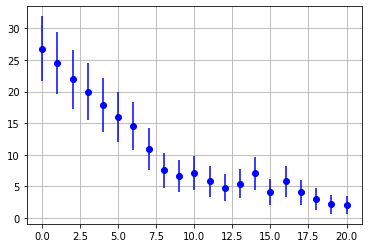

In [83]:
plt.errorbar(x, arr_mse_x.reshape(n,), arr_std_x.reshape(n,), linestyle='None', marker='o', color='b', label='x error')
plt.grid(True)

<ErrorbarContainer object of 3 artists>

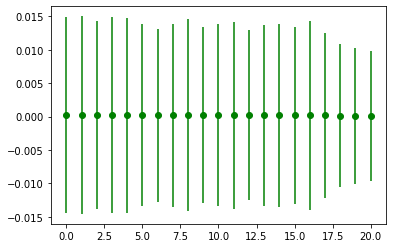

In [84]:
plt.errorbar(x, arr_mse_t.reshape(n,), arr_std_t.reshape(n,), linestyle='None', marker='o', color='g', label='t error')

<ErrorbarContainer object of 3 artists>

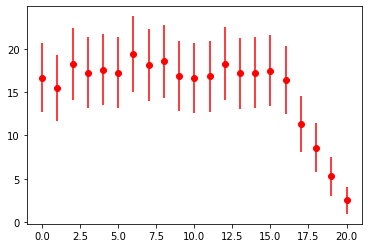

In [85]:
plt.errorbar(x, arr_mse_z.reshape(n,), arr_std_z.reshape(n,), linestyle='None', marker='o', color='r', label='z error')

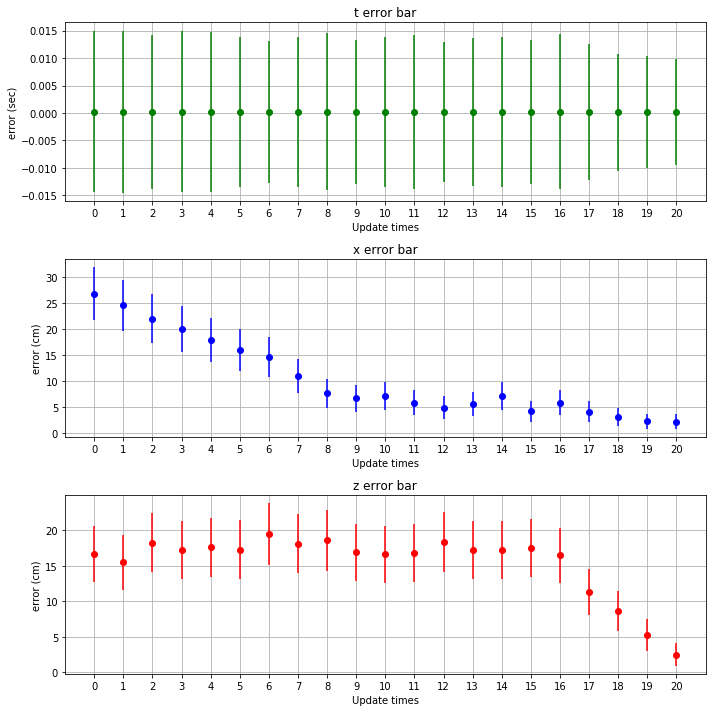

In [86]:
plt.figure(figsize=(10,10))

plt.subplot(3,1,1)
plt.errorbar(x, arr_mse_t.reshape(n,), arr_std_t.reshape(n,), linestyle='None', marker='o', color='g', label='t error')
plt.title('t error bar')
plt.xlabel('Update times')
plt.ylabel('error (sec)')
plt.xticks(np.arange(0,21))
plt.grid(True)

plt.subplot(3,1,2)
plt.errorbar(x, arr_mse_x.reshape(n,), arr_std_x.reshape(n,), linestyle='None', marker='o', color='b', label='x error')
plt.title('x error bar')
plt.xlabel('Update times')
plt.ylabel('error (cm)')
plt.xticks(np.arange(0,21))
plt.grid(True)

plt.subplot(3,1,3)
plt.errorbar(x, arr_mse_z.reshape(n,), arr_std_z.reshape(n,), linestyle='None', marker='o', color='r', label='z error')
plt.title('z error bar')
plt.xlabel('Update times')
plt.ylabel('error (cm)')
plt.xticks(np.arange(0,21))
plt.grid(True)

plt.tight_layout()
#plt.savefig('./fig/with_classification/'+name+'_test_res.png')
#plt.savefig('./fig/with_classification/'+name+'_test_res.svg')

plt.savefig('/home/lab606a/Documents/4Journal_20200629/result/fixed/'+name+'/with classification/png/'+name+'_test_res.png')
plt.savefig('/home/lab606a/Documents/4Journal_20200629/result/fixed/'+name+'/with classification/svg/'+name+'_test_res.svg')

In [87]:
arr_for_err_x

array([[-1.32868007, -0.90371546, -2.13613203, ..., -0.22186468,
        -0.52205597, -0.36655421],
       [ 2.4758378 ,  0.78705746,  1.38506538, ..., -0.10105783,
        -0.11784597,  0.65832127],
       [-0.3474898 , -0.25152775,  0.91705933, ..., -0.57448411,
        -0.51915131,  0.24138079],
       ...,
       [ 1.95976687,  2.72709954,  4.17051195, ..., -0.22542598,
         0.17986264, -0.24967003],
       [ 4.00887347,  4.21316719,  3.78840597, ...,  0.93378105,
         0.82817534,  1.11970851],
       [-0.93152474, -1.02605141,  0.0836613 , ..., -1.00907982,
        -0.43788854, -0.53944728]])

230 248
accuray = 92.74193548387096%


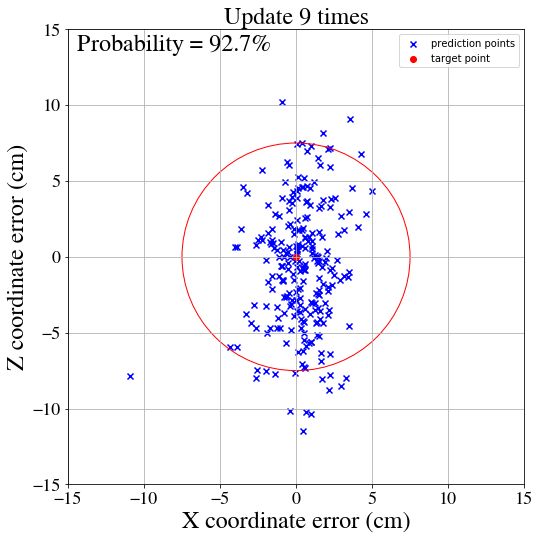

In [88]:
k = 10
up_times = k - 1

correct = 0
for i in range(arr_for_err_x.shape[0]):
    if arr_for_err_x[i,up_times] < 7.5 and arr_for_err_x[i,up_times] > -7.5 and arr_for_err_z[i,up_times] < 7.5 and arr_for_err_z[i,up_times] > -7.5:
        correct += 1
print(correct, arr_for_err_x.shape[0])
print("accuray = {}%".format(correct/arr_for_err_x.shape[0]*100))
aa = np.round_(correct/arr_for_err_x.shape[0]*100, 1)
text = str("Probability = {}%".format(aa))

plt.figure(figsize=(8,8))

x = y = np.arange(-7.5, 7.5, 0.005)
x, y = np.meshgrid(x,y)
#plt.contour(x, y, x**2 + y**2, [15*15])
circle2 = plt.Circle((0, 0), 7.5, color='r', fill=False, label='paddle edge')

ax = plt.gca()
ax.add_artist(circle2)
ax.set_xlim((-15, 15))
ax.set_ylim((-15, 15))

plt.scatter(cp.asnumpy(arr_for_err_x[:,up_times]), cp.asnumpy(arr_for_err_z[:,up_times]), edgecolors='b', label='prediction points', marker='x', color='b')
plt.scatter(0,0, color='r', marker='o', label='target point')
plt.Circle((0,0), 7.5, color='r', fill=False)

plt.xlabel('X coordinate error (cm)', fontsize=24, fontname='FreeSerif')
plt.ylabel('Z coordinate error (cm)', fontsize=24, fontname='FreeSerif')
plt.xticks(fontsize=18, fontname='FreeSerif')
plt.yticks(fontsize=18, fontname='FreeSerif')

title_name = 'Update ' + str(up_times) + ' times'
plt.title(title_name, fontsize=24, fontname='FreeSerif')
plt.text(-8,14,text, fontsize=24, fontname='FreeSerif', horizontalalignment='center', verticalalignment='center')

plt.tight_layout(pad=2.5)
plt.grid(True)
plt.legend(loc='upper right')
#plt.savefig('./fig/update_' + str(up_times) + '_times.png')

224 248
accuray = 90.32258064516128%
221 248
accuray = 89.11290322580645%
221 248
accuray = 89.11290322580645%
224 248
accuray = 90.32258064516128%
226 248
accuray = 91.12903225806451%
226 248
accuray = 91.12903225806451%
227 248
accuray = 91.53225806451613%
227 248
accuray = 91.53225806451613%
223 248
accuray = 89.91935483870968%
226 248
accuray = 91.12903225806451%
227 248
accuray = 91.53225806451613%
234 248
accuray = 94.35483870967742%
227 248
accuray = 91.53225806451613%
228 248
accuray = 91.93548387096774%
230 248
accuray = 92.74193548387096%
229 248
accuray = 92.33870967741935%
234 248
accuray = 94.35483870967742%
236 248
accuray = 95.16129032258065%
238 248
accuray = 95.96774193548387%
239 248
accuray = 96.37096774193549%
245 248
accuray = 98.79032258064517%


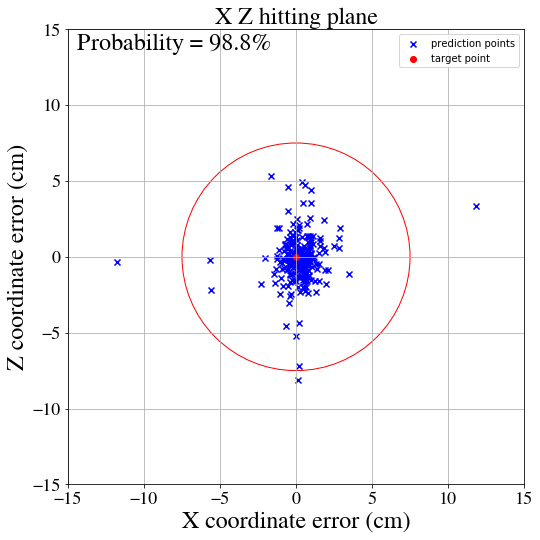

In [89]:
import math
up_times = 0

correct = 0
for i in range(arr_for_err_x.shape[0]):
    if arr_for_err_x[i,up_times] < 7.5 and arr_for_err_x[i,up_times] > -7.5 and arr_for_err_z[i,up_times] < 7.5 and arr_for_err_z[i,up_times] > -7.5:
        correct += 1
print(correct, arr_for_err_x.shape[0])
print("accuray = {}%".format(correct/arr_for_err_x.shape[0]*100))
aa = np.round_(correct/arr_for_err_x.shape[0]*100, 1)
text = str("Probability = {}%".format(aa))

plt.figure(figsize=(8,8))

x = y = np.arange(-7.5, 7.5, 0.005)
x, y = np.meshgrid(x,y)
#plt.contour(x, y, x**2 + y**2, [15*15])
circle2 = plt.Circle((0, 0), 7.5, color='r', fill=False, label='paddle edge')

ax = plt.gca()
ax.add_artist(circle2)
ax.set_xlim((-15, 15))
ax.set_ylim((-15, 15))

plt.scatter(cp.asnumpy(arr_for_err_x[:,up_times]), cp.asnumpy(arr_for_err_z[:,up_times]), edgecolors='b', label='prediction points', marker='x', color='b')
plt.scatter(0,0, color='r', marker='o', label='target point')
plt.Circle((0,0), 7.5, color='r', fill=False)

plt.xlabel('X coordinate error (cm)', fontsize=24, fontname='FreeSerif')
plt.ylabel('Z coordinate error (cm)', fontsize=24, fontname='FreeSerif')
plt.xticks(fontsize=18, fontname='FreeSerif')
plt.yticks(fontsize=18, fontname='FreeSerif')
plt.title('X Z hitting plane', fontsize=24, fontname='FreeSerif')
plt.text(-8,14,text, fontsize=24, fontname='FreeSerif', horizontalalignment='center', verticalalignment='center')

plt.tight_layout(pad=2.5)
plt.grid(True)
plt.legend(loc='upper right')
plt.savefig('./fig/with_classification/update_' + str(up_times) + '_times_with_classification.png')
plt.savefig('./fig/with_classification/update_' + str(up_times) + '_times_with_classification.svg')

for up_times in range(1,n,1):
    plt.clf()
    #plt.figure(figsize=(8,8))
    '''
    ax = plt.gca()
    ax.add_artist(circle2)
    ax.set_xlim((-15, 15))
    ax.set_ylim((-15, 15))
    '''
    
    circle2 = plt.Circle((0, 0), 7.5, color='r', fill=False, label='paddle edge')
    ax = plt.gca()
    ax.add_artist(circle2)
    
    correct = 0
    for i in range(arr_for_err_x.shape[0]):
        d = math.sqrt(arr_for_err_x[i,up_times]**2+arr_for_err_z[i,up_times]**2)
        if d <= 7.5:
            correct += 1
    print(correct, arr_for_err_x.shape[0])
    print("accuray = {}%".format(correct/arr_for_err_x.shape[0]*100))
    aa = np.round_(correct/arr_for_err_x.shape[0]*100, 1)
    text = str("Probability = {}%".format(aa))
    
    plt.scatter(cp.asnumpy(arr_for_err_x[:,up_times]), cp.asnumpy(arr_for_err_z[:,up_times]), edgecolors='b', label='prediction points', marker='x', color='b')
    plt.scatter(0,0, color='r', marker='o', label='target point')
    plt.Circle((0,0), 7.5, color='r', fill=False)

    plt.xlabel('X coordinate error (cm)', fontsize=24, fontname='FreeSerif')
    plt.ylabel('Z coordinate error (cm)', fontsize=24, fontname='FreeSerif')
    plt.xticks(fontsize=18, fontname='FreeSerif')
    plt.yticks(fontsize=18, fontname='FreeSerif')
    plt.title('X Z hitting plane', fontsize=24, fontname='FreeSerif')
    plt.text(-8,14,text, fontsize=24, fontname='FreeSerif', horizontalalignment='center', verticalalignment='center')

    plt.xlim(-15,15)
    plt.ylim(-15,15)
    
    plt.tight_layout(pad=2.5)
    plt.grid(True)
    plt.legend(loc='upper right')
    #plt.savefig('./fig/with_classification/update_' + str(up_times) + '_times_with_classification.png')
    #plt.savefig('./fig/with_classification/update_' + str(up_times) + '_times_with_classification.svg')
    
    plt.savefig('/home/lab606a/Documents/4Journal_20200629/result/fixed/'+name+'/with classification/png/update_'+str(up_times) + '_times_without_classification.png')
    plt.savefig('/home/lab606a/Documents/4Journal_20200629/result/fixed/'+name+'/with classification/svg/update_'+str(up_times) + '_times_without_classification.svg')
    

In [90]:
errbar = [arr_mse_t, arr_mse_x, arr_mse_z, arr_std_t, arr_std_x, arr_std_z]
errbar = np.array(errbar)
errbar

array([[[ 0.00022643,  0.00022841,  0.00020194,  0.00021774,
          0.00021306,  0.00018786,  0.00016773,  0.00019   ,
          0.00022107,  0.00019213,  0.00020685,  0.00020231,
          0.00016881,  0.00018536,  0.00018744,  0.0001765 ,
          0.00020546,  0.00017124,  0.00013167,  0.00012022,
          0.00009757]],

       [[26.75900421, 24.54532109, 21.94140045, 19.98189906,
         17.87187302, 15.96198719, 14.51917558, 10.92169268,
          7.56535811,  6.66457195,  7.1174431 ,  5.80844855,
          4.83517603,  5.46451378,  7.05308563,  4.12396379,
          5.79163195,  4.06900436,  3.00219373,  2.21383578,
          2.10581703]],

       [[16.67486641, 15.49686604, 18.27628437, 17.26841435,
         17.62515789, 17.29112443, 19.44420137, 18.11996168,
         18.58922247, 16.90725951, 16.64343375, 16.85056349,
         18.30291209, 17.2265521 , 17.25490907, 17.49993677,
         16.46116472, 11.30253615,  8.59464116,  5.26163941,
          2.49133331]],

       [[ 

In [91]:
errbar = errbar.reshape(6,21)
errbar

array([[ 0.00022643,  0.00022841,  0.00020194,  0.00021774,  0.00021306,
         0.00018786,  0.00016773,  0.00019   ,  0.00022107,  0.00019213,
         0.00020685,  0.00020231,  0.00016881,  0.00018536,  0.00018744,
         0.0001765 ,  0.00020546,  0.00017124,  0.00013167,  0.00012022,
         0.00009757],
       [26.75900421, 24.54532109, 21.94140045, 19.98189906, 17.87187302,
        15.96198719, 14.51917558, 10.92169268,  7.56535811,  6.66457195,
         7.1174431 ,  5.80844855,  4.83517603,  5.46451378,  7.05308563,
         4.12396379,  5.79163195,  4.06900436,  3.00219373,  2.21383578,
         2.10581703],
       [16.67486641, 15.49686604, 18.27628437, 17.26841435, 17.62515789,
        17.29112443, 19.44420137, 18.11996168, 18.58922247, 16.90725951,
        16.64343375, 16.85056349, 18.30291209, 17.2265521 , 17.25490907,
        17.49993677, 16.46116472, 11.30253615,  8.59464116,  5.26163941,
         2.49133331],
       [ 0.01472847,  0.01480342,  0.01406192,  0.01469599

In [92]:
#errbar = errbar.reshape(21,6)
df = pd.DataFrame(data=errbar)

#p = '/home/lab606a/Documents/comp/with classification/with_classification.csv'
p = '/home/lab606a/Documents/4Journal_20200629/result/fixed/'+name+'/with classification/with_classification.csv'

df.to_csv(p, index=False)